In [1]:
import pandas as pd

In [2]:
#label = pd.read_csv("ishitalabel.csv")
label = pd.read_csv("ADR_combined.csv")
label.drop("Unnamed: 0", axis=1, inplace = True)
label

,AFIB,Abnormal.Gait,Abnormal.LFTs,Aching.joints,Acidosis,Acute.Respiratory.Distress.Syndrome,Adenopathy,Amnesia,Anorexia,Anxiety,...,sleep.disorder,spinning.sensation,still.birth,tachycardia.ventricular,thrombocytopenia,tinnitus,transient.ischaemic.attack,tremor,weight.gain,wheeze
0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,1,...,0,0,1,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34544,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
34545,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
34546,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
34547,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
pca = pd.read_csv("pca_dataset_for_5000_features.csv")
pca.drop("Unnamed: 0", axis=1, inplace = True)
pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC4991,PC4992,PC4993,PC4994,PC4995,PC4996,PC4997,PC4998,PC4999,PC5000
0,-9.722508,6.882401,-28.136658,-11.996354,13.783474,-15.887833,17.753766,20.762276,-34.157448,-13.358568,...,-6.523431e-14,1.303559e-13,3.934371e-14,-4.816780e-14,-4.167417e-15,4.977916e-14,-4.172018e-14,-5.556243e-14,2.843607e-14,1.203873e-14
1,1.591902,20.986937,-26.549038,-2.369404,12.616441,-16.265122,3.307916,-19.128125,-28.407641,3.590524,...,-6.178506e-14,1.327030e-13,5.515074e-14,-3.410434e-14,-3.165231e-15,4.281642e-14,-5.072598e-14,-4.507174e-14,5.030230e-15,3.037695e-14
2,-14.391072,-8.375696,-26.025247,-6.607709,12.866812,-17.365116,-23.771639,-5.569757,-27.422448,10.909902,...,-6.679320e-14,1.396297e-13,5.018076e-14,-3.544528e-14,9.472229e-15,4.245777e-14,-5.202182e-14,-5.496921e-14,1.482720e-15,2.795528e-14
3,-10.642523,-0.253853,-25.697602,2.397817,12.231165,-17.174953,-17.554827,1.097112,-29.103516,4.284658,...,-6.099229e-14,1.366564e-13,5.800783e-14,-2.338722e-14,1.799493e-14,4.869106e-14,-5.239782e-14,-4.624181e-14,8.842285e-15,3.030583e-14
4,-16.932294,10.992771,-27.618150,-5.201924,13.693284,-16.404326,19.026354,-8.519542,-30.766668,-3.217322,...,-4.339371e-14,1.167556e-13,5.793821e-14,-3.870835e-14,9.312252e-15,4.035268e-14,-4.701889e-14,-5.372449e-14,1.119812e-14,1.689422e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34544,-14.344778,13.240083,-1.295310,-7.872202,-7.037733,-2.925556,114.952325,111.921118,-16.496931,5.262715,...,4.855550e-14,5.222048e-14,-2.669004e-14,7.442290e-15,7.712352e-15,3.719658e-15,-5.516514e-14,-1.009017e-14,-3.960842e-15,6.472461e-15
34545,7.010290,-10.352976,0.390246,-2.274423,-8.072765,-3.479759,72.825221,-57.049484,11.853988,89.574174,...,5.102772e-14,5.609322e-14,-3.615492e-14,5.181023e-15,5.824590e-15,6.759726e-16,-6.210426e-14,-1.206442e-15,-1.244616e-14,1.157426e-14
34546,-25.680626,-0.351136,5.359017,12.348414,-10.372570,-0.937247,-6.583409,-1.177565,-17.356108,-5.351222,...,1.570006e-14,-9.640380e-15,5.077781e-14,7.935005e-14,-1.454475e-14,1.063159e-13,4.401352e-14,5.999625e-14,9.650263e-15,-7.729876e-15
34547,-22.011063,-1.649839,4.266045,-10.976119,-8.557332,-1.274211,-15.750118,3.548119,-14.550488,12.094083,...,-4.481067e-15,-5.692400e-15,2.987235e-14,7.325943e-14,-1.581440e-14,1.014080e-13,3.103457e-14,5.517945e-14,-8.785542e-15,-8.695852e-15


In [4]:
pca_small = pca
label_small = label

In [5]:
def dbAdd(scores, df1, df4):
    f1_major=0
    recall_major=0
    precision_major=0
    roc_major=0

    for i in range(5):
        f1 = scores['test_f1_macro'][i]
        recall = scores['test_recall_macro'][i]
        precision = scores['test_precision_macro'][i]
        roc = scores['test_roc_auc'][i]
        df2 = pd.DataFrame({'Fold': i+1, 'ADR': [adr], 'PCA': lim, 'F1 Macro': f1, "Recall Macro": recall,
                        "Precision Macro": precision, "ROC Macro": roc})
        df1 = df1.append(df2)

        f1_major += f1
        recall_major += recall
        precision_major += precision
        roc_major += roc

    df3 = pd.DataFrame({'ADR': [adr], 'PCA': lim, 'Avg F1': f1_major, "Avg Recall": recall_major,
                    "Avg Precision": precision_major, "Avg ROC": roc_major})
    df4 = df4.append(df3)

    print(df1)
    print("\n\n")
    print(df4)
    return df1, df4




def getDF():
    df1 = pd.DataFrame({'Fold': [], 'ADR': [],'PCA': [], 'F1 Macro': [], 'Recall Macro': [],
                        'Precision Macro': [], 'ROC Macro': []})
    df4 = pd.DataFrame({'ADR': [],'PCA': [], 'Avg F1': [], 'Avg Recall': [],
                        'Avg Precision': [], 'Avg ROC': []})
    return df1,df4





def doClassification(X,Y, adr):
    import math
    k = int(math.sqrt(len(X))//2)
    classifiers = [
                   GaussianNB(), 
                   DecisionTreeClassifier(max_depth=10, random_state=101, min_samples_leaf=15),
                   RandomForestClassifier(random_state=101, n_jobs=-1, oob_score=True, n_estimators=k),
                   SGDClassifier(max_iter=1500),
                   LogisticRegression(random_state=0)
                  ]
    
    classifierNames = ["NB", "DT", "RF", "SGD", "LR"]
    for i in range(len(classifiers)):        
        clf = classifiers[i]
        clfName = classifierNames[i]
        print("==================================", clfName, "==================================")
        df1,df4 = getDF()
        
            
        scores = cross_validate(clf, X, Y, cv=5, scoring=scoring, return_estimator=True)
        
        array = [[0,0],[0,0]]
        for i in range(5):
            estimator = scores['estimator'][i]
            y_pred = estimator.predict(X)
            array += confusion_matrix(Y, y_pred)
        
        array = array // 5
            
        sn.set()
        df_cm = pd.DataFrame(array)
        plt.figure(figsize = (7,6))
        ax = sn.heatmap(df_cm, annot=True)
        plt.title(clfName + ' - ' + adr)
        plt.savefig('./Ishita/' + clfName + '/' + clfName + "_" + adr + '.png')
        plt.show()
        
        
        df1, df4 = dbAdd(scores, df1, df4)
        df1.to_csv('./Ishita/' + clfName + '/' + clfName + "_" + adr + '_Full.csv')
        df4.to_csv('./Ishita/' + clfName + '/' + clfName + "_" + adr + '_Average.csv')

================================== abscess ==================================
================================== NB ==================================


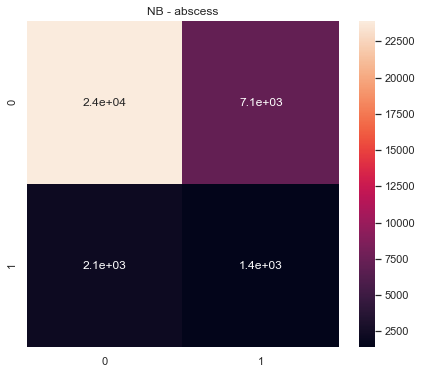

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  abscess  300.0  0.512013      0.535187         0.519076   0.567261
0   2.0  abscess  300.0  0.513876      0.548901         0.524370   0.582299
0   3.0  abscess  300.0  0.479103      0.519279         0.508352   0.547833
0   4.0  abscess  300.0  0.510804      0.535515         0.518899   0.555136
0   5.0  abscess  300.0  0.510498      0.523918         0.514452   0.553576



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  abscess  300.0  2.526294      2.6628       2.585149  2.806104
================================== DT ==================================


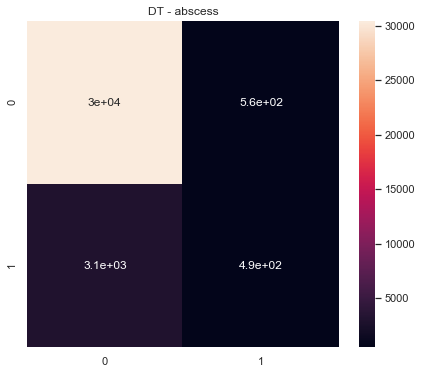

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  abscess  300.0  0.491279      0.502415         0.508998   0.538946
0   2.0  abscess  300.0  0.470095      0.473415         0.467384   0.477498
0   3.0  abscess  300.0  0.477213      0.479951         0.475284   0.478980
0   4.0  abscess  300.0  0.496157      0.500351         0.500644   0.532006
0   5.0  abscess  300.0  0.504349      0.511249         0.544914   0.543475



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  abscess  300.0  2.439092    2.467381       2.497224  2.570905
================================== RF ==================================


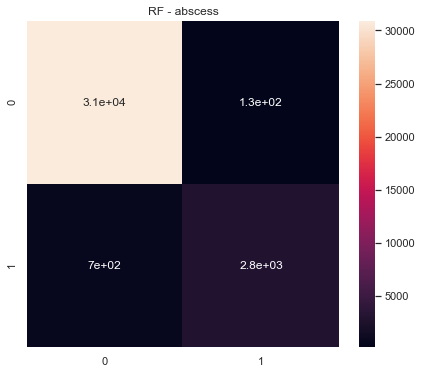

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  abscess  300.0  0.474364      0.500545         0.615487   0.602173
0   2.0  abscess  300.0  0.473180      0.493312         0.464537   0.556548
0   3.0  abscess  300.0  0.457139      0.468055         0.446880   0.523022
0   4.0  abscess  300.0  0.489647      0.503361         0.517561   0.488894
0   5.0  abscess  300.0  0.472998      0.500000         0.448762   0.560476



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  abscess  300.0  2.367327    2.465273       2.493228  2.731113
================================== SGD ==================================


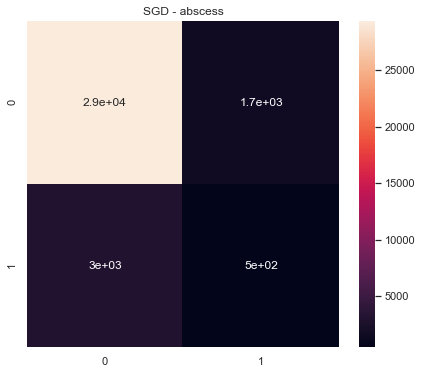

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  abscess  300.0  0.470179      0.477520         0.464955   0.459513
0   2.0  abscess  300.0  0.507460      0.510896         0.527170   0.462688
0   3.0  abscess  300.0  0.451472      0.453508         0.449481   0.420849
0   4.0  abscess  300.0  0.471910      0.475540         0.469104   0.441766
0   5.0  abscess  300.0  0.486728      0.486139         0.488243   0.446942



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  abscess  300.0  2.387749    2.403604       2.398952  2.231758
================================== LR ==================================


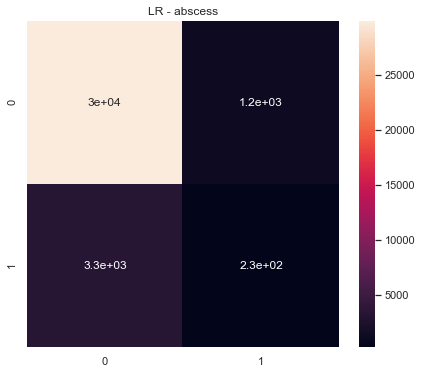

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  abscess  300.0  0.521084      0.534861         0.522094   0.533441
0   2.0  abscess  300.0  0.539981      0.535181         0.554036   0.523877
0   3.0  abscess  300.0  0.474041      0.506564         0.502888   0.493438
0   4.0  abscess  300.0  0.478749      0.477781         0.484307   0.471205
0   5.0  abscess  300.0  0.470626      0.472114         0.484041   0.480601



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  abscess  300.0  2.484481    2.526501       2.547366  2.502562
================================== aching.muscles ==================================
================================== NB ==================================


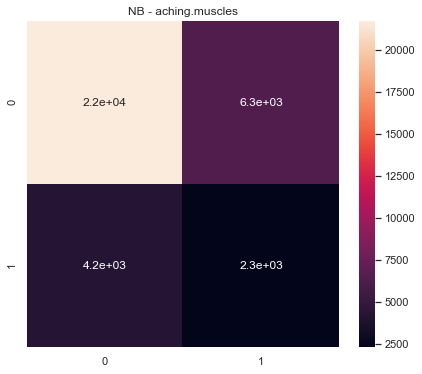

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aching.muscles  300.0  0.532818      0.531394         0.537233   
0   2.0  aching.muscles  300.0  0.512962      0.524145         0.517874   
0   3.0  aching.muscles  300.0  0.487458      0.497689         0.498363   
0   4.0  aching.muscles  300.0  0.509941      0.510882         0.509950   
0   5.0  aching.muscles  300.0  0.511347      0.511641         0.511211   

   ROC Macro  
0   0.578351  
0   0.546456  
0   0.501787  
0   0.527630  
0   0.517677  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aching.muscles  300.0  2.554526    2.575752       2.574632  2.671902
================================== DT ==================================


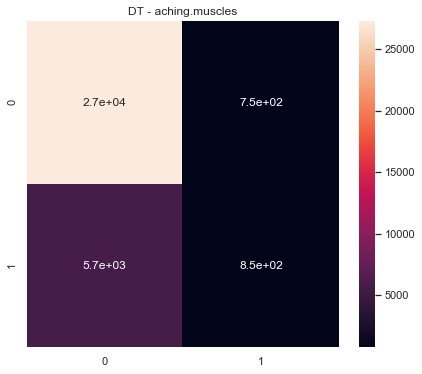

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aching.muscles  300.0  0.467648      0.502905         0.521180   
0   2.0  aching.muscles  300.0  0.472410      0.485499         0.473850   
0   3.0  aching.muscles  300.0  0.433271      0.446515         0.423375   
0   4.0  aching.muscles  300.0  0.463279      0.486584         0.465017   
0   5.0  aching.muscles  300.0  0.460383      0.497421         0.483288   

   ROC Macro  
0   0.520788  
0   0.482379  
0   0.452307  
0   0.477845  
0   0.483045  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aching.muscles  300.0  2.296992    2.418924       2.366709  2.416363
================================== RF ==================================


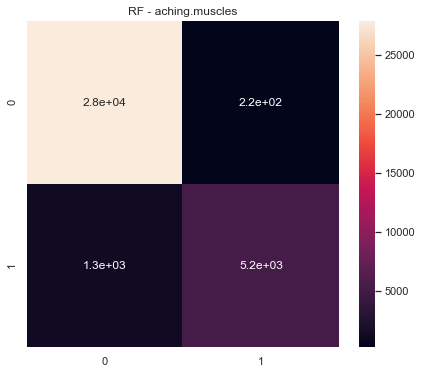

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aching.muscles  300.0  0.447907      0.499733         0.405820   
0   2.0  aching.muscles  300.0  0.450678      0.490761         0.443738   
0   3.0  aching.muscles  300.0  0.417320      0.441166         0.395920   
0   4.0  aching.muscles  300.0  0.437964      0.478126         0.406296   
0   5.0  aching.muscles  300.0  0.448790      0.500295         0.655893   

   ROC Macro  
0   0.548913  
0   0.539214  
0   0.473045  
0   0.383898  
0   0.524791  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  aching.muscles  300.0  2.202659    2.410081       2.307666  2.46986
================================== SGD ==================================


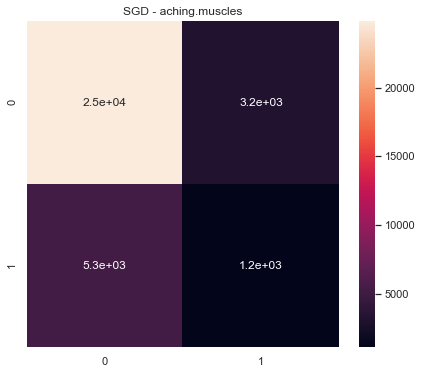

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aching.muscles  300.0  0.466358      0.472582         0.463991   
0   2.0  aching.muscles  300.0  0.487312      0.489223         0.487327   
0   3.0  aching.muscles  300.0  0.453420      0.454540         0.452426   
0   4.0  aching.muscles  300.0  0.450875      0.450538         0.451225   
0   5.0  aching.muscles  300.0  0.501510      0.503333         0.504254   

   ROC Macro  
0   0.434789  
0   0.448355  
0   0.404760  
0   0.439446  
0   0.497834  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aching.muscles  300.0  2.359474    2.370215       2.359223  2.225184
================================== LR ==================================


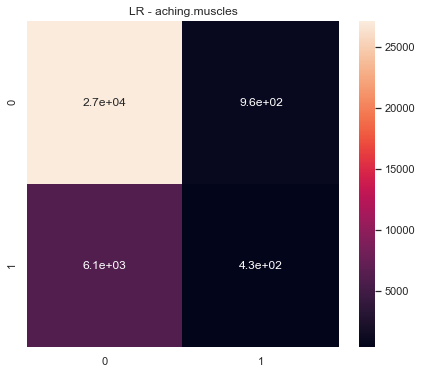

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aching.muscles  300.0  0.535357      0.534246         0.552325   
0   2.0  aching.muscles  300.0  0.480133      0.487423         0.481325   
0   3.0  aching.muscles  300.0  0.455845      0.453755         0.462643   
0   4.0  aching.muscles  300.0  0.466868      0.468165         0.465894   
0   5.0  aching.muscles  300.0  0.493861      0.506858         0.516028   

   ROC Macro  
0   0.609945  
0   0.487842  
0   0.420926  
0   0.412418  
0   0.497351  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aching.muscles  300.0  2.432064    2.450447       2.478214  2.428481
================================== acid.reflux ==================================
================================== NB ==================================


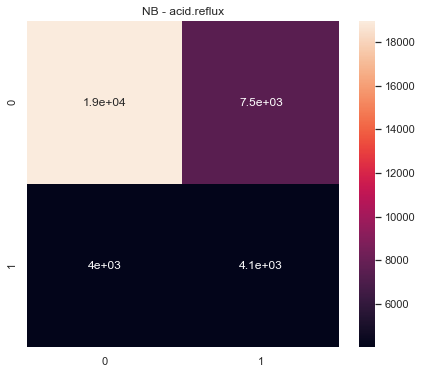

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acid.reflux  300.0  0.568452      0.567980         0.568968   
0   2.0  acid.reflux  300.0  0.554174      0.557092         0.552724   
0   3.0  acid.reflux  300.0  0.549777      0.572717         0.555592   
0   4.0  acid.reflux  300.0  0.551280      0.566134         0.552908   
0   5.0  acid.reflux  300.0  0.551742      0.555868         0.550288   

   ROC Macro  
0   0.621565  
0   0.563546  
0   0.599664  
0   0.591042  
0   0.586398  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acid.reflux  300.0  2.775425    2.819791        2.78048  2.962216
================================== DT ==================================


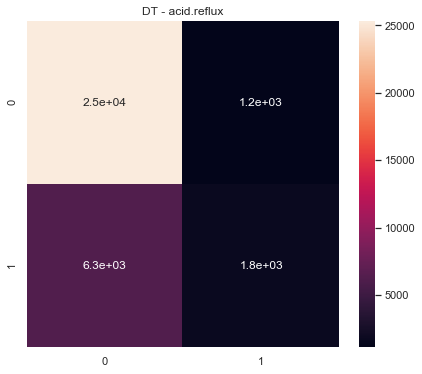

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acid.reflux  300.0  0.510538      0.525563         0.567216   
0   2.0  acid.reflux  300.0  0.517898      0.527825         0.560254   
0   3.0  acid.reflux  300.0  0.496582      0.510017         0.520097   
0   4.0  acid.reflux  300.0  0.486616      0.499035         0.498305   
0   5.0  acid.reflux  300.0  0.494076      0.517129         0.555089   

   ROC Macro  
0   0.566570  
0   0.577605  
0   0.540290  
0   0.509821  
0   0.524296  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acid.reflux  300.0  2.50571    2.579569       2.700961  2.718583
================================== RF ==================================


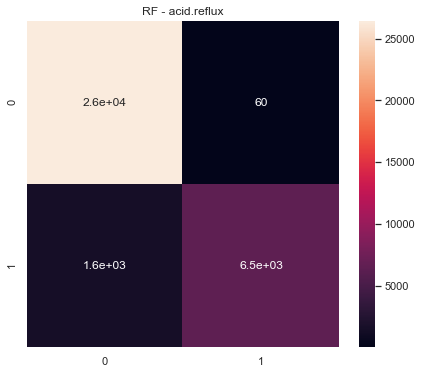

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acid.reflux  300.0  0.449666      0.505715         0.629627   
0   2.0  acid.reflux  300.0  0.445813      0.504583         0.654164   
0   3.0  acid.reflux  300.0  0.453991      0.500984         0.506875   
0   4.0  acid.reflux  300.0  0.440056      0.496760         0.461918   
0   5.0  acid.reflux  300.0  0.443950      0.502834         0.575124   

   ROC Macro  
0   0.614972  
0   0.631518  
0   0.612771  
0   0.584212  
0   0.644691  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acid.reflux  300.0  2.233476    2.510875       2.827707  3.088164
================================== SGD ==================================


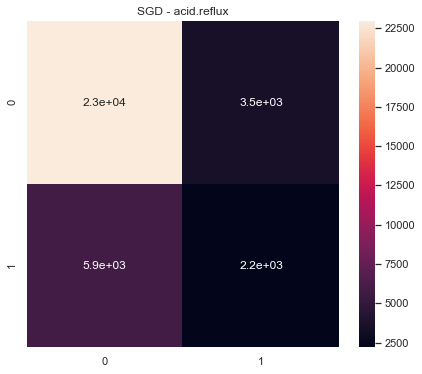

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acid.reflux  300.0  0.504810      0.507661         0.510002   
0   2.0  acid.reflux  300.0  0.481686      0.491440         0.486868   
0   3.0  acid.reflux  300.0  0.449108      0.468420         0.445263   
0   4.0  acid.reflux  300.0  0.468434      0.481813         0.470707   
0   5.0  acid.reflux  300.0  0.466971      0.480374         0.468617   

   ROC Macro  
0   0.474544  
0   0.461517  
0   0.438432  
0   0.470774  
0   0.453676  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acid.reflux  300.0  2.371008    2.429709       2.381457  2.298944
================================== LR ==================================


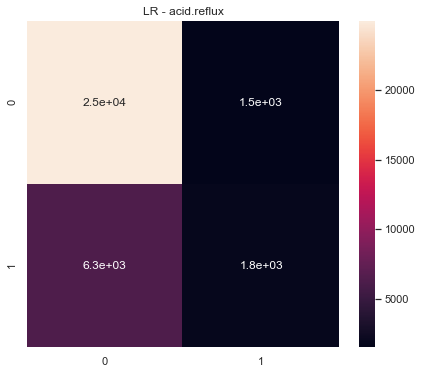

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acid.reflux  300.0  0.561538      0.558223         0.573195   
0   2.0  acid.reflux  300.0  0.513416      0.529385         0.586477   
0   3.0  acid.reflux  300.0  0.506495      0.508234         0.510167   
0   4.0  acid.reflux  300.0  0.540709      0.539285         0.546002   
0   5.0  acid.reflux  300.0  0.527027      0.534274         0.571929   

   ROC Macro  
0   0.599632  
0   0.517407  
0   0.530446  
0   0.562111  
0   0.599819  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acid.reflux  300.0  2.649184      2.6694        2.78777  2.809414
================================== acute.brain.syndrome ==================================
================================== NB ==================================


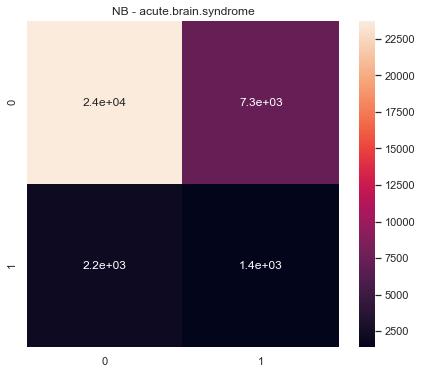

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.brain.syndrome  300.0  0.532281      0.564715         0.535132   
0   2.0  acute.brain.syndrome  300.0  0.509977      0.542577         0.521289   
0   3.0  acute.brain.syndrome  300.0  0.485096      0.537835         0.516005   
0   4.0  acute.brain.syndrome  300.0  0.506030      0.531564         0.516368   
0   5.0  acute.brain.syndrome  300.0  0.516573      0.533982         0.520042   

   ROC Macro  
0   0.597461  
0   0.569250  
0   0.556291  
0   0.560587  
0   0.571379  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.brain.syndrome  300.0  2.549956    2.710673       2.608835  2.854966
================================== DT ==================================


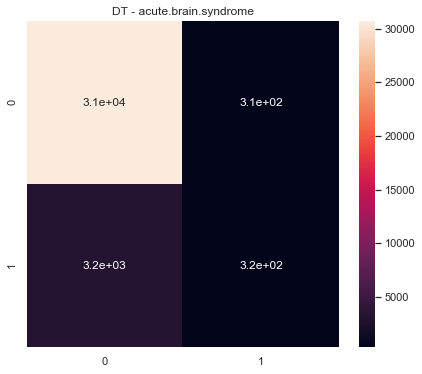

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.brain.syndrome  300.0  0.485449      0.500650         0.503301   
0   2.0  acute.brain.syndrome  300.0  0.503223      0.512131         0.570227   
0   3.0  acute.brain.syndrome  300.0  0.467556      0.477915         0.459876   
0   4.0  acute.brain.syndrome  300.0  0.491552      0.503579         0.515557   
0   5.0  acute.brain.syndrome  300.0  0.512687      0.516334         0.560333   

   ROC Macro  
0   0.536360  
0   0.543704  
0   0.486886  
0   0.519971  
0   0.554453  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.brain.syndrome  300.0  2.460466    2.510609       2.609294  2.641374
================================== RF ==================================


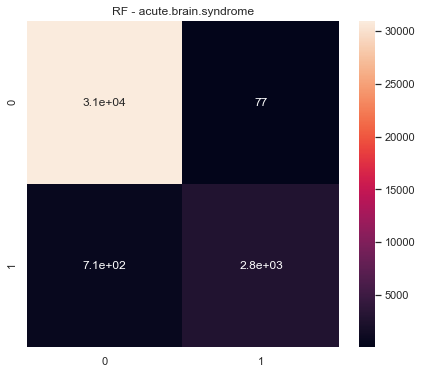

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.brain.syndrome  300.0  0.472720      0.499677         0.448523   
0   2.0  acute.brain.syndrome  300.0  0.471308      0.496854         0.448261   
0   3.0  acute.brain.syndrome  300.0  0.459184      0.473221         0.445956   
0   4.0  acute.brain.syndrome  300.0  0.472439      0.499113         0.448471   
0   5.0  acute.brain.syndrome  300.0  0.472917      0.500000         0.448618   

   ROC Macro  
0   0.576682  
0   0.552614  
0   0.504589  
0   0.498391  
0   0.585615  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  acute.brain.syndrome  300.0  2.348569    2.468866       2.239829  2.71789
================================== SGD ==================================


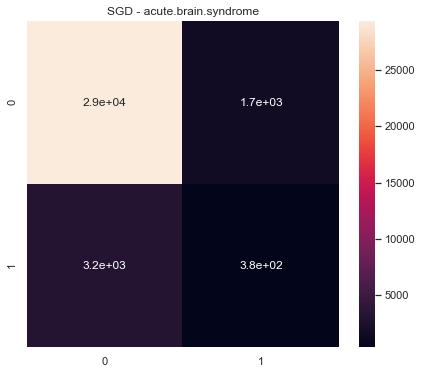

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.brain.syndrome  300.0  0.508862      0.508600         0.509553   
0   2.0  acute.brain.syndrome  300.0  0.500118      0.500118         0.500119   
0   3.0  acute.brain.syndrome  300.0  0.462639      0.470091         0.456275   
0   4.0  acute.brain.syndrome  300.0  0.489061      0.491546         0.488646   
0   5.0  acute.brain.syndrome  300.0  0.502362      0.502458         0.502348   

   ROC Macro  
0   0.492195  
0   0.482264  
0   0.460591  
0   0.480783  
0   0.492183  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.brain.syndrome  300.0  2.463042    2.472813        2.45694  2.408017
================================== LR ==================================


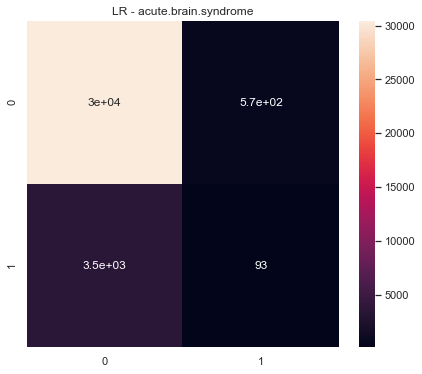

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.brain.syndrome  300.0  0.500272      0.500292         0.500284   
0   2.0  acute.brain.syndrome  300.0  0.480516      0.496685         0.485402   
0   3.0  acute.brain.syndrome  300.0  0.480177      0.492750         0.496249   
0   4.0  acute.brain.syndrome  300.0  0.505544      0.506392         0.509400   
0   5.0  acute.brain.syndrome  300.0  0.497554      0.506189         0.521785   

   ROC Macro  
0   0.551135  
0   0.523935  
0   0.486047  
0   0.485820  
0   0.542684  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  acute.brain.syndrome  300.0  2.464063    2.502309        2.51312  2.58962
================================== acute.kidney.failure ==================================
================================== NB ==================================


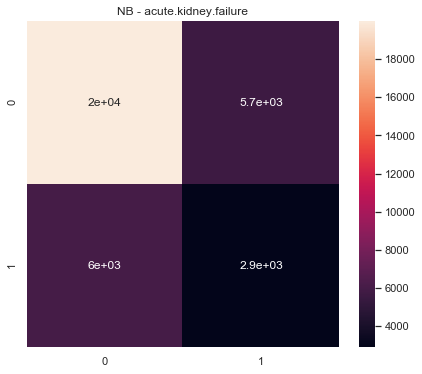

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.kidney.failure  300.0  0.534373      0.534354         0.534392   
0   2.0  acute.kidney.failure  300.0  0.524213      0.523875         0.524964   
0   3.0  acute.kidney.failure  300.0  0.519950      0.519696         0.520827   
0   4.0  acute.kidney.failure  300.0  0.519110      0.519089         0.521276   
0   5.0  acute.kidney.failure  300.0  0.522269      0.522813         0.527497   

   ROC Macro  
0   0.550061  
0   0.550294  
0   0.548963  
0   0.535364  
0   0.553214  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.kidney.failure  300.0  2.619917    2.619827       2.628956  2.737895
================================== DT ==================================


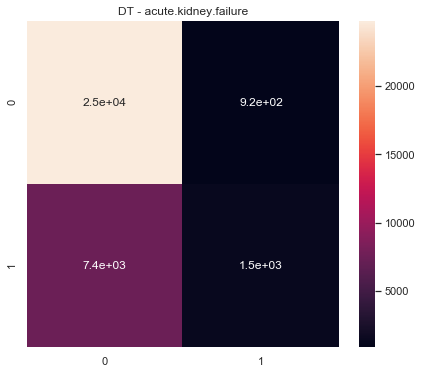

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.kidney.failure  300.0  0.478154      0.512003         0.544823   
0   2.0  acute.kidney.failure  300.0  0.483382      0.513233         0.543274   
0   3.0  acute.kidney.failure  300.0  0.470246      0.496446         0.491569   
0   4.0  acute.kidney.failure  300.0  0.478821      0.503802         0.509368   
0   5.0  acute.kidney.failure  300.0  0.469181      0.507862         0.532955   

   ROC Macro  
0   0.553950  
0   0.539206  
0   0.527954  
0   0.529875  
0   0.519267  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.kidney.failure  300.0  2.379784    2.533347       2.621987  2.670252
================================== RF ==================================


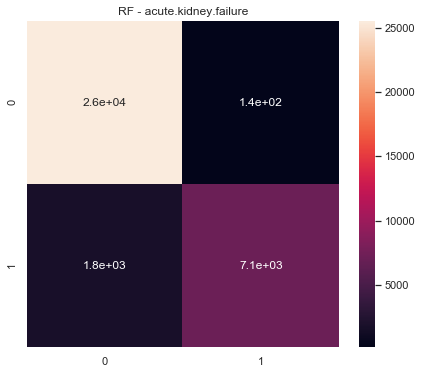

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.kidney.failure  300.0  0.433477      0.499017         0.483583   
0   2.0  acute.kidney.failure  300.0  0.429546      0.500602         0.537983   
0   3.0  acute.kidney.failure  300.0  0.433585      0.475735         0.427931   
0   4.0  acute.kidney.failure  300.0  0.429339      0.488137         0.423363   
0   5.0  acute.kidney.failure  300.0  0.435071      0.502731         0.595464   

   ROC Macro  
0   0.583507  
0   0.565015  
0   0.531072  
0   0.522894  
0   0.566253  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  acute.kidney.failure  300.0  2.161017    2.466222       2.468326  2.76874
================================== SGD ==================================


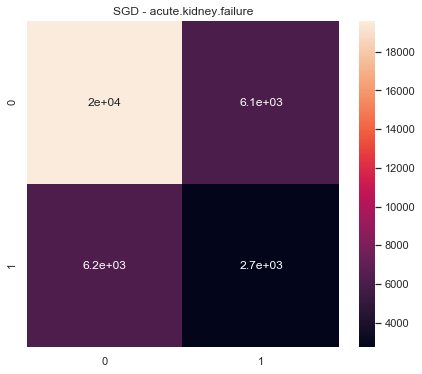

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.kidney.failure  300.0  0.511715      0.522136         0.518073   
0   2.0  acute.kidney.failure  300.0  0.520537      0.523851         0.533731   
0   3.0  acute.kidney.failure  300.0  0.515646      0.515670         0.515624   
0   4.0  acute.kidney.failure  300.0  0.490894      0.491594         0.490997   
0   5.0  acute.kidney.failure  300.0  0.518662      0.518587         0.518754   

   ROC Macro  
0   0.528279  
0   0.533025  
0   0.529332  
0   0.494351  
0   0.526299  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.kidney.failure  300.0  2.557455    2.571838       2.577179  2.611286
================================== LR ==================================


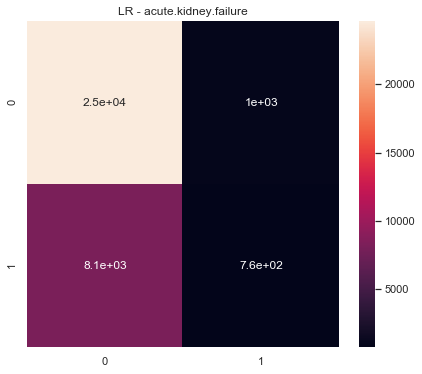

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  acute.kidney.failure  300.0  0.528462      0.529586         0.538928   
0   2.0  acute.kidney.failure  300.0  0.475133      0.508883         0.531295   
0   3.0  acute.kidney.failure  300.0  0.481068      0.486844         0.483052   
0   4.0  acute.kidney.failure  300.0  0.476557      0.487333         0.481202   
0   5.0  acute.kidney.failure  300.0  0.492475      0.514677         0.537431   

   ROC Macro  
0   0.574406  
0   0.543577  
0   0.504668  
0   0.510781  
0   0.561756  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  acute.kidney.failure  300.0  2.453696    2.527323       2.571909  2.695187
================================== adenocarcinoma ==================================
================================== NB ==================================


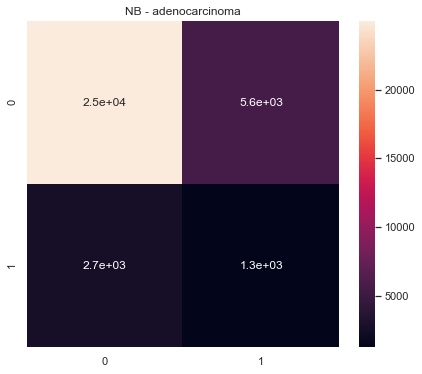

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adenocarcinoma  300.0  0.521140      0.531185         0.521559   
0   2.0  adenocarcinoma  300.0  0.532736      0.545684         0.531484   
0   3.0  adenocarcinoma  300.0  0.519389      0.539514         0.523599   
0   4.0  adenocarcinoma  300.0  0.523805      0.529955         0.522853   
0   5.0  adenocarcinoma  300.0  0.536643      0.547764         0.534427   

   ROC Macro  
0   0.564444  
0   0.574472  
0   0.564819  
0   0.543962  
0   0.603090  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adenocarcinoma  300.0  2.633713    2.694103       2.633922  2.850788
================================== DT ==================================


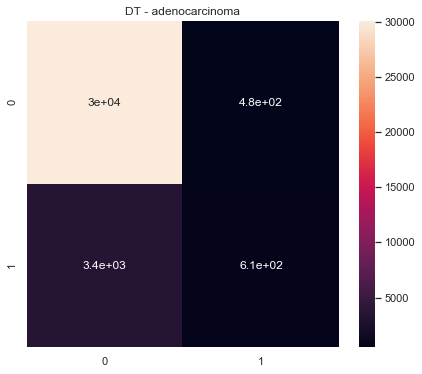

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adenocarcinoma  300.0  0.488903      0.500496         0.501526   
0   2.0  adenocarcinoma  300.0  0.510606      0.515702         0.552851   
0   3.0  adenocarcinoma  300.0  0.471092      0.480076         0.466117   
0   4.0  adenocarcinoma  300.0  0.503006      0.511407         0.543527   
0   5.0  adenocarcinoma  300.0  0.500351      0.509880         0.539057   

   ROC Macro  
0   0.504623  
0   0.546429  
0   0.480146  
0   0.528793  
0   0.527659  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adenocarcinoma  300.0  2.473957     2.51756       2.603078  2.587651
================================== RF ==================================


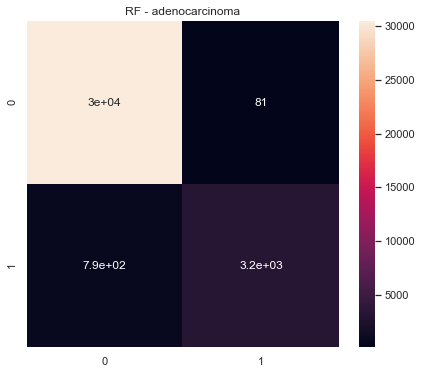

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adenocarcinoma  300.0  0.470436      0.500056         0.504908   
0   2.0  adenocarcinoma  300.0  0.468870      0.498855         0.442285   
0   3.0  adenocarcinoma  300.0  0.473564      0.483511         0.469222   
0   4.0  adenocarcinoma  300.0  0.470436      0.500137         0.513772   
0   5.0  adenocarcinoma  300.0  0.469436      0.500000         0.442394   

   ROC Macro  
0   0.565059  
0   0.584321  
0   0.538506  
0   0.507751  
0   0.563267  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adenocarcinoma  300.0  2.352742    2.482559       2.372582  2.758905
================================== SGD ==================================


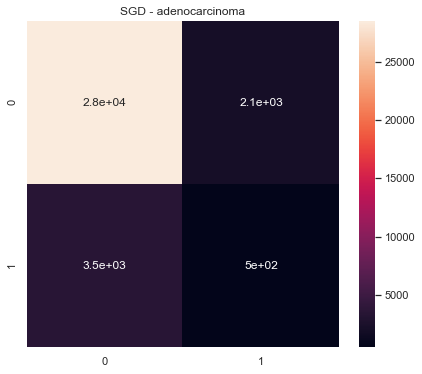

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adenocarcinoma  300.0  0.483119      0.483204         0.483037   
0   2.0  adenocarcinoma  300.0  0.480341      0.492014         0.480766   
0   3.0  adenocarcinoma  300.0  0.469799      0.467305         0.475112   
0   4.0  adenocarcinoma  300.0  0.474267      0.473720         0.482179   
0   5.0  adenocarcinoma  300.0  0.475091      0.475330         0.474861   

   ROC Macro  
0   0.482151  
0   0.477302  
0   0.471680  
0   0.413625  
0   0.439635  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adenocarcinoma  300.0  2.382617    2.391572       2.395956  2.284393
================================== LR ==================================


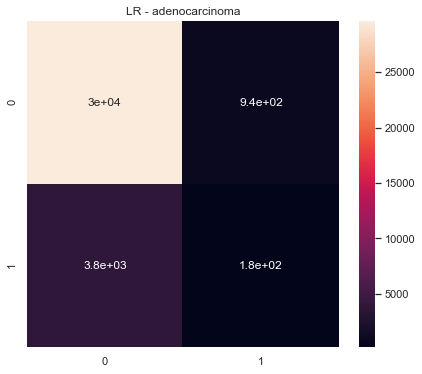

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adenocarcinoma  300.0  0.501368      0.511165         0.507044   
0   2.0  adenocarcinoma  300.0  0.504178      0.507750         0.515430   
0   3.0  adenocarcinoma  300.0  0.497234      0.501293         0.500905   
0   4.0  adenocarcinoma  300.0  0.477736      0.483984         0.490638   
0   5.0  adenocarcinoma  300.0  0.512293      0.512083         0.516430   

   ROC Macro  
0   0.518421  
0   0.523428  
0   0.548292  
0   0.484151  
0   0.523361  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adenocarcinoma  300.0  2.492809    2.516276       2.530447  2.597653
================================== adynamic.ileus ==================================
================================== NB ==================================


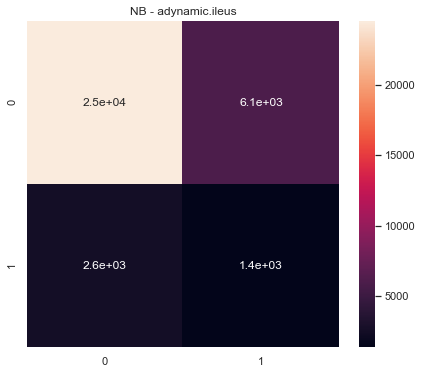

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adynamic.ileus  300.0  0.519929      0.530692         0.520796   
0   2.0  adynamic.ileus  300.0  0.520603      0.537853         0.523402   
0   3.0  adynamic.ileus  300.0  0.501851      0.531266         0.516210   
0   4.0  adynamic.ileus  300.0  0.523536      0.537529         0.524519   
0   5.0  adynamic.ileus  300.0  0.526667      0.531665         0.525230   

   ROC Macro  
0   0.569454  
0   0.576983  
0   0.558066  
0   0.552923  
0   0.584500  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adynamic.ileus  300.0  2.592586    2.669004       2.610157  2.841927
================================== DT ==================================


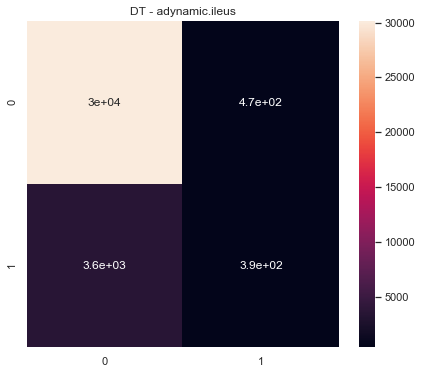

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adynamic.ileus  300.0  0.473072      0.483493         0.468342   
0   2.0  adynamic.ileus  300.0  0.473480      0.480977         0.469555   
0   3.0  adynamic.ileus  300.0  0.475616      0.480219         0.472974   
0   4.0  adynamic.ileus  300.0  0.490169      0.504671         0.523181   
0   5.0  adynamic.ileus  300.0  0.496422      0.508757         0.545254   

   ROC Macro  
0   0.483359  
0   0.483030  
0   0.516796  
0   0.524392  
0   0.573885  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adynamic.ileus  300.0  2.408758    2.458118       2.479306  2.581462
================================== RF ==================================


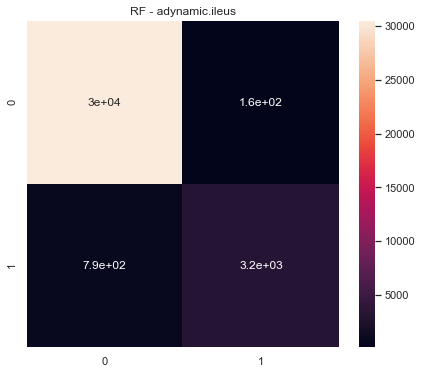

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adynamic.ileus  300.0  0.468401      0.495569         0.450393   
0   2.0  adynamic.ileus  300.0  0.467301      0.482881         0.457860   
0   3.0  adynamic.ileus  300.0  0.460678      0.472179         0.451516   
0   4.0  adynamic.ileus  300.0  0.469970      0.498672         0.462702   
0   5.0  adynamic.ileus  300.0  0.471795      0.500287         0.514358   

   ROC Macro  
0   0.541775  
0   0.539095  
0   0.515558  
0   0.507630  
0   0.585103  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  adynamic.ileus  300.0  2.338144    2.449589       2.336829  2.68916
================================== SGD ==================================


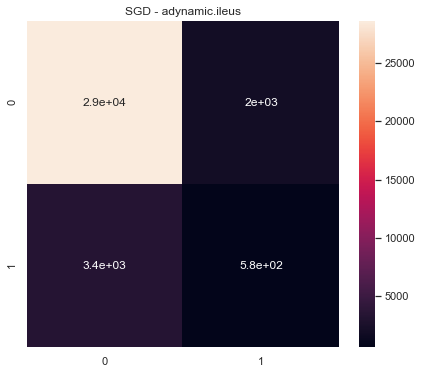

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adynamic.ileus  300.0  0.484579      0.490936         0.484459   
0   2.0  adynamic.ileus  300.0  0.478420      0.479828         0.477363   
0   3.0  adynamic.ileus  300.0  0.474048      0.473760         0.474351   
0   4.0  adynamic.ileus  300.0  0.486193      0.488528         0.485438   
0   5.0  adynamic.ileus  300.0  0.532319      0.532283         0.532355   

   ROC Macro  
0   0.473012  
0   0.455469  
0   0.439562  
0   0.448017  
0   0.553567  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adynamic.ileus  300.0  2.45556    2.465335       2.453966  2.369626
================================== LR ==================================


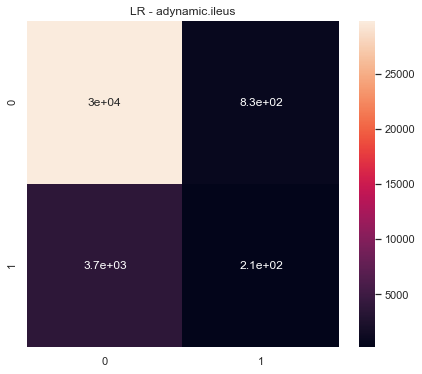

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  adynamic.ileus  300.0  0.507543      0.507726         0.507433   
0   2.0  adynamic.ileus  300.0  0.479457      0.487022         0.477482   
0   3.0  adynamic.ileus  300.0  0.468949      0.478917         0.488837   
0   4.0  adynamic.ileus  300.0  0.499749      0.499812         0.499822   
0   5.0  adynamic.ileus  300.0  0.524762      0.522864         0.533408   

   ROC Macro  
0   0.528083  
0   0.486171  
0   0.498464  
0   0.506606  
0   0.561943  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  adynamic.ileus  300.0  2.48046    2.496341       2.506982  2.581267
================================== agitated ==================================
================================== NB ==================================


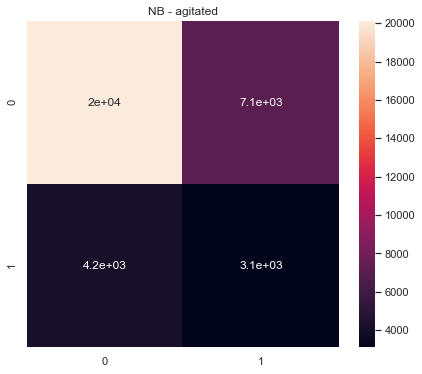

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  agitated  300.0  0.542659      0.543178         0.542222   0.574098
0   2.0  agitated  300.0  0.541347      0.541157         0.541552   0.563211
0   3.0  agitated  300.0  0.531024      0.538959         0.531827   0.550728
0   4.0  agitated  300.0  0.528724      0.543847         0.533279   0.552117
0   5.0  agitated  300.0  0.531037      0.532021         0.530457   0.551052



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  agitated  300.0  2.674791    2.699162       2.679337  2.791207
================================== DT ==================================


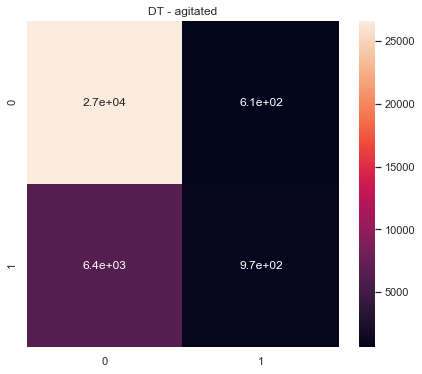

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  agitated  300.0  0.486205      0.506955         0.519802   0.539501
0   2.0  agitated  300.0  0.471507      0.508021         0.552614   0.538052
0   3.0  agitated  300.0  0.480930      0.506701         0.523570   0.551789
0   4.0  agitated  300.0  0.484756      0.509993         0.536870   0.525444
0   5.0  agitated  300.0  0.467590      0.500183         0.500763   0.521180



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  agitated  300.0  2.390988    2.531853       2.633618  2.675966
================================== RF ==================================


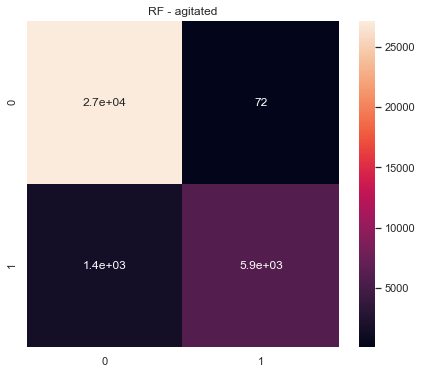

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  agitated  300.0  0.450862      0.504378         0.720671   0.578765
0   2.0  agitated  300.0  0.446447      0.502055         0.619122   0.584110
0   3.0  agitated  300.0  0.451969      0.493534         0.465058   0.555453
0   4.0  agitated  300.0  0.450196      0.502418         0.557450   0.544137
0   5.0  agitated  300.0  0.446927      0.495018         0.457732   0.555660



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  agitated  300.0  2.246401    2.497402       2.820032  2.818126
================================== SGD ==================================


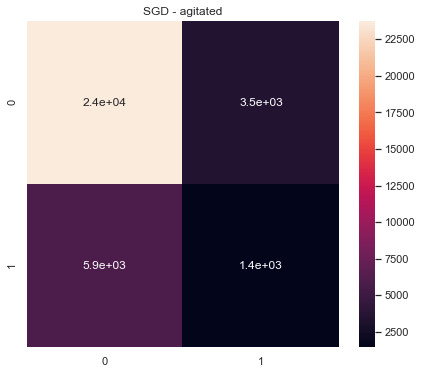

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  agitated  300.0  0.484947      0.490404         0.486926   0.454195
0   2.0  agitated  300.0  0.472945      0.498777         0.496283   0.485201
0   3.0  agitated  300.0  0.523710      0.525880         0.523344   0.530620
0   4.0  agitated  300.0  0.494125      0.507004         0.514539   0.487560
0   5.0  agitated  300.0  0.480349      0.482898         0.479991   0.473526



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  agitated  300.0  2.456076    2.504963       2.501082  2.431101
================================== LR ==================================


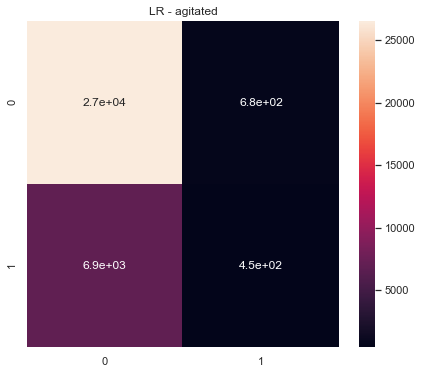

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  agitated  300.0  0.487386      0.502485         0.505321   0.537800
0   2.0  agitated  300.0  0.515324      0.526182         0.566868   0.555963
0   3.0  agitated  300.0  0.498239      0.504388         0.506765   0.543152
0   4.0  agitated  300.0  0.493824      0.504476         0.508279   0.511038
0   5.0  agitated  300.0  0.472659      0.497640         0.493179   0.528030



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  agitated  300.0  2.467433    2.535171       2.580411  2.675984
================================== allergic.dermatitis ==================================
================================== NB ==================================


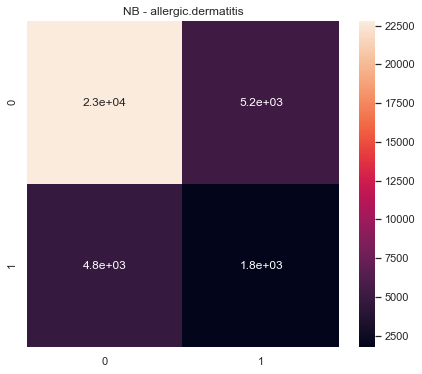

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  allergic.dermatitis  300.0  0.514526      0.514818         0.514351   
0   2.0  allergic.dermatitis  300.0  0.490771      0.491180         0.492253   
0   3.0  allergic.dermatitis  300.0  0.491915      0.492419         0.493347   
0   4.0  allergic.dermatitis  300.0  0.502296      0.502867         0.503278   
0   5.0  allergic.dermatitis  300.0  0.513583      0.513722         0.516523   

   ROC Macro  
0   0.536842  
0   0.523610  
0   0.487595  
0   0.493444  
0   0.539902  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergic.dermatitis  300.0  2.513091    2.515005       2.519751  2.581393
================================== DT ==================================


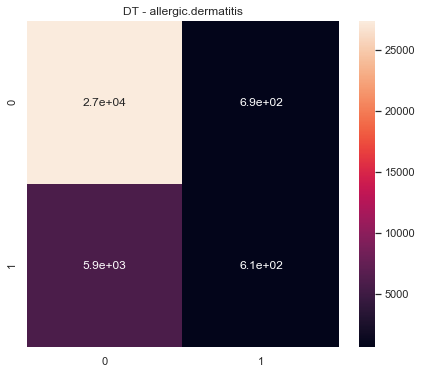

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  allergic.dermatitis  300.0  0.465621      0.497714         0.488982   
0   2.0  allergic.dermatitis  300.0  0.432533      0.461065         0.411142   
0   3.0  allergic.dermatitis  300.0  0.417852      0.433212         0.404580   
0   4.0  allergic.dermatitis  300.0  0.457704      0.479093         0.453567   
0   5.0  allergic.dermatitis  300.0  0.481747      0.503915         0.513293   

   ROC Macro  
0   0.508968  
0   0.472200  
0   0.423910  
0   0.450288  
0   0.486926  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergic.dermatitis  300.0  2.255457    2.374999       2.271565  2.342292
================================== RF ==================================


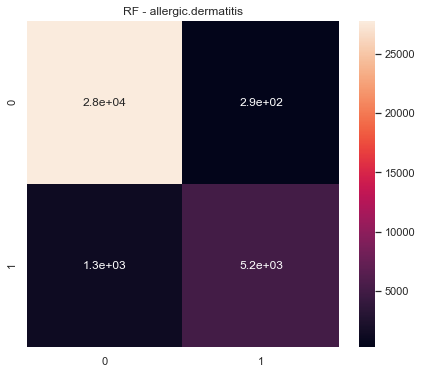

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  allergic.dermatitis  300.0  0.451940      0.500874         0.542142   
0   2.0  allergic.dermatitis  300.0  0.429007      0.461605         0.401556   
0   3.0  allergic.dermatitis  300.0  0.416146      0.437635         0.397013   
0   4.0  allergic.dermatitis  300.0  0.437649      0.476975         0.407373   
0   5.0  allergic.dermatitis  300.0  0.447634      0.499465         0.405548   

   ROC Macro  
0   0.552411  
0   0.474588  
0   0.430322  
0   0.409838  
0   0.477919  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergic.dermatitis  300.0  2.182375    2.376552       2.153633  2.345077
================================== SGD ==================================


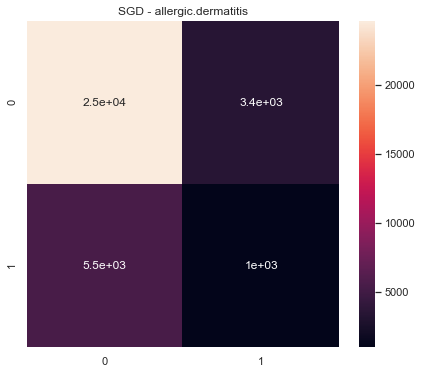

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  allergic.dermatitis  300.0  0.469899      0.469249         0.470765   
0   2.0  allergic.dermatitis  300.0  0.447414      0.444252         0.454339   
0   3.0  allergic.dermatitis  300.0  0.443174      0.450964         0.437642   
0   4.0  allergic.dermatitis  300.0  0.448362      0.469490         0.438734   
0   5.0  allergic.dermatitis  300.0  0.489682      0.491462         0.489935   

   ROC Macro  
0   0.443219  
0   0.435623  
0   0.463242  
0   0.425863  
0   0.484427  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergic.dermatitis  300.0  2.298531    2.325417       2.291415  2.252374
================================== LR ==================================


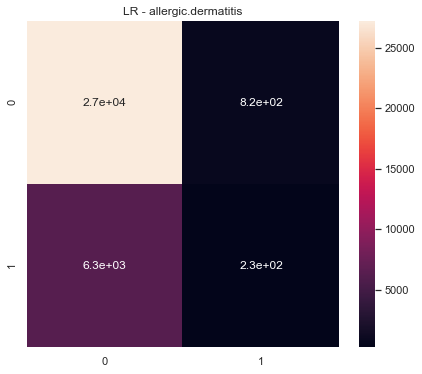

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  allergic.dermatitis  300.0  0.512545      0.513085         0.516431   
0   2.0  allergic.dermatitis  300.0  0.462750      0.476262         0.459802   
0   3.0  allergic.dermatitis  300.0  0.459469      0.457640         0.464990   
0   4.0  allergic.dermatitis  300.0  0.454435      0.460758         0.450607   
0   5.0  allergic.dermatitis  300.0  0.474145      0.502008         0.508716   

   ROC Macro  
0   0.514543  
0   0.471114  
0   0.457020  
0   0.403730  
0   0.485663  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  allergic.dermatitis  300.0  2.363344    2.409753       2.400547  2.33207
================================== allergies ==================================
================================== NB ==================================


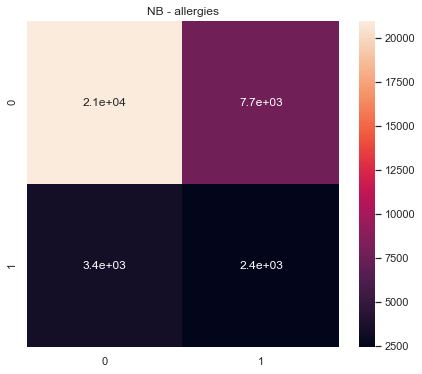

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  allergies  300.0  0.544395      0.548506         0.542484   0.587765
0   2.0  allergies  300.0  0.522458      0.542095         0.528540   0.561822
0   3.0  allergies  300.0  0.503805      0.533901         0.520968   0.555601
0   4.0  allergies  300.0  0.519114      0.532084         0.522939   0.547523
0   5.0  allergies  300.0  0.509598      0.514797         0.511583   0.542767



         ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergies  300.0  2.59937    2.671384       2.626514  2.795478
================================== DT ==================================


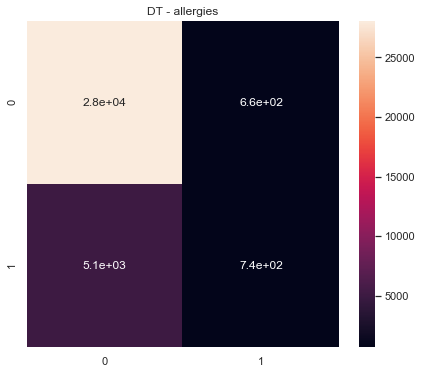

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  allergies  300.0  0.475951      0.498914         0.495985   0.518138
0   2.0  allergies  300.0  0.484408      0.504562         0.516884   0.535997
0   3.0  allergies  300.0  0.481409      0.490388         0.483730   0.523289
0   4.0  allergies  300.0  0.451824      0.471916         0.441232   0.446221
0   5.0  allergies  300.0  0.485300      0.504742         0.516946   0.516379



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergies  300.0  2.378892    2.470522       2.454777  2.540024
================================== RF ==================================


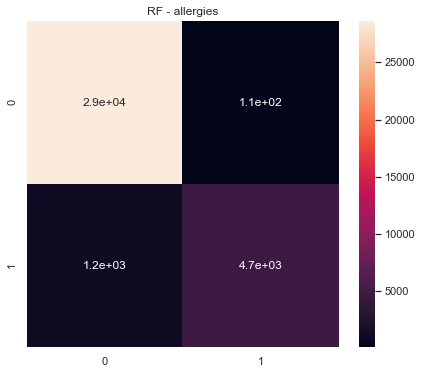

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  allergies  300.0  0.458645      0.501526         0.582439   0.541162
0   2.0  allergies  300.0  0.453323      0.498955         0.415338   0.560006
0   3.0  allergies  300.0  0.445183      0.480741         0.416977   0.518501
0   4.0  allergies  300.0  0.442389      0.476395         0.413836   0.465659
0   5.0  allergies  300.0  0.459017      0.502222         0.715857   0.539228



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergies  300.0  2.258557    2.459839       2.544447  2.624556
================================== SGD ==================================


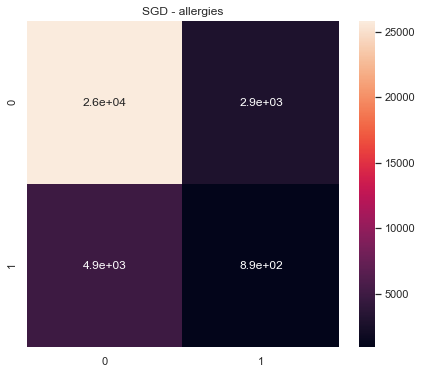

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  allergies  300.0  0.470623      0.471234         0.470098   0.462713
0   2.0  allergies  300.0  0.481724      0.491723         0.485159   0.462911
0   3.0  allergies  300.0  0.460389      0.463328         0.458211   0.427638
0   4.0  allergies  300.0  0.462780      0.469098         0.459353   0.442522
0   5.0  allergies  300.0  0.479256      0.482549         0.478357   0.505529



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergies  300.0  2.354773    2.377933       2.351179  2.301313
================================== LR ==================================


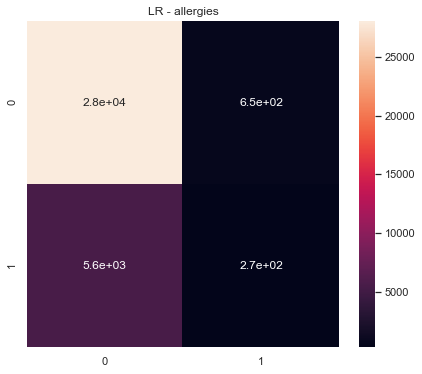

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  allergies  300.0  0.538464      0.537048         0.540769   0.562008
0   2.0  allergies  300.0  0.479963      0.496681         0.491431   0.502288
0   3.0  allergies  300.0  0.503002      0.504738         0.506278   0.519994
0   4.0  allergies  300.0  0.487184      0.488578         0.486919   0.483971
0   5.0  allergies  300.0  0.492558      0.506707         0.518719   0.538177



         ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  allergies  300.0  2.50117    2.533752       2.544116  2.606439
================================== alopecia ==================================
================================== NB ==================================


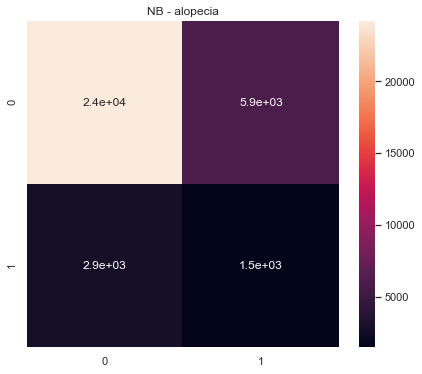

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  alopecia  300.0  0.521755      0.528628         0.521533   0.571422
0   2.0  alopecia  300.0  0.517994      0.525770         0.518713   0.559301
0   3.0  alopecia  300.0  0.489440      0.511154         0.506137   0.529344
0   4.0  alopecia  300.0  0.531306      0.534100         0.529858   0.553668
0   5.0  alopecia  300.0  0.523654      0.525505         0.522734   0.560406



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  alopecia  300.0  2.584148    2.625157       2.598976  2.774141
================================== DT ==================================


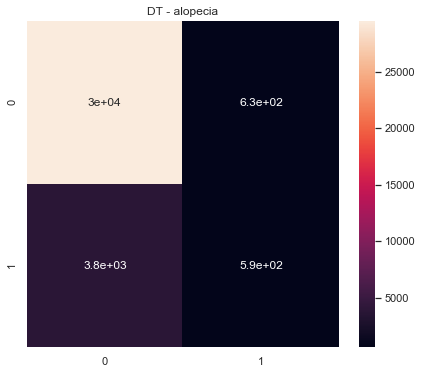

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  alopecia  300.0  0.494568      0.503977         0.510485   0.525624
0   2.0  alopecia  300.0  0.457831      0.471634         0.447519   0.507311
0   3.0  alopecia  300.0  0.480835      0.484223         0.479490   0.504369
0   4.0  alopecia  300.0  0.467437      0.485292         0.459966   0.464809
0   5.0  alopecia  300.0  0.491313      0.502725         0.507987   0.495536



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  alopecia  300.0  2.391983     2.44785       2.405447  2.49765
================================== RF ==================================


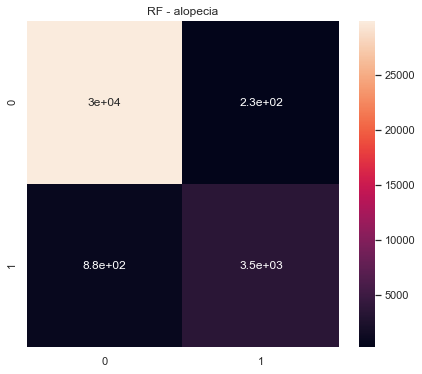

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  alopecia  300.0  0.469286      0.491647         0.464709   0.555874
0   2.0  alopecia  300.0  0.441751      0.453475         0.430619   0.501025
0   3.0  alopecia  300.0  0.451239      0.471222         0.432881   0.459317
0   4.0  alopecia  300.0  0.467153      0.496050         0.461124   0.450539
0   5.0  alopecia  300.0  0.465909      0.499917         0.436233   0.559119



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  alopecia  300.0  2.295339    2.412311       2.225566  2.525874
================================== SGD ==================================


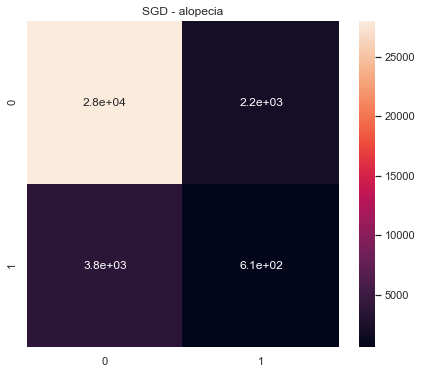

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  alopecia  300.0  0.478679      0.477662         0.480534   0.434369
0   2.0  alopecia  300.0  0.483426      0.484321         0.482831   0.429963
0   3.0  alopecia  300.0  0.461265      0.458868         0.464354   0.445810
0   4.0  alopecia  300.0  0.470277      0.473654         0.467890   0.430998
0   5.0  alopecia  300.0  0.493982      0.496748         0.495410   0.487811



        ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  alopecia  300.0  2.38763    2.391254       2.391019  2.228951
================================== LR ==================================


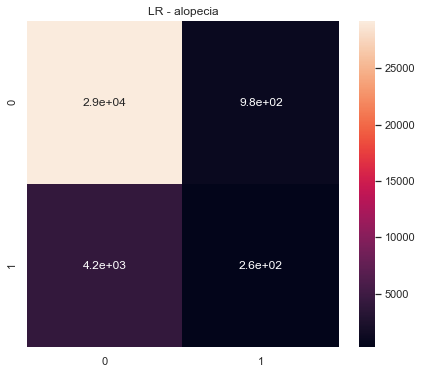

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  alopecia  300.0  0.542815      0.558106         0.540664   0.566022
0   2.0  alopecia  300.0  0.457564      0.461422         0.454248   0.446093
0   3.0  alopecia  300.0  0.461019      0.457667         0.469771   0.464163
0   4.0  alopecia  300.0  0.490246      0.490529         0.492276   0.423033
0   5.0  alopecia  300.0  0.502682      0.503851         0.505185   0.535684



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  alopecia  300.0  2.454326    2.471576       2.462145  2.434995
================================== anaemia ==================================
================================== NB ==================================


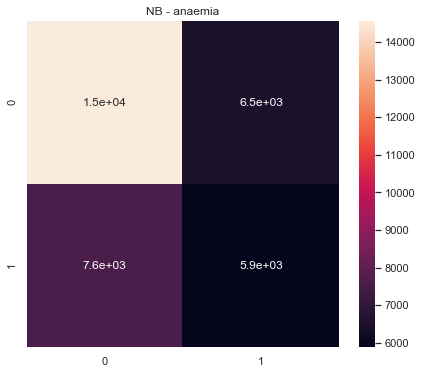

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  anaemia  300.0  0.542724      0.542565         0.543935   0.552676
0   2.0  anaemia  300.0  0.540265      0.542278         0.547564   0.568882
0   3.0  anaemia  300.0  0.529376      0.529509         0.530655   0.542764
0   4.0  anaemia  300.0  0.516391      0.517067         0.516672   0.519134
0   5.0  anaemia  300.0  0.529334      0.534371         0.541031   0.559227



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  anaemia  300.0  2.658091     2.66579       2.679857  2.742684
================================== DT ==================================


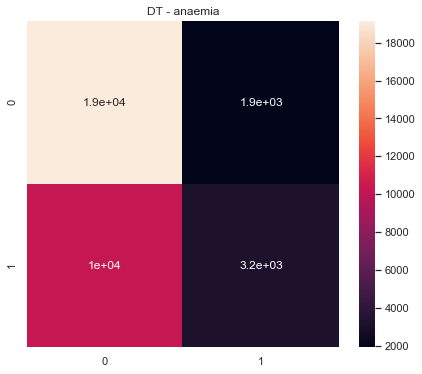

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  anaemia  300.0  0.503272      0.522168         0.533137   0.539767
0   2.0  anaemia  300.0  0.479760      0.524630         0.558802   0.555757
0   3.0  anaemia  300.0  0.487941      0.512357         0.519713   0.538176
0   4.0  anaemia  300.0  0.472622      0.505085         0.509029   0.503605
0   5.0  anaemia  300.0  0.465419      0.515315         0.538390   0.530618



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  anaemia  300.0  2.409013    2.579556       2.659071  2.667922
================================== RF ==================================


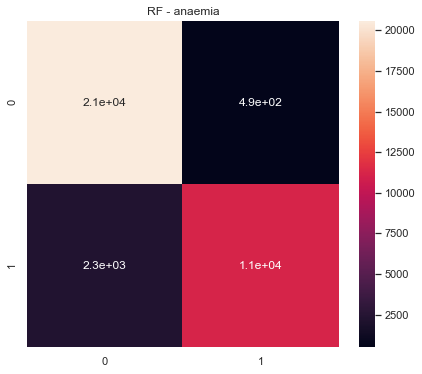

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  anaemia  300.0  0.486259      0.521548         0.542462   0.580804
0   2.0  anaemia  300.0  0.476354      0.519896         0.545229   0.554143
0   3.0  anaemia  300.0  0.475674      0.508884         0.516156   0.550788
0   4.0  anaemia  300.0  0.467378      0.510550         0.522838   0.516841
0   5.0  anaemia  300.0  0.481563      0.527336         0.567391   0.586146



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  anaemia  300.0  2.387227    2.588214       2.694076  2.788721
================================== SGD ==================================


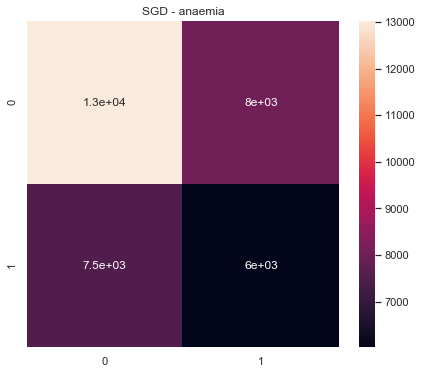

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  anaemia  300.0  0.512216      0.523189         0.522163   0.528236
0   2.0  anaemia  300.0  0.499255      0.499920         0.499923   0.504266
0   3.0  anaemia  300.0  0.486196      0.486465         0.486770   0.483724
0   4.0  anaemia  300.0  0.492986      0.493507         0.493676   0.482514
0   5.0  anaemia  300.0  0.513318      0.514934         0.516127   0.521478



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  anaemia  300.0  2.503973    2.518015       2.518659  2.520218
================================== LR ==================================


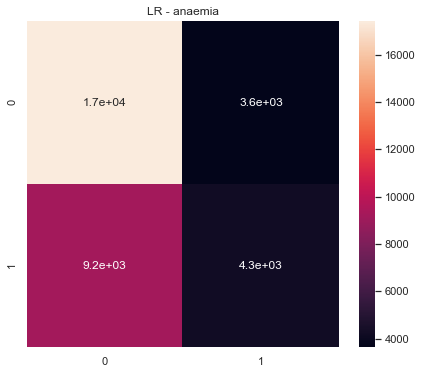

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  anaemia  300.0  0.528530      0.528602         0.528483   0.545740
0   2.0  anaemia  300.0  0.500872      0.509773         0.512096   0.527964
0   3.0  anaemia  300.0  0.485779      0.493987         0.492791   0.501509
0   4.0  anaemia  300.0  0.507623      0.511550         0.513094   0.487623
0   5.0  anaemia  300.0  0.513992      0.519819         0.523545   0.526137



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  anaemia  300.0  2.536796    2.563732       2.570009  2.588974
================================== angina ==================================
================================== NB ==================================


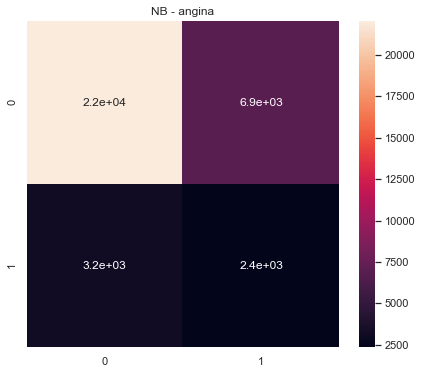

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  angina  300.0  0.535947      0.542435         0.534561   0.591086
0   2.0  angina  300.0  0.532394      0.540713         0.531783   0.572071
0   3.0  angina  300.0  0.506179      0.530325         0.519007   0.565581
0   4.0  angina  300.0  0.552258      0.561288         0.549432   0.610104
0   5.0  angina  300.0  0.537539      0.544791         0.536083   0.576894



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  angina  300.0  2.664318    2.719553       2.670867  2.915736
================================== DT ==================================


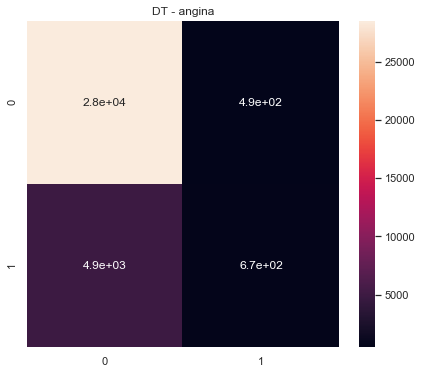

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  angina  300.0  0.478083      0.500972         0.504094   0.498862
0   2.0  angina  300.0  0.460751      0.483517         0.454529   0.490634
0   3.0  angina  300.0  0.451617      0.472475         0.439358   0.542432
0   4.0  angina  300.0  0.478465      0.500467         0.501830   0.538854
0   5.0  angina  300.0  0.465466      0.501676         0.525950   0.521970



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  angina  300.0  2.334383    2.459107        2.42576  2.592752
================================== RF ==================================


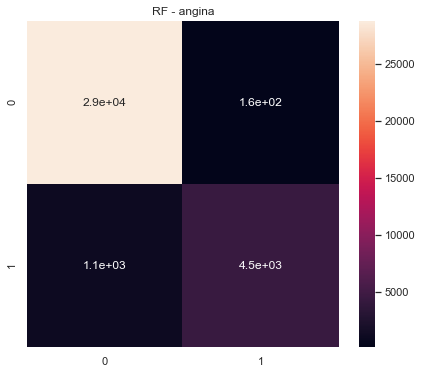

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  angina  300.0  0.458413      0.500566         0.544252   0.543163
0   2.0  angina  300.0  0.447230      0.481459         0.418842   0.493579
0   3.0  angina  300.0  0.439398      0.458591         0.423905   0.494332
0   4.0  angina  300.0  0.453928      0.495856         0.418537   0.540226
0   5.0  angina  300.0  0.456027      0.500000         0.419163   0.606330



      ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  angina  300.0  2.254996    2.436473       2.224699  2.67763
================================== SGD ==================================


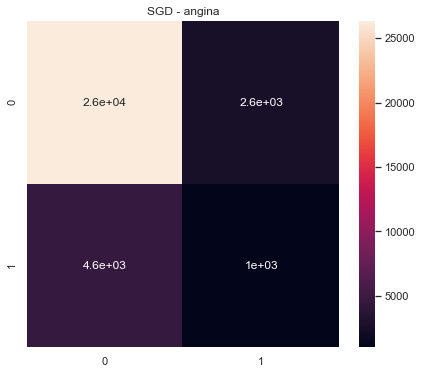

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  angina  300.0  0.476950      0.486657         0.477195   0.471798
0   2.0  angina  300.0  0.470578      0.482979         0.468825   0.491062
0   3.0  angina  300.0  0.464934      0.463518         0.466922   0.369466
0   4.0  angina  300.0  0.470568      0.484440         0.469352   0.455950
0   5.0  angina  300.0  0.466628      0.477550         0.463018   0.493820



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  angina  300.0  2.349658    2.395145       2.345312  2.282096
================================== LR ==================================


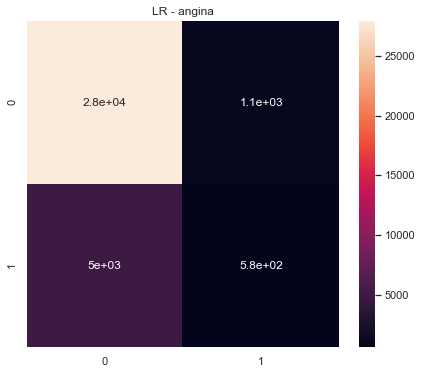

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  angina  300.0  0.509797      0.510107         0.509660   0.521626
0   2.0  angina  300.0  0.514153      0.517081         0.530932   0.555161
0   3.0  angina  300.0  0.520094      0.524627         0.520098   0.522801
0   4.0  angina  300.0  0.504913      0.505384         0.506397   0.466579
0   5.0  angina  300.0  0.511452      0.511314         0.513057   0.536956



      ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  angina  300.0  2.56041    2.568513       2.580144  2.603123
================================== apoplexy ==================================
================================== NB ==================================


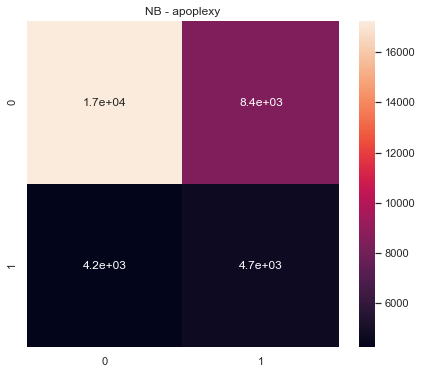

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  apoplexy  300.0  0.546026      0.551469         0.545529   0.581046
0   2.0  apoplexy  300.0  0.529195      0.537049         0.531379   0.556575
0   3.0  apoplexy  300.0  0.558217      0.586455         0.567704   0.618245
0   4.0  apoplexy  300.0  0.565117      0.570777         0.563461   0.615615
0   5.0  apoplexy  300.0  0.533510      0.537934         0.533631   0.581772



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  apoplexy  300.0  2.732065    2.783683       2.741704  2.953252
================================== DT ==================================


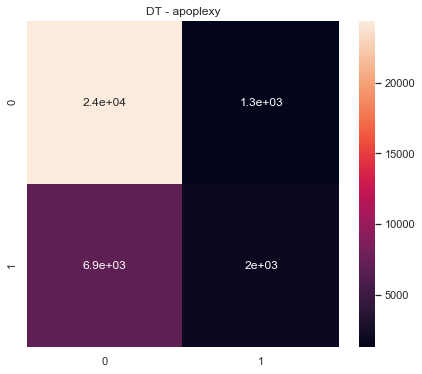

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  apoplexy  300.0  0.498213      0.521007         0.559501   0.580729
0   2.0  apoplexy  300.0  0.471546      0.489989         0.481637   0.522539
0   3.0  apoplexy  300.0  0.466245      0.490661         0.479923   0.509313
0   4.0  apoplexy  300.0  0.494850      0.509682         0.518532   0.560846
0   5.0  apoplexy  300.0  0.497944      0.515432         0.533918   0.543575



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  apoplexy  300.0  2.428798    2.526772       2.573512  2.717003
================================== RF ==================================


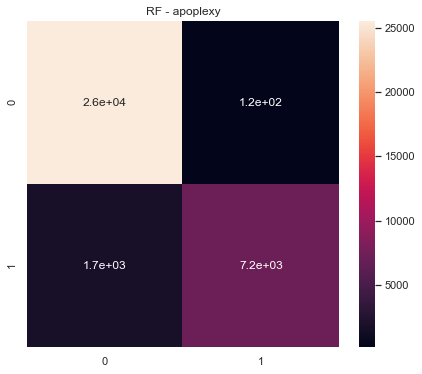

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  apoplexy  300.0  0.440189      0.504373         0.597117   0.610769
0   2.0  apoplexy  300.0  0.433659      0.500986         0.525237   0.598666
0   3.0  apoplexy  300.0  0.467099      0.501384         0.504438   0.593322
0   4.0  apoplexy  300.0  0.438699      0.492402         0.456833   0.555620
0   5.0  apoplexy  300.0  0.441261      0.504837         0.602347   0.623075



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  apoplexy  300.0  2.220907    2.503981       2.685972  2.981452
================================== SGD ==================================


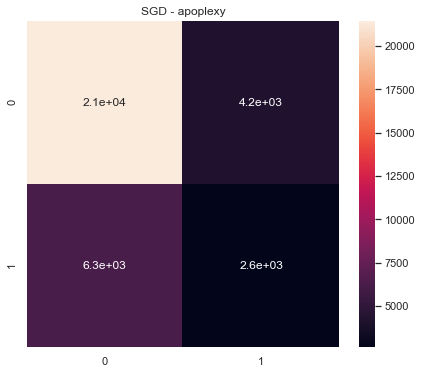

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  apoplexy  300.0  0.520344      0.522274         0.529139   0.489550
0   2.0  apoplexy  300.0  0.515625      0.519000         0.526084   0.535914
0   3.0  apoplexy  300.0  0.559778      0.562660         0.558388   0.566833
0   4.0  apoplexy  300.0  0.481282      0.493434         0.489576   0.514400
0   5.0  apoplexy  300.0  0.480912      0.485802         0.482261   0.466945



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  apoplexy  300.0  2.557941     2.58317       2.585447  2.573641
================================== LR ==================================


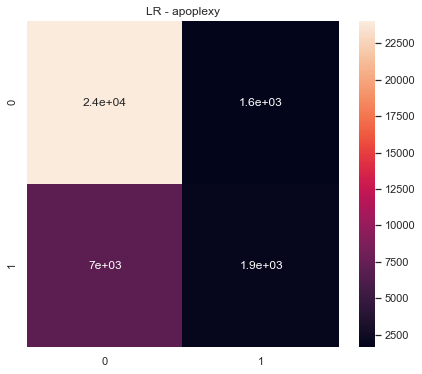

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  apoplexy  300.0  0.532314      0.539589         0.577404   0.576219
0   2.0  apoplexy  300.0  0.533061      0.541947         0.590892   0.581944
0   3.0  apoplexy  300.0  0.563469      0.569068         0.561897   0.587894
0   4.0  apoplexy  300.0  0.498529      0.513145         0.525740   0.583941
0   5.0  apoplexy  300.0  0.544572      0.544902         0.564849   0.580683



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  apoplexy  300.0  2.671945     2.70865       2.820782  2.910682
================================== aptyalism ==================================
================================== NB ==================================


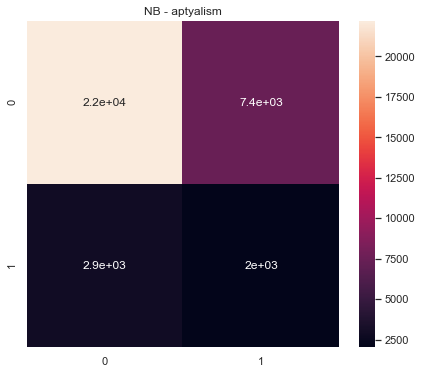

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  aptyalism  300.0  0.547107      0.564532         0.545395   0.610802
0   2.0  aptyalism  300.0  0.528644      0.554084         0.533820   0.574774
0   3.0  aptyalism  300.0  0.497083      0.538503         0.520825   0.562911
0   4.0  aptyalism  300.0  0.534813      0.550212         0.535019   0.566992
0   5.0  aptyalism  300.0  0.542702      0.554792         0.540741   0.601736



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aptyalism  300.0  2.650348    2.762123       2.675801  2.917215
================================== DT ==================================


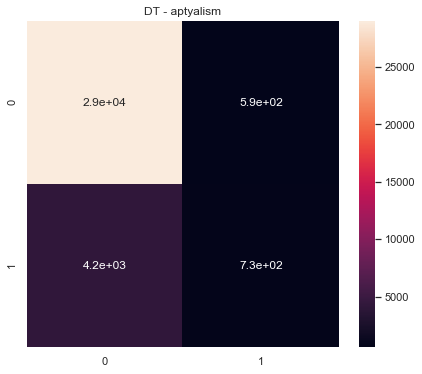

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  aptyalism  300.0  0.495488      0.509348         0.535541   0.523071
0   2.0  aptyalism  300.0  0.492273      0.501549         0.503433   0.518010
0   3.0  aptyalism  300.0  0.509472      0.512283         0.521800   0.533544
0   4.0  aptyalism  300.0  0.492459      0.505600         0.517590   0.525699
0   5.0  aptyalism  300.0  0.491154      0.502575         0.506650   0.545619



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aptyalism  300.0  2.480846    2.531356       2.585014  2.645943
================================== RF ==================================


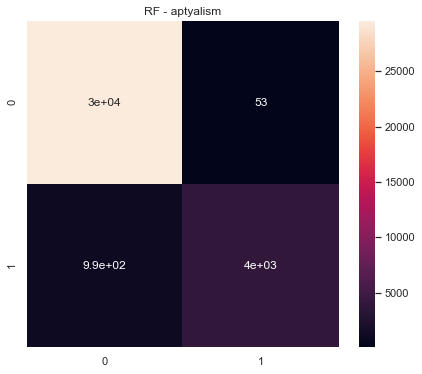

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  aptyalism  300.0  0.462890      0.499911         0.494948   0.549495
0   2.0  aptyalism  300.0  0.471803      0.497340         0.485283   0.581712
0   3.0  aptyalism  300.0  0.457966      0.491804         0.432078   0.555089
0   4.0  aptyalism  300.0  0.460998      0.499324         0.428137   0.519966
0   5.0  aptyalism  300.0  0.462329      0.500336         0.594990   0.587997



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  aptyalism  300.0  2.315987    2.488714       2.435435  2.79426
================================== SGD ==================================


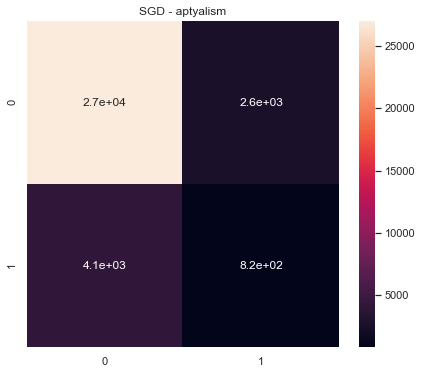

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  aptyalism  300.0  0.492099      0.492726         0.491967   0.510948
0   2.0  aptyalism  300.0  0.503056      0.505777         0.508936   0.503513
0   3.0  aptyalism  300.0  0.490425      0.490598         0.490303   0.453580
0   4.0  aptyalism  300.0  0.511082      0.511106         0.511059   0.493090
0   5.0  aptyalism  300.0  0.480955      0.485803         0.480082   0.489444



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aptyalism  300.0  2.477618     2.48601       2.482348  2.450574
================================== LR ==================================


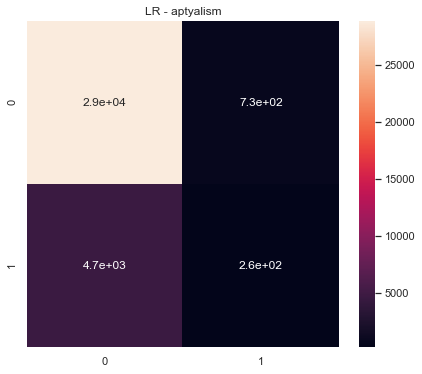

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  aptyalism  300.0  0.520336      0.519652         0.521660   0.581692
0   2.0  aptyalism  300.0  0.495913      0.497825         0.497172   0.505135
0   3.0  aptyalism  300.0  0.541378      0.540667         0.542205   0.559006
0   4.0  aptyalism  300.0  0.501824      0.502353         0.502781   0.516334
0   5.0  aptyalism  300.0  0.531405      0.529227         0.541673   0.568443



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  aptyalism  300.0  2.590856    2.589724       2.605491  2.73061
================================== arterial.pressure.NOS.decreased ==================================
================================== NB ==================================


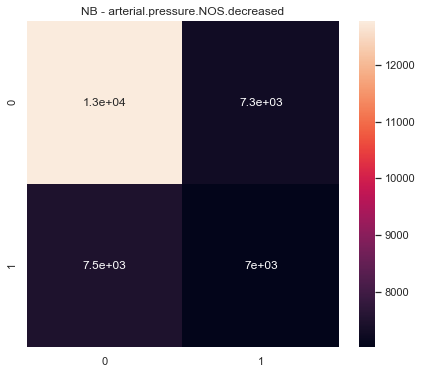

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.decreased  300.0  0.533799      0.537753   
0   2.0  arterial.pressure.NOS.decreased  300.0  0.555314      0.555136   
0   3.0  arterial.pressure.NOS.decreased  300.0  0.513613      0.515233   
0   4.0  arterial.pressure.NOS.decreased  300.0  0.514737      0.515973   
0   5.0  arterial.pressure.NOS.decreased  300.0  0.504951      0.506669   

   Precision Macro  ROC Macro  
0         0.542527   0.558441  
0         0.556134   0.561785  
0         0.516144   0.520463  
0         0.515636   0.514534  
0         0.507052   0.515554  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.decreased  300.0  2.622414    2.630764   

   Avg Precision   Avg ROC  
0       2.637493  2.670776  
================================== DT ==================================


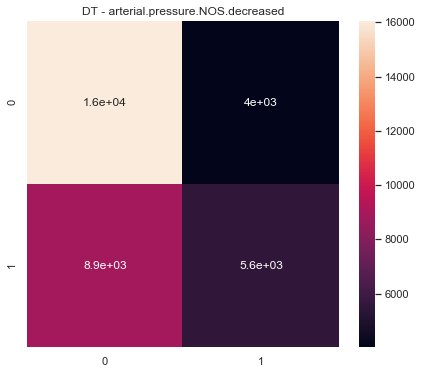

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.decreased  300.0  0.477574      0.514587   
0   2.0  arterial.pressure.NOS.decreased  300.0  0.485029      0.517183   
0   3.0  arterial.pressure.NOS.decreased  300.0  0.512455      0.517950   
0   4.0  arterial.pressure.NOS.decreased  300.0  0.474447      0.476161   
0   5.0  arterial.pressure.NOS.decreased  300.0  0.508031      0.520025   

   Precision Macro  ROC Macro  
0         0.525966   0.527240  
0         0.528670   0.515890  
0         0.520418   0.518449  
0         0.475106   0.446413  
0         0.525183   0.508233  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.decreased  300.0  2.457535    2.545905   

   Avg Precision   Avg ROC  
0       2.575343  2.516226  
================================== RF ==================================


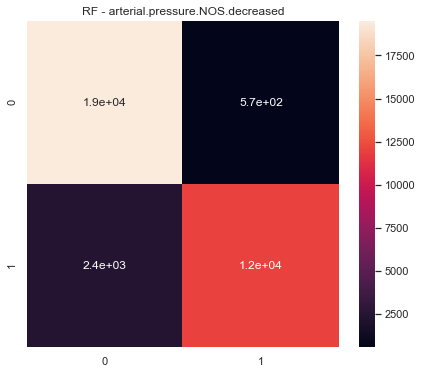

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.decreased  300.0  0.472078      0.527426   
0   2.0  arterial.pressure.NOS.decreased  300.0  0.486111      0.527778   
0   3.0  arterial.pressure.NOS.decreased  300.0  0.477357      0.503099   
0   4.0  arterial.pressure.NOS.decreased  300.0  0.455901      0.490228   
0   5.0  arterial.pressure.NOS.decreased  300.0  0.465261      0.516139   

   Precision Macro  ROC Macro  
0         0.569183   0.568744  
0         0.555293   0.569634  
0         0.504594   0.550290  
0         0.484166   0.481582  
0         0.535878   0.531135  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.decreased  300.0  2.356709     2.56467   

   Avg Precision   Avg ROC  
0       2.649115  2.701384  
================================== SGD ==================================


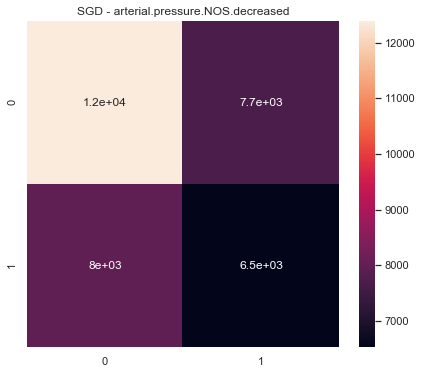

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.decreased  300.0  0.518101      0.518095   
0   2.0  arterial.pressure.NOS.decreased  300.0  0.506740      0.512370   
0   3.0  arterial.pressure.NOS.decreased  300.0  0.510130      0.510236   
0   4.0  arterial.pressure.NOS.decreased  300.0  0.492215      0.495859   
0   5.0  arterial.pressure.NOS.decreased  300.0  0.508185      0.509594   

   Precision Macro  ROC Macro  
0         0.518239   0.522580  
0         0.514040   0.524188  
0         0.510375   0.520153  
0         0.495966   0.496412  
0         0.510094   0.510295  



                               ADR    PCA   Avg F1  Avg Recall  Avg Precision  \
0  arterial.pressure.NOS.decreased  300.0  2.53537    2.546154       2.548713   

    Avg ROC  
0  2.573627  
================================== LR ==================================


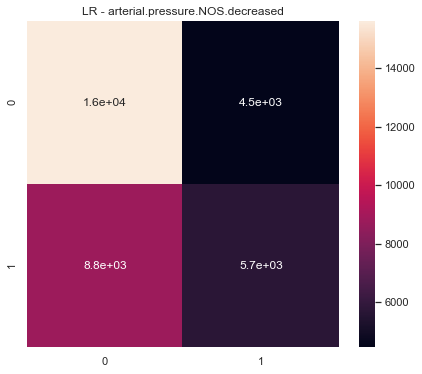

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.decreased  300.0  0.519075      0.525571   
0   2.0  arterial.pressure.NOS.decreased  300.0  0.503403      0.518558   
0   3.0  arterial.pressure.NOS.decreased  300.0  0.493974      0.497827   
0   4.0  arterial.pressure.NOS.decreased  300.0  0.511474      0.513806   
0   5.0  arterial.pressure.NOS.decreased  300.0  0.489598      0.507070   

   Precision Macro  ROC Macro  
0         0.529758   0.558192  
0         0.524372   0.554940  
0         0.497625   0.516789  
0         0.514830   0.500630  
0         0.509438   0.514556  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.decreased  300.0  2.517525    2.562832   

   Avg Precision   Avg ROC  
0       2.576023  2.645106  
================================== arterial.pressure.NOS.increased ==================================
================================== NB =====================

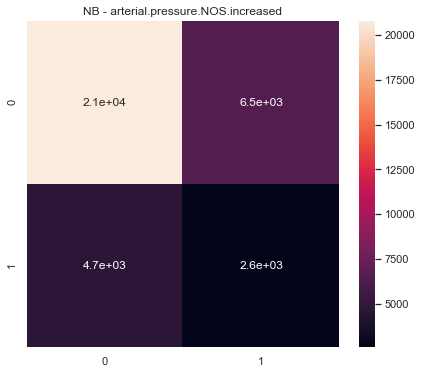

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.increased  300.0  0.524137      0.524926   
0   2.0  arterial.pressure.NOS.increased  300.0  0.521759      0.523273   
0   3.0  arterial.pressure.NOS.increased  300.0  0.516525      0.529845   
0   4.0  arterial.pressure.NOS.increased  300.0  0.528153      0.528324   
0   5.0  arterial.pressure.NOS.increased  300.0  0.530576      0.530323   

   Precision Macro  ROC Macro  
0         0.523720   0.557754  
0         0.521382   0.549771  
0         0.522499   0.543489  
0         0.528000   0.553017  
0         0.530876   0.563212  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.increased  300.0  2.621151    2.636693   

   Avg Precision   Avg ROC  
0       2.626478  2.767242  
================================== DT ==================================


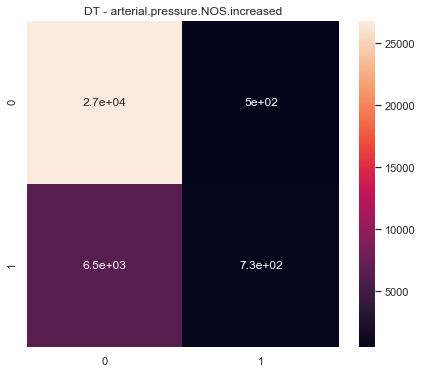

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.increased  300.0  0.478764      0.499022   
0   2.0  arterial.pressure.NOS.increased  300.0  0.459391      0.499825   
0   3.0  arterial.pressure.NOS.increased  300.0  0.471920      0.493263   
0   4.0  arterial.pressure.NOS.increased  300.0  0.465547      0.500419   
0   5.0  arterial.pressure.NOS.increased  300.0  0.472822      0.508884   

   Precision Macro  ROC Macro  
0         0.497547   0.526536  
0         0.498875   0.530546  
0         0.483717   0.506903  
0         0.502006   0.483494  
0         0.561352   0.528991  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.increased  300.0  2.348444    2.501412   

   Avg Precision  Avg ROC  
0       2.543498  2.57647  
================================== RF ==================================


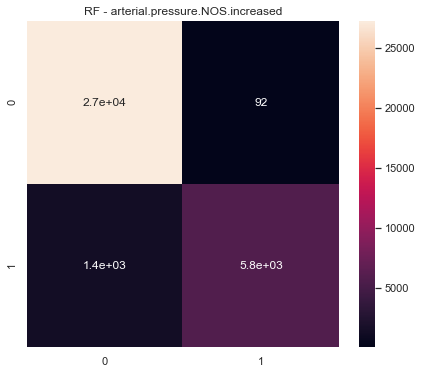

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.increased  300.0  0.455796      0.495564   
0   2.0  arterial.pressure.NOS.increased  300.0  0.444909      0.500512   
0   3.0  arterial.pressure.NOS.increased  300.0  0.441754      0.486103   
0   4.0  arterial.pressure.NOS.increased  300.0  0.444140      0.499047   
0   5.0  arterial.pressure.NOS.increased  300.0  0.442900      0.499662   

   Precision Macro  ROC Macro  
0         0.476138   0.534784  
0         0.525600   0.528977  
0         0.427785   0.563825  
0         0.471844   0.514932  
0         0.478414   0.551281  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.increased  300.0  2.229498    2.480888   

   Avg Precision   Avg ROC  
0        2.37978  2.693799  
================================== SGD ==================================


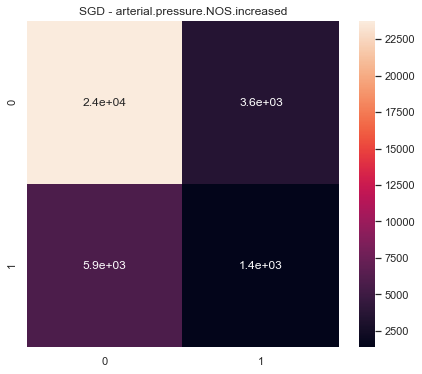

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.increased  300.0  0.480983      0.486449   
0   2.0  arterial.pressure.NOS.increased  300.0  0.473379      0.484986   
0   3.0  arterial.pressure.NOS.increased  300.0  0.455322      0.469944   
0   4.0  arterial.pressure.NOS.increased  300.0  0.514245      0.514237   
0   5.0  arterial.pressure.NOS.increased  300.0  0.495123      0.495136   

   Precision Macro  ROC Macro  
0         0.481863   0.454970  
0         0.475496   0.500425  
0         0.451319   0.448180  
0         0.516269   0.476050  
0         0.495337   0.479130  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.increased  300.0  2.419051    2.450752   

   Avg Precision   Avg ROC  
0       2.420283  2.358754  
================================== LR ==================================


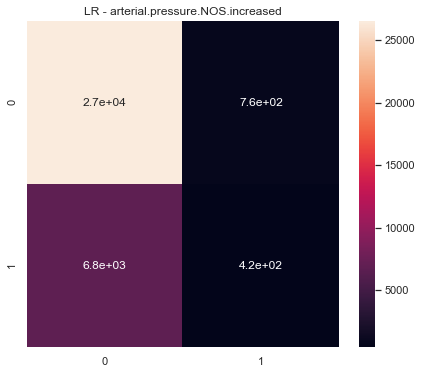

   Fold                              ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arterial.pressure.NOS.increased  300.0  0.499937      0.502070   
0   2.0  arterial.pressure.NOS.increased  300.0  0.470717      0.495422   
0   3.0  arterial.pressure.NOS.increased  300.0  0.478893      0.493012   
0   4.0  arterial.pressure.NOS.increased  300.0  0.536855      0.536655   
0   5.0  arterial.pressure.NOS.increased  300.0  0.500076      0.508365   

   Precision Macro  ROC Macro  
0         0.502596   0.518098  
0         0.487159   0.525024  
0         0.486802   0.482097  
0         0.557267   0.508508  
0         0.514779   0.531967  



                               ADR    PCA    Avg F1  Avg Recall  \
0  arterial.pressure.NOS.increased  300.0  2.486478    2.535523   

   Avg Precision   Avg ROC  
0       2.548604  2.565694  
================================== arteriosclerosis ==================================
================================== NB ==================================


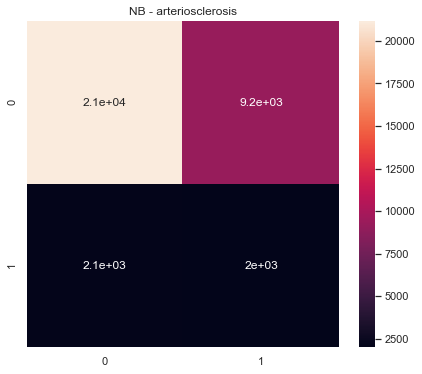

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arteriosclerosis  300.0  0.519964      0.547845         0.527065   
0   2.0  arteriosclerosis  300.0  0.499797      0.528137         0.514901   
0   3.0  arteriosclerosis  300.0  0.487656      0.537797         0.517723   
0   4.0  arteriosclerosis  300.0  0.508202      0.549907         0.525238   
0   5.0  arteriosclerosis  300.0  0.509466      0.538067         0.520731   

   ROC Macro  
0   0.591026  
0   0.541756  
0   0.566038  
0   0.585407  
0   0.589965  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arteriosclerosis  300.0  2.525086    2.701753       2.605658  2.874191
================================== DT ==================================


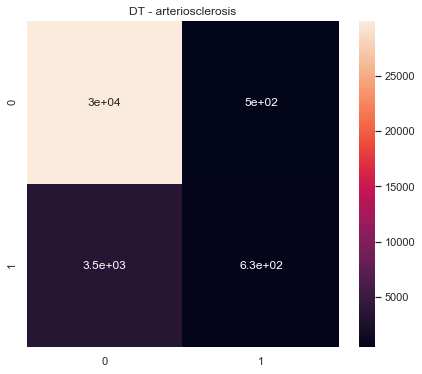

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arteriosclerosis  300.0  0.476714      0.495493         0.481265   
0   2.0  arteriosclerosis  300.0  0.485241      0.499703         0.498944   
0   3.0  arteriosclerosis  300.0  0.474400      0.481670         0.471061   
0   4.0  arteriosclerosis  300.0  0.483544      0.498825         0.495712   
0   5.0  arteriosclerosis  300.0  0.475144      0.496940         0.482385   

   ROC Macro  
0   0.523533  
0   0.524507  
0   0.506112  
0   0.510396  
0   0.508461  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arteriosclerosis  300.0  2.395042    2.472631       2.429368  2.573009
================================== RF ==================================


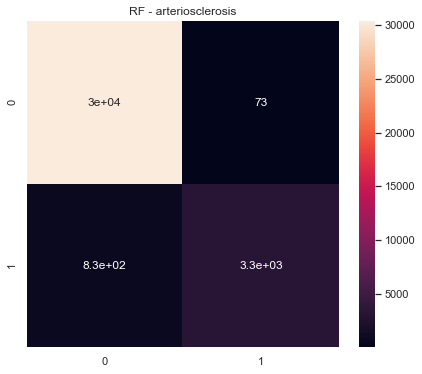

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arteriosclerosis  300.0  0.468093      0.499918         0.440078   
0   2.0  arteriosclerosis  300.0  0.468093      0.500000         0.440014   
0   3.0  arteriosclerosis  300.0  0.452890      0.470317         0.436708   
0   4.0  arteriosclerosis  300.0  0.467848      0.499507         0.439962   
0   5.0  arteriosclerosis  300.0  0.468129      0.500000         0.440078   

   ROC Macro  
0   0.547209  
0   0.563574  
0   0.516374  
0   0.519174  
0   0.579711  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arteriosclerosis  300.0  2.325053    2.469742       2.196841  2.726041
================================== SGD ==================================


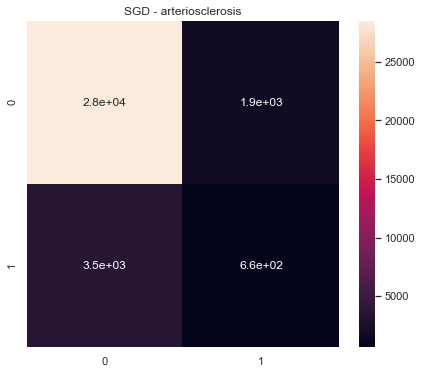

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arteriosclerosis  300.0  0.481278      0.481571         0.481014   
0   2.0  arteriosclerosis  300.0  0.490888      0.499513         0.498873   
0   3.0  arteriosclerosis  300.0  0.462324      0.467225         0.458358   
0   4.0  arteriosclerosis  300.0  0.487141      0.500279         0.500914   
0   5.0  arteriosclerosis  300.0  0.457208      0.459545         0.455058   

   ROC Macro  
0   0.490458  
0   0.475798  
0   0.405655  
0   0.484742  
0   0.466205  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arteriosclerosis  300.0  2.378838    2.408133       2.394217  2.322859
================================== LR ==================================


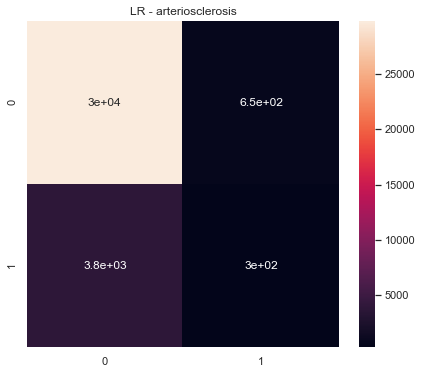

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arteriosclerosis  300.0  0.531793      0.531961         0.531632   
0   2.0  arteriosclerosis  300.0  0.548973      0.542171         0.580882   
0   3.0  arteriosclerosis  300.0  0.522717      0.531990         0.522751   
0   4.0  arteriosclerosis  300.0  0.503318      0.505547         0.508873   
0   5.0  arteriosclerosis  300.0  0.525610      0.524220         0.547060   

   ROC Macro  
0   0.552985  
0   0.546210  
0   0.570079  
0   0.527543  
0   0.587646  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arteriosclerosis  300.0  2.632411     2.63589       2.691199  2.784462
================================== arteriosclerotic.heart.disease ==================================
================================== NB ==================================


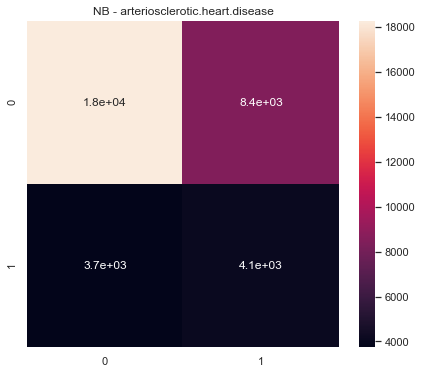

   Fold                             ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arteriosclerotic.heart.disease  300.0  0.552408      0.563166   
0   2.0  arteriosclerotic.heart.disease  300.0  0.527606      0.535968   
0   3.0  arteriosclerotic.heart.disease  300.0  0.548438      0.580702   
0   4.0  arteriosclerotic.heart.disease  300.0  0.548379      0.555881   
0   5.0  arteriosclerotic.heart.disease  300.0  0.540521      0.548096   

   Precision Macro  ROC Macro  
0         0.552027   0.607902  
0         0.529458   0.561910  
0         0.559047   0.609816  
0         0.547505   0.598277  
0         0.540451   0.584620  



                              ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  arteriosclerotic.heart.disease  300.0  2.717353    2.783813       2.728488   

    Avg ROC  
0  2.962524  
================================== DT ==================================


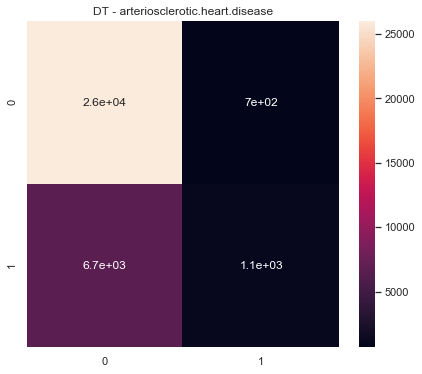

   Fold                             ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arteriosclerotic.heart.disease  300.0  0.455778      0.501672   
0   2.0  arteriosclerotic.heart.disease  300.0  0.480788      0.508308   
0   3.0  arteriosclerotic.heart.disease  300.0  0.485828      0.500558   
0   4.0  arteriosclerotic.heart.disease  300.0  0.445789      0.490255   
0   5.0  arteriosclerotic.heart.disease  300.0  0.449373      0.500582   

   Precision Macro  ROC Macro  
0         0.512446   0.558124  
0         0.528859   0.539326  
0         0.501092   0.497866  
0         0.452375   0.538442  
0         0.506142   0.542157  



                              ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  arteriosclerotic.heart.disease  300.0  2.317557    2.501376       2.500915   

    Avg ROC  
0  2.675915  
================================== RF ==================================


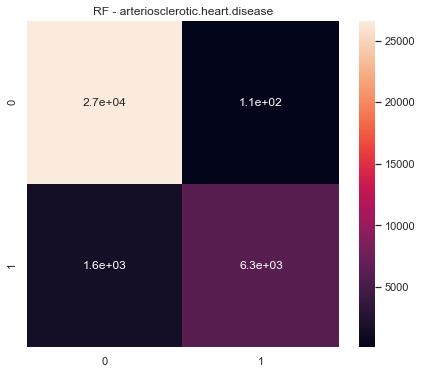

   Fold                             ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arteriosclerotic.heart.disease  300.0  0.440597      0.500338   
0   2.0  arteriosclerotic.heart.disease  300.0  0.437649      0.500394   
0   3.0  arteriosclerotic.heart.disease  300.0  0.450833      0.480885   
0   4.0  arteriosclerotic.heart.disease  300.0  0.443805      0.499417   
0   5.0  arteriosclerotic.heart.disease  300.0  0.437496      0.500113   

   Precision Macro  ROC Macro  
0         0.511456   0.625512  
0         0.553132   0.599172  
0         0.451057   0.541542  
0         0.491159   0.556522  
0         0.511400   0.643238  



                              ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  arteriosclerotic.heart.disease  300.0  2.210379    2.481147       2.518204   

    Avg ROC  
0  2.965985  
================================== SGD ==================================


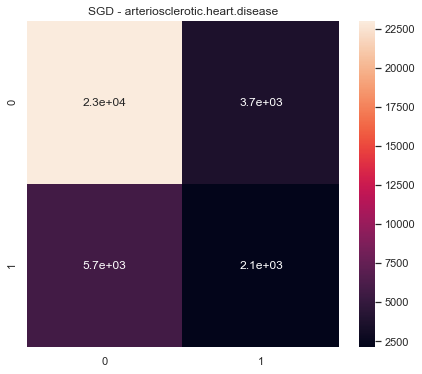

   Fold                             ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arteriosclerotic.heart.disease  300.0  0.500338      0.502897   
0   2.0  arteriosclerotic.heart.disease  300.0  0.490409      0.494130   
0   3.0  arteriosclerotic.heart.disease  300.0  0.451808      0.451191   
0   4.0  arteriosclerotic.heart.disease  300.0  0.443202      0.460409   
0   5.0  arteriosclerotic.heart.disease  300.0  0.509841      0.510321   

   Precision Macro  ROC Macro  
0         0.503659   0.456427  
0         0.492524   0.530112  
0         0.452512   0.383807  
0         0.436618   0.485508  
0         0.511878   0.488867  



                              ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  arteriosclerotic.heart.disease  300.0  2.395597    2.418948       2.397192   

    Avg ROC  
0  2.344721  
================================== LR ==================================


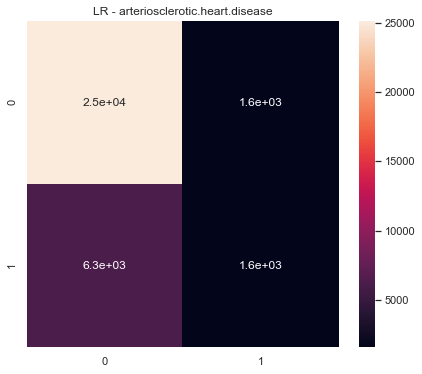

   Fold                             ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  arteriosclerotic.heart.disease  300.0  0.545159      0.543283   
0   2.0  arteriosclerotic.heart.disease  300.0  0.538727      0.541716   
0   3.0  arteriosclerotic.heart.disease  300.0  0.517487      0.521132   
0   4.0  arteriosclerotic.heart.disease  300.0  0.479652      0.498782   
0   5.0  arteriosclerotic.heart.disease  300.0  0.506518      0.512975   

   Precision Macro  ROC Macro  
0         0.554669   0.577729  
0         0.581490   0.582812  
0         0.518291   0.536006  
0         0.497294   0.551613  
0         0.520990   0.565891  



                              ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  arteriosclerotic.heart.disease  300.0  2.587543    2.617888       2.672734   

    Avg ROC  
0  2.814051  
================================== arthritis ==================================
================================== NB ==================================


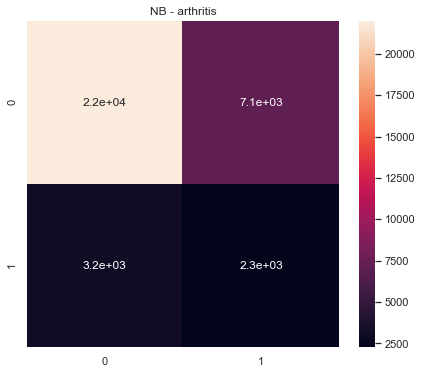

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  arthritis  300.0  0.545687      0.550410         0.543477   0.625832
0   2.0  arthritis  300.0  0.521305      0.533598         0.523925   0.559486
0   3.0  arthritis  300.0  0.512697      0.544600         0.526903   0.586999
0   4.0  arthritis  300.0  0.531278      0.544534         0.532169   0.565675
0   5.0  arthritis  300.0  0.522161      0.525571         0.521616   0.576567



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthritis  300.0  2.633128    2.698713       2.648088  2.914559
================================== DT ==================================


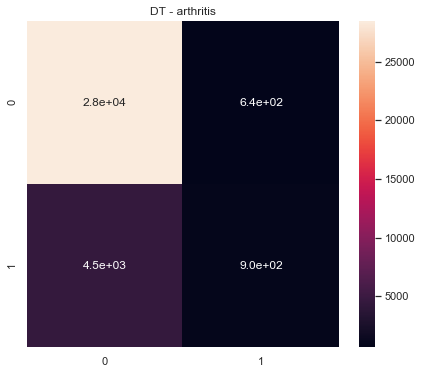

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  arthritis  300.0  0.490535      0.512461         0.590927   0.494129
0   2.0  arthritis  300.0  0.486486      0.500663         0.501748   0.521977
0   3.0  arthritis  300.0  0.509990      0.514254         0.527534   0.561210
0   4.0  arthritis  300.0  0.501491      0.512046         0.533995   0.553452
0   5.0  arthritis  300.0  0.494699      0.507341         0.520816   0.501714



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthritis  300.0  2.483201    2.546765       2.675019  2.632482
================================== RF ==================================


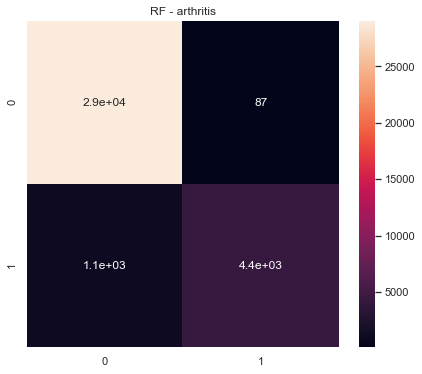

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  arthritis  300.0  0.460804      0.501323         0.621449   0.595350
0   2.0  arthritis  300.0  0.472753      0.499011         0.494909   0.580961
0   3.0  arthritis  300.0  0.467273      0.491838         0.470075   0.580014
0   4.0  arthritis  300.0  0.457360      0.497482         0.444674   0.541357
0   5.0  arthritis  300.0  0.457266      0.500000         0.421262   0.603407



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthritis  300.0  2.315456    2.489654        2.45237  2.901089
================================== SGD ==================================


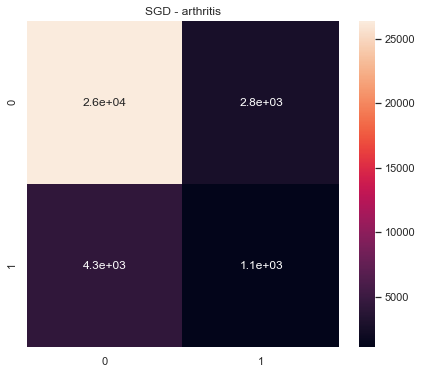

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  arthritis  300.0  0.463463      0.470497         0.459550   0.445385
0   2.0  arthritis  300.0  0.539130      0.540793         0.537986   0.553504
0   3.0  arthritis  300.0  0.472323      0.474733         0.470827   0.449842
0   4.0  arthritis  300.0  0.497529      0.497536         0.497523   0.495105
0   5.0  arthritis  300.0  0.475437      0.482216         0.473954   0.486414



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  arthritis  300.0  2.447882    2.465775       2.439841  2.43025
================================== LR ==================================


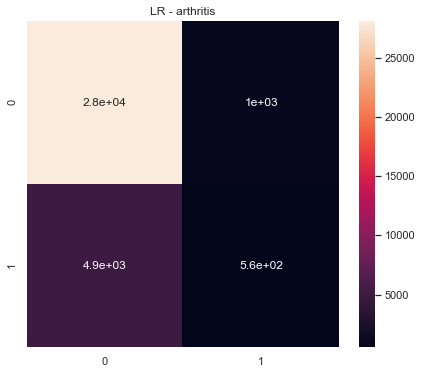

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  arthritis  300.0  0.531174      0.531209         0.531140   0.595764
0   2.0  arthritis  300.0  0.531909      0.531437         0.563903   0.598197
0   3.0  arthritis  300.0  0.521894      0.528845         0.522351   0.533943
0   4.0  arthritis  300.0  0.536139      0.538669         0.534777   0.537220
0   5.0  arthritis  300.0  0.495648      0.498280         0.497677   0.530916



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  arthritis  300.0  2.616765     2.62844       2.649847  2.79604
================================== arthropathy ==================================
================================== NB ==================================


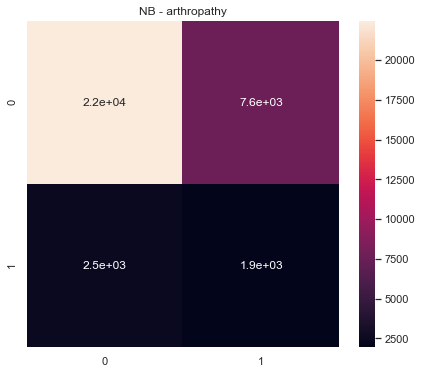

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arthropathy  300.0  0.564863      0.578803         0.559588   
0   2.0  arthropathy  300.0  0.515311      0.523488         0.516774   
0   3.0  arthropathy  300.0  0.484957      0.512108         0.506415   
0   4.0  arthropathy  300.0  0.536227      0.555695         0.536476   
0   5.0  arthropathy  300.0  0.512341      0.526434         0.517003   

   ROC Macro  
0   0.645134  
0   0.549818  
0   0.550811  
0   0.611022  
0   0.575358  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthropathy  300.0  2.613699    2.696529       2.636256  2.932142
================================== DT ==================================


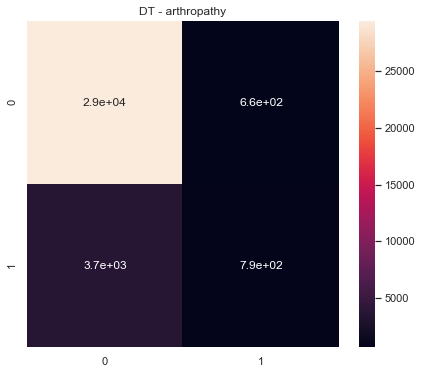

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arthropathy  300.0  0.511099      0.515432         0.538744   
0   2.0  arthropathy  300.0  0.495498      0.504572         0.511800   
0   3.0  arthropathy  300.0  0.482577      0.490050         0.482760   
0   4.0  arthropathy  300.0  0.519917      0.521033         0.546395   
0   5.0  arthropathy  300.0  0.501290      0.509689         0.528237   

   ROC Macro  
0   0.583824  
0   0.591088  
0   0.592353  
0   0.580530  
0   0.583792  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthropathy  300.0  2.510381    2.540776       2.607936  2.931587
================================== RF ==================================


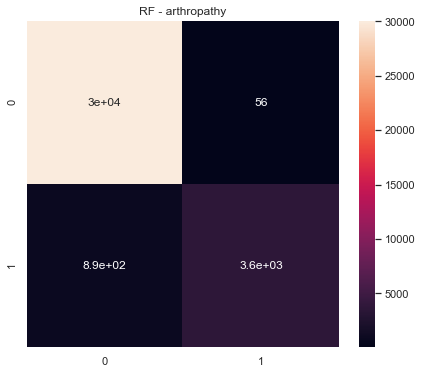

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arthropathy  300.0  0.465253      0.499585         0.435337   
0   2.0  arthropathy  300.0  0.466572      0.500559         0.935374   
0   3.0  arthropathy  300.0  0.453971      0.477477         0.432671   
0   4.0  arthropathy  300.0  0.466359      0.500144         0.518661   
0   5.0  arthropathy  300.0  0.465455      0.500000         0.435374   

   ROC Macro  
0   0.591954  
0   0.573709  
0   0.571976  
0   0.562849  
0   0.626124  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthropathy  300.0  2.317609    2.477764       2.757416  2.926613
================================== SGD ==================================


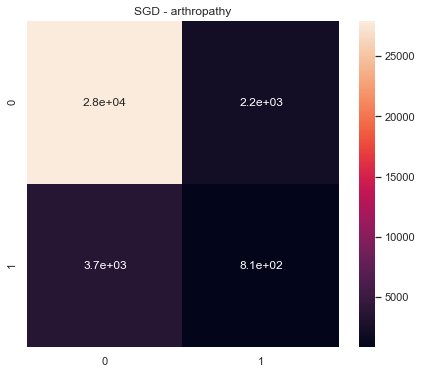

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arthropathy  300.0  0.498197      0.498867         0.498669   
0   2.0  arthropathy  300.0  0.512045      0.511685         0.513509   
0   3.0  arthropathy  300.0  0.445699      0.459291         0.433282   
0   4.0  arthropathy  300.0  0.481549      0.484326         0.480383   
0   5.0  arthropathy  300.0  0.467035      0.473321         0.462972   

   ROC Macro  
0   0.489956  
0   0.505136  
0   0.397995  
0   0.476479  
0   0.465938  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  arthropathy  300.0  2.404525     2.42749       2.388814  2.335504
================================== LR ==================================


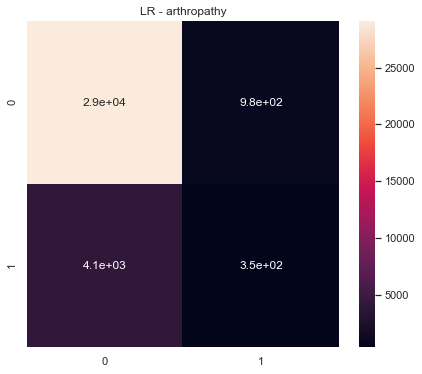

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  arthropathy  300.0  0.509750      0.510471         0.509551   
0   2.0  arthropathy  300.0  0.542224      0.538262         0.553233   
0   3.0  arthropathy  300.0  0.482616      0.481952         0.483856   
0   4.0  arthropathy  300.0  0.499403      0.502885         0.502144   
0   5.0  arthropathy  300.0  0.548405      0.554211         0.545444   

   ROC Macro  
0   0.575431  
0   0.570161  
0   0.508372  
0   0.500602  
0   0.576163  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  arthropathy  300.0  2.582397    2.587781       2.594229  2.73073
================================== ascites ==================================
================================== NB ==================================


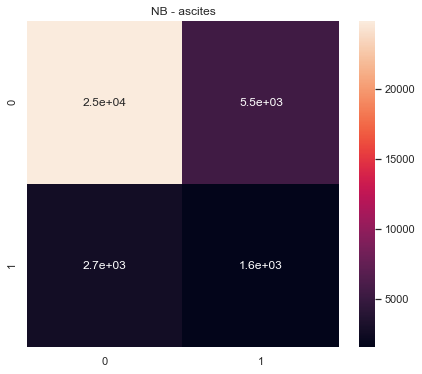

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  ascites  300.0  0.523153      0.528525         0.522327   0.553122
0   2.0  ascites  300.0  0.539859      0.547323         0.537276   0.553011
0   3.0  ascites  300.0  0.532062      0.547424         0.531866   0.599392
0   4.0  ascites  300.0  0.532127      0.546724         0.531734   0.570838
0   5.0  ascites  300.0  0.541507      0.551215         0.538772   0.575125



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  ascites  300.0  2.668708    2.721212       2.661974  2.851489
================================== DT ==================================


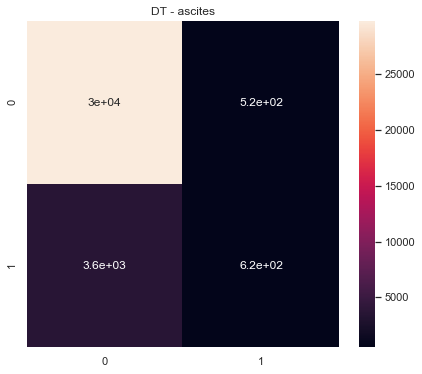

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  ascites  300.0  0.510979      0.517108         0.561683   0.547070
0   2.0  ascites  300.0  0.489313      0.504360         0.519222   0.548183
0   3.0  ascites  300.0  0.469576      0.479175         0.464522   0.476415
0   4.0  ascites  300.0  0.480510      0.497111         0.489526   0.506856
0   5.0  ascites  300.0  0.522021      0.521208         0.536634   0.516368



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  ascites  300.0  2.472401    2.518962       2.571587  2.594891
================================== RF ==================================


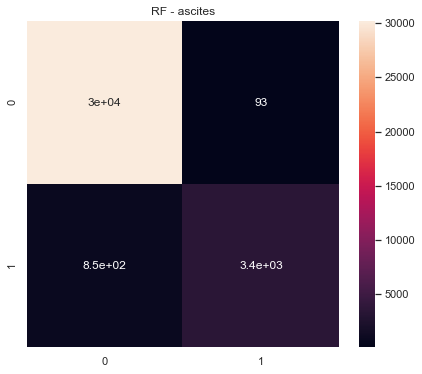

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  ascites  300.0  0.466944      0.499670         0.438242   0.609091
0   2.0  ascites  300.0  0.467109      0.500000         0.438278   0.585837
0   3.0  ascites  300.0  0.459897      0.473032         0.450211   0.542912
0   4.0  ascites  300.0  0.465212      0.496285         0.437800   0.527918
0   5.0  ascites  300.0  0.467063      0.499917         0.438260   0.588366



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  ascites  300.0  2.326225    2.468904       2.202792  2.854124
================================== SGD ==================================


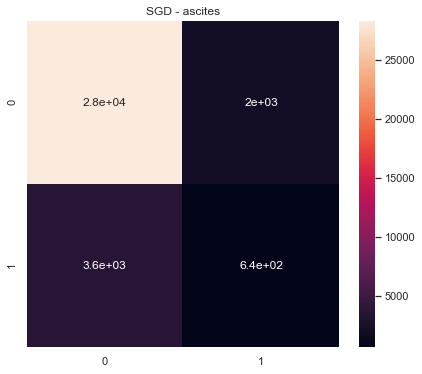

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  ascites  300.0  0.494778      0.494913         0.494709   0.512283
0   2.0  ascites  300.0  0.502633      0.502714         0.502997   0.480232
0   3.0  ascites  300.0  0.472426      0.483624         0.468179   0.408636
0   4.0  ascites  300.0  0.488332      0.490590         0.488007   0.483893
0   5.0  ascites  300.0  0.488290      0.492692         0.488910   0.522423



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  ascites  300.0  2.446458    2.464533       2.442802  2.407466
================================== LR ==================================


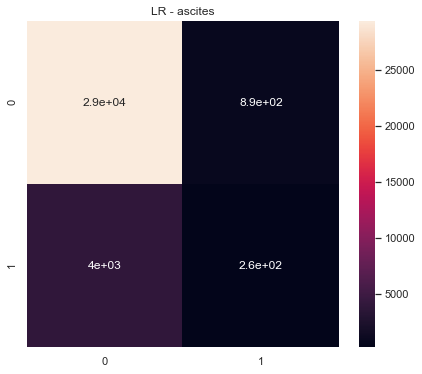

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  ascites  300.0  0.499797      0.500669         0.500564   0.524687
0   2.0  ascites  300.0  0.549645      0.545123         0.559094   0.552842
0   3.0  ascites  300.0  0.470411      0.469527         0.471431   0.533530
0   4.0  ascites  300.0  0.500677      0.502114         0.501722   0.533186
0   5.0  ascites  300.0  0.500045      0.500079         0.500077   0.513791



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  ascites  300.0  2.520576    2.517513       2.532888  2.658036
================================== aseptic.necrosis.bone ==================================
================================== NB ==================================


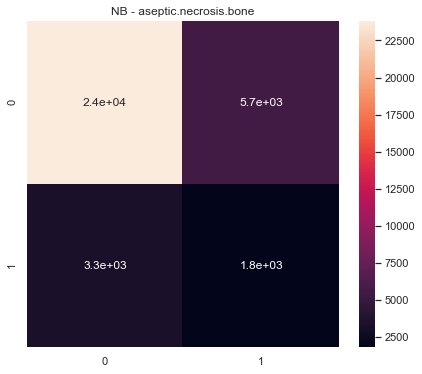

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  aseptic.necrosis.bone  300.0  0.543300      0.545381   
0   2.0  aseptic.necrosis.bone  300.0  0.563990      0.589315   
0   3.0  aseptic.necrosis.bone  300.0  0.518008      0.528139   
0   4.0  aseptic.necrosis.bone  300.0  0.544632      0.550463   
0   5.0  aseptic.necrosis.bone  300.0  0.531730      0.534646   

   Precision Macro  ROC Macro  
0         0.541850   0.588519  
0         0.560898   0.617266  
0         0.520141   0.572362  
0         0.542205   0.543009  
0         0.530404   0.569773  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  aseptic.necrosis.bone  300.0  2.701659    2.747943       2.695497  2.89093
================================== DT ==================================


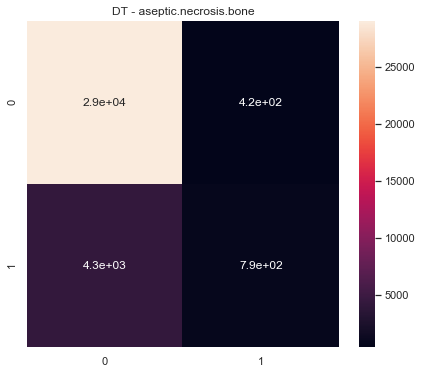

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  aseptic.necrosis.bone  300.0  0.504713      0.517944   
0   2.0  aseptic.necrosis.bone  300.0  0.520856      0.527024   
0   3.0  aseptic.necrosis.bone  300.0  0.527994      0.528623   
0   4.0  aseptic.necrosis.bone  300.0  0.532742      0.532079   
0   5.0  aseptic.necrosis.bone  300.0  0.515229      0.524352   

   Precision Macro  ROC Macro  
0         0.594400   0.559235  
0         0.614674   0.544180  
0         0.567681   0.598496  
0         0.575853   0.592634  
0         0.623822   0.547861  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aseptic.necrosis.bone  300.0  2.601534    2.630022       2.976431  2.842406
================================== RF ==================================


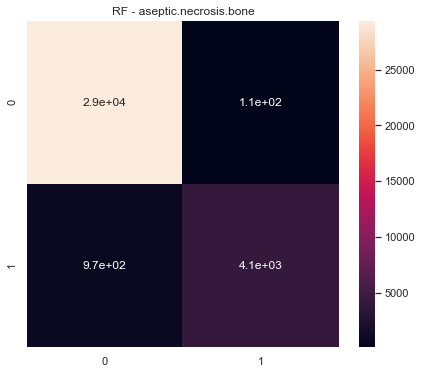

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  aseptic.necrosis.bone  300.0  0.495521      0.516833   
0   2.0  aseptic.necrosis.bone  300.0  0.486251      0.512243   
0   3.0  aseptic.necrosis.bone  300.0  0.510669      0.514619   
0   4.0  aseptic.necrosis.bone  300.0  0.497982      0.512829   
0   5.0  aseptic.necrosis.bone  300.0  0.482726      0.509848   

   Precision Macro  ROC Macro  
0         0.777597   0.600784  
0         0.774039   0.630640  
0         0.529613   0.547168  
0         0.558766   0.538346  
0         0.682964   0.573882  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aseptic.necrosis.bone  300.0  2.473147    2.566372       3.322979  2.890821
================================== SGD ==================================


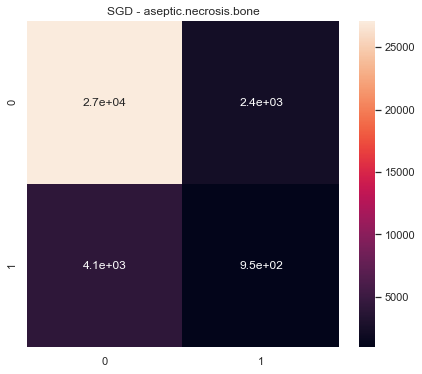

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  aseptic.necrosis.bone  300.0  0.491912      0.492562   
0   2.0  aseptic.necrosis.bone  300.0  0.491372      0.497868   
0   3.0  aseptic.necrosis.bone  300.0  0.474418      0.477411   
0   4.0  aseptic.necrosis.bone  300.0  0.459912      0.462321   
0   5.0  aseptic.necrosis.bone  300.0  0.477461      0.482512   

   Precision Macro  ROC Macro  
0         0.491782   0.491025  
0         0.496288   0.484206  
0         0.472753   0.442136  
0         0.457899   0.435660  
0         0.475951   0.511495  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aseptic.necrosis.bone  300.0  2.395075    2.412675       2.394675  2.364522
================================== LR ==================================


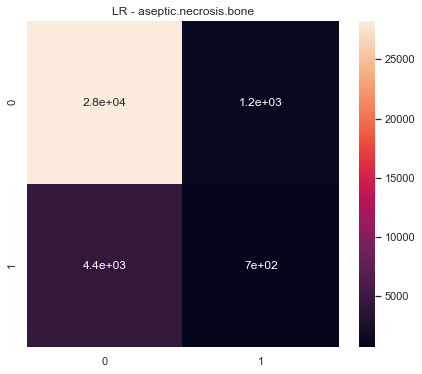

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  aseptic.necrosis.bone  300.0  0.503326      0.503361   
0   2.0  aseptic.necrosis.bone  300.0  0.551808      0.555492   
0   3.0  aseptic.necrosis.bone  300.0  0.537031      0.548498   
0   4.0  aseptic.necrosis.bone  300.0  0.498927      0.500580   
0   5.0  aseptic.necrosis.bone  300.0  0.485610      0.485368   

   Precision Macro  ROC Macro  
0         0.503615   0.533864  
0         0.549494   0.577561  
0         0.535985   0.557718  
0         0.500474   0.505685  
0         0.487520   0.533226  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aseptic.necrosis.bone  300.0  2.576702      2.5933       2.577089  2.708055
================================== aspiration.pneumonia ==================================
================================== NB ==================================


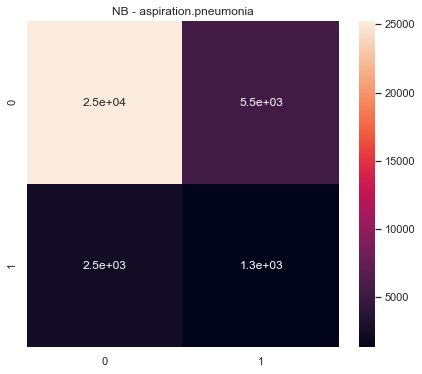

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aspiration.pneumonia  300.0  0.526690      0.540352         0.526653   
0   2.0  aspiration.pneumonia  300.0  0.554557      0.565381         0.549936   
0   3.0  aspiration.pneumonia  300.0  0.514508      0.532774         0.519335   
0   4.0  aspiration.pneumonia  300.0  0.521108      0.533639         0.522082   
0   5.0  aspiration.pneumonia  300.0  0.522097      0.529165         0.521449   

   ROC Macro  
0   0.565872  
0   0.606885  
0   0.555262  
0   0.555553  
0   0.563739  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aspiration.pneumonia  300.0  2.63896    2.701311       2.639456  2.847312
================================== DT ==================================


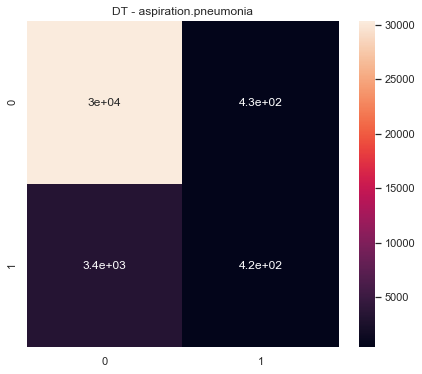

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aspiration.pneumonia  300.0  0.490736      0.504996         0.526757   
0   2.0  aspiration.pneumonia  300.0  0.490939      0.505240         0.528720   
0   3.0  aspiration.pneumonia  300.0  0.462941      0.475565         0.453052   
0   4.0  aspiration.pneumonia  300.0  0.488041      0.492821         0.488455   
0   5.0  aspiration.pneumonia  300.0  0.510921      0.516284         0.565750   

   ROC Macro  
0   0.493549  
0   0.547447  
0   0.553618  
0   0.511096  
0   0.552562  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aspiration.pneumonia  300.0  2.443578    2.494907       2.562734  2.658272
================================== RF ==================================


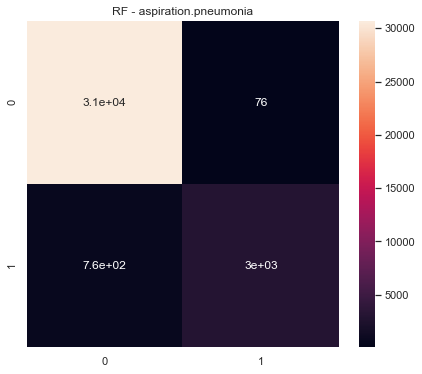

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aspiration.pneumonia  300.0  0.470458      0.499268         0.444791   
0   2.0  aspiration.pneumonia  300.0  0.470782      0.499919         0.444855   
0   3.0  aspiration.pneumonia  300.0  0.458337      0.475520         0.442351   
0   4.0  aspiration.pneumonia  300.0  0.469588      0.495695         0.452501   
0   5.0  aspiration.pneumonia  300.0  0.470534      0.499349         0.444863   

   ROC Macro  
0   0.594345  
0   0.593383  
0   0.539745  
0   0.499194  
0   0.582924  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aspiration.pneumonia  300.0  2.339699    2.469752        2.22936  2.809591
================================== SGD ==================================


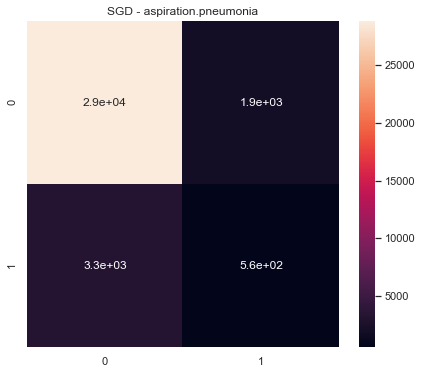

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aspiration.pneumonia  300.0  0.467825      0.476108         0.462046   
0   2.0  aspiration.pneumonia  300.0  0.475639      0.489511         0.472094   
0   3.0  aspiration.pneumonia  300.0  0.458215      0.458987         0.457462   
0   4.0  aspiration.pneumonia  300.0  0.457898      0.461789         0.454363   
0   5.0  aspiration.pneumonia  300.0  0.480759      0.479819         0.484507   

   ROC Macro  
0   0.481124  
0   0.484287  
0   0.406565  
0   0.401950  
0   0.464737  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aspiration.pneumonia  300.0  2.340337    2.366215       2.330472  2.238662
================================== LR ==================================


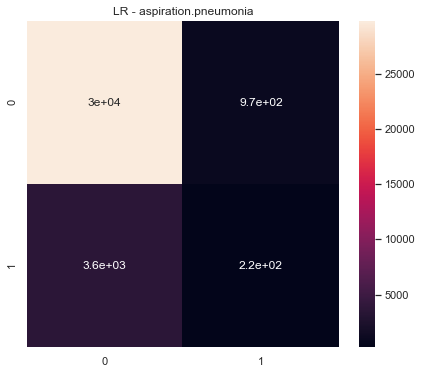

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  aspiration.pneumonia  300.0  0.502179      0.502849         0.502470   
0   2.0  aspiration.pneumonia  300.0  0.521410      0.520173         0.534441   
0   3.0  aspiration.pneumonia  300.0  0.476267      0.495997         0.498018   
0   4.0  aspiration.pneumonia  300.0  0.463533      0.460752         0.467118   
0   5.0  aspiration.pneumonia  300.0  0.505579      0.507419         0.506020   

   ROC Macro  
0   0.498112  
0   0.534462  
0   0.502898  
0   0.467185  
0   0.516125  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  aspiration.pneumonia  300.0  2.468969    2.487191       2.508067  2.518782
================================== asthenia ==================================
================================== NB ==================================


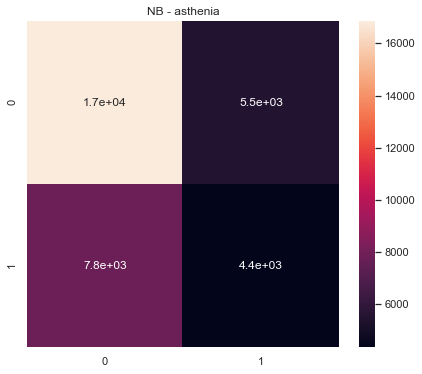

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthenia  300.0  0.533572      0.539605         0.552616   0.571565
0   2.0  asthenia  300.0  0.529838      0.529662         0.530606   0.546303
0   3.0  asthenia  300.0  0.530344      0.530283         0.531884   0.539047
0   4.0  asthenia  300.0  0.524583      0.526446         0.530243   0.519311
0   5.0  asthenia  300.0  0.524796      0.531766         0.542221   0.557131



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthenia  300.0  2.643132    2.657762        2.68757  2.733358
================================== DT ==================================


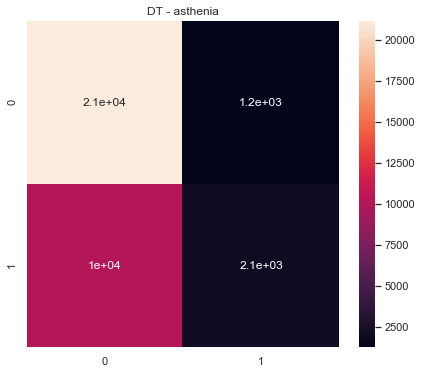

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthenia  300.0  0.447559      0.506055         0.521752   0.528608
0   2.0  asthenia  300.0  0.512787      0.531691         0.554875   0.543728
0   3.0  asthenia  300.0  0.440330      0.494080         0.482832   0.508560
0   4.0  asthenia  300.0  0.446269      0.507089         0.527368   0.505474
0   5.0  asthenia  300.0  0.477544      0.516639         0.540972   0.525250



        ADR    PCA   Avg F1  Avg Recall  Avg Precision  Avg ROC
0  asthenia  300.0  2.32449    2.555554       2.627799  2.61162
================================== RF ==================================


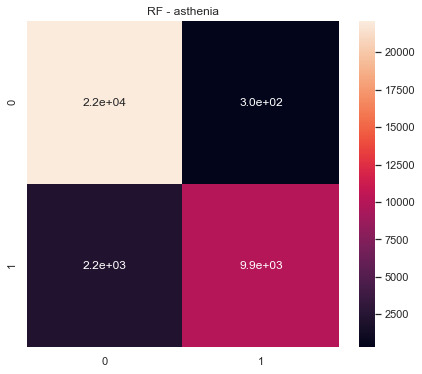

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthenia  300.0  0.463937      0.519796         0.576406   0.587168
0   2.0  asthenia  300.0  0.470909      0.524517         0.593429   0.584605
0   3.0  asthenia  300.0  0.423475      0.473775         0.437188   0.530760
0   4.0  asthenia  300.0  0.446729      0.500862         0.502656   0.516059
0   5.0  asthenia  300.0  0.462117      0.521384         0.593416   0.585270



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthenia  300.0  2.267167    2.540334       2.703095  2.803862
================================== SGD ==================================


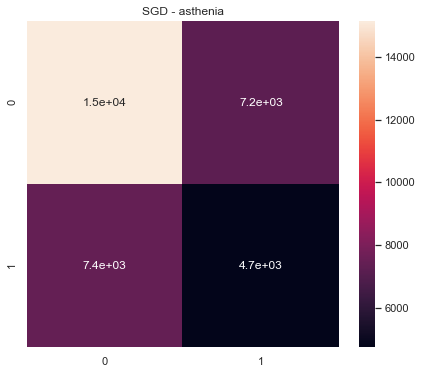

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthenia  300.0  0.529097      0.528934         0.529868   0.543101
0   2.0  asthenia  300.0  0.501275      0.503262         0.503606   0.507288
0   3.0  asthenia  300.0  0.487846      0.489807         0.488920   0.492451
0   4.0  asthenia  300.0  0.481885      0.482289         0.483031   0.461779
0   5.0  asthenia  300.0  0.498463      0.499326         0.499355   0.500496



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthenia  300.0  2.498566    2.503619       2.504781  2.505115
================================== LR ==================================


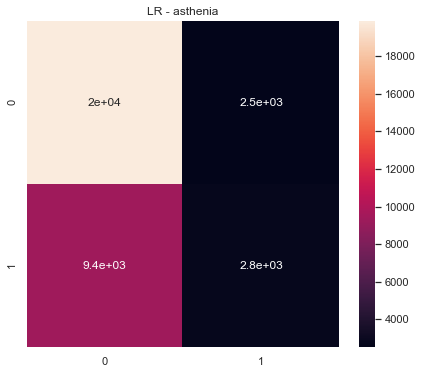

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthenia  300.0  0.543887      0.551269         0.573391   0.575860
0   2.0  asthenia  300.0  0.480158      0.504511         0.507800   0.522927
0   3.0  asthenia  300.0  0.478817      0.487090         0.484002   0.494431
0   4.0  asthenia  300.0  0.498153      0.499328         0.499279   0.471605
0   5.0  asthenia  300.0  0.496593      0.511445         0.516956   0.510694



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthenia  300.0  2.497608    2.553643       2.581429  2.575517
================================== asthma ==================================
================================== NB ==================================


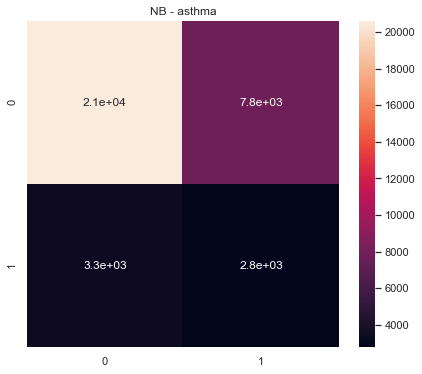

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthma  300.0  0.540103      0.547098         0.538686   0.597616
0   2.0  asthma  300.0  0.521545      0.536571         0.526055   0.558275
0   3.0  asthma  300.0  0.526209      0.552117         0.534680   0.590217
0   4.0  asthma  300.0  0.519393      0.539430         0.526887   0.559300
0   5.0  asthma  300.0  0.513420      0.517771         0.514457   0.549580



      ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthma  300.0  2.62067    2.692988       2.640765  2.854987
================================== DT ==================================


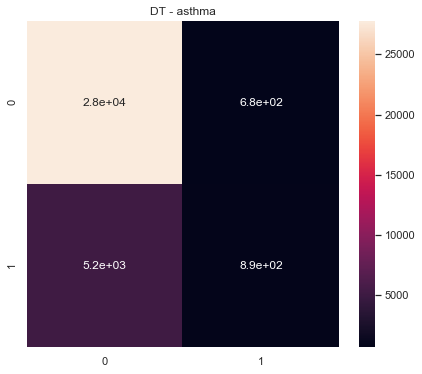

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthma  300.0  0.500216      0.513100         0.537391   0.511938
0   2.0  asthma  300.0  0.480630      0.497699         0.494100   0.520824
0   3.0  asthma  300.0  0.510079      0.516471         0.534433   0.515502
0   4.0  asthma  300.0  0.482828      0.509461         0.559401   0.511033
0   5.0  asthma  300.0  0.482909      0.491032         0.485514   0.509573



      ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  asthma  300.0  2.456662    2.527764       2.610839  2.56887
================================== RF ==================================


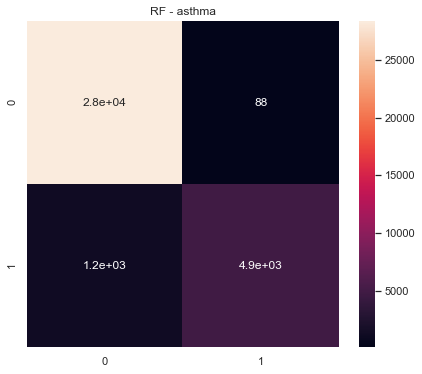

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthma  300.0  0.458442      0.502283         0.592055   0.558284
0   2.0  asthma  300.0  0.450595      0.495547         0.427198   0.546806
0   3.0  asthma  300.0  0.451062      0.494255         0.433531   0.622114
0   4.0  asthma  300.0  0.456724      0.501460         0.564037   0.570288
0   5.0  asthma  300.0  0.449532      0.482271         0.433933   0.563766



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthma  300.0  2.266354    2.475817       2.450754  2.861257
================================== SGD ==================================


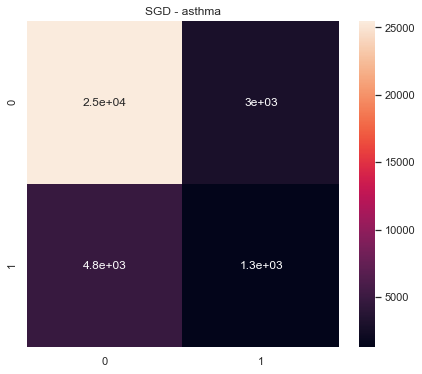

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthma  300.0  0.482080      0.493711         0.487919   0.448255
0   2.0  asthma  300.0  0.526855      0.526375         0.538464   0.550988
0   3.0  asthma  300.0  0.498978      0.499588         0.499533   0.454905
0   4.0  asthma  300.0  0.491054      0.494577         0.492717   0.485773
0   5.0  asthma  300.0  0.456577      0.459685         0.454231   0.414957



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthma  300.0  2.455544    2.473936       2.472864  2.354879
================================== LR ==================================


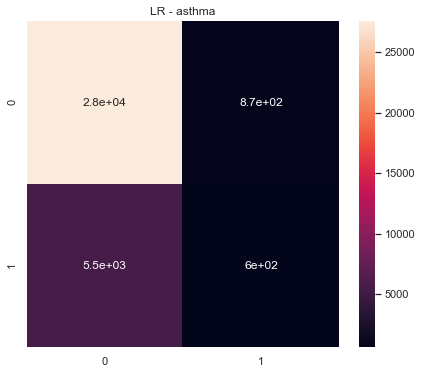

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asthma  300.0  0.516984      0.516555         0.518405   0.559307
0   2.0  asthma  300.0  0.494816      0.511610         0.540132   0.550249
0   3.0  asthma  300.0  0.540434      0.538018         0.547921   0.572643
0   4.0  asthma  300.0  0.490767      0.497669         0.496193   0.532396
0   5.0  asthma  300.0  0.486592      0.490525         0.487371   0.504772



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asthma  300.0  2.529592    2.554377       2.590023  2.719367
================================== asystole ==================================
================================== NB ==================================


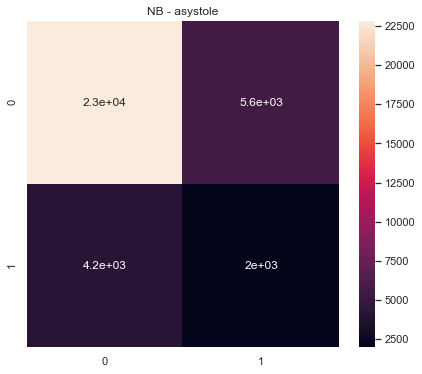

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asystole  300.0  0.532550      0.540591         0.532273   0.551647
0   2.0  asystole  300.0  0.523157      0.522750         0.523748   0.557418
0   3.0  asystole  300.0  0.541980      0.542781         0.541324   0.576497
0   4.0  asystole  300.0  0.529527      0.528461         0.531776   0.545785
0   5.0  asystole  300.0  0.526903      0.526630         0.527226   0.551106



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asystole  300.0  2.654117    2.661212       2.656347  2.782453
================================== DT ==================================


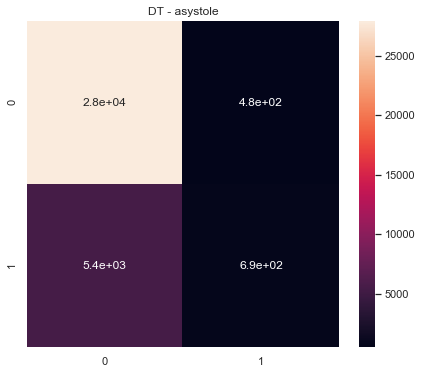

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asystole  300.0  0.474808      0.501075         0.504667   0.511862
0   2.0  asystole  300.0  0.478621      0.502199         0.508475   0.509263
0   3.0  asystole  300.0  0.469579      0.494577         0.481438   0.505416
0   4.0  asystole  300.0  0.475504      0.503148         0.515914   0.487264
0   5.0  asystole  300.0  0.477184      0.504240         0.521525   0.525965



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asystole  300.0  2.375696     2.50524        2.53202  2.539769
================================== RF ==================================


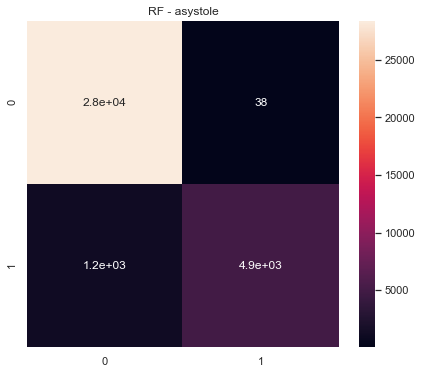

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asystole  300.0  0.452532      0.500022         0.502056   0.569153
0   2.0  asystole  300.0  0.451108      0.499824         0.411045   0.555138
0   3.0  asystole  300.0  0.454145      0.490822         0.447944   0.547629
0   4.0  asystole  300.0  0.451690      0.499703         0.466583   0.550913
0   5.0  asystole  300.0  0.451859      0.499967         0.494459   0.589899



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asystole  300.0  2.261334    2.490338       2.322086  2.812733
================================== SGD ==================================


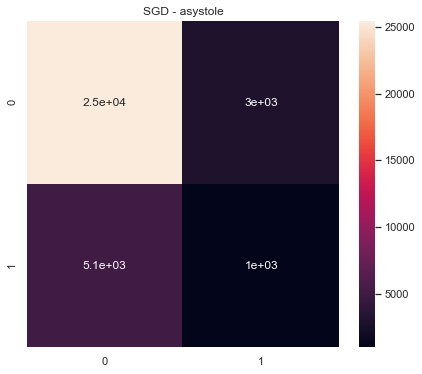

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asystole  300.0  0.482627      0.487450         0.482930   0.464296
0   2.0  asystole  300.0  0.504131      0.509244         0.515775   0.529128
0   3.0  asystole  300.0  0.487897      0.491994         0.489148   0.451386
0   4.0  asystole  300.0  0.497282      0.499127         0.498906   0.475291
0   5.0  asystole  300.0  0.507831      0.509558         0.508307   0.517795



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asystole  300.0  2.479768    2.497372       2.495066  2.437896
================================== LR ==================================


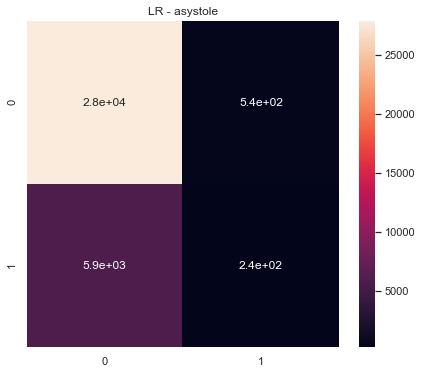

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  asystole  300.0  0.535291      0.533969         0.537729   0.555597
0   2.0  asystole  300.0  0.475756      0.505184         0.532329   0.554387
0   3.0  asystole  300.0  0.514457      0.516499         0.525565   0.533100
0   4.0  asystole  300.0  0.531796      0.533245         0.571761   0.581963
0   5.0  asystole  300.0  0.507804      0.512293         0.521138   0.531330



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  asystole  300.0  2.565104     2.60119       2.688523  2.756375
================================== atelectasis ==================================
================================== NB ==================================


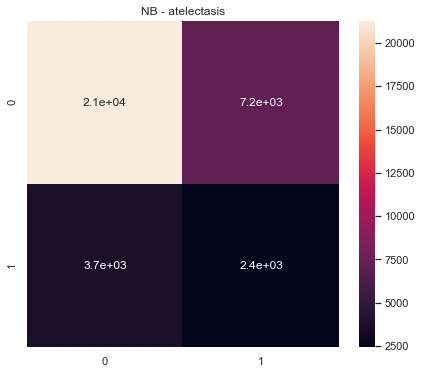

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  atelectasis  300.0  0.542462      0.545196         0.540969   
0   2.0  atelectasis  300.0  0.540736      0.546098         0.539116   
0   3.0  atelectasis  300.0  0.498666      0.513515         0.509205   
0   4.0  atelectasis  300.0  0.503411      0.514098         0.510088   
0   5.0  atelectasis  300.0  0.522088      0.525972         0.521894   

   ROC Macro  
0   0.569924  
0   0.585340  
0   0.541422  
0   0.506284  
0   0.549405  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  atelectasis  300.0  2.607362    2.644878       2.621272  2.752375
================================== DT ==================================


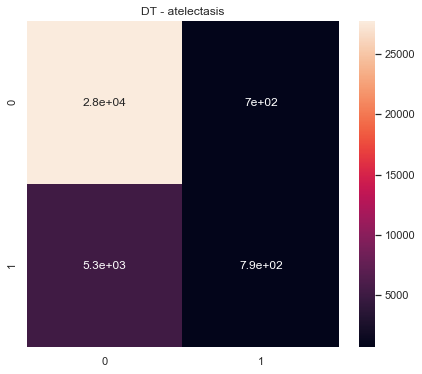

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  atelectasis  300.0  0.493260      0.506994         0.518171   
0   2.0  atelectasis  300.0  0.481915      0.504607         0.518263   
0   3.0  atelectasis  300.0  0.442331      0.468988         0.424661   
0   4.0  atelectasis  300.0  0.466921      0.477249         0.464298   
0   5.0  atelectasis  300.0  0.476902      0.499596         0.498602   

   ROC Macro  
0   0.520042  
0   0.540344  
0   0.503150  
0   0.481383  
0   0.497543  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  atelectasis  300.0  2.361329    2.457435       2.423995  2.542461
================================== RF ==================================


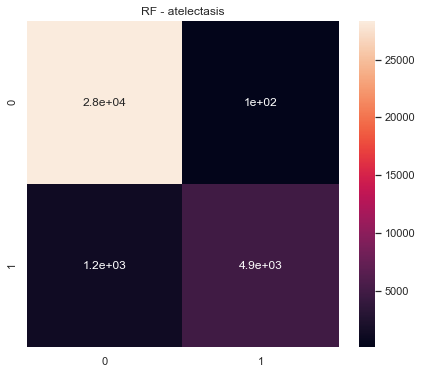

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  atelectasis  300.0  0.451468      0.498738         0.436321   
0   2.0  atelectasis  300.0  0.451413      0.499912         0.411492   
0   3.0  atelectasis  300.0  0.437983      0.473531         0.407399   
0   4.0  atelectasis  300.0  0.443209      0.482646         0.411290   
0   5.0  atelectasis  300.0  0.451405      0.499912         0.411479   

   ROC Macro  
0   0.593323  
0   0.582603  
0   0.531866  
0   0.462018  
0   0.543398  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  atelectasis  300.0  2.235479     2.45474       2.077981  2.713208
================================== SGD ==================================


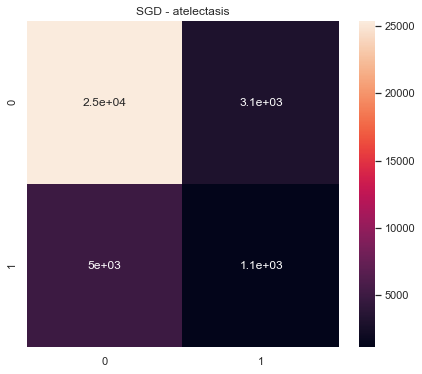

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  atelectasis  300.0  0.463394      0.476662         0.459775   
0   2.0  atelectasis  300.0  0.469836      0.490751         0.475238   
0   3.0  atelectasis  300.0  0.465388      0.463795         0.468799   
0   4.0  atelectasis  300.0  0.459150      0.469409         0.454449   
0   5.0  atelectasis  300.0  0.477938      0.478079         0.477808   

   ROC Macro  
0   0.465176  
0   0.495393  
0   0.428870  
0   0.395820  
0   0.516934  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  atelectasis  300.0  2.335706    2.378696       2.336068  2.302193
================================== LR ==================================


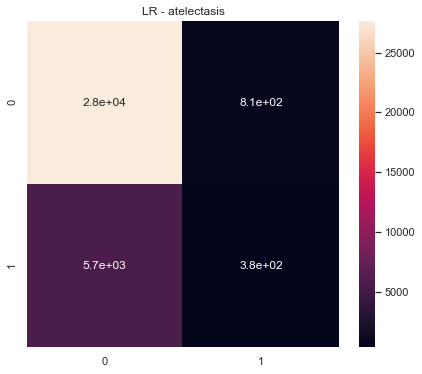

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  atelectasis  300.0  0.517663      0.517435         0.521551   
0   2.0  atelectasis  300.0  0.511570      0.520380         0.554308   
0   3.0  atelectasis  300.0  0.459429      0.459893         0.458992   
0   4.0  atelectasis  300.0  0.443268      0.461718         0.431281   
0   5.0  atelectasis  300.0  0.485032      0.494660         0.490476   

   ROC Macro  
0   0.525331  
0   0.538319  
0   0.456880  
0   0.438129  
0   0.492081  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  atelectasis  300.0  2.416961    2.454086       2.456608  2.45074
================================== balance.disorder ==================================
================================== NB ==================================


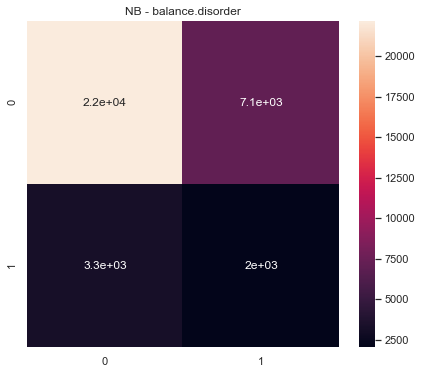

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  balance.disorder  300.0  0.536297      0.551199         0.536522   
0   2.0  balance.disorder  300.0  0.521344      0.532232         0.523245   
0   3.0  balance.disorder  300.0  0.525081      0.545940         0.530115   
0   4.0  balance.disorder  300.0  0.517156      0.524595         0.518520   
0   5.0  balance.disorder  300.0  0.527675      0.540064         0.528821   

   ROC Macro  
0   0.583089  
0   0.554095  
0   0.573736  
0   0.525380  
0   0.587666  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  balance.disorder  300.0  2.627553    2.694031       2.637223  2.823966
================================== DT ==================================


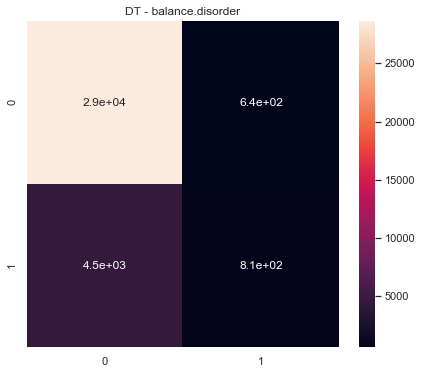

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  balance.disorder  300.0  0.509672      0.515534         0.535952   
0   2.0  balance.disorder  300.0  0.485095      0.503512         0.513275   
0   3.0  balance.disorder  300.0  0.474033      0.494499         0.481995   
0   4.0  balance.disorder  300.0  0.487860      0.502566         0.507500   
0   5.0  balance.disorder  300.0  0.489075      0.497079         0.494648   

   ROC Macro  
0   0.528887  
0   0.527147  
0   0.522342  
0   0.523149  
0   0.499262  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  balance.disorder  300.0  2.445735    2.513191       2.533371  2.600787
================================== RF ==================================


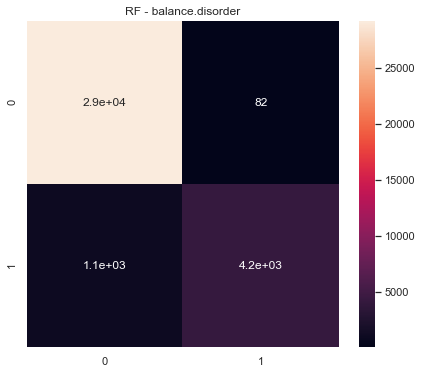

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  balance.disorder  300.0  0.457912      0.498804         0.423216   
0   2.0  balance.disorder  300.0  0.459486      0.500472         0.923433   
0   3.0  balance.disorder  300.0  0.453104      0.488079         0.425143   
0   4.0  balance.disorder  300.0  0.457486      0.498034         0.423043   
0   5.0  balance.disorder  300.0  0.452508      0.482532         0.431562   

   ROC Macro  
0   0.557374  
0   0.572977  
0   0.552125  
0   0.549856  
0   0.569926  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  balance.disorder  300.0  2.280496     2.46792       2.626397  2.802258
================================== SGD ==================================


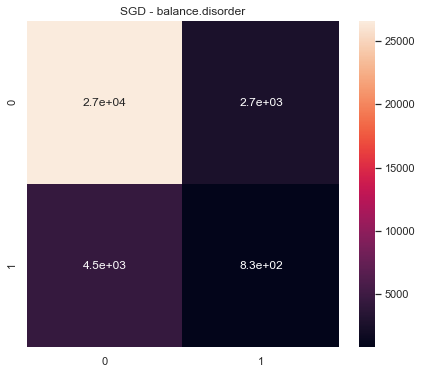

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  balance.disorder  300.0  0.488303      0.489822         0.488070   
0   2.0  balance.disorder  300.0  0.467453      0.471872         0.464802   
0   3.0  balance.disorder  300.0  0.471906      0.476960         0.469608   
0   4.0  balance.disorder  300.0  0.488895      0.489440         0.488645   
0   5.0  balance.disorder  300.0  0.476852      0.481833         0.475376   

   ROC Macro  
0   0.478276  
0   0.496015  
0   0.458250  
0   0.472728  
0   0.452900  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  balance.disorder  300.0  2.393411    2.409929       2.386501  2.358168
================================== LR ==================================


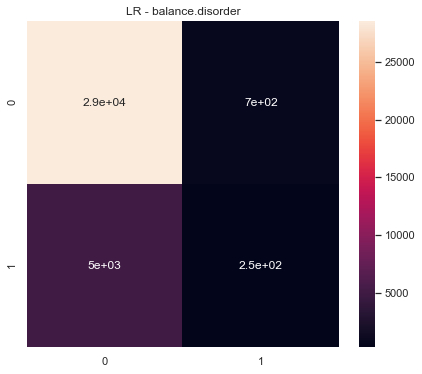

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  balance.disorder  300.0  0.503825      0.504072         0.504643   
0   2.0  balance.disorder  300.0  0.508164      0.515265         0.538499   
0   3.0  balance.disorder  300.0  0.522561      0.521927         0.523619   
0   4.0  balance.disorder  300.0  0.508295      0.508169         0.508814   
0   5.0  balance.disorder  300.0  0.484924      0.491658         0.486610   

   ROC Macro  
0   0.564464  
0   0.542055  
0   0.542483  
0   0.485469  
0   0.502254  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  balance.disorder  300.0  2.527769    2.541091       2.562185  2.636725
================================== bladder.retention ==================================
================================== NB ==================================


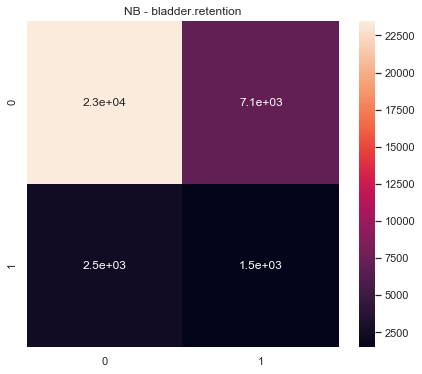

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bladder.retention  300.0  0.517342      0.533323         0.520761   
0   2.0  bladder.retention  300.0  0.530658      0.548655         0.531114   
0   3.0  bladder.retention  300.0  0.467535      0.501244         0.500579   
0   4.0  bladder.retention  300.0  0.506601      0.524372         0.514238   
0   5.0  bladder.retention  300.0  0.511392      0.526944         0.516461   

   ROC Macro  
0   0.551906  
0   0.593508  
0   0.504666  
0   0.542906  
0   0.551670  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bladder.retention  300.0  2.533528    2.634539       2.583153  2.744657
================================== DT ==================================


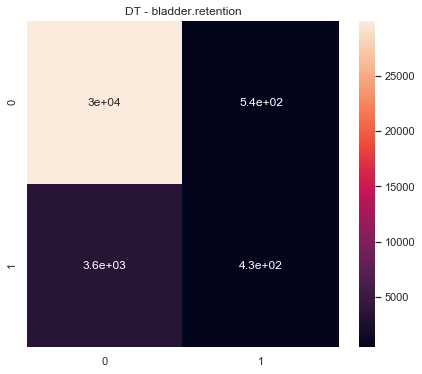

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bladder.retention  300.0  0.487824      0.502800         0.512526   
0   2.0  bladder.retention  300.0  0.477731      0.497252         0.486217   
0   3.0  bladder.retention  300.0  0.446197      0.442630         0.450106   
0   4.0  bladder.retention  300.0  0.480683      0.487355         0.479159   
0   5.0  bladder.retention  300.0  0.483335      0.501467         0.508303   

   ROC Macro  
0   0.532695  
0   0.534989  
0   0.465270  
0   0.508785  
0   0.519778  



                 ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bladder.retention  300.0  2.37577    2.431504       2.436311  2.561516
================================== RF ==================================


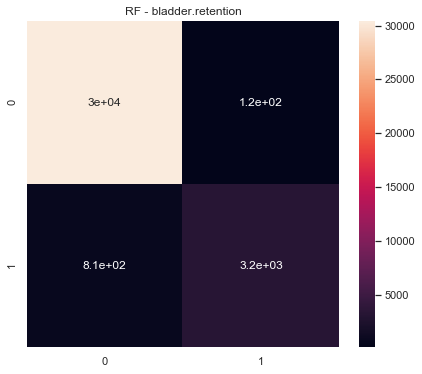

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bladder.retention  300.0  0.470012      0.500047         0.504184   
0   2.0  bladder.retention  300.0  0.468993      0.499918         0.441670   
0   3.0  bladder.retention  300.0  0.448919      0.461091         0.437374   
0   4.0  bladder.retention  300.0  0.467547      0.493705         0.451659   
0   5.0  bladder.retention  300.0  0.469069      0.500000         0.441743   

   ROC Macro  
0   0.579254  
0   0.595423  
0   0.493203  
0   0.424046  
0   0.545735  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bladder.retention  300.0  2.324541    2.454761        2.27663  2.637661
================================== SGD ==================================


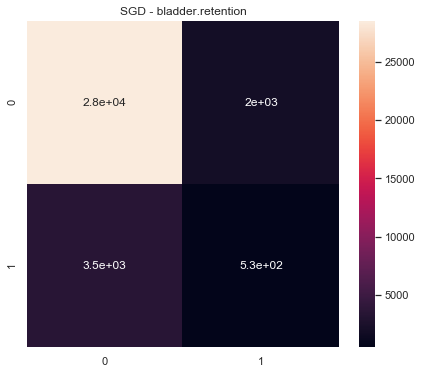

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bladder.retention  300.0  0.481200      0.484595         0.479706   
0   2.0  bladder.retention  300.0  0.487552      0.489816         0.487020   
0   3.0  bladder.retention  300.0  0.447728      0.444841         0.450847   
0   4.0  bladder.retention  300.0  0.467743      0.471008         0.465138   
0   5.0  bladder.retention  300.0  0.465553      0.470093         0.461979   

   ROC Macro  
0   0.486310  
0   0.465243  
0   0.379644  
0   0.421628  
0   0.480178  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bladder.retention  300.0  2.349778    2.360353        2.34469  2.233003
================================== LR ==================================


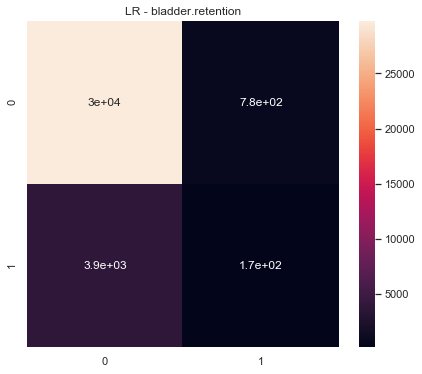

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bladder.retention  300.0  0.522301      0.521900         0.522790   
0   2.0  bladder.retention  300.0  0.497284      0.508547         0.536699   
0   3.0  bladder.retention  300.0  0.482075      0.481983         0.486738   
0   4.0  bladder.retention  300.0  0.463999      0.463532         0.464483   
0   5.0  bladder.retention  300.0  0.500992      0.505002         0.503606   

   ROC Macro  
0   0.560788  
0   0.544027  
0   0.485257  
0   0.419101  
0   0.503509  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bladder.retention  300.0  2.466651    2.480964       2.514317  2.512681
================================== bleb ==================================
================================== NB ==================================


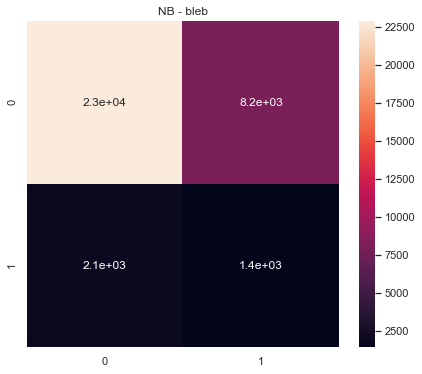

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bleb  300.0  0.506523      0.535735         0.517951   0.564422
0   2.0  bleb  300.0  0.493761      0.515039         0.507615   0.565931
0   3.0  bleb  300.0  0.455066      0.502719         0.501079   0.521459
0   4.0  bleb  300.0  0.500200      0.518444         0.509912   0.554505
0   5.0  bleb  300.0  0.511536      0.529978         0.516988   0.583445



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bleb  300.0  2.467085    2.601915       2.553545  2.789763
================================== DT ==================================


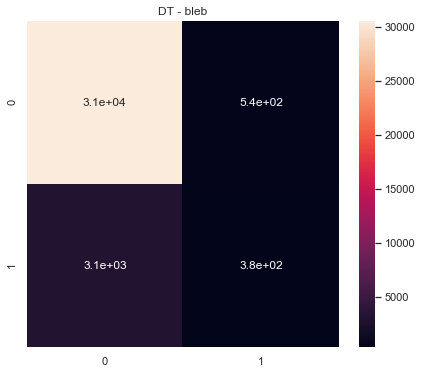

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bleb  300.0  0.493347      0.504429         0.518768   0.521833
0   2.0  bleb  300.0  0.471869      0.471379         0.472387   0.459182
0   3.0  bleb  300.0  0.456674      0.459863         0.453647   0.473066
0   4.0  bleb  300.0  0.497273      0.501841         0.503670   0.500281
0   5.0  bleb  300.0  0.486792      0.501771         0.509778   0.533233



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bleb  300.0  2.405955    2.439282       2.458249  2.487595
================================== RF ==================================


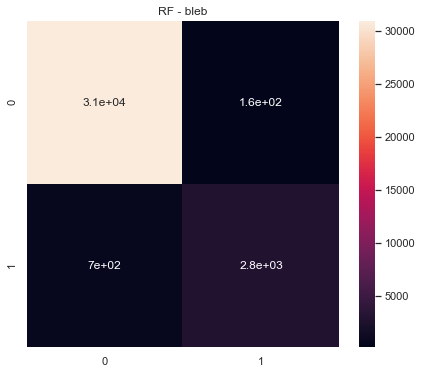

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bleb  300.0  0.473163      0.499758         0.449254   0.528432
0   2.0  bleb  300.0  0.458888      0.471896         0.446578   0.493165
0   3.0  bleb  300.0  0.456291      0.466983         0.446077   0.454819
0   4.0  bleb  300.0  0.471591      0.496618         0.448966   0.459795
0   5.0  bleb  300.0  0.473279      0.500000         0.449269   0.549587



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bleb  300.0  2.333212    2.435255       2.240145  2.485798
================================== SGD ==================================


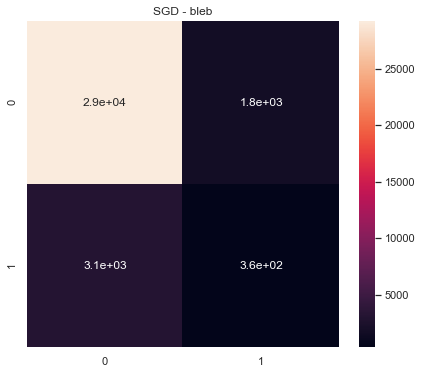

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bleb  300.0  0.470450      0.467594         0.475812   0.447150
0   2.0  bleb  300.0  0.504315      0.504419         0.505271   0.450663
0   3.0  bleb  300.0  0.478220      0.476889         0.480252   0.384671
0   4.0  bleb  300.0  0.490202      0.492086         0.489848   0.438891
0   5.0  bleb  300.0  0.481785      0.480789         0.485336   0.518419



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bleb  300.0  2.424972    2.421777       2.436519  2.239793
================================== LR ==================================


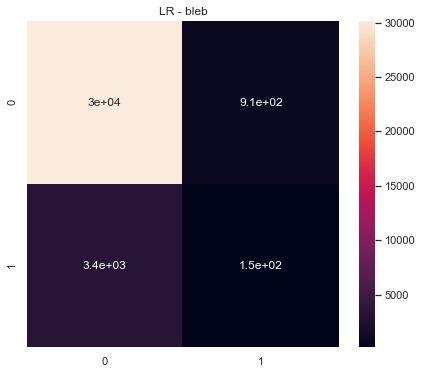

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bleb  300.0  0.508765      0.513887         0.509901   0.503286
0   2.0  bleb  300.0  0.464180      0.471206         0.458264   0.438044
0   3.0  bleb  300.0  0.491799      0.512565         0.506333   0.494507
0   4.0  bleb  300.0  0.512618      0.520019         0.513715   0.510831
0   5.0  bleb  300.0  0.494437      0.494529         0.494371   0.510004



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bleb  300.0  2.471799    2.512206       2.482585  2.456672
================================== blood.in.urine ==================================
================================== NB ==================================


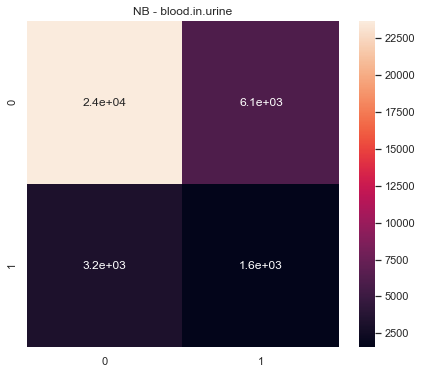

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blood.in.urine  300.0  0.540230      0.544240         0.538209   
0   2.0  blood.in.urine  300.0  0.521401      0.542911         0.526905   
0   3.0  blood.in.urine  300.0  0.505691      0.519434         0.512529   
0   4.0  blood.in.urine  300.0  0.535975      0.544104         0.534250   
0   5.0  blood.in.urine  300.0  0.535271      0.544805         0.533843   

   ROC Macro  
0   0.564944  
0   0.563988  
0   0.541858  
0   0.563490  
0   0.572926  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blood.in.urine  300.0  2.638568    2.695494       2.645737  2.807206
================================== DT ==================================


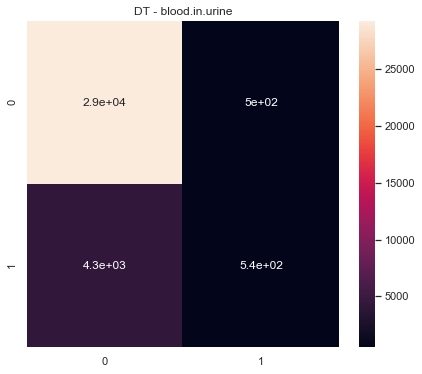

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blood.in.urine  300.0  0.478130      0.500368         0.501937   
0   2.0  blood.in.urine  300.0  0.490374      0.505279         0.519479   
0   3.0  blood.in.urine  300.0  0.464008      0.475382         0.457867   
0   4.0  blood.in.urine  300.0  0.490650      0.501489         0.503717   
0   5.0  blood.in.urine  300.0  0.484660      0.501398         0.505094   

   ROC Macro  
0   0.522511  
0   0.523256  
0   0.519894  
0   0.508395  
0   0.529432  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blood.in.urine  300.0  2.407822    2.483915       2.488094  2.603488
================================== RF ==================================


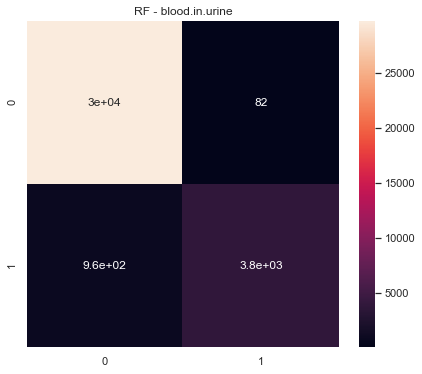

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blood.in.urine  300.0  0.463991      0.499528         0.480406   
0   2.0  blood.in.urine  300.0  0.462550      0.499832         0.430443   
0   3.0  blood.in.urine  300.0  0.447818      0.471004         0.426809   
0   4.0  blood.in.urine  300.0  0.461689      0.496570         0.440466   
0   5.0  blood.in.urine  300.0  0.462627      0.500000         0.430453   

   ROC Macro  
0   0.565332  
0   0.558150  
0   0.520007  
0   0.479828  
0   0.565771  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blood.in.urine  300.0  2.298675    2.466933       2.208577  2.689088
================================== SGD ==================================


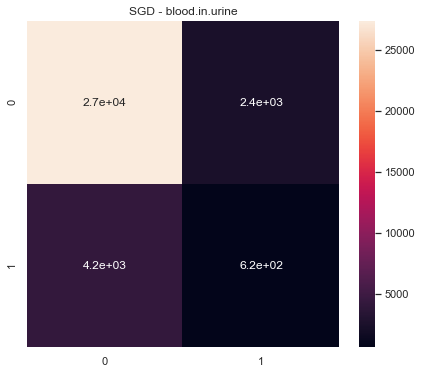

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blood.in.urine  300.0  0.461792      0.475690         0.453993   
0   2.0  blood.in.urine  300.0  0.480030      0.481305         0.479209   
0   3.0  blood.in.urine  300.0  0.471493      0.474970         0.469313   
0   4.0  blood.in.urine  300.0  0.458972      0.468238         0.452609   
0   5.0  blood.in.urine  300.0  0.517975      0.524509         0.518543   

   ROC Macro  
0   0.448073  
0   0.515103  
0   0.398442  
0   0.430135  
0   0.529695  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blood.in.urine  300.0  2.390262    2.424711       2.373667  2.321449
================================== LR ==================================


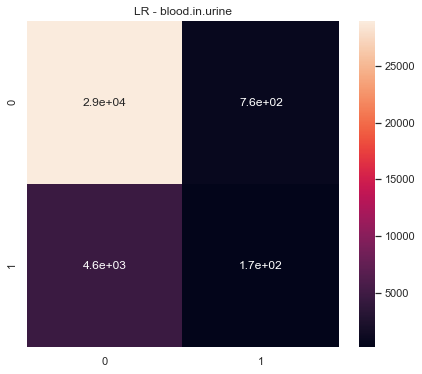

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blood.in.urine  300.0  0.511249      0.511078         0.511513   
0   2.0  blood.in.urine  300.0  0.500446      0.504254         0.507082   
0   3.0  blood.in.urine  300.0  0.487271      0.488601         0.491356   
0   4.0  blood.in.urine  300.0  0.471169      0.474785         0.468908   
0   5.0  blood.in.urine  300.0  0.523681      0.522436         0.527633   

   ROC Macro  
0   0.524282  
0   0.528120  
0   0.498578  
0   0.467143  
0   0.539885  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blood.in.urine  300.0  2.493817    2.501154       2.506493  2.558008
================================== blood.sodium.decreased ==================================
================================== NB ==================================


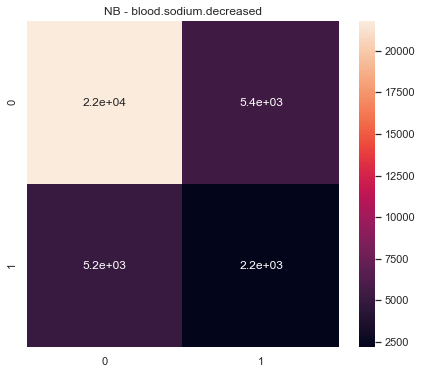

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  blood.sodium.decreased  300.0  0.516815      0.517421   
0   2.0  blood.sodium.decreased  300.0  0.529997      0.530758   
0   3.0  blood.sodium.decreased  300.0  0.506756      0.509885   
0   4.0  blood.sodium.decreased  300.0  0.506739      0.506716   
0   5.0  blood.sodium.decreased  300.0  0.516195      0.516563   

   Precision Macro  ROC Macro  
0         0.516578   0.526363  
0         0.529507   0.568229  
0         0.508386   0.547428  
0         0.506770   0.504072  
0         0.520263   0.545345  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  blood.sodium.decreased  300.0  2.576501    2.581343       2.581504   

    Avg ROC  
0  2.691437  
================================== DT ==================================


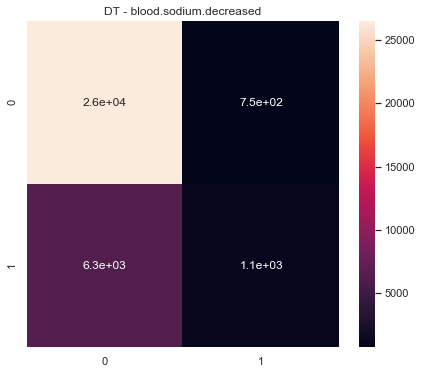

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  blood.sodium.decreased  300.0  0.489114      0.511260   
0   2.0  blood.sodium.decreased  300.0  0.487154      0.509870   
0   3.0  blood.sodium.decreased  300.0  0.462412      0.479281   
0   4.0  blood.sodium.decreased  300.0  0.464099      0.494997   
0   5.0  blood.sodium.decreased  300.0  0.492131      0.516351   

   Precision Macro  ROC Macro  
0         0.536969   0.541312  
0         0.532324   0.530907  
0         0.462228   0.512491  
0         0.482639   0.500121  
0         0.567338   0.545654  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  blood.sodium.decreased  300.0  2.394909    2.511759       2.581498   

    Avg ROC  
0  2.630485  
================================== RF ==================================


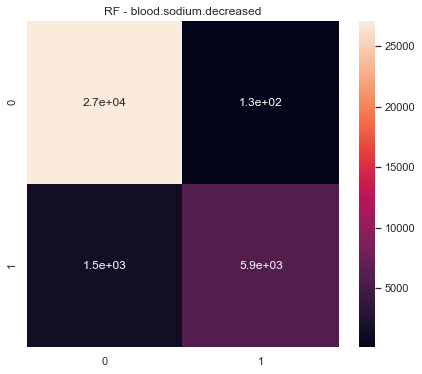

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  blood.sodium.decreased  300.0  0.440990      0.498569   
0   2.0  blood.sodium.decreased  300.0  0.441110      0.499882   
0   3.0  blood.sodium.decreased  300.0  0.425674      0.461348   
0   4.0  blood.sodium.decreased  300.0  0.439651      0.489467   
0   5.0  blood.sodium.decreased  300.0  0.443902      0.501153   

   Precision Macro  ROC Macro  
0         0.433609   0.584881  
0         0.477163   0.573490  
0         0.400387   0.515460  
0         0.420636   0.466863  
0         0.621300   0.574385  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  blood.sodium.decreased  300.0  2.191327    2.450419       2.353095   

    Avg ROC  
0  2.715079  
================================== SGD ==================================


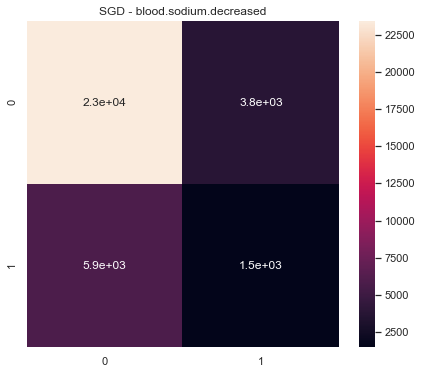

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  blood.sodium.decreased  300.0  0.516720      0.518848   
0   2.0  blood.sodium.decreased  300.0  0.495567      0.500411   
0   3.0  blood.sodium.decreased  300.0  0.477935      0.478308   
0   4.0  blood.sodium.decreased  300.0  0.442355      0.458496   
0   5.0  blood.sodium.decreased  300.0  0.511116      0.511038   

   Precision Macro  ROC Macro  
0         0.527062   0.485374  
0         0.500582   0.506290  
0         0.477653   0.460312  
0         0.434501   0.434742  
0         0.511938   0.514655  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  blood.sodium.decreased  300.0  2.443693    2.467102       2.451735   

    Avg ROC  
0  2.401373  
================================== LR ==================================


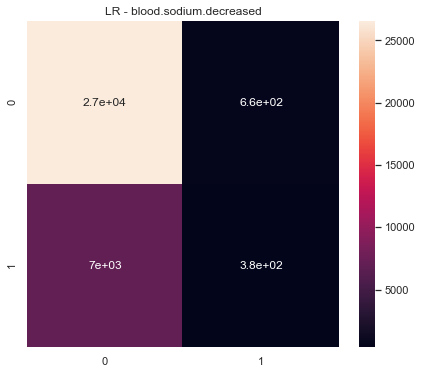

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  blood.sodium.decreased  300.0  0.490642      0.511284   
0   2.0  blood.sodium.decreased  300.0  0.473175      0.501652   
0   3.0  blood.sodium.decreased  300.0  0.506080      0.506266   
0   4.0  blood.sodium.decreased  300.0  0.442293      0.478099   
0   5.0  blood.sodium.decreased  300.0  0.510498      0.521377   

   Precision Macro  ROC Macro  
0         0.534603   0.539804  
0         0.505905   0.560301  
0         0.506056   0.538613  
0         0.431025   0.462896  
0         0.550046   0.544834  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  blood.sodium.decreased  300.0  2.422688    2.518678       2.527634   

    Avg ROC  
0  2.646448  
================================== blurred.vision ==================================
================================== NB ==================================


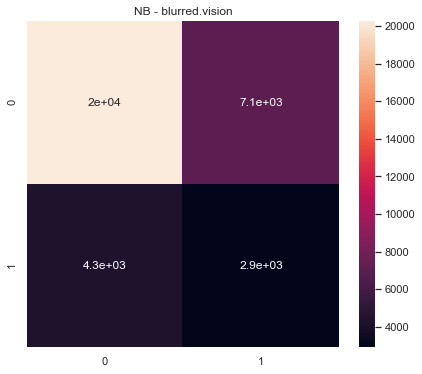

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blurred.vision  300.0  0.545676      0.545492         0.545870   
0   2.0  blurred.vision  300.0  0.531820      0.533595         0.531050   
0   3.0  blurred.vision  300.0  0.533810      0.548446         0.536961   
0   4.0  blurred.vision  300.0  0.520842      0.524092         0.520942   
0   5.0  blurred.vision  300.0  0.509216      0.509269         0.509176   

   ROC Macro  
0   0.585435  
0   0.550685  
0   0.578728  
0   0.537126  
0   0.535428  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blurred.vision  300.0  2.641364    2.660896       2.643998  2.787401
================================== DT ==================================


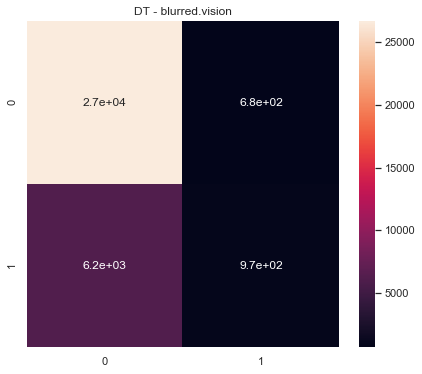

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blurred.vision  300.0  0.468488      0.502185         0.510535   
0   2.0  blurred.vision  300.0  0.479321      0.503835         0.512447   
0   3.0  blurred.vision  300.0  0.464041      0.487365         0.469414   
0   4.0  blurred.vision  300.0  0.464920      0.492774         0.477945   
0   5.0  blurred.vision  300.0  0.469439      0.496407         0.488739   

   ROC Macro  
0   0.529508  
0   0.504006  
0   0.481951  
0   0.464969  
0   0.497396  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blurred.vision  300.0  2.346208    2.482566        2.45908  2.477829
================================== RF ==================================


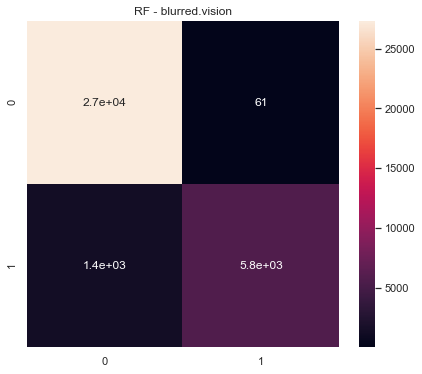

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blurred.vision  300.0  0.442286      0.498593         0.435643   
0   2.0  blurred.vision  300.0  0.442389      0.499891         0.479191   
0   3.0  blurred.vision  300.0  0.438648      0.486804         0.413305   
0   4.0  blurred.vision  300.0  0.441633      0.493311         0.424168   
0   5.0  blurred.vision  300.0  0.444996      0.500732         0.552231   

   ROC Macro  
0   0.557522  
0   0.575458  
0   0.543239  
0   0.501306  
0   0.573358  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blurred.vision  300.0  2.209952    2.479331       2.304538  2.750884
================================== SGD ==================================


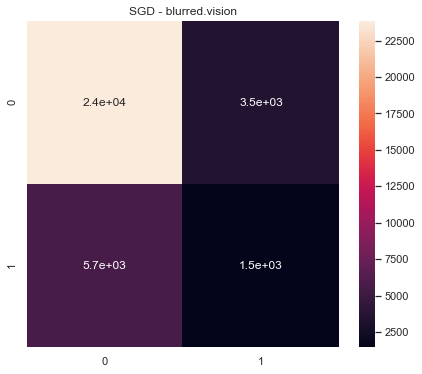

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blurred.vision  300.0  0.484861      0.486168         0.484617   
0   2.0  blurred.vision  300.0  0.471183      0.475228         0.469948   
0   3.0  blurred.vision  300.0  0.457701      0.476929         0.455424   
0   4.0  blurred.vision  300.0  0.499100      0.501028         0.501268   
0   5.0  blurred.vision  300.0  0.481403      0.482221         0.481008   

   ROC Macro  
0   0.464739  
0   0.487203  
0   0.425756  
0   0.475865  
0   0.459211  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blurred.vision  300.0  2.394248    2.421574       2.392266  2.312774
================================== LR ==================================


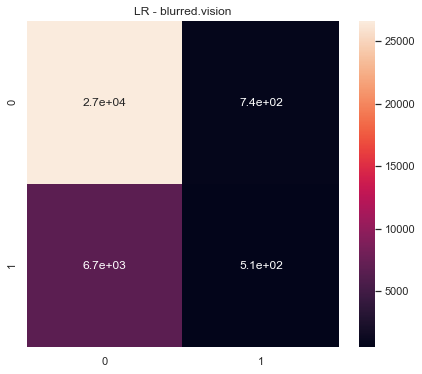

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  blurred.vision  300.0  0.484250      0.498049         0.496150   
0   2.0  blurred.vision  300.0  0.517687      0.524689         0.551418   
0   3.0  blurred.vision  300.0  0.470084      0.475883         0.468825   
0   4.0  blurred.vision  300.0  0.497040      0.507868         0.515458   
0   5.0  blurred.vision  300.0  0.491143      0.514033         0.552860   

   ROC Macro  
0   0.569205  
0   0.534534  
0   0.495320  
0   0.523098  
0   0.573925  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  blurred.vision  300.0  2.460204    2.520523       2.584711  2.696082
================================== body.temperature.increased ==================================
================================== NB ==================================


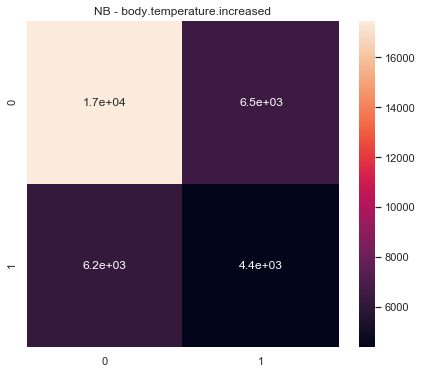

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  body.temperature.increased  300.0  0.558979      0.558156   
0   2.0  body.temperature.increased  300.0  0.521738      0.522830   
0   3.0  body.temperature.increased  300.0  0.540835      0.541041   
0   4.0  body.temperature.increased  300.0  0.517209      0.520689   
0   5.0  body.temperature.increased  300.0  0.532538      0.532152   

   Precision Macro  ROC Macro  
0         0.560323   0.588834  
0         0.521745   0.532029  
0         0.540664   0.559428  
0         0.518833   0.531587  
0         0.534200   0.542784  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  body.temperature.increased  300.0  2.671299    2.674868       2.675765   

    Avg ROC  
0  2.754663  
================================== DT ==================================


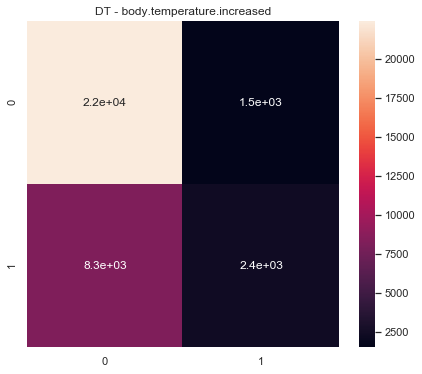

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  body.temperature.increased  300.0  0.503667      0.517045   
0   2.0  body.temperature.increased  300.0  0.476661      0.498439   
0   3.0  body.temperature.increased  300.0  0.478090      0.498413   
0   4.0  body.temperature.increased  300.0  0.423276      0.480013   
0   5.0  body.temperature.increased  300.0  0.468032      0.496113   

   Precision Macro  ROC Macro  
0         0.527979   0.530321  
0         0.497166   0.522100  
0         0.497209   0.508781  
0         0.429782   0.504917  
0         0.492010   0.509754  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  body.temperature.increased  300.0  2.349726    2.490024       2.444146   

    Avg ROC  
0  2.575874  
================================== RF ==================================


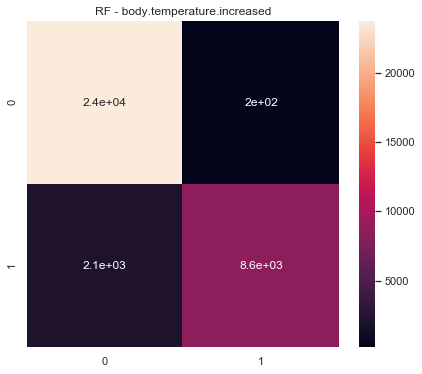

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  body.temperature.increased  300.0  0.438660      0.504365   
0   2.0  body.temperature.increased  300.0  0.436694      0.500342   
0   3.0  body.temperature.increased  300.0  0.430108      0.489106   
0   4.0  body.temperature.increased  300.0  0.425672      0.487329   
0   5.0  body.temperature.increased  300.0  0.425448      0.500738   

   Precision Macro  ROC Macro  
0         0.530846   0.586072  
0         0.502010   0.538522  
0         0.454674   0.529101  
0         0.444173   0.504402  
0         0.508140   0.544825  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  body.temperature.increased  300.0  2.156582     2.48188       2.439843   

    Avg ROC  
0  2.702922  
================================== SGD ==================================


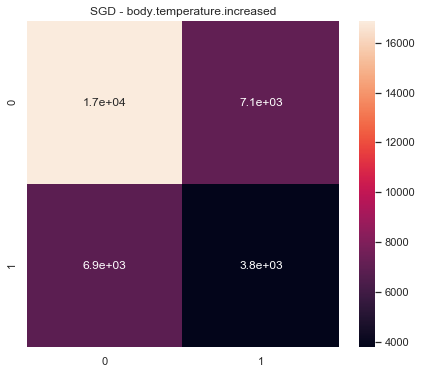

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  body.temperature.increased  300.0  0.532550      0.533621   
0   2.0  body.temperature.increased  300.0  0.504069      0.504248   
0   3.0  body.temperature.increased  300.0  0.533699      0.535713   
0   4.0  body.temperature.increased  300.0  0.500409      0.509665   
0   5.0  body.temperature.increased  300.0  0.501511      0.501527   

   Precision Macro  ROC Macro  
0         0.532265   0.552354  
0         0.504425   0.501190  
0         0.533590   0.544679  
0         0.508385   0.511407  
0         0.501516   0.506292  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  body.temperature.increased  300.0  2.572238    2.584774       2.580181   

    Avg ROC  
0  2.615922  
================================== LR ==================================


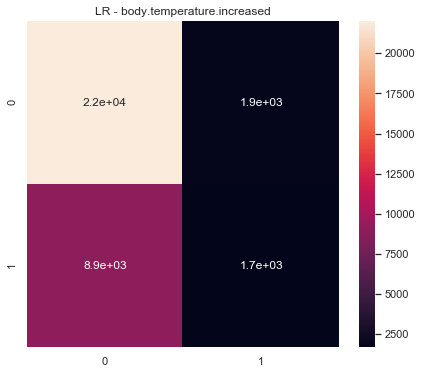

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  body.temperature.increased  300.0  0.547213      0.546500   
0   2.0  body.temperature.increased  300.0  0.519557      0.524390   
0   3.0  body.temperature.increased  300.0  0.518879      0.520107   
0   4.0  body.temperature.increased  300.0  0.477497      0.484333   
0   5.0  body.temperature.increased  300.0  0.509501      0.518505   

   Precision Macro  ROC Macro  
0         0.552653   0.559415  
0         0.532702   0.511271  
0         0.523247   0.523613  
0         0.480383   0.501225  
0         0.527316   0.541730  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  body.temperature.increased  300.0  2.572648    2.593835       2.616301   

    Avg ROC  
0  2.637254  
================================== bone.marrow.failure ==================================
================================== NB ==================================


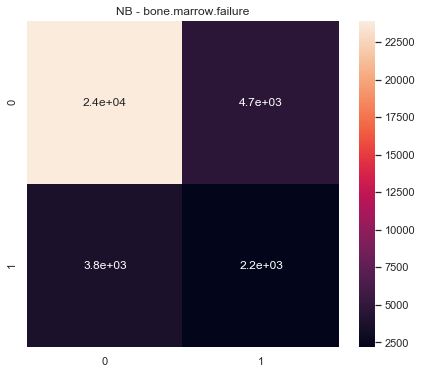

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bone.marrow.failure  300.0  0.558263      0.558798         0.557766   
0   2.0  bone.marrow.failure  300.0  0.575207      0.575998         0.574472   
0   3.0  bone.marrow.failure  300.0  0.553573      0.554982         0.552441   
0   4.0  bone.marrow.failure  300.0  0.544378      0.542444         0.547702   
0   5.0  bone.marrow.failure  300.0  0.545920      0.545694         0.546157   

   ROC Macro  
0   0.594380  
0   0.605827  
0   0.602581  
0   0.594297  
0   0.589929  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.marrow.failure  300.0  2.777341    2.777916       2.778539  2.987014
================================== DT ==================================


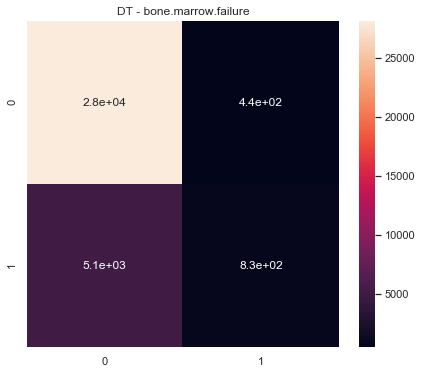

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bone.marrow.failure  300.0  0.513380      0.525524         0.612532   
0   2.0  bone.marrow.failure  300.0  0.511245      0.525713         0.642932   
0   3.0  bone.marrow.failure  300.0  0.516398      0.525637         0.588281   
0   4.0  bone.marrow.failure  300.0  0.503415      0.519887         0.597104   
0   5.0  bone.marrow.failure  300.0  0.507463      0.521250         0.588520   

   ROC Macro  
0   0.567879  
0   0.541366  
0   0.565155  
0   0.566431  
0   0.572560  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.marrow.failure  300.0  2.551901     2.61801       3.029371  2.813391
================================== RF ==================================


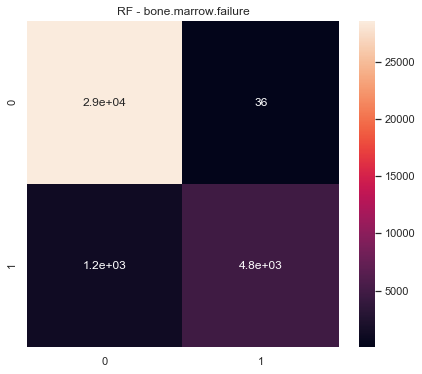

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bone.marrow.failure  300.0  0.466934      0.504232         0.567799   
0   2.0  bone.marrow.failure  300.0  0.459268      0.502312         0.614224   
0   3.0  bone.marrow.failure  300.0  0.474878      0.506103         0.552709   
0   4.0  bone.marrow.failure  300.0  0.462910      0.503364         0.590051   
0   5.0  bone.marrow.failure  300.0  0.469163      0.506837         0.678090   

   ROC Macro  
0   0.641185  
0   0.617162  
0   0.611572  
0   0.599471  
0   0.637136  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.marrow.failure  300.0  2.333153    2.522848       3.002873  3.106527
================================== SGD ==================================


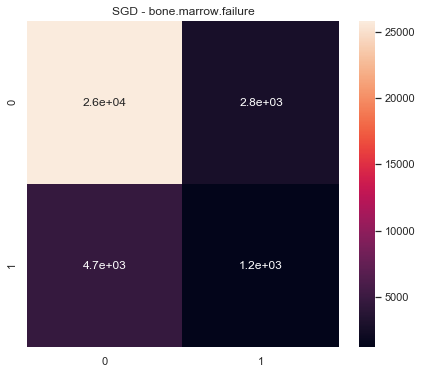

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bone.marrow.failure  300.0  0.479179      0.479619         0.478834   
0   2.0  bone.marrow.failure  300.0  0.485332      0.485623         0.485123   
0   3.0  bone.marrow.failure  300.0  0.489500      0.496619         0.494421   
0   4.0  bone.marrow.failure  300.0  0.499829      0.499838         0.499836   
0   5.0  bone.marrow.failure  300.0  0.554343      0.551853         0.558333   

   ROC Macro  
0   0.485469  
0   0.497059  
0   0.481591  
0   0.527774  
0   0.574081  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.marrow.failure  300.0  2.508184    2.513553       2.516546  2.565976
================================== LR ==================================


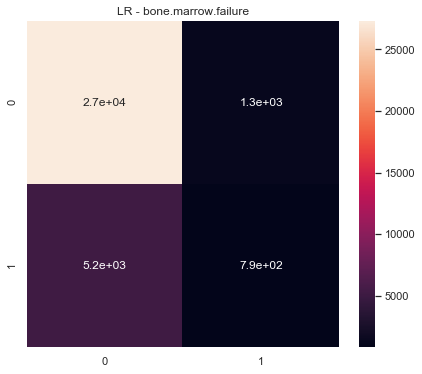

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bone.marrow.failure  300.0  0.527674      0.528312         0.527204   
0   2.0  bone.marrow.failure  300.0  0.558071      0.566578         0.555004   
0   3.0  bone.marrow.failure  300.0  0.518377      0.520216         0.518002   
0   4.0  bone.marrow.failure  300.0  0.525631      0.525107         0.526392   
0   5.0  bone.marrow.failure  300.0  0.526690      0.526646         0.542617   

   ROC Macro  
0   0.535954  
0   0.567776  
0   0.537028  
0   0.571726  
0   0.596528  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.marrow.failure  300.0  2.656443    2.666859       2.669219  2.809013
================================== bone.pain ==================================
================================== NB ==================================


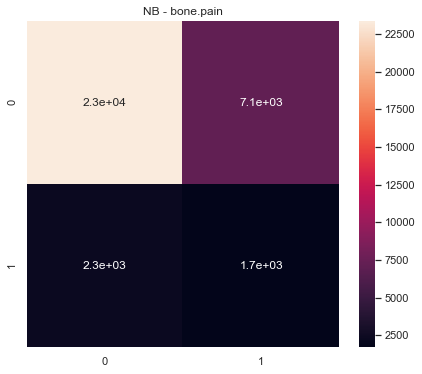

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bone.pain  300.0  0.522912      0.539063         0.524849   0.584138
0   2.0  bone.pain  300.0  0.518371      0.549594         0.527055   0.587384
0   3.0  bone.pain  300.0  0.501265      0.546870         0.522681   0.580109
0   4.0  bone.pain  300.0  0.516239      0.538525         0.522375   0.542505
0   5.0  bone.pain  300.0  0.512771      0.520996         0.514521   0.567127



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.pain  300.0  2.571557    2.695048       2.611482  2.861264
================================== DT ==================================


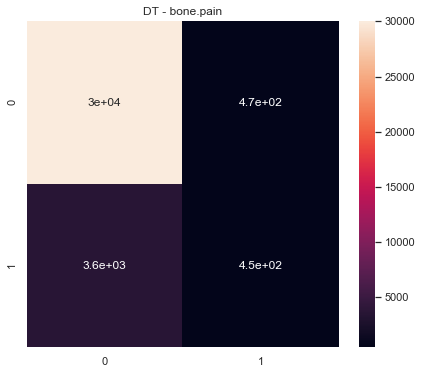

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bone.pain  300.0  0.490432      0.506877         0.547953   0.539354
0   2.0  bone.pain  300.0  0.490767      0.505962         0.532927   0.524974
0   3.0  bone.pain  300.0  0.446105      0.446844         0.445375   0.437620
0   4.0  bone.pain  300.0  0.483885      0.492299         0.484816   0.484398
0   5.0  bone.pain  300.0  0.479304      0.499756         0.498445   0.481902



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.pain  300.0  2.390494    2.451738       2.509516  2.468248
================================== RF ==================================


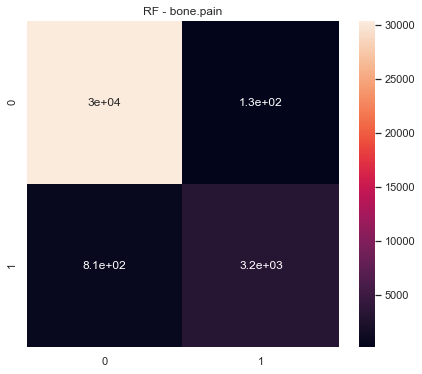

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bone.pain  300.0  0.474895      0.502517         0.650056   0.597020
0   2.0  bone.pain  300.0  0.472246      0.499518         0.491339   0.549174
0   3.0  bone.pain  300.0  0.454864      0.467759         0.443562   0.470108
0   4.0  bone.pain  300.0  0.466247      0.487677         0.453031   0.427487
0   5.0  bone.pain  300.0  0.471357      0.501072         0.691564   0.541419



         ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.pain  300.0  2.33961    2.458542       2.729552  2.585208
================================== SGD ==================================


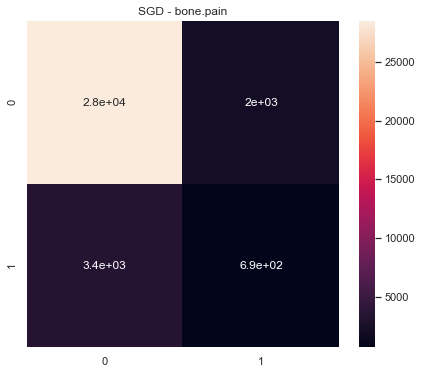

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bone.pain  300.0  0.478531      0.483134         0.476436   0.472365
0   2.0  bone.pain  300.0  0.482054      0.481821         0.482311   0.433825
0   3.0  bone.pain  300.0  0.473239      0.473661         0.472843   0.437367
0   4.0  bone.pain  300.0  0.474844      0.473504         0.476796   0.414394
0   5.0  bone.pain  300.0  0.473759      0.475001         0.472715   0.501905



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.pain  300.0  2.382428    2.387121       2.381102  2.259856
================================== LR ==================================


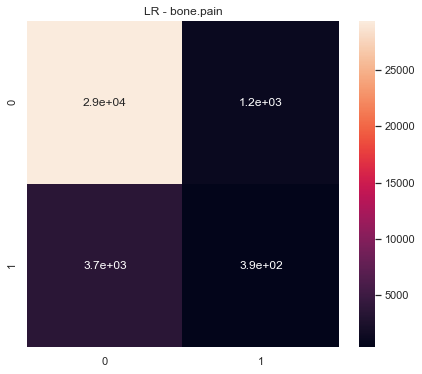

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bone.pain  300.0  0.539264      0.540492         0.538259   0.580415
0   2.0  bone.pain  300.0  0.491749      0.494409         0.492269   0.441684
0   3.0  bone.pain  300.0  0.515202      0.539692         0.522532   0.550214
0   4.0  bone.pain  300.0  0.455010      0.460950         0.479623   0.420391
0   5.0  bone.pain  300.0  0.490884      0.491182         0.492910   0.496603



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bone.pain  300.0  2.492109    2.526726       2.525593  2.489307
================================== bradycardia ==================================
================================== NB ==================================


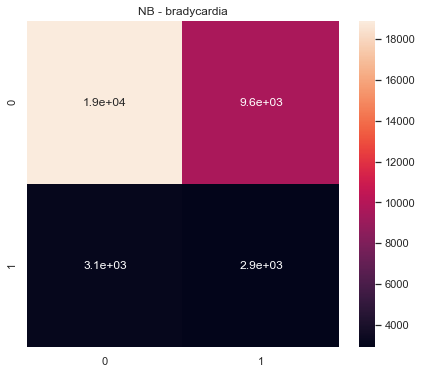

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bradycardia  300.0  0.524700      0.549907         0.533160   
0   2.0  bradycardia  300.0  0.502419      0.529805         0.518924   
0   3.0  bradycardia  300.0  0.481028      0.513125         0.507978   
0   4.0  bradycardia  300.0  0.487560      0.520109         0.512302   
0   5.0  bradycardia  300.0  0.516489      0.530714         0.521769   

   ROC Macro  
0   0.574369  
0   0.550002  
0   0.518146  
0   0.539809  
0   0.560576  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bradycardia  300.0  2.512196     2.64366       2.594131  2.742903
================================== DT ==================================


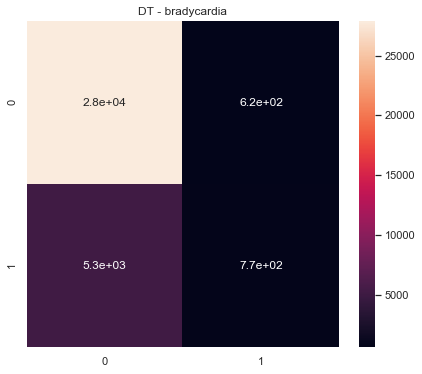

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bradycardia  300.0  0.473493      0.500811         0.503819   
0   2.0  bradycardia  300.0  0.466663      0.487909         0.468398   
0   3.0  bradycardia  300.0  0.463744      0.480973         0.460826   
0   4.0  bradycardia  300.0  0.485234      0.502088         0.505796   
0   5.0  bradycardia  300.0  0.477401      0.503864         0.519217   

   ROC Macro  
0   0.533455  
0   0.508094  
0   0.511433  
0   0.536880  
0   0.536636  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bradycardia  300.0  2.366535    2.475643       2.458056  2.626499
================================== RF ==================================


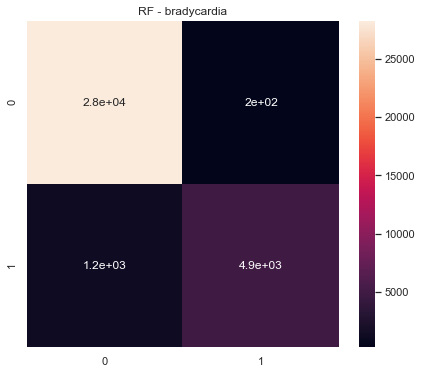

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bradycardia  300.0  0.448568      0.493157         0.411373   
0   2.0  bradycardia  300.0  0.452221      0.480306         0.440804   
0   3.0  bradycardia  300.0  0.433500      0.459400         0.412086   
0   4.0  bradycardia  300.0  0.451701      0.492559         0.436416   
0   5.0  bradycardia  300.0  0.452744      0.500237         0.579062   

   ROC Macro  
0   0.526481  
0   0.505853  
0   0.461961  
0   0.444162  
0   0.523425  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bradycardia  300.0  2.238733     2.42566       2.279741  2.461882
================================== SGD ==================================


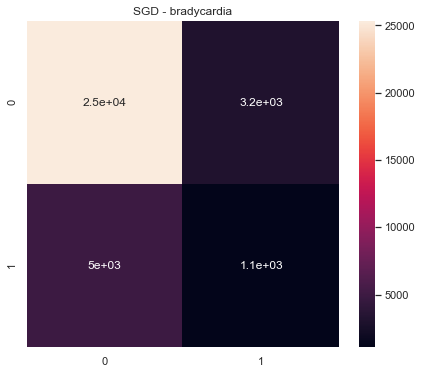

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bradycardia  300.0  0.473061      0.482465         0.472230   
0   2.0  bradycardia  300.0  0.467846      0.469929         0.466429   
0   3.0  bradycardia  300.0  0.438307      0.453666         0.426901   
0   4.0  bradycardia  300.0  0.482236      0.486457         0.482149   
0   5.0  bradycardia  300.0  0.490657      0.492267         0.493719   

   ROC Macro  
0   0.482120  
0   0.476176  
0   0.419897  
0   0.486426  
0   0.497098  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bradycardia  300.0  2.352105    2.384784       2.341427  2.361716
================================== LR ==================================


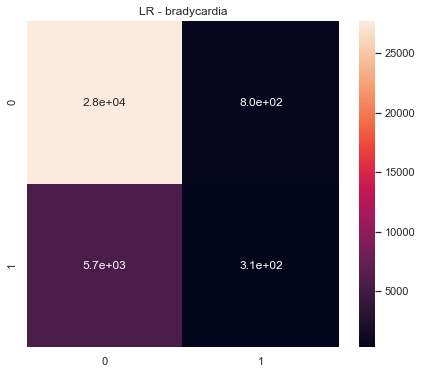

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  bradycardia  300.0  0.513860      0.514865         0.520719   
0   2.0  bradycardia  300.0  0.492549      0.497514         0.496299   
0   3.0  bradycardia  300.0  0.471197      0.470534         0.476209   
0   4.0  bradycardia  300.0  0.468306      0.492669         0.476204   
0   5.0  bradycardia  300.0  0.485169      0.492266         0.487875   

   ROC Macro  
0   0.559164  
0   0.485334  
0   0.450341  
0   0.465119  
0   0.509133  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  bradycardia  300.0  2.431081    2.467849       2.457308  2.46909
================================== bronchitis ==================================
================================== NB ==================================


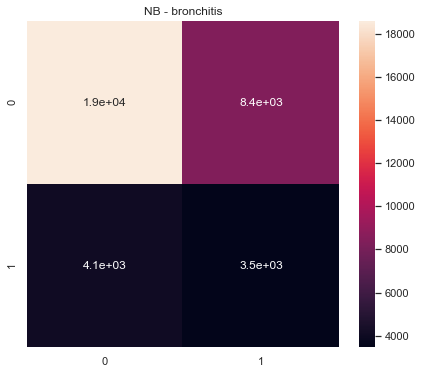

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bronchitis  300.0  0.542002      0.544215         0.540917   0.597843
0   2.0  bronchitis  300.0  0.526192      0.537730         0.529611   0.563191
0   3.0  bronchitis  300.0  0.510896      0.536490         0.526073   0.561538
0   4.0  bronchitis  300.0  0.532113      0.548123         0.536757   0.560812
0   5.0  bronchitis  300.0  0.512451      0.514675         0.512968   0.556965



          ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  bronchitis  300.0  2.623654    2.681233       2.646327  2.84035
================================== DT ==================================


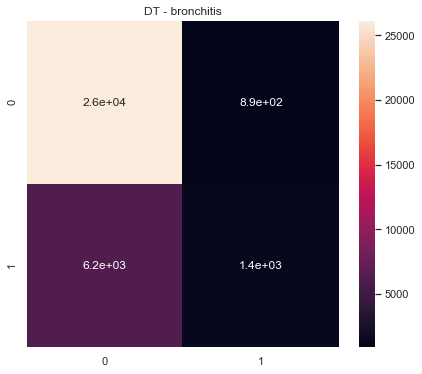

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bronchitis  300.0  0.503841      0.520948         0.562804   0.576471
0   2.0  bronchitis  300.0  0.478006      0.505610         0.519881   0.554861
0   3.0  bronchitis  300.0  0.483921      0.497430         0.495177   0.545443
0   4.0  bronchitis  300.0  0.481986      0.501051         0.502484   0.508199
0   5.0  bronchitis  300.0  0.507547      0.524925         0.582724   0.581610



          ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bronchitis  300.0  2.4553    2.549965        2.66307  2.766584
================================== RF ==================================


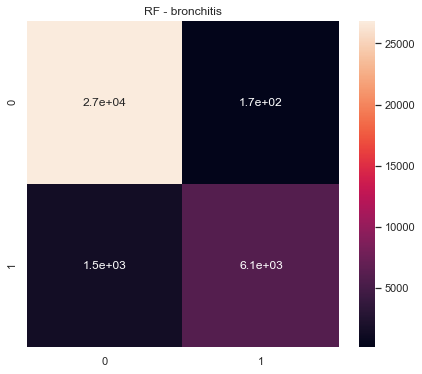

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bronchitis  300.0  0.441073      0.500584         0.557505   0.591082
0   2.0  bronchitis  300.0  0.451179      0.502927         0.550591   0.583202
0   3.0  bronchitis  300.0  0.465199      0.478786         0.465309   0.551454
0   4.0  bronchitis  300.0  0.439896      0.492844         0.430071   0.519973
0   5.0  bronchitis  300.0  0.441563      0.500544         0.537874   0.604909



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bronchitis  300.0  2.238911    2.475686        2.54135  2.850621
================================== SGD ==================================


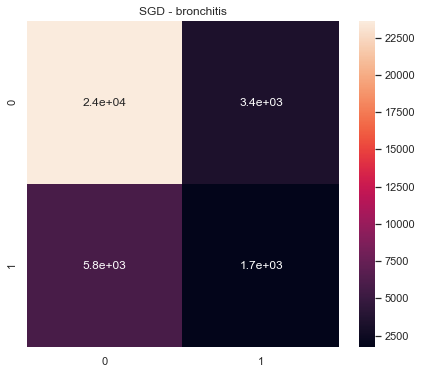

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bronchitis  300.0  0.479233      0.485453         0.480288   0.472722
0   2.0  bronchitis  300.0  0.499832      0.510836         0.521286   0.500620
0   3.0  bronchitis  300.0  0.464710      0.469349         0.462943   0.441238
0   4.0  bronchitis  300.0  0.472765      0.487373         0.477439   0.513615
0   5.0  bronchitis  300.0  0.480522      0.484100         0.480562   0.499380



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bronchitis  300.0  2.397062     2.43711       2.422518  2.427575
================================== LR ==================================


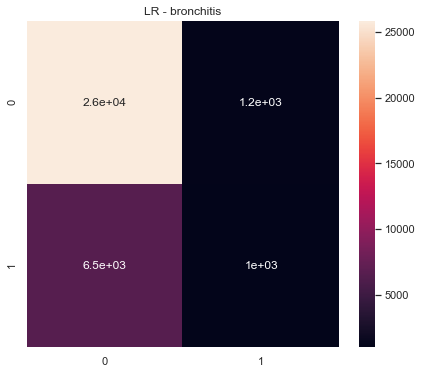

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bronchitis  300.0  0.529473      0.530882         0.547921   0.587378
0   2.0  bronchitis  300.0  0.515947      0.525338         0.556568   0.560268
0   3.0  bronchitis  300.0  0.497821      0.500318         0.500270   0.513726
0   4.0  bronchitis  300.0  0.502666      0.509121         0.514609   0.541698
0   5.0  bronchitis  300.0  0.495749      0.515157         0.545138   0.538845



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bronchitis  300.0  2.541656    2.580817       2.664505  2.741915
================================== bruise ==================================
================================== NB ==================================


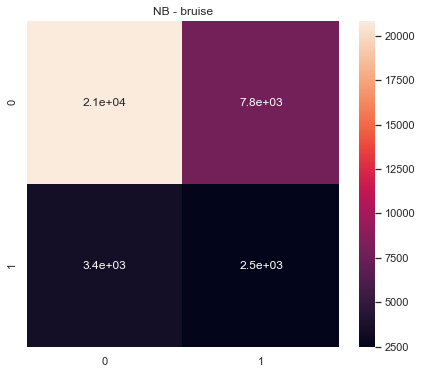

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruise  300.0  0.548201      0.559859         0.546399   0.599514
0   2.0  bruise  300.0  0.508241      0.525139         0.516936   0.554988
0   3.0  bruise  300.0  0.496118      0.525719         0.515806   0.534841
0   4.0  bruise  300.0  0.512214      0.528064         0.519242   0.543409
0   5.0  bruise  300.0  0.516393      0.521992         0.517443   0.556865



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruise  300.0  2.581166    2.660772       2.615827  2.789617
================================== DT ==================================


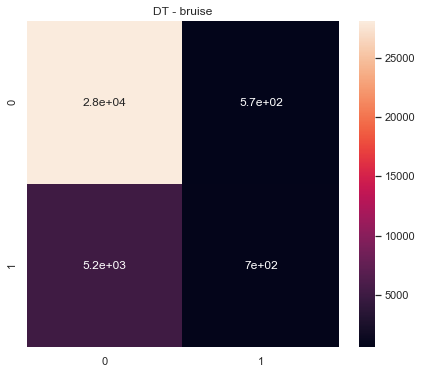

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruise  300.0  0.490544      0.509828         0.540400   0.529424
0   2.0  bruise  300.0  0.462851      0.482563         0.459327   0.526463
0   3.0  bruise  300.0  0.441896      0.467181         0.423449   0.479152
0   4.0  bruise  300.0  0.489111      0.502654         0.506537   0.501247
0   5.0  bruise  300.0  0.473674      0.500223         0.501045   0.503799



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruise  300.0  2.358076     2.46245       2.430759  2.540085
================================== RF ==================================


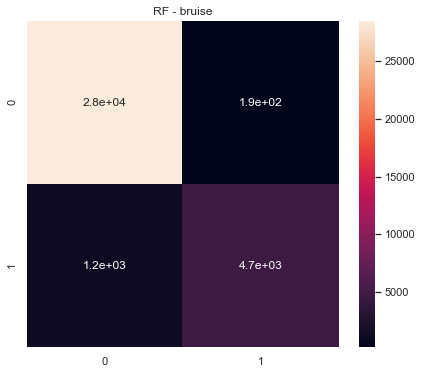

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruise  300.0  0.454249      0.500077         0.514989   0.580435
0   2.0  bruise  300.0  0.439018      0.468844         0.414329   0.518174
0   3.0  bruise  300.0  0.432240      0.457880         0.409604   0.480277
0   4.0  bruise  300.0  0.456387      0.497047         0.461151   0.459085
0   5.0  bruise  300.0  0.454374      0.500338         0.665014   0.548486



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruise  300.0  2.236268    2.424186       2.465087  2.586457
================================== SGD ==================================


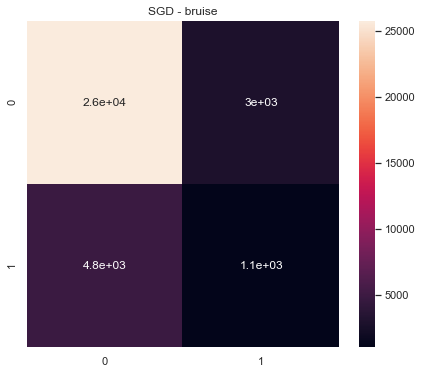

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruise  300.0  0.487455      0.488580         0.487180   0.458134
0   2.0  bruise  300.0  0.486283      0.486026         0.486773   0.444781
0   3.0  bruise  300.0  0.438893      0.439664         0.438145   0.397404
0   4.0  bruise  300.0  0.480382      0.483594         0.479643   0.447645
0   5.0  bruise  300.0  0.490489      0.492194         0.490693   0.477195



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruise  300.0  2.383502    2.390057       2.382434  2.225159
================================== LR ==================================


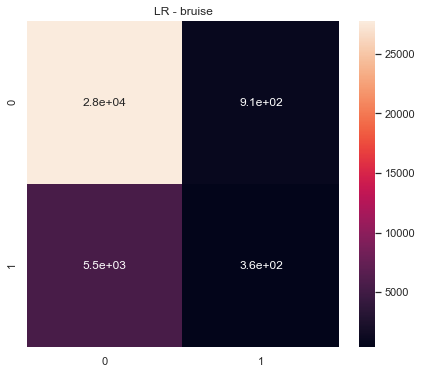

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruise  300.0  0.507881      0.508038         0.509289   0.532107
0   2.0  bruise  300.0  0.463016      0.469495         0.459602   0.459841
0   3.0  bruise  300.0  0.454093      0.452355         0.456260   0.468656
0   4.0  bruise  300.0  0.476974      0.481369         0.475854   0.425101
0   5.0  bruise  300.0  0.488470      0.499634         0.499236   0.507408



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruise  300.0  2.390434    2.410891       2.400241  2.393112
================================== bruxism ==================================
================================== NB ==================================


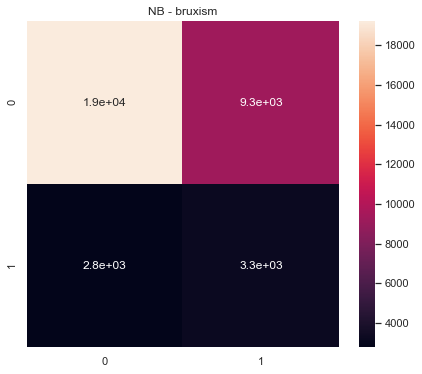

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruxism  300.0  0.552878      0.570478         0.551960   0.634412
0   2.0  bruxism  300.0  0.548424      0.582442         0.554265   0.622227
0   3.0  bruxism  300.0  0.511662      0.578186         0.545846   0.615332
0   4.0  bruxism  300.0  0.534956      0.572285         0.546090   0.592627
0   5.0  bruxism  300.0  0.490605      0.497355         0.498085   0.547643



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruxism  300.0  2.638525    2.800745       2.696247  3.012241
================================== DT ==================================


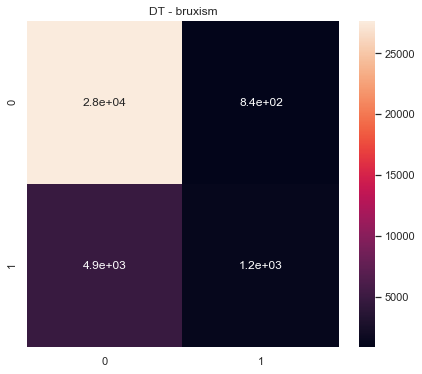

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruxism  300.0  0.482282      0.506581         0.531411   0.563684
0   2.0  bruxism  300.0  0.481526      0.505151         0.522388   0.540221
0   3.0  bruxism  300.0  0.468826      0.485091         0.468924   0.578674
0   4.0  bruxism  300.0  0.493423      0.497282         0.496191   0.498982
0   5.0  bruxism  300.0  0.500543      0.514569         0.546949   0.534123



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruxism  300.0  2.426599    2.508674       2.565864  2.715684
================================== RF ==================================


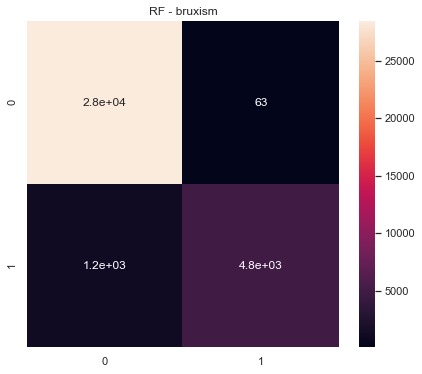

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruxism  300.0  0.451587      0.499210         0.412259   0.636216
0   2.0  bruxism  300.0  0.457688      0.502364         0.681946   0.652977
0   3.0  bruxism  300.0  0.440514      0.476374         0.410635   0.603859
0   4.0  bruxism  300.0  0.450759      0.497543         0.412017   0.562773
0   5.0  bruxism  300.0  0.452015      0.500000         0.412433   0.653072



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruxism  300.0  2.252563    2.475491       2.329291  3.108897
================================== SGD ==================================


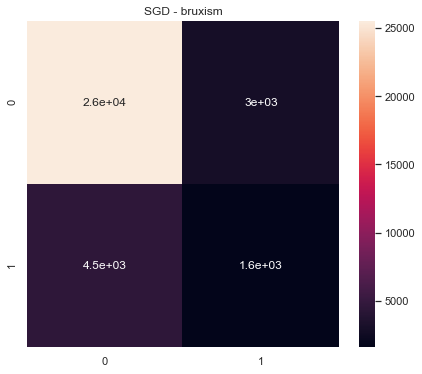

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruxism  300.0  0.475728      0.476427         0.475197   0.429344
0   2.0  bruxism  300.0  0.519330      0.519990         0.529348   0.504776
0   3.0  bruxism  300.0  0.469517      0.479838         0.467661   0.417475
0   4.0  bruxism  300.0  0.490854      0.490821         0.490892   0.470301
0   5.0  bruxism  300.0  0.495519      0.497912         0.497301   0.472030



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruxism  300.0  2.450949    2.464988         2.4604  2.293926
================================== LR ==================================


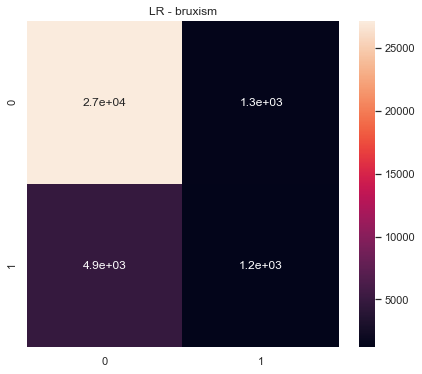

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bruxism  300.0  0.552165      0.549878         0.555858   0.596435
0   2.0  bruxism  300.0  0.563178      0.559534         0.569580   0.618801
0   3.0  bruxism  300.0  0.550183      0.554374         0.548061   0.621513
0   4.0  bruxism  300.0  0.515195      0.515718         0.514936   0.523150
0   5.0  bruxism  300.0  0.539889      0.538726         0.578310   0.625827



       ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bruxism  300.0  2.72061    2.718231       2.766746  2.985726
================================== bulging ==================================
================================== NB ==================================


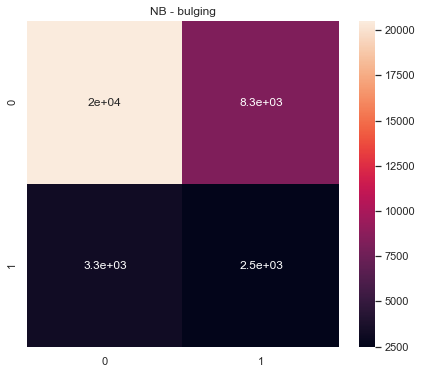

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bulging  300.0  0.534137      0.546812         0.534656   0.591170
0   2.0  bulging  300.0  0.532752      0.551791         0.535865   0.594351
0   3.0  bulging  300.0  0.484474      0.525331         0.514684   0.540948
0   4.0  bulging  300.0  0.506299      0.521210         0.514364   0.538883
0   5.0  bulging  300.0  0.507922      0.514534         0.510971   0.544565



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bulging  300.0  2.565585    2.659678        2.61054  2.809918
================================== DT ==================================


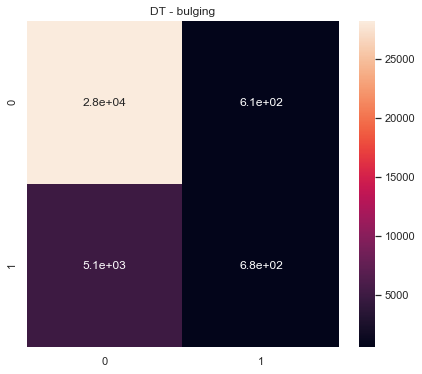

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bulging  300.0  0.482910      0.503337         0.512418   0.531712
0   2.0  bulging  300.0  0.485538      0.502390         0.507106   0.530721
0   3.0  bulging  300.0  0.438763      0.457636         0.423989   0.438096
0   4.0  bulging  300.0  0.475493      0.490468         0.479125   0.465477
0   5.0  bulging  300.0  0.479342      0.502721         0.511879   0.484160



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bulging  300.0  2.362046    2.456552       2.434518  2.450165
================================== RF ==================================


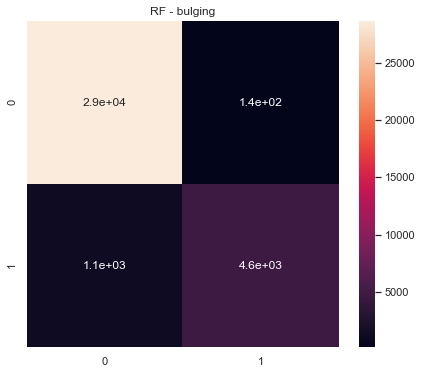

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bulging  300.0  0.456336      0.500696         0.666884   0.587001
0   2.0  bulging  300.0  0.454574      0.499913         0.416775   0.586168
0   3.0  bulging  300.0  0.431284      0.450861         0.414226   0.487143
0   4.0  bulging  300.0  0.449183      0.489234         0.415193   0.440908
0   5.0  bulging  300.0  0.454438      0.499653         0.416727   0.539254



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bulging  300.0  2.245815    2.440357       2.329805  2.640474
================================== SGD ==================================


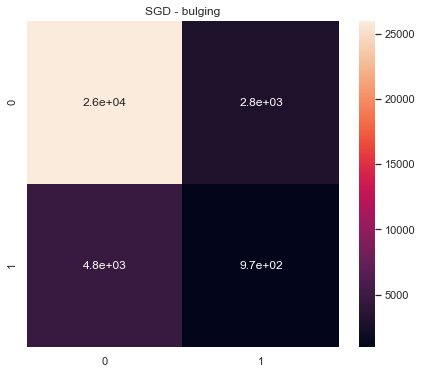

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bulging  300.0  0.499484      0.499530         0.499515   0.447625
0   2.0  bulging  300.0  0.491480      0.500589         0.501145   0.468408
0   3.0  bulging  300.0  0.439099      0.439421         0.438781   0.376688
0   4.0  bulging  300.0  0.474725      0.477634         0.473342   0.452634
0   5.0  bulging  300.0  0.459769      0.466970         0.455576   0.453240



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bulging  300.0  2.364557    2.384144        2.36836  2.198596
================================== LR ==================================


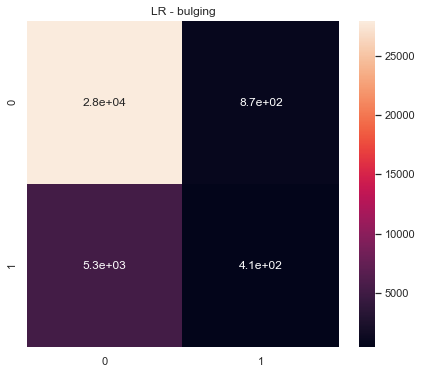

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bulging  300.0  0.537717      0.536027         0.540890   0.569435
0   2.0  bulging  300.0  0.475042      0.504710         0.536500   0.536478
0   3.0  bulging  300.0  0.454276      0.453238         0.455434   0.493759
0   4.0  bulging  300.0  0.511665      0.514493         0.512147   0.481610
0   5.0  bulging  300.0  0.483656      0.489909         0.484835   0.477085



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bulging  300.0  2.462355    2.498377       2.529806  2.558368
================================== burning.sensation ==================================
================================== NB ==================================


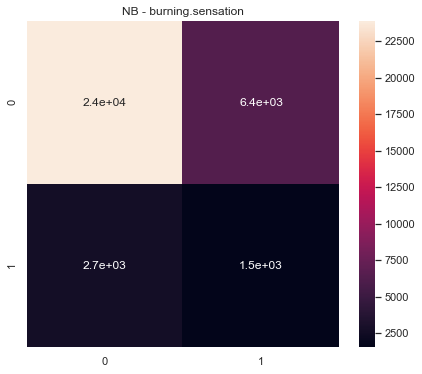

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  burning.sensation  300.0  0.529971      0.545138         0.530211   
0   2.0  burning.sensation  300.0  0.524186      0.534824         0.524429   
0   3.0  burning.sensation  300.0  0.494869      0.526872         0.513954   
0   4.0  burning.sensation  300.0  0.531948      0.542452         0.530714   
0   5.0  burning.sensation  300.0  0.523403      0.528419         0.522501   

   ROC Macro  
0   0.591226  
0   0.567679  
0   0.557745  
0   0.569697  
0   0.580128  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  burning.sensation  300.0  2.604379    2.677704       2.621808  2.866474
================================== DT ==================================


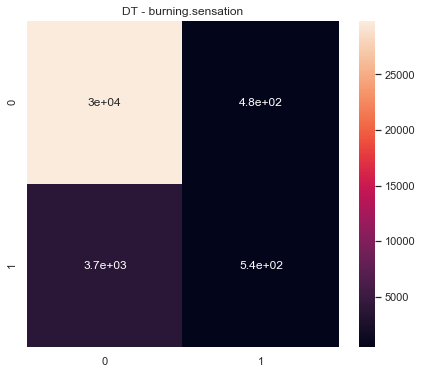

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  burning.sensation  300.0  0.486410      0.503530         0.517923   
0   2.0  burning.sensation  300.0  0.481994      0.496604         0.489471   
0   3.0  burning.sensation  300.0  0.452124      0.463301         0.442460   
0   4.0  burning.sensation  300.0  0.477859      0.497376         0.488065   
0   5.0  burning.sensation  300.0  0.491592      0.503020         0.509258   

   ROC Macro  
0   0.509937  
0   0.530353  
0   0.441290  
0   0.494661  
0   0.492030  



                 ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  burning.sensation  300.0  2.38998    2.463832       2.447177  2.468271
================================== RF ==================================


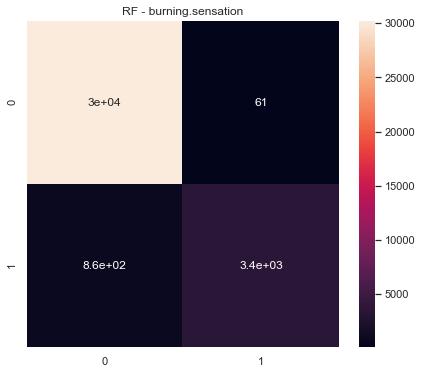

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  burning.sensation  300.0  0.469257      0.500920         0.638161   
0   2.0  burning.sensation  300.0  0.466985      0.500000         0.438061   
0   3.0  burning.sensation  300.0  0.455347      0.475972         0.437007   
0   4.0  burning.sensation  300.0  0.466862      0.499752         0.438034   
0   5.0  burning.sensation  300.0  0.466939      0.499917         0.438043   

   ROC Macro  
0   0.551728  
0   0.572596  
0   0.511935  
0   0.521832  
0   0.584973  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  burning.sensation  300.0  2.325391    2.476562       2.389306  2.743065
================================== SGD ==================================


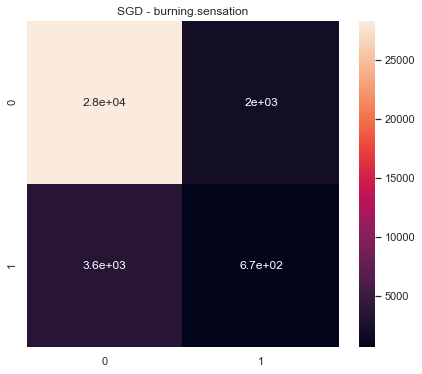

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  burning.sensation  300.0  0.481732      0.484012         0.480595   
0   2.0  burning.sensation  300.0  0.491205      0.495150         0.492630   
0   3.0  burning.sensation  300.0  0.460436      0.461033         0.459859   
0   4.0  burning.sensation  300.0  0.485461      0.494128         0.488146   
0   5.0  burning.sensation  300.0  0.502519      0.502571         0.502799   

   ROC Macro  
0   0.447306  
0   0.450067  
0   0.448767  
0   0.455664  
0   0.486223  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  burning.sensation  300.0  2.421351    2.436894        2.42403  2.288028
================================== LR ==================================


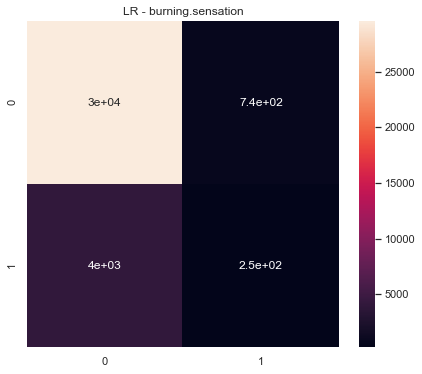

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  burning.sensation  300.0  0.501970      0.501979         0.501964   
0   2.0  burning.sensation  300.0  0.502007      0.510676         0.535414   
0   3.0  burning.sensation  300.0  0.510240      0.511143         0.510014   
0   4.0  burning.sensation  300.0  0.514558      0.514068         0.515633   
0   5.0  burning.sensation  300.0  0.514885      0.517451         0.514539   

   ROC Macro  
0   0.536855  
0   0.490313  
0   0.536161  
0   0.494186  
0   0.554503  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  burning.sensation  300.0  2.543661    2.555317       2.577564  2.612017
================================== bursitis ==================================
================================== NB ==================================


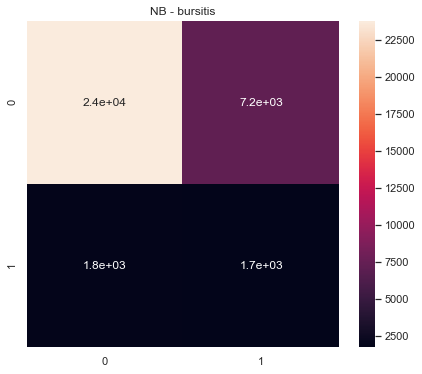

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bursitis  300.0  0.537133      0.550089         0.534580   0.645706
0   2.0  bursitis  300.0  0.529924      0.559924         0.532956   0.589145
0   3.0  bursitis  300.0  0.506010      0.569855         0.530157   0.622680
0   4.0  bursitis  300.0  0.532085      0.566591         0.535656   0.612019
0   5.0  bursitis  300.0  0.527075      0.547492         0.528349   0.605124



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bursitis  300.0  2.632226    2.793951       2.661698  3.074675
================================== DT ==================================


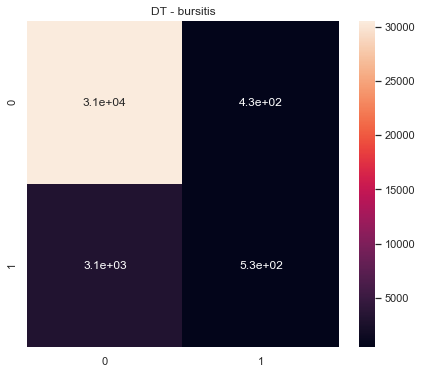

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bursitis  300.0  0.514757      0.519328         0.616681   0.611436
0   2.0  bursitis  300.0  0.503215      0.510508         0.540907   0.603270
0   3.0  bursitis  300.0  0.496613      0.499757         0.499602   0.551865
0   4.0  bursitis  300.0  0.512544      0.513957         0.530384   0.549992
0   5.0  bursitis  300.0  0.511931      0.516202         0.564183   0.580577



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bursitis  300.0  2.539061    2.559751       2.751758  2.897139
================================== RF ==================================


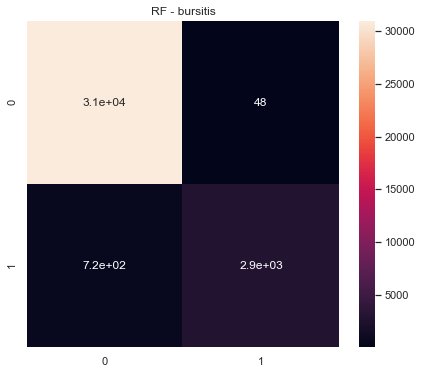

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bursitis  300.0  0.472680      0.500000         0.448191   0.636129
0   2.0  bursitis  300.0  0.472680      0.500000         0.448191   0.665441
0   3.0  bursitis  300.0  0.462759      0.480465         0.446311   0.610085
0   4.0  bursitis  300.0  0.472559      0.499839         0.448104   0.553158
0   5.0  bursitis  300.0  0.472676      0.500000         0.448184   0.650795



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bursitis  300.0  2.353354    2.480303        2.23898  3.115609
================================== SGD ==================================


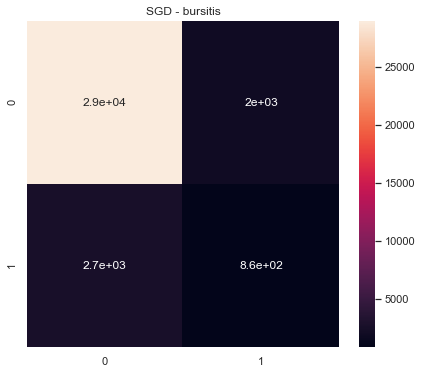

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bursitis  300.0  0.463199      0.464911         0.461597   0.433307
0   2.0  bursitis  300.0  0.511042      0.510644         0.513211   0.488991
0   3.0  bursitis  300.0  0.469618      0.467706         0.472025   0.440799
0   4.0  bursitis  300.0  0.473319      0.476303         0.471021   0.439469
0   5.0  bursitis  300.0  0.469621      0.477183         0.464228   0.451135



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  bursitis  300.0  2.386798    2.396747       2.382081   2.2537
================================== LR ==================================


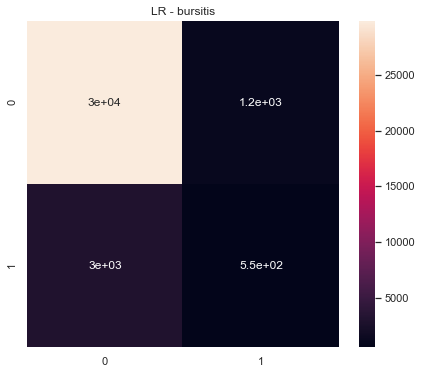

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  bursitis  300.0  0.563353      0.595622         0.557639   0.646239
0   2.0  bursitis  300.0  0.523293      0.521578         0.540583   0.548256
0   3.0  bursitis  300.0  0.508368      0.536748         0.518864   0.543401
0   4.0  bursitis  300.0  0.532406      0.556680         0.533160   0.515513
0   5.0  bursitis  300.0  0.537378      0.542771         0.534806   0.568043



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  bursitis  300.0  2.664798    2.753399       2.685053  2.821451
================================== candidiasis.of.mouth ==================================
================================== NB ==================================


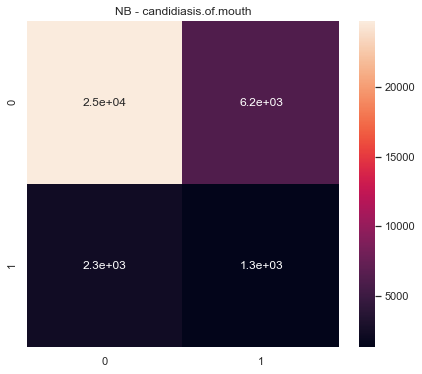

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  candidiasis.of.mouth  300.0  0.537176      0.553798         0.535167   
0   2.0  candidiasis.of.mouth  300.0  0.504526      0.536751         0.518185   
0   3.0  candidiasis.of.mouth  300.0  0.494504      0.534605         0.515892   
0   4.0  candidiasis.of.mouth  300.0  0.511312      0.519971         0.513273   
0   5.0  candidiasis.of.mouth  300.0  0.528311      0.537133         0.526787   

   ROC Macro  
0   0.595314  
0   0.578657  
0   0.550311  
0   0.518017  
0   0.580816  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  candidiasis.of.mouth  300.0  2.57583    2.682258       2.609304  2.823115
================================== DT ==================================


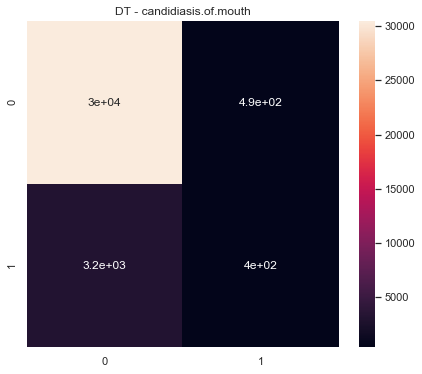

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  candidiasis.of.mouth  300.0  0.499726      0.506856         0.520746   
0   2.0  candidiasis.of.mouth  300.0  0.487655      0.487555         0.487763   
0   3.0  candidiasis.of.mouth  300.0  0.464378      0.470430         0.459353   
0   4.0  candidiasis.of.mouth  300.0  0.498497      0.505611         0.515954   
0   5.0  candidiasis.of.mouth  300.0  0.481533      0.500045         0.500313   

   ROC Macro  
0   0.548822  
0   0.533021  
0   0.499246  
0   0.519403  
0   0.515811  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  candidiasis.of.mouth  300.0  2.431788    2.470497       2.484129  2.616303
================================== RF ==================================


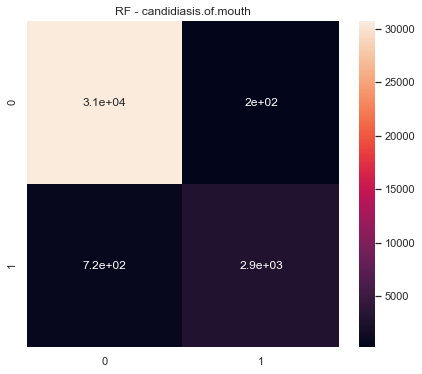

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  candidiasis.of.mouth  300.0  0.471995      0.499192         0.447609   
0   2.0  candidiasis.of.mouth  300.0  0.470822      0.477061         0.466429   
0   3.0  candidiasis.of.mouth  300.0  0.451114      0.458175         0.444314   
0   4.0  candidiasis.of.mouth  300.0  0.473225      0.499640         0.483293   
0   5.0  candidiasis.of.mouth  300.0  0.472394      0.500000         0.447677   

   ROC Macro  
0   0.604067  
0   0.560482  
0   0.489719  
0   0.450217  
0   0.552503  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  candidiasis.of.mouth  300.0  2.33955    2.434068       2.289322  2.656987
================================== SGD ==================================


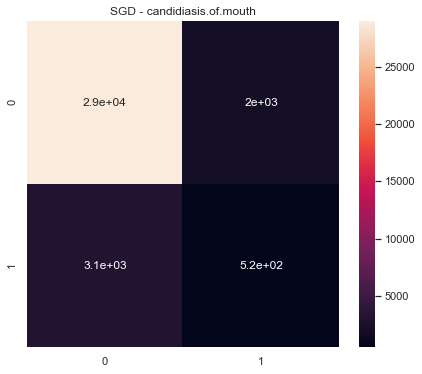

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  candidiasis.of.mouth  300.0  0.473380      0.476658         0.470921   
0   2.0  candidiasis.of.mouth  300.0  0.488213      0.488972         0.487758   
0   3.0  candidiasis.of.mouth  300.0  0.455925      0.456616         0.455245   
0   4.0  candidiasis.of.mouth  300.0  0.434064      0.423036         0.446998   
0   5.0  candidiasis.of.mouth  300.0  0.488359      0.488776         0.488055   

   ROC Macro  
0   0.440566  
0   0.476269  
0   0.448584  
0   0.381777  
0   0.485696  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  candidiasis.of.mouth  300.0  2.339941    2.334058       2.348977  2.232892
================================== LR ==================================


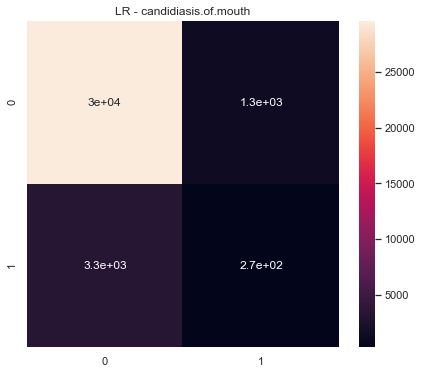

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  candidiasis.of.mouth  300.0  0.526281      0.543390         0.526949   
0   2.0  candidiasis.of.mouth  300.0  0.499709      0.500130         0.500113   
0   3.0  candidiasis.of.mouth  300.0  0.485390      0.510186         0.504923   
0   4.0  candidiasis.of.mouth  300.0  0.448022      0.449764         0.475583   
0   5.0  candidiasis.of.mouth  300.0  0.500331      0.513846         0.507966   

   ROC Macro  
0   0.542335  
0   0.532615  
0   0.506372  
0   0.389893  
0   0.514243  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  candidiasis.of.mouth  300.0  2.459732    2.517315       2.515534  2.485457
================================== cardiac.disease ==================================
================================== NB ==================================


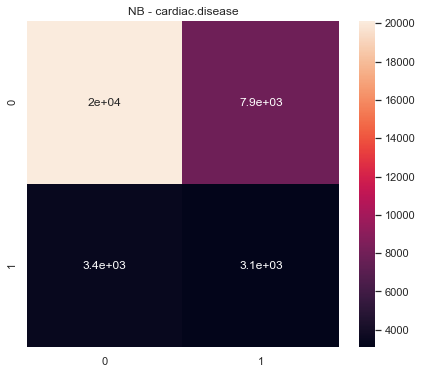

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.disease  300.0  0.544679      0.551707         0.543099   
0   2.0  cardiac.disease  300.0  0.502132      0.503832         0.503294   
0   3.0  cardiac.disease  300.0  0.501880      0.524980         0.516699   
0   4.0  cardiac.disease  300.0  0.568577      0.582613         0.565385   
0   5.0  cardiac.disease  300.0  0.521095      0.524765         0.521082   

   ROC Macro  
0   0.593896  
0   0.526244  
0   0.545461  
0   0.630575  
0   0.564270  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.disease  300.0  2.638364    2.687896       2.649558  2.860446
================================== DT ==================================


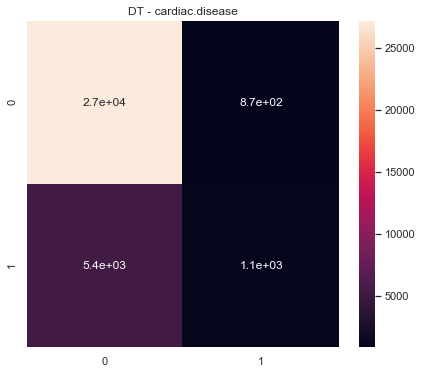

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.disease  300.0  0.492079      0.506208         0.515104   
0   2.0  cardiac.disease  300.0  0.453295      0.471222         0.446475   
0   3.0  cardiac.disease  300.0  0.443908      0.452322         0.438095   
0   4.0  cardiac.disease  300.0  0.470500      0.494764         0.483818   
0   5.0  cardiac.disease  300.0  0.484321      0.510255         0.552253   

   ROC Macro  
0   0.481191  
0   0.458881  
0   0.440509  
0   0.527224  
0   0.551308  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.disease  300.0  2.344103    2.434771       2.435746  2.459113
================================== RF ==================================


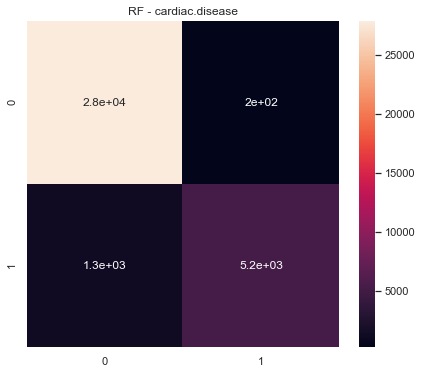

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.disease  300.0  0.449483      0.499457         0.473815   
0   2.0  cardiac.disease  300.0  0.438187      0.472180         0.414921   
0   3.0  cardiac.disease  300.0  0.423638      0.452916         0.397916   
0   4.0  cardiac.disease  300.0  0.451438      0.495812         0.455066   
0   5.0  cardiac.disease  300.0  0.447678      0.499376         0.405680   

   ROC Macro  
0   0.499053  
0   0.450921  
0   0.502762  
0   0.568828  
0   0.601705  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.disease  300.0  2.210424    2.419741       2.147397  2.623268
================================== SGD ==================================


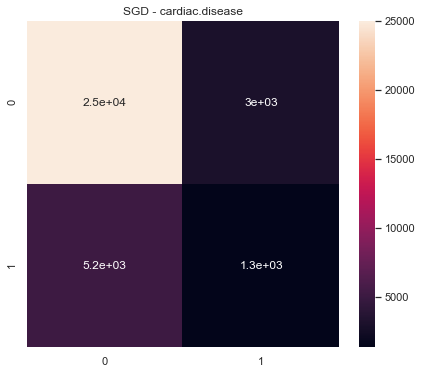

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.disease  300.0  0.477418      0.489416         0.480971   
0   2.0  cardiac.disease  300.0  0.478262      0.481637         0.477523   
0   3.0  cardiac.disease  300.0  0.437243      0.452527         0.426723   
0   4.0  cardiac.disease  300.0  0.454332      0.479528         0.448229   
0   5.0  cardiac.disease  300.0  0.467501      0.477558         0.465615   

   ROC Macro  
0   0.454113  
0   0.496520  
0   0.399261  
0   0.430758  
0   0.486860  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.disease  300.0  2.314756    2.380667        2.29906  2.267511
================================== LR ==================================


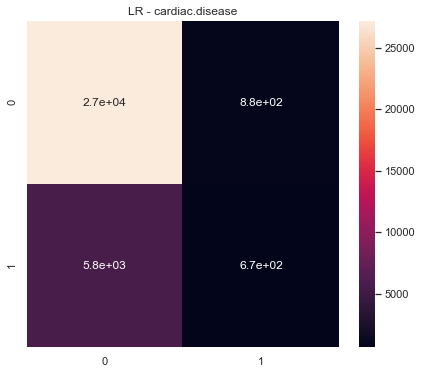

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.disease  300.0  0.492587      0.505060         0.511204   
0   2.0  cardiac.disease  300.0  0.503108      0.503415         0.503796   
0   3.0  cardiac.disease  300.0  0.471568      0.474484         0.470190   
0   4.0  cardiac.disease  300.0  0.495623      0.504655         0.508771   
0   5.0  cardiac.disease  300.0  0.526736      0.531647         0.578354   

   ROC Macro  
0   0.505666  
0   0.480988  
0   0.501354  
0   0.517626  
0   0.557355  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.disease  300.0  2.489622    2.519261       2.572315  2.562989
================================== cardiac.enlargement ==================================
================================== NB ==================================


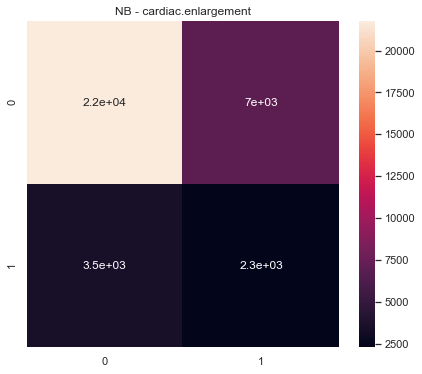

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.enlargement  300.0  0.563508      0.577100         0.559984   
0   2.0  cardiac.enlargement  300.0  0.530516      0.539324         0.530503   
0   3.0  cardiac.enlargement  300.0  0.527564      0.547318         0.532356   
0   4.0  cardiac.enlargement  300.0  0.524806      0.533777         0.525771   
0   5.0  cardiac.enlargement  300.0  0.544397      0.550214         0.542358   

   ROC Macro  
0   0.602217  
0   0.565964  
0   0.567809  
0   0.555977  
0   0.588482  



                   ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.enlargement  300.0  2.69079    2.747733       2.690972  2.880449
================================== DT ==================================


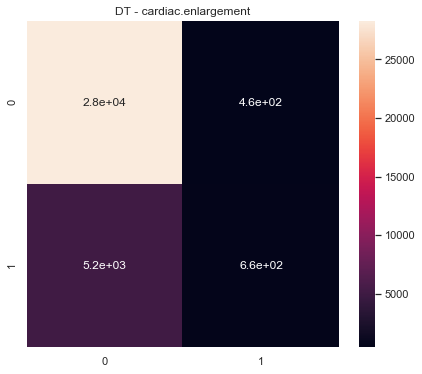

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.enlargement  300.0  0.490576      0.511328         0.555951   
0   2.0  cardiac.enlargement  300.0  0.490348      0.511949         0.564963   
0   3.0  cardiac.enlargement  300.0  0.475053      0.498618         0.494746   
0   4.0  cardiac.enlargement  300.0  0.491408      0.508309         0.528405   
0   5.0  cardiac.enlargement  300.0  0.489893      0.510037         0.545018   

   ROC Macro  
0   0.524422  
0   0.527701  
0   0.542833  
0   0.529665  
0   0.539430  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.enlargement  300.0  2.437278     2.54024       2.689083  2.664052
================================== RF ==================================


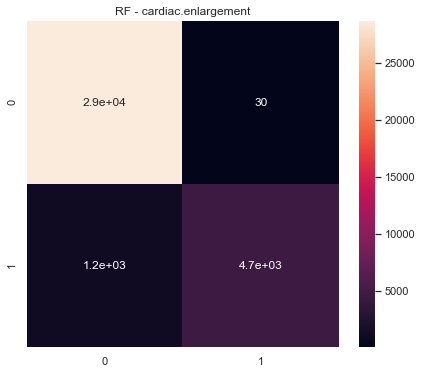

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.enlargement  300.0  0.457121      0.500933         0.569679   
0   2.0  cardiac.enlargement  300.0  0.453841      0.499739         0.415665   
0   3.0  cardiac.enlargement  300.0  0.450758      0.492335         0.419932   
0   4.0  cardiac.enlargement  300.0  0.453968      0.497377         0.439141   
0   5.0  cardiac.enlargement  300.0  0.454637      0.499907         0.487178   

   ROC Macro  
0   0.591789  
0   0.582472  
0   0.587058  
0   0.556755  
0   0.598746  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  cardiac.enlargement  300.0  2.270327    2.490292       2.331595  2.91682
================================== SGD ==================================


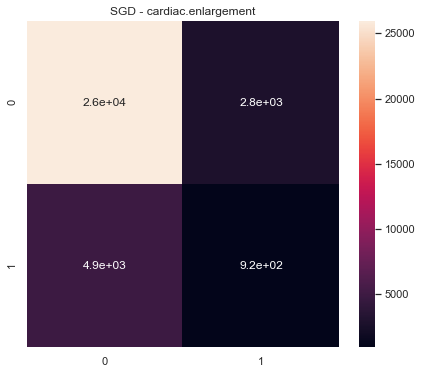

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.enlargement  300.0  0.489505      0.495798         0.493335   
0   2.0  cardiac.enlargement  300.0  0.489119      0.497518         0.495558   
0   3.0  cardiac.enlargement  300.0  0.476217      0.481375         0.475011   
0   4.0  cardiac.enlargement  300.0  0.465786      0.479816         0.462618   
0   5.0  cardiac.enlargement  300.0  0.492268      0.494341         0.492976   

   ROC Macro  
0   0.477606  
0   0.493061  
0   0.446101  
0   0.431901  
0   0.519205  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.enlargement  300.0  2.412895    2.448848       2.419499  2.367874
================================== LR ==================================


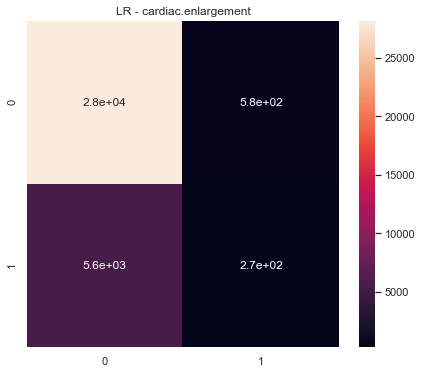

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.enlargement  300.0  0.531389      0.529854         0.541883   
0   2.0  cardiac.enlargement  300.0  0.486522      0.509716         0.553971   
0   3.0  cardiac.enlargement  300.0  0.501530      0.504130         0.505801   
0   4.0  cardiac.enlargement  300.0  0.511045      0.512774         0.518792   
0   5.0  cardiac.enlargement  300.0  0.513924      0.515990         0.525546   

   ROC Macro  
0   0.556655  
0   0.538359  
0   0.520123  
0   0.520364  
0   0.527570  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.enlargement  300.0  2.544411    2.572463       2.645992  2.663072
================================== cardiac.failure ==================================
================================== NB ==================================


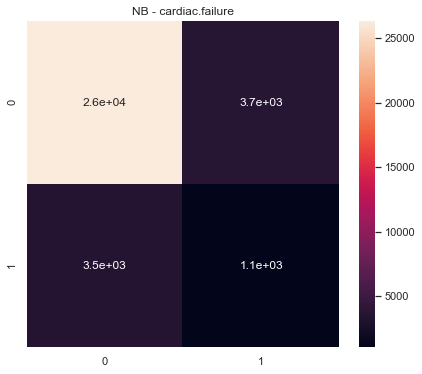

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.failure  300.0  0.512506      0.512172         0.513223   
0   2.0  cardiac.failure  300.0  0.527511      0.526366         0.529423   
0   3.0  cardiac.failure  300.0  0.490069      0.489847         0.490532   
0   4.0  cardiac.failure  300.0  0.526239      0.524494         0.533873   
0   5.0  cardiac.failure  300.0  0.509836      0.511835         0.509933   

   ROC Macro  
0   0.520944  
0   0.550917  
0   0.548029  
0   0.530387  
0   0.556234  



               ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.failure  300.0  2.56616    2.564713       2.576984  2.706511
================================== DT ==================================


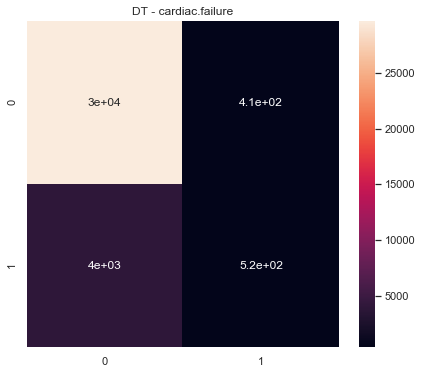

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.failure  300.0  0.483817      0.503234         0.517866   
0   2.0  cardiac.failure  300.0  0.481298      0.503708         0.529219   
0   3.0  cardiac.failure  300.0  0.480229      0.494298         0.484709   
0   4.0  cardiac.failure  300.0  0.501811      0.512124         0.545894   
0   5.0  cardiac.failure  300.0  0.477009      0.488632         0.476175   

   ROC Macro  
0   0.496220  
0   0.520479  
0   0.566004  
0   0.557761  
0   0.518453  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.failure  300.0  2.424164    2.501996       2.553863  2.658916
================================== RF ==================================


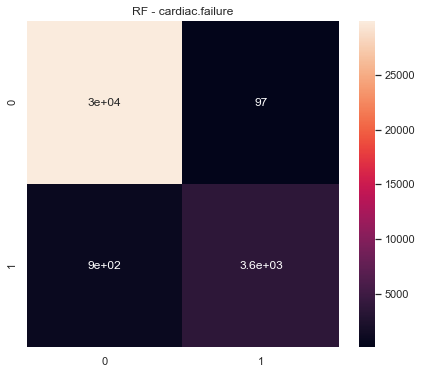

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.failure  300.0  0.467153      0.500693         0.577668   
0   2.0  cardiac.failure  300.0  0.465087      0.500000         0.434732   
0   3.0  cardiac.failure  300.0  0.454645      0.478251         0.434023   
0   4.0  cardiac.failure  300.0  0.465506      0.499222         0.463983   
0   5.0  cardiac.failure  300.0  0.457611      0.483907         0.435329   

   ROC Macro  
0   0.583277  
0   0.558668  
0   0.570276  
0   0.545505  
0   0.538803  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.failure  300.0  2.310002    2.462072       2.345735  2.796528
================================== SGD ==================================


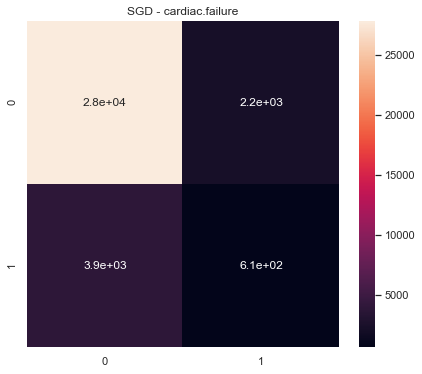

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.failure  300.0  0.473418      0.477726         0.470974   
0   2.0  cardiac.failure  300.0  0.492441      0.497111         0.495330   
0   3.0  cardiac.failure  300.0  0.473941      0.479782         0.471190   
0   4.0  cardiac.failure  300.0  0.493381      0.493349         0.493417   
0   5.0  cardiac.failure  300.0  0.480470      0.481616         0.479684   

   ROC Macro  
0   0.458635  
0   0.496142  
0   0.486674  
0   0.488350  
0   0.473284  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.failure  300.0  2.413651    2.429584       2.410595  2.403085
================================== LR ==================================


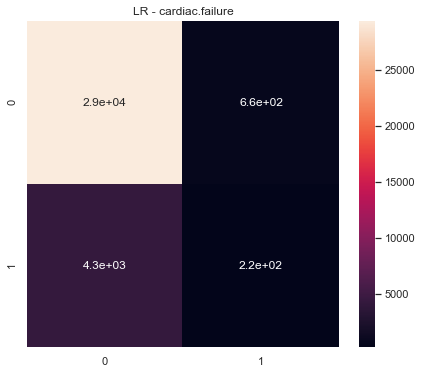

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.failure  300.0  0.514414      0.514347         0.520262   
0   2.0  cardiac.failure  300.0  0.500891      0.507600         0.517794   
0   3.0  cardiac.failure  300.0  0.532191      0.531435         0.533139   
0   4.0  cardiac.failure  300.0  0.522845      0.523582         0.522317   
0   5.0  cardiac.failure  300.0  0.483073      0.483971         0.482476   

   ROC Macro  
0   0.540415  
0   0.536777  
0   0.595178  
0   0.541457  
0   0.503709  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.failure  300.0  2.553413    2.560936       2.575988  2.717537
================================== cardiac.murmur ==================================
================================== NB ==================================


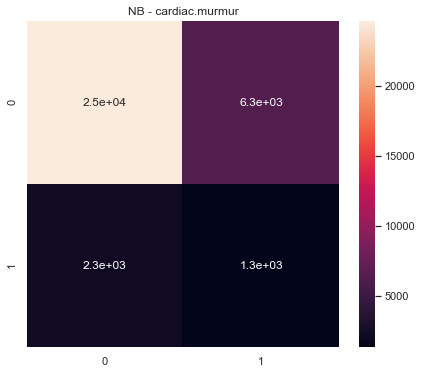

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.murmur  300.0  0.534461      0.549785         0.532847   
0   2.0  cardiac.murmur  300.0  0.533402      0.551146         0.532493   
0   3.0  cardiac.murmur  300.0  0.497168      0.524945         0.512410   
0   4.0  cardiac.murmur  300.0  0.522261      0.531959         0.522033   
0   5.0  cardiac.murmur  300.0  0.521719      0.530658         0.521416   

   ROC Macro  
0   0.588976  
0   0.590307  
0   0.571781  
0   0.579623  
0   0.577315  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.murmur  300.0  2.609011    2.688492       2.621199  2.908001
================================== DT ==================================


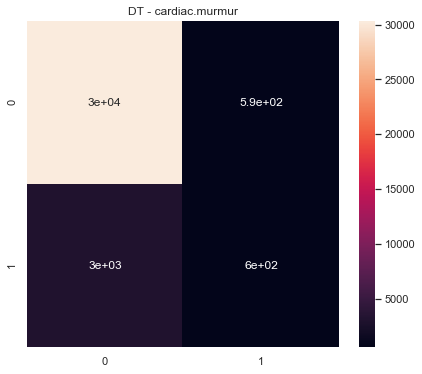

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.murmur  300.0  0.493832      0.502094         0.505688   
0   2.0  cardiac.murmur  300.0  0.509206      0.512544         0.532450   
0   3.0  cardiac.murmur  300.0  0.469073      0.470257         0.467987   
0   4.0  cardiac.murmur  300.0  0.486461      0.491894         0.486388   
0   5.0  cardiac.murmur  300.0  0.487777      0.503912         0.527476   

   ROC Macro  
0   0.552247  
0   0.531527  
0   0.471082  
0   0.470291  
0   0.452610  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.murmur  300.0  2.446349    2.480701        2.51999  2.477758
================================== RF ==================================


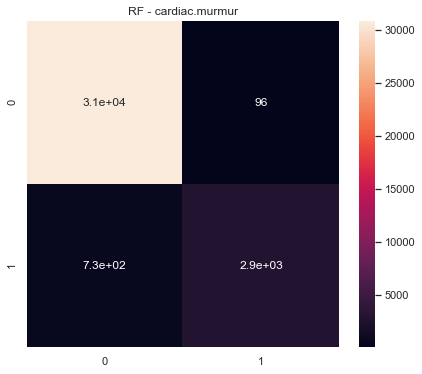

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.murmur  300.0  0.472076      0.499838         0.447235   
0   2.0  cardiac.murmur  300.0  0.473562      0.500686         0.947315   
0   3.0  cardiac.murmur  300.0  0.452413      0.461818         0.443383   
0   4.0  cardiac.murmur  300.0  0.474612      0.500725         0.547319   
0   5.0  cardiac.murmur  300.0  0.472112      0.499838         0.447300   

   ROC Macro  
0   0.594203  
0   0.565108  
0   0.508229  
0   0.486423  
0   0.579400  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.murmur  300.0  2.344775    2.462905       2.832552  2.733364
================================== SGD ==================================


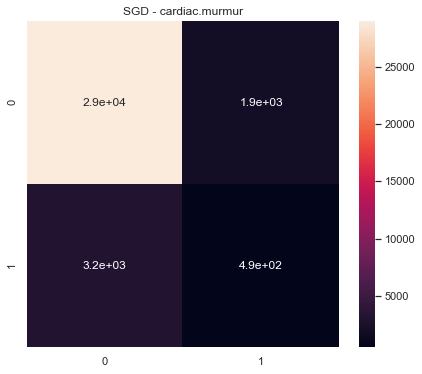

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.murmur  300.0  0.470099      0.472568         0.468025   
0   2.0  cardiac.murmur  300.0  0.525630      0.523364         0.535482   
0   3.0  cardiac.murmur  300.0  0.454928      0.448909         0.464371   
0   4.0  cardiac.murmur  300.0  0.504693      0.504635         0.504798   
0   5.0  cardiac.murmur  300.0  0.467818      0.474100         0.463017   

   ROC Macro  
0   0.428675  
0   0.527890  
0   0.389294  
0   0.480756  
0   0.465787  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.murmur  300.0  2.423168    2.423576       2.435693  2.292402
================================== LR ==================================


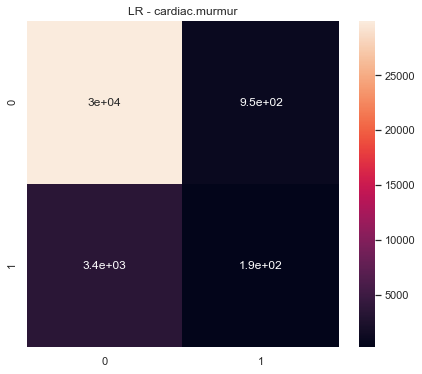

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cardiac.murmur  300.0  0.527962      0.529675         0.526833   
0   2.0  cardiac.murmur  300.0  0.500852      0.506083         0.514516   
0   3.0  cardiac.murmur  300.0  0.471597      0.477281         0.487684   
0   4.0  cardiac.murmur  300.0  0.487908      0.488510         0.491599   
0   5.0  cardiac.murmur  300.0  0.506128      0.521300         0.512381   

   ROC Macro  
0   0.526626  
0   0.550387  
0   0.461898  
0   0.488051  
0   0.508843  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cardiac.murmur  300.0  2.494447    2.522848       2.533012  2.535805
================================== cardiovascular.collapse ==================================
================================== NB ==================================


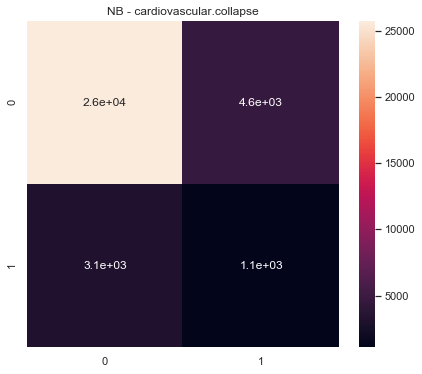

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  cardiovascular.collapse  300.0  0.506604      0.508646   
0   2.0  cardiovascular.collapse  300.0  0.508344      0.512810   
0   3.0  cardiovascular.collapse  300.0  0.488221      0.490020   
0   4.0  cardiovascular.collapse  300.0  0.502380      0.504180   
0   5.0  cardiovascular.collapse  300.0  0.508298      0.510882   

   Precision Macro  ROC Macro  
0         0.507062   0.516546  
0         0.509593   0.541120  
0         0.492823   0.508298  
0         0.503366   0.495638  
0         0.508743   0.519806  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  cardiovascular.collapse  300.0  2.513847    2.526539       2.521587   

    Avg ROC  
0  2.581409  
================================== DT ==================================


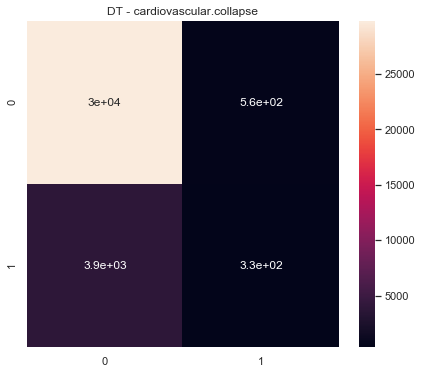

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  cardiovascular.collapse  300.0  0.469283      0.480702   
0   2.0  cardiovascular.collapse  300.0  0.462910      0.467910   
0   3.0  cardiovascular.collapse  300.0  0.447634      0.460473   
0   4.0  cardiovascular.collapse  300.0  0.485823      0.490174   
0   5.0  cardiovascular.collapse  300.0  0.493539      0.508013   

   Precision Macro  ROC Macro  
0         0.463458   0.480081  
0         0.458953   0.450438  
0         0.435624   0.456601  
0         0.485551   0.496384  
0         0.542849   0.522399  



                       ADR    PCA   Avg F1  Avg Recall  Avg Precision  \
0  cardiovascular.collapse  300.0  2.35919    2.407271       2.386435   

    Avg ROC  
0  2.405903  
================================== RF ==================================


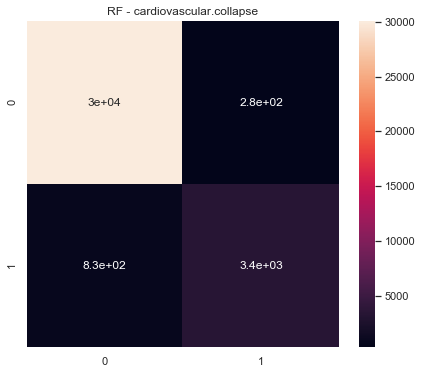

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  cardiovascular.collapse  300.0  0.460092      0.483788   
0   2.0  cardiovascular.collapse  300.0  0.458987      0.466661   
0   3.0  cardiovascular.collapse  300.0  0.450829      0.463739   
0   4.0  cardiovascular.collapse  300.0  0.476576      0.495411   
0   5.0  cardiovascular.collapse  300.0  0.467555      0.499918   

   Precision Macro  ROC Macro  
0         0.439799   0.490829  
0         0.452837   0.469704  
0         0.439214   0.455690  
0         0.481350   0.461088  
0         0.439129   0.519064  



                       ADR    PCA   Avg F1  Avg Recall  Avg Precision  \
0  cardiovascular.collapse  300.0  2.31404    2.409516       2.252328   

    Avg ROC  
0  2.396374  
================================== SGD ==================================


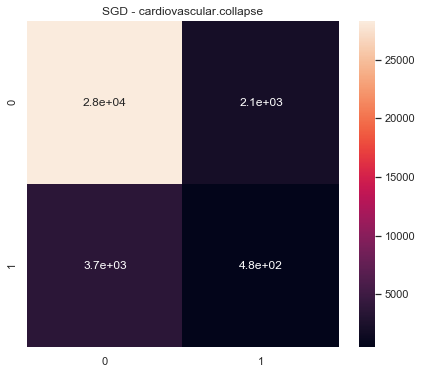

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  cardiovascular.collapse  300.0  0.491313      0.496625   
0   2.0  cardiovascular.collapse  300.0  0.477549      0.483036   
0   3.0  cardiovascular.collapse  300.0  0.457998      0.462484   
0   4.0  cardiovascular.collapse  300.0  0.471529      0.471457   
0   5.0  cardiovascular.collapse  300.0  0.495749      0.496749   

   Precision Macro  ROC Macro  
0         0.494194   0.457030  
0         0.475288   0.516386  
0         0.454138   0.424232  
0         0.471602   0.447099  
0         0.497386   0.518594  



                       ADR    PCA   Avg F1  Avg Recall  Avg Precision  Avg ROC
0  cardiovascular.collapse  300.0  2.39414    2.410351       2.392609  2.36334
================================== LR ==================================


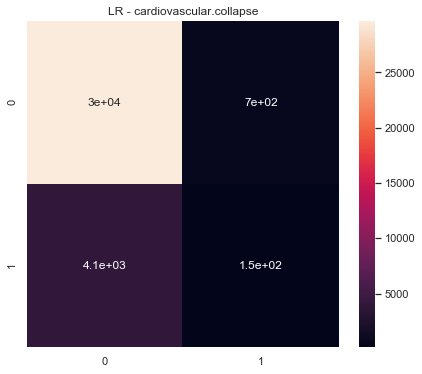

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  cardiovascular.collapse  300.0  0.493252      0.493132   
0   2.0  cardiovascular.collapse  300.0  0.486653      0.487461   
0   3.0  cardiovascular.collapse  300.0  0.496731      0.496907   
0   4.0  cardiovascular.collapse  300.0  0.486015      0.488662   
0   5.0  cardiovascular.collapse  300.0  0.509272      0.509471   

   Precision Macro  ROC Macro  
0         0.493550   0.510703  
0         0.486179   0.485507  
0         0.497250   0.501364  
0         0.485358   0.482316  
0         0.512616   0.510506  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  cardiovascular.collapse  300.0  2.471923    2.475633       2.474954   

    Avg ROC  
0  2.490396  
================================== carpal.tunnel ==================================
================================== NB ==================================


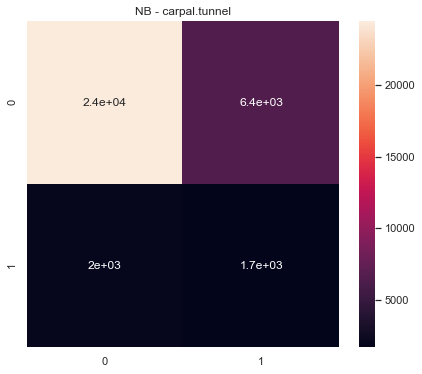

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  carpal.tunnel  300.0  0.572204      0.598746         0.564476   
0   2.0  carpal.tunnel  300.0  0.544409      0.568193         0.542032   
0   3.0  carpal.tunnel  300.0  0.500800      0.542733         0.519890   
0   4.0  carpal.tunnel  300.0  0.545343      0.576218         0.544100   
0   5.0  carpal.tunnel  300.0  0.534605      0.543553         0.532184   

   ROC Macro  
0   0.673092  
0   0.588111  
0   0.568982  
0   0.623995  
0   0.607348  



             ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  carpal.tunnel  300.0  2.69736    2.829442       2.702683  3.061528
================================== DT ==================================


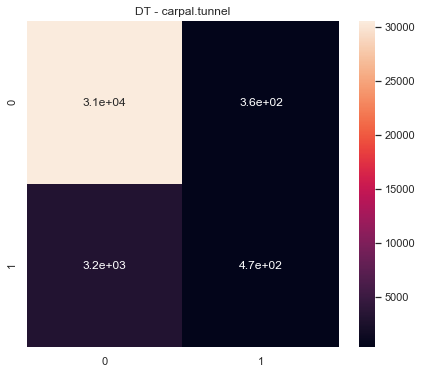

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  carpal.tunnel  300.0  0.500912      0.510172         0.548301   
0   2.0  carpal.tunnel  300.0  0.527117      0.524786         0.552897   
0   3.0  carpal.tunnel  300.0  0.476021      0.483486         0.472302   
0   4.0  carpal.tunnel  300.0  0.501225      0.510549         0.551969   
0   5.0  carpal.tunnel  300.0  0.489914      0.505731         0.546627   

   ROC Macro  
0   0.557634  
0   0.533477  
0   0.552275  
0   0.581328  
0   0.551669  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  carpal.tunnel  300.0  2.495188    2.534724       2.672097  2.776383
================================== RF ==================================


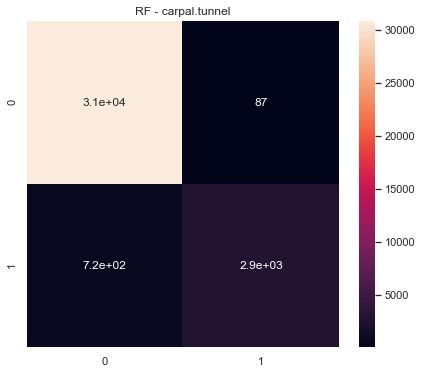

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  carpal.tunnel  300.0  0.472156      0.499919         0.447315   
0   2.0  carpal.tunnel  300.0  0.498146      0.507261         0.527570   
0   3.0  carpal.tunnel  300.0  0.466939      0.481717         0.456127   
0   4.0  carpal.tunnel  300.0  0.471793      0.499272         0.447182   
0   5.0  carpal.tunnel  300.0  0.472193      0.500000         0.447315   

   ROC Macro  
0   0.637027  
0   0.592583  
0   0.569717  
0   0.600429  
0   0.657855  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  carpal.tunnel  300.0  2.381227    2.488169       2.325509  3.057611
================================== SGD ==================================


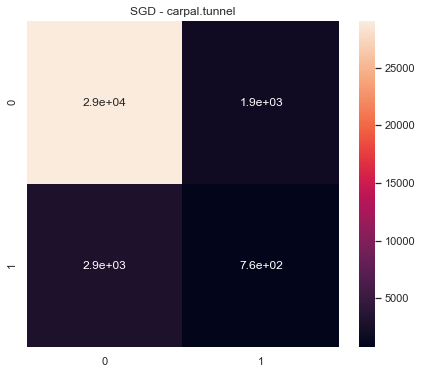

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  carpal.tunnel  300.0  0.502181      0.502626         0.503245   
0   2.0  carpal.tunnel  300.0  0.500932      0.503730         0.506446   
0   3.0  carpal.tunnel  300.0  0.497134      0.497120         0.497154   
0   4.0  carpal.tunnel  300.0  0.482531      0.484354         0.481407   
0   5.0  carpal.tunnel  300.0  0.488485      0.491474         0.488115   

   ROC Macro  
0   0.479465  
0   0.518642  
0   0.435061  
0   0.481428  
0   0.513792  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  carpal.tunnel  300.0  2.471264    2.479304       2.476367  2.428387
================================== LR ==================================


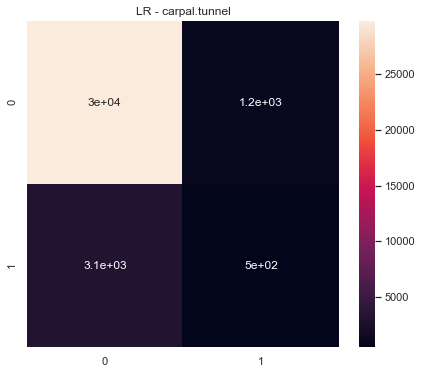

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  carpal.tunnel  300.0  0.515658      0.535295         0.520333   
0   2.0  carpal.tunnel  300.0  0.529951      0.529447         0.530525   
0   3.0  carpal.tunnel  300.0  0.535842      0.550747         0.533869   
0   4.0  carpal.tunnel  300.0  0.516505      0.519806         0.515903   
0   5.0  carpal.tunnel  300.0  0.531090      0.556492         0.532648   

   ROC Macro  
0   0.553321  
0   0.571458  
0   0.540194  
0   0.533707  
0   0.610713  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  carpal.tunnel  300.0  2.629047    2.691786       2.633278  2.809392
================================== cataract ==================================
================================== NB ==================================


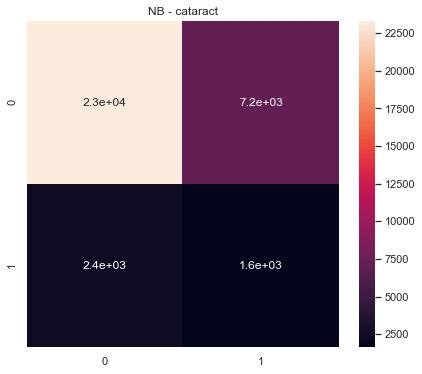

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cataract  300.0  0.528355      0.543940         0.528735   0.576250
0   2.0  cataract  300.0  0.504622      0.523176         0.513331   0.545973
0   3.0  cataract  300.0  0.500981      0.536393         0.518368   0.563993
0   4.0  cataract  300.0  0.529548      0.549357         0.530799   0.586026
0   5.0  cataract  300.0  0.518645      0.533222         0.521200   0.578497



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  cataract  300.0  2.582151    2.686088       2.612432  2.85074
================================== DT ==================================


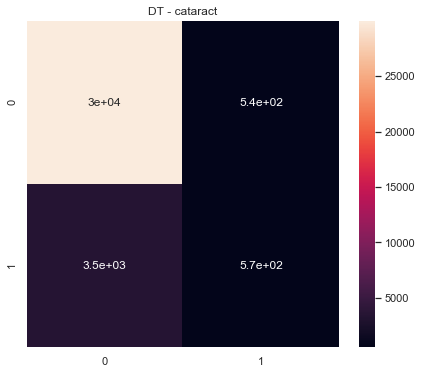

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cataract  300.0  0.485404      0.499831         0.499377   0.518013
0   2.0  cataract  300.0  0.488573      0.500190         0.500570   0.521660
0   3.0  cataract  300.0  0.477587      0.482826         0.475200   0.488811
0   4.0  cataract  300.0  0.506804      0.512853         0.540026   0.549616
0   5.0  cataract  300.0  0.507043      0.511687         0.529592   0.577018



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cataract  300.0  2.465411    2.507387       2.544765  2.655118
================================== RF ==================================


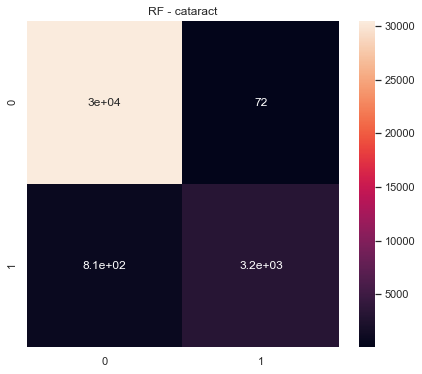

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cataract  300.0  0.468829      0.499672         0.441573   0.597214
0   2.0  cataract  300.0  0.468993      0.500000         0.441606   0.599485
0   3.0  cataract  300.0  0.456266      0.473911         0.440311   0.527925
0   4.0  cataract  300.0  0.467766      0.497542         0.441352   0.524474
0   5.0  cataract  300.0  0.468947      0.499918         0.441589   0.595904



        ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cataract  300.0  2.3308    2.471044       2.206431  2.845002
================================== SGD ==================================


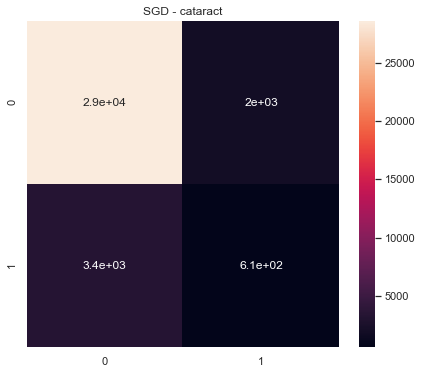

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cataract  300.0  0.513678      0.513693         0.513663   0.474418
0   2.0  cataract  300.0  0.475077      0.491679         0.473327   0.494296
0   3.0  cataract  300.0  0.464251      0.465258         0.463307   0.411410
0   4.0  cataract  300.0  0.487039      0.492642         0.487737   0.485744
0   5.0  cataract  300.0  0.482750      0.486229         0.481498   0.524645



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cataract  300.0  2.422794    2.449502       2.419532  2.390513
================================== LR ==================================


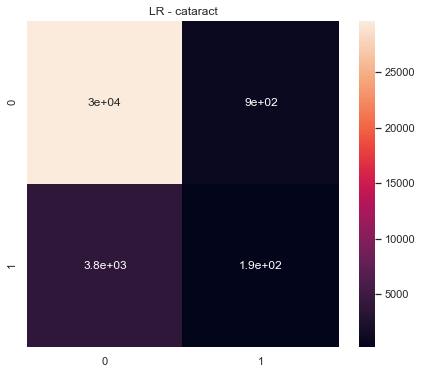

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cataract  300.0  0.501260      0.505173         0.503750   0.535091
0   2.0  cataract  300.0  0.485598      0.500077         0.500288   0.573013
0   3.0  cataract  300.0  0.493922      0.494870         0.495966   0.515721
0   4.0  cataract  300.0  0.488220      0.490006         0.492900   0.492299
0   5.0  cataract  300.0  0.524860      0.536869         0.525077   0.565075



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cataract  300.0  2.493859    2.526995       2.517981  2.681199
================================== cellulitis ==================================
================================== NB ==================================


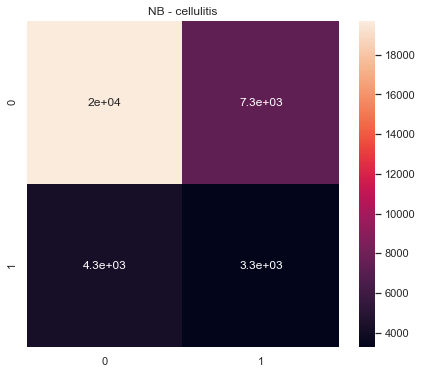

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cellulitis  300.0  0.554903      0.556340         0.553849   0.583162
0   2.0  cellulitis  300.0  0.532105      0.536790         0.531779   0.544662
0   3.0  cellulitis  300.0  0.548939      0.568701         0.552176   0.589968
0   4.0  cellulitis  300.0  0.529515      0.536300         0.530183   0.547224
0   5.0  cellulitis  300.0  0.540768      0.540391         0.541210   0.585447



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cellulitis  300.0  2.706231    2.738523       2.709197  2.850464
================================== DT ==================================


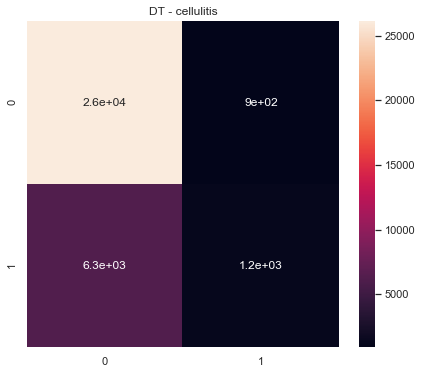

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cellulitis  300.0  0.482873      0.504184         0.511268   0.497265
0   2.0  cellulitis  300.0  0.470113      0.502885         0.512230   0.527042
0   3.0  cellulitis  300.0  0.446038      0.466235         0.439235   0.478523
0   4.0  cellulitis  300.0  0.470296      0.501029         0.503824   0.518797
0   5.0  cellulitis  300.0  0.468460      0.495469         0.486772   0.510371



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cellulitis  300.0  2.337781    2.469802        2.45333  2.531998
================================== RF ==================================


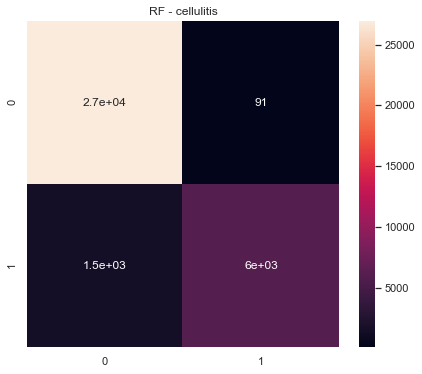

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cellulitis  300.0  0.440382      0.499794         0.484815   0.584781
0   2.0  cellulitis  300.0  0.440711      0.500533         0.578619   0.568370
0   3.0  cellulitis  300.0  0.435488      0.475253         0.417400   0.535836
0   4.0  cellulitis  300.0  0.440884      0.499848         0.491001   0.532296
0   5.0  cellulitis  300.0  0.440205      0.495571         0.434071   0.595586



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cellulitis  300.0  2.197669    2.470999       2.405905  2.816869
================================== SGD ==================================


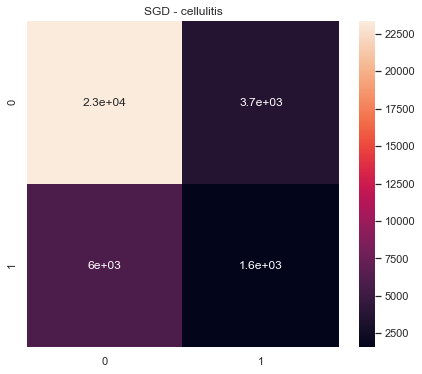

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cellulitis  300.0  0.462597      0.471388         0.460553   0.430252
0   2.0  cellulitis  300.0  0.485738      0.494183         0.491035   0.488970
0   3.0  cellulitis  300.0  0.462159      0.466214         0.460236   0.407042
0   4.0  cellulitis  300.0  0.468964      0.470312         0.468114   0.455293
0   5.0  cellulitis  300.0  0.480985      0.486210         0.481882   0.445087



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cellulitis  300.0  2.360443    2.388307        2.36182  2.226645
================================== LR ==================================


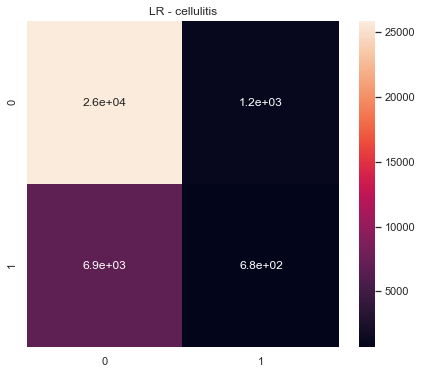

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  cellulitis  300.0  0.511554      0.511426         0.511985   0.538703
0   2.0  cellulitis  300.0  0.494169      0.510081         0.523932   0.492401
0   3.0  cellulitis  300.0  0.481200      0.480969         0.481551   0.494128
0   4.0  cellulitis  300.0  0.476311      0.487940         0.480221   0.482231
0   5.0  cellulitis  300.0  0.506038      0.511549         0.518182   0.504590



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cellulitis  300.0  2.469271    2.501965       2.515871  2.512052
================================== cerebral.infarct ==================================
================================== NB ==================================


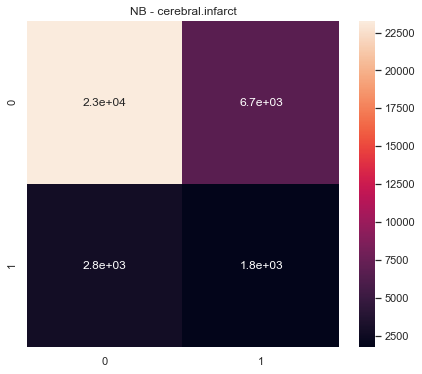

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cerebral.infarct  300.0  0.535827      0.540458         0.533886   
0   2.0  cerebral.infarct  300.0  0.533334      0.550679         0.533807   
0   3.0  cerebral.infarct  300.0  0.525876      0.543049         0.528112   
0   4.0  cerebral.infarct  300.0  0.528820      0.550304         0.531726   
0   5.0  cerebral.infarct  300.0  0.517776      0.527329         0.519275   

   ROC Macro  
0   0.586260  
0   0.560290  
0   0.577911  
0   0.571594  
0   0.546646  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cerebral.infarct  300.0  2.641634     2.71182       2.646806  2.842701
================================== DT ==================================


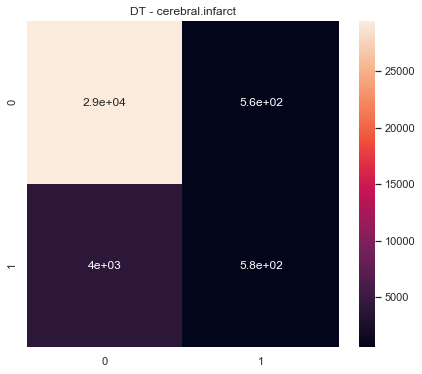

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cerebral.infarct  300.0  0.476467      0.499103         0.494835   
0   2.0  cerebral.infarct  300.0  0.477818      0.499440         0.497002   
0   3.0  cerebral.infarct  300.0  0.451425      0.459406         0.444688   
0   4.0  cerebral.infarct  300.0  0.487957      0.498710         0.496864   
0   5.0  cerebral.infarct  300.0  0.487759      0.500119         0.500332   

   ROC Macro  
0   0.521013  
0   0.493960  
0   0.490083  
0   0.516348  
0   0.485314  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cerebral.infarct  300.0  2.381427    2.456776       2.433721  2.506719
================================== RF ==================================


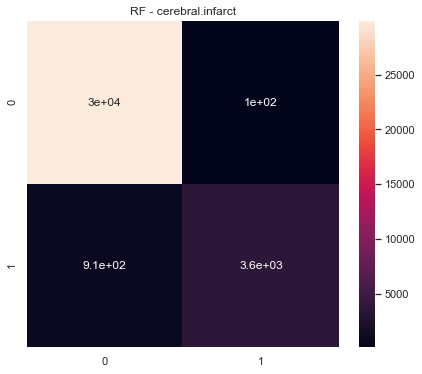

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cerebral.infarct  300.0  0.464383      0.499167         0.434130   
0   2.0  cerebral.infarct  300.0  0.464715      0.499917         0.434144   
0   3.0  cerebral.infarct  300.0  0.448194      0.465849         0.432345   
0   4.0  cerebral.infarct  300.0  0.461754      0.494000         0.433460   
0   5.0  cerebral.infarct  300.0  0.464751      0.499917         0.434207   

   ROC Macro  
0   0.576090  
0   0.533401  
0   0.522705  
0   0.504472  
0   0.546022  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cerebral.infarct  300.0  2.303796    2.458849       2.168286  2.682689
================================== SGD ==================================


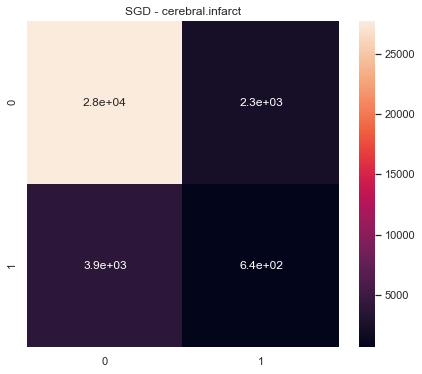

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cerebral.infarct  300.0  0.500606      0.500666         0.500705   
0   2.0  cerebral.infarct  300.0  0.484289      0.484028         0.484612   
0   3.0  cerebral.infarct  300.0  0.464502      0.468275         0.461604   
0   4.0  cerebral.infarct  300.0  0.462653      0.474804         0.455168   
0   5.0  cerebral.infarct  300.0  0.501021      0.503155         0.504594   

   ROC Macro  
0   0.459245  
0   0.481564  
0   0.416582  
0   0.456930  
0   0.487652  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cerebral.infarct  300.0  2.413072    2.430928       2.406682  2.301974
================================== LR ==================================


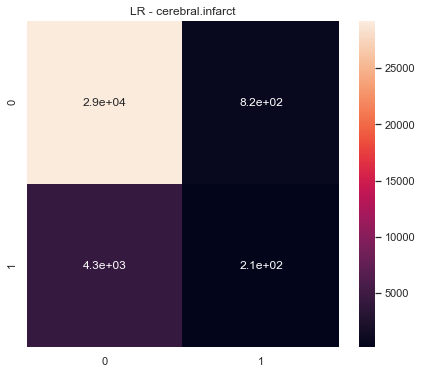

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cerebral.infarct  300.0  0.548531      0.551273         0.546592   
0   2.0  cerebral.infarct  300.0  0.489097      0.500043         0.500109   
0   3.0  cerebral.infarct  300.0  0.510138      0.536947         0.521172   
0   4.0  cerebral.infarct  300.0  0.469233      0.473590         0.466358   
0   5.0  cerebral.infarct  300.0  0.530512      0.528891         0.533602   

   ROC Macro  
0   0.553493  
0   0.533035  
0   0.528986  
0   0.465753  
0   0.518961  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cerebral.infarct  300.0  2.547511    2.590744       2.567833  2.600228
================================== cervicalgia ==================================
================================== NB ==================================


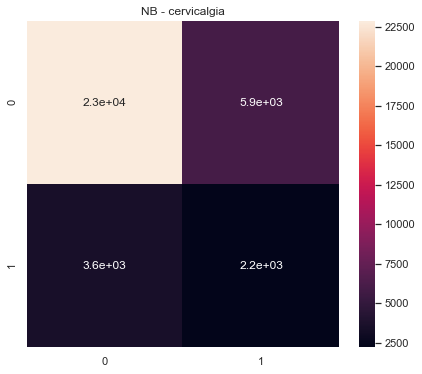

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cervicalgia  300.0  0.555482      0.558600         0.553430   
0   2.0  cervicalgia  300.0  0.558265      0.570974         0.555210   
0   3.0  cervicalgia  300.0  0.544694      0.570933         0.547694   
0   4.0  cervicalgia  300.0  0.549481      0.552478         0.547628   
0   5.0  cervicalgia  300.0  0.516080      0.517462         0.515754   

   ROC Macro  
0   0.606119  
0   0.616848  
0   0.605522  
0   0.595827  
0   0.537042  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cervicalgia  300.0  2.724003    2.770446       2.719717  2.961357
================================== DT ==================================


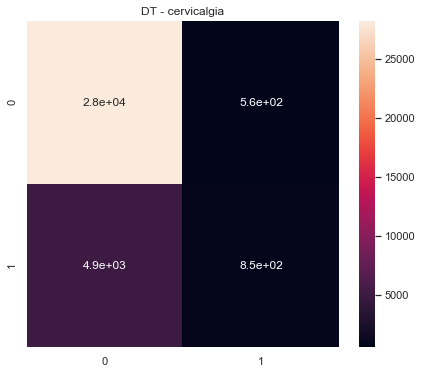

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cervicalgia  300.0  0.505078      0.519496         0.586038   
0   2.0  cervicalgia  300.0  0.500959      0.516459         0.569363   
0   3.0  cervicalgia  300.0  0.480137      0.492662         0.485077   
0   4.0  cervicalgia  300.0  0.500380      0.513381         0.542274   
0   5.0  cervicalgia  300.0  0.495940      0.513856         0.563043   

   ROC Macro  
0   0.567363  
0   0.597311  
0   0.498601  
0   0.497441  
0   0.540745  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cervicalgia  300.0  2.482494    2.555854       2.745794  2.701461
================================== RF ==================================


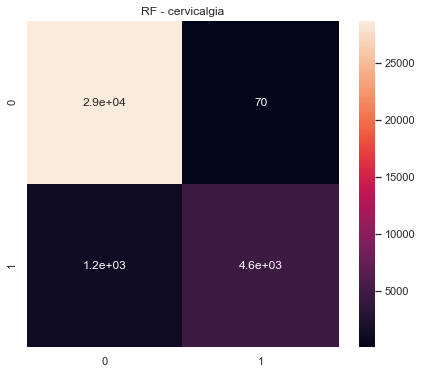

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cervicalgia  300.0  0.454996      0.499652         0.466522   
0   2.0  cervicalgia  300.0  0.455303      0.500260         0.583273   
0   3.0  cervicalgia  300.0  0.444284      0.475940         0.419718   
0   4.0  cervicalgia  300.0  0.458796      0.499558         0.490904   
0   5.0  cervicalgia  300.0  0.456912      0.500780         0.583333   

   ROC Macro  
0   0.592712  
0   0.625728  
0   0.595600  
0   0.532248  
0   0.635982  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cervicalgia  300.0  2.270291     2.47619        2.54375  2.982269
================================== SGD ==================================


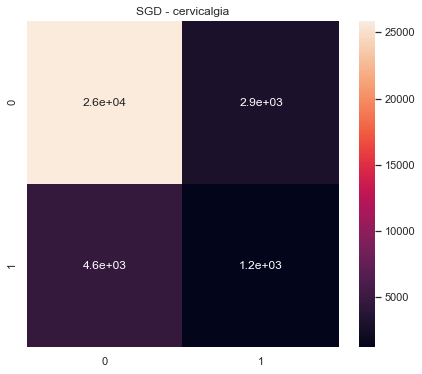

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cervicalgia  300.0  0.489658      0.495332         0.492827   
0   2.0  cervicalgia  300.0  0.503752      0.505645         0.507683   
0   3.0  cervicalgia  300.0  0.454086      0.456696         0.451921   
0   4.0  cervicalgia  300.0  0.494626      0.494585         0.494812   
0   5.0  cervicalgia  300.0  0.470639      0.473083         0.469124   

   ROC Macro  
0   0.461910  
0   0.441908  
0   0.385925  
0   0.436141  
0   0.440346  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  cervicalgia  300.0  2.412761    2.425342       2.416367  2.16623
================================== LR ==================================


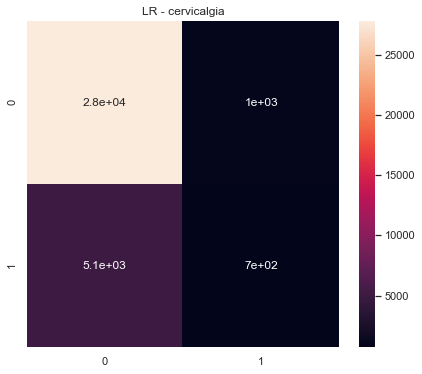

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cervicalgia  300.0  0.552440      0.552886         0.552025   
0   2.0  cervicalgia  300.0  0.511545      0.521136         0.567737   
0   3.0  cervicalgia  300.0  0.506860      0.507505         0.506888   
0   4.0  cervicalgia  300.0  0.505535      0.505537         0.505978   
0   5.0  cervicalgia  300.0  0.523560      0.522899         0.530995   

   ROC Macro  
0   0.585863  
0   0.532870  
0   0.532613  
0   0.465842  
0   0.554493  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cervicalgia  300.0  2.59994    2.609963       2.663622  2.671682
================================== chest.pain ==================================
================================== NB ==================================


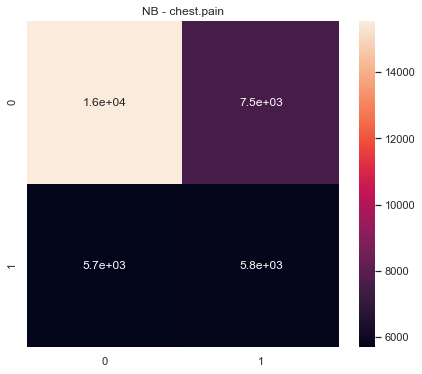

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chest.pain  300.0  0.551218      0.550564         0.555561   0.583811
0   2.0  chest.pain  300.0  0.540740      0.541154         0.540486   0.561189
0   3.0  chest.pain  300.0  0.542145      0.550277         0.545493   0.572457
0   4.0  chest.pain  300.0  0.558087      0.558315         0.557891   0.581698
0   5.0  chest.pain  300.0  0.527837      0.528312         0.527672   0.548075



          ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  chest.pain  300.0  2.720027    2.728621       2.727103  2.84723
================================== DT ==================================


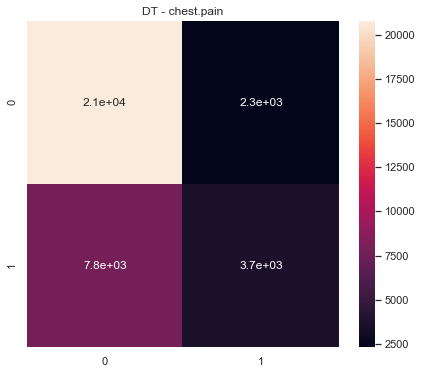

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chest.pain  300.0  0.515850      0.525733         0.537684   0.543700
0   2.0  chest.pain  300.0  0.485851      0.518189         0.542919   0.542513
0   3.0  chest.pain  300.0  0.529762      0.538162         0.556544   0.555016
0   4.0  chest.pain  300.0  0.519099      0.528173         0.540804   0.530280
0   5.0  chest.pain  300.0  0.466672      0.492225         0.486159   0.489489



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chest.pain  300.0  2.517234    2.602481       2.664109  2.660997
================================== RF ==================================


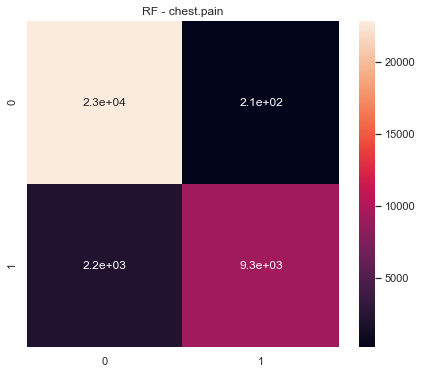

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chest.pain  300.0  0.440495      0.510635         0.575214   0.591974
0   2.0  chest.pain  300.0  0.431793      0.505834         0.544333   0.571018
0   3.0  chest.pain  300.0  0.439813      0.503270         0.515509   0.582701
0   4.0  chest.pain  300.0  0.448533      0.511735         0.563095   0.573114
0   5.0  chest.pain  300.0  0.420576      0.476508         0.430709   0.578046



          ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chest.pain  300.0  2.18121    2.507983       2.628861  2.896853
================================== SGD ==================================


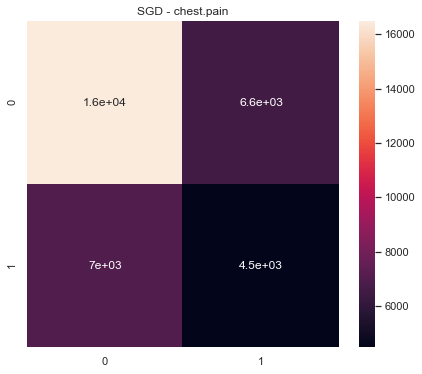

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chest.pain  300.0  0.522300      0.523453         0.526545   0.549157
0   2.0  chest.pain  300.0  0.488707      0.490775         0.489832   0.511266
0   3.0  chest.pain  300.0  0.505859      0.505922         0.505858   0.511567
0   4.0  chest.pain  300.0  0.520986      0.520884         0.521198   0.513779
0   5.0  chest.pain  300.0  0.489178      0.489221         0.489153   0.499876



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chest.pain  300.0  2.527029    2.530255       2.532587  2.585644
================================== LR ==================================


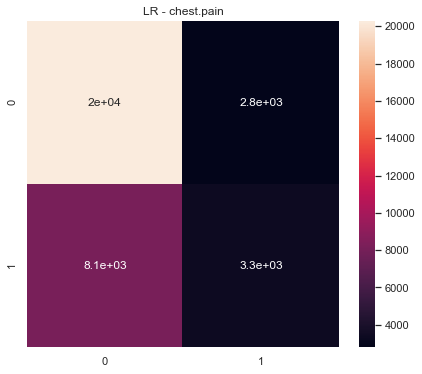

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chest.pain  300.0  0.529599      0.533868         0.543950   0.578261
0   2.0  chest.pain  300.0  0.510972      0.514394         0.517237   0.539812
0   3.0  chest.pain  300.0  0.523369      0.525495         0.530104   0.520285
0   4.0  chest.pain  300.0  0.521852      0.523871         0.527963   0.519626
0   5.0  chest.pain  300.0  0.513111      0.517253         0.521241   0.525465



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chest.pain  300.0  2.598903    2.614881       2.640495  2.683449
================================== chill ==================================
================================== NB ==================================


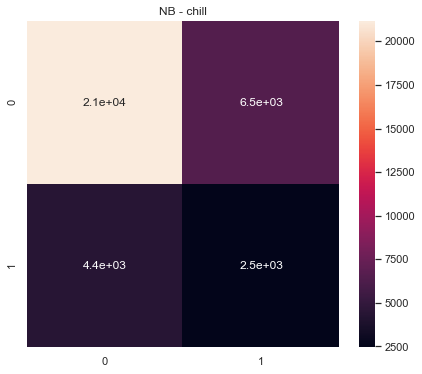

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chill  300.0  0.535798      0.536064         0.535559   0.572034
0   2.0  chill  300.0  0.507671      0.514947         0.511629   0.530137
0   3.0  chill  300.0  0.494615      0.504364         0.503212   0.508909
0   4.0  chill  300.0  0.529963      0.532675         0.529190   0.531977
0   5.0  chill  300.0  0.521329      0.521162         0.521532   0.541225



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chill  300.0  2.589376    2.609213       2.601121  2.684282
================================== DT ==================================


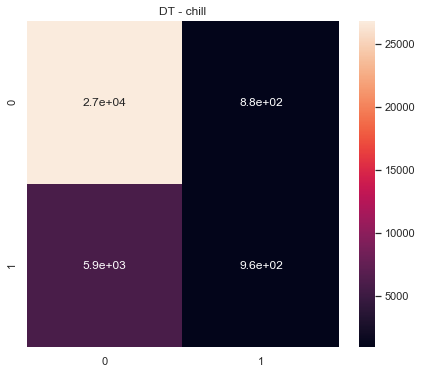

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chill  300.0  0.476820      0.502082         0.507276   0.516338
0   2.0  chill  300.0  0.451078      0.473232         0.444137   0.495073
0   3.0  chill  300.0  0.439798      0.457700         0.429348   0.433014
0   4.0  chill  300.0  0.454009      0.467927         0.448745   0.440401
0   5.0  chill  300.0  0.457889      0.490764         0.464537   0.473785



     ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  chill  300.0  2.279594    2.391705       2.294044  2.35861
================================== RF ==================================


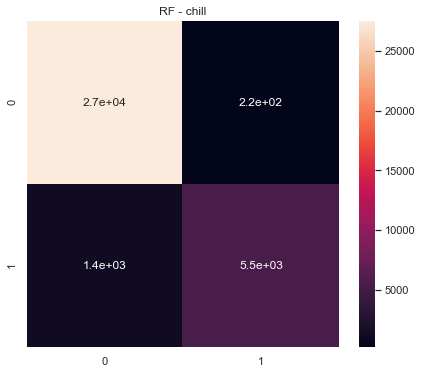

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chill  300.0  0.447708      0.499749         0.490114   0.558277
0   2.0  chill  300.0  0.436713      0.470821         0.415744   0.492504
0   3.0  chill  300.0  0.432580      0.460286         0.413972   0.450335
0   4.0  chill  300.0  0.441294      0.486666         0.415547   0.410302
0   5.0  chill  300.0  0.445556      0.500004         0.500855   0.533506



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chill  300.0  2.203851    2.417526       2.236232  2.444923
================================== SGD ==================================


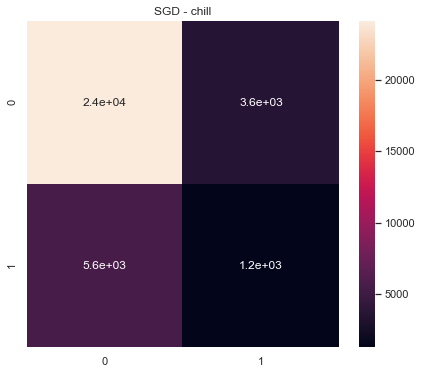

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chill  300.0  0.480875      0.481194         0.480634   0.469287
0   2.0  chill  300.0  0.460396      0.467097         0.457390   0.436115
0   3.0  chill  300.0  0.439943      0.442877         0.437464   0.419664
0   4.0  chill  300.0  0.461985      0.466442         0.459640   0.416833
0   5.0  chill  300.0  0.508301      0.508368         0.508256   0.504888



     ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chill  300.0  2.3515    2.365979       2.343384  2.246788
================================== LR ==================================


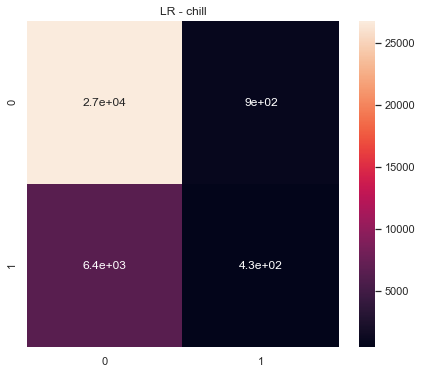

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  chill  300.0  0.505542      0.514480         0.529887   0.545179
0   2.0  chill  300.0  0.456400      0.477239         0.452574   0.447565
0   3.0  chill  300.0  0.476460      0.480139         0.484896   0.457744
0   4.0  chill  300.0  0.456478      0.470910         0.451985   0.454053
0   5.0  chill  300.0  0.516182      0.519522         0.531996   0.538941



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  chill  300.0  2.411062     2.46229       2.451338  2.443482
================================== cholecystitis ==================================
================================== NB ==================================


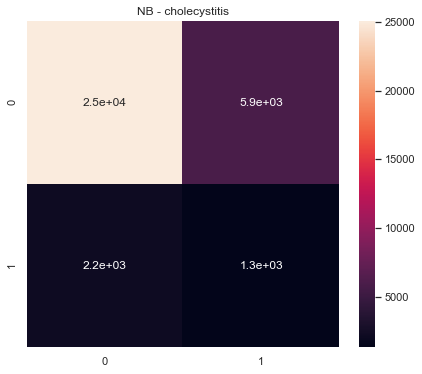

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholecystitis  300.0  0.545325      0.559217         0.541511   
0   2.0  cholecystitis  300.0  0.562469      0.583111         0.556144   
0   3.0  cholecystitis  300.0  0.490080      0.513448         0.506658   
0   4.0  cholecystitis  300.0  0.523704      0.541499         0.525224   
0   5.0  cholecystitis  300.0  0.524843      0.541184         0.525641   

   ROC Macro  
0   0.602192  
0   0.612023  
0   0.514510  
0   0.570742  
0   0.560825  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholecystitis  300.0  2.646421    2.738459       2.655178  2.860292
================================== DT ==================================


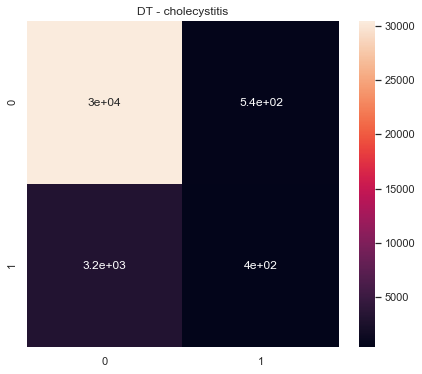

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholecystitis  300.0  0.497179      0.506667         0.526135   
0   2.0  cholecystitis  300.0  0.461688      0.459825         0.463740   
0   3.0  cholecystitis  300.0  0.455568      0.457989         0.453250   
0   4.0  cholecystitis  300.0  0.477339      0.490723         0.474235   
0   5.0  cholecystitis  300.0  0.513291      0.517455         0.576437   

   ROC Macro  
0   0.531672  
0   0.463553  
0   0.491028  
0   0.444123  
0   0.578884  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholecystitis  300.0  2.405066    2.432659       2.493797  2.509261
================================== RF ==================================


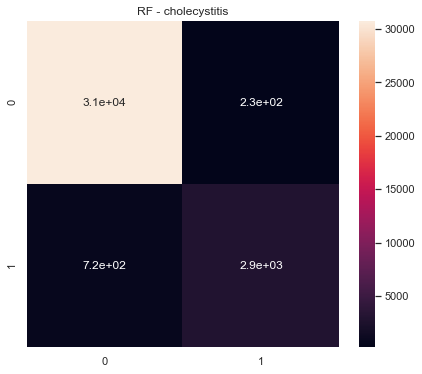

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholecystitis  300.0  0.472519      0.499758         0.448096   
0   2.0  cholecystitis  300.0  0.455936      0.462282         0.450037   
0   3.0  cholecystitis  300.0  0.449095      0.454788         0.443543   
0   4.0  cholecystitis  300.0  0.469074      0.492975         0.447384   
0   5.0  cholecystitis  300.0  0.472636      0.500000         0.448111   

   ROC Macro  
0   0.583742  
0   0.528743  
0   0.458232  
0   0.431025  
0   0.618585  



             ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholecystitis  300.0  2.31926    2.409802       2.237171  2.620327
================================== SGD ==================================


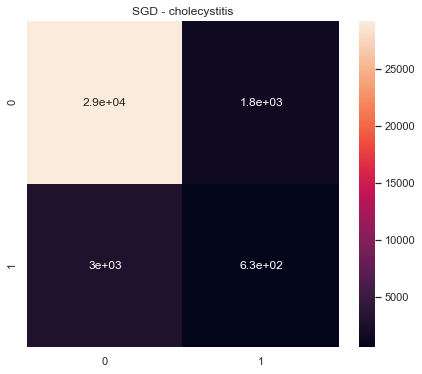

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholecystitis  300.0  0.482773      0.488413         0.481250   
0   2.0  cholecystitis  300.0  0.487667      0.487816         0.490838   
0   3.0  cholecystitis  300.0  0.497435      0.497437         0.497434   
0   4.0  cholecystitis  300.0  0.466387      0.467688         0.465175   
0   5.0  cholecystitis  300.0  0.473372      0.476376         0.471065   

   ROC Macro  
0   0.508121  
0   0.421480  
0   0.478023  
0   0.431929  
0   0.507905  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholecystitis  300.0  2.407634     2.41773       2.405762  2.347458
================================== LR ==================================


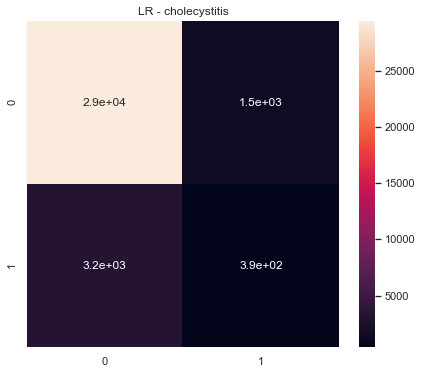

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholecystitis  300.0  0.486920      0.503412         0.501764   
0   2.0  cholecystitis  300.0  0.478775      0.477633         0.480441   
0   3.0  cholecystitis  300.0  0.515098      0.565882         0.530524   
0   4.0  cholecystitis  300.0  0.457569      0.474630         0.488541   
0   5.0  cholecystitis  300.0  0.498523      0.513230         0.507402   

   ROC Macro  
0   0.538758  
0   0.474105  
0   0.552488  
0   0.455749  
0   0.528973  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholecystitis  300.0  2.436884    2.534788       2.508673  2.550074
================================== cholelithiasis ==================================
================================== NB ==================================


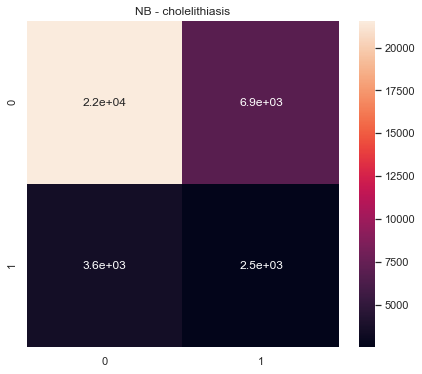

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholelithiasis  300.0  0.561408      0.559382         0.564153   
0   2.0  cholelithiasis  300.0  0.555322      0.562978         0.552603   
0   3.0  cholelithiasis  300.0  0.511753      0.524909         0.517706   
0   4.0  cholelithiasis  300.0  0.525809      0.540119         0.529050   
0   5.0  cholelithiasis  300.0  0.517465      0.525875         0.519733   

   ROC Macro  
0   0.613336  
0   0.596844  
0   0.556559  
0   0.549117  
0   0.548680  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholelithiasis  300.0  2.671757    2.713265       2.683245  2.864536
================================== DT ==================================


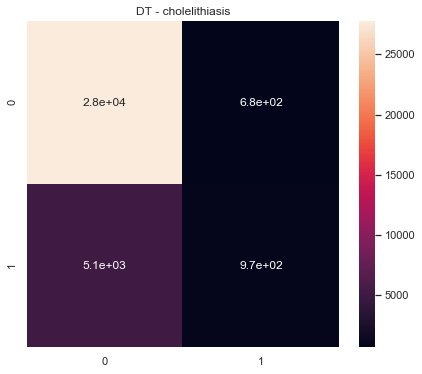

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholelithiasis  300.0  0.488963      0.510195         0.544293   
0   2.0  cholelithiasis  300.0  0.495553      0.512283         0.542944   
0   3.0  cholelithiasis  300.0  0.448464      0.467210         0.438076   
0   4.0  cholelithiasis  300.0  0.508348      0.517540         0.544558   
0   5.0  cholelithiasis  300.0  0.500866      0.516170         0.558352   

   ROC Macro  
0   0.540452  
0   0.561299  
0   0.496980  
0   0.564344  
0   0.559490  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholelithiasis  300.0  2.442194    2.523399       2.628224  2.722566
================================== RF ==================================


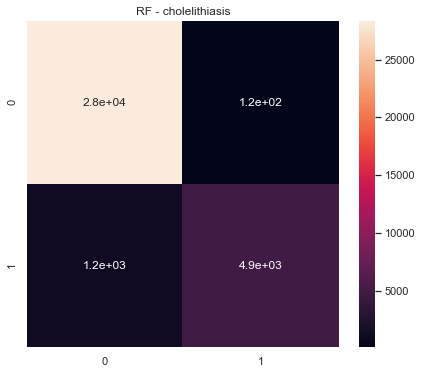

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholelithiasis  300.0  0.452937      0.500378         0.554417   
0   2.0  cholelithiasis  300.0  0.447156      0.491384         0.410232   
0   3.0  cholelithiasis  300.0  0.431829      0.460199         0.407445   
0   4.0  cholelithiasis  300.0  0.451734      0.499266         0.447112   
0   5.0  cholelithiasis  300.0  0.453019      0.500467         0.578299   

   ROC Macro  
0   0.598372  
0   0.578995  
0   0.534935  
0   0.519666  
0   0.623992  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  cholelithiasis  300.0  2.236675    2.451693       2.397506  2.85596
================================== SGD ==================================


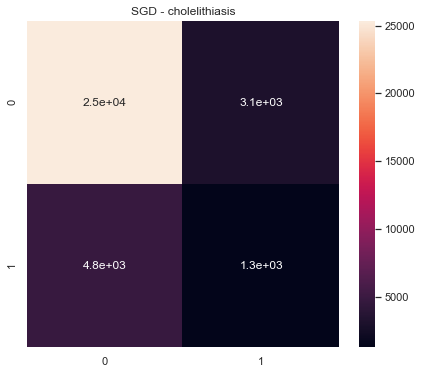

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholelithiasis  300.0  0.494844      0.494866         0.494826   
0   2.0  cholelithiasis  300.0  0.481325      0.489534         0.483275   
0   3.0  cholelithiasis  300.0  0.459158      0.460731         0.457852   
0   4.0  cholelithiasis  300.0  0.500291      0.501566         0.501916   
0   5.0  cholelithiasis  300.0  0.480177      0.483113         0.479468   

   ROC Macro  
0   0.474984  
0   0.486748  
0   0.418648  
0   0.476779  
0   0.460624  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholelithiasis  300.0  2.415794    2.429809       2.417338  2.317783
================================== LR ==================================


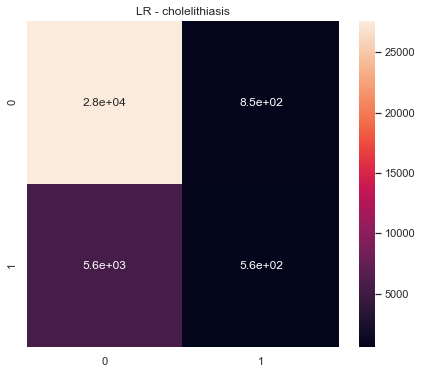

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cholelithiasis  300.0  0.524314      0.524500         0.537144   
0   2.0  cholelithiasis  300.0  0.490015      0.503891         0.509587   
0   3.0  cholelithiasis  300.0  0.485535      0.485604         0.485473   
0   4.0  cholelithiasis  300.0  0.520297      0.519734         0.523639   
0   5.0  cholelithiasis  300.0  0.496647      0.506919         0.515060   

   ROC Macro  
0   0.558726  
0   0.492511  
0   0.490191  
0   0.530947  
0   0.531077  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cholelithiasis  300.0  2.516809    2.540647       2.570902  2.603452
================================== chronic.obstructive.airway.disease ==================================
================================== NB ==================================


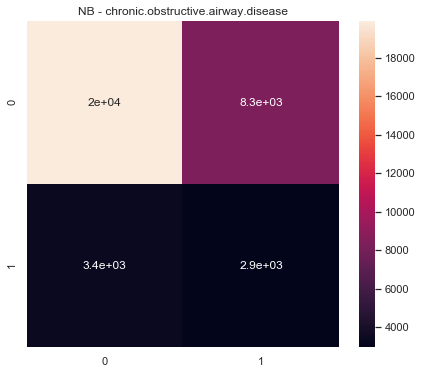

   Fold                                 ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  chronic.obstructive.airway.disease  300.0  0.528756      0.532188   
0   2.0  chronic.obstructive.airway.disease  300.0  0.523973      0.532893   
0   3.0  chronic.obstructive.airway.disease  300.0  0.500087      0.522876   
0   4.0  chronic.obstructive.airway.disease  300.0  0.505965      0.518654   
0   5.0  chronic.obstructive.airway.disease  300.0  0.501355      0.509081   

   Precision Macro  ROC Macro  
0         0.527968   0.582041  
0         0.525451   0.573775  
0         0.515071   0.549753  
0         0.513291   0.538480  
0         0.506769   0.555483  



                                  ADR    PCA    Avg F1  Avg Recall  \
0  chronic.obstructive.airway.disease  300.0  2.560135    2.615693   

   Avg Precision   Avg ROC  
0        2.58855  2.799531  
================================== DT ==================================


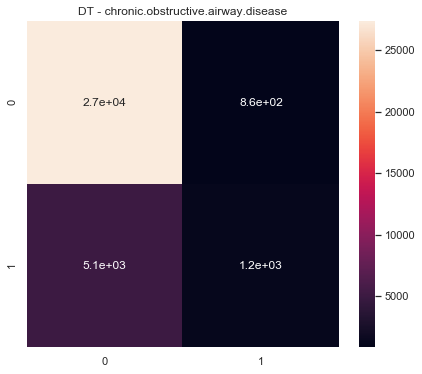

   Fold                                 ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  chronic.obstructive.airway.disease  300.0  0.477290      0.499669   
0   2.0  chronic.obstructive.airway.disease  300.0  0.475710      0.496831   
0   3.0  chronic.obstructive.airway.disease  300.0  0.457398      0.471379   
0   4.0  chronic.obstructive.airway.disease  300.0  0.480707      0.499032   
0   5.0  chronic.obstructive.airway.disease  300.0  0.461670      0.485892   

   Precision Macro  ROC Macro  
0         0.498920   0.530141  
0         0.490777   0.520463  
0         0.452036   0.511509  
0         0.497409   0.497186  
0         0.461360   0.495150  



                                  ADR    PCA    Avg F1  Avg Recall  \
0  chronic.obstructive.airway.disease  300.0  2.352776    2.452803   

   Avg Precision  Avg ROC  
0       2.400503  2.55445  
================================== RF ==================================


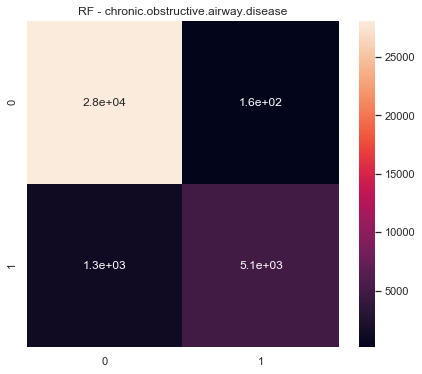

   Fold                                 ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  chronic.obstructive.airway.disease  300.0  0.449622      0.499823   
0   2.0  chronic.obstructive.airway.disease  300.0  0.452685      0.500964   
0   3.0  chronic.obstructive.airway.disease  300.0  0.430681      0.462138   
0   4.0  chronic.obstructive.airway.disease  300.0  0.449534      0.499734   
0   5.0  chronic.obstructive.airway.disease  300.0  0.442994      0.475214   

   Precision Macro  ROC Macro  
0         0.408584   0.535809  
0         0.590573   0.526782  
0         0.403656   0.518679  
0         0.408499   0.533472  
0         0.423215   0.543010  



                                  ADR    PCA    Avg F1  Avg Recall  \
0  chronic.obstructive.airway.disease  300.0  2.225516    2.437873   

   Avg Precision   Avg ROC  
0       2.234527  2.657751  
================================== SGD ==================================


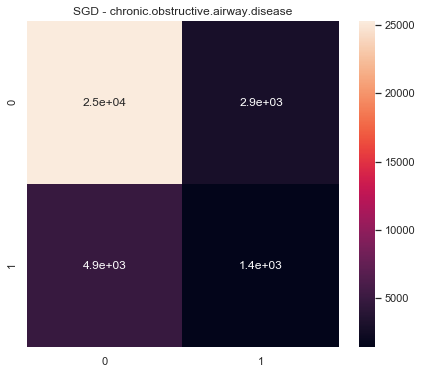

   Fold                                 ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  chronic.obstructive.airway.disease  300.0  0.484134      0.488579   
0   2.0  chronic.obstructive.airway.disease  300.0  0.481086      0.497764   
0   3.0  chronic.obstructive.airway.disease  300.0  0.452524      0.458597   
0   4.0  chronic.obstructive.airway.disease  300.0  0.500216      0.504701   
0   5.0  chronic.obstructive.airway.disease  300.0  0.450322      0.457855   

   Precision Macro  ROC Macro  
0         0.484709   0.462074  
0         0.494537   0.494622  
0         0.448496   0.394164  
0         0.507211   0.459251  
0         0.445405   0.452753  



                                  ADR    PCA    Avg F1  Avg Recall  \
0  chronic.obstructive.airway.disease  300.0  2.368283    2.407495   

   Avg Precision   Avg ROC  
0       2.380357  2.262865  
================================== LR ==================================


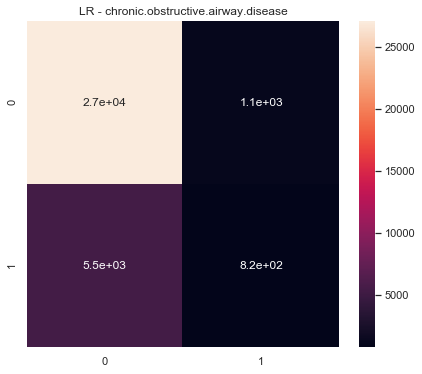

   Fold                                 ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  chronic.obstructive.airway.disease  300.0  0.513732      0.513647   
0   2.0  chronic.obstructive.airway.disease  300.0  0.530137      0.534564   
0   3.0  chronic.obstructive.airway.disease  300.0  0.518863      0.519521   
0   4.0  chronic.obstructive.airway.disease  300.0  0.538374      0.536282   
0   5.0  chronic.obstructive.airway.disease  300.0  0.484410      0.487926   

   Precision Macro  ROC Macro  
0         0.513835   0.516415  
0         0.596482   0.555587  
0         0.518519   0.567065  
0         0.545449   0.531991  
0         0.484586   0.511213  



                                  ADR    PCA    Avg F1  Avg Recall  \
0  chronic.obstructive.airway.disease  300.0  2.585517     2.59194   

   Avg Precision  Avg ROC  
0       2.658872  2.68227  
================================== cognitive.disorder ==================================
================================== NB ============

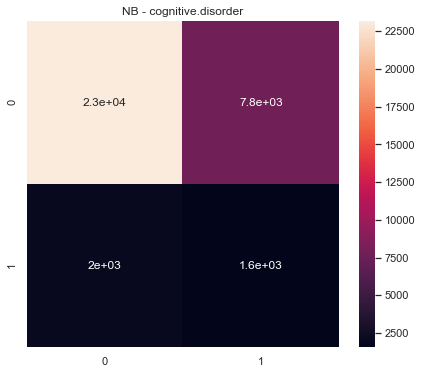

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cognitive.disorder  300.0  0.522955      0.548771         0.527121   
0   2.0  cognitive.disorder  300.0  0.517558      0.560264         0.529260   
0   3.0  cognitive.disorder  300.0  0.495602      0.568632         0.528399   
0   4.0  cognitive.disorder  300.0  0.523731      0.560445         0.531026   
0   5.0  cognitive.disorder  300.0  0.526023      0.554869         0.530069   

   ROC Macro  
0   0.607901  
0   0.588466  
0   0.592875  
0   0.595576  
0   0.597907  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cognitive.disorder  300.0  2.585868    2.792982       2.645876  2.982726
================================== DT ==================================


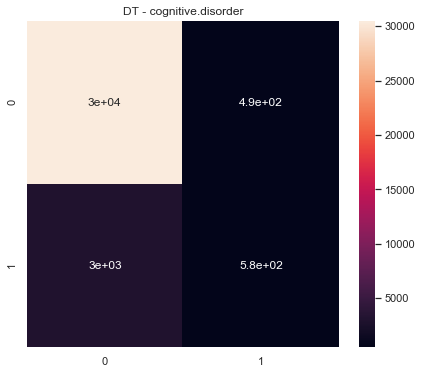

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cognitive.disorder  300.0  0.486584      0.496724         0.491308   
0   2.0  cognitive.disorder  300.0  0.495027      0.504948         0.518280   
0   3.0  cognitive.disorder  300.0  0.471133      0.479011         0.465909   
0   4.0  cognitive.disorder  300.0  0.493977      0.501803         0.504717   
0   5.0  cognitive.disorder  300.0  0.500985      0.509778         0.543493   

   ROC Macro  
0   0.526744  
0   0.566272  
0   0.506210  
0   0.530226  
0   0.518528  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cognitive.disorder  300.0  2.447706    2.492264       2.523707  2.647981
================================== RF ==================================


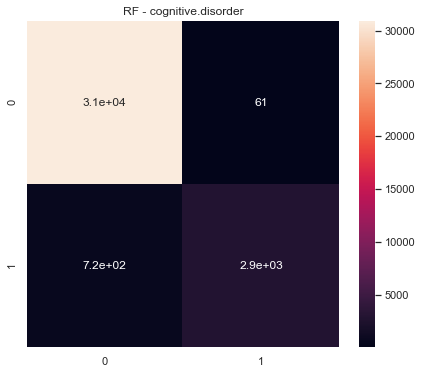

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cognitive.disorder  300.0  0.472358      0.499596         0.447936   
0   2.0  cognitive.disorder  300.0  0.472559      0.500000         0.447974   
0   3.0  cognitive.disorder  300.0  0.460325      0.476090         0.445570   
0   4.0  cognitive.disorder  300.0  0.472358      0.499677         0.447871   
0   5.0  cognitive.disorder  300.0  0.472555      0.500000         0.447966   

   ROC Macro  
0   0.582686  
0   0.599389  
0   0.564718  
0   0.502216  
0   0.616207  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cognitive.disorder  300.0  2.350155    2.475364       2.237318  2.865217
================================== SGD ==================================


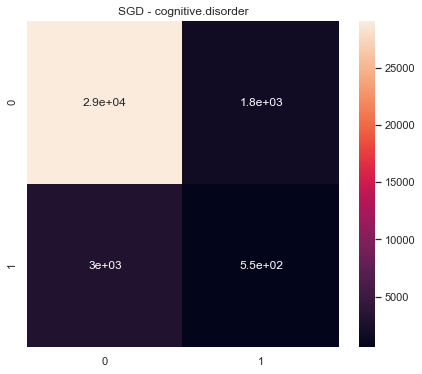

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cognitive.disorder  300.0  0.511512      0.511083         0.512614   
0   2.0  cognitive.disorder  300.0  0.510988      0.511339         0.510761   
0   3.0  cognitive.disorder  300.0  0.470098      0.471528         0.468814   
0   4.0  cognitive.disorder  300.0  0.509342      0.513400         0.540936   
0   5.0  cognitive.disorder  300.0  0.473683      0.475888         0.471905   

   ROC Macro  
0   0.468664  
0   0.525292  
0   0.414913  
0   0.467770  
0   0.447166  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cognitive.disorder  300.0  2.475622    2.483238       2.505031  2.323806
================================== LR ==================================


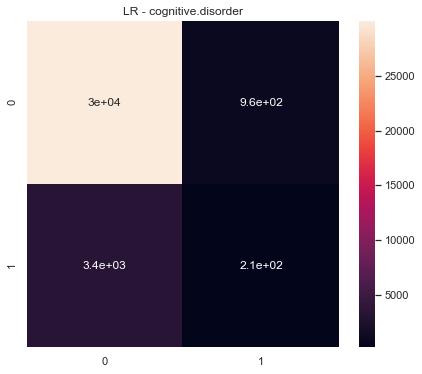

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  cognitive.disorder  300.0  0.486543      0.487110         0.490768   
0   2.0  cognitive.disorder  300.0  0.534930      0.532099         0.540577   
0   3.0  cognitive.disorder  300.0  0.504506      0.526838         0.514280   
0   4.0  cognitive.disorder  300.0  0.502128      0.507677         0.505191   
0   5.0  cognitive.disorder  300.0  0.516575      0.517835         0.515948   

   ROC Macro  
0   0.560529  
0   0.555327  
0   0.527290  
0   0.483294  
0   0.506759  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  cognitive.disorder  300.0  2.544682    2.571558       2.566764  2.633198
================================== coma ==================================
================================== NB ==================================


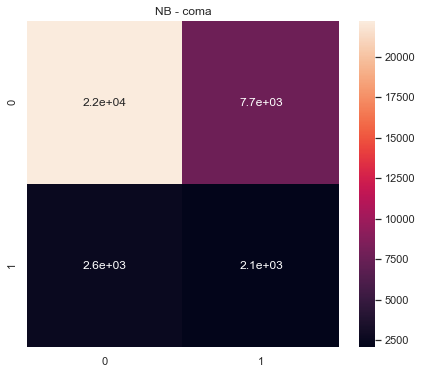

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  coma  300.0  0.533103      0.547998         0.533077   0.576764
0   2.0  coma  300.0  0.543988      0.560305         0.542140   0.585315
0   3.0  coma  300.0  0.495908      0.554253         0.526973   0.570341
0   4.0  coma  300.0  0.530624      0.553870         0.533787   0.585543
0   5.0  coma  300.0  0.532698      0.542286         0.531512   0.577161



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coma  300.0  2.636321    2.758712       2.667489  2.895124
================================== DT ==================================


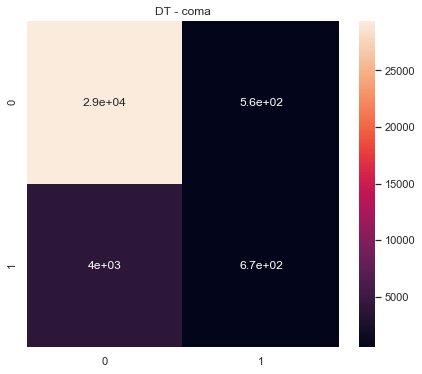

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  coma  300.0  0.502257      0.510733         0.531110   0.524881
0   2.0  coma  300.0  0.493796      0.502004         0.504413   0.533059
0   3.0  coma  300.0  0.483017      0.497780         0.493369   0.516430
0   4.0  coma  300.0  0.505981      0.512290         0.531392   0.547364
0   5.0  coma  300.0  0.488169      0.504677         0.520314   0.522702



    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coma  300.0  2.47322    2.527484       2.580599  2.644436
================================== RF ==================================


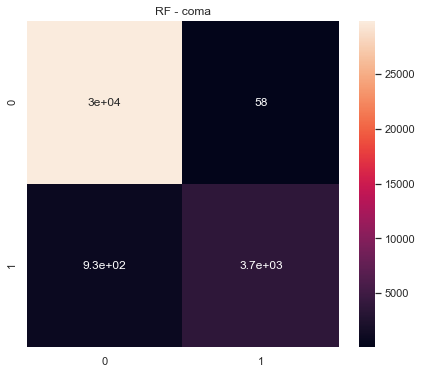

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  coma  300.0  0.464950      0.500122         0.516271   0.583954
0   2.0  coma  300.0  0.460654      0.491765         0.436669   0.542744
0   3.0  coma  300.0  0.460198      0.489546         0.438827   0.524996
0   4.0  coma  300.0  0.468765      0.499893         0.498128   0.527409
0   5.0  coma  300.0  0.463920      0.499749         0.432884   0.543507



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coma  300.0  2.318486    2.481075       2.322779  2.722611
================================== SGD ==================================


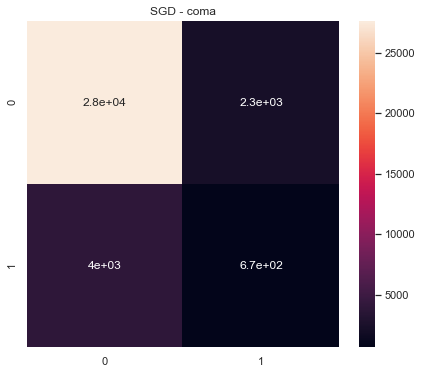

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  coma  300.0  0.478217      0.482213         0.476559   0.438421
0   2.0  coma  300.0  0.495875      0.497353         0.496665   0.481379
0   3.0  coma  300.0  0.475401      0.483490         0.473059   0.443453
0   4.0  coma  300.0  0.496601      0.502596         0.504995   0.496178
0   5.0  coma  300.0  0.505800      0.505933         0.505735   0.533802



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coma  300.0  2.451895    2.471584       2.457014  2.393232
================================== LR ==================================


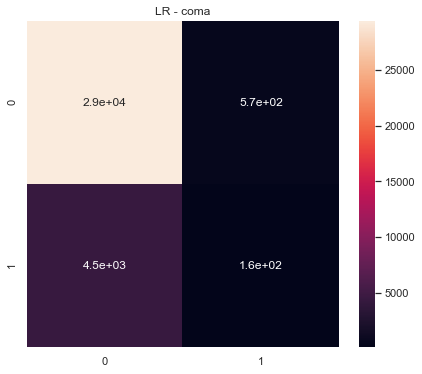

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  coma  300.0  0.523431      0.523366         0.545912   0.545190
0   2.0  coma  300.0  0.480118      0.494103         0.484674   0.526583
0   3.0  coma  300.0  0.515843      0.521433         0.516357   0.553643
0   4.0  coma  300.0  0.530376      0.528159         0.538541   0.566479
0   5.0  coma  300.0  0.503038      0.504700         0.506665   0.567286



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coma  300.0  2.552806    2.571761       2.592149  2.759181
================================== confusion ==================================
================================== NB ==================================


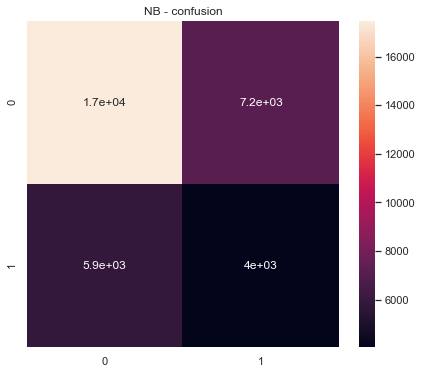

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  confusion  300.0  0.534737      0.535587         0.534336   0.554097
0   2.0  confusion  300.0  0.515925      0.516773         0.519237   0.535917
0   3.0  confusion  300.0  0.530009      0.539060         0.533638   0.547601
0   4.0  confusion  300.0  0.526088      0.528209         0.526166   0.530900
0   5.0  confusion  300.0  0.529386      0.528977         0.530741   0.556129



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  confusion  300.0  2.636144    2.648606       2.644118  2.724644
================================== DT ==================================


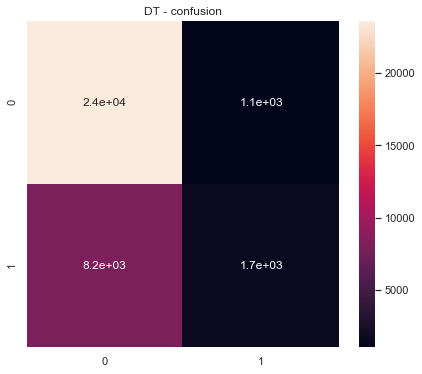

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  confusion  300.0  0.476568      0.506903         0.517744   0.531075
0   2.0  confusion  300.0  0.461611      0.493844         0.485171   0.517251
0   3.0  confusion  300.0  0.449720      0.481280         0.459447   0.505828
0   4.0  confusion  300.0  0.491072      0.514818         0.534099   0.512866
0   5.0  confusion  300.0  0.470047      0.502651         0.506961   0.510683



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  confusion  300.0  2.349017    2.499496       2.503421  2.577703
================================== RF ==================================


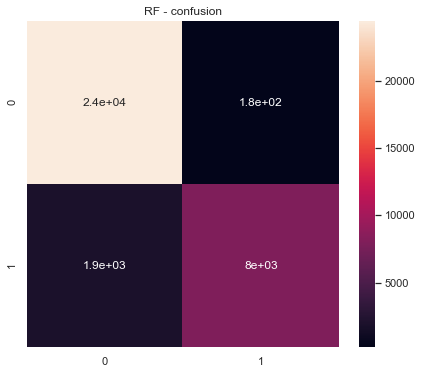

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  confusion  300.0  0.429359      0.502201         0.537908   0.550646
0   2.0  confusion  300.0  0.435236      0.493851         0.467333   0.501121
0   3.0  confusion  300.0  0.430098      0.477809         0.432162   0.532267
0   4.0  confusion  300.0  0.435896      0.504722         0.563317   0.544653
0   5.0  confusion  300.0  0.426043      0.493217         0.447875   0.559301



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  confusion  300.0  2.156631    2.471799       2.448595  2.687989
================================== SGD ==================================


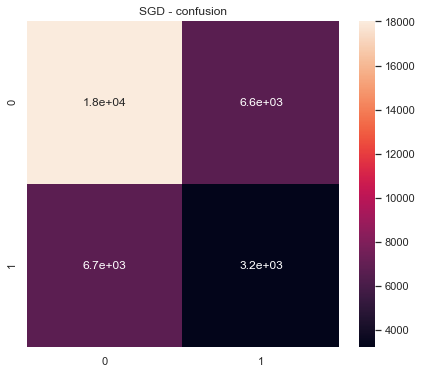

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  confusion  300.0  0.514936      0.516042         0.515108   0.520980
0   2.0  confusion  300.0  0.512404      0.513854         0.516233   0.518988
0   3.0  confusion  300.0  0.493465      0.493799         0.494134   0.491463
0   4.0  confusion  300.0  0.510912      0.511128         0.510869   0.508964
0   5.0  confusion  300.0  0.495495      0.496220         0.495942   0.507205



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  confusion  300.0  2.527212    2.531043       2.532286   2.5476
================================== LR ==================================


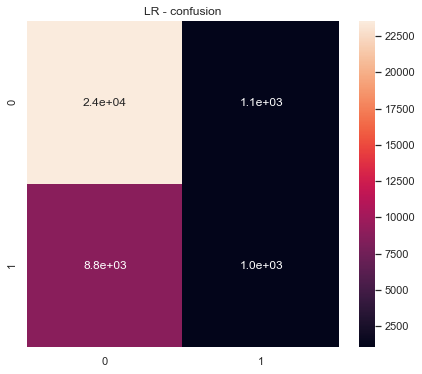

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  confusion  300.0  0.519312      0.524269         0.534214   0.545531
0   2.0  confusion  300.0  0.489651      0.513348         0.530282   0.511050
0   3.0  confusion  300.0  0.491470      0.497276         0.496477   0.509623
0   4.0  confusion  300.0  0.505239      0.522270         0.545012   0.528193
0   5.0  confusion  300.0  0.460220      0.501783         0.505988   0.542868



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  confusion  300.0  2.465892    2.558946       2.611973  2.637266
================================== conjunctivitis ==================================
================================== NB ==================================


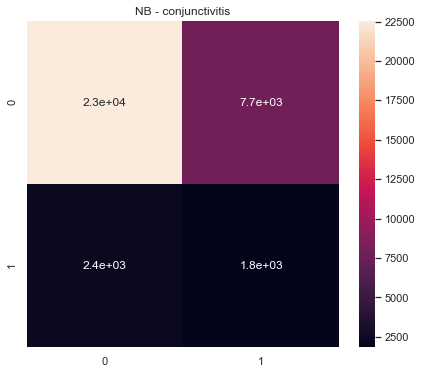

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  conjunctivitis  300.0  0.521511      0.541688         0.525585   
0   2.0  conjunctivitis  300.0  0.531119      0.567958         0.537843   
0   3.0  conjunctivitis  300.0  0.490658      0.542024         0.520132   
0   4.0  conjunctivitis  300.0  0.518252      0.539191         0.523622   
0   5.0  conjunctivitis  300.0  0.510095      0.516442         0.511838   

   ROC Macro  
0   0.593180  
0   0.605020  
0   0.570036  
0   0.564619  
0   0.559655  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  conjunctivitis  300.0  2.571636    2.707302        2.61902  2.892509
================================== DT ==================================


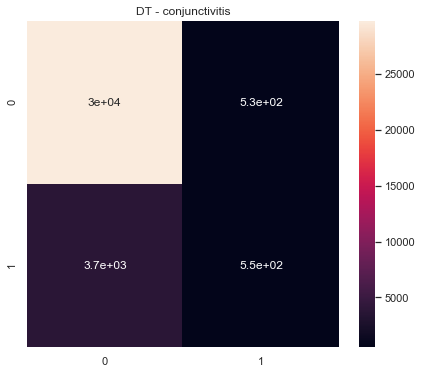

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  conjunctivitis  300.0  0.486701      0.499690         0.499049   
0   2.0  conjunctivitis  300.0  0.493233      0.504433         0.514070   
0   3.0  conjunctivitis  300.0  0.463455      0.472205         0.457359   
0   4.0  conjunctivitis  300.0  0.482520      0.492665         0.484316   
0   5.0  conjunctivitis  300.0  0.487000      0.501734         0.506539   

   ROC Macro  
0   0.520475  
0   0.551058  
0   0.475858  
0   0.494443  
0   0.511466  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  conjunctivitis  300.0  2.412909    2.470728       2.461333   2.5533
================================== RF ==================================


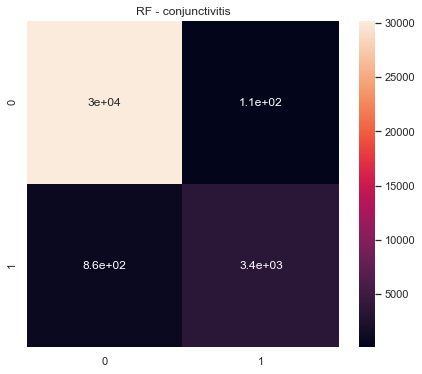

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  conjunctivitis  300.0  0.466903      0.499835         0.438043   
0   2.0  conjunctivitis  300.0  0.463259      0.492567         0.437243   
0   3.0  conjunctivitis  300.0  0.454557      0.468977         0.442495   
0   4.0  conjunctivitis  300.0  0.467125      0.498601         0.457836   
0   5.0  conjunctivitis  300.0  0.469340      0.501086         0.771503   

   ROC Macro  
0   0.573083  
0   0.571132  
0   0.509225  
0   0.448532  
0   0.580213  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  conjunctivitis  300.0  2.321184    2.461066        2.54712  2.682185
================================== SGD ==================================


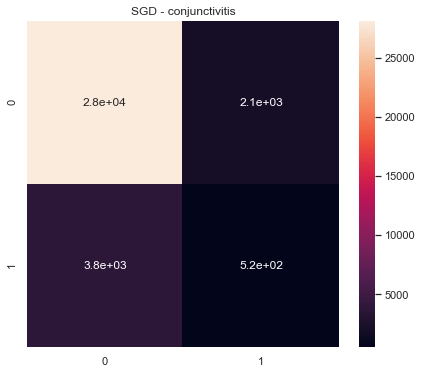

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  conjunctivitis  300.0  0.466322      0.479136         0.459054   
0   2.0  conjunctivitis  300.0  0.471783      0.474767         0.469649   
0   3.0  conjunctivitis  300.0  0.451094      0.447239         0.455795   
0   4.0  conjunctivitis  300.0  0.471325      0.473987         0.469346   
0   5.0  conjunctivitis  300.0  0.472328      0.470533         0.475506   

   ROC Macro  
0   0.414773  
0   0.457402  
0   0.388363  
0   0.436047  
0   0.449672  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  conjunctivitis  300.0  2.332851    2.345662        2.32935  2.146257
================================== LR ==================================


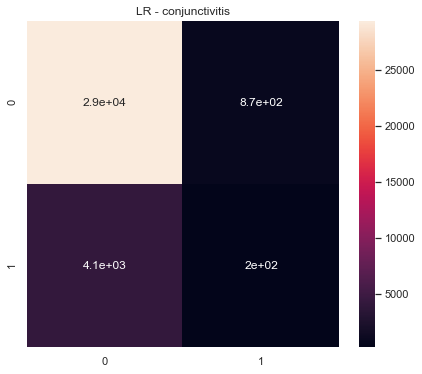

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  conjunctivitis  300.0  0.511805      0.514395         0.511804   
0   2.0  conjunctivitis  300.0  0.480536      0.493560         0.483382   
0   3.0  conjunctivitis  300.0  0.484654      0.486283         0.490306   
0   4.0  conjunctivitis  300.0  0.474525      0.472926         0.478435   
0   5.0  conjunctivitis  300.0  0.501343      0.501550         0.501743   

   ROC Macro  
0   0.551777  
0   0.479984  
0   0.461021  
0   0.435422  
0   0.507114  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  conjunctivitis  300.0  2.452862    2.468715       2.465671  2.435317
================================== constipated ==================================
================================== NB ==================================


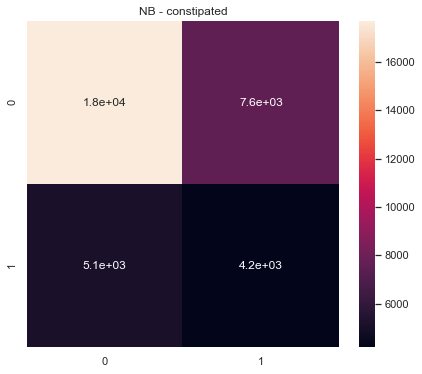

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  constipated  300.0  0.540435      0.540667         0.540235   
0   2.0  constipated  300.0  0.551935      0.554533         0.550910   
0   3.0  constipated  300.0  0.539739      0.549153         0.541862   
0   4.0  constipated  300.0  0.525982      0.533756         0.528823   
0   5.0  constipated  300.0  0.522620      0.522400         0.523015   

   ROC Macro  
0   0.565602  
0   0.579723  
0   0.574724  
0   0.543904  
0   0.555204  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  constipated  300.0  2.680711    2.700509       2.684845  2.819157
================================== DT ==================================


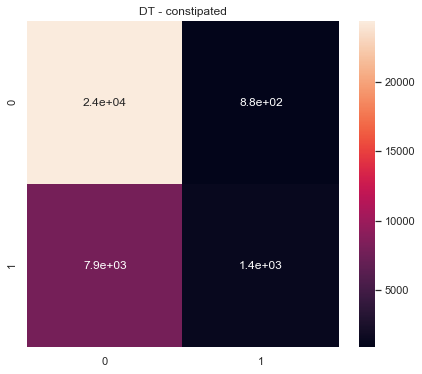

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  constipated  300.0  0.445816      0.501155         0.507682   
0   2.0  constipated  300.0  0.475844      0.513952         0.557272   
0   3.0  constipated  300.0  0.464960      0.487972         0.476409   
0   4.0  constipated  300.0  0.478020      0.496804         0.494021   
0   5.0  constipated  300.0  0.475902      0.511539         0.541358   

   ROC Macro  
0   0.536138  
0   0.522692  
0   0.513326  
0   0.502805  
0   0.515373  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  constipated  300.0  2.340542    2.511423       2.576742  2.590334
================================== RF ==================================


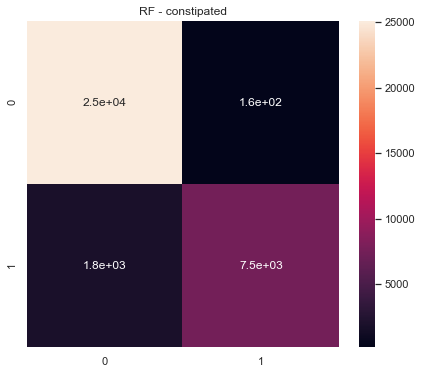

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  constipated  300.0  0.435028      0.502368         0.540739   
0   2.0  constipated  300.0  0.431286      0.502853         0.602674   
0   3.0  constipated  300.0  0.449537      0.485305         0.461409   
0   4.0  constipated  300.0  0.428320      0.483591         0.425504   
0   5.0  constipated  300.0  0.431166      0.502654         0.590774   

   ROC Macro  
0   0.578454  
0   0.574665  
0   0.559600  
0   0.493863  
0   0.586712  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  constipated  300.0  2.175336     2.47677       2.621101  2.793293
================================== SGD ==================================


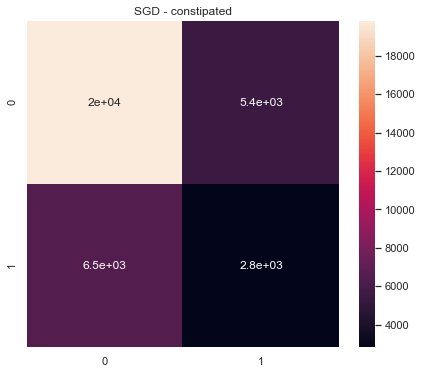

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  constipated  300.0  0.508964      0.510649         0.512708   
0   2.0  constipated  300.0  0.489299      0.492810         0.491312   
0   3.0  constipated  300.0  0.522922      0.522680         0.523388   
0   4.0  constipated  300.0  0.498990      0.499405         0.499437   
0   5.0  constipated  300.0  0.516323      0.516193         0.516595   

   ROC Macro  
0   0.532557  
0   0.490662  
0   0.535959  
0   0.510956  
0   0.511236  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  constipated  300.0  2.536498    2.541735        2.54344  2.58137
================================== LR ==================================


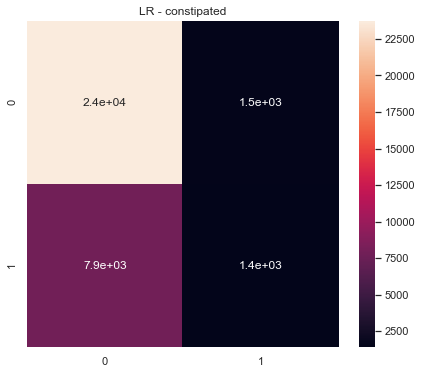

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  constipated  300.0  0.529141      0.530626         0.540238   
0   2.0  constipated  300.0  0.476558      0.508597         0.526130   
0   3.0  constipated  300.0  0.518404      0.519153         0.518274   
0   4.0  constipated  300.0  0.466698      0.478318         0.468897   
0   5.0  constipated  300.0  0.479538      0.500618         0.501261   

   ROC Macro  
0   0.548227  
0   0.536441  
0   0.527406  
0   0.490174  
0   0.518253  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision  Avg ROC
0  constipated  300.0  2.47034    2.537312       2.554801   2.6205
================================== convulsion ==================================
================================== NB ==================================


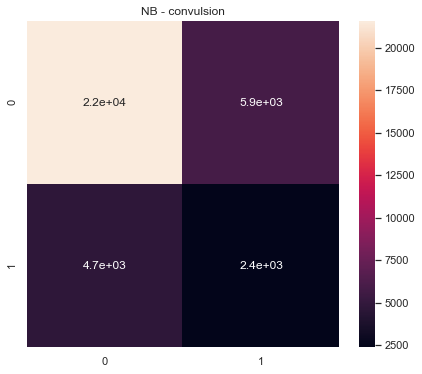

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  convulsion  300.0  0.541285      0.540028         0.543452   0.565242
0   2.0  convulsion  300.0  0.514374      0.518166         0.515361   0.538734
0   3.0  convulsion  300.0  0.532097      0.538416         0.532032   0.571824
0   4.0  convulsion  300.0  0.525168      0.526852         0.524634   0.563475
0   5.0  convulsion  300.0  0.539417      0.537791         0.551184   0.563275



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  convulsion  300.0  2.652341    2.661254       2.666663  2.802549
================================== DT ==================================


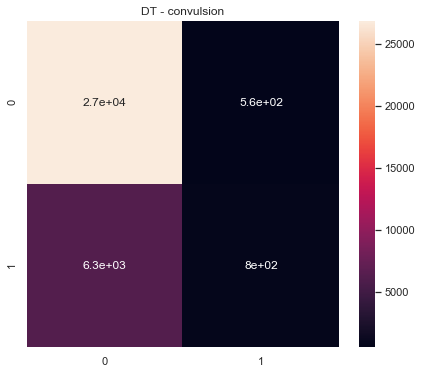

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  convulsion  300.0  0.491914      0.509004         0.523682   0.511800
0   2.0  convulsion  300.0  0.469638      0.504603         0.526521   0.503521
0   3.0  convulsion  300.0  0.487014      0.501288         0.502706   0.535378
0   4.0  convulsion  300.0  0.478065      0.505681         0.522583   0.520984
0   5.0  convulsion  300.0  0.467614      0.504966         0.534018   0.514869



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  convulsion  300.0  2.394246    2.525541        2.60951  2.586551
================================== RF ==================================


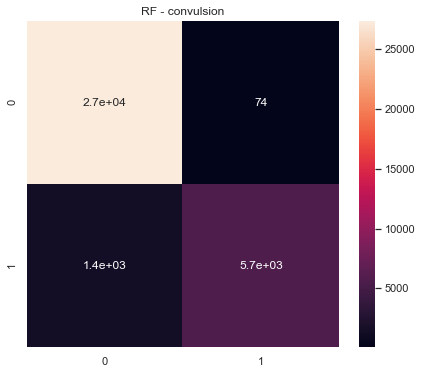

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  convulsion  300.0  0.447268      0.501459         0.591789   0.572798
0   2.0  convulsion  300.0  0.446687      0.500455         0.517798   0.554691
0   3.0  convulsion  300.0  0.447359      0.487006         0.442172   0.552811
0   4.0  convulsion  300.0  0.463236      0.505373         0.555584   0.535321
0   5.0  convulsion  300.0  0.447970      0.500795         0.525793   0.569453



          ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  convulsion  300.0  2.25252    2.495087       2.633136  2.785073
================================== SGD ==================================


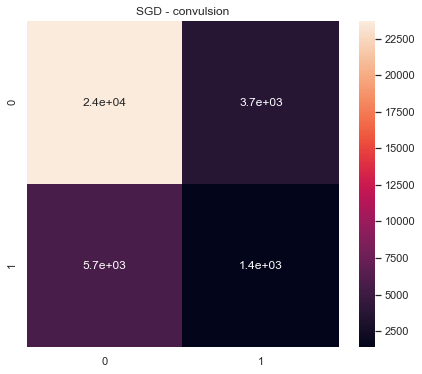

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  convulsion  300.0  0.497448      0.498577         0.498355   0.474326
0   2.0  convulsion  300.0  0.476639      0.490718         0.482666   0.510588
0   3.0  convulsion  300.0  0.521620      0.523208         0.521236   0.530957
0   4.0  convulsion  300.0  0.502516      0.504388         0.505529   0.475943
0   5.0  convulsion  300.0  0.499307      0.501190         0.501469   0.518390



          ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  convulsion  300.0  2.49753    2.518081       2.509255  2.510204
================================== LR ==================================


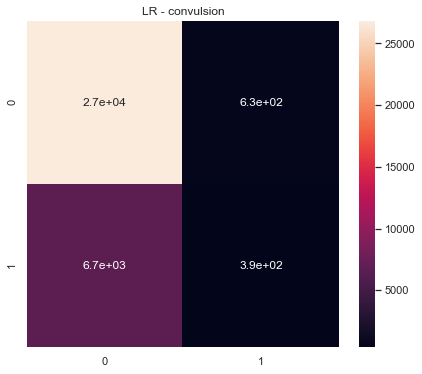

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  convulsion  300.0  0.489187      0.509158         0.527444   0.542945
0   2.0  convulsion  300.0  0.469562      0.507220         0.555958   0.537604
0   3.0  convulsion  300.0  0.520666      0.520804         0.520548   0.546195
0   4.0  convulsion  300.0  0.531817      0.532975         0.555405   0.564211
0   5.0  convulsion  300.0  0.480276      0.501913         0.505405   0.526682



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  convulsion  300.0  2.491508    2.572069       2.664761  2.717638
================================== coughing.blood ==================================
================================== NB ==================================


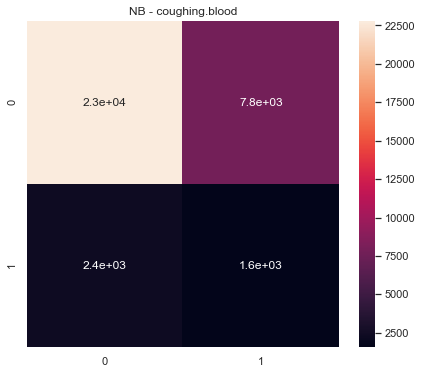

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  coughing.blood  300.0  0.494735      0.510602         0.505958   
0   2.0  coughing.blood  300.0  0.512515      0.529339         0.517631   
0   3.0  coughing.blood  300.0  0.486561      0.525566         0.512071   
0   4.0  coughing.blood  300.0  0.500033      0.518660         0.510440   
0   5.0  coughing.blood  300.0  0.503813      0.522262         0.512669   

   ROC Macro  
0   0.545043  
0   0.563764  
0   0.555343  
0   0.554734  
0   0.549160  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coughing.blood  300.0  2.497657    2.606428       2.558768  2.768044
================================== DT ==================================


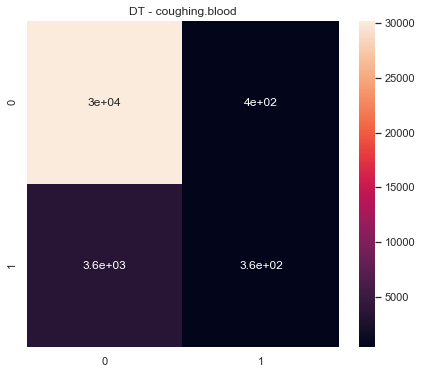

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  coughing.blood  300.0  0.489913      0.502368         0.508554   
0   2.0  coughing.blood  300.0  0.480943      0.496377         0.487086   
0   3.0  coughing.blood  300.0  0.449558      0.455078         0.444369   
0   4.0  coughing.blood  300.0  0.477859      0.492884         0.478181   
0   5.0  coughing.blood  300.0  0.478189      0.500891         0.509240   

   ROC Macro  
0   0.539968  
0   0.540043  
0   0.440141  
0   0.497138  
0   0.505472  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coughing.blood  300.0  2.376462    2.447598        2.42743  2.522762
================================== RF ==================================


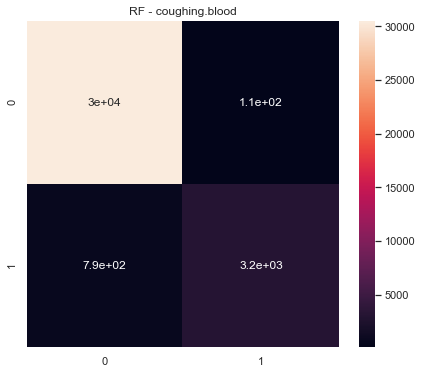

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  coughing.blood  300.0  0.469482      0.499428         0.442923   
0   2.0  coughing.blood  300.0  0.464673      0.489953         0.441874   
0   3.0  coughing.blood  300.0  0.453236      0.467897         0.439466   
0   4.0  coughing.blood  300.0  0.469400      0.499347         0.442843   
0   5.0  coughing.blood  300.0  0.469721      0.499918         0.442965   

   ROC Macro  
0   0.551777  
0   0.507856  
0   0.450403  
0   0.429403  
0   0.535545  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coughing.blood  300.0  2.326513    2.456543       2.210071  2.474985
================================== SGD ==================================


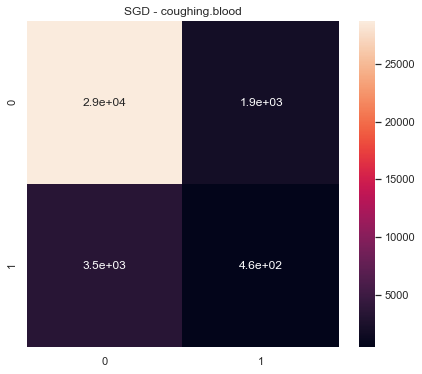

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  coughing.blood  300.0  0.472078      0.476936         0.468863   
0   2.0  coughing.blood  300.0  0.489383      0.494575         0.490855   
0   3.0  coughing.blood  300.0  0.457364      0.468148         0.448153   
0   4.0  coughing.blood  300.0  0.489130      0.490462         0.488695   
0   5.0  coughing.blood  300.0  0.507343      0.513604         0.509515   

   ROC Macro  
0   0.466102  
0   0.479946  
0   0.383437  
0   0.500946  
0   0.512962  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coughing.blood  300.0  2.415298    2.443725       2.406082  2.343394
================================== LR ==================================


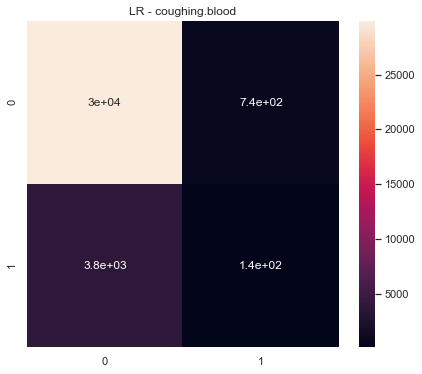

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  coughing.blood  300.0  0.499488      0.499502         0.499492   
0   2.0  coughing.blood  300.0  0.478599      0.491763         0.478273   
0   3.0  coughing.blood  300.0  0.481448      0.484013         0.489673   
0   4.0  coughing.blood  300.0  0.476567      0.478587         0.475099   
0   5.0  coughing.blood  300.0  0.504650      0.505328         0.504716   

   ROC Macro  
0   0.513527  
0   0.470592  
0   0.447531  
0   0.477416  
0   0.499248  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  coughing.blood  300.0  2.440751    2.459193       2.447253  2.408315
================================== deep.vein.thromboses ==================================
================================== NB ==================================


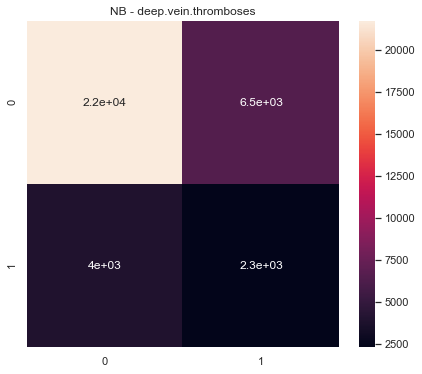

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deep.vein.thromboses  300.0  0.529648      0.532745         0.528764   
0   2.0  deep.vein.thromboses  300.0  0.509626      0.512203         0.510360   
0   3.0  deep.vein.thromboses  300.0  0.494915      0.513519         0.509017   
0   4.0  deep.vein.thromboses  300.0  0.516206      0.522502         0.517810   
0   5.0  deep.vein.thromboses  300.0  0.513917      0.514349         0.513708   

   ROC Macro  
0   0.571102  
0   0.539276  
0   0.520063  
0   0.531298  
0   0.538473  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deep.vein.thromboses  300.0  2.564311    2.595318        2.57966  2.700211
================================== DT ==================================


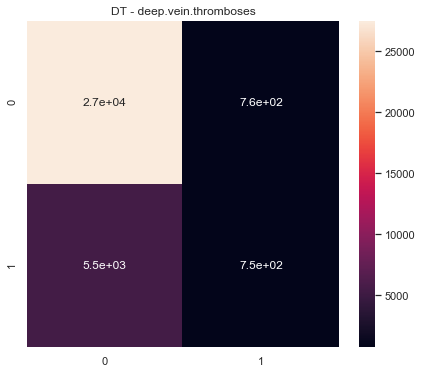

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deep.vein.thromboses  300.0  0.454805      0.481253         0.447923   
0   2.0  deep.vein.thromboses  300.0  0.457113      0.476901         0.451399   
0   3.0  deep.vein.thromboses  300.0  0.443034      0.458236         0.433248   
0   4.0  deep.vein.thromboses  300.0  0.462871      0.476169         0.459446   
0   5.0  deep.vein.thromboses  300.0  0.490703      0.509252         0.531401   

   ROC Macro  
0   0.494483  
0   0.478423  
0   0.468735  
0   0.427023  
0   0.521183  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deep.vein.thromboses  300.0  2.308525    2.401811       2.323417  2.389848
================================== RF ==================================


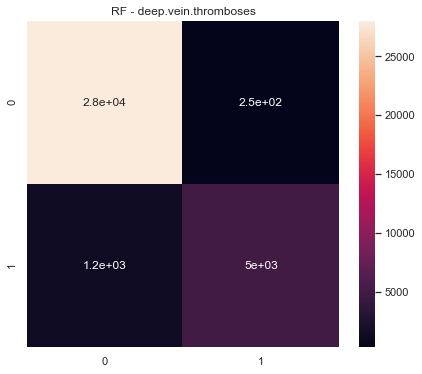

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deep.vein.thromboses  300.0  0.447386      0.485790         0.428145   
0   2.0  deep.vein.thromboses  300.0  0.440053      0.477656         0.411012   
0   3.0  deep.vein.thromboses  300.0  0.436631      0.463931         0.416695   
0   4.0  deep.vein.thromboses  300.0  0.457486      0.484171         0.453578   
0   5.0  deep.vein.thromboses  300.0  0.449789      0.499823         0.408861   

   ROC Macro  
0   0.550819  
0   0.526112  
0   0.482436  
0   0.423325  
0   0.539268  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  deep.vein.thromboses  300.0  2.231345     2.41137       2.118291  2.52196
================================== SGD ==================================


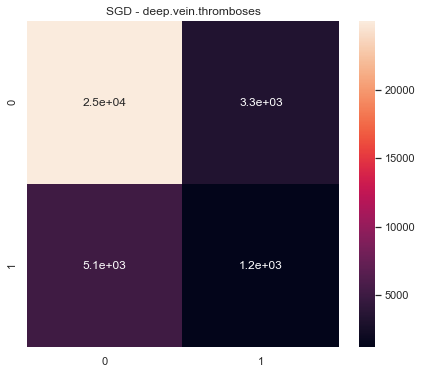

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deep.vein.thromboses  300.0  0.470544      0.470180         0.470961   
0   2.0  deep.vein.thromboses  300.0  0.467933      0.470488         0.466373   
0   3.0  deep.vein.thromboses  300.0  0.442448      0.447894         0.438144   
0   4.0  deep.vein.thromboses  300.0  0.462921      0.463307         0.462562   
0   5.0  deep.vein.thromboses  300.0  0.475338      0.478790         0.474166   

   ROC Macro  
0   0.451091  
0   0.440517  
0   0.447249  
0   0.422984  
0   0.479013  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deep.vein.thromboses  300.0  2.319184    2.330659       2.312206  2.240855
================================== LR ==================================


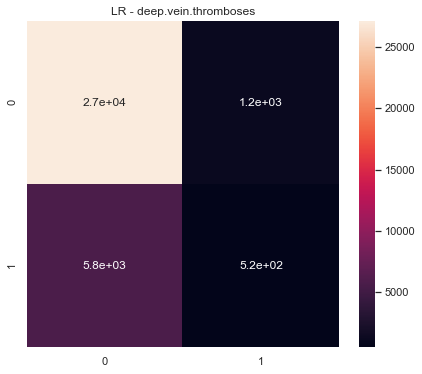

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deep.vein.thromboses  300.0  0.519720      0.519297         0.520513   
0   2.0  deep.vein.thromboses  300.0  0.469975      0.486303         0.471622   
0   3.0  deep.vein.thromboses  300.0  0.476640      0.481659         0.486763   
0   4.0  deep.vein.thromboses  300.0  0.445745      0.445596         0.445896   
0   5.0  deep.vein.thromboses  300.0  0.487376      0.500340         0.500739   

   ROC Macro  
0   0.523487  
0   0.466584  
0   0.466348  
0   0.430083  
0   0.478891  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deep.vein.thromboses  300.0  2.399458    2.433195       2.425532  2.365393
================================== deglutition.disorder ==================================
================================== NB ==================================


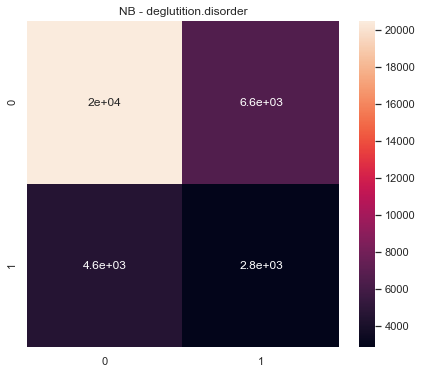

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deglutition.disorder  300.0  0.535939      0.537445         0.535136   
0   2.0  deglutition.disorder  300.0  0.546038      0.554876         0.545414   
0   3.0  deglutition.disorder  300.0  0.528829      0.539595         0.531316   
0   4.0  deglutition.disorder  300.0  0.536796      0.539737         0.535841   
0   5.0  deglutition.disorder  300.0  0.534770      0.535738         0.534150   

   ROC Macro  
0   0.573704  
0   0.577931  
0   0.557516  
0   0.559996  
0   0.552857  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deglutition.disorder  300.0  2.682372     2.70739       2.681857  2.822004
================================== DT ==================================


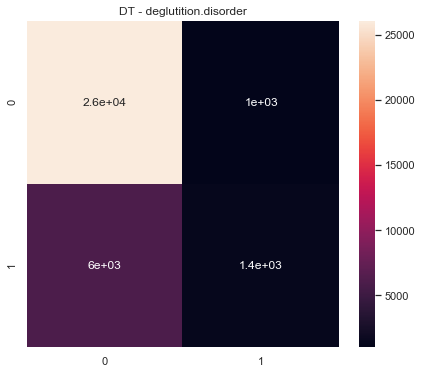

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deglutition.disorder  300.0  0.477850      0.506542         0.525510   
0   2.0  deglutition.disorder  300.0  0.510765      0.519997         0.541531   
0   3.0  deglutition.disorder  300.0  0.471952      0.488765         0.478112   
0   4.0  deglutition.disorder  300.0  0.493951      0.501007         0.501556   
0   5.0  deglutition.disorder  300.0  0.499953      0.518158         0.555531   

   ROC Macro  
0   0.548623  
0   0.541336  
0   0.514034  
0   0.507578  
0   0.545635  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deglutition.disorder  300.0  2.45447    2.534469        2.60224  2.657206
================================== RF ==================================


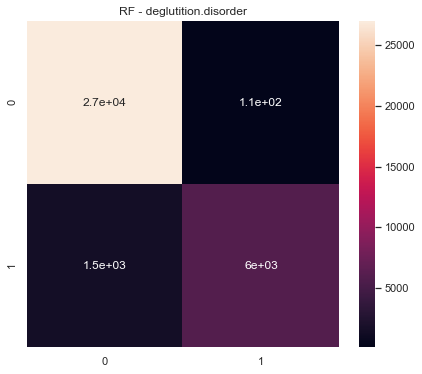

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deglutition.disorder  300.0  0.446777      0.501813         0.559160   
0   2.0  deglutition.disorder  300.0  0.440805      0.500302         0.558903   
0   3.0  deglutition.disorder  300.0  0.444915      0.477663         0.437400   
0   4.0  deglutition.disorder  300.0  0.438020      0.491989         0.413463   
0   5.0  deglutition.disorder  300.0  0.440145      0.499010         0.442002   

   ROC Macro  
0   0.589051  
0   0.591308  
0   0.544619  
0   0.491624  
0   0.582405  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deglutition.disorder  300.0  2.210661    2.470777       2.410927  2.799008
================================== SGD ==================================


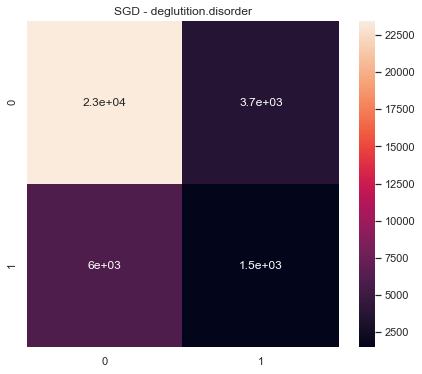

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deglutition.disorder  300.0  0.482404      0.484754         0.482240   
0   2.0  deglutition.disorder  300.0  0.497477      0.499299         0.499155   
0   3.0  deglutition.disorder  300.0  0.436863      0.439933         0.434341   
0   4.0  deglutition.disorder  300.0  0.469580      0.478945         0.469355   
0   5.0  deglutition.disorder  300.0  0.467409      0.473670         0.465947   

   ROC Macro  
0   0.471790  
0   0.478588  
0   0.422716  
0   0.452204  
0   0.472858  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deglutition.disorder  300.0  2.353733    2.376601       2.351038  2.298157
================================== LR ==================================


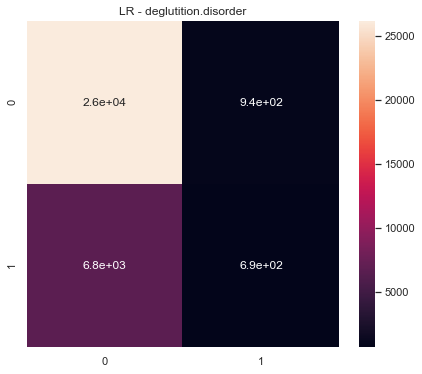

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  deglutition.disorder  300.0  0.541841      0.540016         0.549026   
0   2.0  deglutition.disorder  300.0  0.475777      0.512469         0.594980   
0   3.0  deglutition.disorder  300.0  0.506480      0.506522         0.506958   
0   4.0  deglutition.disorder  300.0  0.481972      0.488191         0.483720   
0   5.0  deglutition.disorder  300.0  0.493484      0.504445         0.508227   

   ROC Macro  
0   0.570379  
0   0.530993  
0   0.515930  
0   0.495137  
0   0.543377  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  deglutition.disorder  300.0  2.499555    2.551644       2.642912  2.655816
================================== dehydration ==================================
================================== NB ==================================


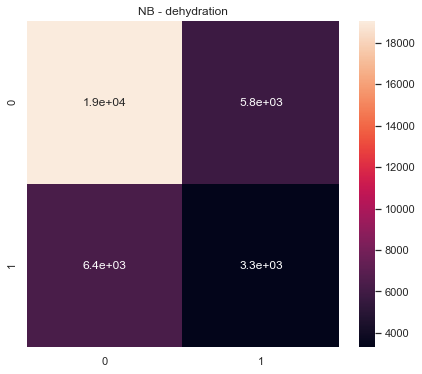

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  dehydration  300.0  0.529335      0.529485         0.529211   
0   2.0  dehydration  300.0  0.534668      0.534724         0.534615   
0   3.0  dehydration  300.0  0.508409      0.508840         0.508485   
0   4.0  dehydration  300.0  0.515301      0.515364         0.516567   
0   5.0  dehydration  300.0  0.529280      0.530949         0.540121   

   ROC Macro  
0   0.555124  
0   0.555697  
0   0.530033  
0   0.505600  
0   0.549959  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dehydration  300.0  2.616994    2.619362          2.629  2.696414
================================== DT ==================================


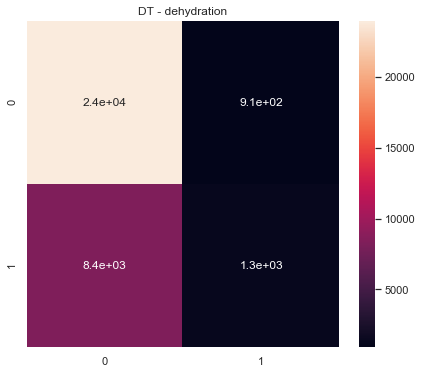

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  dehydration  300.0  0.465729      0.502366         0.507188   
0   2.0  dehydration  300.0  0.469621      0.511229         0.545499   
0   3.0  dehydration  300.0  0.432310      0.473787         0.431460   
0   4.0  dehydration  300.0  0.451019      0.474657         0.454494   
0   5.0  dehydration  300.0  0.473351      0.510125         0.534092   

   ROC Macro  
0   0.549709  
0   0.514069  
0   0.487223  
0   0.452711  
0   0.509870  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dehydration  300.0  2.29203    2.472164       2.472733  2.513582
================================== RF ==================================


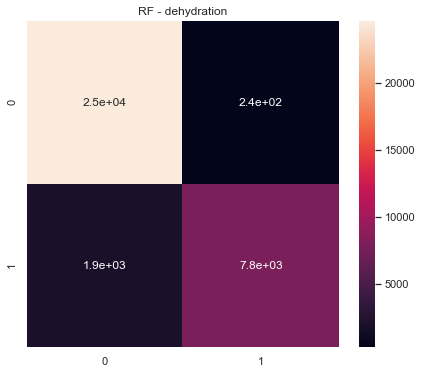

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  dehydration  300.0  0.443283      0.507010         0.580865   
0   2.0  dehydration  300.0  0.440712      0.506265         0.581380   
0   3.0  dehydration  300.0  0.436404      0.469874         0.435540   
0   4.0  dehydration  300.0  0.424922      0.474037         0.418365   
0   5.0  dehydration  300.0  0.435964      0.505583         0.607678   

   ROC Macro  
0   0.574214  
0   0.586335  
0   0.507630  
0   0.452526  
0   0.558052  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dehydration  300.0  2.181284    2.462769       2.623828  2.678758
================================== SGD ==================================


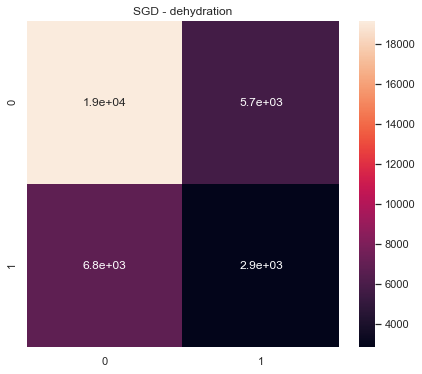

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  dehydration  300.0  0.518679      0.518596         0.518794   
0   2.0  dehydration  300.0  0.488022      0.504393         0.507858   
0   3.0  dehydration  300.0  0.475510      0.478503         0.475506   
0   4.0  dehydration  300.0  0.470598      0.470661         0.470539   
0   5.0  dehydration  300.0  0.505056      0.505859         0.506494   

   ROC Macro  
0   0.537038  
0   0.497721  
0   0.463528  
0   0.479878  
0   0.503069  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dehydration  300.0  2.457865    2.478012       2.479191  2.481234
================================== LR ==================================


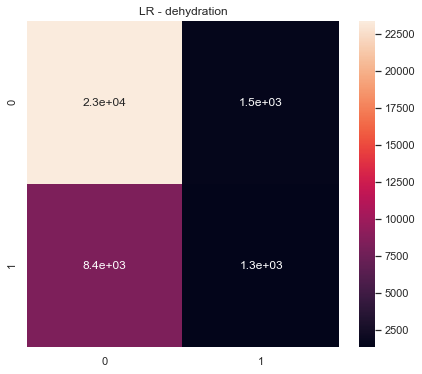

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  dehydration  300.0  0.521269      0.526278         0.538148   
0   2.0  dehydration  300.0  0.448360      0.503200         0.519018   
0   3.0  dehydration  300.0  0.474269      0.475161         0.473892   
0   4.0  dehydration  300.0  0.444789      0.454766         0.442065   
0   5.0  dehydration  300.0  0.494669      0.507470         0.512384   

   ROC Macro  
0   0.565722  
0   0.498627  
0   0.470273  
0   0.423746  
0   0.499387  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dehydration  300.0  2.383357    2.466874       2.485507  2.457756
================================== diarrhea ==================================
================================== NB ==================================


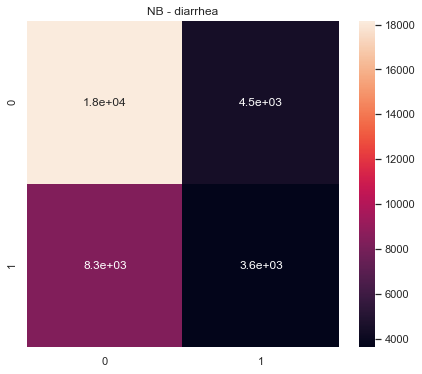

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  diarrhea  300.0  0.517696      0.525444         0.534318   0.548842
0   2.0  diarrhea  300.0  0.512899      0.518864         0.523962   0.543419
0   3.0  diarrhea  300.0  0.509485      0.521068         0.530562   0.549456
0   4.0  diarrhea  300.0  0.507851      0.516304         0.521786   0.517437
0   5.0  diarrhea  300.0  0.513341      0.528483         0.545872   0.532563



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diarrhea  300.0  2.561271    2.610164       2.656499  2.691717
================================== DT ==================================


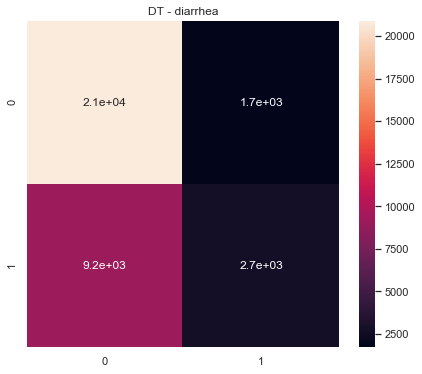

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  diarrhea  300.0  0.467462      0.507718         0.519025   0.511752
0   2.0  diarrhea  300.0  0.478267      0.510506         0.522245   0.521496
0   3.0  diarrhea  300.0  0.458333      0.493662         0.486913   0.504251
0   4.0  diarrhea  300.0  0.482626      0.511897         0.523881   0.514604
0   5.0  diarrhea  300.0  0.479199      0.500528         0.500867   0.490596



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  diarrhea  300.0  2.365888     2.52431       2.552932   2.5427
================================== RF ==================================


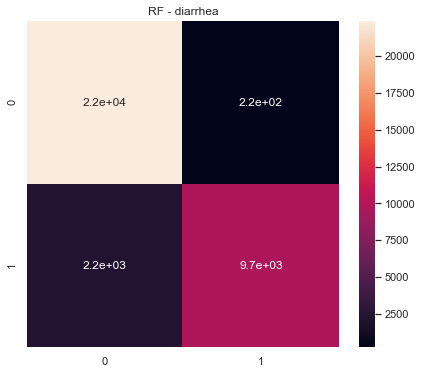

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  diarrhea  300.0  0.447575      0.512947         0.566287   0.584271
0   2.0  diarrhea  300.0  0.443834      0.511760         0.564855   0.562521
0   3.0  diarrhea  300.0  0.441712      0.497215         0.491046   0.551614
0   4.0  diarrhea  300.0  0.444804      0.502900         0.510487   0.517825
0   5.0  diarrhea  300.0  0.439396      0.511526         0.575010   0.563700



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diarrhea  300.0  2.217322    2.536349       2.707685  2.779931
================================== SGD ==================================


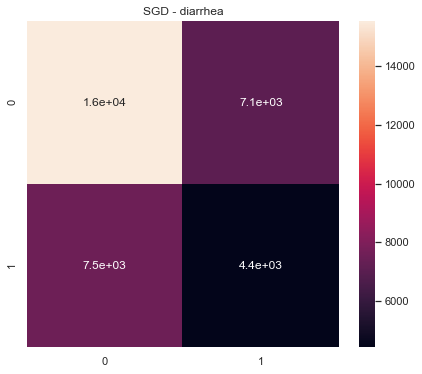

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  diarrhea  300.0  0.515626      0.515732         0.515581   0.516381
0   2.0  diarrhea  300.0  0.504620      0.505368         0.505720   0.500625
0   3.0  diarrhea  300.0  0.497681      0.506319         0.508269   0.505152
0   4.0  diarrhea  300.0  0.495648      0.496474         0.496638   0.496416
0   5.0  diarrhea  300.0  0.505636      0.505659         0.505629   0.507388



        ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diarrhea  300.0  2.51921    2.529551       2.531838  2.525962
================================== LR ==================================


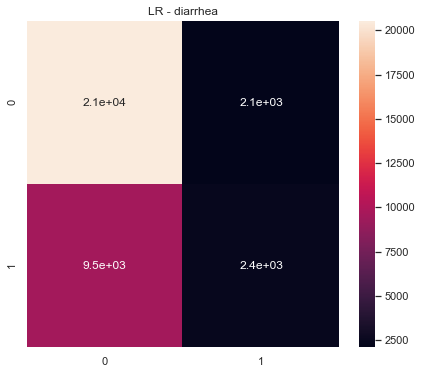

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  diarrhea  300.0  0.542503      0.546653         0.561133   0.571171
0   2.0  diarrhea  300.0  0.468092      0.502040         0.504276   0.497339
0   3.0  diarrhea  300.0  0.480503      0.503606         0.506188   0.505789
0   4.0  diarrhea  300.0  0.500120      0.503208         0.503675   0.496247
0   5.0  diarrhea  300.0  0.488787      0.522061         0.551181   0.536769



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diarrhea  300.0  2.480005    2.577568       2.626453  2.607316
================================== difficulty.in.walking ==================================
================================== NB ==================================


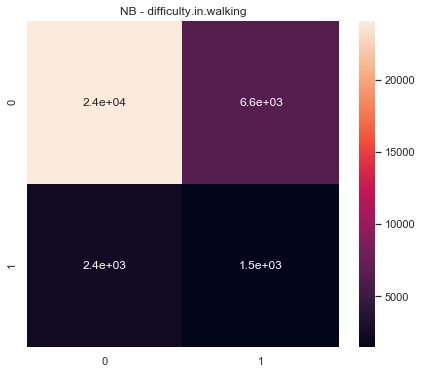

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  difficulty.in.walking  300.0  0.548815      0.557802   
0   2.0  difficulty.in.walking  300.0  0.528923      0.544125   
0   3.0  difficulty.in.walking  300.0  0.515743      0.547170   
0   4.0  difficulty.in.walking  300.0  0.499962      0.526523   
0   5.0  difficulty.in.walking  300.0  0.505153      0.512454   

   Precision Macro  ROC Macro  
0         0.545018   0.603315  
0         0.528891   0.575150  
0         0.525156   0.584573  
0         0.513869   0.544753  
0         0.508378   0.551910  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  difficulty.in.walking  300.0  2.598596    2.688073       2.621312  2.859701
================================== DT ==================================


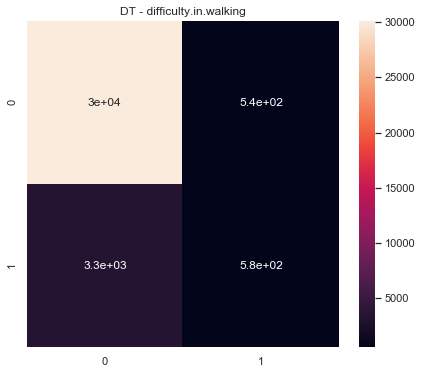

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  difficulty.in.walking  300.0  0.499345      0.508100   
0   2.0  difficulty.in.walking  300.0  0.493805      0.500200   
0   3.0  difficulty.in.walking  300.0  0.486691      0.489894   
0   4.0  difficulty.in.walking  300.0  0.503583      0.507610   
0   5.0  difficulty.in.walking  300.0  0.499120      0.509702   

   Precision Macro  ROC Macro  
0         0.527587   0.550465  
0         0.500417   0.540961  
0         0.486109   0.513133  
0         0.515987   0.508813  
0         0.544403   0.535590  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  difficulty.in.walking  300.0  2.482544    2.515506       2.574504  2.648963
================================== RF ==================================


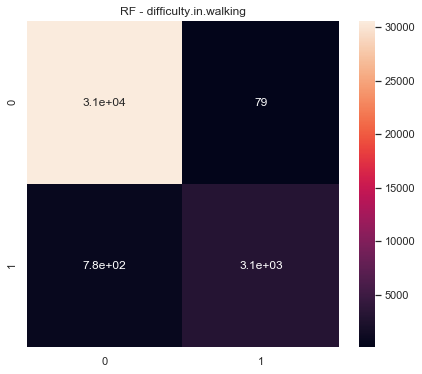

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  difficulty.in.walking  300.0  0.469604      0.499184   
0   2.0  difficulty.in.walking  300.0  0.482032      0.497393   
0   3.0  difficulty.in.walking  300.0  0.466258      0.488047   
0   4.0  difficulty.in.walking  300.0  0.468298      0.496654   
0   5.0  difficulty.in.walking  300.0  0.469925      0.499837   

   Precision Macro  ROC Macro  
0         0.443333   0.538510  
0         0.490267   0.559138  
0         0.450855   0.542565  
0         0.443005   0.528579  
0         0.443391   0.586852  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  difficulty.in.walking  300.0  2.356117    2.481116       2.270851  2.755644
================================== SGD ==================================


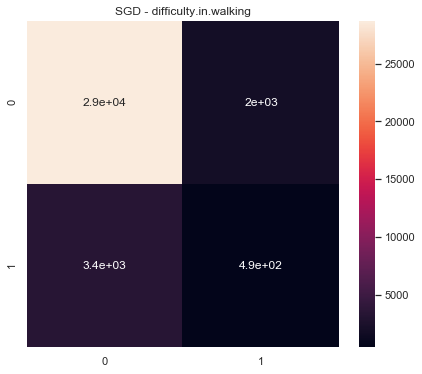

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  difficulty.in.walking  300.0  0.498006      0.498102   
0   2.0  difficulty.in.walking  300.0  0.484255      0.483732   
0   3.0  difficulty.in.walking  300.0  0.468384      0.472429   
0   4.0  difficulty.in.walking  300.0  0.479188      0.481116   
0   5.0  difficulty.in.walking  300.0  0.493382      0.493349   

   Precision Macro  ROC Macro  
0         0.498006   0.477140  
0         0.487128   0.471675  
0         0.465259   0.422857  
0         0.477888   0.445654  
0         0.494173   0.456757  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  difficulty.in.walking  300.0  2.423214    2.428728       2.422454  2.274082
================================== LR ==================================


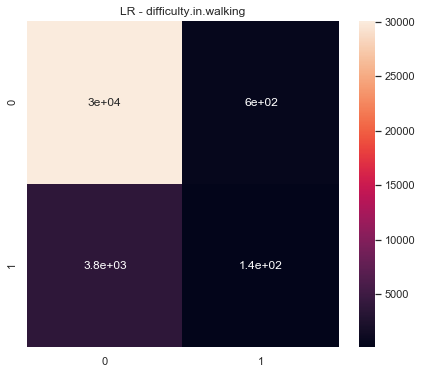

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  difficulty.in.walking  300.0  0.495857      0.503164   
0   2.0  difficulty.in.walking  300.0  0.512177      0.512013   
0   3.0  difficulty.in.walking  300.0  0.501590      0.506849   
0   4.0  difficulty.in.walking  300.0  0.488626      0.488992   
0   5.0  difficulty.in.walking  300.0  0.523796      0.522033   

   Precision Macro  ROC Macro  
0         0.507720   0.536068  
0         0.516679   0.557111  
0         0.504743   0.529162  
0         0.488364   0.489284  
0         0.531010   0.511862  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  difficulty.in.walking  300.0  2.522046     2.53305       2.548516  2.623487
================================== disease.of.liver ==================================
================================== NB ==================================


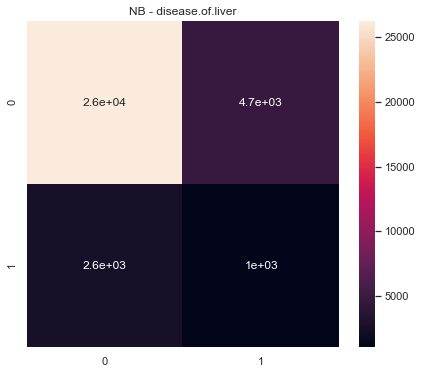

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disease.of.liver  300.0  0.518791      0.521076         0.517920   
0   2.0  disease.of.liver  300.0  0.513119      0.516757         0.513002   
0   3.0  disease.of.liver  300.0  0.519746      0.522653         0.518784   
0   4.0  disease.of.liver  300.0  0.515454      0.527340         0.517442   
0   5.0  disease.of.liver  300.0  0.534239      0.537366         0.532382   

   ROC Macro  
0   0.545658  
0   0.527560  
0   0.558102  
0   0.535333  
0   0.581063  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disease.of.liver  300.0  2.601349    2.625192        2.59953  2.747716
================================== DT ==================================


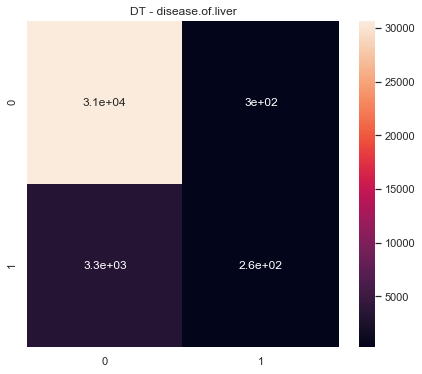

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disease.of.liver  300.0  0.465300      0.475583         0.457205   
0   2.0  disease.of.liver  300.0  0.483931      0.502077         0.516920   
0   3.0  disease.of.liver  300.0  0.485332      0.504015         0.546566   
0   4.0  disease.of.liver  300.0  0.477537      0.497276         0.482370   
0   5.0  disease.of.liver  300.0  0.478455      0.491497         0.476385   

   ROC Macro  
0   0.507119  
0   0.506448  
0   0.526758  
0   0.531581  
0   0.512774  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disease.of.liver  300.0  2.390554    2.470448       2.479446  2.584679
================================== RF ==================================


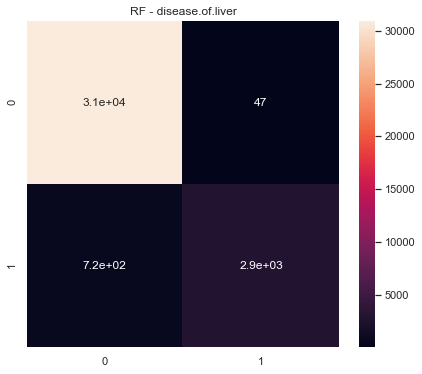

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disease.of.liver  300.0  0.469604      0.494025         0.447484   
0   2.0  disease.of.liver  300.0  0.472559      0.500000         0.447974   
0   3.0  disease.of.liver  300.0  0.476758      0.500278         0.505143   
0   4.0  disease.of.liver  300.0  0.472237      0.499354         0.447914   
0   5.0  disease.of.liver  300.0  0.467555      0.489985         0.447089   

   ROC Macro  
0   0.522101  
0   0.521388  
0   0.553228  
0   0.536392  
0   0.532302  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disease.of.liver  300.0  2.358714    2.483642       2.295604  2.665412
================================== SGD ==================================


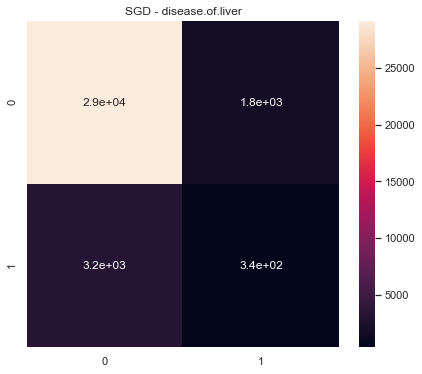

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disease.of.liver  300.0  0.478039      0.477012         0.479404   
0   2.0  disease.of.liver  300.0  0.484950      0.485234         0.489458   
0   3.0  disease.of.liver  300.0  0.479319      0.497617         0.486541   
0   4.0  disease.of.liver  300.0  0.491364      0.494399         0.491811   
0   5.0  disease.of.liver  300.0  0.488676      0.488438         0.488990   

   ROC Macro  
0   0.427084  
0   0.486066  
0   0.450857  
0   0.487826  
0   0.523161  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disease.of.liver  300.0  2.422349    2.442701       2.436203  2.374994
================================== LR ==================================


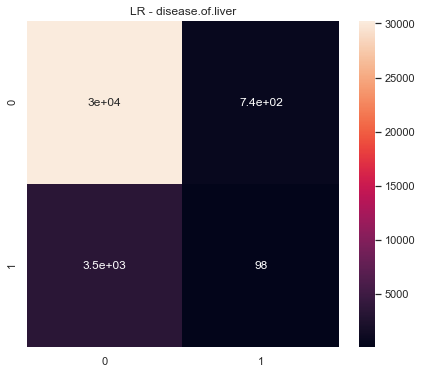

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disease.of.liver  300.0  0.500205      0.515772         0.508812   
0   2.0  disease.of.liver  300.0  0.481892      0.494732         0.483996   
0   3.0  disease.of.liver  300.0  0.489208      0.493973         0.489956   
0   4.0  disease.of.liver  300.0  0.485105      0.486015         0.490366   
0   5.0  disease.of.liver  300.0  0.491649      0.491484         0.492694   

   ROC Macro  
0   0.485715  
0   0.519680  
0   0.545581  
0   0.505135  
0   0.473033  



                ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disease.of.liver  300.0  2.44806    2.481976       2.465824  2.529145
================================== disorder.Renal ==================================
================================== NB ==================================


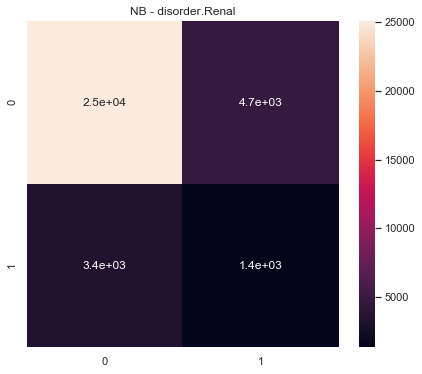

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disorder.Renal  300.0  0.528897      0.529469         0.528423   
0   2.0  disorder.Renal  300.0  0.524614      0.523464         0.527115   
0   3.0  disorder.Renal  300.0  0.507626      0.509617         0.508028   
0   4.0  disorder.Renal  300.0  0.534758      0.535057         0.534481   
0   5.0  disorder.Renal  300.0  0.516144      0.516035         0.516266   

   ROC Macro  
0   0.553194  
0   0.544215  
0   0.564256  
0   0.574470  
0   0.550216  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disorder.Renal  300.0  2.612038    2.613643       2.614313  2.786351
================================== DT ==================================


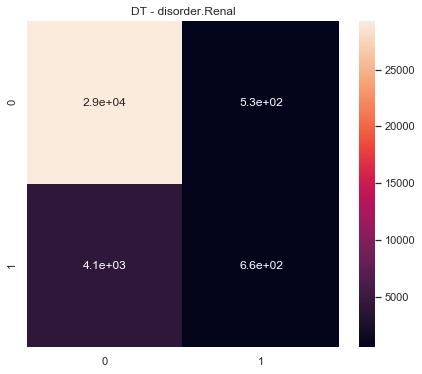

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disorder.Renal  300.0  0.493651      0.509429         0.546369   
0   2.0  disorder.Renal  300.0  0.496047      0.506301         0.517454   
0   3.0  disorder.Renal  300.0  0.469046      0.482798         0.464473   
0   4.0  disorder.Renal  300.0  0.500161      0.508785         0.523330   
0   5.0  disorder.Renal  300.0  0.495710      0.508576         0.531368   

   ROC Macro  
0   0.545984  
0   0.521467  
0   0.532066  
0   0.526779  
0   0.555613  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  disorder.Renal  300.0  2.454615    2.515888       2.582994  2.68191
================================== RF ==================================


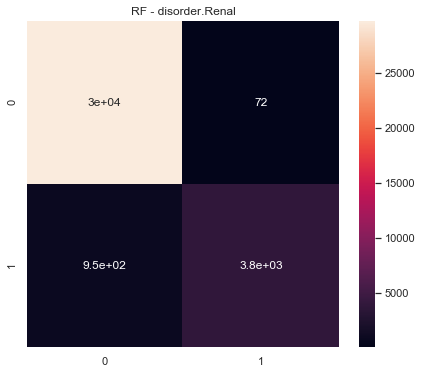

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disorder.Renal  300.0  0.462926      0.499748         0.431157   
0   2.0  disorder.Renal  300.0  0.461922      0.497735         0.430917   
0   3.0  disorder.Renal  300.0  0.449709      0.473821         0.427933   
0   4.0  disorder.Renal  300.0  0.465448      0.499983         0.499366   
0   5.0  disorder.Renal  300.0  0.465084      0.500800         0.631272   

   ROC Macro  
0   0.565010  
0   0.529236  
0   0.528939  
0   0.564458  
0   0.582008  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disorder.Renal  300.0  2.305088    2.472087       2.420644  2.769651
================================== SGD ==================================


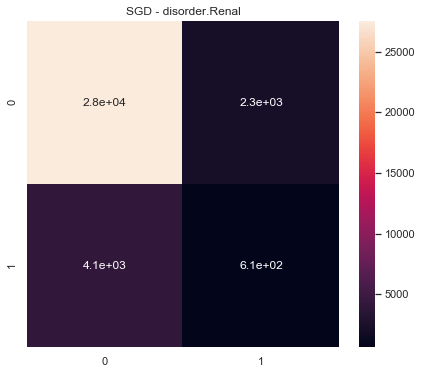

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disorder.Renal  300.0  0.491351      0.494945         0.492728   
0   2.0  disorder.Renal  300.0  0.474903      0.489241         0.474675   
0   3.0  disorder.Renal  300.0  0.474166      0.475685         0.473031   
0   4.0  disorder.Renal  300.0  0.469518      0.492638         0.469502   
0   5.0  disorder.Renal  300.0  0.489331      0.489623         0.489139   

   ROC Macro  
0   0.508952  
0   0.461143  
0   0.444559  
0   0.477538  
0   0.455433  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disorder.Renal  300.0  2.399269    2.442133       2.399075  2.347625
================================== LR ==================================


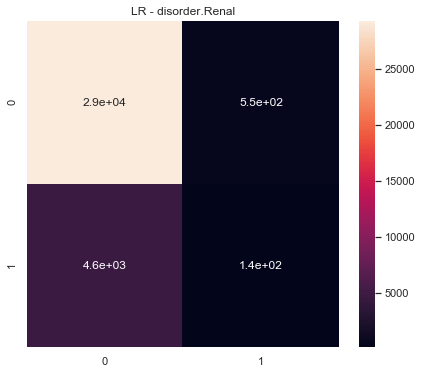

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  disorder.Renal  300.0  0.503472      0.503701         0.503480   
0   2.0  disorder.Renal  300.0  0.489380      0.498834         0.497456   
0   3.0  disorder.Renal  300.0  0.502659      0.502667         0.502818   
0   4.0  disorder.Renal  300.0  0.506643      0.511262         0.523518   
0   5.0  disorder.Renal  300.0  0.499880      0.507359         0.517235   

   ROC Macro  
0   0.517055  
0   0.510294  
0   0.554344  
0   0.552481  
0   0.495481  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  disorder.Renal  300.0  2.502033    2.523823       2.544507  2.629656
================================== diverticulitis ==================================
================================== NB ==================================


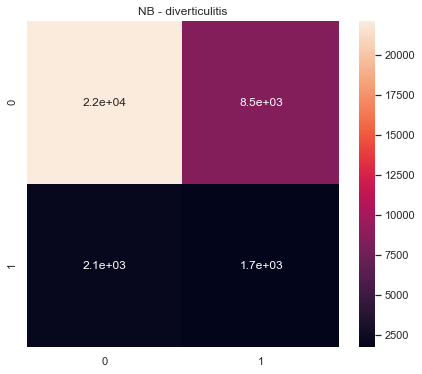

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  diverticulitis  300.0  0.518814      0.547499         0.526003   
0   2.0  diverticulitis  300.0  0.517299      0.560510         0.530190   
0   3.0  diverticulitis  300.0  0.490084      0.554189         0.523671   
0   4.0  diverticulitis  300.0  0.507249      0.535971         0.518926   
0   5.0  diverticulitis  300.0  0.506932      0.526676         0.515085   

   ROC Macro  
0   0.604497  
0   0.603216  
0   0.596414  
0   0.575861  
0   0.583645  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diverticulitis  300.0  2.540377    2.724846       2.613875  2.963634
================================== DT ==================================


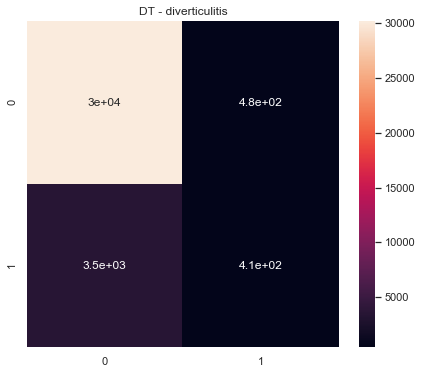

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  diverticulitis  300.0  0.492227      0.501197         0.503159   
0   2.0  diverticulitis  300.0  0.493653      0.499351         0.498739   
0   3.0  diverticulitis  300.0  0.470765      0.479977         0.465383   
0   4.0  diverticulitis  300.0  0.470582      0.479156         0.465406   
0   5.0  diverticulitis  300.0  0.501885      0.511212         0.550223   

   ROC Macro  
0   0.531618  
0   0.528893  
0   0.479806  
0   0.452731  
0   0.535413  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diverticulitis  300.0  2.429112    2.470892       2.482909  2.528461
================================== RF ==================================


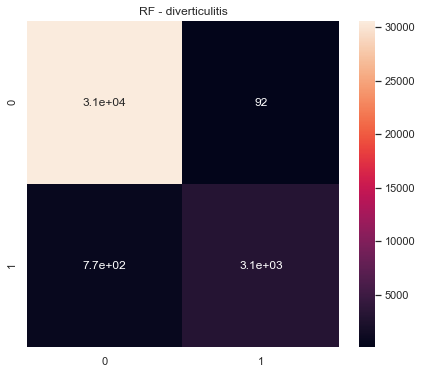

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  diverticulitis  300.0  0.472502      0.500396         0.520957   
0   2.0  diverticulitis  300.0  0.482311      0.498846         0.494832   
0   3.0  diverticulitis  300.0  0.462842      0.485249         0.442413   
0   4.0  diverticulitis  300.0  0.465129      0.489731         0.442880   
0   5.0  diverticulitis  300.0  0.470291      0.499919         0.443978   

   ROC Macro  
0   0.560534  
0   0.546391  
0   0.505036  
0   0.495393  
0   0.550584  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diverticulitis  300.0  2.353075     2.47414       2.345061  2.657939
================================== SGD ==================================


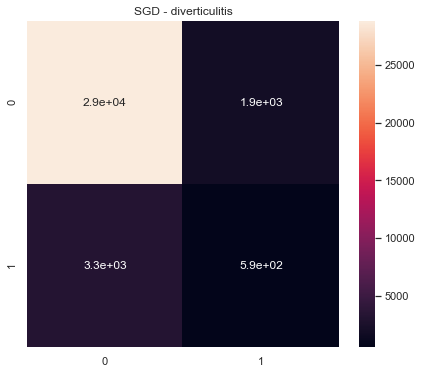

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  diverticulitis  300.0  0.495394      0.497295         0.496333   
0   2.0  diverticulitis  300.0  0.512180      0.513068         0.523235   
0   3.0  diverticulitis  300.0  0.471252      0.471908         0.470641   
0   4.0  diverticulitis  300.0  0.462058      0.475006         0.451871   
0   5.0  diverticulitis  300.0  0.454956      0.450842         0.460064   

   ROC Macro  
0   0.466197  
0   0.473251  
0   0.394327  
0   0.439677  
0   0.455224  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diverticulitis  300.0  2.395841    2.408119       2.402145  2.228677
================================== LR ==================================


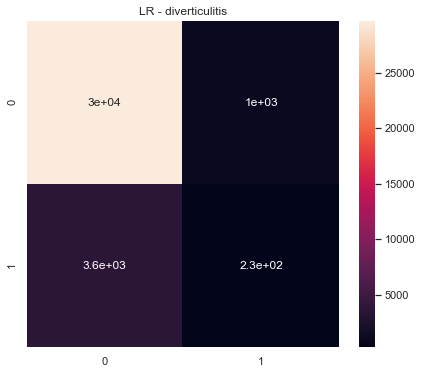

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  diverticulitis  300.0  0.520432      0.528583         0.520380   
0   2.0  diverticulitis  300.0  0.502216      0.506149         0.512319   
0   3.0  diverticulitis  300.0  0.493010      0.498051         0.498722   
0   4.0  diverticulitis  300.0  0.491385      0.495797         0.497230   
0   5.0  diverticulitis  300.0  0.497636      0.503990         0.502614   

   ROC Macro  
0   0.579385  
0   0.495621  
0   0.497209  
0   0.472557  
0   0.487769  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  diverticulitis  300.0  2.504679    2.532569       2.531265  2.532541
================================== dizziness ==================================
================================== NB ==================================


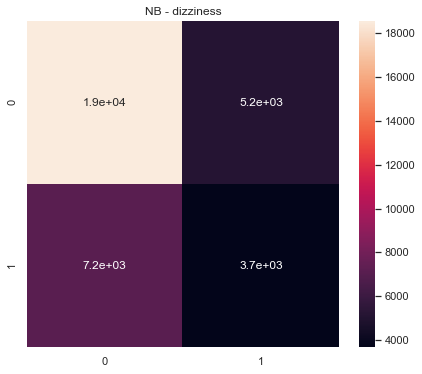

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dizziness  300.0  0.531196      0.533339         0.541675   0.551400
0   2.0  dizziness  300.0  0.538656      0.538521         0.543632   0.559611
0   3.0  dizziness  300.0  0.533982      0.533862         0.537568   0.553157
0   4.0  dizziness  300.0  0.514718      0.515376         0.516946   0.509902
0   5.0  dizziness  300.0  0.509090      0.517124         0.524194   0.535848



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dizziness  300.0  2.627642    2.638223       2.664015  2.709918
================================== DT ==================================


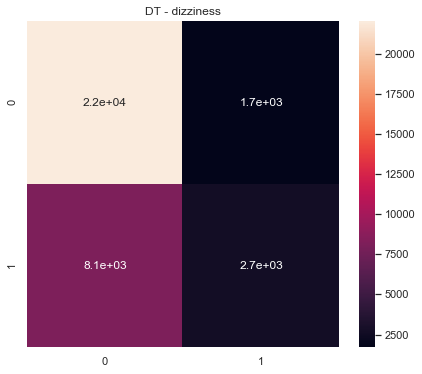

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dizziness  300.0  0.504215      0.521358         0.538742   0.544963
0   2.0  dizziness  300.0  0.495266      0.516286         0.531520   0.521832
0   3.0  dizziness  300.0  0.467910      0.489341         0.481837   0.505349
0   4.0  dizziness  300.0  0.455227      0.470740         0.458148   0.452394
0   5.0  dizziness  300.0  0.478233      0.507280         0.516084   0.529093



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dizziness  300.0  2.400851    2.505004       2.526331  2.553632
================================== RF ==================================


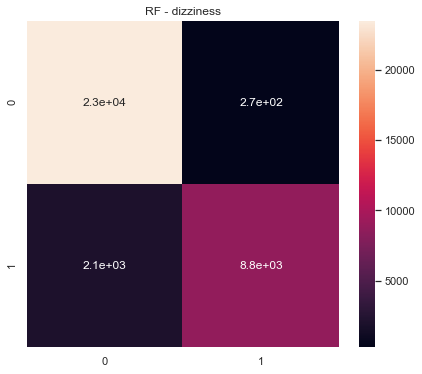

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dizziness  300.0  0.439914      0.508010         0.564763   0.581917
0   2.0  dizziness  300.0  0.432282      0.505095         0.549665   0.584627
0   3.0  dizziness  300.0  0.429404      0.467209         0.431325   0.537869
0   4.0  dizziness  300.0  0.423519      0.478484         0.430797   0.455459
0   5.0  dizziness  300.0  0.442176      0.510082         0.585914   0.563197



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dizziness  300.0  2.167294     2.46888       2.562465  2.723069
================================== SGD ==================================


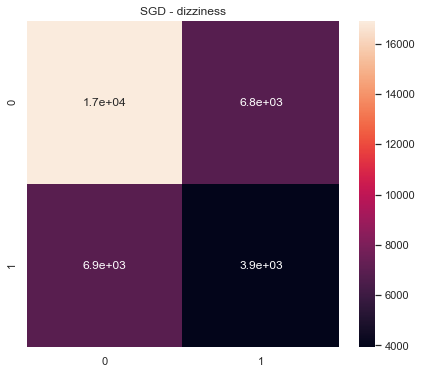

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dizziness  300.0  0.494269      0.495974         0.495536   0.491959
0   2.0  dizziness  300.0  0.512886      0.514175         0.516067   0.508330
0   3.0  dizziness  300.0  0.492554      0.496207         0.496593   0.500280
0   4.0  dizziness  300.0  0.485027      0.484976         0.485106   0.474179
0   5.0  dizziness  300.0  0.529128      0.530608         0.536830   0.550960



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dizziness  300.0  2.513864     2.52194       2.530132  2.525709
================================== LR ==================================


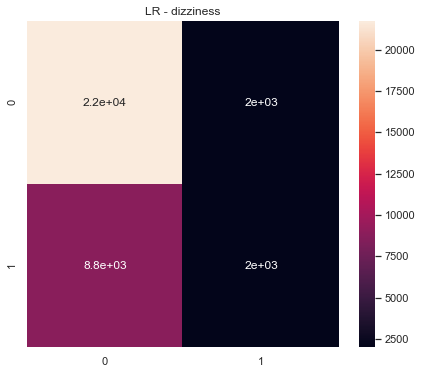

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dizziness  300.0  0.503593      0.522358         0.542492   0.566136
0   2.0  dizziness  300.0  0.500236      0.511419         0.517071   0.524530
0   3.0  dizziness  300.0  0.497501      0.498719         0.498600   0.511931
0   4.0  dizziness  300.0  0.482963      0.492160         0.489506   0.488455
0   5.0  dizziness  300.0  0.493538      0.515144         0.529532   0.532922



         ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dizziness  300.0  2.47783      2.5398         2.5772  2.623974
================================== drowsiness ==================================
================================== NB ==================================


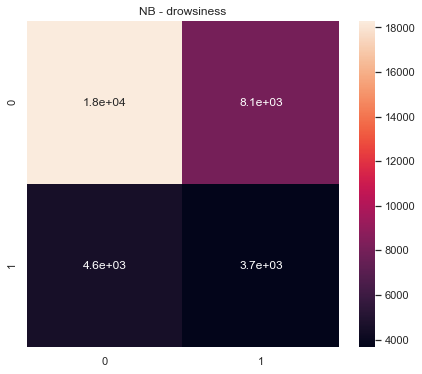

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  drowsiness  300.0  0.533661      0.534641         0.533108   0.569990
0   2.0  drowsiness  300.0  0.521329      0.522982         0.521150   0.544633
0   3.0  drowsiness  300.0  0.509691      0.525350         0.519498   0.534194
0   4.0  drowsiness  300.0  0.528571      0.536600         0.530406   0.546710
0   5.0  drowsiness  300.0  0.514531      0.517138         0.515197   0.536687



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drowsiness  300.0  2.607783    2.636712       2.619358  2.732214
================================== DT ==================================


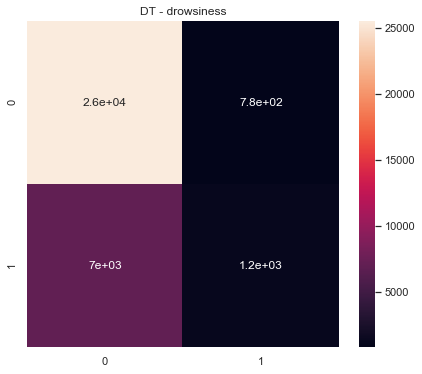

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  drowsiness  300.0  0.466957      0.502894         0.511768   0.504887
0   2.0  drowsiness  300.0  0.480425      0.506533         0.519318   0.510670
0   3.0  drowsiness  300.0  0.452830      0.489405         0.464970   0.506006
0   4.0  drowsiness  300.0  0.465203      0.500596         0.502266   0.502897
0   5.0  drowsiness  300.0  0.480894      0.501359         0.503106   0.509013



          ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drowsiness  300.0  2.34631    2.500788       2.501427  2.533474
================================== RF ==================================


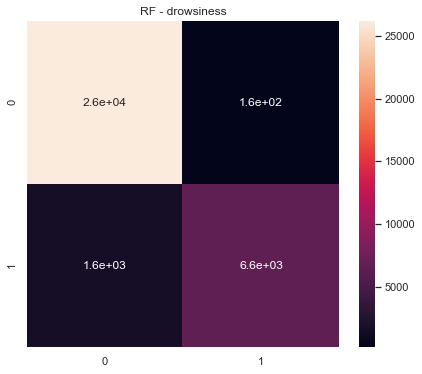

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  drowsiness  300.0  0.437306      0.500747         0.531323   0.535544
0   2.0  drowsiness  300.0  0.440559      0.499217         0.488186   0.518352
0   3.0  drowsiness  300.0  0.442574      0.481856         0.441107   0.555846
0   4.0  drowsiness  300.0  0.435797      0.499757         0.490445   0.526100
0   5.0  drowsiness  300.0  0.431810      0.478489         0.415763   0.527991



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drowsiness  300.0  2.188047    2.460066       2.366824  2.663833
================================== SGD ==================================


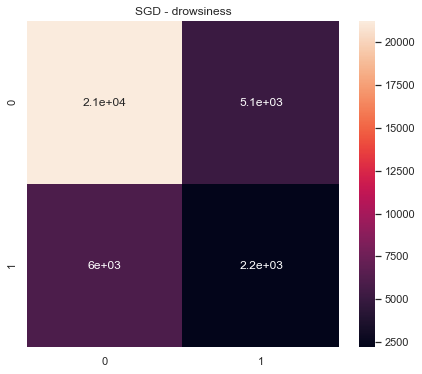

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  drowsiness  300.0  0.494839      0.495426         0.495820   0.510430
0   2.0  drowsiness  300.0  0.513281      0.513717         0.513164   0.520998
0   3.0  drowsiness  300.0  0.499920      0.500924         0.501048   0.513756
0   4.0  drowsiness  300.0  0.522967      0.522793         0.523196   0.520619
0   5.0  drowsiness  300.0  0.467847      0.471414         0.466720   0.433457



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drowsiness  300.0  2.498854    2.504275       2.499949  2.499259
================================== LR ==================================


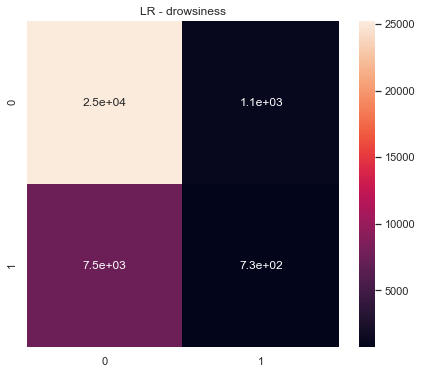

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  drowsiness  300.0  0.499870      0.509399         0.516095   0.573313
0   2.0  drowsiness  300.0  0.521682      0.521342         0.523570   0.536899
0   3.0  drowsiness  300.0  0.502065      0.504020         0.504891   0.513177
0   4.0  drowsiness  300.0  0.520177      0.523455         0.534896   0.522922
0   5.0  drowsiness  300.0  0.480891      0.489485         0.484699   0.495110



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drowsiness  300.0  2.524685    2.547701       2.564151  2.641421
================================== drug.toxicity.NOS ==================================
================================== NB ==================================


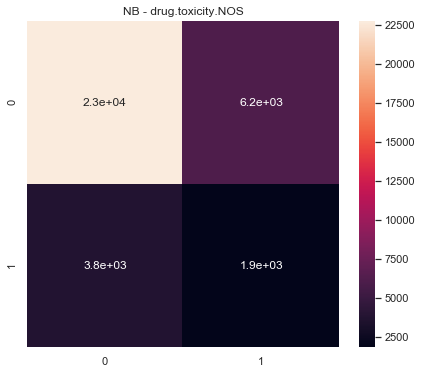

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.toxicity.NOS  300.0  0.511453      0.519438         0.514435   
0   2.0  drug.toxicity.NOS  300.0  0.515046      0.522162         0.516886   
0   3.0  drug.toxicity.NOS  300.0  0.523928      0.535157         0.525780   
0   4.0  drug.toxicity.NOS  300.0  0.528702      0.531306         0.527702   
0   5.0  drug.toxicity.NOS  300.0  0.523605      0.526217         0.522909   

   ROC Macro  
0   0.536653  
0   0.534793  
0   0.564312  
0   0.536455  
0   0.538097  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  drug.toxicity.NOS  300.0  2.602734     2.63428       2.607712  2.71031
================================== DT ==================================


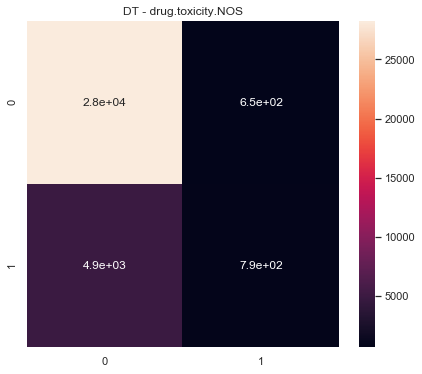

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.toxicity.NOS  300.0  0.494760      0.510538         0.537775   
0   2.0  drug.toxicity.NOS  300.0  0.472385      0.491406         0.477006   
0   3.0  drug.toxicity.NOS  300.0  0.457658      0.480505         0.449116   
0   4.0  drug.toxicity.NOS  300.0  0.491169      0.501596         0.503409   
0   5.0  drug.toxicity.NOS  300.0  0.491626      0.505637         0.515802   

   ROC Macro  
0   0.504856  
0   0.489303  
0   0.517120  
0   0.524350  
0   0.529045  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.toxicity.NOS  300.0  2.407598    2.489682       2.483107  2.564674
================================== RF ==================================


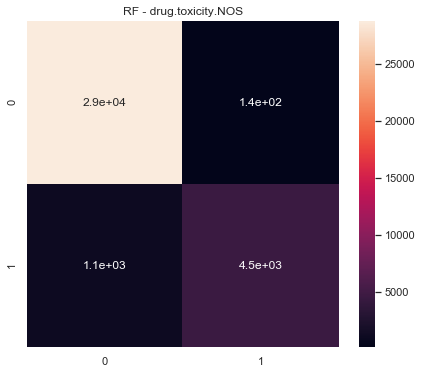

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.toxicity.NOS  300.0  0.454617      0.498442         0.417876   
0   2.0  drug.toxicity.NOS  300.0  0.449289      0.486683         0.419347   
0   3.0  drug.toxicity.NOS  300.0  0.446444      0.478229         0.422230   
0   4.0  drug.toxicity.NOS  300.0  0.448010      0.482114         0.422224   
0   5.0  drug.toxicity.NOS  300.0  0.455212      0.499654         0.418030   

   ROC Macro  
0   0.538668  
0   0.510089  
0   0.536917  
0   0.506938  
0   0.521006  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.toxicity.NOS  300.0  2.253573    2.445122       2.099707  2.613618
================================== SGD ==================================


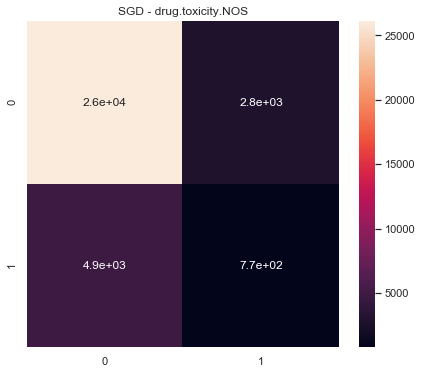

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.toxicity.NOS  300.0  0.480214      0.489212         0.481721   
0   2.0  drug.toxicity.NOS  300.0  0.475179      0.479924         0.473650   
0   3.0  drug.toxicity.NOS  300.0  0.472476      0.483634         0.471381   
0   4.0  drug.toxicity.NOS  300.0  0.474792      0.477368         0.473455   
0   5.0  drug.toxicity.NOS  300.0  0.490424      0.490791         0.492116   

   ROC Macro  
0   0.463929  
0   0.449045  
0   0.440381  
0   0.436146  
0   0.480172  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.toxicity.NOS  300.0  2.393084    2.420931       2.392323  2.269673
================================== LR ==================================


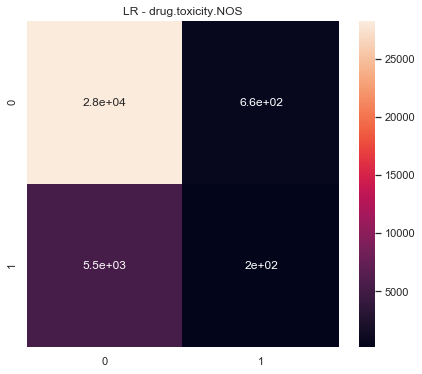

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.toxicity.NOS  300.0  0.512011      0.512356         0.515850   
0   2.0  drug.toxicity.NOS  300.0  0.487505      0.495110         0.491701   
0   3.0  drug.toxicity.NOS  300.0  0.488761      0.488640         0.488928   
0   4.0  drug.toxicity.NOS  300.0  0.495137      0.502510         0.504640   
0   5.0  drug.toxicity.NOS  300.0  0.479427      0.491607         0.483242   

   ROC Macro  
0   0.519764  
0   0.500182  
0   0.516937  
0   0.495266  
0   0.501012  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.toxicity.NOS  300.0  2.462841    2.490222       2.484361  2.533161
================================== drug.withdrawal ==================================
================================== NB ==================================


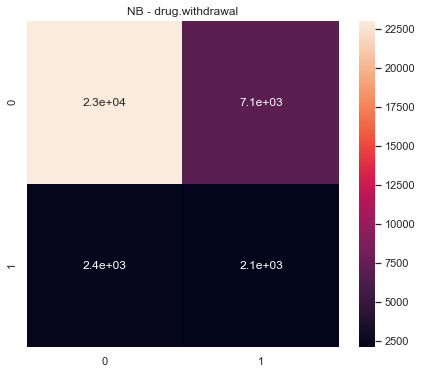

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.withdrawal  300.0  0.536277      0.546338         0.534467   
0   2.0  drug.withdrawal  300.0  0.530193      0.538666         0.529041   
0   3.0  drug.withdrawal  300.0  0.507679      0.545176         0.524063   
0   4.0  drug.withdrawal  300.0  0.534646      0.555387         0.535626   
0   5.0  drug.withdrawal  300.0  0.521823      0.534396         0.523382   

   ROC Macro  
0   0.611041  
0   0.554648  
0   0.575619  
0   0.599283  
0   0.580705  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.withdrawal  300.0  2.630618    2.719963       2.646579  2.921296
================================== DT ==================================


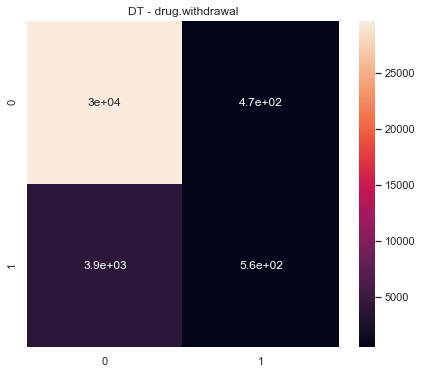

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.withdrawal  300.0  0.488937      0.503519         0.513257   
0   2.0  drug.withdrawal  300.0  0.519968      0.520690         0.542593   
0   3.0  drug.withdrawal  300.0  0.459380      0.474954         0.448560   
0   4.0  drug.withdrawal  300.0  0.499858      0.511113         0.544711   
0   5.0  drug.withdrawal  300.0  0.494835      0.506446         0.521614   

   ROC Macro  
0   0.510802  
0   0.545935  
0   0.511837  
0   0.541523  
0   0.513809  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.withdrawal  300.0  2.462979    2.516722       2.570736  2.623905
================================== RF ==================================


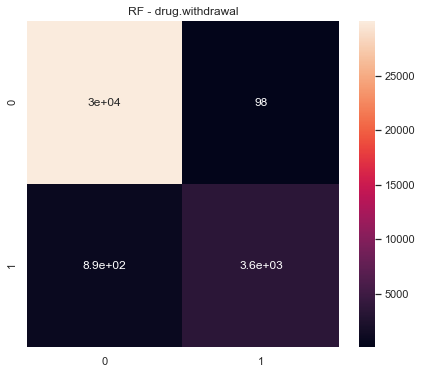

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.withdrawal  300.0  0.465460      0.500000         0.435384   
0   2.0  drug.withdrawal  300.0  0.471065      0.502550         0.748171   
0   3.0  drug.withdrawal  300.0  0.447780      0.462956         0.434110   
0   4.0  drug.withdrawal  300.0  0.466846      0.499375         0.478791   
0   5.0  drug.withdrawal  300.0  0.465496      0.500000         0.435447   

   ROC Macro  
0   0.575217  
0   0.569684  
0   0.554889  
0   0.551406  
0   0.620600  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.withdrawal  300.0  2.316646    2.464881       2.531902  2.871796
================================== SGD ==================================


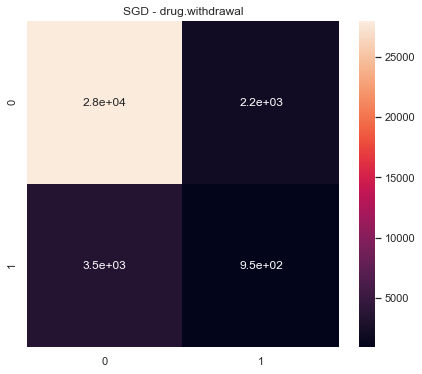

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.withdrawal  300.0  0.477441      0.476253         0.480122   
0   2.0  drug.withdrawal  300.0  0.467336      0.474453         0.462959   
0   3.0  drug.withdrawal  300.0  0.461988      0.464451         0.459872   
0   4.0  drug.withdrawal  300.0  0.491320      0.497451         0.495421   
0   5.0  drug.withdrawal  300.0  0.498336      0.498612         0.498474   

   ROC Macro  
0   0.435771  
0   0.429470  
0   0.367481  
0   0.494718  
0   0.476029  



               ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  drug.withdrawal  300.0  2.39642     2.41122       2.396848  2.203468
================================== LR ==================================


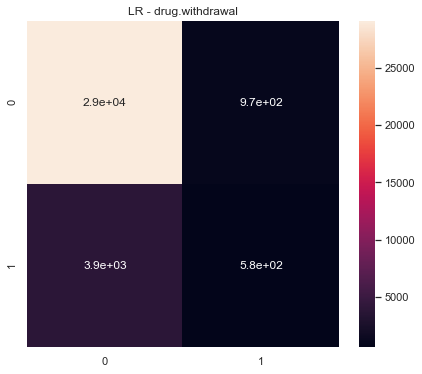

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  drug.withdrawal  300.0  0.534526      0.531447         0.556382   
0   2.0  drug.withdrawal  300.0  0.492668      0.498947         0.498037   
0   3.0  drug.withdrawal  300.0  0.517001      0.536396         0.522449   
0   4.0  drug.withdrawal  300.0  0.519966      0.524448         0.519481   
0   5.0  drug.withdrawal  300.0  0.536158      0.533045         0.545685   

   ROC Macro  
0   0.678772  
0   0.540532  
0   0.562884  
0   0.537537  
0   0.611915  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  drug.withdrawal  300.0  2.600318    2.624283       2.642034  2.93164
================================== dysarthria ==================================
================================== NB ==================================


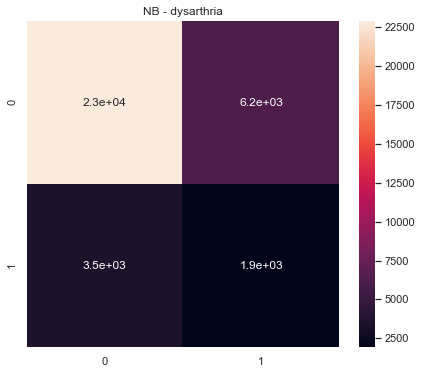

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysarthria  300.0  0.529815      0.534733         0.528773   0.571663
0   2.0  dysarthria  300.0  0.546615      0.554130         0.544177   0.600853
0   3.0  dysarthria  300.0  0.506329      0.526263         0.516748   0.558990
0   4.0  dysarthria  300.0  0.535680      0.541910         0.534212   0.576979
0   5.0  dysarthria  300.0  0.535290      0.539182         0.533778   0.576049



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysarthria  300.0  2.653729    2.696218       2.657688  2.884533
================================== DT ==================================


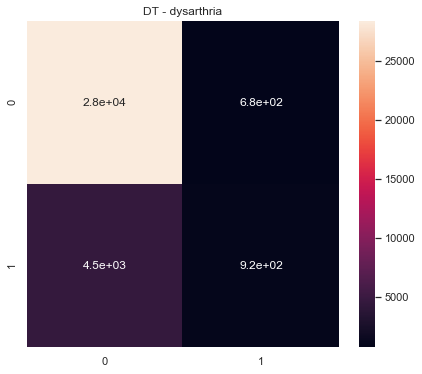

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysarthria  300.0  0.485653      0.506115         0.527807   0.557295
0   2.0  dysarthria  300.0  0.500765      0.512129         0.536244   0.530879
0   3.0  dysarthria  300.0  0.488893      0.495480         0.492556   0.521169
0   4.0  dysarthria  300.0  0.493673      0.503134         0.506728   0.522596
0   5.0  dysarthria  300.0  0.512957      0.521101         0.567452   0.533722



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysarthria  300.0  2.481942    2.537959       2.630787  2.665661
================================== RF ==================================


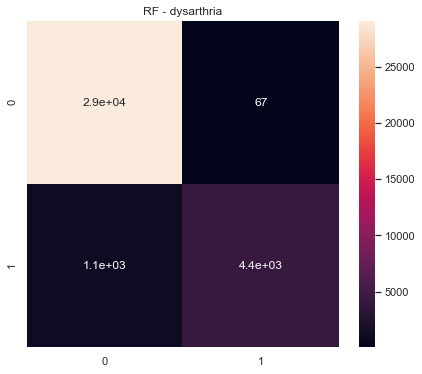

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysarthria  300.0  0.457923      0.499944         0.492622   0.606508
0   2.0  dysarthria  300.0  0.457145      0.499828         0.421178   0.592213
0   3.0  dysarthria  300.0  0.446533      0.475866         0.422852   0.528827
0   4.0  dysarthria  300.0  0.457938      0.498684         0.456667   0.510586
0   5.0  dysarthria  300.0  0.458951      0.500575         0.587933   0.602755



          ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysarthria  300.0  2.27849    2.474897       2.381253  2.840889
================================== SGD ==================================


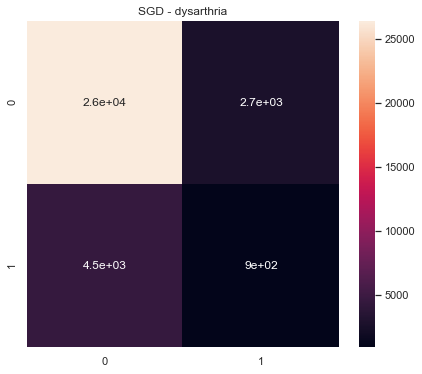

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysarthria  300.0  0.489707      0.491761         0.489872   0.469986
0   2.0  dysarthria  300.0  0.486295      0.494070         0.489810   0.487684
0   3.0  dysarthria  300.0  0.451155      0.470959         0.438573   0.408847
0   4.0  dysarthria  300.0  0.500447      0.501817         0.502303   0.440092
0   5.0  dysarthria  300.0  0.467084      0.469531         0.465333   0.452097



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysarthria  300.0  2.394688    2.428138        2.38589  2.258706
================================== LR ==================================


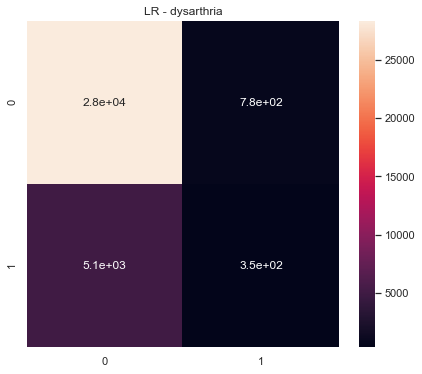

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysarthria  300.0  0.482577      0.486728         0.482205   0.532982
0   2.0  dysarthria  300.0  0.507110      0.514437         0.534899   0.520703
0   3.0  dysarthria  300.0  0.523073      0.531781         0.523944   0.533541
0   4.0  dysarthria  300.0  0.511655      0.512672         0.518015   0.478744
0   5.0  dysarthria  300.0  0.515391      0.516620         0.526108   0.554865



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysarthria  300.0  2.539805    2.562239       2.585172  2.620835
================================== dyspepsia ==================================
================================== NB ==================================


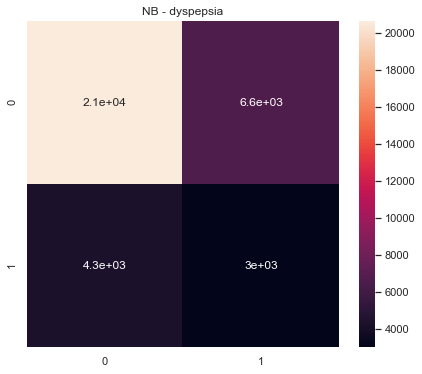

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dyspepsia  300.0  0.545347      0.545093         0.545622   0.588920
0   2.0  dyspepsia  300.0  0.552840      0.560345         0.551146   0.589711
0   3.0  dyspepsia  300.0  0.527359      0.533173         0.527766   0.567281
0   4.0  dyspepsia  300.0  0.555980      0.560743         0.553977   0.593951
0   5.0  dyspepsia  300.0  0.510679      0.510638         0.510730   0.545824



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dyspepsia  300.0  2.692206    2.709992       2.689241  2.885688
================================== DT ==================================


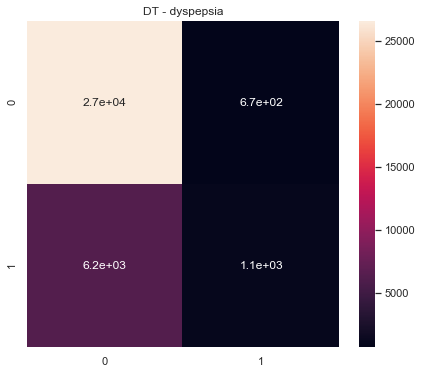

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dyspepsia  300.0  0.464238      0.500808         0.504217   0.512349
0   2.0  dyspepsia  300.0  0.497042      0.515117         0.544806   0.528333
0   3.0  dyspepsia  300.0  0.501112      0.515260         0.537816   0.543221
0   4.0  dyspepsia  300.0  0.493164      0.511071         0.530180   0.545301
0   5.0  dyspepsia  300.0  0.484138      0.511124         0.546696   0.545853



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dyspepsia  300.0  2.439695     2.55338       2.663715  2.675058
================================== RF ==================================


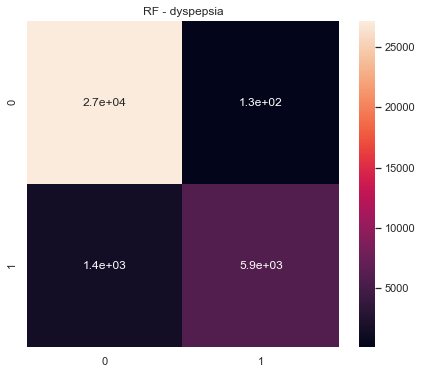

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dyspepsia  300.0  0.445426      0.501298         0.578856   0.590430
0   2.0  dyspepsia  300.0  0.473156      0.508570         0.554497   0.599103
0   3.0  dyspepsia  300.0  0.456080      0.485368         0.458574   0.571905
0   4.0  dyspepsia  300.0  0.439991      0.492997         0.418172   0.546617
0   5.0  dyspepsia  300.0  0.448138      0.501544         0.544672   0.596164



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  dyspepsia  300.0  2.262792    2.489776       2.554771  2.90422
================================== SGD ==================================


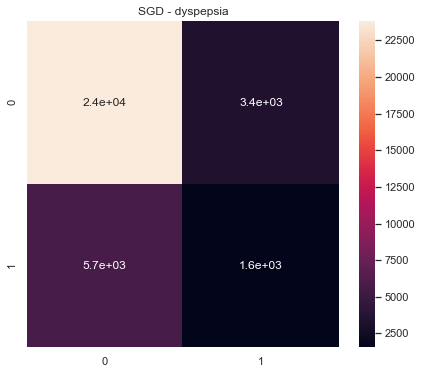

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dyspepsia  300.0  0.488455      0.489198         0.488331   0.489200
0   2.0  dyspepsia  300.0  0.527577      0.526839         0.529372   0.548714
0   3.0  dyspepsia  300.0  0.476488      0.482225         0.476496   0.439710
0   4.0  dyspepsia  300.0  0.463317      0.481684         0.464379   0.469978
0   5.0  dyspepsia  300.0  0.473691      0.481742         0.473962   0.493888



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  dyspepsia  300.0  2.429528    2.461689       2.432541  2.44149
================================== LR ==================================


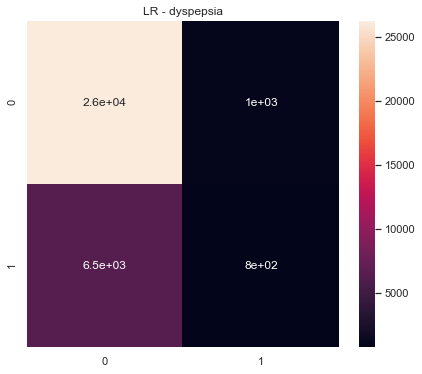

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dyspepsia  300.0  0.540265      0.539299         0.559244   0.559670
0   2.0  dyspepsia  300.0  0.517248      0.521469         0.536115   0.574557
0   3.0  dyspepsia  300.0  0.501565      0.502576         0.503006   0.493617
0   4.0  dyspepsia  300.0  0.491591      0.499779         0.499643   0.523123
0   5.0  dyspepsia  300.0  0.518217      0.520394         0.529986   0.570571



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dyspepsia  300.0  2.568884    2.583517       2.627994  2.721537
================================== dysuria ==================================
================================== NB ==================================


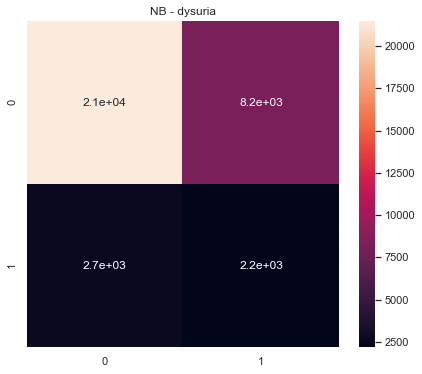

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysuria  300.0  0.537150      0.557460         0.538136   0.584076
0   2.0  dysuria  300.0  0.530174      0.557565         0.535451   0.584288
0   3.0  dysuria  300.0  0.485970      0.535838         0.518464   0.575088
0   4.0  dysuria  300.0  0.525234      0.556924         0.533725   0.580811
0   5.0  dysuria  300.0  0.514561      0.526993         0.518298   0.555790



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysuria  300.0  2.593088    2.734782       2.644075  2.880053
================================== DT ==================================


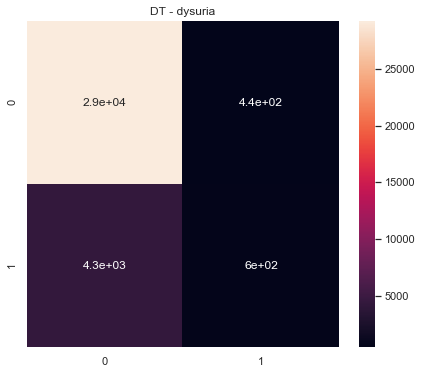

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysuria  300.0  0.502404      0.513578         0.551310   0.551175
0   2.0  dysuria  300.0  0.503113      0.514718         0.561097   0.543665
0   3.0  dysuria  300.0  0.475552      0.490071         0.476435   0.531003
0   4.0  dysuria  300.0  0.505930      0.514125         0.542159   0.574492
0   5.0  dysuria  300.0  0.499818      0.513934         0.571123   0.555991



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysuria  300.0  2.486817    2.546426       2.702124  2.756326
================================== RF ==================================


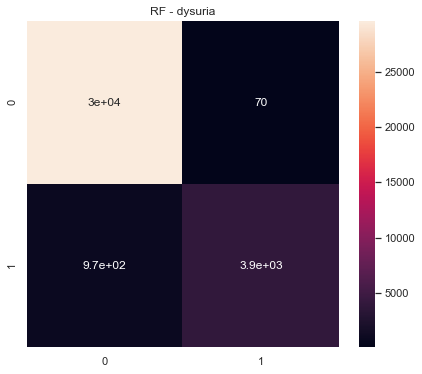

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysuria  300.0  0.461796      0.499410         0.429451   0.598402
0   2.0  dysuria  300.0  0.462047      0.500000         0.429450   0.589679
0   3.0  dysuria  300.0  0.462249      0.483851         0.452573   0.557342
0   4.0  dysuria  300.0  0.460481      0.495374         0.436949   0.484382
0   5.0  dysuria  300.0  0.462000      0.499832         0.429492   0.578686



       ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  dysuria  300.0  2.308574    2.478466       2.177914  2.80849
================================== SGD ==================================


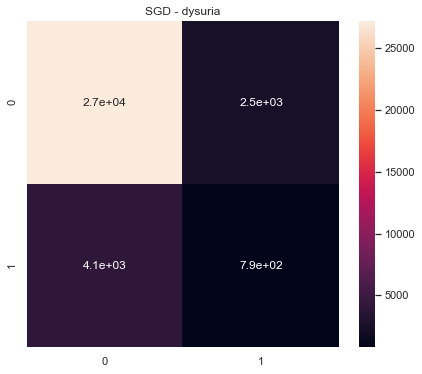

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysuria  300.0  0.487465      0.488345         0.487075   0.473674
0   2.0  dysuria  300.0  0.488565      0.493467         0.490045   0.484801
0   3.0  dysuria  300.0  0.477306      0.476930         0.477743   0.414501
0   4.0  dysuria  300.0  0.479045      0.478227         0.480515   0.466935
0   5.0  dysuria  300.0  0.499358      0.500411         0.500347   0.490387



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysuria  300.0  2.431739    2.437379       2.435724  2.330298
================================== LR ==================================


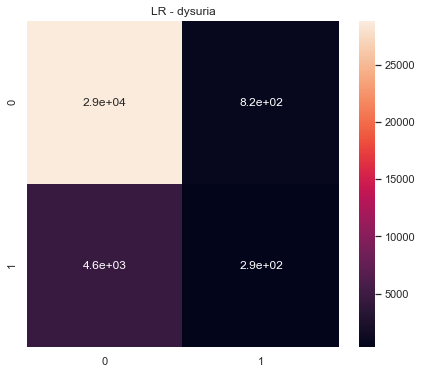

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  dysuria  300.0  0.492931      0.495815         0.494243   0.534176
0   2.0  dysuria  300.0  0.504045      0.509166         0.518475   0.502739
0   3.0  dysuria  300.0  0.480271      0.479864         0.483976   0.533832
0   4.0  dysuria  300.0  0.487247      0.487142         0.487368   0.493779
0   5.0  dysuria  300.0  0.525282      0.524043         0.528224   0.530173



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  dysuria  300.0  2.489776     2.49603       2.512286  2.594699
================================== edema.extremities ==================================
================================== NB ==================================


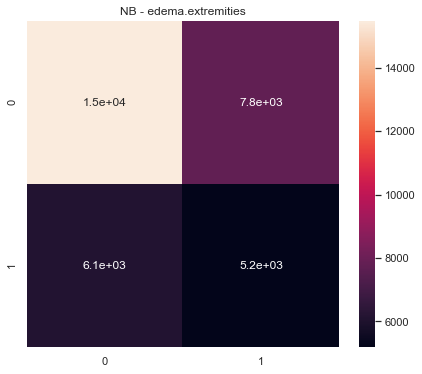

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  edema.extremities  300.0  0.543117      0.543020         0.548626   
0   2.0  edema.extremities  300.0  0.528982      0.529880         0.528834   
0   3.0  edema.extremities  300.0  0.529637      0.534920         0.531846   
0   4.0  edema.extremities  300.0  0.535146      0.538173         0.535626   
0   5.0  edema.extremities  300.0  0.514317      0.514262         0.514460   

   ROC Macro  
0   0.573984  
0   0.546458  
0   0.554731  
0   0.551364  
0   0.539739  



                 ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema.extremities  300.0  2.6512    2.660255       2.659392  2.766276
================================== DT ==================================


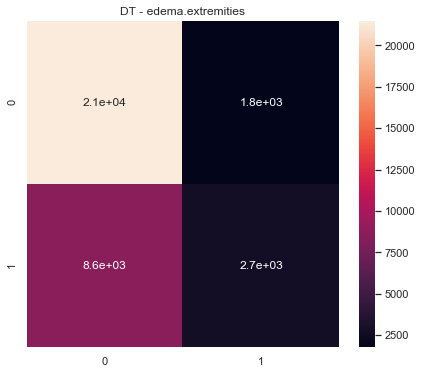

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  edema.extremities  300.0  0.501544      0.517844         0.529768   
0   2.0  edema.extremities  300.0  0.496477      0.506472         0.508993   
0   3.0  edema.extremities  300.0  0.439884      0.499465         0.497770   
0   4.0  edema.extremities  300.0  0.471474      0.495653         0.492249   
0   5.0  edema.extremities  300.0  0.461084      0.496903         0.492978   

   ROC Macro  
0   0.525317  
0   0.510157  
0   0.547241  
0   0.509882  
0   0.513608  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema.extremities  300.0  2.370463    2.516336       2.521758  2.606205
================================== RF ==================================


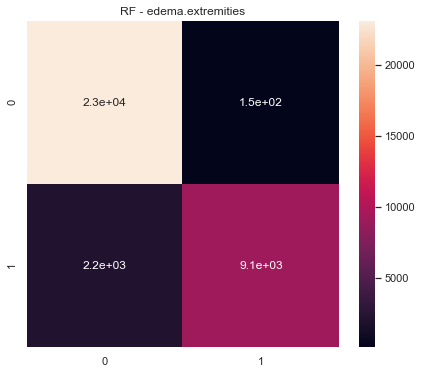

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  edema.extremities  300.0  0.421681      0.503642         0.546229   
0   2.0  edema.extremities  300.0  0.427330      0.503751         0.533267   
0   3.0  edema.extremities  300.0  0.415683      0.485240         0.430931   
0   4.0  edema.extremities  300.0  0.430299      0.497443         0.486781   
0   5.0  edema.extremities  300.0  0.427736      0.505989         0.563747   

   ROC Macro  
0   0.577809  
0   0.570317  
0   0.565577  
0   0.540477  
0   0.581318  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema.extremities  300.0  2.122729    2.496066       2.560956  2.835498
================================== SGD ==================================


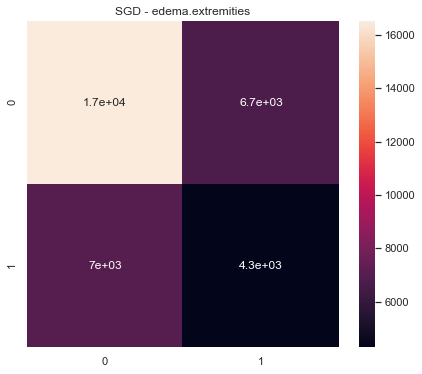

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  edema.extremities  300.0  0.535231      0.535729         0.540816   
0   2.0  edema.extremities  300.0  0.486249      0.490744         0.489080   
0   3.0  edema.extremities  300.0  0.493468      0.493458         0.493516   
0   4.0  edema.extremities  300.0  0.515577      0.517369         0.516328   
0   5.0  edema.extremities  300.0  0.522875      0.523828         0.526895   

   ROC Macro  
0   0.551333  
0   0.501879  
0   0.492427  
0   0.519928  
0   0.532265  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema.extremities  300.0  2.553399    2.561128       2.566634  2.597832
================================== LR ==================================


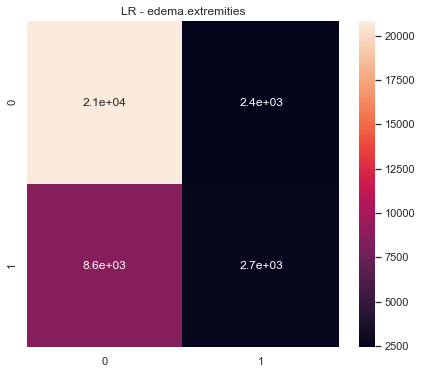

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  edema.extremities  300.0  0.561279      0.561279         0.576014   
0   2.0  edema.extremities  300.0  0.491221      0.504193         0.506168   
0   3.0  edema.extremities  300.0  0.508903      0.515152         0.519770   
0   4.0  edema.extremities  300.0  0.504781      0.513709         0.519018   
0   5.0  edema.extremities  300.0  0.504043      0.511245         0.514854   

   ROC Macro  
0   0.575678  
0   0.518527  
0   0.506679  
0   0.506708  
0   0.516967  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema.extremities  300.0  2.570227    2.605577       2.635824  2.624558
================================== edema ==================================
================================== NB ==================================


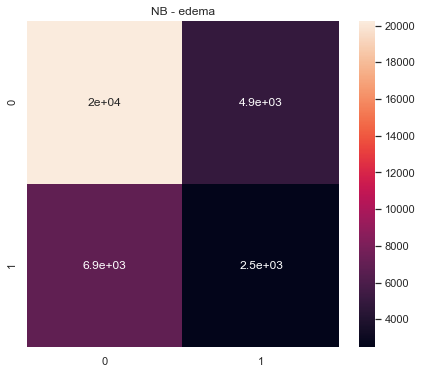

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  edema  300.0  0.500136      0.506786         0.509562   0.528961
0   2.0  edema  300.0  0.525879      0.527582         0.535771   0.551352
0   3.0  edema  300.0  0.501563      0.502407         0.502660   0.520794
0   4.0  edema  300.0  0.503894      0.508321         0.510968   0.518410
0   5.0  edema  300.0  0.492812      0.502049         0.503049   0.519839



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema  300.0  2.524283    2.547145       2.562009  2.639357
================================== DT ==================================


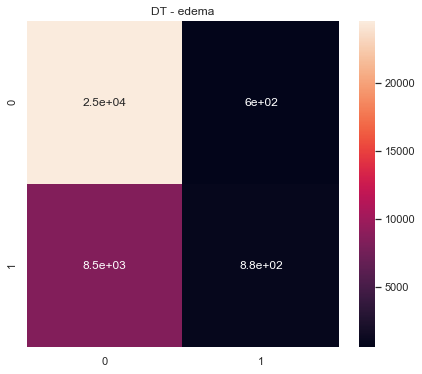

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  edema  300.0  0.445216      0.504838         0.545089   0.498903
0   2.0  edema  300.0  0.468578      0.505987         0.520657   0.495961
0   3.0  edema  300.0  0.417951      0.477249         0.394954   0.468325
0   4.0  edema  300.0  0.460949      0.496843         0.490745   0.469096
0   5.0  edema  300.0  0.440717      0.497064         0.482096   0.473240



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema  300.0  2.233411    2.481981       2.433541  2.405526
================================== RF ==================================


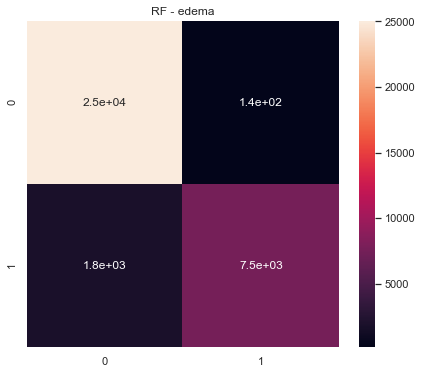

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  edema  300.0  0.434667      0.502554         0.543634   0.529683
0   2.0  edema  300.0  0.429894      0.501715         0.548198   0.533956
0   3.0  edema  300.0  0.419590      0.471708         0.402165   0.490083
0   4.0  edema  300.0  0.436558      0.494638         0.466610   0.476197
0   5.0  edema  300.0  0.429568      0.500391         0.508180   0.525928



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema  300.0  2.150277    2.471006       2.468786  2.555847
================================== SGD ==================================


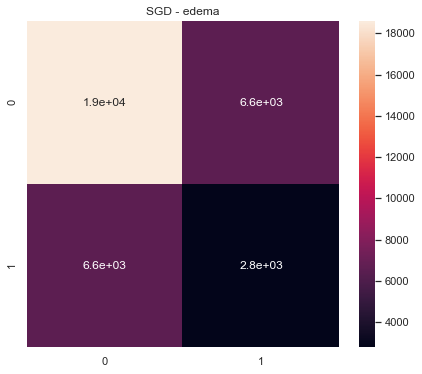

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  edema  300.0  0.500786      0.500877         0.500855   0.502623
0   2.0  edema  300.0  0.514702      0.514676         0.514730   0.503938
0   3.0  edema  300.0  0.491026      0.490989         0.491095   0.498423
0   4.0  edema  300.0  0.480221      0.481388         0.480005   0.448229
0   5.0  edema  300.0  0.488873      0.488913         0.489436   0.474439



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema  300.0  2.475607    2.476842       2.476121  2.427652
================================== LR ==================================


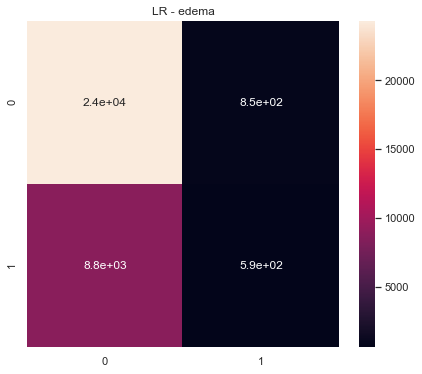

   Fold    ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  edema  300.0  0.498247      0.508362         0.513196   0.522033
0   2.0  edema  300.0  0.463538      0.505694         0.523116   0.511783
0   3.0  edema  300.0  0.478887      0.489508         0.484693   0.491963
0   4.0  edema  300.0  0.456502      0.492431         0.478818   0.465882
0   5.0  edema  300.0  0.471929      0.488624         0.480834   0.484603



     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  edema  300.0  2.369101     2.48462       2.480657  2.476263
================================== elevated.cholesterol ==================================
================================== NB ==================================


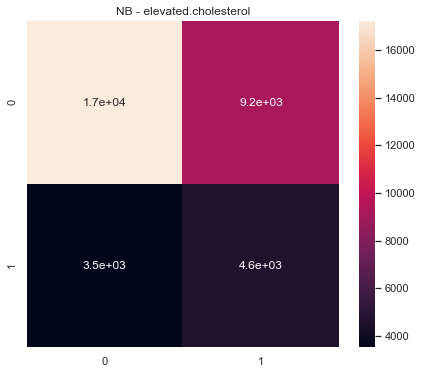

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  elevated.cholesterol  300.0  0.587079      0.597569         0.583738   
0   2.0  elevated.cholesterol  300.0  0.525305      0.541899         0.532382   
0   3.0  elevated.cholesterol  300.0  0.531402      0.562120         0.545835   
0   4.0  elevated.cholesterol  300.0  0.538340      0.579200         0.557582   
0   5.0  elevated.cholesterol  300.0  0.531206      0.538728         0.532385   

   ROC Macro  
0   0.642651  
0   0.557915  
0   0.589224  
0   0.596571  
0   0.580023  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  elevated.cholesterol  300.0  2.713333    2.819516       2.751921  2.966384
================================== DT ==================================


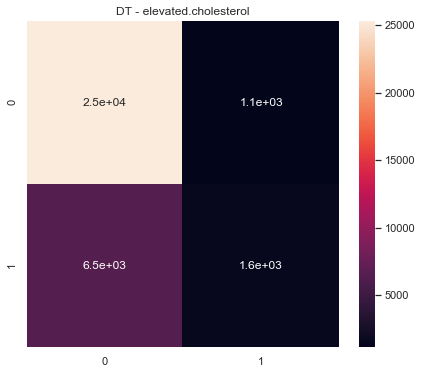

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  elevated.cholesterol  300.0  0.497746      0.515405         0.538414   
0   2.0  elevated.cholesterol  300.0  0.482862      0.504435         0.511040   
0   3.0  elevated.cholesterol  300.0  0.491625      0.509350         0.521607   
0   4.0  elevated.cholesterol  300.0  0.506359      0.516302         0.530528   
0   5.0  elevated.cholesterol  300.0  0.478467      0.500687         0.501670   

   ROC Macro  
0   0.562528  
0   0.514782  
0   0.539483  
0   0.544994  
0   0.553177  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  elevated.cholesterol  300.0  2.457058    2.546179       2.603258  2.714964
================================== RF ==================================


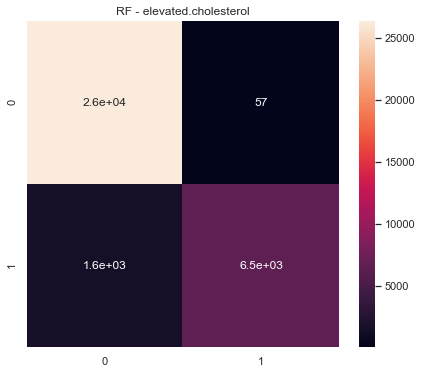

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  elevated.cholesterol  300.0  0.435300      0.499626         0.477805   
0   2.0  elevated.cholesterol  300.0  0.438360      0.501804         0.649625   
0   3.0  elevated.cholesterol  300.0  0.434075      0.490367         0.420080   
0   4.0  elevated.cholesterol  300.0  0.439496      0.495615         0.454930   
0   5.0  elevated.cholesterol  300.0  0.435385      0.499814         0.487847   

   ROC Macro  
0   0.614254  
0   0.628433  
0   0.592916  
0   0.576215  
0   0.620171  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  elevated.cholesterol  300.0  2.182615    2.487227       2.490286  3.031989
================================== SGD ==================================


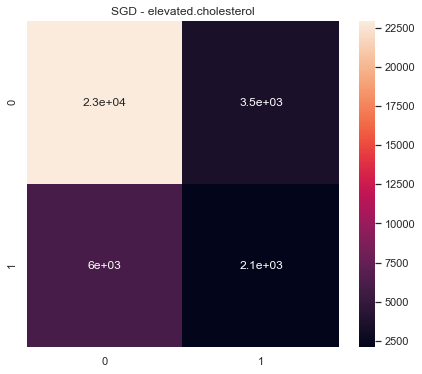

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  elevated.cholesterol  300.0  0.496514      0.498628         0.498354   
0   2.0  elevated.cholesterol  300.0  0.494747      0.500893         0.501282   
0   3.0  elevated.cholesterol  300.0  0.457328      0.478011         0.458244   
0   4.0  elevated.cholesterol  300.0  0.458467      0.470230         0.456632   
0   5.0  elevated.cholesterol  300.0  0.469263      0.490893         0.480342   

   ROC Macro  
0   0.460092  
0   0.520678  
0   0.468568  
0   0.483021  
0   0.487041  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  elevated.cholesterol  300.0  2.37632    2.438654       2.394853  2.419399
================================== LR ==================================


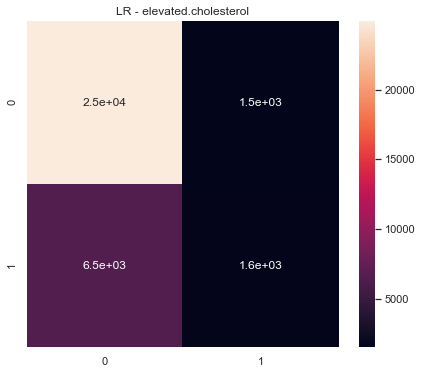

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  elevated.cholesterol  300.0  0.519133      0.522818         0.534783   
0   2.0  elevated.cholesterol  300.0  0.534355      0.535359         0.552727   
0   3.0  elevated.cholesterol  300.0  0.501386      0.510962         0.519236   
0   4.0  elevated.cholesterol  300.0  0.513987      0.519335         0.530848   
0   5.0  elevated.cholesterol  300.0  0.506945      0.516346         0.529995   

   ROC Macro  
0   0.601673  
0   0.569133  
0   0.555853  
0   0.562981  
0   0.603815  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  elevated.cholesterol  300.0  2.575806     2.60482       2.667588  2.893455
================================== emesis ==================================
================================== NB ==================================


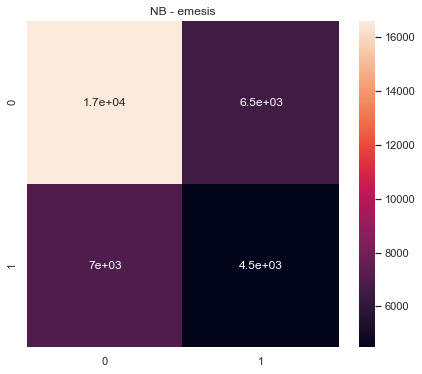

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  emesis  300.0  0.518857      0.519100         0.520426   0.535371
0   2.0  emesis  300.0  0.514292      0.514640         0.515620   0.529524
0   3.0  emesis  300.0  0.520399      0.520390         0.520408   0.520604
0   4.0  emesis  300.0  0.508900      0.508895         0.509058   0.497677
0   5.0  emesis  300.0  0.507954      0.515541         0.520855   0.527712



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  emesis  300.0  2.570401    2.578565       2.586367  2.610889
================================== DT ==================================


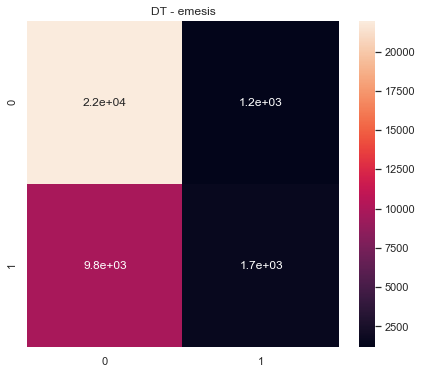

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  emesis  300.0  0.474437      0.513017         0.534540   0.526961
0   2.0  emesis  300.0  0.466375      0.506811         0.517995   0.525033
0   3.0  emesis  300.0  0.419976      0.471201         0.425168   0.484247
0   4.0  emesis  300.0  0.436493      0.484907         0.459434   0.457361
0   5.0  emesis  300.0  0.449807      0.507392         0.531102   0.503746



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  emesis  300.0  2.247087    2.483327       2.468239  2.497348
================================== RF ==================================


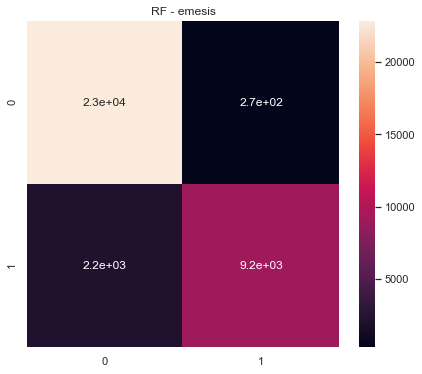

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  emesis  300.0  0.421164      0.502079         0.521260   0.556246
0   2.0  emesis  300.0  0.420479      0.501966         0.520771   0.534682
0   3.0  emesis  300.0  0.411041      0.455429         0.405634   0.497641
0   4.0  emesis  300.0  0.417057      0.476866         0.425063   0.453194
0   5.0  emesis  300.0  0.421891      0.504351         0.553799   0.525670



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  emesis  300.0  2.091632     2.44069       2.426527  2.567432
================================== SGD ==================================


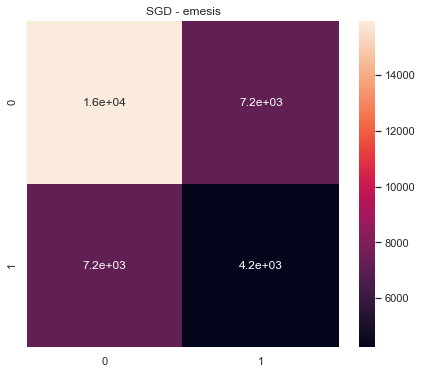

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  emesis  300.0  0.502655      0.504456         0.504164   0.509070
0   2.0  emesis  300.0  0.484921      0.487109         0.485802   0.470309
0   3.0  emesis  300.0  0.502279      0.502524         0.502455   0.492052
0   4.0  emesis  300.0  0.468016      0.468130         0.469917   0.452688
0   5.0  emesis  300.0  0.516251      0.519536         0.523637   0.541119



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  emesis  300.0  2.474122    2.481754       2.485974  2.465239
================================== LR ==================================


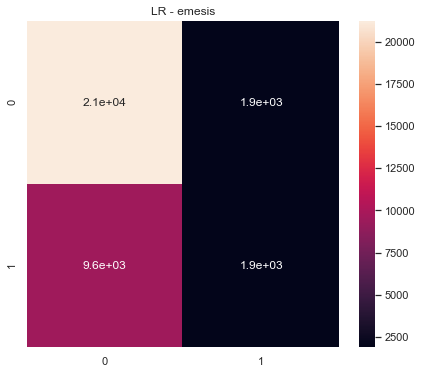

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  emesis  300.0  0.487325      0.521856         0.556326   0.560057
0   2.0  emesis  300.0  0.458617      0.495360         0.489528   0.478902
0   3.0  emesis  300.0  0.484518      0.487084         0.485621   0.486894
0   4.0  emesis  300.0  0.470842      0.475565         0.471791   0.453431
0   5.0  emesis  300.0  0.509799      0.526230         0.545131   0.547906



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  emesis  300.0  2.411101    2.506096       2.548397  2.527191
================================== encephalopathy ==================================
================================== NB ==================================


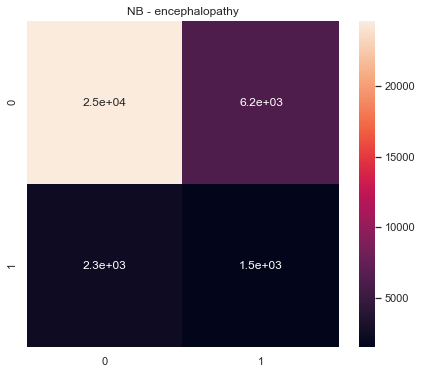

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  encephalopathy  300.0  0.535033      0.553469         0.534073   
0   2.0  encephalopathy  300.0  0.525784      0.536563         0.525200   
0   3.0  encephalopathy  300.0  0.527786      0.556491         0.531596   
0   4.0  encephalopathy  300.0  0.533403      0.560258         0.534923   
0   5.0  encephalopathy  300.0  0.527413      0.536356         0.526177   

   ROC Macro  
0   0.568602  
0   0.559495  
0   0.599228  
0   0.589793  
0   0.580570  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  encephalopathy  300.0  2.64942    2.743137       2.651969  2.897688
================================== DT ==================================


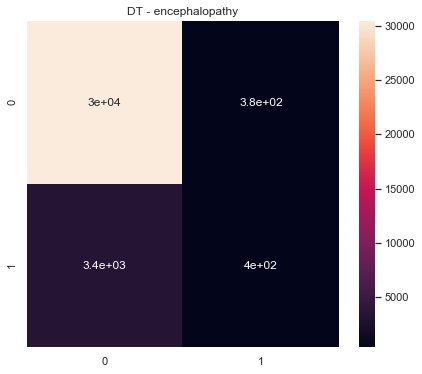

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  encephalopathy  300.0  0.484816      0.499872         0.499443   
0   2.0  encephalopathy  300.0  0.477743      0.487678         0.474837   
0   3.0  encephalopathy  300.0  0.467257      0.480988         0.457924   
0   4.0  encephalopathy  300.0  0.490673      0.504954         0.527448   
0   5.0  encephalopathy  300.0  0.495847      0.507080         0.531878   

   ROC Macro  
0   0.493938  
0   0.494593  
0   0.515139  
0   0.500639  
0   0.519628  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  encephalopathy  300.0  2.416335    2.480571        2.49153  2.523938
================================== RF ==================================


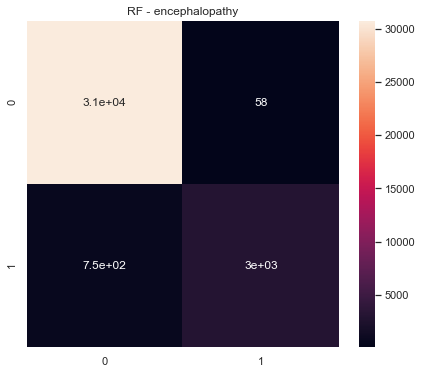

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  encephalopathy  300.0  0.470904      0.499269         0.445588   
0   2.0  encephalopathy  300.0  0.467109      0.491719         0.444844   
0   3.0  encephalopathy  300.0  0.464050      0.485712         0.444238   
0   4.0  encephalopathy  300.0  0.470985      0.499432         0.445603   
0   5.0  encephalopathy  300.0  0.471263      0.500000         0.445651   

   ROC Macro  
0   0.572591  
0   0.527239  
0   0.514151  
0   0.540595  
0   0.592134  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  encephalopathy  300.0  2.344311    2.476132       2.225924  2.74671
================================== SGD ==================================


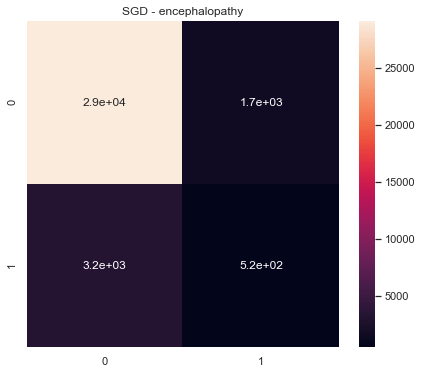

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  encephalopathy  300.0  0.486000      0.488265         0.485146   
0   2.0  encephalopathy  300.0  0.488314      0.488461         0.488184   
0   3.0  encephalopathy  300.0  0.467355      0.478683         0.459561   
0   4.0  encephalopathy  300.0  0.492972      0.498591         0.497285   
0   5.0  encephalopathy  300.0  0.525656      0.524908         0.526639   

   ROC Macro  
0   0.454503  
0   0.467052  
0   0.430759  
0   0.513708  
0   0.524976  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  encephalopathy  300.0  2.460297    2.478908       2.456816  2.390999
================================== LR ==================================


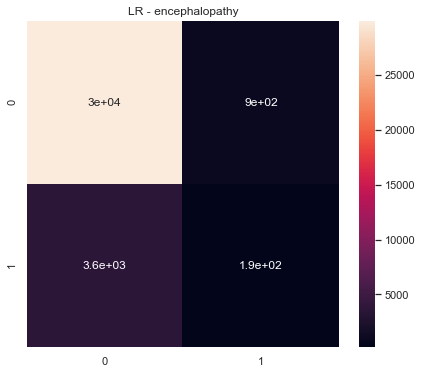

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  encephalopathy  300.0  0.467745      0.472264         0.484853   
0   2.0  encephalopathy  300.0  0.508093      0.508481         0.511975   
0   3.0  encephalopathy  300.0  0.487016      0.492494         0.495383   
0   4.0  encephalopathy  300.0  0.505379      0.505494         0.506672   
0   5.0  encephalopathy  300.0  0.522467      0.521320         0.524609   

   ROC Macro  
0   0.469805  
0   0.493100  
0   0.499217  
0   0.550486  
0   0.539021  



              ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  encephalopathy  300.0  2.4907    2.500053       2.523493  2.551628
================================== enlarged.liver ==================================
================================== NB ==================================


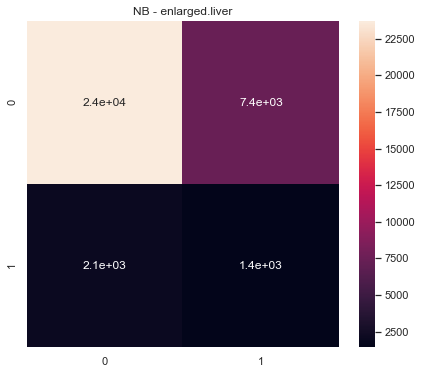

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  enlarged.liver  300.0  0.513434      0.539266         0.520818   
0   2.0  enlarged.liver  300.0  0.525781      0.562825         0.532076   
0   3.0  enlarged.liver  300.0  0.488543      0.543656         0.518309   
0   4.0  enlarged.liver  300.0  0.510145      0.541141         0.520684   
0   5.0  enlarged.liver  300.0  0.533271      0.561403         0.534522   

   ROC Macro  
0   0.570947  
0   0.598203  
0   0.562913  
0   0.571668  
0   0.588788  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  enlarged.liver  300.0  2.571173    2.748292       2.626408  2.892519
================================== DT ==================================


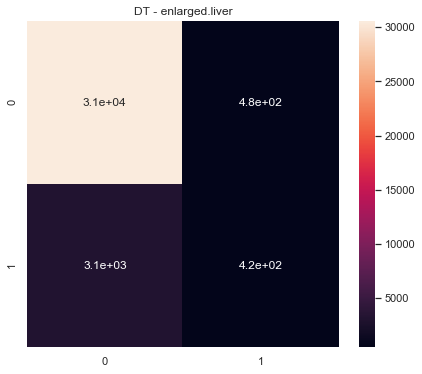

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  enlarged.liver  300.0  0.502741      0.511022         0.554289   
0   2.0  enlarged.liver  300.0  0.463640      0.468967         0.459019   
0   3.0  enlarged.liver  300.0  0.476260      0.486418         0.471786   
0   4.0  enlarged.liver  300.0  0.506146      0.507534         0.512577   
0   5.0  enlarged.liver  300.0  0.487087      0.501148         0.505490   

   ROC Macro  
0   0.503278  
0   0.498056  
0   0.487071  
0   0.504968  
0   0.513628  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  enlarged.liver  300.0  2.435875    2.475089       2.503161  2.507002
================================== RF ==================================


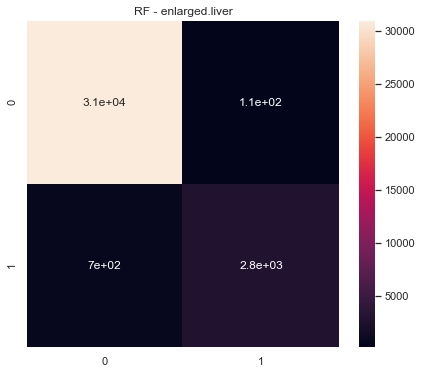

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  enlarged.liver  300.0  0.473363      0.500000         0.449421   
0   2.0  enlarged.liver  300.0  0.473640      0.489631         0.466127   
0   3.0  enlarged.liver  300.0  0.458464      0.470939         0.446633   
0   4.0  enlarged.liver  300.0  0.472720      0.498792         0.449239   
0   5.0  enlarged.liver  300.0  0.473118      0.499517         0.449370   

   ROC Macro  
0   0.591886  
0   0.478809  
0   0.504665  
0   0.485070  
0   0.596430  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  enlarged.liver  300.0  2.351306    2.458879        2.26079  2.65686
================================== SGD ==================================


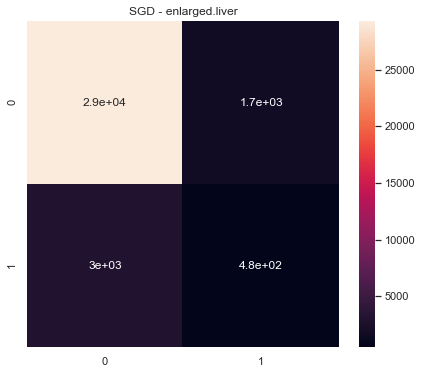

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  enlarged.liver  300.0  0.466193      0.476581         0.457982   
0   2.0  enlarged.liver  300.0  0.514411      0.516483         0.513851   
0   3.0  enlarged.liver  300.0  0.475947      0.477970         0.474350   
0   4.0  enlarged.liver  300.0  0.489217      0.492612         0.489110   
0   5.0  enlarged.liver  300.0  0.530456      0.533062         0.528896   

   ROC Macro  
0   0.450694  
0   0.481746  
0   0.428285  
0   0.448354  
0   0.518039  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  enlarged.liver  300.0  2.476223    2.496708       2.464188  2.327118
================================== LR ==================================


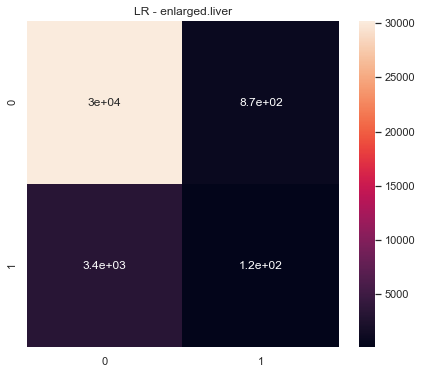

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  enlarged.liver  300.0  0.496421      0.497765         0.498297   
0   2.0  enlarged.liver  300.0  0.496917      0.497954         0.498396   
0   3.0  enlarged.liver  300.0  0.469690      0.467106         0.473422   
0   4.0  enlarged.liver  300.0  0.496053      0.496319         0.496002   
0   5.0  enlarged.liver  300.0  0.487060      0.489984         0.493577   

   ROC Macro  
0   0.503828  
0   0.479133  
0   0.476177  
0   0.494441  
0   0.507264  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  enlarged.liver  300.0  2.44614    2.449129       2.459693  2.460842
================================== epistaxis ==================================
================================== NB ==================================


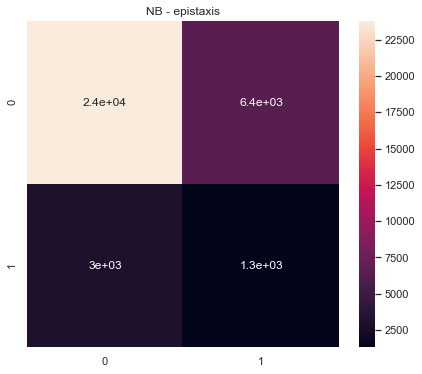

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  epistaxis  300.0  0.508007      0.520303         0.513033   0.541009
0   2.0  epistaxis  300.0  0.506161      0.522258         0.513536   0.545505
0   3.0  epistaxis  300.0  0.482321      0.502302         0.501242   0.521592
0   4.0  epistaxis  300.0  0.517657      0.520398         0.517086   0.541787
0   5.0  epistaxis  300.0  0.496630      0.501263         0.500886   0.521434



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  epistaxis  300.0  2.510776    2.566524       2.545783  2.671327
================================== DT ==================================


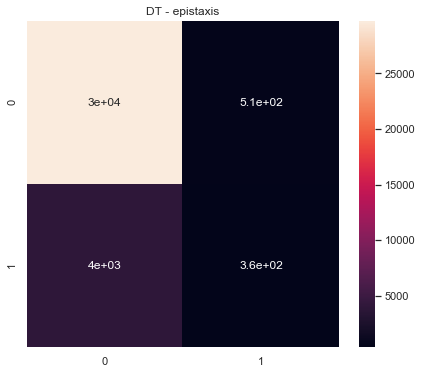

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  epistaxis  300.0  0.483630      0.493649         0.486333   0.515960
0   2.0  epistaxis  300.0  0.478883      0.489022         0.478138   0.519507
0   3.0  epistaxis  300.0  0.458112      0.464052         0.453242   0.484543
0   4.0  epistaxis  300.0  0.479887      0.490761         0.480266   0.515363
0   5.0  epistaxis  300.0  0.472129      0.498331         0.484762   0.515215



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  epistaxis  300.0  2.372642    2.435814       2.382741  2.550589
================================== RF ==================================


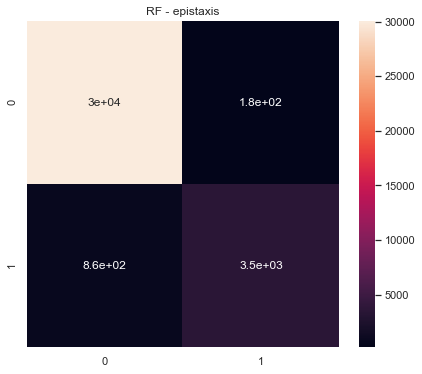

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  epistaxis  300.0  0.469606      0.492041         0.464851   0.526190
0   2.0  epistaxis  300.0  0.467355      0.486578         0.459065   0.488243
0   3.0  epistaxis  300.0  0.452196      0.471873         0.434094   0.462767
0   4.0  epistaxis  300.0  0.463647      0.489819         0.446401   0.451169
0   5.0  epistaxis  300.0  0.466486      0.499835         0.437310   0.529375



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  epistaxis  300.0  2.319291    2.440146       2.241721  2.457745
================================== SGD ==================================


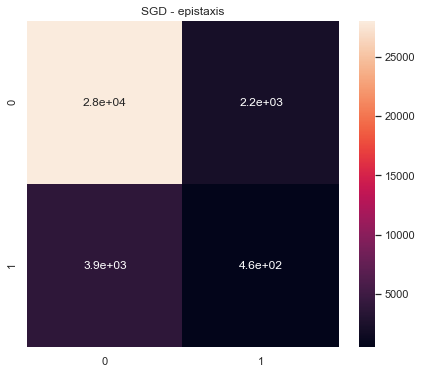

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  epistaxis  300.0  0.469702      0.469948         0.469463   0.441346
0   2.0  epistaxis  300.0  0.503720      0.503696         0.503759   0.505609
0   3.0  epistaxis  300.0  0.470117      0.473864         0.467495   0.431152
0   4.0  epistaxis  300.0  0.476583      0.480639         0.474495   0.436694
0   5.0  epistaxis  300.0  0.478586      0.479271         0.478017   0.472437



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  epistaxis  300.0  2.398707    2.407417        2.39323  2.287238
================================== LR ==================================


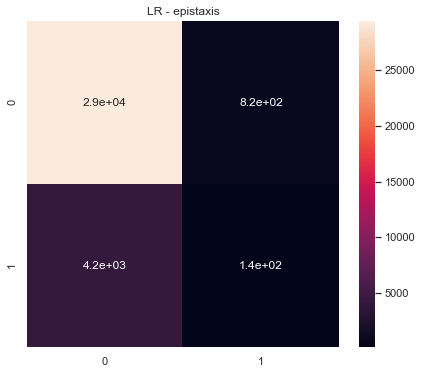

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  epistaxis  300.0  0.495516      0.501757         0.501178   0.540314
0   2.0  epistaxis  300.0  0.482338      0.486088         0.481192   0.507892
0   3.0  epistaxis  300.0  0.472439      0.471832         0.473122   0.443834
0   4.0  epistaxis  300.0  0.498310      0.498853         0.498672   0.457859
0   5.0  epistaxis  300.0  0.488756      0.488832         0.488686   0.474952



         ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  epistaxis  300.0  2.43736    2.447362        2.44285  2.424852
================================== eruption ==================================
================================== NB ==================================


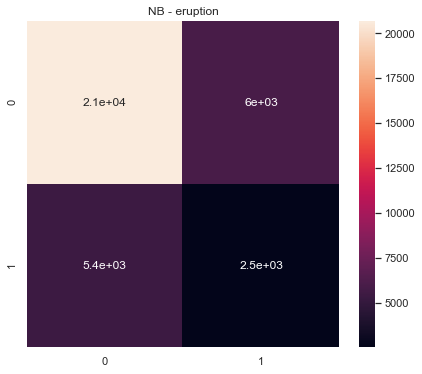

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  eruption  300.0  0.520783      0.522169         0.520524   0.536265
0   2.0  eruption  300.0  0.492840      0.494997         0.495730   0.527891
0   3.0  eruption  300.0  0.509540      0.513604         0.511526   0.523167
0   4.0  eruption  300.0  0.516357      0.516146         0.517490   0.501063
0   5.0  eruption  300.0  0.529163      0.528468         0.533263   0.552563



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  eruption  300.0  2.568682    2.575384       2.578534  2.640948
================================== DT ==================================


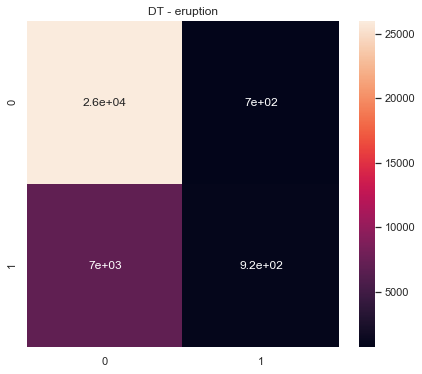

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  eruption  300.0  0.476432      0.506061         0.521847   0.518617
0   2.0  eruption  300.0  0.470504      0.492338         0.482720   0.489731
0   3.0  eruption  300.0  0.422072      0.446719         0.406596   0.428774
0   4.0  eruption  300.0  0.445386      0.484099         0.444851   0.485179
0   5.0  eruption  300.0  0.465578      0.508320         0.564393   0.505323



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  eruption  300.0  2.279972    2.437537       2.420407  2.427624
================================== RF ==================================


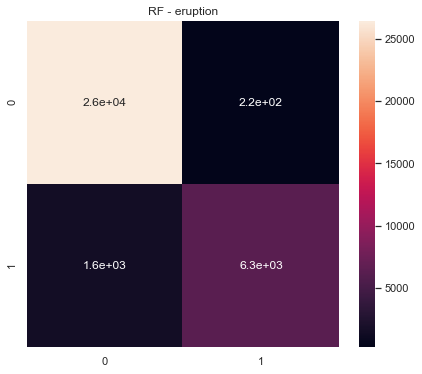

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  eruption  300.0  0.457781      0.497071         0.486776   0.547555
0   2.0  eruption  300.0  0.442335      0.492854         0.449570   0.485499
0   3.0  eruption  300.0  0.421024      0.458677         0.396144   0.451485
0   4.0  eruption  300.0  0.432151      0.483699         0.407625   0.425122
0   5.0  eruption  300.0  0.444109      0.503032         0.627789   0.521087



        ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  eruption  300.0  2.1974    2.435334       2.367904  2.430748
================================== SGD ==================================


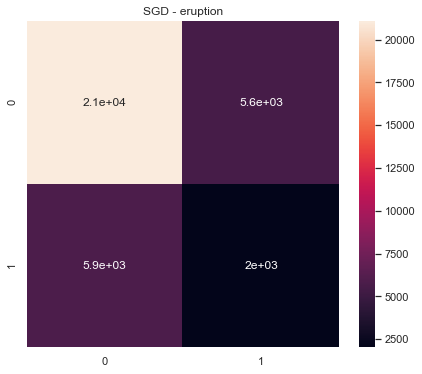

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  eruption  300.0  0.493497      0.493518         0.493810   0.497567
0   2.0  eruption  300.0  0.476745      0.476947         0.479929   0.449926
0   3.0  eruption  300.0  0.475650      0.475893         0.479142   0.461982
0   4.0  eruption  300.0  0.478727      0.481256         0.478363   0.450819
0   5.0  eruption  300.0  0.493292      0.494922         0.494124   0.474692



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  eruption  300.0  2.417911    2.422537       2.425368  2.334986
================================== LR ==================================


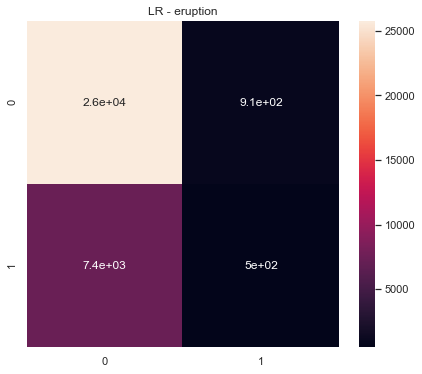

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  eruption  300.0  0.517685      0.520958         0.531353   0.540277
0   2.0  eruption  300.0  0.493625      0.498660         0.498160   0.453823
0   3.0  eruption  300.0  0.453811      0.456209         0.452155   0.457461
0   4.0  eruption  300.0  0.465912      0.477787         0.466085   0.447492
0   5.0  eruption  300.0  0.465543      0.497795         0.492415   0.501949



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  eruption  300.0  2.396576     2.45141       2.440168  2.401002
================================== erythema ==================================
================================== NB ==================================


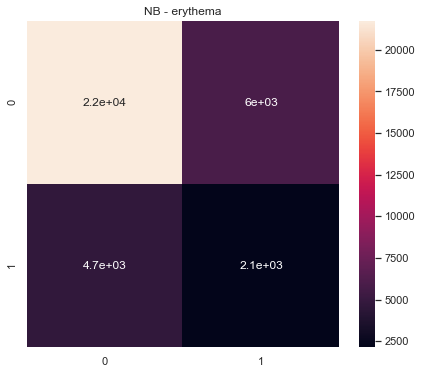

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  erythema  300.0  0.525646      0.525108         0.526566   0.545119
0   2.0  erythema  300.0  0.508323      0.511835         0.509876   0.543785
0   3.0  erythema  300.0  0.496285      0.503771         0.502857   0.507890
0   4.0  erythema  300.0  0.509337      0.509457         0.509266   0.498795
0   5.0  erythema  300.0  0.505627      0.505593         0.505697   0.508978



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  erythema  300.0  2.545217    2.555764       2.554263  2.604567
================================== DT ==================================


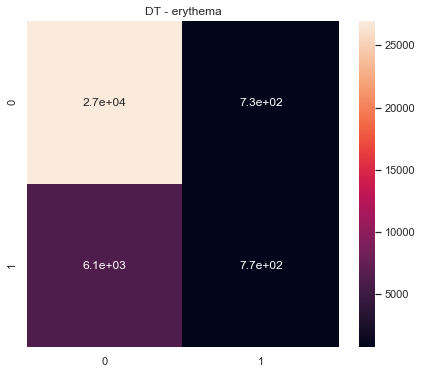

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  erythema  300.0  0.477929      0.505861         0.525595   0.520149
0   2.0  erythema  300.0  0.462870      0.478911         0.461426   0.484001
0   3.0  erythema  300.0  0.446990      0.461326         0.439785   0.470803
0   4.0  erythema  300.0  0.450517      0.476169         0.443412   0.448834
0   5.0  erythema  300.0  0.481368      0.504988         0.517127   0.518789



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  erythema  300.0  2.319674    2.427256       2.387345  2.442576
================================== RF ==================================


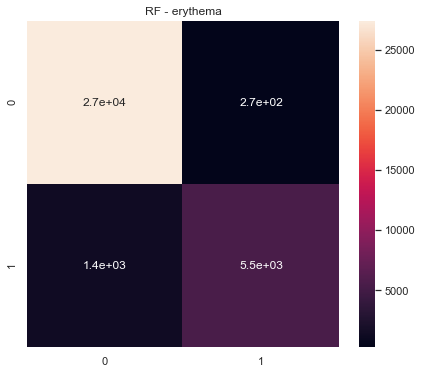

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  erythema  300.0  0.450694      0.501559         0.561543   0.545470
0   2.0  erythema  300.0  0.430295      0.466688         0.402466   0.502562
0   3.0  erythema  300.0  0.420946      0.450508         0.396268   0.451025
0   4.0  erythema  300.0  0.435518      0.472564         0.411214   0.419910
0   5.0  erythema  300.0  0.452027      0.503007         0.695162   0.518783



        ADR    PCA   Avg F1  Avg Recall  Avg Precision  Avg ROC
0  erythema  300.0  2.18948    2.394326       2.466652  2.43775
================================== SGD ==================================


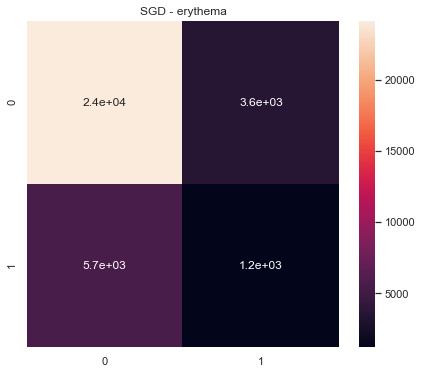

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  erythema  300.0  0.474719      0.474740         0.474698   0.469381
0   2.0  erythema  300.0  0.485805      0.486832         0.485543   0.427715
0   3.0  erythema  300.0  0.432630      0.447547         0.422265   0.426276
0   4.0  erythema  300.0  0.439293      0.445302         0.434768   0.423352
0   5.0  erythema  300.0  0.475081      0.475340         0.474855   0.456823



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  erythema  300.0  2.307528    2.329761       2.292128  2.203547
================================== LR ==================================


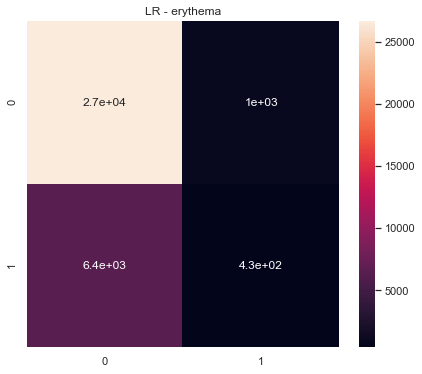

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  erythema  300.0  0.511461      0.514254         0.521092   0.548287
0   2.0  erythema  300.0  0.452282      0.469747         0.446174   0.424899
0   3.0  erythema  300.0  0.460052      0.458386         0.464411   0.440566
0   4.0  erythema  300.0  0.472439      0.472655         0.472243   0.435104
0   5.0  erythema  300.0  0.479401      0.488683         0.482077   0.467923



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  erythema  300.0  2.375635    2.403726       2.385996  2.31678
================================== esophagitis ==================================
================================== NB ==================================


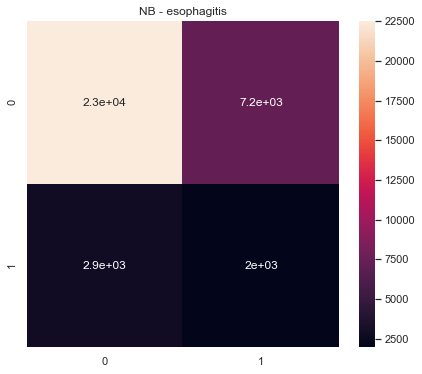

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  esophagitis  300.0  0.540664      0.548530         0.538409   
0   2.0  esophagitis  300.0  0.512545      0.538606         0.522940   
0   3.0  esophagitis  300.0  0.489704      0.524925         0.513450   
0   4.0  esophagitis  300.0  0.517438      0.531021         0.520902   
0   5.0  esophagitis  300.0  0.512848      0.517459         0.513602   

   ROC Macro  
0   0.582267  
0   0.571387  
0   0.541112  
0   0.535239  
0   0.550106  



           ADR    PCA  Avg F1  Avg Recall  Avg Precision  Avg ROC
0  esophagitis  300.0  2.5732    2.660541       2.609302  2.78011
================================== DT ==================================


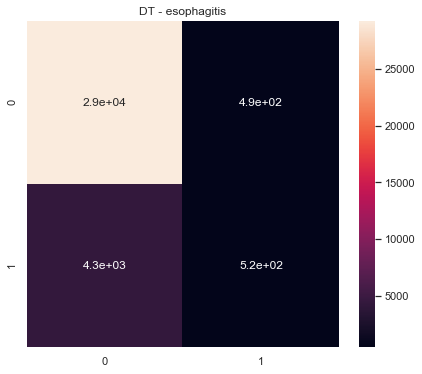

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  esophagitis  300.0  0.505719      0.515755         0.560096   
0   2.0  esophagitis  300.0  0.462773      0.476692         0.455504   
0   3.0  esophagitis  300.0  0.471521      0.479760         0.468307   
0   4.0  esophagitis  300.0  0.470525      0.491703         0.471039   
0   5.0  esophagitis  300.0  0.486511      0.509203         0.593576   

   ROC Macro  
0   0.544680  
0   0.448847  
0   0.484495  
0   0.433046  
0   0.505582  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  esophagitis  300.0  2.397048    2.473112       2.548523  2.416649
================================== RF ==================================


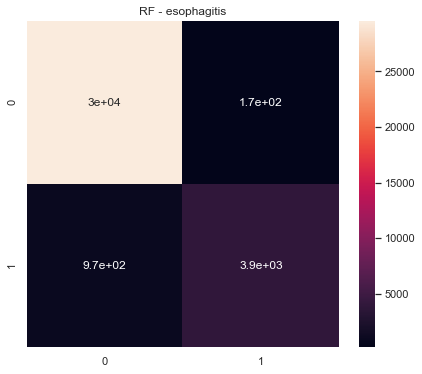

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  esophagitis  300.0  0.462089      0.499663         0.429771   
0   2.0  esophagitis  300.0  0.449534      0.475080         0.426595   
0   3.0  esophagitis  300.0  0.458672      0.473939         0.449244   
0   4.0  esophagitis  300.0  0.457784      0.491160         0.428655   
0   5.0  esophagitis  300.0  0.462167      0.499832         0.429781   

   ROC Macro  
0   0.579994  
0   0.505456  
0   0.481782  
0   0.467987  
0   0.568125  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  esophagitis  300.0  2.290247    2.439674       2.164047  2.603344
================================== SGD ==================================


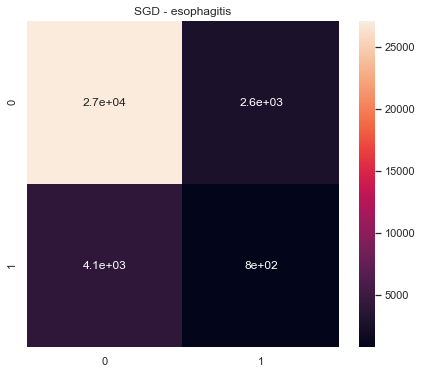

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  esophagitis  300.0  0.481087      0.481955         0.480482   
0   2.0  esophagitis  300.0  0.479890      0.479312         0.480716   
0   3.0  esophagitis  300.0  0.449504      0.446170         0.453651   
0   4.0  esophagitis  300.0  0.490335      0.490260         0.490425   
0   5.0  esophagitis  300.0  0.487983      0.490459         0.487859   

   ROC Macro  
0   0.476583  
0   0.450089  
0   0.405628  
0   0.455135  
0   0.434628  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  esophagitis  300.0  2.388799    2.388157       2.393133  2.222063
================================== LR ==================================


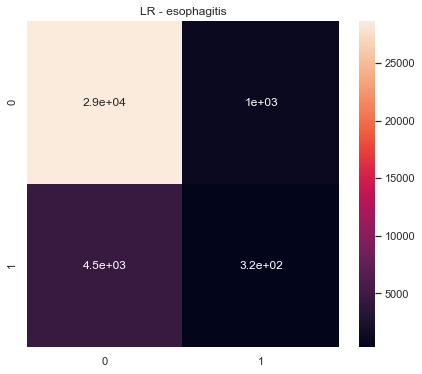

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  esophagitis  300.0  0.514860      0.523437         0.516853   
0   2.0  esophagitis  300.0  0.495704      0.501790         0.503319   
0   3.0  esophagitis  300.0  0.477478      0.476743         0.481621   
0   4.0  esophagitis  300.0  0.488445      0.488939         0.491095   
0   5.0  esophagitis  300.0  0.522084      0.521552         0.522850   

   ROC Macro  
0   0.513267  
0   0.473205  
0   0.494476  
0   0.502128  
0   0.523444  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision  Avg ROC
0  esophagitis  300.0  2.49857    2.512462       2.515739  2.50652
================================== facial.flushing ==================================
================================== NB ==================================


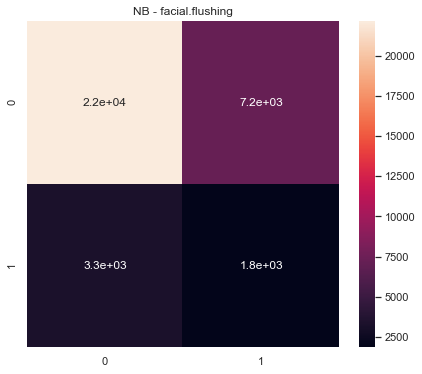

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  facial.flushing  300.0  0.529988      0.535419         0.528841   
0   2.0  facial.flushing  300.0  0.525270      0.542594         0.528587   
0   3.0  facial.flushing  300.0  0.499446      0.521130         0.512799   
0   4.0  facial.flushing  300.0  0.528726      0.533409         0.527624   
0   5.0  facial.flushing  300.0  0.505873      0.511845         0.508767   

   ROC Macro  
0   0.574069  
0   0.558265  
0   0.547345  
0   0.558447  
0   0.541635  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  facial.flushing  300.0  2.589302    2.644397       2.606619  2.77976
================================== DT ==================================


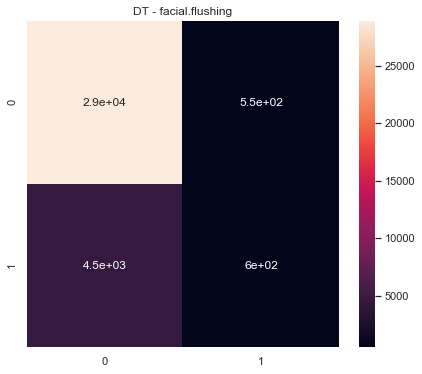

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  facial.flushing  300.0  0.485819      0.504943         0.521848   
0   2.0  facial.flushing  300.0  0.482677      0.501033         0.503751   
0   3.0  facial.flushing  300.0  0.474466      0.489061         0.475237   
0   4.0  facial.flushing  300.0  0.483072      0.497028         0.492453   
0   5.0  facial.flushing  300.0  0.480789      0.498649         0.495570   

   ROC Macro  
0   0.552759  
0   0.558601  
0   0.519492  
0   0.498654  
0   0.503942  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  facial.flushing  300.0  2.406823    2.490715       2.488859  2.633448
================================== RF ==================================


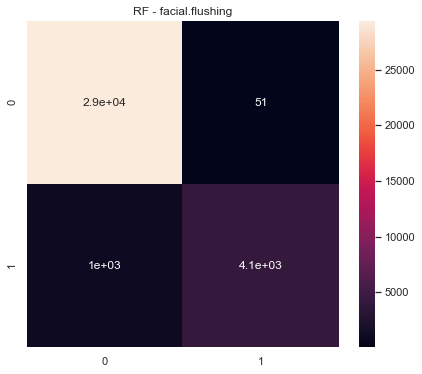

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  facial.flushing  300.0  0.459354      0.499065         0.425496   
0   2.0  facial.flushing  300.0  0.463654      0.501606         0.675819   
0   3.0  facial.flushing  300.0  0.451326      0.483169         0.423421   
0   4.0  facial.flushing  300.0  0.458965      0.496915         0.436777   
0   5.0  facial.flushing  300.0  0.461782      0.500888         0.759050   

   ROC Macro  
0   0.540263  
0   0.581412  
0   0.527886  
0   0.496440  
0   0.535725  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  facial.flushing  300.0  2.295082    2.481642       2.720563  2.681726
================================== SGD ==================================


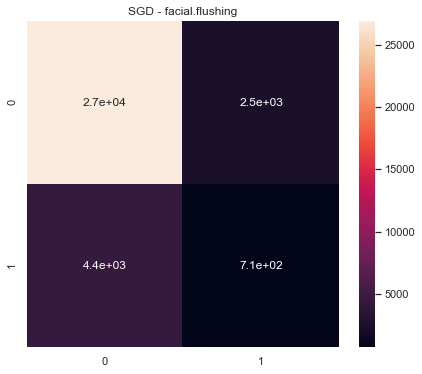

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  facial.flushing  300.0  0.496861      0.498976         0.498641   
0   2.0  facial.flushing  300.0  0.472755      0.480196         0.470284   
0   3.0  facial.flushing  300.0  0.468784      0.477859         0.465163   
0   4.0  facial.flushing  300.0  0.487200      0.490522         0.487378   
0   5.0  facial.flushing  300.0  0.487561      0.488537         0.487198   

   ROC Macro  
0   0.509612  
0   0.465365  
0   0.427685  
0   0.501713  
0   0.484632  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  facial.flushing  300.0  2.413161     2.43609       2.408662  2.389006
================================== LR ==================================


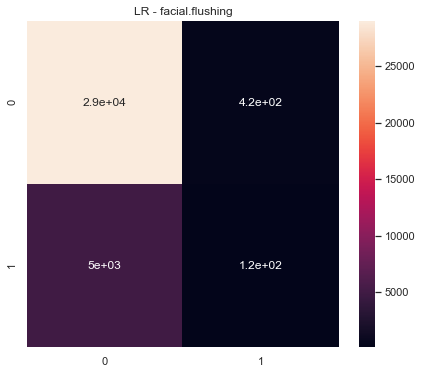

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  facial.flushing  300.0  0.522116      0.523084         0.544539   
0   2.0  facial.flushing  300.0  0.478448      0.501973         0.510720   
0   3.0  facial.flushing  300.0  0.477299      0.479572         0.476068   
0   4.0  facial.flushing  300.0  0.481154      0.494284         0.486808   
0   5.0  facial.flushing  300.0  0.490347      0.501552         0.503734   

   ROC Macro  
0   0.568881  
0   0.536096  
0   0.512932  
0   0.527844  
0   0.511387  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  facial.flushing  300.0  2.449364    2.500464       2.521869  2.657139
================================== fatty.liver ==================================
================================== NB ==================================


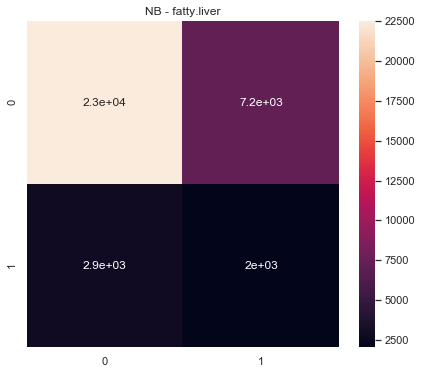

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fatty.liver  300.0  0.547190      0.555192         0.544314   
0   2.0  fatty.liver  300.0  0.545687      0.558295         0.543277   
0   3.0  fatty.liver  300.0  0.507217      0.547227         0.525955   
0   4.0  fatty.liver  300.0  0.544679      0.565951         0.544251   
0   5.0  fatty.liver  300.0  0.531953      0.553951         0.534818   

   ROC Macro  
0   0.613197  
0   0.597765  
0   0.576962  
0   0.602494  
0   0.575448  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fatty.liver  300.0  2.676726    2.780617       2.692616  2.965866
================================== DT ==================================


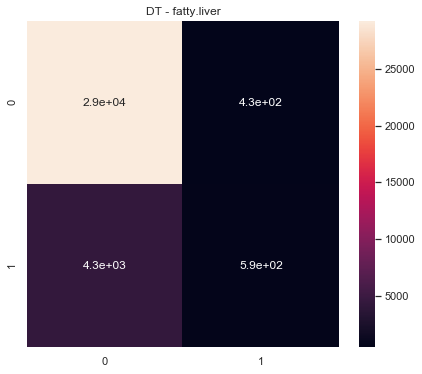

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fatty.liver  300.0  0.499104      0.513766         0.572992   
0   2.0  fatty.liver  300.0  0.488383      0.507540         0.542824   
0   3.0  fatty.liver  300.0  0.492917      0.500527         0.501045   
0   4.0  fatty.liver  300.0  0.486926      0.503665         0.514138   
0   5.0  fatty.liver  300.0  0.492056      0.507256         0.528829   

   ROC Macro  
0   0.551079  
0   0.555035  
0   0.540475  
0   0.538256  
0   0.539524  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fatty.liver  300.0  2.459385    2.532754       2.659828  2.724368
================================== RF ==================================


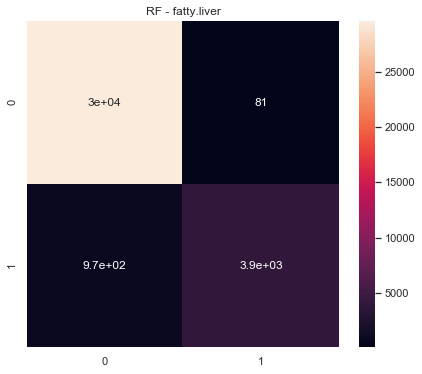

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fatty.liver  300.0  0.462636      0.499753         0.479275   
0   2.0  fatty.liver  300.0  0.461964      0.500000         0.429305   
0   3.0  fatty.liver  300.0  0.463885      0.483669         0.456113   
0   4.0  fatty.liver  300.0  0.463245      0.495476         0.456766   
0   5.0  fatty.liver  300.0  0.461832      0.499747         0.429264   

   ROC Macro  
0   0.575102  
0   0.563287  
0   0.568628  
0   0.583454  
0   0.608644  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fatty.liver  300.0  2.313561    2.478645       2.250724  2.899115
================================== SGD ==================================


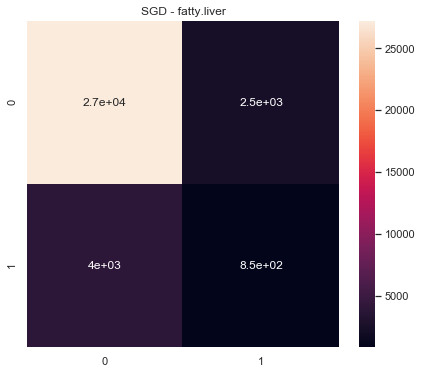

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fatty.liver  300.0  0.491136      0.491362         0.490997   
0   2.0  fatty.liver  300.0  0.494224      0.494643         0.494170   
0   3.0  fatty.liver  300.0  0.465556      0.474023         0.460901   
0   4.0  fatty.liver  300.0  0.479482      0.478747         0.480707   
0   5.0  fatty.liver  300.0  0.489870      0.495871         0.493089   

   ROC Macro  
0   0.490834  
0   0.491307  
0   0.398361  
0   0.471812  
0   0.484506  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fatty.liver  300.0  2.420268    2.434646       2.419865  2.336819
================================== LR ==================================


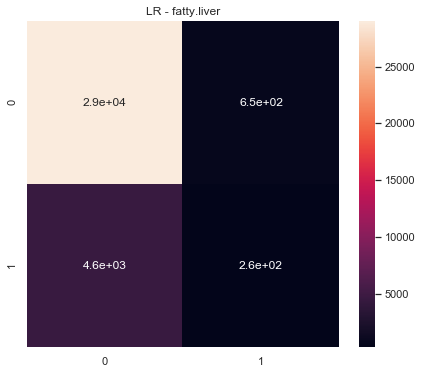

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fatty.liver  300.0  0.524856      0.523601         0.528140   
0   2.0  fatty.liver  300.0  0.480345      0.502350         0.512931   
0   3.0  fatty.liver  300.0  0.472277      0.473559         0.471259   
0   4.0  fatty.liver  300.0  0.498986      0.498986         0.498987   
0   5.0  fatty.liver  300.0  0.547770      0.542514         0.574033   

   ROC Macro  
0   0.569448  
0   0.486213  
0   0.503135  
0   0.543756  
0   0.569569  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fatty.liver  300.0  2.524234     2.54101       2.585351  2.672121
================================== fibromyalgia ==================================
================================== NB ==================================


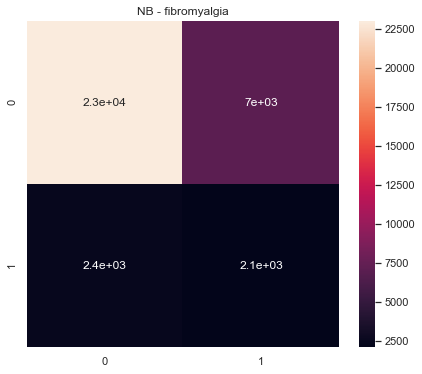

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fibromyalgia  300.0  0.535936      0.551911         0.535437   
0   2.0  fibromyalgia  300.0  0.533228      0.554846         0.534946   
0   3.0  fibromyalgia  300.0  0.511875      0.571268         0.535699   
0   4.0  fibromyalgia  300.0  0.560005      0.582836         0.556044   
0   5.0  fibromyalgia  300.0  0.536466      0.548427         0.534990   

   ROC Macro  
0   0.613371  
0   0.600243  
0   0.617153  
0   0.630207  
0   0.609463  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fibromyalgia  300.0  2.677511    2.809288       2.697117  3.070437
================================== DT ==================================


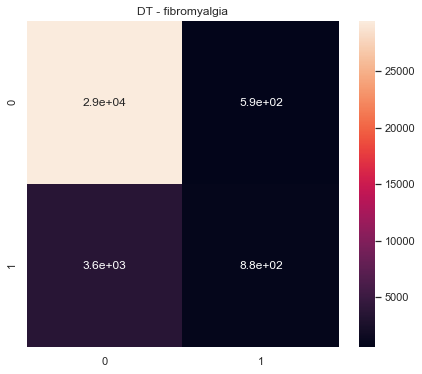

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fibromyalgia  300.0  0.501170      0.512736         0.556223   
0   2.0  fibromyalgia  300.0  0.513652      0.518986         0.561264   
0   3.0  fibromyalgia  300.0  0.494458      0.500623         0.501182   
0   4.0  fibromyalgia  300.0  0.519890      0.521468         0.550405   
0   5.0  fibromyalgia  300.0  0.519863      0.521856         0.555285   

   ROC Macro  
0   0.587839  
0   0.579368  
0   0.551980  
0   0.559743  
0   0.580548  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fibromyalgia  300.0  2.549033    2.575669       2.724359  2.859479
================================== RF ==================================


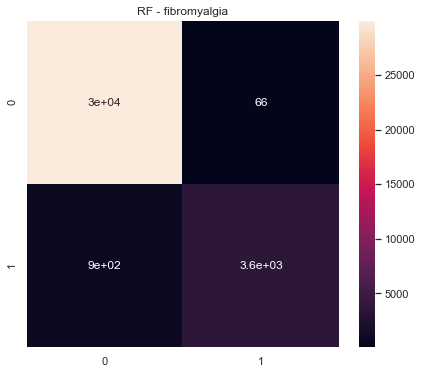

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fibromyalgia  300.0  0.468375      0.501657         0.934704   
0   2.0  fibromyalgia  300.0  0.464922      0.499917         0.434506   
0   3.0  fibromyalgia  300.0  0.457543      0.477639         0.442715   
0   4.0  fibromyalgia  300.0  0.464880      0.499833         0.434496   
0   5.0  fibromyalgia  300.0  0.464377      0.498751         0.434436   

   ROC Macro  
0   0.630390  
0   0.655720  
0   0.618752  
0   0.605529  
0   0.655510  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  fibromyalgia  300.0  2.320098    2.477798       2.680857   3.1659
================================== SGD ==================================


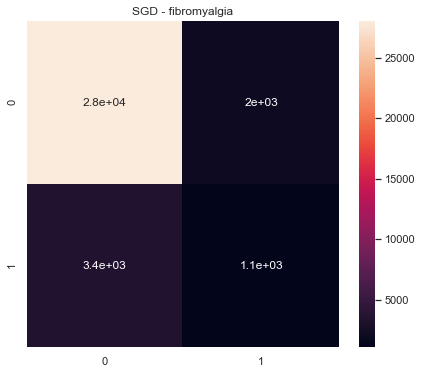

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fibromyalgia  300.0  0.497019      0.497926         0.497516   
0   2.0  fibromyalgia  300.0  0.520401      0.520236         0.520585   
0   3.0  fibromyalgia  300.0  0.471433      0.474880         0.469142   
0   4.0  fibromyalgia  300.0  0.504827      0.508949         0.517568   
0   5.0  fibromyalgia  300.0  0.479215      0.486445         0.477930   

   ROC Macro  
0   0.521980  
0   0.478488  
0   0.446817  
0   0.516509  
0   0.536777  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  fibromyalgia  300.0  2.472895    2.488436       2.482741  2.50057
================================== LR ==================================


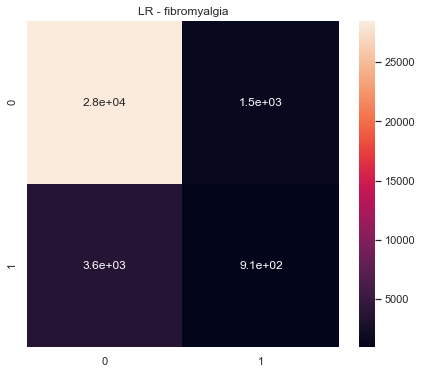

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fibromyalgia  300.0  0.572468      0.587742         0.566369   
0   2.0  fibromyalgia  300.0  0.492721      0.502767         0.507172   
0   3.0  fibromyalgia  300.0  0.530021      0.565499         0.537382   
0   4.0  fibromyalgia  300.0  0.509630      0.525669         0.516047   
0   5.0  fibromyalgia  300.0  0.550549      0.589117         0.552399   

   ROC Macro  
0   0.638600  
0   0.516761  
0   0.594110  
0   0.504875  
0   0.632614  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  fibromyalgia  300.0  2.655389    2.770795       2.679369  2.88696
================================== flatulence ==================================
================================== NB ==================================


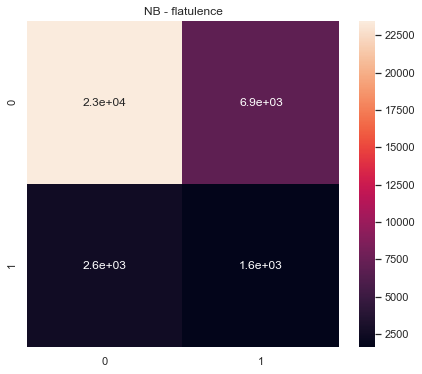

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flatulence  300.0  0.541710      0.565840         0.541238   0.596096
0   2.0  flatulence  300.0  0.533251      0.555782         0.534557   0.605168
0   3.0  flatulence  300.0  0.491478      0.535586         0.517219   0.568528
0   4.0  flatulence  300.0  0.520890      0.536638         0.523428   0.563550
0   5.0  flatulence  300.0  0.519478      0.527166         0.519720   0.578172



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flatulence  300.0  2.606808    2.721012       2.636162  2.911515
================================== DT ==================================


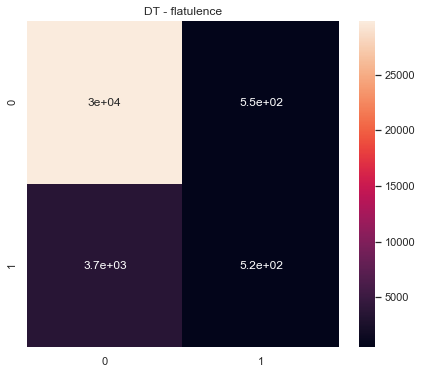

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flatulence  300.0  0.517842      0.517378         0.527133   0.535208
0   2.0  flatulence  300.0  0.491160      0.503334         0.511303   0.548240
0   3.0  flatulence  300.0  0.481285      0.489202         0.480616   0.508565
0   4.0  flatulence  300.0  0.476193      0.483171         0.473435   0.484229
0   5.0  flatulence  300.0  0.495545      0.507327         0.528842   0.531424



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flatulence  300.0  2.462025    2.500411       2.521329  2.607665
================================== RF ==================================


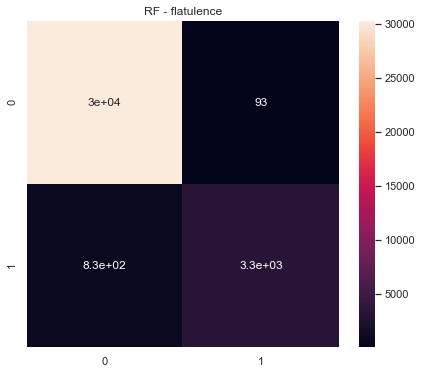

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flatulence  300.0  0.468571      0.499693         0.481142   0.569834
0   2.0  flatulence  300.0  0.463009      0.490451         0.438475   0.561204
0   3.0  flatulence  300.0  0.463039      0.480995         0.450864   0.515084
0   4.0  flatulence  300.0  0.466955      0.496565         0.449140   0.491507
0   5.0  flatulence  300.0  0.467679      0.499753         0.439473   0.580901



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flatulence  300.0  2.329253    2.467456       2.259094  2.718531
================================== SGD ==================================


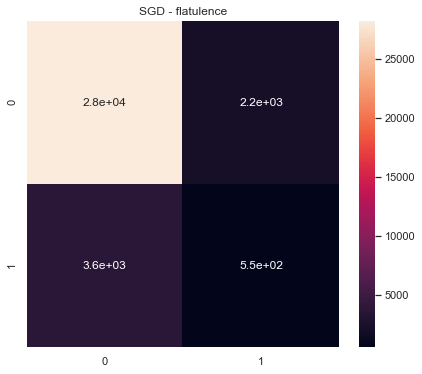

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flatulence  300.0  0.505335      0.506255         0.505457   0.466019
0   2.0  flatulence  300.0  0.470516      0.479989         0.465613   0.455951
0   3.0  flatulence  300.0  0.456073      0.452168         0.461337   0.393434
0   4.0  flatulence  300.0  0.492045      0.493342         0.491978   0.430599
0   5.0  flatulence  300.0  0.496620      0.498328         0.498705   0.492354



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flatulence  300.0  2.420588    2.430082        2.42309  2.238358
================================== LR ==================================


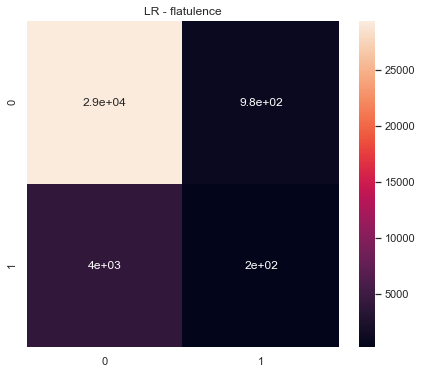

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flatulence  300.0  0.513177      0.523739         0.515856   0.551101
0   2.0  flatulence  300.0  0.484636      0.495041         0.488503   0.496620
0   3.0  flatulence  300.0  0.486721      0.487756         0.491014   0.470505
0   4.0  flatulence  300.0  0.488165      0.487933         0.489891   0.459884
0   5.0  flatulence  300.0  0.515788      0.531907         0.519918   0.510855



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flatulence  300.0  2.488488    2.526375       2.505182  2.488964
================================== flu ==================================
================================== NB ==================================


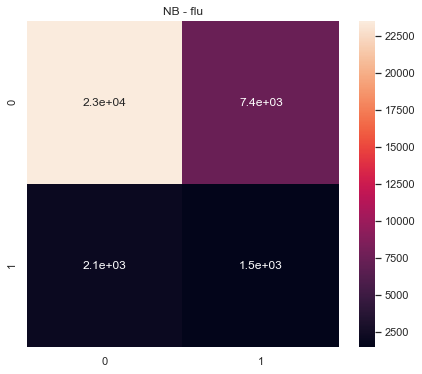

   Fold  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flu  300.0  0.540236      0.568705         0.539859   0.618318
0   2.0  flu  300.0  0.529076      0.565578         0.534414   0.599841
0   3.0  flu  300.0  0.493876      0.549384         0.521412   0.580361
0   4.0  flu  300.0  0.517210      0.540689         0.522664   0.566425
0   5.0  flu  300.0  0.508699      0.526357         0.515028   0.571854



   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flu  300.0  2.589097    2.750713       2.633379  2.936799
================================== DT ==================================


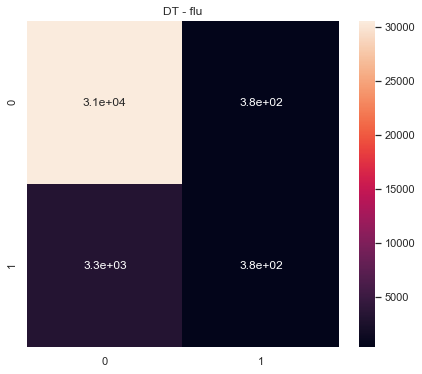

   Fold  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flu  300.0  0.477039      0.498311         0.485768   0.514932
0   2.0  flu  300.0  0.488349      0.502814         0.514666   0.542217
0   3.0  flu  300.0  0.453419      0.460831         0.446413   0.441675
0   4.0  flu  300.0  0.487436      0.499463         0.498177   0.489157
0   5.0  flu  300.0  0.492643      0.505708         0.531411   0.528300



   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flu  300.0  2.398885    2.467126       2.476436  2.516281
================================== RF ==================================


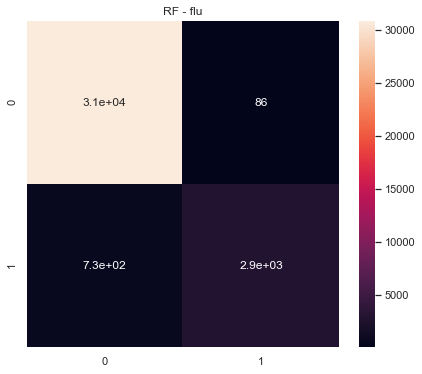

   Fold  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flu  300.0  0.472076      0.499596         0.447429   0.564432
0   2.0  flu  300.0  0.472277      0.500000         0.447467   0.568826
0   3.0  flu  300.0  0.455219      0.466850         0.444154   0.474533
0   4.0  flu  300.0  0.472887      0.499152         0.472388   0.427305
0   5.0  flu  300.0  0.472313      0.500000         0.447532   0.549970



   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flu  300.0  2.344773    2.465598        2.25897  2.585067
================================== SGD ==================================


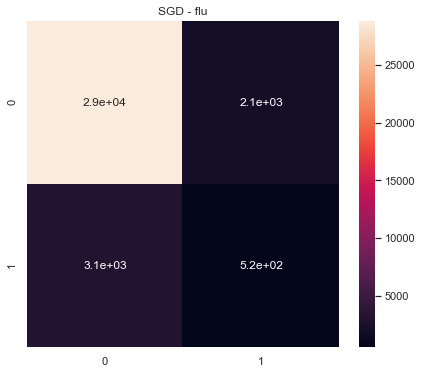

   Fold  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flu  300.0  0.485162      0.484572         0.486115   0.446645
0   2.0  flu  300.0  0.465933      0.466208         0.465664   0.454234
0   3.0  flu  300.0  0.451246      0.451667         0.450828   0.365624
0   4.0  flu  300.0  0.481638      0.487026         0.479796   0.441160
0   5.0  flu  300.0  0.490860      0.490817         0.490906   0.471563



   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flu  300.0  2.374839    2.380289       2.373307  2.179226
================================== LR ==================================


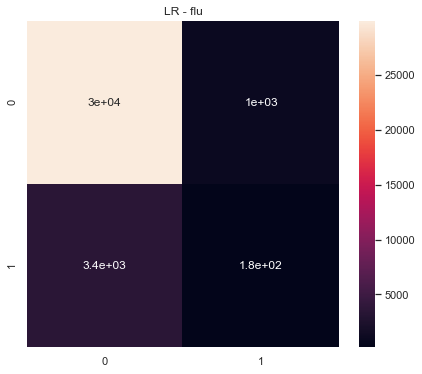

   Fold  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  flu  300.0  0.517874      0.540971         0.522968   0.550425
0   2.0  flu  300.0  0.499299      0.508893         0.540158   0.508295
0   3.0  flu  300.0  0.486847      0.498327         0.499081   0.534151
0   4.0  flu  300.0  0.476474      0.474758         0.480935   0.457198
0   5.0  flu  300.0  0.484970      0.489667         0.493717   0.503374



   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  flu  300.0  2.465464    2.512616        2.53686  2.553443
================================== fungal.disease ==================================
================================== NB ==================================


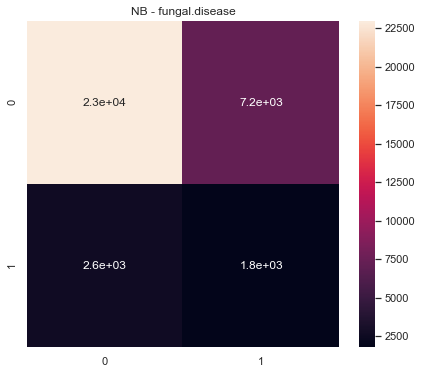

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fungal.disease  300.0  0.532575      0.543942         0.531535   
0   2.0  fungal.disease  300.0  0.534793      0.562752         0.537810   
0   3.0  fungal.disease  300.0  0.504127      0.536673         0.519741   
0   4.0  fungal.disease  300.0  0.522697      0.540275         0.525717   
0   5.0  fungal.disease  300.0  0.526970      0.538189         0.526945   

   ROC Macro  
0   0.580292  
0   0.584522  
0   0.571183  
0   0.562115  
0   0.578417  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fungal.disease  300.0  2.621162    2.721832       2.641748  2.876529
================================== DT ==================================


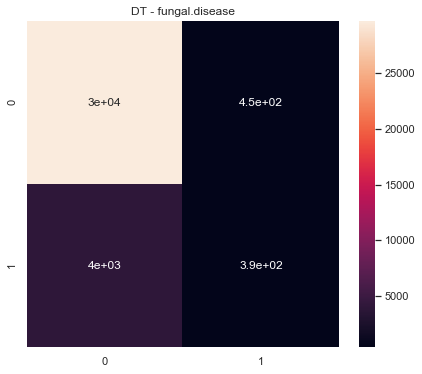

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fungal.disease  300.0  0.479560      0.501591         0.510921   
0   2.0  fungal.disease  300.0  0.482093      0.504302         0.537716   
0   3.0  fungal.disease  300.0  0.479010      0.480516         0.477993   
0   4.0  fungal.disease  300.0  0.459335      0.469250         0.452018   
0   5.0  fungal.disease  300.0  0.487063      0.506056         0.541204   

   ROC Macro  
0   0.500261  
0   0.543350  
0   0.525094  
0   0.453434  
0   0.508676  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fungal.disease  300.0  2.38706    2.461716       2.519853  2.530814
================================== RF ==================================


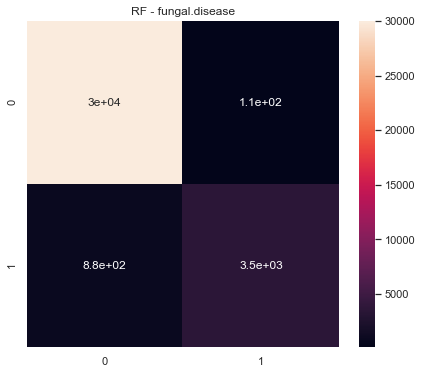

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fungal.disease  300.0  0.466870      0.500152         0.519530   
0   2.0  fungal.disease  300.0  0.465749      0.499751         0.436079   
0   3.0  fungal.disease  300.0  0.470356      0.479627         0.465919   
0   4.0  fungal.disease  300.0  0.462173      0.492617         0.435273   
0   5.0  fungal.disease  300.0  0.465827      0.499834         0.436152   

   ROC Macro  
0   0.584723  
0   0.576789  
0   0.513215  
0   0.469166  
0   0.561107  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fungal.disease  300.0  2.330975    2.471981       2.292953  2.704999
================================== SGD ==================================


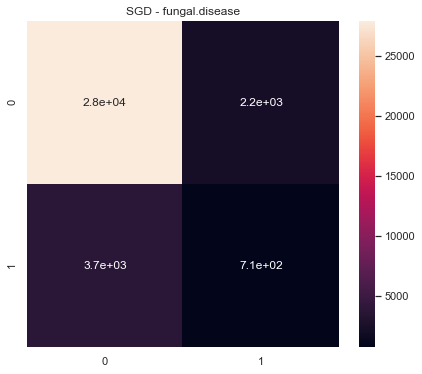

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fungal.disease  300.0  0.467168      0.470766         0.464469   
0   2.0  fungal.disease  300.0  0.507808      0.508667         0.512333   
0   3.0  fungal.disease  300.0  0.505640      0.506040         0.505588   
0   4.0  fungal.disease  300.0  0.455661      0.461033         0.451113   
0   5.0  fungal.disease  300.0  0.499466      0.499475         0.499467   

   ROC Macro  
0   0.450256  
0   0.465206  
0   0.449758  
0   0.418040  
0   0.490295  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fungal.disease  300.0  2.435744    2.445981        2.43297  2.273555
================================== LR ==================================


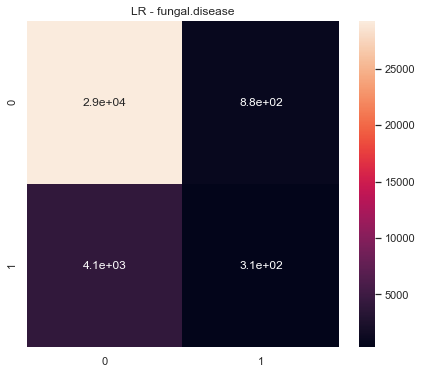

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  fungal.disease  300.0  0.551683      0.556673         0.548742   
0   2.0  fungal.disease  300.0  0.532178      0.529493         0.551451   
0   3.0  fungal.disease  300.0  0.506773      0.519887         0.512635   
0   4.0  fungal.disease  300.0  0.482920      0.482487         0.486007   
0   5.0  fungal.disease  300.0  0.517182      0.517131         0.527314   

   ROC Macro  
0   0.591801  
0   0.559904  
0   0.524537  
0   0.485761  
0   0.500230  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  fungal.disease  300.0  2.590735    2.605671       2.626149  2.662232
================================== gall.bladder ==================================
================================== NB ==================================


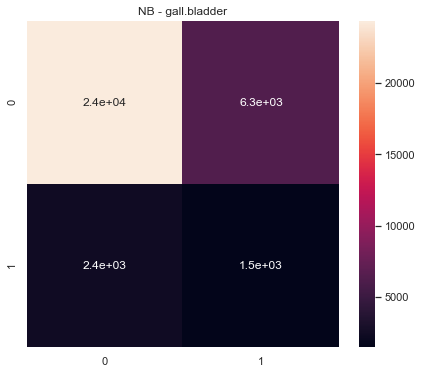

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gall.bladder  300.0  0.532886      0.540435         0.530792   
0   2.0  gall.bladder  300.0  0.543690      0.561736         0.540967   
0   3.0  gall.bladder  300.0  0.519185      0.547234         0.525995   
0   4.0  gall.bladder  300.0  0.524129      0.538869         0.525063   
0   5.0  gall.bladder  300.0  0.515646      0.533554         0.520040   

   ROC Macro  
0   0.611302  
0   0.597133  
0   0.584411  
0   0.571946  
0   0.576278  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gall.bladder  300.0  2.635535    2.721827       2.642857  2.941071
================================== DT ==================================


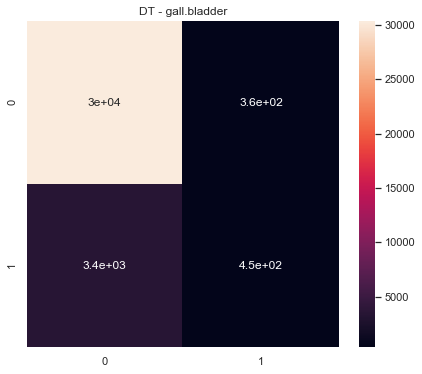

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gall.bladder  300.0  0.508542      0.515192         0.565386   
0   2.0  gall.bladder  300.0  0.499651      0.507513         0.523171   
0   3.0  gall.bladder  300.0  0.481336      0.498229         0.492036   
0   4.0  gall.bladder  300.0  0.485260      0.500250         0.501051   
0   5.0  gall.bladder  300.0  0.490028      0.503348         0.514240   

   ROC Macro  
0   0.576970  
0   0.515185  
0   0.526364  
0   0.495583  
0   0.496796  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gall.bladder  300.0  2.464817    2.524533       2.595883  2.610898
================================== RF ==================================


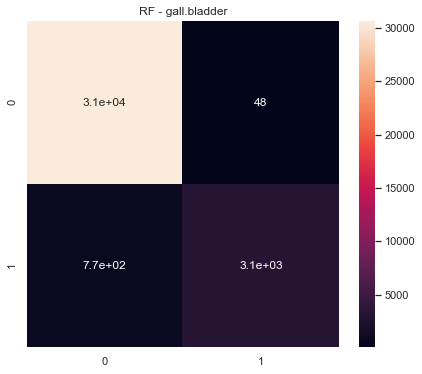

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gall.bladder  300.0  0.470011      0.499104         0.444122   
0   2.0  gall.bladder  300.0  0.470417      0.500000         0.444139   
0   3.0  gall.bladder  300.0  0.464632      0.488514         0.442975   
0   4.0  gall.bladder  300.0  0.470214      0.499593         0.444098   
0   5.0  gall.bladder  300.0  0.476632      0.498427         0.488001   

   ROC Macro  
0   0.562975  
0   0.584002  
0   0.557089  
0   0.532409  
0   0.604856  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gall.bladder  300.0  2.351905    2.485638       2.263336  2.841331
================================== SGD ==================================


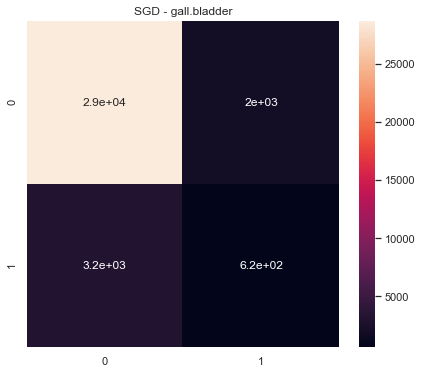

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gall.bladder  300.0  0.484725      0.484649         0.484804   
0   2.0  gall.bladder  300.0  0.494064      0.497771         0.496418   
0   3.0  gall.bladder  300.0  0.486126      0.487561         0.485413   
0   4.0  gall.bladder  300.0  0.503235      0.503703         0.504641   
0   5.0  gall.bladder  300.0  0.495528      0.495485         0.495826   

   ROC Macro  
0   0.515634  
0   0.511002  
0   0.446961  
0   0.495420  
0   0.450789  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gall.bladder  300.0  2.463677    2.469168       2.467103  2.419807
================================== LR ==================================


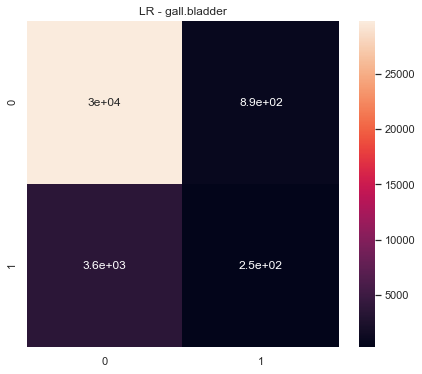

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gall.bladder  300.0  0.526547      0.529212         0.525229   
0   2.0  gall.bladder  300.0  0.490311      0.501358         0.504278   
0   3.0  gall.bladder  300.0  0.506199      0.512269         0.508530   
0   4.0  gall.bladder  300.0  0.492846      0.498046         0.498727   
0   5.0  gall.bladder  300.0  0.530281      0.535658         0.528440   

   ROC Macro  
0   0.524417  
0   0.527233  
0   0.531660  
0   0.536942  
0   0.564030  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gall.bladder  300.0  2.546185    2.576542       2.565203  2.684282
================================== gastric.inflammation ==================================
================================== NB ==================================


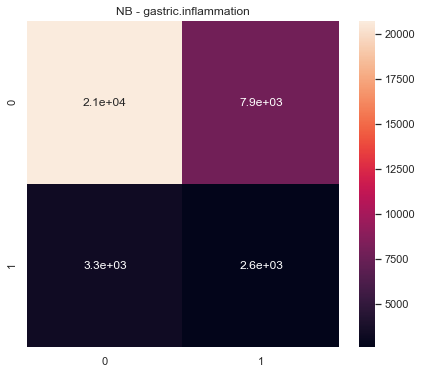

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastric.inflammation  300.0  0.527854      0.530237         0.526968   
0   2.0  gastric.inflammation  300.0  0.538051      0.544840         0.536700   
0   3.0  gastric.inflammation  300.0  0.522521      0.547439         0.531212   
0   4.0  gastric.inflammation  300.0  0.522983      0.552296         0.533639   
0   5.0  gastric.inflammation  300.0  0.514811      0.522708         0.517219   

   ROC Macro  
0   0.566608  
0   0.568216  
0   0.567683  
0   0.554791  
0   0.552749  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastric.inflammation  300.0  2.62622    2.697521       2.645737  2.810048
================================== DT ==================================


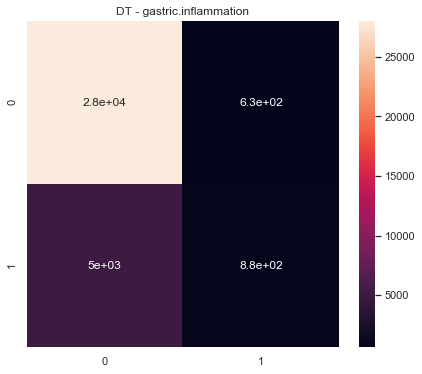

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastric.inflammation  300.0  0.500729      0.511366         0.528414   
0   2.0  gastric.inflammation  300.0  0.487293      0.504340         0.513144   
0   3.0  gastric.inflammation  300.0  0.469573      0.487152         0.470740   
0   4.0  gastric.inflammation  300.0  0.501467      0.515939         0.557461   
0   5.0  gastric.inflammation  300.0  0.479310      0.503443         0.515257   

   ROC Macro  
0   0.555691  
0   0.555608  
0   0.511567  
0   0.557277  
0   0.551106  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastric.inflammation  300.0  2.438372    2.522239       2.585016  2.731249
================================== RF ==================================


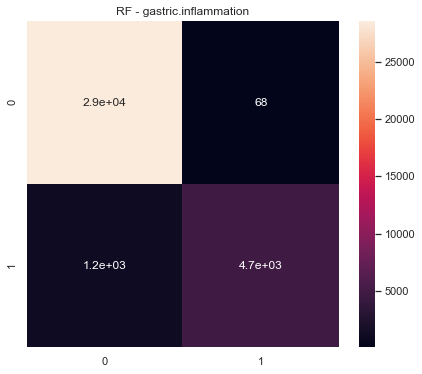

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastric.inflammation  300.0  0.452717      0.499214         0.414143   
0   2.0  gastric.inflammation  300.0  0.455648      0.501091         0.714410   
0   3.0  gastric.inflammation  300.0  0.457770      0.483881         0.451319   
0   4.0  gastric.inflammation  300.0  0.455149      0.500130         0.508023   
0   5.0  gastric.inflammation  300.0  0.454811      0.500670         0.664410   

   ROC Macro  
0   0.587853  
0   0.564761  
0   0.552869  
0   0.567244  
0   0.606686  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastric.inflammation  300.0  2.276094    2.484987       2.752305  2.879413
================================== SGD ==================================


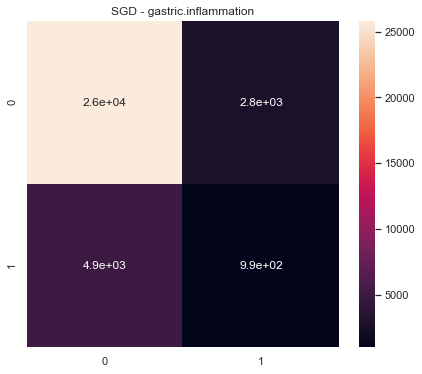

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastric.inflammation  300.0  0.462845      0.468091         0.459827   
0   2.0  gastric.inflammation  300.0  0.473753      0.478423         0.472170   
0   3.0  gastric.inflammation  300.0  0.475355      0.487643         0.476913   
0   4.0  gastric.inflammation  300.0  0.466369      0.475357         0.463253   
0   5.0  gastric.inflammation  300.0  0.462253      0.472734         0.457955   

   ROC Macro  
0   0.465455  
0   0.493853  
0   0.413536  
0   0.474744  
0   0.452801  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastric.inflammation  300.0  2.340574    2.382247       2.330117  2.300388
================================== LR ==================================


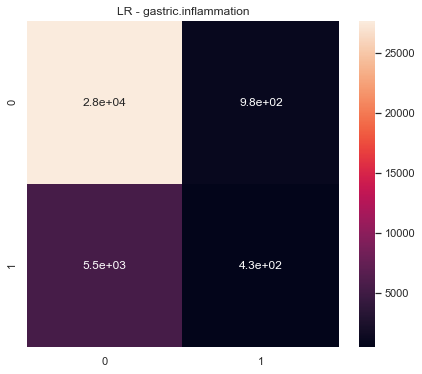

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastric.inflammation  300.0  0.517364      0.517091         0.517777   
0   2.0  gastric.inflammation  300.0  0.486867      0.500248         0.500576   
0   3.0  gastric.inflammation  300.0  0.515721      0.520641         0.516606   
0   4.0  gastric.inflammation  300.0  0.505635      0.505839         0.505595   
0   5.0  gastric.inflammation  300.0  0.512880      0.514859         0.522855   

   ROC Macro  
0   0.529921  
0   0.494260  
0   0.533323  
0   0.520029  
0   0.567089  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastric.inflammation  300.0  2.538466    2.558677       2.563409  2.644622
================================== gastroenteritis ==================================
================================== NB ==================================


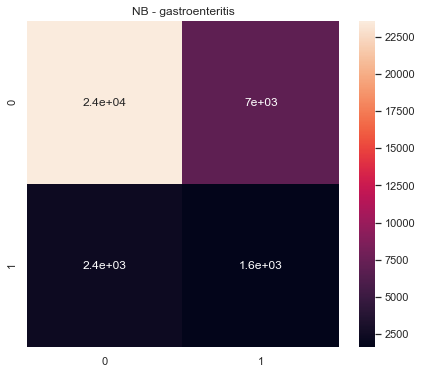

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastroenteritis  300.0  0.525864      0.548236         0.528857   
0   2.0  gastroenteritis  300.0  0.533093      0.558658         0.534909   
0   3.0  gastroenteritis  300.0  0.507735      0.540592         0.521109   
0   4.0  gastroenteritis  300.0  0.516172      0.536087         0.521360   
0   5.0  gastroenteritis  300.0  0.535111      0.551656         0.534123   

   ROC Macro  
0   0.605014  
0   0.582869  
0   0.575889  
0   0.557923  
0   0.603852  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastroenteritis  300.0  2.617975    2.735229       2.640358  2.925549
================================== DT ==================================


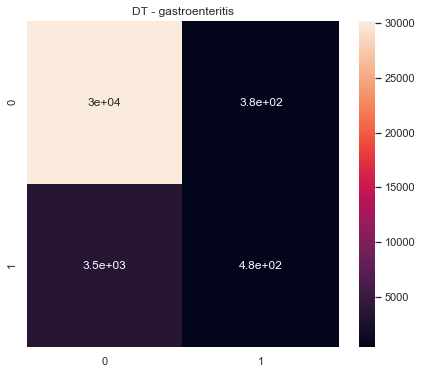

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastroenteritis  300.0  0.493159      0.505658         0.523704   
0   2.0  gastroenteritis  300.0  0.494260      0.502617         0.506701   
0   3.0  gastroenteritis  300.0  0.482973      0.496290         0.488850   
0   4.0  gastroenteritis  300.0  0.506773      0.512822         0.540454   
0   5.0  gastroenteritis  300.0  0.499578      0.511654         0.571594   

   ROC Macro  
0   0.558700  
0   0.571269  
0   0.572270  
0   0.544265  
0   0.569267  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastroenteritis  300.0  2.476743    2.529041       2.631303  2.815771
================================== RF ==================================


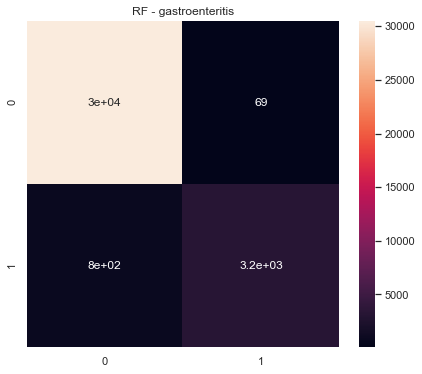

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastroenteritis  300.0  0.469237      0.499836         0.442169   
0   2.0  gastroenteritis  300.0  0.460788      0.483145         0.440409   
0   3.0  gastroenteritis  300.0  0.463967      0.489444         0.441012   
0   4.0  gastroenteritis  300.0  0.470182      0.499889         0.492101   
0   5.0  gastroenteritis  300.0  0.469314      0.500000         0.442177   

   ROC Macro  
0   0.590158  
0   0.574913  
0   0.574479  
0   0.532972  
0   0.620906  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastroenteritis  300.0  2.333488    2.472314       2.257867  2.893429
================================== SGD ==================================


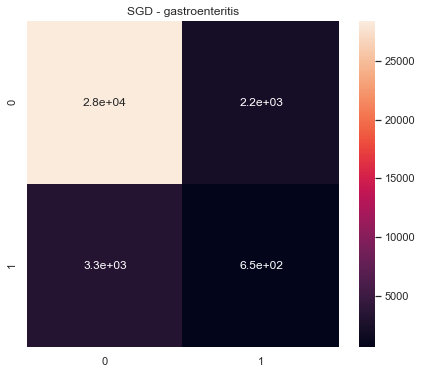

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastroenteritis  300.0  0.493409      0.495633         0.496823   
0   2.0  gastroenteritis  300.0  0.492739      0.495332         0.493485   
0   3.0  gastroenteritis  300.0  0.493973      0.493931         0.494577   
0   4.0  gastroenteritis  300.0  0.477095      0.475725         0.479565   
0   5.0  gastroenteritis  300.0  0.489692      0.489583         0.491336   

   ROC Macro  
0   0.475933  
0   0.428793  
0   0.425120  
0   0.411754  
0   0.490410  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  gastroenteritis  300.0  2.446908    2.450205       2.455786  2.23201
================================== LR ==================================


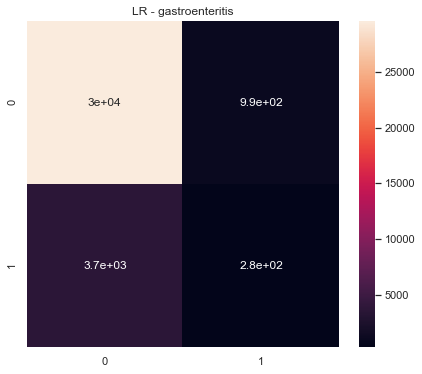

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  gastroenteritis  300.0  0.505091      0.521097         0.512450   
0   2.0  gastroenteritis  300.0  0.505229      0.507077         0.511484   
0   3.0  gastroenteritis  300.0  0.520168      0.535014         0.522354   
0   4.0  gastroenteritis  300.0  0.491301      0.491328         0.492749   
0   5.0  gastroenteritis  300.0  0.531984      0.535232         0.530302   

   ROC Macro  
0   0.524674  
0   0.524206  
0   0.498197  
0   0.513580  
0   0.552924  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  gastroenteritis  300.0  2.553773    2.589747       2.569339  2.613581
================================== gastrointestinal.bleed ==================================
================================== NB ==================================


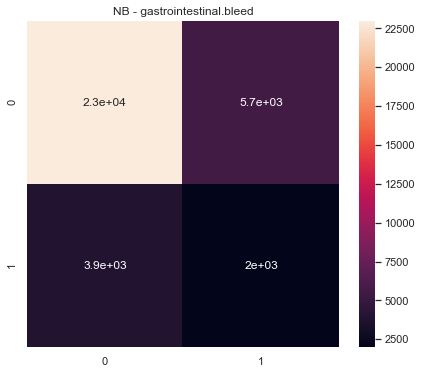

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  gastrointestinal.bleed  300.0  0.547840      0.548699   
0   2.0  gastrointestinal.bleed  300.0  0.546019      0.547502   
0   3.0  gastrointestinal.bleed  300.0  0.526790      0.530947   
0   4.0  gastrointestinal.bleed  300.0  0.526429      0.529485   
0   5.0  gastrointestinal.bleed  300.0  0.512007      0.511794   

   Precision Macro  ROC Macro  
0         0.547111   0.564787  
0         0.544912   0.577283  
0         0.526130   0.563059  
0         0.525649   0.519354  
0         0.512528   0.540962  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  gastrointestinal.bleed  300.0  2.659084    2.668428       2.656329   

    Avg ROC  
0  2.765445  
================================== DT ==================================


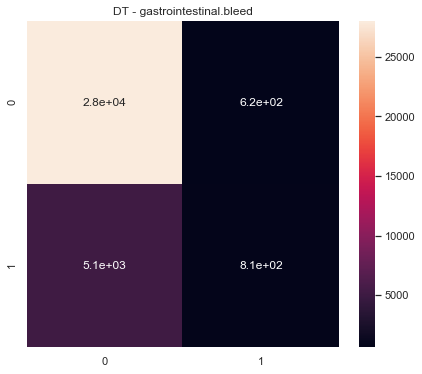

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  gastrointestinal.bleed  300.0  0.491074      0.507396   
0   2.0  gastrointestinal.bleed  300.0  0.483663      0.503940   
0   3.0  gastrointestinal.bleed  300.0  0.464401      0.478854   
0   4.0  gastrointestinal.bleed  300.0  0.483661      0.502306   
0   5.0  gastrointestinal.bleed  300.0  0.488083      0.506450   

   Precision Macro  ROC Macro  
0         0.523189   0.542880  
0         0.514070   0.512729  
0         0.460900   0.478702  
0         0.507232   0.501208  
0         0.522152   0.515212  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  gastrointestinal.bleed  300.0  2.410882    2.498947       2.527543  2.55073
================================== RF ==================================


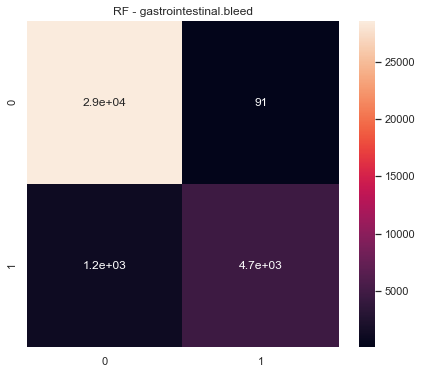

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  gastrointestinal.bleed  300.0  0.454461      0.500144   
0   2.0  gastrointestinal.bleed  300.0  0.453545      0.499635   
0   3.0  gastrointestinal.bleed  300.0  0.439412      0.469628   
0   4.0  gastrointestinal.bleed  300.0  0.451722      0.494816   
0   5.0  gastrointestinal.bleed  300.0  0.453714      0.499985   

   Precision Macro  ROC Macro  
0         0.514203   0.591272  
0         0.464130   0.564190  
0         0.415010   0.510239  
0         0.427522   0.506633  
0         0.497501   0.581897  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  gastrointestinal.bleed  300.0  2.252854    2.464209       2.318367  2.75423
================================== SGD ==================================


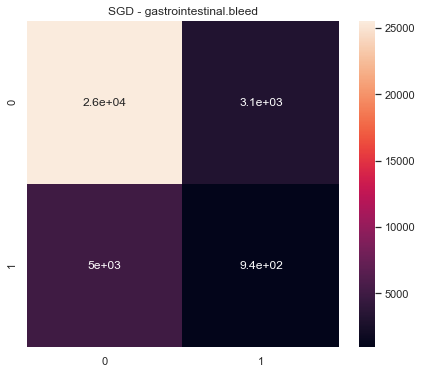

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  gastrointestinal.bleed  300.0  0.496237      0.497941   
0   2.0  gastrointestinal.bleed  300.0  0.494945      0.495453   
0   3.0  gastrointestinal.bleed  300.0  0.448422      0.453382   
0   4.0  gastrointestinal.bleed  300.0  0.460465      0.459456   
0   5.0  gastrointestinal.bleed  300.0  0.472283      0.471311   

   Precision Macro  ROC Macro  
0         0.497451   0.495345  
0         0.495023   0.490564  
0         0.444547   0.407089  
0         0.461668   0.432867  
0         0.473936   0.484123  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  gastrointestinal.bleed  300.0  2.372354    2.377544       2.372624   

    Avg ROC  
0  2.309987  
================================== LR ==================================


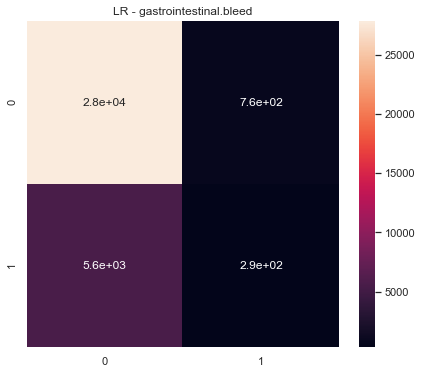

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  gastrointestinal.bleed  300.0  0.531489      0.529893   
0   2.0  gastrointestinal.bleed  300.0  0.491939      0.510180   
0   3.0  gastrointestinal.bleed  300.0  0.481760      0.481713   
0   4.0  gastrointestinal.bleed  300.0  0.504037      0.505434   
0   5.0  gastrointestinal.bleed  300.0  0.500666      0.502016   

   Precision Macro  ROC Macro  
0         0.539082   0.547009  
0         0.538822   0.532558  
0         0.481810   0.478094  
0         0.507020   0.504419  
0         0.502509   0.506188  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  gastrointestinal.bleed  300.0  2.509891    2.529236       2.569243   

    Avg ROC  
0  2.568268  
================================== haematochezia ==================================
================================== NB ==================================


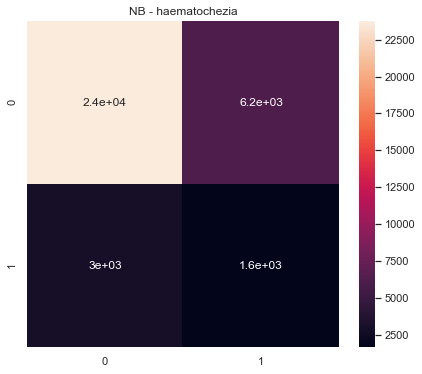

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haematochezia  300.0  0.537355      0.539827         0.535815   
0   2.0  haematochezia  300.0  0.526247      0.536497         0.526294   
0   3.0  haematochezia  300.0  0.510035      0.531290         0.518757   
0   4.0  haematochezia  300.0  0.538668      0.546556         0.536456   
0   5.0  haematochezia  300.0  0.518931      0.524044         0.518799   

   ROC Macro  
0   0.581145  
0   0.562873  
0   0.560698  
0   0.598358  
0   0.562262  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haematochezia  300.0  2.631236    2.678214       2.636121  2.865335
================================== DT ==================================


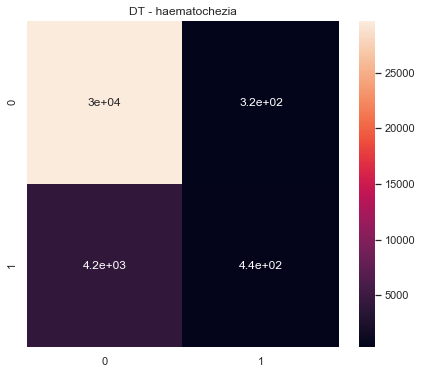

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haematochezia  300.0  0.485698      0.506225         0.544708   
0   2.0  haematochezia  300.0  0.466231      0.490652         0.458985   
0   3.0  haematochezia  300.0  0.486886      0.501177         0.503811   
0   4.0  haematochezia  300.0  0.497487      0.508485         0.528000   
0   5.0  haematochezia  300.0  0.487985      0.507661         0.555941   

   ROC Macro  
0   0.499134  
0   0.509053  
0   0.530844  
0   0.549861  
0   0.530258  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  haematochezia  300.0  2.424288      2.5142       2.591445  2.61915
================================== RF ==================================


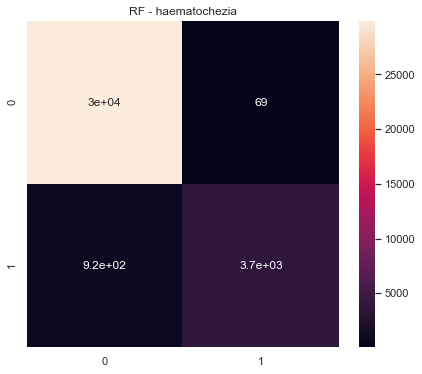

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haematochezia  300.0  0.466664      0.499792         0.493333   
0   2.0  haematochezia  300.0  0.462783      0.488981         0.449000   
0   3.0  haematochezia  300.0  0.459746      0.489523         0.435883   
0   4.0  haematochezia  300.0  0.464522      0.498790         0.455944   
0   5.0  haematochezia  300.0  0.464294      0.499917         0.433411   

   ROC Macro  
0   0.558765  
0   0.572887  
0   0.533879  
0   0.498637  
0   0.603533  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haematochezia  300.0  2.318008    2.477002       2.267571  2.767701
================================== SGD ==================================


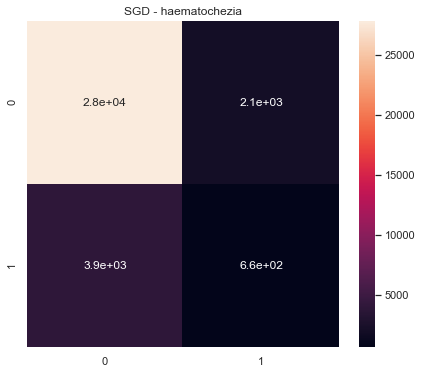

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haematochezia  300.0  0.481043      0.481236         0.480865   
0   2.0  haematochezia  300.0  0.490583      0.493172         0.490955   
0   3.0  haematochezia  300.0  0.475896      0.478600         0.474270   
0   4.0  haematochezia  300.0  0.470026      0.480013         0.465728   
0   5.0  haematochezia  300.0  0.477864      0.480353         0.476454   

   ROC Macro  
0   0.464249  
0   0.478635  
0   0.409728  
0   0.454243  
0   0.480050  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haematochezia  300.0  2.395412    2.413374       2.388273  2.286906
================================== LR ==================================


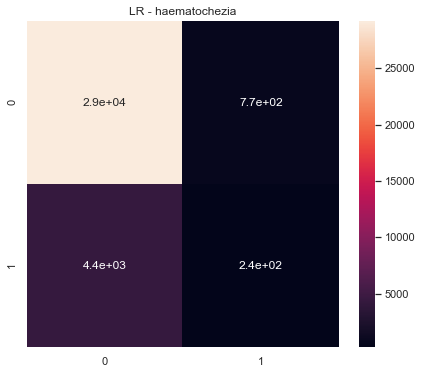

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haematochezia  300.0  0.526478      0.527256         0.525892   
0   2.0  haematochezia  300.0  0.475561      0.493410         0.478899   
0   3.0  haematochezia  300.0  0.502409      0.507014         0.505158   
0   4.0  haematochezia  300.0  0.498575      0.498610         0.498677   
0   5.0  haematochezia  300.0  0.528588      0.526566         0.537927   

   ROC Macro  
0   0.527318  
0   0.507179  
0   0.477461  
0   0.498693  
0   0.528651  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haematochezia  300.0  2.531611    2.552857       2.546552  2.539304
================================== haemorrhage.rectum ==================================
================================== NB ==================================


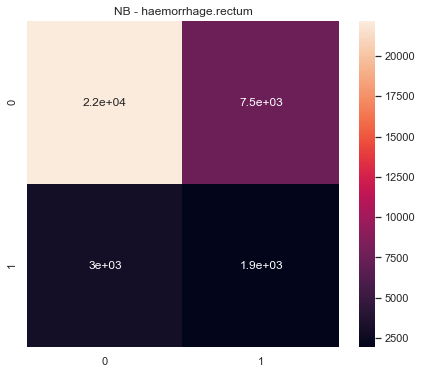

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhage.rectum  300.0  0.528888      0.538590         0.528588   
0   2.0  haemorrhage.rectum  300.0  0.529030      0.540759         0.529270   
0   3.0  haemorrhage.rectum  300.0  0.490453      0.520107         0.511177   
0   4.0  haemorrhage.rectum  300.0  0.521410      0.536165         0.524389   
0   5.0  haemorrhage.rectum  300.0  0.518326      0.526088         0.519327   

   ROC Macro  
0   0.584948  
0   0.579851  
0   0.554342  
0   0.558241  
0   0.560911  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhage.rectum  300.0  2.588108    2.661708       2.612751  2.838292
================================== DT ==================================


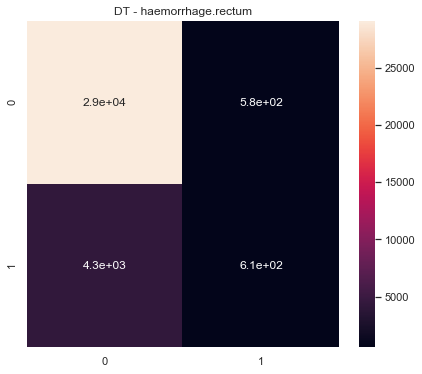

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhage.rectum  300.0  0.473297      0.497135         0.485873   
0   2.0  haemorrhage.rectum  300.0  0.479556      0.499601         0.498344   
0   3.0  haemorrhage.rectum  300.0  0.454081      0.469286         0.443318   
0   4.0  haemorrhage.rectum  300.0  0.462839      0.475406         0.456173   
0   5.0  haemorrhage.rectum  300.0  0.483407      0.500489         0.501720   

   ROC Macro  
0   0.517987  
0   0.524487  
0   0.455319  
0   0.469476  
0   0.533574  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhage.rectum  300.0  2.353179    2.441916       2.385429  2.500844
================================== RF ==================================


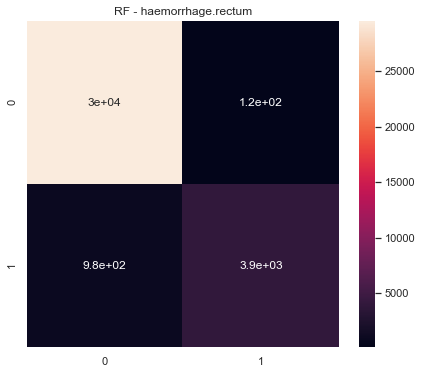

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhage.rectum  300.0  0.461377      0.499073         0.428975   
0   2.0  haemorrhage.rectum  300.0  0.460872      0.498145         0.428789   
0   3.0  haemorrhage.rectum  300.0  0.440123      0.458087         0.423515   
0   4.0  haemorrhage.rectum  300.0  0.458337      0.493085         0.428163   
0   5.0  haemorrhage.rectum  300.0  0.461832      0.500000         0.429078   

   ROC Macro  
0   0.564349  
0   0.570215  
0   0.490218  
0   0.444485  
0   0.528449  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhage.rectum  300.0  2.282541    2.448389       2.138521  2.597716
================================== SGD ==================================


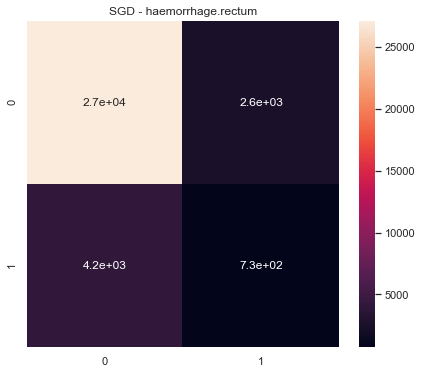

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhage.rectum  300.0  0.475408      0.476757         0.474421   
0   2.0  haemorrhage.rectum  300.0  0.492669      0.500658         0.501336   
0   3.0  haemorrhage.rectum  300.0  0.460902      0.464696         0.457945   
0   4.0  haemorrhage.rectum  300.0  0.445429      0.444864         0.446006   
0   5.0  haemorrhage.rectum  300.0  0.470872      0.471433         0.470364   

   ROC Macro  
0   0.446211  
0   0.466504  
0   0.377906  
0   0.380814  
0   0.462633  



                  ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhage.rectum  300.0  2.34528    2.358408       2.350072  2.134067
================================== LR ==================================


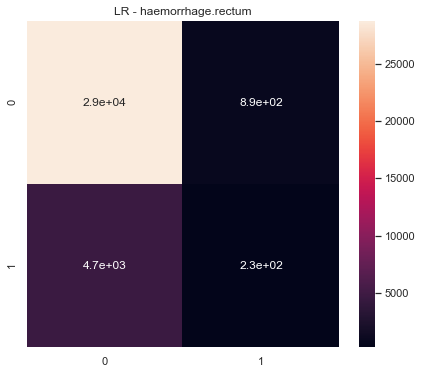

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhage.rectum  300.0  0.520080      0.519389         0.521443   
0   2.0  haemorrhage.rectum  300.0  0.495968      0.513388         0.593278   
0   3.0  haemorrhage.rectum  300.0  0.502445      0.516893         0.510764   
0   4.0  haemorrhage.rectum  300.0  0.467696      0.465637         0.472513   
0   5.0  haemorrhage.rectum  300.0  0.496404      0.496791         0.496476   

   ROC Macro  
0   0.539294  
0   0.517442  
0   0.498854  
0   0.439103  
0   0.505442  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhage.rectum  300.0  2.482592    2.512098       2.594474  2.500135
================================== haemorrhoids ==================================
================================== NB ==================================


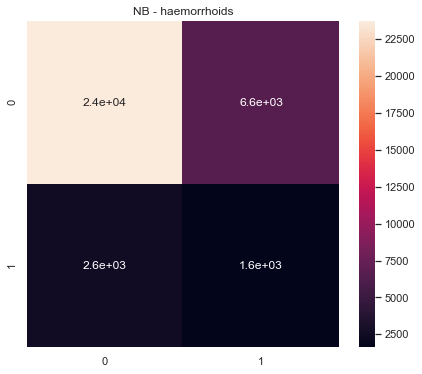

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhoids  300.0  0.539558      0.550179         0.537125   
0   2.0  haemorrhoids  300.0  0.526210      0.538348         0.526408   
0   3.0  haemorrhoids  300.0  0.516497      0.542913         0.524497   
0   4.0  haemorrhoids  300.0  0.528031      0.541482         0.528199   
0   5.0  haemorrhoids  300.0  0.523396      0.532964         0.523468   

   ROC Macro  
0   0.614965  
0   0.562174  
0   0.582753  
0   0.589977  
0   0.561320  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhoids  300.0  2.633691    2.705887       2.639698  2.911188
================================== DT ==================================


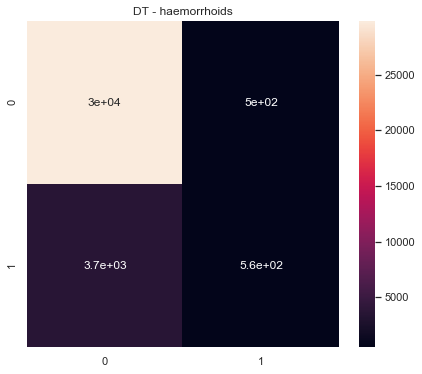

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhoids  300.0  0.487033      0.504553         0.526189   
0   2.0  haemorrhoids  300.0  0.485036      0.496737         0.491533   
0   3.0  haemorrhoids  300.0  0.482394      0.489073         0.481834   
0   4.0  haemorrhoids  300.0  0.511744      0.513558         0.525563   
0   5.0  haemorrhoids  300.0  0.489770      0.505906         0.532065   

   ROC Macro  
0   0.517890  
0   0.535428  
0   0.529185  
0   0.531700  
0   0.551513  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhoids  300.0  2.455978    2.509827       2.557184  2.665717
================================== RF ==================================


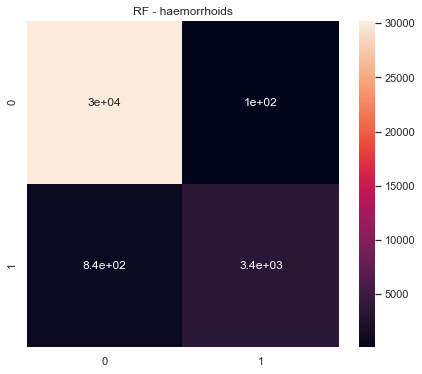

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhoids  300.0  0.469257      0.500353         0.521939   
0   2.0  haemorrhoids  300.0  0.467514      0.491654         0.457648   
0   3.0  haemorrhoids  300.0  0.463954      0.479264         0.454343   
0   4.0  haemorrhoids  300.0  0.467423      0.498608         0.458344   
0   5.0  haemorrhoids  300.0  0.467268      0.500000         0.438558   

   ROC Macro  
0   0.570870  
0   0.560278  
0   0.562071  
0   0.546479  
0   0.617835  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhoids  300.0  2.335417     2.46988       2.330833  2.857532
================================== SGD ==================================


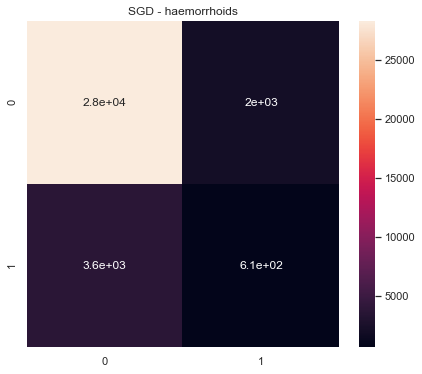

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhoids  300.0  0.504134      0.504295         0.505002   
0   2.0  haemorrhoids  300.0  0.468717      0.476822         0.463914   
0   3.0  haemorrhoids  300.0  0.485278      0.485723         0.484939   
0   4.0  haemorrhoids  300.0  0.458102      0.463551         0.453538   
0   5.0  haemorrhoids  300.0  0.471487      0.481094         0.467011   

   ROC Macro  
0   0.485209  
0   0.463968  
0   0.398487  
0   0.467427  
0   0.444480  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  haemorrhoids  300.0  2.387719    2.411484       2.374403  2.25957
================================== LR ==================================


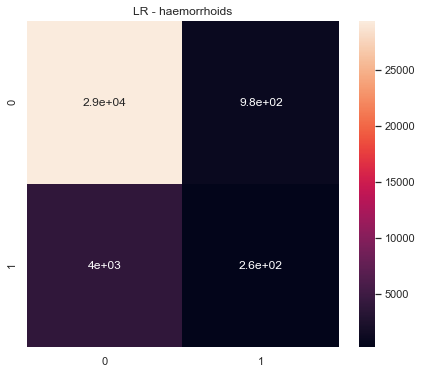

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  haemorrhoids  300.0  0.531058      0.543520         0.530350   
0   2.0  haemorrhoids  300.0  0.520362      0.519534         0.530685   
0   3.0  haemorrhoids  300.0  0.528011      0.547030         0.529809   
0   4.0  haemorrhoids  300.0  0.491264      0.492334         0.494104   
0   5.0  haemorrhoids  300.0  0.509506      0.509393         0.509659   

   ROC Macro  
0   0.558865  
0   0.517781  
0   0.538112  
0   0.498188  
0   0.548389  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  haemorrhoids  300.0  2.580201     2.61181       2.594606  2.661335
================================== head.injury ==================================
================================== NB ==================================


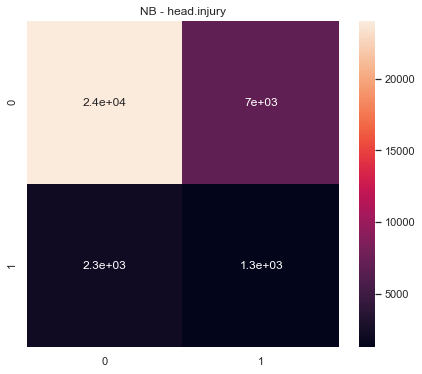

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  head.injury  300.0  0.518642      0.544767         0.524429   
0   2.0  head.injury  300.0  0.513964      0.543205         0.522574   
0   3.0  head.injury  300.0  0.501425      0.535935         0.517328   
0   4.0  head.injury  300.0  0.520074      0.544161         0.524691   
0   5.0  head.injury  300.0  0.516779      0.540078         0.522276   

   ROC Macro  
0   0.575809  
0   0.577801  
0   0.579694  
0   0.574148  
0   0.564398  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  head.injury  300.0  2.570884    2.708146       2.611298  2.871851
================================== DT ==================================


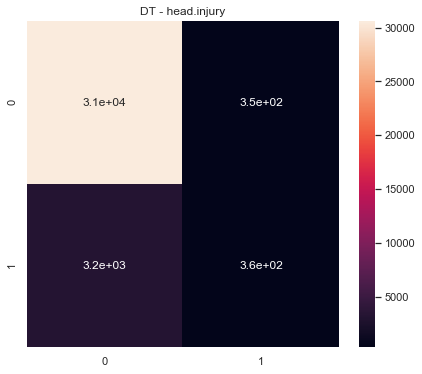

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  head.injury  300.0  0.496513      0.506155         0.523564   
0   2.0  head.injury  300.0  0.475634      0.490178         0.471109   
0   3.0  head.injury  300.0  0.493738      0.500298         0.500664   
0   4.0  head.injury  300.0  0.503137      0.509084         0.527182   
0   5.0  head.injury  300.0  0.494166      0.505884         0.528093   

   ROC Macro  
0   0.484100  
0   0.544902  
0   0.529961  
0   0.535714  
0   0.529186  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  head.injury  300.0  2.463188    2.511598       2.550611  2.623862
================================== RF ==================================


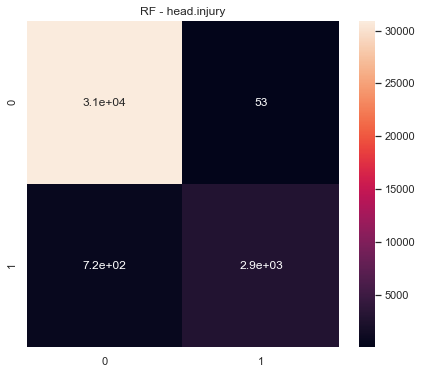

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  head.injury  300.0  0.473731      0.500370         0.547864   
0   2.0  head.injury  300.0  0.466656      0.488447         0.446727   
0   3.0  head.injury  300.0  0.483470      0.499563         0.497788   
0   4.0  head.injury  300.0  0.472358      0.499758         0.447807   
0   5.0  head.injury  300.0  0.473811      0.500532         0.614538   

   ROC Macro  
0   0.561969  
0   0.558931  
0   0.529716  
0   0.527396  
0   0.613897  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  head.injury  300.0  2.370026     2.48867       2.554723  2.79191
================================== SGD ==================================


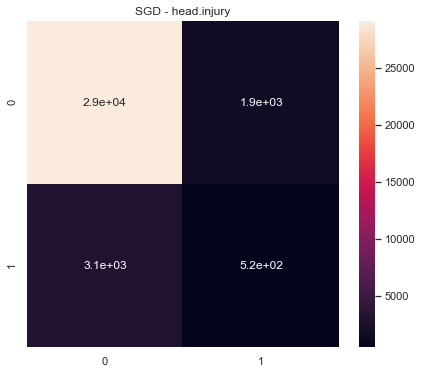

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  head.injury  300.0  0.507784      0.507665         0.507959   
0   2.0  head.injury  300.0  0.466687      0.479810         0.456893   
0   3.0  head.injury  300.0  0.485234      0.487049         0.484308   
0   4.0  head.injury  300.0  0.502042      0.504055         0.506508   
0   5.0  head.injury  300.0  0.492001      0.492661         0.494374   

   ROC Macro  
0   0.474205  
0   0.451790  
0   0.416560  
0   0.507615  
0   0.500932  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  head.injury  300.0  2.453748    2.471241       2.450043  2.351101
================================== LR ==================================


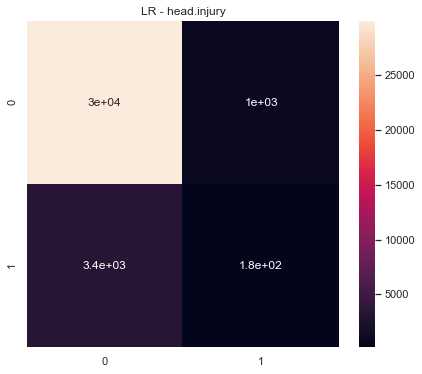

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  head.injury  300.0  0.484541      0.489079         0.493373   
0   2.0  head.injury  300.0  0.480858      0.481374         0.480406   
0   3.0  head.injury  300.0  0.475275      0.499208         0.499631   
0   4.0  head.injury  300.0  0.497460      0.497567         0.497816   
0   5.0  head.injury  300.0  0.515611      0.517984         0.514993   

   ROC Macro  
0   0.470741  
0   0.464776  
0   0.527918  
0   0.526313  
0   0.614376  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  head.injury  300.0  2.453745    2.485212       2.486219  2.604124
================================== heart.attack ==================================
================================== NB ==================================


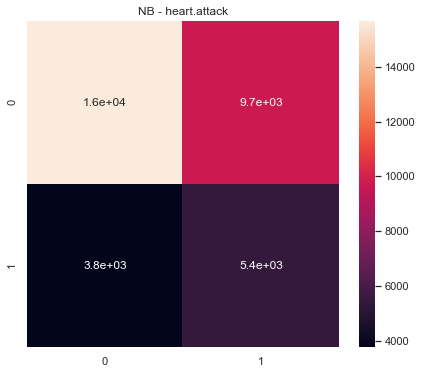

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.attack  300.0  0.562097      0.578695         0.564962   
0   2.0  heart.attack  300.0  0.537979      0.553391         0.543688   
0   3.0  heart.attack  300.0  0.552619      0.589234         0.569966   
0   4.0  heart.attack  300.0  0.555180      0.571685         0.558962   
0   5.0  heart.attack  300.0  0.532462      0.539962         0.534298   

   ROC Macro  
0   0.606079  
0   0.580501  
0   0.609576  
0   0.608871  
0   0.571796  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.attack  300.0  2.740338    2.832967       2.771875  2.976823
================================== DT ==================================


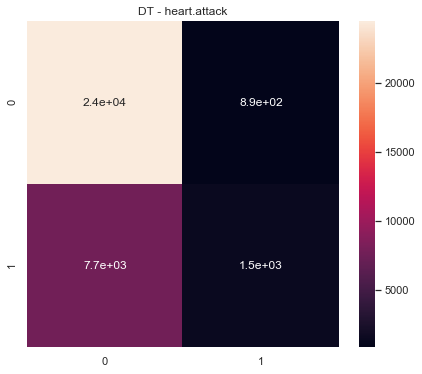

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.attack  300.0  0.471007      0.508571         0.532291   
0   2.0  heart.attack  300.0  0.478264      0.508840         0.526254   
0   3.0  heart.attack  300.0  0.471108      0.498122         0.495535   
0   4.0  heart.attack  300.0  0.467618      0.504134         0.514019   
0   5.0  heart.attack  300.0  0.463114      0.506996         0.532793   

   ROC Macro  
0   0.544741  
0   0.574554  
0   0.498596  
0   0.585333  
0   0.510097  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  heart.attack  300.0  2.351111    2.526662       2.600893  2.71332
================================== RF ==================================


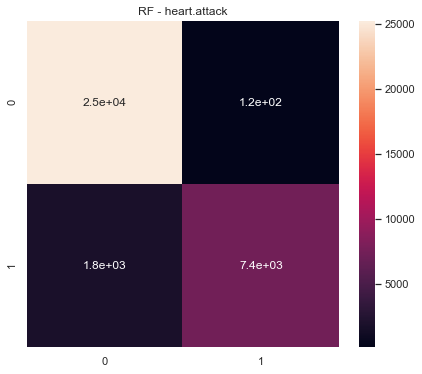

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.attack  300.0  0.430087      0.500726         0.520136   
0   2.0  heart.attack  300.0  0.436111      0.504234         0.612863   
0   3.0  heart.attack  300.0  0.456673      0.491140         0.475856   
0   4.0  heart.attack  300.0  0.430559      0.497846         0.469598   
0   5.0  heart.attack  300.0  0.433249      0.502775         0.580224   

   ROC Macro  
0   0.580371  
0   0.590732  
0   0.547093  
0   0.576560  
0   0.608322  



            ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.attack  300.0  2.18668     2.49672       2.658678  2.903078
================================== SGD ==================================


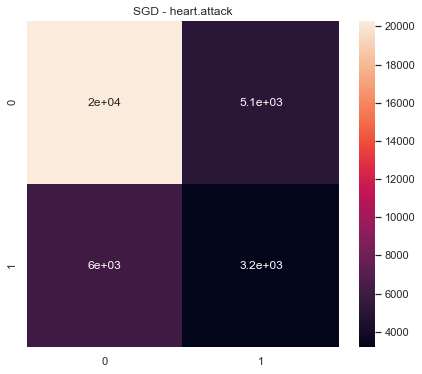

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.attack  300.0  0.507178      0.511380         0.515229   
0   2.0  heart.attack  300.0  0.498997      0.510775         0.518420   
0   3.0  heart.attack  300.0  0.538475      0.539837         0.537865   
0   4.0  heart.attack  300.0  0.535818      0.535237         0.541195   
0   5.0  heart.attack  300.0  0.522914      0.522617         0.523692   

   ROC Macro  
0   0.540888  
0   0.526013  
0   0.572459  
0   0.573101  
0   0.538633  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.attack  300.0  2.603382    2.619846       2.636401  2.751094
================================== LR ==================================


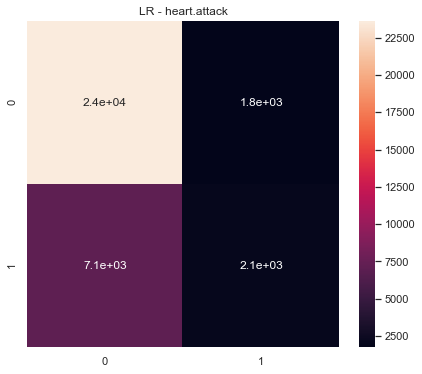

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.attack  300.0  0.517616      0.523275         0.535304   
0   2.0  heart.attack  300.0  0.551779      0.551256         0.571860   
0   3.0  heart.attack  300.0  0.568998      0.568473         0.569598   
0   4.0  heart.attack  300.0  0.476082      0.506939         0.520304   
0   5.0  heart.attack  300.0  0.505070      0.516879         0.530192   

   ROC Macro  
0   0.559918  
0   0.576726  
0   0.580337  
0   0.606033  
0   0.549923  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.attack  300.0  2.619546    2.666822       2.727258  2.872938
================================== heart.rate.increased ==================================
================================== NB ==================================


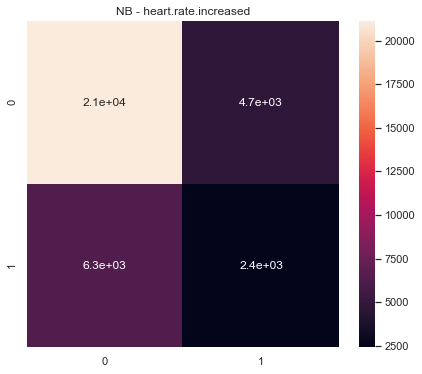

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.rate.increased  300.0  0.529029      0.529607         0.537996   
0   2.0  heart.rate.increased  300.0  0.510961      0.510894         0.511089   
0   3.0  heart.rate.increased  300.0  0.524661      0.524356         0.527347   
0   4.0  heart.rate.increased  300.0  0.517163      0.519646         0.526228   
0   5.0  heart.rate.increased  300.0  0.501149      0.509115         0.514140   

   ROC Macro  
0   0.548363  
0   0.531992  
0   0.538355  
0   0.537328  
0   0.529346  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.rate.increased  300.0  2.582962    2.593618       2.616801  2.685384
================================== DT ==================================


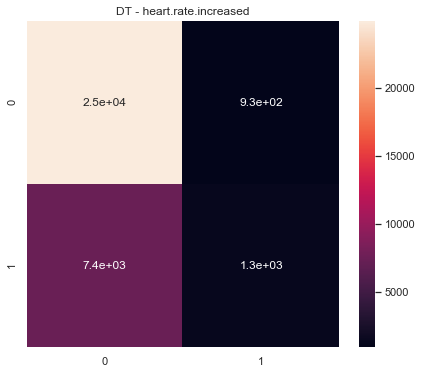

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.rate.increased  300.0  0.471039      0.492986         0.485385   
0   2.0  heart.rate.increased  300.0  0.461997      0.481750         0.466779   
0   3.0  heart.rate.increased  300.0  0.454192      0.483509         0.461451   
0   4.0  heart.rate.increased  300.0  0.475152      0.505189         0.515660   
0   5.0  heart.rate.increased  300.0  0.461107      0.506529         0.537865   

   ROC Macro  
0   0.506129  
0   0.461338  
0   0.471258  
0   0.505465  
0   0.511613  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.rate.increased  300.0  2.323486    2.469963        2.46714  2.455803
================================== RF ==================================


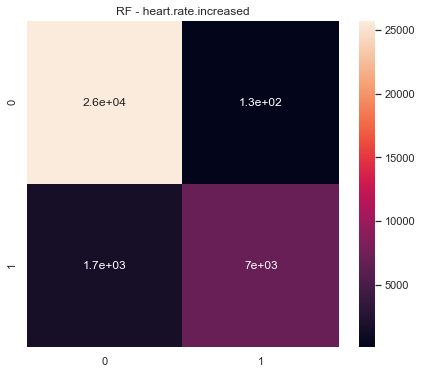

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.rate.increased  300.0  0.432032      0.495767         0.445520   
0   2.0  heart.rate.increased  300.0  0.434932      0.492419         0.445018   
0   3.0  heart.rate.increased  300.0  0.423826      0.473240         0.403411   
0   4.0  heart.rate.increased  300.0  0.437253      0.501552         0.532470   
0   5.0  heart.rate.increased  300.0  0.432821      0.501310         0.566055   

   ROC Macro  
0   0.539902  
0   0.511342  
0   0.518106  
0   0.499078  
0   0.569880  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.rate.increased  300.0  2.160864    2.464288       2.392474  2.638308
================================== SGD ==================================


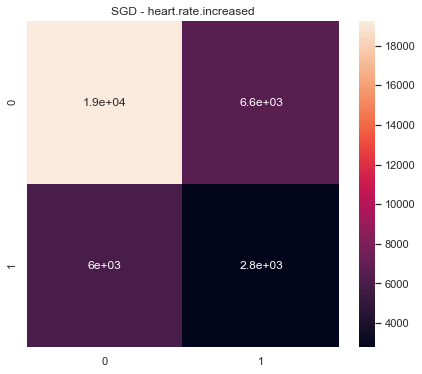

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.rate.increased  300.0  0.510163      0.518454         0.515206   
0   2.0  heart.rate.increased  300.0  0.498262      0.498547         0.498468   
0   3.0  heart.rate.increased  300.0  0.497063      0.497087         0.497057   
0   4.0  heart.rate.increased  300.0  0.493207      0.497490         0.497885   
0   5.0  heart.rate.increased  300.0  0.514363      0.514243         0.514609   

   ROC Macro  
0   0.518725  
0   0.484880  
0   0.490238  
0   0.500945  
0   0.523568  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.rate.increased  300.0  2.513057    2.525821       2.523225  2.518356
================================== LR ==================================


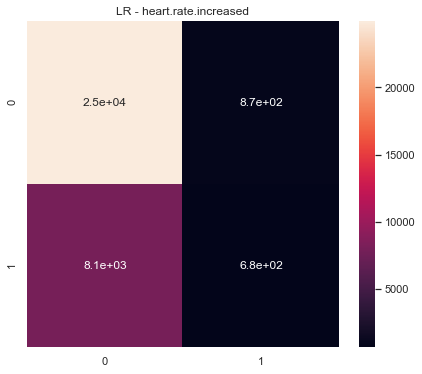

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  heart.rate.increased  300.0  0.496348      0.510822         0.521038   
0   2.0  heart.rate.increased  300.0  0.481907      0.509807         0.529351   
0   3.0  heart.rate.increased  300.0  0.463992      0.477223         0.465397   
0   4.0  heart.rate.increased  300.0  0.502811      0.510098         0.515398   
0   5.0  heart.rate.increased  300.0  0.496056      0.511818         0.524163   

   ROC Macro  
0   0.509061  
0   0.518886  
0   0.478677  
0   0.498197  
0   0.559410  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  heart.rate.increased  300.0  2.441114    2.519768       2.555346  2.564233
================================== hemiparesis ==================================
================================== NB ==================================


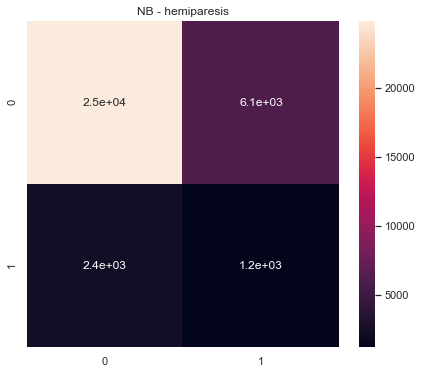

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hemiparesis  300.0  0.506831      0.523471         0.513400   
0   2.0  hemiparesis  300.0  0.542338      0.568566         0.540854   
0   3.0  hemiparesis  300.0  0.494711      0.516133         0.508295   
0   4.0  hemiparesis  300.0  0.507148      0.513416         0.509203   
0   5.0  hemiparesis  300.0  0.516870      0.529145         0.518615   

   ROC Macro  
0   0.552317  
0   0.619907  
0   0.558093  
0   0.544021  
0   0.564009  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hemiparesis  300.0  2.567898    2.650731       2.590367  2.838347
================================== DT ==================================


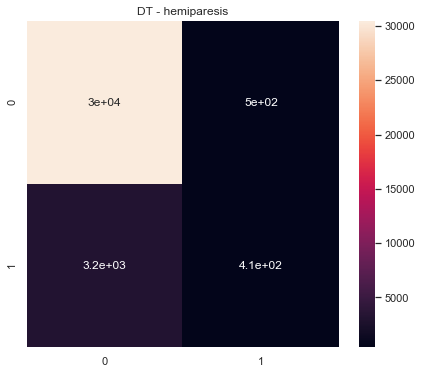

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hemiparesis  300.0  0.482188      0.492461         0.482182   
0   2.0  hemiparesis  300.0  0.516017      0.517924         0.554582   
0   3.0  hemiparesis  300.0  0.457961      0.455090         0.461212   
0   4.0  hemiparesis  300.0  0.489140      0.502769         0.513239   
0   5.0  hemiparesis  300.0  0.503696      0.511236         0.546998   

   ROC Macro  
0   0.535534  
0   0.523601  
0   0.451136  
0   0.532333  
0   0.521529  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hemiparesis  300.0  2.449001    2.479479       2.558213  2.564134
================================== RF ==================================


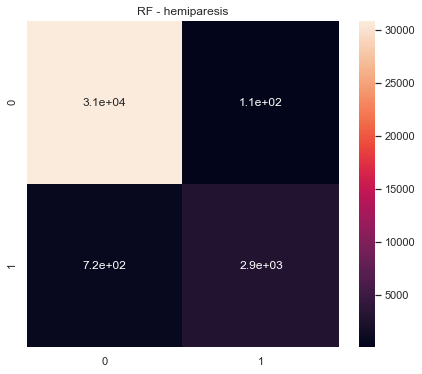

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hemiparesis  300.0  0.474654      0.495389         0.471201   
0   2.0  hemiparesis  300.0  0.472479      0.500000         0.447829   
0   3.0  hemiparesis  300.0  0.454746      0.465584         0.444402   
0   4.0  hemiparesis  300.0  0.470822      0.496768         0.447453   
0   5.0  hemiparesis  300.0  0.473685      0.500289         0.531182   

   ROC Macro  
0   0.561652  
0   0.574540  
0   0.510002  
0   0.500866  
0   0.581381  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hemiparesis  300.0  2.346387     2.45803       2.342067  2.728441
================================== SGD ==================================


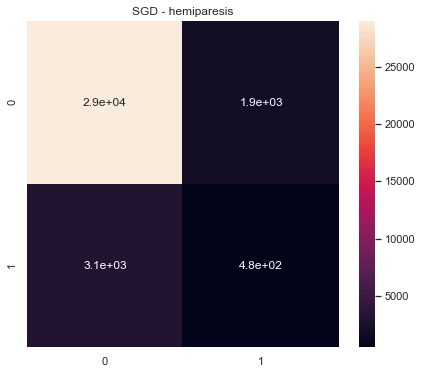

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hemiparesis  300.0  0.491280      0.491634         0.491059   
0   2.0  hemiparesis  300.0  0.489499      0.493747         0.490030   
0   3.0  hemiparesis  300.0  0.472584      0.473698         0.471586   
0   4.0  hemiparesis  300.0  0.479968      0.486412         0.477579   
0   5.0  hemiparesis  300.0  0.512111      0.515425         0.512061   

   ROC Macro  
0   0.443391  
0   0.481954  
0   0.396013  
0   0.458415  
0   0.494553  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hemiparesis  300.0  2.445441    2.460917       2.442315  2.274326
================================== LR ==================================


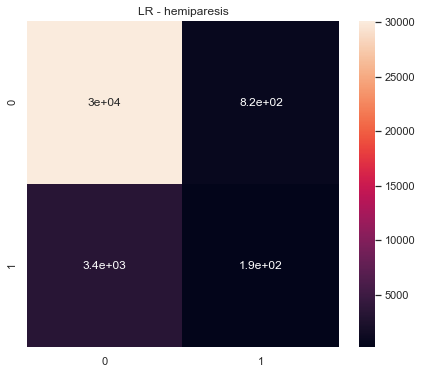

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hemiparesis  300.0  0.512485      0.524992         0.515550   
0   2.0  hemiparesis  300.0  0.517619      0.518207         0.544839   
0   3.0  hemiparesis  300.0  0.516756      0.537987         0.521553   
0   4.0  hemiparesis  300.0  0.512754      0.515368         0.512459   
0   5.0  hemiparesis  300.0  0.531452      0.530758         0.532271   

   ROC Macro  
0   0.552585  
0   0.553111  
0   0.540999  
0   0.516457  
0   0.566075  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hemiparesis  300.0  2.591066    2.627311       2.626672  2.729226
================================== hepatitis ==================================
================================== NB ==================================


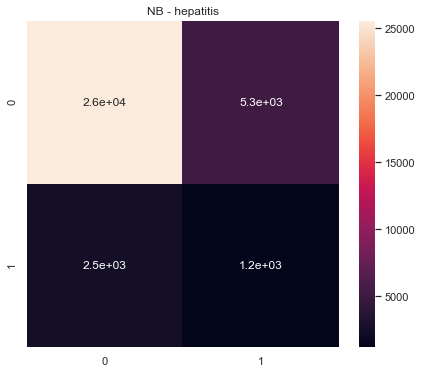

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hepatitis  300.0  0.524752      0.523754         0.526258   0.583384
0   2.0  hepatitis  300.0  0.547760      0.558297         0.543807   0.598583
0   3.0  hepatitis  300.0  0.518921      0.533714         0.521096   0.561241
0   4.0  hepatitis  300.0  0.509823      0.515043         0.510886   0.549398
0   5.0  hepatitis  300.0  0.523398      0.528449         0.522224   0.571549



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hepatitis  300.0  2.624654    2.659257       2.624272  2.864154
================================== DT ==================================


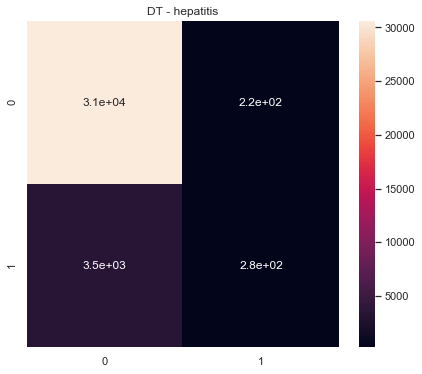

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hepatitis  300.0  0.478308      0.500622         0.507340   0.495713
0   2.0  hepatitis  300.0  0.487938      0.500730         0.502705   0.552077
0   3.0  hepatitis  300.0  0.481543      0.498777         0.493831   0.532061
0   4.0  hepatitis  300.0  0.487262      0.502908         0.516337   0.517869
0   5.0  hepatitis  300.0  0.484073      0.503233         0.530690   0.501459



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hepatitis  300.0  2.419124    2.506271       2.550902  2.599179
================================== RF ==================================


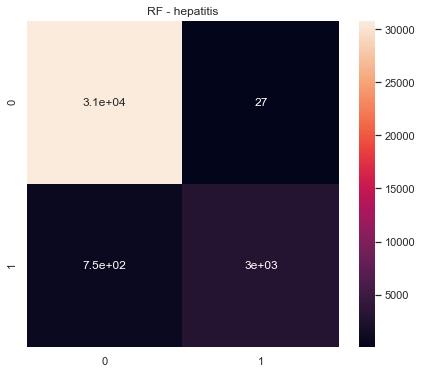

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hepatitis  300.0  0.471389      0.500000         0.445876   0.573403
0   2.0  hepatitis  300.0  0.471389      0.500000         0.445876   0.547690
0   3.0  hepatitis  300.0  0.465997      0.489369         0.444756   0.549274
0   4.0  hepatitis  300.0  0.471187      0.499675         0.445772   0.531047
0   5.0  hepatitis  300.0  0.471304      0.499838         0.445852   0.557484



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hepatitis  300.0  2.351266    2.488882       2.228131  2.758898
================================== SGD ==================================


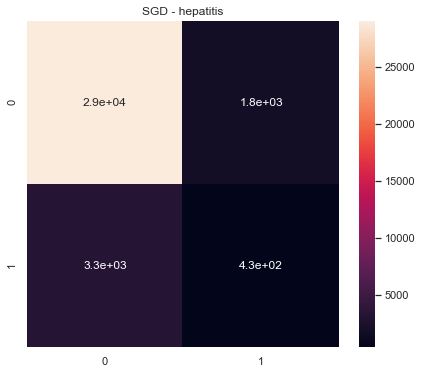

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hepatitis  300.0  0.473098      0.472608         0.473624   0.497420
0   2.0  hepatitis  300.0  0.499831      0.502221         0.503500   0.500909
0   3.0  hepatitis  300.0  0.484246      0.494903         0.487108   0.465624
0   4.0  hepatitis  300.0  0.484561      0.489460         0.483673   0.446425
0   5.0  hepatitis  300.0  0.501686      0.502446         0.503166   0.498879



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hepatitis  300.0  2.443423    2.461638       2.451071  2.409259
================================== LR ==================================


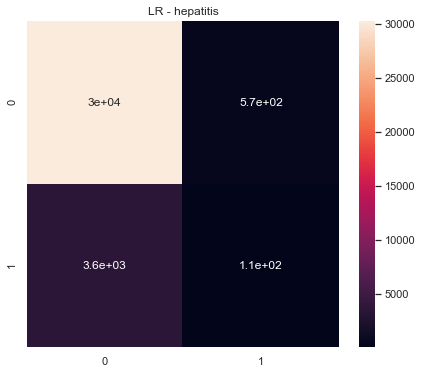

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hepatitis  300.0  0.501242      0.502314         0.503127   0.520318
0   2.0  hepatitis  300.0  0.504275      0.511468         0.543166   0.542789
0   3.0  hepatitis  300.0  0.506763      0.511200         0.508153   0.525444
0   4.0  hepatitis  300.0  0.516740      0.515840         0.519633   0.529495
0   5.0  hepatitis  300.0  0.513155      0.513402         0.512963   0.557797



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hepatitis  300.0  2.542176    2.554224       2.587042  2.675843
================================== hernia.hiatal ==================================
================================== NB ==================================


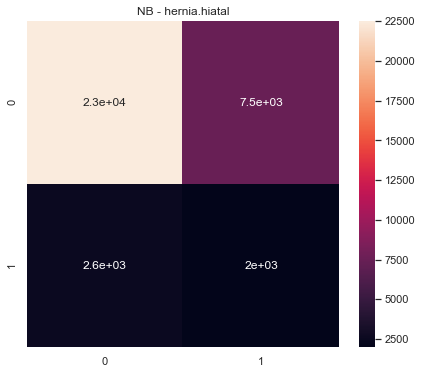

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hernia.hiatal  300.0  0.554450      0.571603         0.550790   
0   2.0  hernia.hiatal  300.0  0.533903      0.555286         0.535422   
0   3.0  hernia.hiatal  300.0  0.509856      0.556505         0.529404   
0   4.0  hernia.hiatal  300.0  0.537914      0.567442         0.540863   
0   5.0  hernia.hiatal  300.0  0.546026      0.563541         0.543889   

   ROC Macro  
0   0.619598  
0   0.583370  
0   0.592077  
0   0.593306  
0   0.586875  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hernia.hiatal  300.0  2.682149    2.814376       2.700367  2.975225
================================== DT ==================================


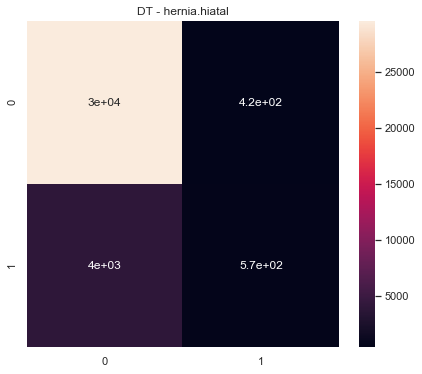

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hernia.hiatal  300.0  0.496044      0.510663         0.556315   
0   2.0  hernia.hiatal  300.0  0.485061      0.503335         0.516362   
0   3.0  hernia.hiatal  300.0  0.483147      0.492960         0.485609   
0   4.0  hernia.hiatal  300.0  0.502542      0.512926         0.550439   
0   5.0  hernia.hiatal  300.0  0.482024      0.505272         0.552038   

   ROC Macro  
0   0.599458  
0   0.554479  
0   0.549230  
0   0.556756  
0   0.524874  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hernia.hiatal  300.0  2.448819    2.525156       2.660764  2.784797
================================== RF ==================================


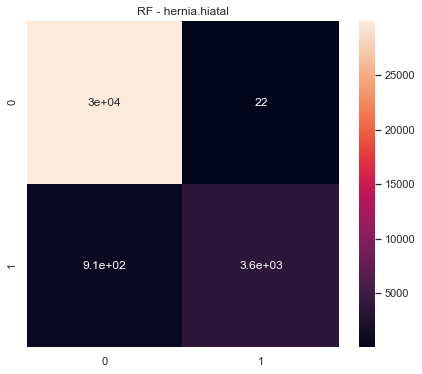

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hernia.hiatal  300.0  0.464673      0.499833         0.434134   
0   2.0  hernia.hiatal  300.0  0.464756      0.500000         0.434153   
0   3.0  hernia.hiatal  300.0  0.461387      0.491799         0.437918   
0   4.0  hernia.hiatal  300.0  0.464549      0.499667         0.434043   
0   5.0  hernia.hiatal  300.0  0.464751      0.500000         0.434144   

   ROC Macro  
0   0.612043  
0   0.610027  
0   0.583574  
0   0.580737  
0   0.613826  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hernia.hiatal  300.0  2.320115    2.491299       2.174393  3.000207
================================== SGD ==================================


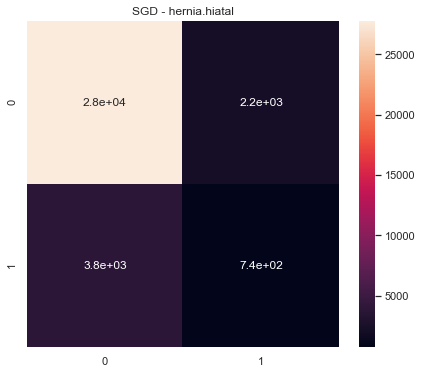

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hernia.hiatal  300.0  0.459080      0.461876         0.456660   
0   2.0  hernia.hiatal  300.0  0.477717      0.488212         0.476902   
0   3.0  hernia.hiatal  300.0  0.474525      0.473263         0.476548   
0   4.0  hernia.hiatal  300.0  0.464451      0.470765         0.460128   
0   5.0  hernia.hiatal  300.0  0.479331      0.482289         0.477922   

   ROC Macro  
0   0.434693  
0   0.448653  
0   0.384468  
0   0.455085  
0   0.455342  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hernia.hiatal  300.0  2.355104    2.376405        2.34816  2.178241
================================== LR ==================================


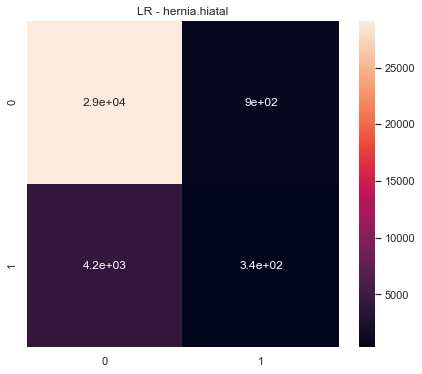

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hernia.hiatal  300.0  0.531108      0.545123         0.531151   
0   2.0  hernia.hiatal  300.0  0.482373      0.504906         0.542249   
0   3.0  hernia.hiatal  300.0  0.519711      0.520511         0.519205   
0   4.0  hernia.hiatal  300.0  0.492953      0.494751         0.495993   
0   5.0  hernia.hiatal  300.0  0.530539      0.529538         0.531959   

   ROC Macro  
0   0.575429  
0   0.508706  
0   0.497960  
0   0.501692  
0   0.569892  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hernia.hiatal  300.0  2.556684    2.594829       2.620557  2.65368
================================== herpes.zoster ==================================
================================== NB ==================================


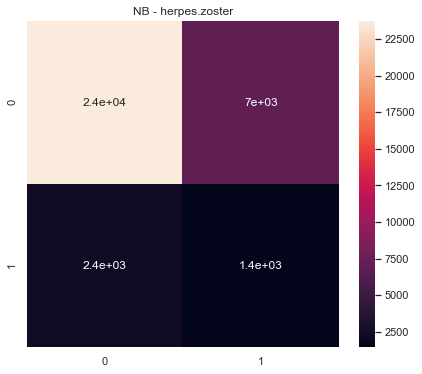

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  herpes.zoster  300.0  0.535780      0.549061         0.533805   
0   2.0  herpes.zoster  300.0  0.509150      0.542494         0.521700   
0   3.0  herpes.zoster  300.0  0.487244      0.525942         0.512072   
0   4.0  herpes.zoster  300.0  0.519068      0.535052         0.521697   
0   5.0  herpes.zoster  300.0  0.520805      0.530799         0.521124   

   ROC Macro  
0   0.614430  
0   0.569473  
0   0.557267  
0   0.581240  
0   0.560862  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  herpes.zoster  300.0  2.572047    2.683348       2.610398  2.883272
================================== DT ==================================


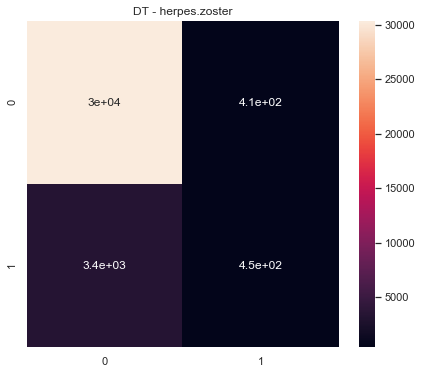

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  herpes.zoster  300.0  0.492763      0.504268         0.516259   
0   2.0  herpes.zoster  300.0  0.486251      0.502518         0.514148   
0   3.0  herpes.zoster  300.0  0.480283      0.484274         0.478423   
0   4.0  herpes.zoster  300.0  0.483260      0.495764         0.487675   
0   5.0  herpes.zoster  300.0  0.485682      0.501785         0.509355   

   ROC Macro  
0   0.525007  
0   0.546509  
0   0.488695  
0   0.521264  
0   0.457230  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  herpes.zoster  300.0  2.428238    2.488608       2.505859  2.538704
================================== RF ==================================


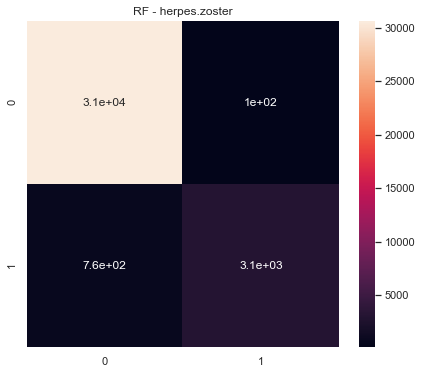

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  herpes.zoster  300.0  0.470782      0.500000         0.444790   
0   2.0  herpes.zoster  300.0  0.470782      0.500000         0.444790   
0   3.0  herpes.zoster  300.0  0.467146      0.479217         0.459044   
0   4.0  herpes.zoster  300.0  0.474145      0.492873         0.470627   
0   5.0  herpes.zoster  300.0  0.470737      0.499919         0.444774   

   ROC Macro  
0   0.582251  
0   0.562712  
0   0.531275  
0   0.447895  
0   0.532900  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  herpes.zoster  300.0  2.353593    2.472009       2.264025  2.657034
================================== SGD ==================================


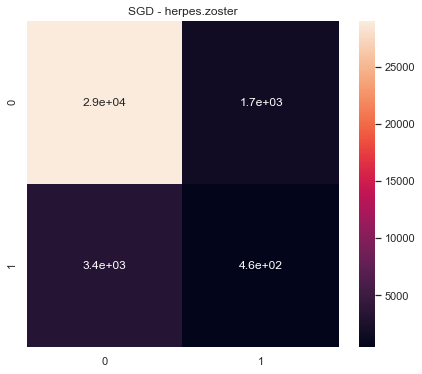

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  herpes.zoster  300.0  0.461887      0.476597         0.449882   
0   2.0  herpes.zoster  300.0  0.471127      0.489056         0.463006   
0   3.0  herpes.zoster  300.0  0.491357      0.491393         0.491323   
0   4.0  herpes.zoster  300.0  0.467120      0.468880         0.465552   
0   5.0  herpes.zoster  300.0  0.478839      0.483077         0.476688   

   ROC Macro  
0   0.453823  
0   0.460865  
0   0.436116  
0   0.429369  
0   0.475859  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  herpes.zoster  300.0  2.370329    2.409002       2.346452  2.256033
================================== LR ==================================


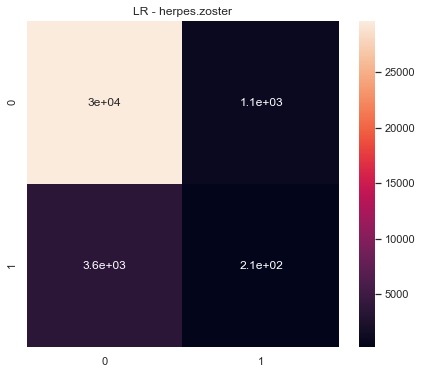

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  herpes.zoster  300.0  0.528613      0.544118         0.528593   
0   2.0  herpes.zoster  300.0  0.518966      0.517910         0.521761   
0   3.0  herpes.zoster  300.0  0.484175      0.503497         0.501796   
0   4.0  herpes.zoster  300.0  0.450571      0.443783         0.463741   
0   5.0  herpes.zoster  300.0  0.511506      0.516170         0.512063   

   ROC Macro  
0   0.560924  
0   0.509061  
0   0.508443  
0   0.460366  
0   0.512534  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  herpes.zoster  300.0  2.493831    2.525478       2.527954  2.551329
================================== hive ==================================
================================== NB ==================================


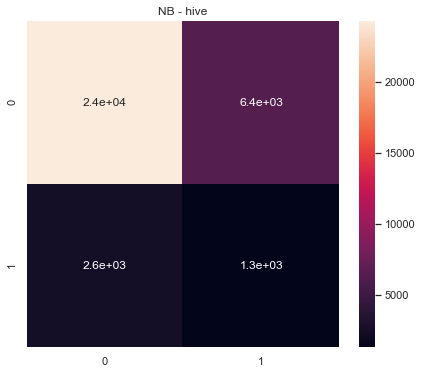

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hive  300.0  0.510088      0.516751         0.511748   0.562505
0   2.0  hive  300.0  0.486100      0.495464         0.497371   0.538916
0   3.0  hive  300.0  0.483703      0.514722         0.507088   0.520612
0   4.0  hive  300.0  0.513468      0.527954         0.517306   0.538006
0   5.0  hive  300.0  0.518945      0.520517         0.518199   0.568938



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hive  300.0  2.512303    2.575408       2.551713  2.728977
================================== DT ==================================


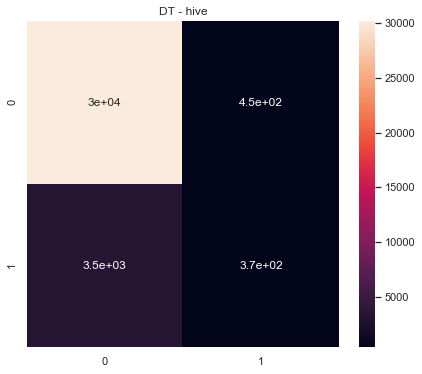

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hive  300.0  0.479823      0.501453         0.514274   0.516384
0   2.0  hive  300.0  0.480641      0.486707         0.478840   0.515171
0   3.0  hive  300.0  0.460309      0.470050         0.452324   0.458221
0   4.0  hive  300.0  0.482614      0.490823         0.482312   0.484613
0   5.0  hive  300.0  0.482118      0.501586         0.511566   0.519776



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hive  300.0  2.385504     2.45062       2.439317  2.494166
================================== RF ==================================


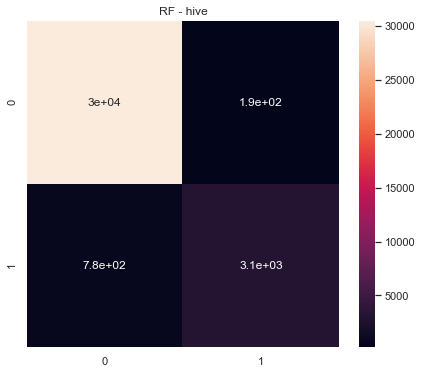

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hive  300.0  0.471155      0.499990         0.499259   0.537953
0   2.0  hive  300.0  0.457364      0.467389         0.448701   0.451157
0   3.0  hive  300.0  0.456381      0.470871         0.443294   0.444990
0   4.0  hive  300.0  0.466739      0.493151         0.443012   0.453103
0   5.0  hive  300.0  0.471319      0.500316         0.543728   0.518989



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hive  300.0  2.322957    2.431717       2.377994  2.406192
================================== SGD ==================================


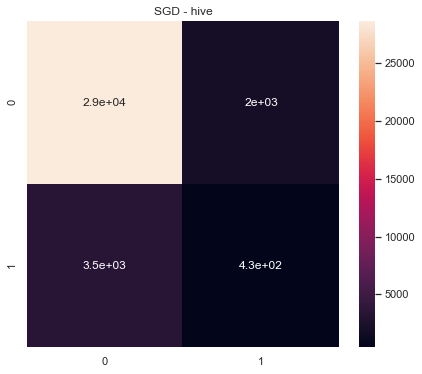

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hive  300.0  0.487413      0.486949         0.488650   0.446558
0   2.0  hive  300.0  0.484281      0.484907         0.483805   0.449027
0   3.0  hive  300.0  0.486630      0.486888         0.486413   0.441374
0   4.0  hive  300.0  0.468135      0.478147         0.461667   0.454907
0   5.0  hive  300.0  0.494072      0.495751         0.496828   0.489412



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hive  300.0  2.420531    2.432642       2.417362  2.281277
================================== LR ==================================


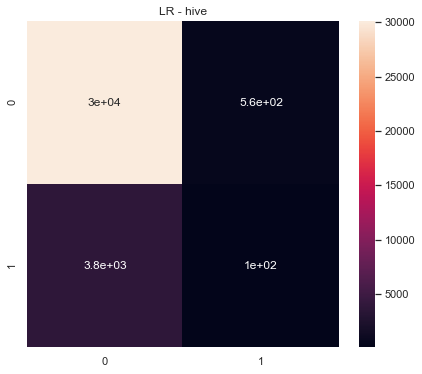

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hive  300.0  0.527963      0.525781         0.533926   0.533297
0   2.0  hive  300.0  0.458398      0.465710         0.452117   0.405581
0   3.0  hive  300.0  0.480721      0.479678         0.482755   0.471771
0   4.0  hive  300.0  0.491666      0.494270         0.492067   0.462573
0   5.0  hive  300.0  0.523574      0.521853         0.533909   0.513077



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hive  300.0  2.482322    2.487292       2.494774  2.386299
================================== hot.flash ==================================
================================== NB ==================================


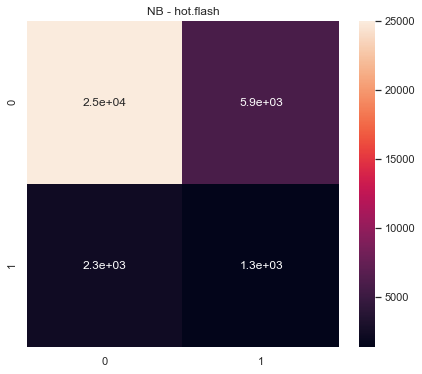

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hot.flash  300.0  0.554138      0.560825         0.550266   0.635476
0   2.0  hot.flash  300.0  0.524314      0.553979         0.529386   0.584435
0   3.0  hot.flash  300.0  0.521020      0.545465         0.525577   0.599820
0   4.0  hot.flash  300.0  0.531324      0.554486         0.532299   0.570052
0   5.0  hot.flash  300.0  0.525021      0.534827         0.524294   0.595203



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hot.flash  300.0  2.655816    2.749581       2.661821  2.984987
================================== DT ==================================


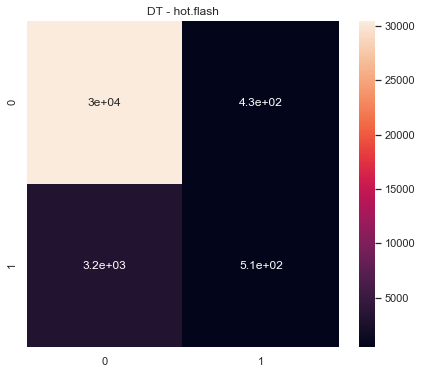

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hot.flash  300.0  0.507176      0.514012         0.563894   0.546085
0   2.0  hot.flash  300.0  0.512109      0.514691         0.538376   0.575021
0   3.0  hot.flash  300.0  0.494585      0.497527         0.496240   0.454725
0   4.0  hot.flash  300.0  0.496670      0.503372         0.508301   0.506776
0   5.0  hot.flash  300.0  0.498297      0.508804         0.543322   0.472846



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hot.flash  300.0  2.508837    2.538407       2.650134  2.555453
================================== RF ==================================


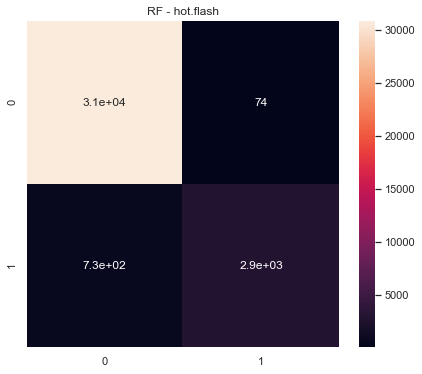

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hot.flash  300.0  0.471591      0.499271         0.446819   0.587781
0   2.0  hot.flash  300.0  0.486722      0.499747         0.499062   0.620267
0   3.0  hot.flash  300.0  0.478816      0.494884         0.480408   0.568170
0   4.0  hot.flash  300.0  0.470498      0.497166         0.446545   0.549451
0   5.0  hot.flash  300.0  0.471829      0.499757         0.446858   0.582932



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hot.flash  300.0  2.379457    2.490825       2.319692  2.908601
================================== SGD ==================================


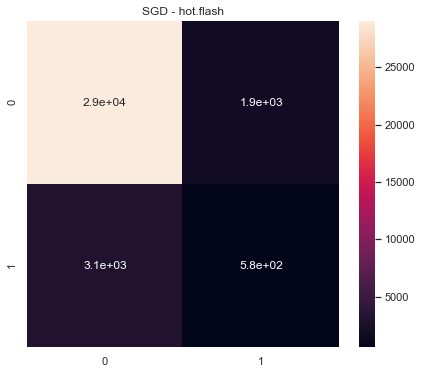

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hot.flash  300.0  0.480832      0.480809         0.480855   0.498059
0   2.0  hot.flash  300.0  0.494167      0.494313         0.494077   0.465881
0   3.0  hot.flash  300.0  0.471049      0.468768         0.474534   0.410061
0   4.0  hot.flash  300.0  0.507666      0.507474         0.508442   0.487884
0   5.0  hot.flash  300.0  0.512051      0.511623         0.514988   0.524424



         ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hot.flash  300.0  2.465765    2.462986       2.472896  2.38631
================================== LR ==================================


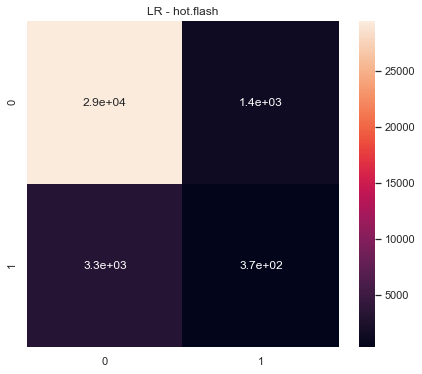

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hot.flash  300.0  0.484866      0.502055         0.501057   0.516280
0   2.0  hot.flash  300.0  0.512169      0.511789         0.512886   0.506265
0   3.0  hot.flash  300.0  0.503423      0.524832         0.513365   0.476913
0   4.0  hot.flash  300.0  0.493773      0.511632         0.506200   0.485534
0   5.0  hot.flash  300.0  0.493915      0.514372         0.507482   0.518142



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hot.flash  300.0  2.488144     2.56468        2.54099  2.503134
================================== hyperglycaemia ==================================
================================== NB ==================================


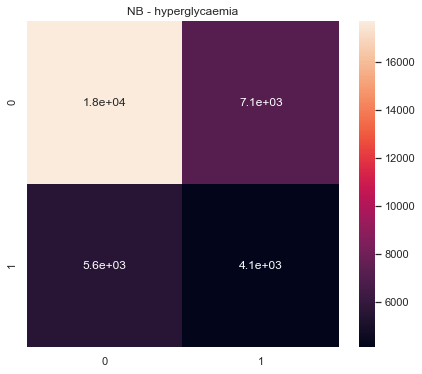

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperglycaemia  300.0  0.548288      0.547188         0.550935   
0   2.0  hyperglycaemia  300.0  0.545420      0.544407         0.548083   
0   3.0  hyperglycaemia  300.0  0.526398      0.528503         0.526404   
0   4.0  hyperglycaemia  300.0  0.513210      0.515572         0.514165   
0   5.0  hyperglycaemia  300.0  0.515085      0.514993         0.515262   

   ROC Macro  
0   0.577563  
0   0.559007  
0   0.546530  
0   0.514465  
0   0.525499  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperglycaemia  300.0  2.648403    2.650663        2.65485  2.723064
================================== DT ==================================


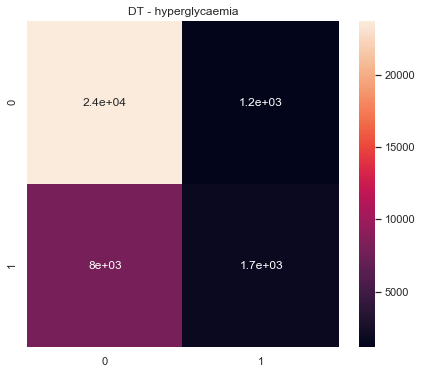

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperglycaemia  300.0  0.470096      0.505295         0.515920   
0   2.0  hyperglycaemia  300.0  0.486515      0.503222         0.505767   
0   3.0  hyperglycaemia  300.0  0.440776      0.482068         0.449938   
0   4.0  hyperglycaemia  300.0  0.456108      0.482507         0.465278   
0   5.0  hyperglycaemia  300.0  0.465700      0.507187         0.527102   

   ROC Macro  
0   0.533538  
0   0.512954  
0   0.473359  
0   0.476956  
0   0.510540  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperglycaemia  300.0  2.319195    2.480279       2.464005  2.507346
================================== RF ==================================


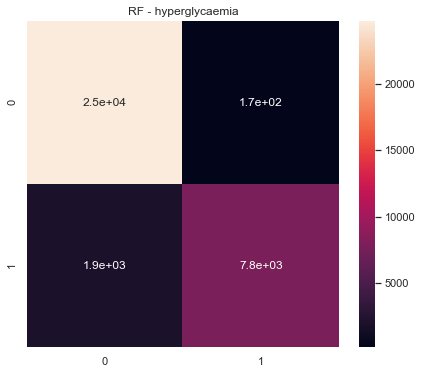

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperglycaemia  300.0  0.422280      0.499362         0.478687   
0   2.0  hyperglycaemia  300.0  0.422103      0.499808         0.492082   
0   3.0  hyperglycaemia  300.0  0.424906      0.480304         0.420966   
0   4.0  hyperglycaemia  300.0  0.408751      0.463165         0.381765   
0   5.0  hyperglycaemia  300.0  0.425205      0.501902         0.585940   

   ROC Macro  
0   0.541292  
0   0.535215  
0   0.510975  
0   0.467461  
0   0.537994  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperglycaemia  300.0  2.103245    2.444541       2.359441  2.592938
================================== SGD ==================================


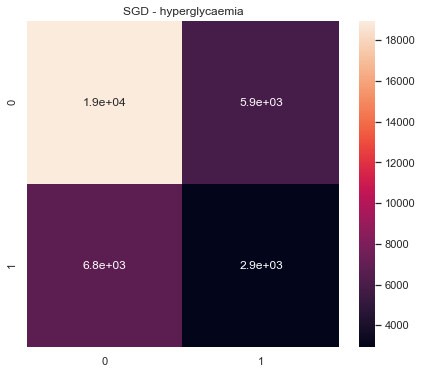

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperglycaemia  300.0  0.515142      0.515429         0.517024   
0   2.0  hyperglycaemia  300.0  0.517929      0.521154         0.527866   
0   3.0  hyperglycaemia  300.0  0.481451      0.481494         0.481412   
0   4.0  hyperglycaemia  300.0  0.487431      0.487481         0.487393   
0   5.0  hyperglycaemia  300.0  0.477167      0.481936         0.478158   

   ROC Macro  
0   0.527989  
0   0.538779  
0   0.491245  
0   0.481754  
0   0.463876  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperglycaemia  300.0  2.47912    2.487493       2.491853  2.503644
================================== LR ==================================


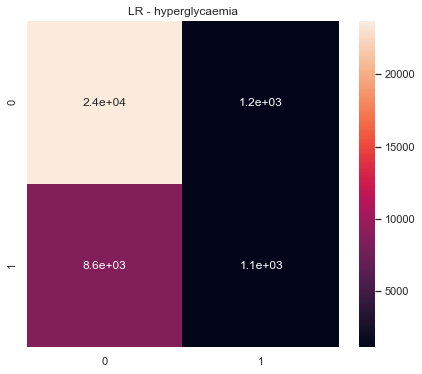

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperglycaemia  300.0  0.504830      0.523116         0.550286   
0   2.0  hyperglycaemia  300.0  0.435707      0.502878         0.535798   
0   3.0  hyperglycaemia  300.0  0.476713      0.481224         0.477498   
0   4.0  hyperglycaemia  300.0  0.447618      0.464777         0.446681   
0   5.0  hyperglycaemia  300.0  0.475512      0.502130         0.504883   

   ROC Macro  
0   0.553980  
0   0.542575  
0   0.478063  
0   0.469659  
0   0.471469  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperglycaemia  300.0  2.340379    2.474125       2.515146  2.515745
================================== hyperhidrosis ==================================
================================== NB ==================================


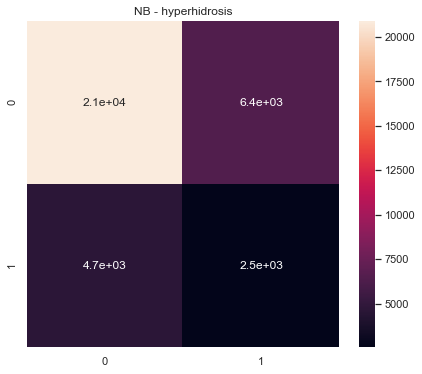

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperhidrosis  300.0  0.527019      0.526875         0.527181   
0   2.0  hyperhidrosis  300.0  0.523441      0.525408         0.523033   
0   3.0  hyperhidrosis  300.0  0.527042      0.534314         0.528025   
0   4.0  hyperhidrosis  300.0  0.540887      0.540815         0.540961   
0   5.0  hyperhidrosis  300.0  0.511553      0.511417         0.511899   

   ROC Macro  
0   0.567762  
0   0.546343  
0   0.559472  
0   0.552824  
0   0.544440  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperhidrosis  300.0  2.629941     2.63883       2.631099  2.770842
================================== DT ==================================


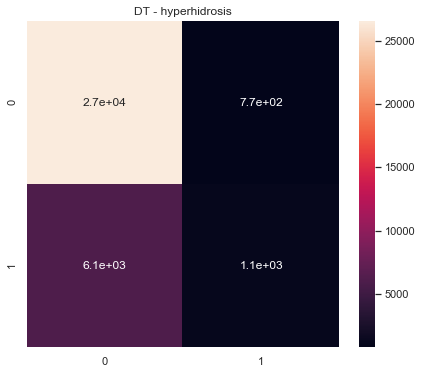

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperhidrosis  300.0  0.479248      0.507908         0.533988   
0   2.0  hyperhidrosis  300.0  0.488586      0.507576         0.520665   
0   3.0  hyperhidrosis  300.0  0.487020      0.497394         0.495498   
0   4.0  hyperhidrosis  300.0  0.475659      0.498296         0.495363   
0   5.0  hyperhidrosis  300.0  0.472523      0.507167         0.542375   

   ROC Macro  
0   0.520112  
0   0.504428  
0   0.508128  
0   0.506236  
0   0.511285  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hyperhidrosis  300.0  2.403035    2.518341        2.58789  2.55019
================================== RF ==================================


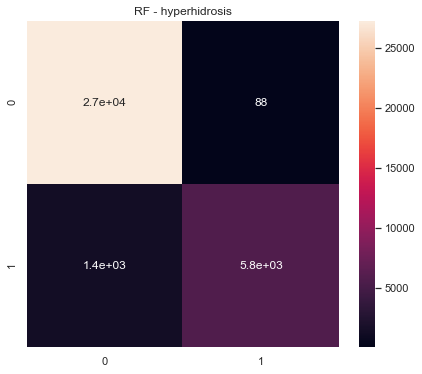

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperhidrosis  300.0  0.443096      0.499666         0.478719   
0   2.0  hyperhidrosis  300.0  0.442747      0.500052         0.506561   
0   3.0  hyperhidrosis  300.0  0.453706      0.486457         0.455576   
0   4.0  hyperhidrosis  300.0  0.439317      0.493281         0.406365   
0   5.0  hyperhidrosis  300.0  0.443040      0.499574         0.474303   

   ROC Macro  
0   0.541192  
0   0.552769  
0   0.525470  
0   0.503295  
0   0.553659  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperhidrosis  300.0  2.221906    2.479029       2.321524  2.676386
================================== SGD ==================================


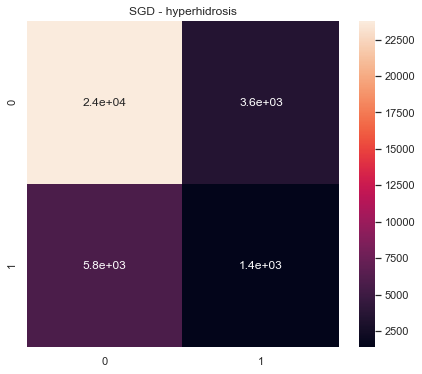

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperhidrosis  300.0  0.472934      0.476882         0.471909   
0   2.0  hyperhidrosis  300.0  0.471244      0.477058         0.470206   
0   3.0  hyperhidrosis  300.0  0.462262      0.479716         0.461989   
0   4.0  hyperhidrosis  300.0  0.460053      0.467290         0.457247   
0   5.0  hyperhidrosis  300.0  0.477937      0.491845         0.484839   

   ROC Macro  
0   0.441420  
0   0.435457  
0   0.431433  
0   0.450927  
0   0.465108  



             ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperhidrosis  300.0  2.34443    2.392792        2.34619  2.224345
================================== LR ==================================


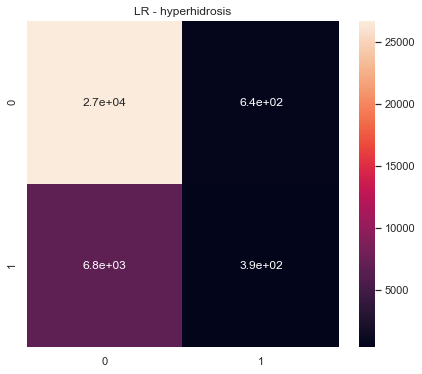

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperhidrosis  300.0  0.472199      0.508235         0.555798   
0   2.0  hyperhidrosis  300.0  0.473702      0.498933         0.496758   
0   3.0  hyperhidrosis  300.0  0.508701      0.509947         0.512457   
0   4.0  hyperhidrosis  300.0  0.486173      0.490590         0.487641   
0   5.0  hyperhidrosis  300.0  0.492912      0.512014         0.535680   

   ROC Macro  
0   0.555806  
0   0.465201  
0   0.527321  
0   0.488447  
0   0.547005  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hyperhidrosis  300.0  2.433688    2.519719       2.588333  2.58378
================================== hyperlipaemia ==================================
================================== NB ==================================


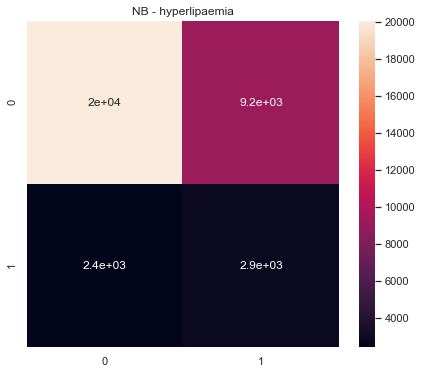

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperlipaemia  300.0  0.551627      0.593648         0.556964   
0   2.0  hyperlipaemia  300.0  0.505783      0.527119         0.516907   
0   3.0  hyperlipaemia  300.0  0.508247      0.563634         0.534883   
0   4.0  hyperlipaemia  300.0  0.537628      0.572899         0.544709   
0   5.0  hyperlipaemia  300.0  0.519546      0.542242         0.526924   

   ROC Macro  
0   0.633277  
0   0.553730  
0   0.584079  
0   0.604835  
0   0.582668  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperlipaemia  300.0  2.622831    2.799541       2.680387  2.958589
================================== DT ==================================


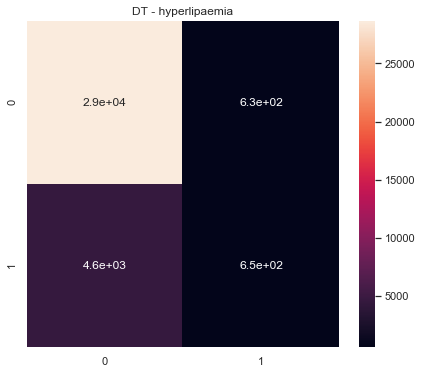

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperlipaemia  300.0  0.484086      0.507472         0.550502   
0   2.0  hyperlipaemia  300.0  0.486849      0.490903         0.487388   
0   3.0  hyperlipaemia  300.0  0.461531      0.477339         0.454664   
0   4.0  hyperlipaemia  300.0  0.493290      0.506428         0.519027   
0   5.0  hyperlipaemia  300.0  0.480014      0.496999         0.491282   

   ROC Macro  
0   0.564729  
0   0.484482  
0   0.549779  
0   0.567935  
0   0.545043  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperlipaemia  300.0  2.405772    2.479141       2.502862  2.711969
================================== RF ==================================


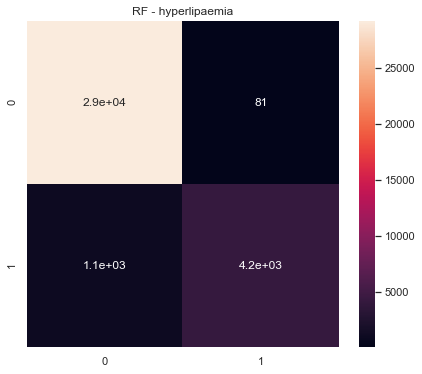

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperlipaemia  300.0  0.458464      0.499658         0.423545   
0   2.0  hyperlipaemia  300.0  0.461304      0.500992         0.611145   
0   3.0  hyperlipaemia  300.0  0.446403      0.475995         0.420275   
0   4.0  hyperlipaemia  300.0  0.455219      0.493251         0.422632   
0   5.0  hyperlipaemia  300.0  0.458907      0.497701         0.448278   

   ROC Macro  
0   0.610100  
0   0.569551  
0   0.551939  
0   0.552861  
0   0.592259  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hyperlipaemia  300.0  2.280297    2.467598       2.325875  2.87671
================================== SGD ==================================


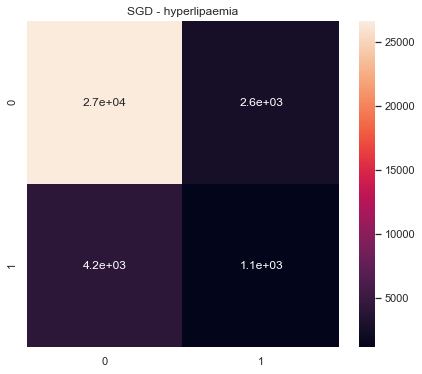

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperlipaemia  300.0  0.486878      0.491747         0.487942   
0   2.0  hyperlipaemia  300.0  0.514048      0.515549         0.525069   
0   3.0  hyperlipaemia  300.0  0.465689      0.475688         0.461319   
0   4.0  hyperlipaemia  300.0  0.463947      0.473382         0.459248   
0   5.0  hyperlipaemia  300.0  0.475513      0.475485         0.475542   

   ROC Macro  
0   0.486564  
0   0.505539  
0   0.418215  
0   0.459497  
0   0.472290  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperlipaemia  300.0  2.406075    2.431852        2.40912  2.342106
================================== LR ==================================


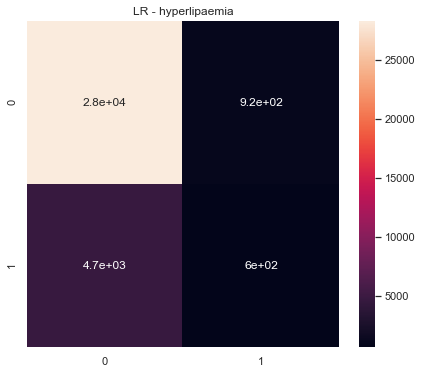

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hyperlipaemia  300.0  0.544750      0.541045         0.556243   
0   2.0  hyperlipaemia  300.0  0.541526      0.538674         0.548475   
0   3.0  hyperlipaemia  300.0  0.491279      0.491359         0.491215   
0   4.0  hyperlipaemia  300.0  0.489492      0.491059         0.489400   
0   5.0  hyperlipaemia  300.0  0.517541      0.518562         0.530585   

   ROC Macro  
0   0.633332  
0   0.583772  
0   0.526770  
0   0.503024  
0   0.574420  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hyperlipaemia  300.0  2.584588    2.580698       2.615918  2.821317
================================== hypoglycaemia ==================================
================================== NB ==================================


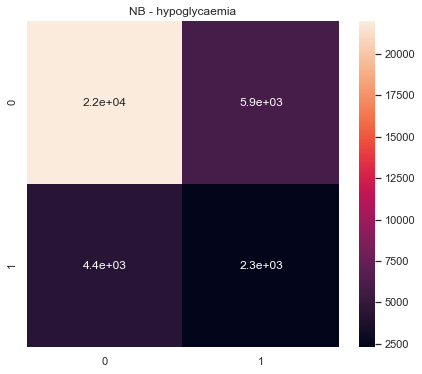

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypoglycaemia  300.0  0.553341      0.555386         0.551926   
0   2.0  hypoglycaemia  300.0  0.532037      0.531844         0.532251   
0   3.0  hypoglycaemia  300.0  0.529725      0.534007         0.529125   
0   4.0  hypoglycaemia  300.0  0.539876      0.540943         0.539103   
0   5.0  hypoglycaemia  300.0  0.523705      0.525071         0.523166   

   ROC Macro  
0   0.592764  
0   0.529242  
0   0.560100  
0   0.565063  
0   0.549434  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoglycaemia  300.0  2.678684    2.687251       2.675571  2.796604
================================== DT ==================================


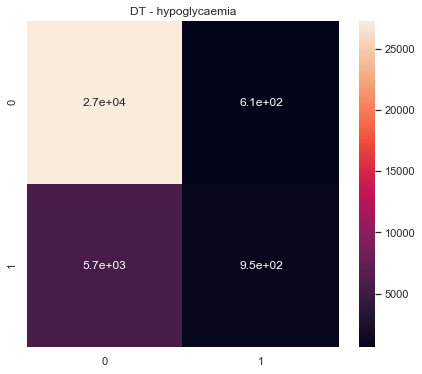

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypoglycaemia  300.0  0.500482      0.519150         0.578254   
0   2.0  hypoglycaemia  300.0  0.487084      0.503156         0.507777   
0   3.0  hypoglycaemia  300.0  0.476705      0.495195         0.488409   
0   4.0  hypoglycaemia  300.0  0.482918      0.507183         0.528458   
0   5.0  hypoglycaemia  300.0  0.501575      0.518814         0.569566   

   ROC Macro  
0   0.538630  
0   0.516132  
0   0.520151  
0   0.498729  
0   0.528963  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoglycaemia  300.0  2.448764    2.543499       2.672465  2.602605
================================== RF ==================================


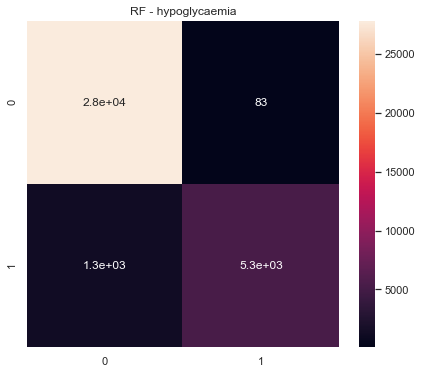

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypoglycaemia  300.0  0.449387      0.500695         0.557572   
0   2.0  hypoglycaemia  300.0  0.453575      0.498353         0.480281   
0   3.0  hypoglycaemia  300.0  0.443484      0.479384         0.425817   
0   4.0  hypoglycaemia  300.0  0.454094      0.502067         0.565706   
0   5.0  hypoglycaemia  300.0  0.451705      0.501733         0.609829   

   ROC Macro  
0   0.530448  
0   0.522752  
0   0.534807  
0   0.609976  
0   0.594417  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hypoglycaemia  300.0  2.252244    2.482232       2.639205   2.7924
================================== SGD ==================================


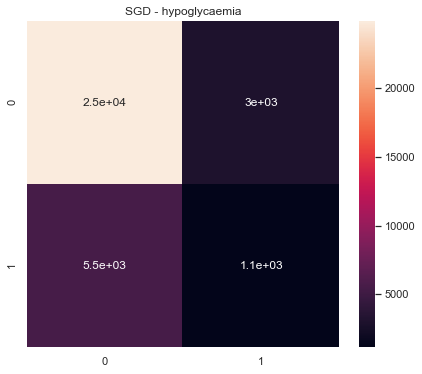

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypoglycaemia  300.0  0.492996      0.503683         0.507260   
0   2.0  hypoglycaemia  300.0  0.490788      0.497745         0.496444   
0   3.0  hypoglycaemia  300.0  0.476288      0.481755         0.475736   
0   4.0  hypoglycaemia  300.0  0.464374      0.471329         0.461766   
0   5.0  hypoglycaemia  300.0  0.471186      0.478943         0.470038   

   ROC Macro  
0   0.502699  
0   0.503753  
0   0.443212  
0   0.455464  
0   0.431335  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoglycaemia  300.0  2.395632    2.433455       2.411243  2.336464
================================== LR ==================================


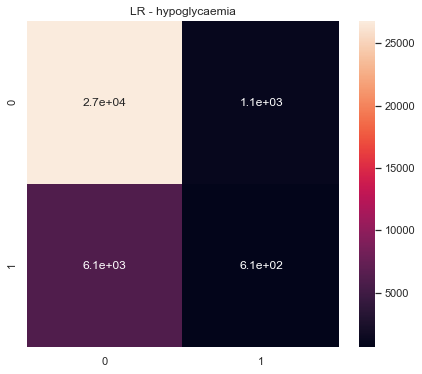

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypoglycaemia  300.0  0.524964      0.524324         0.530328   
0   2.0  hypoglycaemia  300.0  0.524349      0.524917         0.536801   
0   3.0  hypoglycaemia  300.0  0.496417      0.496402         0.496464   
0   4.0  hypoglycaemia  300.0  0.490041      0.491757         0.490331   
0   5.0  hypoglycaemia  300.0  0.518589      0.518633         0.518548   

   ROC Macro  
0   0.549794  
0   0.549977  
0   0.493361  
0   0.507364  
0   0.518838  



             ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoglycaemia  300.0  2.55436    2.556033       2.572472  2.619333
================================== hypokalaemia ==================================
================================== NB ==================================


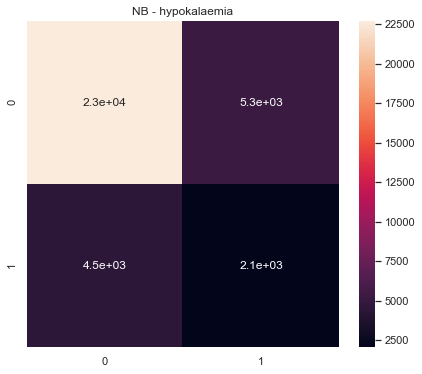

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypokalaemia  300.0  0.527540      0.527358         0.527746   
0   2.0  hypokalaemia  300.0  0.557693      0.556820         0.558713   
0   3.0  hypokalaemia  300.0  0.512088      0.513846         0.512258   
0   4.0  hypokalaemia  300.0  0.525253      0.528024         0.524709   
0   5.0  hypokalaemia  300.0  0.528185      0.527765         0.528744   

   ROC Macro  
0   0.563341  
0   0.591677  
0   0.552168  
0   0.530152  
0   0.551577  



            ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypokalaemia  300.0  2.65076    2.653814        2.65217  2.788914
================================== DT ==================================


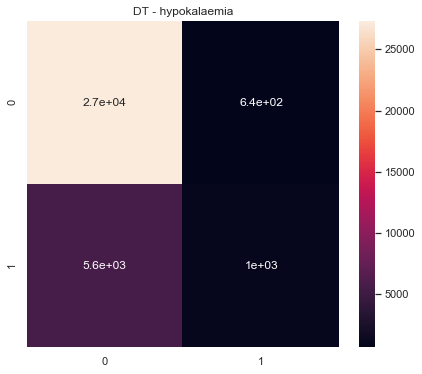

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypokalaemia  300.0  0.486989      0.509783         0.539155   
0   2.0  hypokalaemia  300.0  0.489707      0.506942         0.519487   
0   3.0  hypokalaemia  300.0  0.470196      0.496415         0.487746   
0   4.0  hypokalaemia  300.0  0.492261      0.506815         0.516846   
0   5.0  hypokalaemia  300.0  0.484626      0.509230         0.540412   

   ROC Macro  
0   0.548076  
0   0.531259  
0   0.500056  
0   0.504803  
0   0.522818  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypokalaemia  300.0  2.423779    2.529184       2.603646  2.607012
================================== RF ==================================


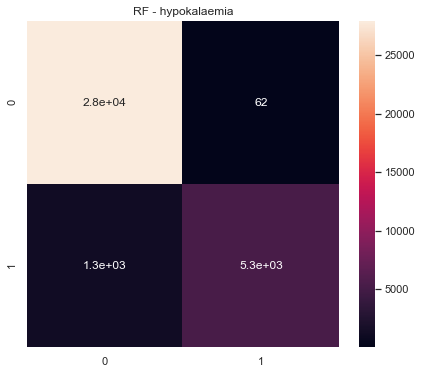

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypokalaemia  300.0  0.454194      0.500252         0.504526   
0   2.0  hypokalaemia  300.0  0.450917      0.501447         0.654710   
0   3.0  hypokalaemia  300.0  0.444573      0.488498         0.421417   
0   4.0  hypokalaemia  300.0  0.445607      0.493444         0.420314   
0   5.0  hypokalaemia  300.0  0.453349      0.501623         0.559969   

   ROC Macro  
0   0.587695  
0   0.581984  
0   0.561891  
0   0.515308  
0   0.576095  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypokalaemia  300.0  2.248639    2.485264       2.560935  2.822973
================================== SGD ==================================


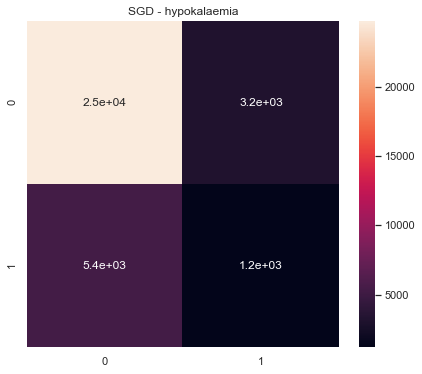

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypokalaemia  300.0  0.510889      0.510775         0.511087   
0   2.0  hypokalaemia  300.0  0.484334      0.490282         0.486107   
0   3.0  hypokalaemia  300.0  0.460447      0.474400         0.456818   
0   4.0  hypokalaemia  300.0  0.469915      0.472171         0.468627   
0   5.0  hypokalaemia  300.0  0.483251      0.482983         0.483689   

   ROC Macro  
0   0.477415  
0   0.483600  
0   0.423372  
0   0.442646  
0   0.483998  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypokalaemia  300.0  2.408835    2.430611       2.406328  2.311032
================================== LR ==================================


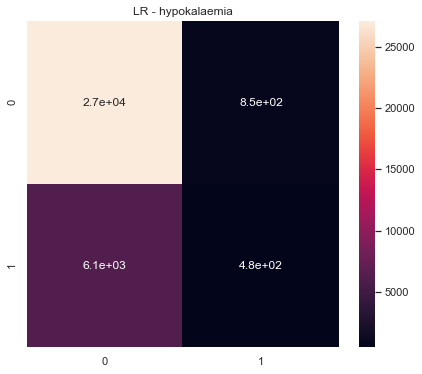

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypokalaemia  300.0  0.515987      0.516081         0.519766   
0   2.0  hypokalaemia  300.0  0.491402      0.513871         0.561952   
0   3.0  hypokalaemia  300.0  0.505554      0.505863         0.506633   
0   4.0  hypokalaemia  300.0  0.490436      0.496606         0.494859   
0   5.0  hypokalaemia  300.0  0.517918      0.517654         0.520914   

   ROC Macro  
0   0.533494  
0   0.542235  
0   0.506096  
0   0.498605  
0   0.483956  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypokalaemia  300.0  2.521297    2.550075       2.604124  2.564386
================================== hypothyroid ==================================
================================== NB ==================================


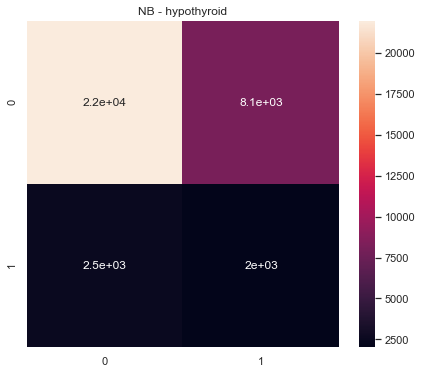

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypothyroid  300.0  0.535032      0.555695         0.535986   
0   2.0  hypothyroid  300.0  0.522633      0.545786         0.527876   
0   3.0  hypothyroid  300.0  0.496939      0.536848         0.519090   
0   4.0  hypothyroid  300.0  0.521718      0.553729         0.530646   
0   5.0  hypothyroid  300.0  0.527282      0.547776         0.530215   

   ROC Macro  
0   0.601513  
0   0.585360  
0   0.574868  
0   0.591569  
0   0.604197  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypothyroid  300.0  2.603605    2.739833       2.643812  2.957507
================================== DT ==================================


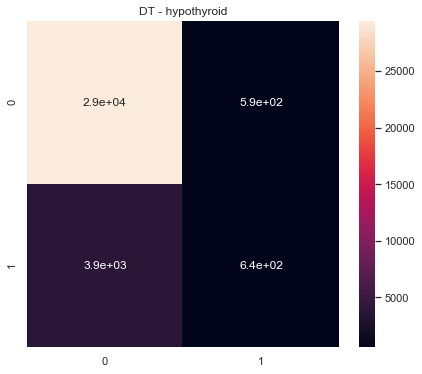

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypothyroid  300.0  0.503888      0.512841         0.544221   
0   2.0  hypothyroid  300.0  0.486270      0.497149         0.493227   
0   3.0  hypothyroid  300.0  0.480946      0.481727         0.480360   
0   4.0  hypothyroid  300.0  0.509456      0.516542         0.556788   
0   5.0  hypothyroid  300.0  0.528798      0.528642         0.580659   

   ROC Macro  
0   0.565855  
0   0.522601  
0   0.536578  
0   0.553332  
0   0.603331  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypothyroid  300.0  2.509359    2.536899       2.655256  2.781696
================================== RF ==================================


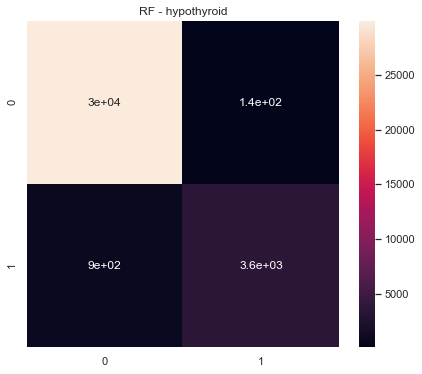

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypothyroid  300.0  0.464880      0.499667         0.434622   
0   2.0  hypothyroid  300.0  0.454282      0.476553         0.435244   
0   3.0  hypothyroid  300.0  0.447377      0.465701         0.430440   
0   4.0  hypothyroid  300.0  0.467065      0.500690         0.577523   
0   5.0  hypothyroid  300.0  0.466055      0.500304         0.559685   

   ROC Macro  
0   0.555667  
0   0.540873  
0   0.573092  
0   0.592600  
0   0.629458  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hypothyroid  300.0  2.299659    2.442915       2.437514  2.89169
================================== SGD ==================================


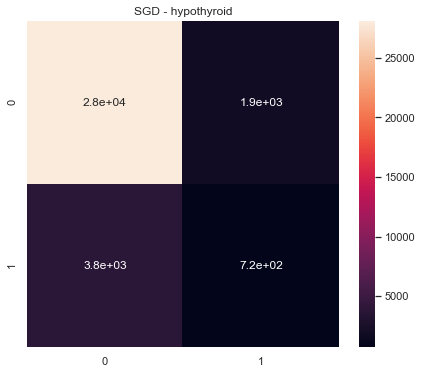

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypothyroid  300.0  0.473422      0.491235         0.473098   
0   2.0  hypothyroid  300.0  0.501969      0.503109         0.504094   
0   3.0  hypothyroid  300.0  0.470912      0.476325         0.467786   
0   4.0  hypothyroid  300.0  0.479595      0.489044         0.479323   
0   5.0  hypothyroid  300.0  0.481675      0.488753         0.481310   

   ROC Macro  
0   0.453610  
0   0.440146  
0   0.391794  
0   0.477816  
0   0.483373  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hypothyroid  300.0  2.407574    2.448467       2.405612  2.24674
================================== LR ==================================


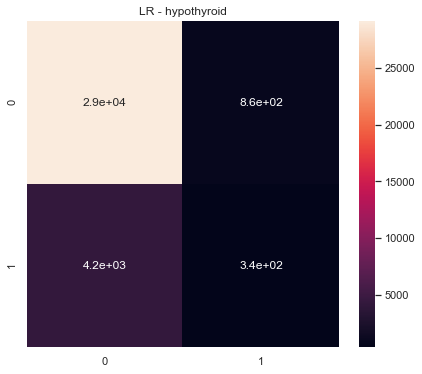

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  hypothyroid  300.0  0.511941      0.511719         0.512291   
0   2.0  hypothyroid  300.0  0.476030      0.483773         0.473696   
0   3.0  hypothyroid  300.0  0.517528      0.529240         0.519872   
0   4.0  hypothyroid  300.0  0.528491      0.526716         0.532911   
0   5.0  hypothyroid  300.0  0.547230      0.547892         0.546627   

   ROC Macro  
0   0.511913  
0   0.513520  
0   0.538126  
0   0.545318  
0   0.615414  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypothyroid  300.0  2.58122     2.59934       2.585397  2.724292
================================== hypoxia ==================================
================================== NB ==================================


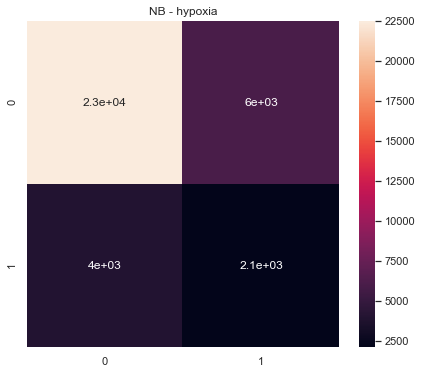

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hypoxia  300.0  0.535582      0.538109         0.534363   0.566552
0   2.0  hypoxia  300.0  0.510474      0.517814         0.513531   0.538963
0   3.0  hypoxia  300.0  0.507352      0.515505         0.511536   0.524178
0   4.0  hypoxia  300.0  0.516501      0.520267         0.516863   0.514245
0   5.0  hypoxia  300.0  0.522352      0.522100         0.522667   0.551482



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoxia  300.0  2.592261    2.613796        2.59896  2.695419
================================== DT ==================================


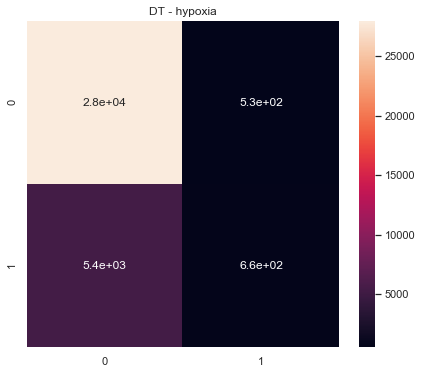

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hypoxia  300.0  0.495091      0.513689         0.558009   0.542971
0   2.0  hypoxia  300.0  0.463219      0.474749         0.459342   0.473880
0   3.0  hypoxia  300.0  0.472484      0.493417         0.481333   0.492869
0   4.0  hypoxia  300.0  0.474156      0.497466         0.491271   0.527114
0   5.0  hypoxia  300.0  0.485604      0.508247         0.537630   0.514004



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoxia  300.0  2.390555    2.487569       2.527585  2.550838
================================== RF ==================================


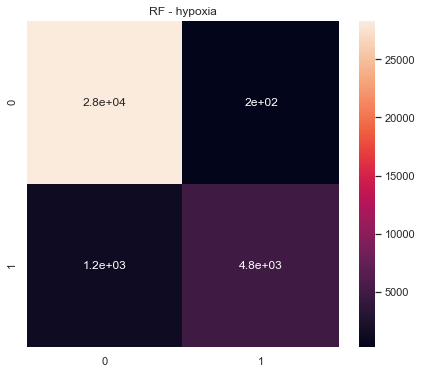

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hypoxia  300.0  0.453116      0.499512         0.471271   0.605292
0   2.0  hypoxia  300.0  0.438411      0.469642         0.413309   0.531976
0   3.0  hypoxia  300.0  0.443823      0.473931         0.423751   0.479809
0   4.0  hypoxia  300.0  0.441823      0.477844         0.412906   0.474623
0   5.0  hypoxia  300.0  0.452015      0.499912         0.412493   0.541584



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoxia  300.0  2.229188    2.420842        2.13373  2.633283
================================== SGD ==================================


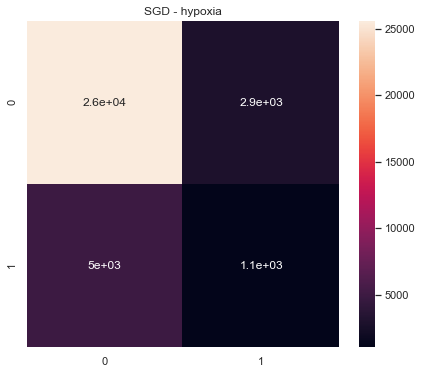

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hypoxia  300.0  0.491116      0.491686         0.491001   0.473853
0   2.0  hypoxia  300.0  0.474314      0.478287         0.472892   0.478230
0   3.0  hypoxia  300.0  0.456771      0.466093         0.451737   0.416108
0   4.0  hypoxia  300.0  0.466162      0.470355         0.463857   0.433550
0   5.0  hypoxia  300.0  0.480768      0.490880         0.483975   0.526670



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  hypoxia  300.0  2.369131    2.397301       2.363462  2.328411
================================== LR ==================================


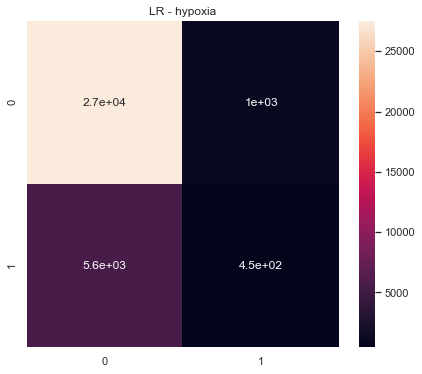

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  hypoxia  300.0  0.521071      0.521050         0.521091   0.543398
0   2.0  hypoxia  300.0  0.477692      0.486115         0.478178   0.505773
0   3.0  hypoxia  300.0  0.491017      0.492537         0.493907   0.472291
0   4.0  hypoxia  300.0  0.455432      0.459884         0.452268   0.447686
0   5.0  hypoxia  300.0  0.487684      0.498173         0.496448   0.504112



       ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  hypoxia  300.0  2.432896     2.45776       2.441892  2.47326
================================== icterus ==================================
================================== NB ==================================


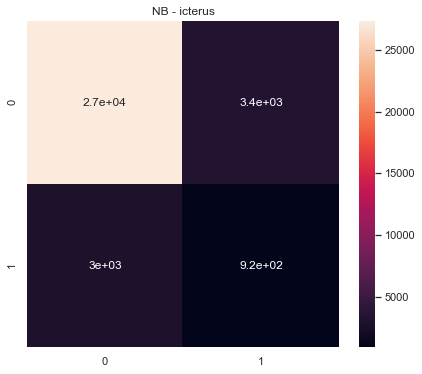

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  icterus  300.0  0.510171      0.510413         0.515016   0.540422
0   2.0  icterus  300.0  0.530557      0.529757         0.531554   0.536682
0   3.0  icterus  300.0  0.504050      0.504086         0.504623   0.555663
0   4.0  icterus  300.0  0.508691      0.509450         0.508499   0.553821
0   5.0  icterus  300.0  0.543385      0.539390         0.551766   0.571207



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  icterus  300.0  2.596854    2.593095       2.611458  2.757794
================================== DT ==================================


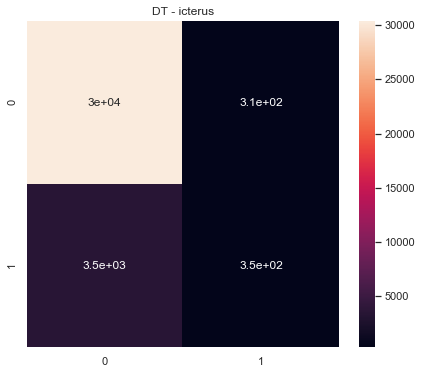

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  icterus  300.0  0.486310      0.502501         0.513479   0.525485
0   2.0  icterus  300.0  0.477313      0.499708         0.497298   0.494890
0   3.0  icterus  300.0  0.462521      0.480670         0.447677   0.498381
0   4.0  icterus  300.0  0.475773      0.495052         0.476824   0.532845
0   5.0  icterus  300.0  0.478422      0.494286         0.480165   0.504077



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  icterus  300.0  2.380338    2.472218       2.415443  2.555679
================================== RF ==================================


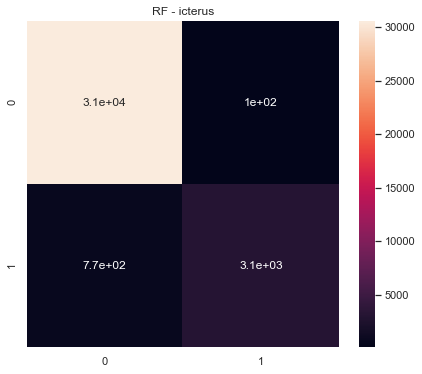

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  icterus  300.0  0.470214      0.499756         0.443970   0.573698
0   2.0  icterus  300.0  0.470255      0.499837         0.443978   0.535505
0   3.0  icterus  300.0  0.459776      0.479221         0.441848   0.515906
0   4.0  icterus  300.0  0.465501      0.490385         0.443021   0.523506
0   5.0  icterus  300.0  0.477527      0.496674         0.483217   0.554633



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  icterus  300.0  2.343273    2.465872       2.256034  2.703249
================================== SGD ==================================


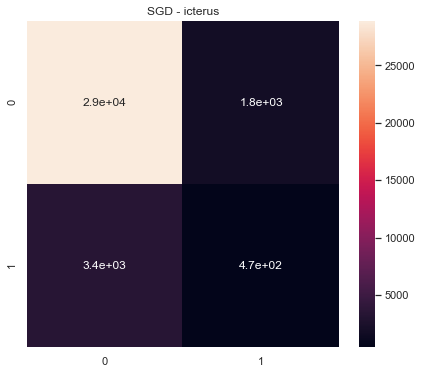

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  icterus  300.0  0.480865      0.486430         0.479078   0.445667
0   2.0  icterus  300.0  0.486522      0.489199         0.485806   0.466814
0   3.0  icterus  300.0  0.489743      0.495614         0.492039   0.442424
0   4.0  icterus  300.0  0.495545      0.498972         0.498351   0.490206
0   5.0  icterus  300.0  0.498984      0.500099         0.500128   0.554977



       ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  icterus  300.0  2.45166    2.470314       2.455402  2.400088
================================== LR ==================================


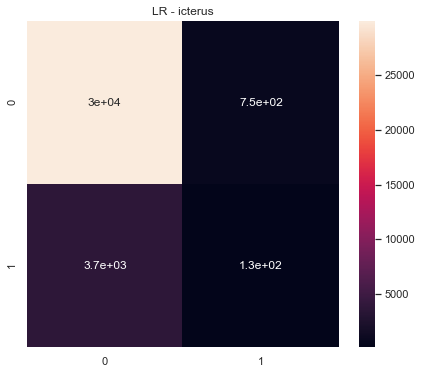

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  icterus  300.0  0.497860      0.509788         0.505816   0.479070
0   2.0  icterus  300.0  0.514971      0.514988         0.524952   0.522287
0   3.0  icterus  300.0  0.468274      0.466429         0.470607   0.507050
0   4.0  icterus  300.0  0.490092      0.489802         0.490908   0.527544
0   5.0  icterus  300.0  0.510977      0.511835         0.519955   0.547498



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  icterus  300.0  2.482174    2.492843       2.512238  2.583449
================================== increased.platelet.count ==================================
================================== NB ==================================


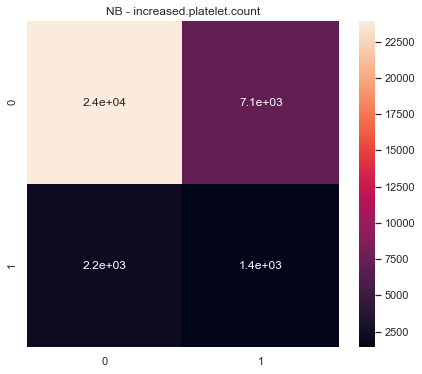

   Fold                       ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.platelet.count  300.0  0.517669      0.532598   
0   2.0  increased.platelet.count  300.0  0.530815      0.562997   
0   3.0  increased.platelet.count  300.0  0.500963      0.537390   
0   4.0  increased.platelet.count  300.0  0.516719      0.543651   
0   5.0  increased.platelet.count  300.0  0.516735      0.541919   

   Precision Macro  ROC Macro  
0         0.520011   0.575089  
0         0.534130   0.582046  
0         0.517731   0.573797  
0         0.523413   0.571107  
0         0.522820   0.568592  



                        ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  increased.platelet.count  300.0  2.582901    2.718554       2.618105   

   Avg ROC  
0  2.87063  
================================== DT ==================================


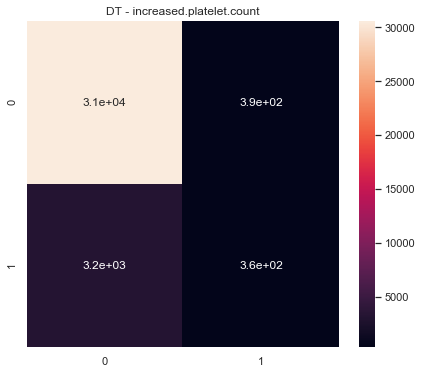

   Fold                       ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.platelet.count  300.0  0.495196      0.506019   
0   2.0  increased.platelet.count  300.0  0.479307      0.488854   
0   3.0  increased.platelet.count  300.0  0.464070      0.475877   
0   4.0  increased.platelet.count  300.0  0.482806      0.492921   
0   5.0  increased.platelet.count  300.0  0.489857      0.503162   

   Precision Macro  ROC Macro  
0         0.526608   0.510233  
0         0.476756   0.506868  
0         0.454382   0.487533  
0         0.483166   0.489254  
0         0.515294   0.536677  



                        ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  increased.platelet.count  300.0  2.411236    2.466833       2.456206   

    Avg ROC  
0  2.530565  
================================== RF ==================================


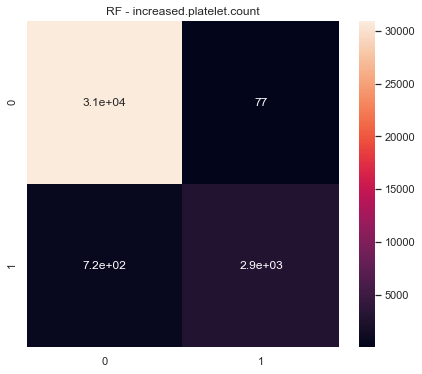

   Fold                       ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.platelet.count  300.0  0.472720      0.499919   
0   2.0  increased.platelet.count  300.0  0.470173      0.494835   
0   3.0  increased.platelet.count  300.0  0.459903      0.474822   
0   4.0  increased.platelet.count  300.0  0.472358      0.499274   
0   5.0  increased.platelet.count  300.0  0.472756      0.500000   

   Precision Macro  ROC Macro  
0         0.448328   0.572426  
0         0.447853   0.544713  
0         0.445893   0.466873  
0         0.448196   0.480927  
0         0.448328   0.575991  



                        ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  increased.platelet.count  300.0  2.347911    2.468851       2.238598   

    Avg ROC  
0  2.640929  
================================== SGD ==================================


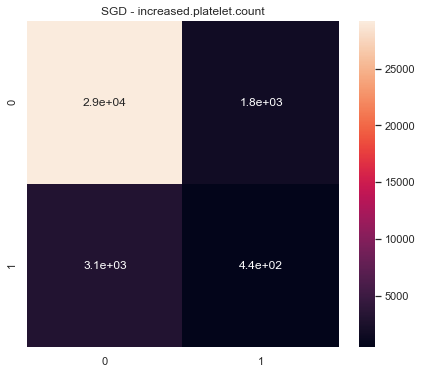

   Fold                       ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.platelet.count  300.0  0.489203      0.488822   
0   2.0  increased.platelet.count  300.0  0.514463      0.514098   
0   3.0  increased.platelet.count  300.0  0.456290      0.461299   
0   4.0  increased.platelet.count  300.0  0.469722      0.472850   
0   5.0  increased.platelet.count  300.0  0.494134      0.494186   

   Precision Macro  ROC Macro  
0         0.490351   0.519773  
0         0.522144   0.447936  
0         0.451617   0.428887  
0         0.467141   0.450486  
0         0.494091   0.500562  



                        ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  increased.platelet.count  300.0  2.423812    2.431256       2.425344   

    Avg ROC  
0  2.347643  
================================== LR ==================================


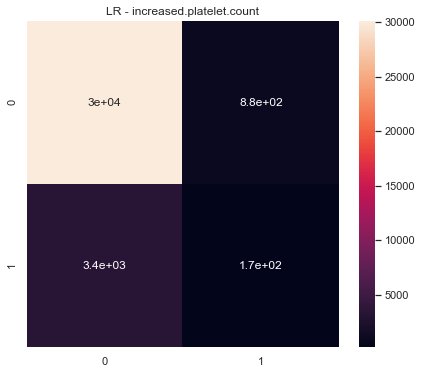

   Fold                       ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.platelet.count  300.0  0.534163      0.557298   
0   2.0  increased.platelet.count  300.0  0.526514      0.524340   
0   3.0  increased.platelet.count  300.0  0.495734      0.501460   
0   4.0  increased.platelet.count  300.0  0.488430      0.488067   
0   5.0  increased.platelet.count  300.0  0.508598      0.510008   

   Precision Macro  ROC Macro  
0         0.534116   0.580834  
0         0.532349   0.537540  
0         0.500936   0.509199  
0         0.490154   0.487587  
0         0.508484   0.526780  



                        ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  increased.platelet.count  300.0  2.553438    2.581172       2.566039   

    Avg ROC  
0  2.641939  
================================== increased.white.blood.cell.count ==================================
================================== NB ==================================


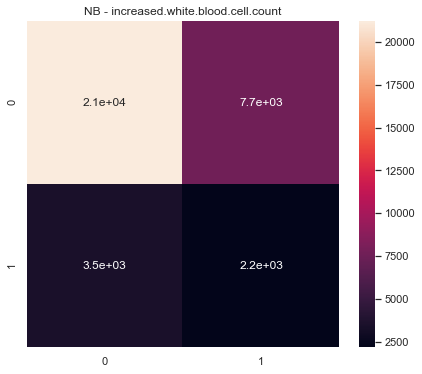

   Fold                               ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.white.blood.cell.count  300.0  0.513521      0.525861   
0   2.0  increased.white.blood.cell.count  300.0  0.502576      0.516907   
0   3.0  increased.white.blood.cell.count  300.0  0.478472      0.495632   
0   4.0  increased.white.blood.cell.count  300.0  0.488812      0.498675   
0   5.0  increased.white.blood.cell.count  300.0  0.511898      0.515884   

   Precision Macro  ROC Macro  
0         0.518241   0.543984  
0         0.511369   0.538916  
0         0.497279   0.496964  
0         0.499102   0.502394  
0         0.512848   0.547739  



                                ADR    PCA   Avg F1  Avg Recall  \
0  increased.white.blood.cell.count  300.0  2.49528     2.55296   

   Avg Precision   Avg ROC  
0       2.538839  2.629997  
================================== DT ==================================


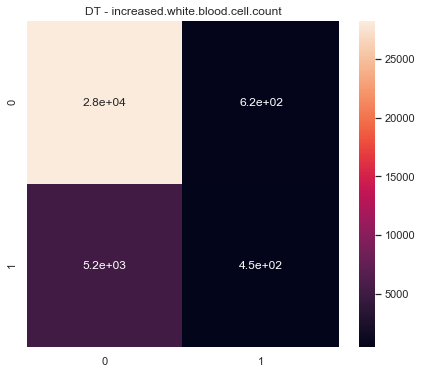

   Fold                               ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.white.blood.cell.count  300.0  0.476034      0.496194   
0   2.0  increased.white.blood.cell.count  300.0  0.457669      0.473870   
0   3.0  increased.white.blood.cell.count  300.0  0.423853      0.437635   
0   4.0  increased.white.blood.cell.count  300.0  0.447044      0.462297   
0   5.0  increased.white.blood.cell.count  300.0  0.475158      0.504071   

   Precision Macro  ROC Macro  
0         0.488241   0.515607  
0         0.450368   0.486343  
0         0.411207   0.422082  
0         0.436682   0.418720  
0         0.529254   0.502411  



                                ADR    PCA    Avg F1  Avg Recall  \
0  increased.white.blood.cell.count  300.0  2.279757    2.374066   

   Avg Precision   Avg ROC  
0       2.315752  2.345164  
================================== RF ==================================


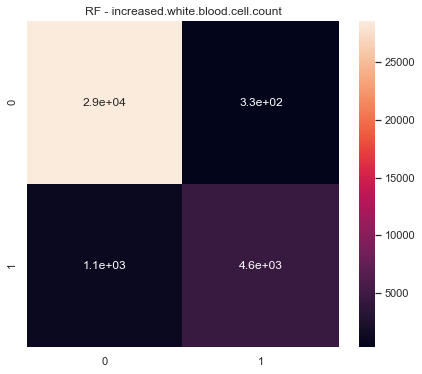

   Fold                               ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.white.blood.cell.count  300.0  0.453280      0.496361   
0   2.0  increased.white.blood.cell.count  300.0  0.452430      0.472501   
0   3.0  increased.white.blood.cell.count  300.0  0.420291      0.433026   
0   4.0  increased.white.blood.cell.count  300.0  0.438120      0.466898   
0   5.0  increased.white.blood.cell.count  300.0  0.455040      0.499913   

   Precision Macro  ROC Macro  
0         0.417079   0.554889  
0         0.441506   0.478474  
0         0.408376   0.412198  
0         0.412684   0.384368  
0         0.417559   0.482686  



                                ADR    PCA   Avg F1  Avg Recall  \
0  increased.white.blood.cell.count  300.0  2.21916    2.368699   

   Avg Precision   Avg ROC  
0       2.097204  2.312615  
================================== SGD ==================================


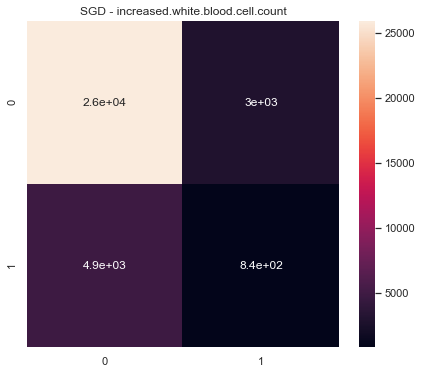

   Fold                               ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.white.blood.cell.count  300.0  0.460279      0.465281   
0   2.0  increased.white.blood.cell.count  300.0  0.481375      0.482434   
0   3.0  increased.white.blood.cell.count  300.0  0.438277      0.440354   
0   4.0  increased.white.blood.cell.count  300.0  0.426360      0.428544   
0   5.0  increased.white.blood.cell.count  300.0  0.478855      0.479950   

   Precision Macro  ROC Macro  
0         0.456992   0.423865  
0         0.480783   0.438834  
0         0.436335   0.393329  
0         0.424260   0.437253  
0         0.478170   0.474120  



                                ADR    PCA    Avg F1  Avg Recall  \
0  increased.white.blood.cell.count  300.0  2.285146    2.296563   

   Avg Precision  Avg ROC  
0       2.276541   2.1674  
================================== LR ==================================


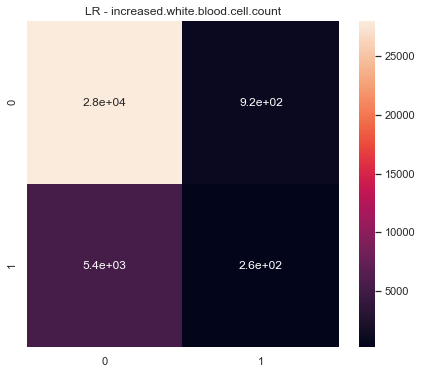

   Fold                               ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  increased.white.blood.cell.count  300.0  0.530206      0.528638   
0   2.0  increased.white.blood.cell.count  300.0  0.472493      0.478967   
0   3.0  increased.white.blood.cell.count  300.0  0.443904      0.439429   
0   4.0  increased.white.blood.cell.count  300.0  0.457183      0.456168   
0   5.0  increased.white.blood.cell.count  300.0  0.471178      0.488067   

   Precision Macro  ROC Macro  
0         0.538099   0.547774  
0         0.470536   0.450108  
0         0.454782   0.452431  
0         0.458333   0.418967  
0         0.472506   0.472003  



                                ADR    PCA    Avg F1  Avg Recall  \
0  increased.white.blood.cell.count  300.0  2.374963     2.39127   

   Avg Precision   Avg ROC  
0       2.394255  2.341282  
================================== infection ==================================
================================== NB ==================================


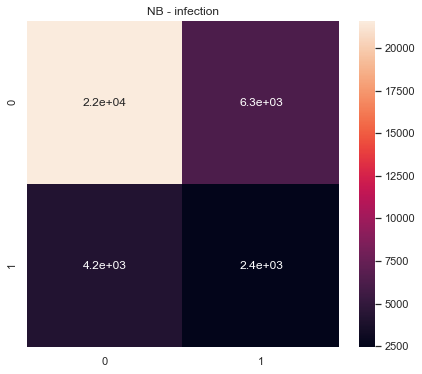

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  infection  300.0  0.532589      0.533792         0.531857   0.562992
0   2.0  infection  300.0  0.521002      0.525486         0.521334   0.538747
0   3.0  infection  300.0  0.538908      0.544443         0.537728   0.575761
0   4.0  infection  300.0  0.544852      0.548184         0.543285   0.579390
0   5.0  infection  300.0  0.526933      0.526850         0.527021   0.562332



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  infection  300.0  2.664284    2.678755       2.661225  2.819222
================================== DT ==================================


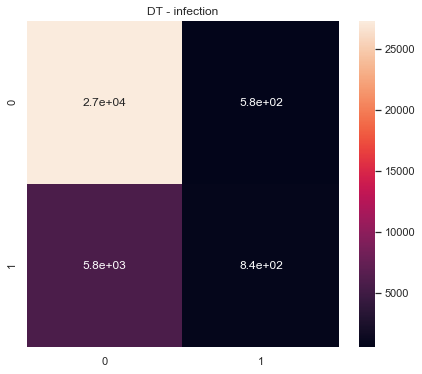

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  infection  300.0  0.495697      0.513210         0.542607   0.575157
0   2.0  infection  300.0  0.493858      0.512334         0.541002   0.524484
0   3.0  infection  300.0  0.474531      0.499379         0.497900   0.561676
0   4.0  infection  300.0  0.485203      0.508351         0.532194   0.569564
0   5.0  infection  300.0  0.477085      0.502260         0.508279   0.563394



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  infection  300.0  2.426374    2.535534       2.621981  2.794275
================================== RF ==================================


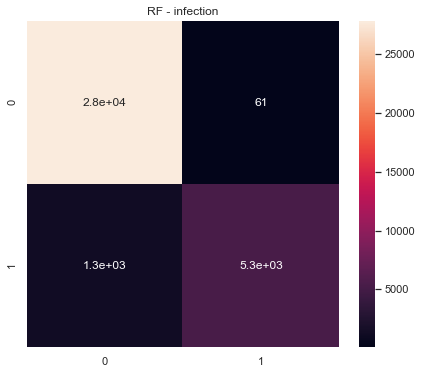

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  infection  300.0  0.451568      0.501465         0.578919   0.584859
0   2.0  infection  300.0  0.451680      0.499617         0.491866   0.564633
0   3.0  infection  300.0  0.448547      0.493002         0.441043   0.566581
0   4.0  infection  300.0  0.452913      0.501857         0.577057   0.563490
0   5.0  infection  300.0  0.450834      0.494396         0.452788   0.580710



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  infection  300.0  2.255543    2.490337       2.541672  2.860273
================================== SGD ==================================


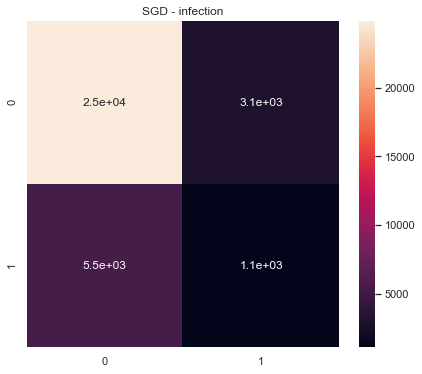

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  infection  300.0  0.471223      0.479531         0.470220   0.484668
0   2.0  infection  300.0  0.486452      0.492073         0.488709   0.460189
0   3.0  infection  300.0  0.467010      0.484473         0.468248   0.459130
0   4.0  infection  300.0  0.481629      0.490244         0.484554   0.513634
0   5.0  infection  300.0  0.494157      0.495405         0.494681   0.475973



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  infection  300.0  2.400472    2.441726       2.406411  2.393594
================================== LR ==================================


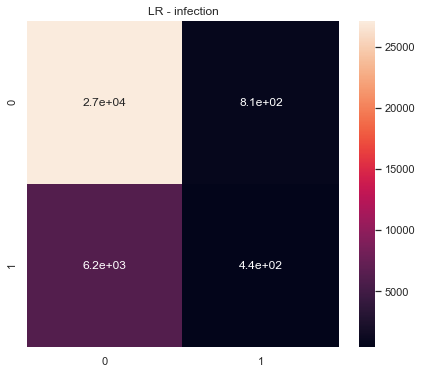

   Fold        ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  infection  300.0  0.510234      0.510875         0.513376   0.527939
0   2.0  infection  300.0  0.527921      0.529718         0.553497   0.547877
0   3.0  infection  300.0  0.532924      0.531914         0.534792   0.563927
0   4.0  infection  300.0  0.501639      0.505714         0.508461   0.553589
0   5.0  infection  300.0  0.491307      0.505326         0.512432   0.504026



         ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  infection  300.0  2.564025    2.583547       2.622558  2.697358
================================== insomnia ==================================
================================== NB ==================================


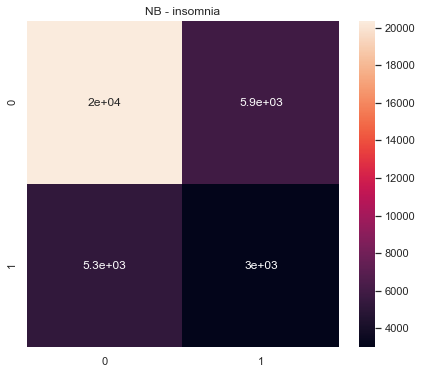

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  insomnia  300.0  0.543494      0.542247         0.546125   0.587503
0   2.0  insomnia  300.0  0.539344      0.542309         0.538508   0.562504
0   3.0  insomnia  300.0  0.534773      0.539178         0.534499   0.560154
0   4.0  insomnia  300.0  0.535003      0.535192         0.534835   0.553033
0   5.0  insomnia  300.0  0.529778      0.529084         0.532717   0.553937



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  insomnia  300.0  2.682392     2.68801       2.686685  2.81713
================================== DT ==================================


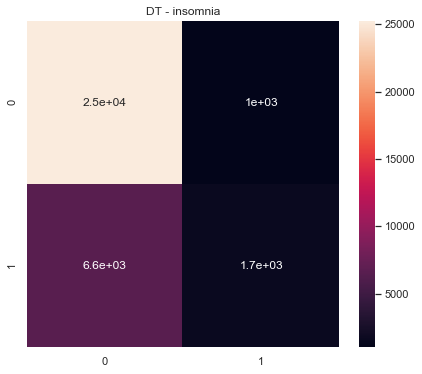

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  insomnia  300.0  0.495593      0.517915         0.554067   0.568188
0   2.0  insomnia  300.0  0.494325      0.515064         0.540818   0.518849
0   3.0  insomnia  300.0  0.497697      0.513318         0.529206   0.569145
0   4.0  insomnia  300.0  0.502009      0.518305         0.543741   0.559224
0   5.0  insomnia  300.0  0.503036      0.524149         0.577424   0.557909



        ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  insomnia  300.0  2.49266    2.588751       2.745256  2.773316
================================== RF ==================================


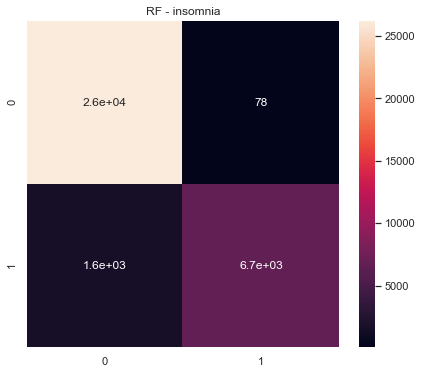

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  insomnia  300.0  0.450200      0.505967         0.601273   0.610292
0   2.0  insomnia  300.0  0.442526      0.504007         0.653635   0.615004
0   3.0  insomnia  300.0  0.447696      0.495108         0.472868   0.598811
0   4.0  insomnia  300.0  0.440528      0.496756         0.467960   0.569625
0   5.0  insomnia  300.0  0.444406      0.503423         0.572452   0.609167



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  insomnia  300.0  2.225356    2.505261       2.768188   3.0029
================================== SGD ==================================


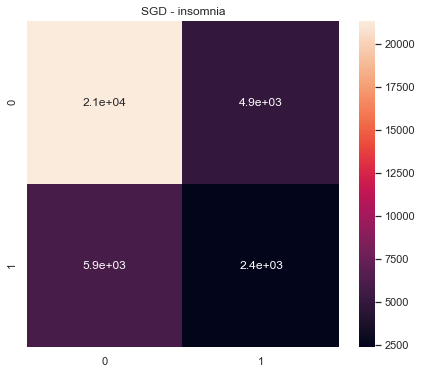

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  insomnia  300.0  0.530362      0.531375         0.543886   0.570615
0   2.0  insomnia  300.0  0.514959      0.515019         0.514908   0.517781
0   3.0  insomnia  300.0  0.533951      0.533184         0.539897   0.524068
0   4.0  insomnia  300.0  0.490327      0.492723         0.491391   0.473317
0   5.0  insomnia  300.0  0.526457      0.527633         0.537646   0.539092



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  insomnia  300.0  2.596056    2.599933       2.627728  2.624872
================================== LR ==================================


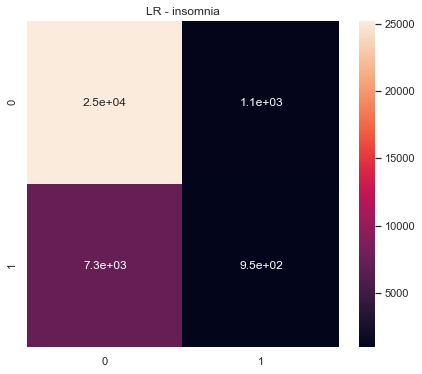

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  insomnia  300.0  0.516239      0.529556         0.573638   0.599218
0   2.0  insomnia  300.0  0.502348      0.509737         0.515373   0.513524
0   3.0  insomnia  300.0  0.511850      0.517269         0.526749   0.516617
0   4.0  insomnia  300.0  0.495808      0.505247         0.508615   0.518795
0   5.0  insomnia  300.0  0.490699      0.513275         0.537567   0.583216



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  insomnia  300.0  2.516944    2.575084       2.661942  2.73137
================================== itch ==================================
================================== NB ==================================


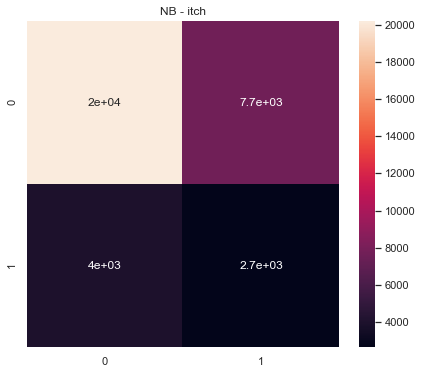

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  itch  300.0  0.519871      0.528937         0.522404   0.552165
0   2.0  itch  300.0  0.522303      0.526222         0.522304   0.560204
0   3.0  itch  300.0  0.496837      0.516390         0.511182   0.529256
0   4.0  itch  300.0  0.523737      0.527460         0.523541   0.550637
0   5.0  itch  300.0  0.528760      0.534601         0.528660   0.561433



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  itch  300.0  2.591508     2.63361        2.60809  2.753695
================================== DT ==================================


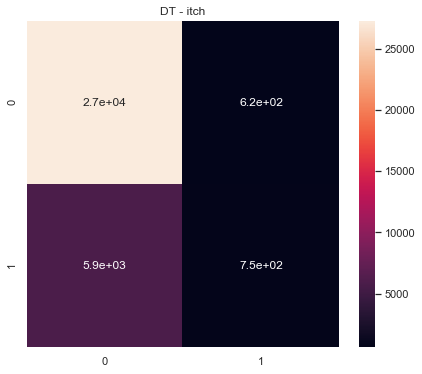

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  itch  300.0  0.473349      0.494462         0.485384   0.493688
0   2.0  itch  300.0  0.457366      0.485630         0.456734   0.509397
0   3.0  itch  300.0  0.445690      0.477803         0.432151   0.479546
0   4.0  itch  300.0  0.470336      0.498453         0.494047   0.507987
0   5.0  itch  300.0  0.479260      0.506039         0.526555   0.523191



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  itch  300.0  2.326001    2.462387       2.394872  2.513809
================================== RF ==================================


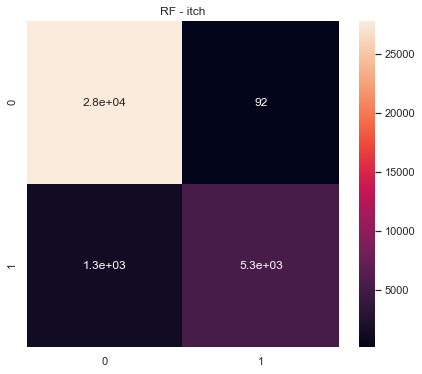

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  itch  300.0  0.447785      0.499943         0.494446   0.553479
0   2.0  itch  300.0  0.441018      0.487734         0.405117   0.522522
0   3.0  itch  300.0  0.437313      0.477832         0.407418   0.485255
0   4.0  itch  300.0  0.454639      0.501200         0.524104   0.487593
0   5.0  itch  300.0  0.447958      0.500302         0.546436   0.534013



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  itch  300.0  2.228714    2.467011        2.37752  2.582863
================================== SGD ==================================


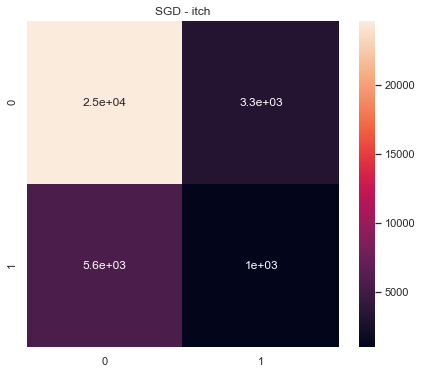

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  itch  300.0  0.471331      0.470753         0.472110   0.434830
0   2.0  itch  300.0  0.474411      0.483801         0.474870   0.481260
0   3.0  itch  300.0  0.454219      0.476039         0.448390   0.422843
0   4.0  itch  300.0  0.486405      0.495963         0.493035   0.499999
0   5.0  itch  300.0  0.507517      0.508941         0.511556   0.503093



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  itch  300.0  2.393883    2.435498       2.399961  2.342026
================================== LR ==================================


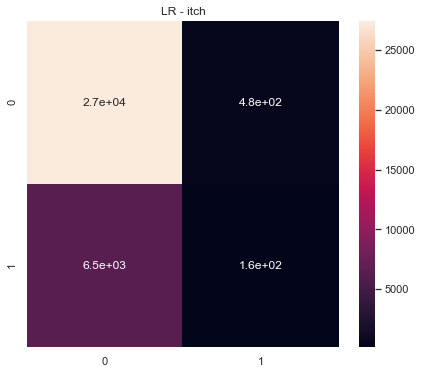

   Fold   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  itch  300.0  0.490685      0.505479         0.513249   0.525012
0   2.0  itch  300.0  0.453749      0.472658         0.447573   0.489814
0   3.0  itch  300.0  0.484670      0.494569         0.490629   0.481981
0   4.0  itch  300.0  0.459887      0.503036         0.544023   0.541208
0   5.0  itch  300.0  0.500704      0.504014         0.505607   0.525707



    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  itch  300.0  2.389695    2.479756       2.501081  2.563722
================================== joint.swelling ==================================
================================== NB ==================================


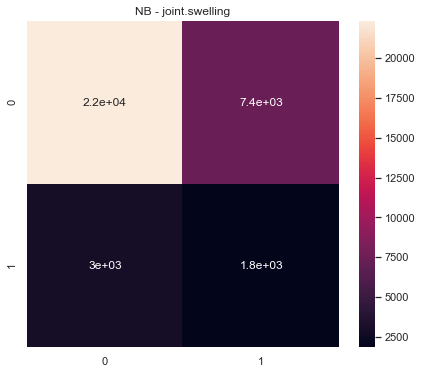

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  joint.swelling  300.0  0.529852      0.547611         0.531725   
0   2.0  joint.swelling  300.0  0.529429      0.553247         0.533540   
0   3.0  joint.swelling  300.0  0.505571      0.536555         0.520738   
0   4.0  joint.swelling  300.0  0.526599      0.536182         0.526613   
0   5.0  joint.swelling  300.0  0.517027      0.528918         0.519876   

   ROC Macro  
0   0.573679  
0   0.580128  
0   0.561568  
0   0.567805  
0   0.571350  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  joint.swelling  300.0  2.608479    2.702514       2.632493  2.85453
================================== DT ==================================


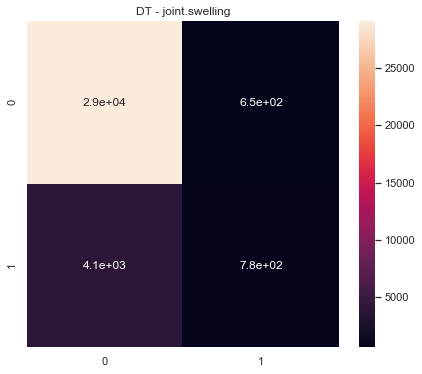

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  joint.swelling  300.0  0.510270      0.517000         0.550722   
0   2.0  joint.swelling  300.0  0.485317      0.496363         0.491833   
0   3.0  joint.swelling  300.0  0.484572      0.495847         0.490651   
0   4.0  joint.swelling  300.0  0.505379      0.511285         0.525712   
0   5.0  joint.swelling  300.0  0.496198      0.508026         0.525820   

   ROC Macro  
0   0.525831  
0   0.486922  
0   0.536125  
0   0.513516  
0   0.523914  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  joint.swelling  300.0  2.481735    2.528521       2.584737  2.586308
================================== RF ==================================


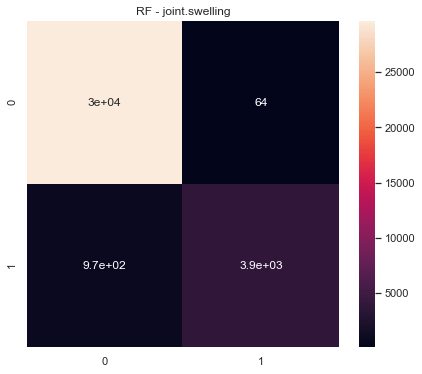

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  joint.swelling  300.0  0.463022      0.499676         0.475444   
0   2.0  joint.swelling  300.0  0.462340      0.500000         0.429957   
0   3.0  joint.swelling  300.0  0.450977      0.477617         0.427152   
0   4.0  joint.swelling  300.0  0.461603      0.496982         0.441219   
0   5.0  joint.swelling  300.0  0.464337      0.500698         0.596770   

   ROC Macro  
0   0.576469  
0   0.574246  
0   0.512118  
0   0.482544  
0   0.581147  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  joint.swelling  300.0  2.302279    2.474973       2.370542  2.726524
================================== SGD ==================================


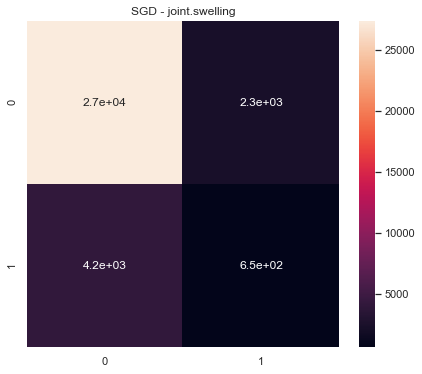

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  joint.swelling  300.0  0.472973      0.481082         0.470154   
0   2.0  joint.swelling  300.0  0.496028      0.499078         0.498663   
0   3.0  joint.swelling  300.0  0.467413      0.465751         0.469795   
0   4.0  joint.swelling  300.0  0.472695      0.488905         0.471902   
0   5.0  joint.swelling  300.0  0.480834      0.484012         0.479708   

   ROC Macro  
0   0.468109  
0   0.485997  
0   0.452044  
0   0.474488  
0   0.439922  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  joint.swelling  300.0  2.389942    2.418829       2.390223  2.32056
================================== LR ==================================


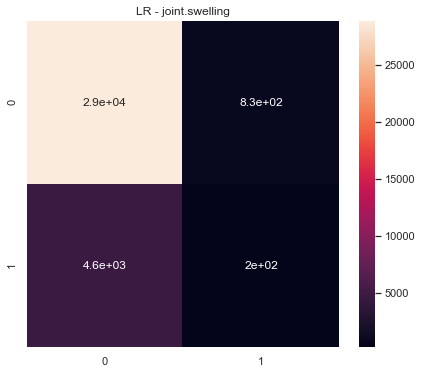

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  joint.swelling  300.0  0.527405      0.530461         0.526245   
0   2.0  joint.swelling  300.0  0.496123      0.510863         0.550220   
0   3.0  joint.swelling  300.0  0.491151      0.496028         0.497227   
0   4.0  joint.swelling  300.0  0.501254      0.501323         0.501409   
0   5.0  joint.swelling  300.0  0.494834      0.495114         0.494780   

   ROC Macro  
0   0.559303  
0   0.524438  
0   0.501271  
0   0.470309  
0   0.513905  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  joint.swelling  300.0  2.510767    2.533788       2.569881  2.569227
================================== kidney.failure ==================================
================================== NB ==================================


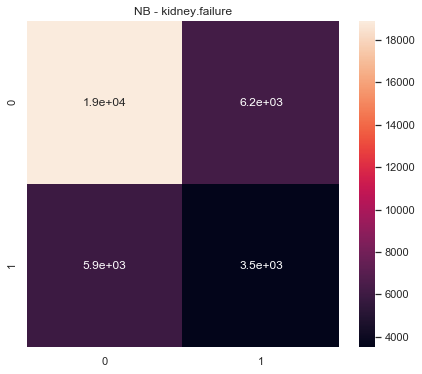

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  kidney.failure  300.0  0.526353      0.526198         0.526555   
0   2.0  kidney.failure  300.0  0.512775      0.512719         0.513328   
0   3.0  kidney.failure  300.0  0.489904      0.491799         0.490720   
0   4.0  kidney.failure  300.0  0.531555      0.531205         0.532114   
0   5.0  kidney.failure  300.0  0.535592      0.535133         0.541027   

   ROC Macro  
0   0.540127  
0   0.519862  
0   0.519843  
0   0.539147  
0   0.556984  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  kidney.failure  300.0  2.596178    2.597054       2.603743  2.675963
================================== DT ==================================


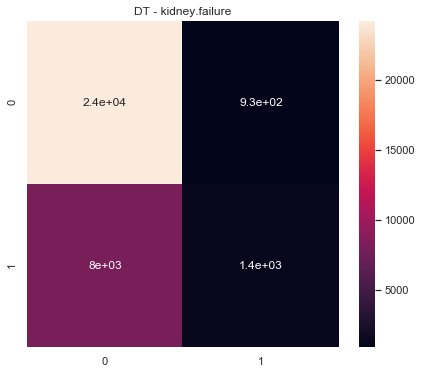

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  kidney.failure  300.0  0.463503      0.503318         0.511867   
0   2.0  kidney.failure  300.0  0.480195      0.502448         0.505174   
0   3.0  kidney.failure  300.0  0.466627      0.488189         0.477775   
0   4.0  kidney.failure  300.0  0.463977      0.506764         0.528424   
0   5.0  kidney.failure  300.0  0.461162      0.507371         0.535975   

   ROC Macro  
0   0.518105  
0   0.516849  
0   0.511756  
0   0.527218  
0   0.529128  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  kidney.failure  300.0  2.335464     2.50809       2.559216  2.603056
================================== RF ==================================


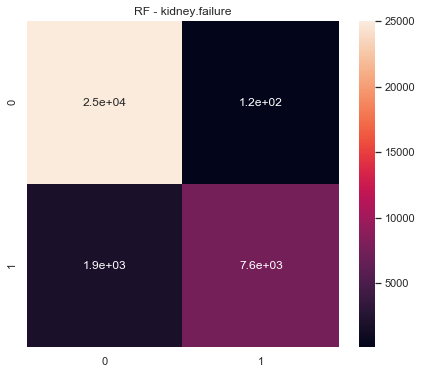

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  kidney.failure  300.0  0.432576      0.502792         0.564307   
0   2.0  kidney.failure  300.0  0.425891      0.500964         0.549125   
0   3.0  kidney.failure  300.0  0.430707      0.474062         0.426755   
0   4.0  kidney.failure  300.0  0.429964      0.500934         0.520185   
0   5.0  kidney.failure  300.0  0.433777      0.502068         0.534947   

   ROC Macro  
0   0.569676  
0   0.559203  
0   0.542528  
0   0.558990  
0   0.568043  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  kidney.failure  300.0  2.152914    2.480821       2.595319  2.798439
================================== SGD ==================================


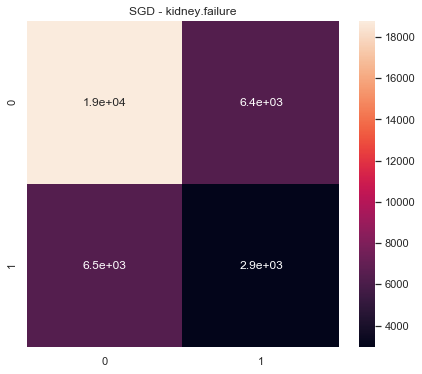

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  kidney.failure  300.0  0.486166      0.488150         0.486657   
0   2.0  kidney.failure  300.0  0.510997      0.510932         0.511198   
0   3.0  kidney.failure  300.0  0.499815      0.500141         0.500149   
0   4.0  kidney.failure  300.0  0.497504      0.497501         0.497518   
0   5.0  kidney.failure  300.0  0.513682      0.516438         0.514785   

   ROC Macro  
0   0.493726  
0   0.508039  
0   0.498467  
0   0.492020  
0   0.524684  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  kidney.failure  300.0  2.508162    2.513162       2.510307  2.516936
================================== LR ==================================


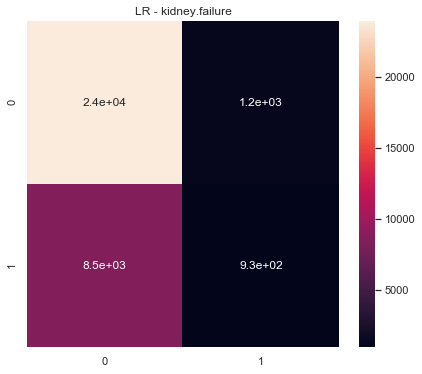

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  kidney.failure  300.0  0.498468      0.507321         0.511048   
0   2.0  kidney.failure  300.0  0.484143      0.502654         0.505085   
0   3.0  kidney.failure  300.0  0.486884      0.492476         0.490325   
0   4.0  kidney.failure  300.0  0.494241      0.507872         0.513673   
0   5.0  kidney.failure  300.0  0.496427      0.506663         0.510435   

   ROC Macro  
0   0.539453  
0   0.528959  
0   0.512884  
0   0.514367  
0   0.543784  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  kidney.failure  300.0  2.460163    2.516986       2.530566  2.639447
================================== leucocytosis ==================================
================================== NB ==================================


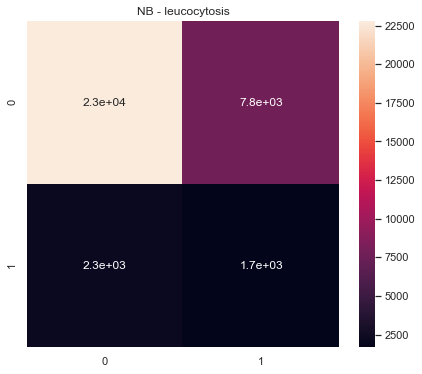

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  leucocytosis  300.0  0.523503      0.556307         0.530676   
0   2.0  leucocytosis  300.0  0.533814      0.562943         0.536384   
0   3.0  leucocytosis  300.0  0.522846      0.560565         0.531941   
0   4.0  leucocytosis  300.0  0.499314      0.524891         0.513161   
0   5.0  leucocytosis  300.0  0.519000      0.542139         0.524376   

   ROC Macro  
0   0.593532  
0   0.594271  
0   0.606324  
0   0.547763  
0   0.601500  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucocytosis  300.0  2.598477    2.746845       2.636538  2.943391
================================== DT ==================================


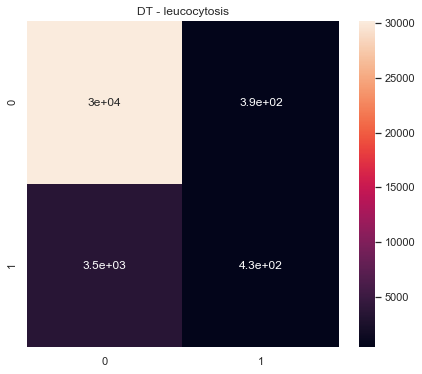

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  leucocytosis  300.0  0.516535      0.519974         0.572709   
0   2.0  leucocytosis  300.0  0.502479      0.512471         0.562652   
0   3.0  leucocytosis  300.0  0.485875      0.488739         0.485113   
0   4.0  leucocytosis  300.0  0.498573      0.509333         0.541009   
0   5.0  leucocytosis  300.0  0.502248      0.511738         0.552457   

   ROC Macro  
0   0.571552  
0   0.550022  
0   0.537310  
0   0.548560  
0   0.557464  



            ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucocytosis  300.0  2.50571    2.542255        2.71394  2.764909
================================== RF ==================================


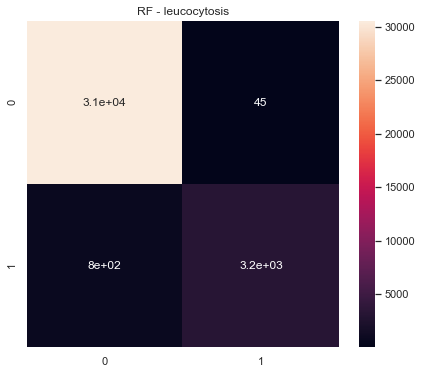

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  leucocytosis  300.0  0.469482      0.500000         0.442475   
0   2.0  leucocytosis  300.0  0.469482      0.500000         0.442475   
0   3.0  leucocytosis  300.0  0.462679      0.485093         0.443532   
0   4.0  leucocytosis  300.0  0.469207      0.497604         0.455387   
0   5.0  leucocytosis  300.0  0.469518      0.500000         0.442539   

   ROC Macro  
0   0.600420  
0   0.605430  
0   0.521521  
0   0.515058  
0   0.584990  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucocytosis  300.0  2.340367    2.482697       2.226407  2.827418
================================== SGD ==================================


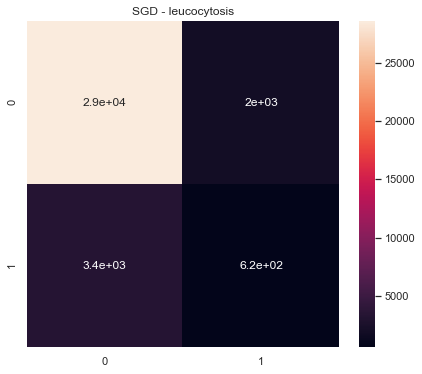

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  leucocytosis  300.0  0.517757      0.517512         0.518048   
0   2.0  leucocytosis  300.0  0.479260      0.493037         0.480348   
0   3.0  leucocytosis  300.0  0.481563      0.482808         0.480700   
0   4.0  leucocytosis  300.0  0.478568      0.483507         0.476370   
0   5.0  leucocytosis  300.0  0.517680      0.519796         0.516979   

   ROC Macro  
0   0.510249  
0   0.512136  
0   0.442896  
0   0.472020  
0   0.517293  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucocytosis  300.0  2.474829     2.49666       2.472445  2.454595
================================== LR ==================================


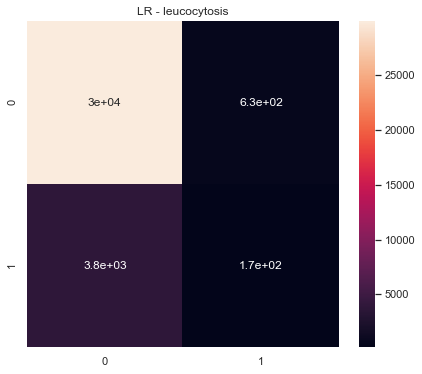

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  leucocytosis  300.0  0.537550      0.534670         0.543282   
0   2.0  leucocytosis  300.0  0.470689      0.500465         0.609189   
0   3.0  leucocytosis  300.0  0.490712      0.497547         0.498464   
0   4.0  leucocytosis  300.0  0.496311      0.496670         0.496322   
0   5.0  leucocytosis  300.0  0.510059      0.509839         0.512111   

   ROC Macro  
0   0.559107  
0   0.567841  
0   0.527461  
0   0.520865  
0   0.547437  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucocytosis  300.0  2.505321    2.539191       2.659368  2.722712
================================== leucopenia ==================================
================================== NB ==================================


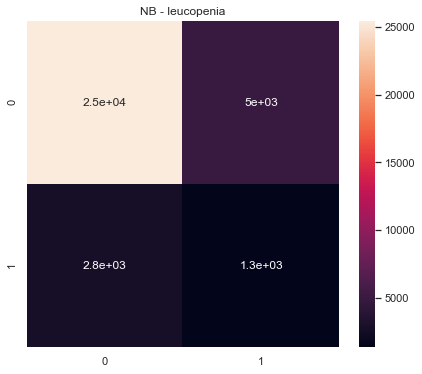

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  leucopenia  300.0  0.512244      0.520230         0.514078   0.553916
0   2.0  leucopenia  300.0  0.514468      0.524668         0.516621   0.549808
0   3.0  leucopenia  300.0  0.541198      0.550529         0.538361   0.605196
0   4.0  leucopenia  300.0  0.528431      0.532447         0.526917   0.566577
0   5.0  leucopenia  300.0  0.538076      0.539727         0.536832   0.576283



          ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  leucopenia  300.0  2.634418    2.667601       2.632809  2.85178
================================== DT ==================================


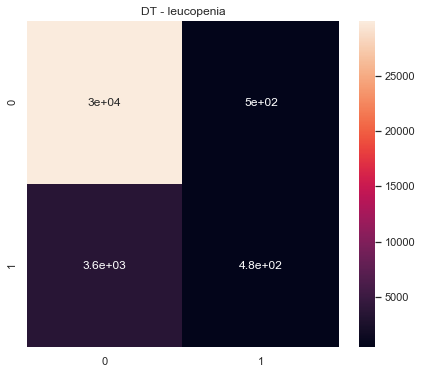

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  leucopenia  300.0  0.496071      0.500398         0.500689   0.520295
0   2.0  leucopenia  300.0  0.486119      0.503213         0.517363   0.534386
0   3.0  leucopenia  300.0  0.483335      0.490013         0.483017   0.518080
0   4.0  leucopenia  300.0  0.484927      0.492710         0.486173   0.498132
0   5.0  leucopenia  300.0  0.492214      0.508565         0.564991   0.567478



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucopenia  300.0  2.442665    2.494898       2.552232  2.638371
================================== RF ==================================


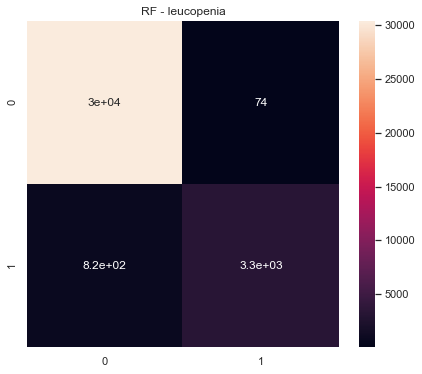

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  leucopenia  300.0  0.460451      0.484473         0.438700   0.571345
0   2.0  leucopenia  300.0  0.469461      0.500442         0.607089   0.541462
0   3.0  leucopenia  300.0  0.462593      0.487215         0.442050   0.538096
0   4.0  leucopenia  300.0  0.468698      0.499045         0.465203   0.490765
0   5.0  leucopenia  300.0  0.468293      0.500000         0.440368   0.566150



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucopenia  300.0  2.329496    2.471175        2.39341  2.707817
================================== SGD ==================================


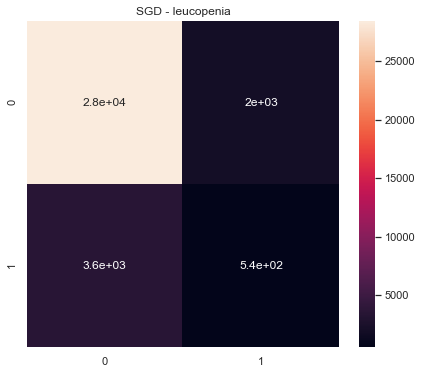

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  leucopenia  300.0  0.504932      0.504864         0.505154   0.446026
0   2.0  leucopenia  300.0  0.484319      0.486343         0.483420   0.510932
0   3.0  leucopenia  300.0  0.490003      0.496169         0.493014   0.529110
0   4.0  leucopenia  300.0  0.474113      0.484287         0.470333   0.479230
0   5.0  leucopenia  300.0  0.512416      0.515733         0.512503   0.530548



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucopenia  300.0  2.465782    2.487396       2.464422  2.495847
================================== LR ==================================


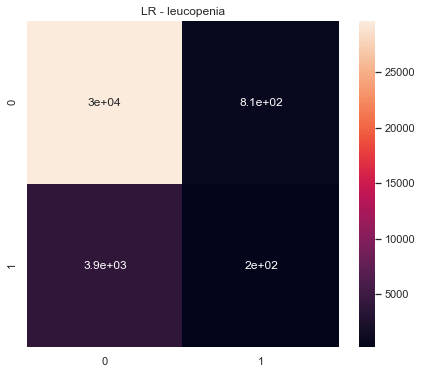

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  leucopenia  300.0  0.499941      0.500514         0.500614   0.516201
0   2.0  leucopenia  300.0  0.526506      0.525342         0.528411   0.532560
0   3.0  leucopenia  300.0  0.495387      0.503672         0.502328   0.539462
0   4.0  leucopenia  300.0  0.502445      0.502749         0.502521   0.529186
0   5.0  leucopenia  300.0  0.526720      0.524778         0.532624   0.552784



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  leucopenia  300.0  2.550999    2.557056       2.566498  2.670193
================================== lipoma ==================================
================================== NB ==================================


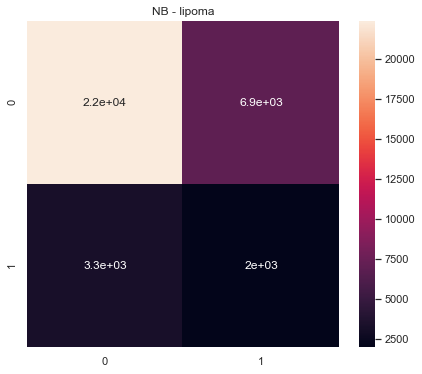

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lipoma  300.0  0.536010      0.549980         0.535995   0.600672
0   2.0  lipoma  300.0  0.521765      0.537598         0.525556   0.553633
0   3.0  lipoma  300.0  0.496552      0.519301         0.511665   0.534888
0   4.0  lipoma  300.0  0.519909      0.527889         0.520958   0.527510
0   5.0  lipoma  300.0  0.524843      0.533768         0.525340   0.557886



      ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lipoma  300.0  2.59908    2.668536       2.619513  2.774589
================================== DT ==================================


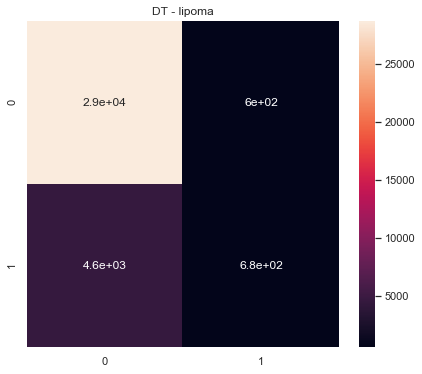

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lipoma  300.0  0.500804      0.511314         0.532559   0.534858
0   2.0  lipoma  300.0  0.478690      0.491557         0.481911   0.528938
0   3.0  lipoma  300.0  0.451997      0.467651         0.441513   0.481915
0   4.0  lipoma  300.0  0.488649      0.502078         0.505606   0.490336
0   5.0  lipoma  300.0  0.470503      0.501946         0.521466   0.508651



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lipoma  300.0  2.390644    2.474546       2.483055  2.544698
================================== RF ==================================


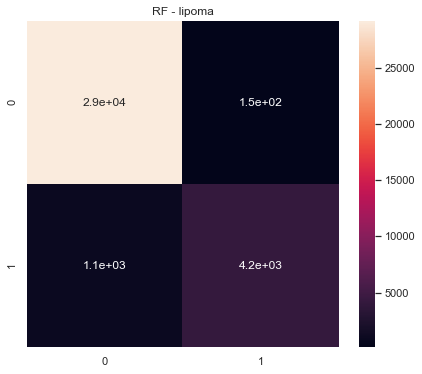

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lipoma  300.0  0.458252      0.499146         0.423551   0.592465
0   2.0  lipoma  300.0  0.455705      0.485004         0.439199   0.564445
0   3.0  lipoma  300.0  0.441168      0.462528         0.422765   0.496432
0   4.0  lipoma  300.0  0.458051      0.494675         0.441257   0.454779
0   5.0  lipoma  300.0  0.460457      0.500606         0.590395   0.571437



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lipoma  300.0  2.273633    2.441959       2.317167  2.679557
================================== SGD ==================================


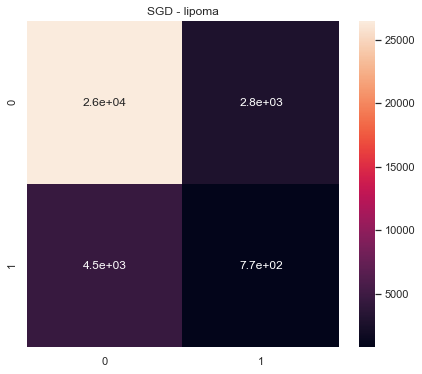

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lipoma  300.0  0.451193      0.459141         0.445178   0.405626
0   2.0  lipoma  300.0  0.488967      0.490540         0.488814   0.434726
0   3.0  lipoma  300.0  0.430147      0.425447         0.435550   0.382958
0   4.0  lipoma  300.0  0.434406      0.435354         0.433479   0.415127
0   5.0  lipoma  300.0  0.463736      0.464626         0.462936   0.437746



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lipoma  300.0  2.268449    2.275108       2.265956  2.076183
================================== LR ==================================


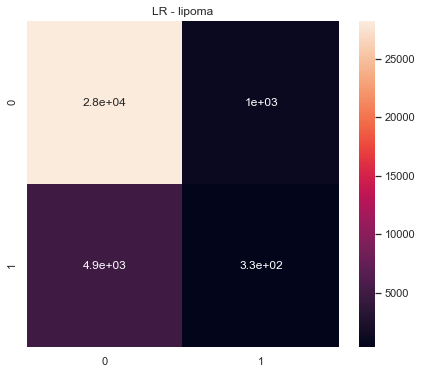

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lipoma  300.0  0.522355      0.521393         0.526918   0.555398
0   2.0  lipoma  300.0  0.456439      0.481908         0.443101   0.470033
0   3.0  lipoma  300.0  0.480754      0.481392         0.485712   0.490590
0   4.0  lipoma  300.0  0.458103      0.456779         0.459639   0.425735
0   5.0  lipoma  300.0  0.513448      0.527252         0.518504   0.500270



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lipoma  300.0  2.431099    2.468725       2.433873  2.442026
================================== lobar.pneumonia ==================================
================================== NB ==================================


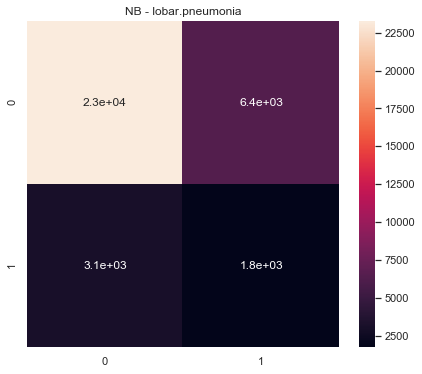

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lobar.pneumonia  300.0  0.532822      0.539958         0.531417   
0   2.0  lobar.pneumonia  300.0  0.525529      0.545018         0.529209   
0   3.0  lobar.pneumonia  300.0  0.514601      0.535411         0.522033   
0   4.0  lobar.pneumonia  300.0  0.534535      0.544309         0.533330   
0   5.0  lobar.pneumonia  300.0  0.522162      0.525882         0.521470   

   ROC Macro  
0   0.584666  
0   0.568647  
0   0.572608  
0   0.566380  
0   0.574023  



               ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lobar.pneumonia  300.0  2.62965    2.690577        2.63746  2.866325
================================== DT ==================================


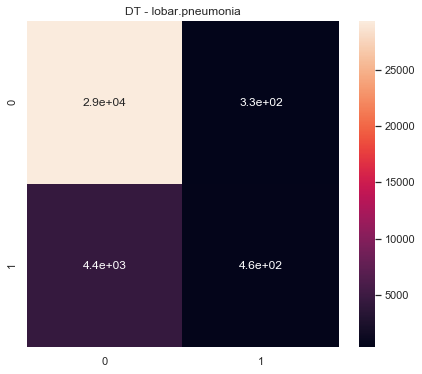

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lobar.pneumonia  300.0  0.492261      0.509363         0.548723   
0   2.0  lobar.pneumonia  300.0  0.482685      0.500461         0.501704   
0   3.0  lobar.pneumonia  300.0  0.486480      0.501599         0.505153   
0   4.0  lobar.pneumonia  300.0  0.498884      0.513098         0.563706   
0   5.0  lobar.pneumonia  300.0  0.482017      0.505223         0.538707   

   ROC Macro  
0   0.544313  
0   0.527808  
0   0.517629  
0   0.559955  
0   0.529352  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lobar.pneumonia  300.0  2.442326    2.529743       2.657993  2.679056
================================== RF ==================================


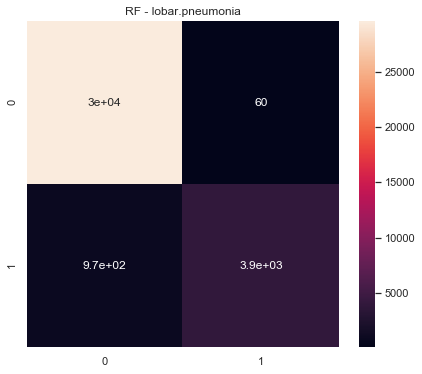

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lobar.pneumonia  300.0  0.468642      0.502322         0.588751   
0   2.0  lobar.pneumonia  300.0  0.469068      0.496540         0.477749   
0   3.0  lobar.pneumonia  300.0  0.459977      0.493186         0.438993   
0   4.0  lobar.pneumonia  300.0  0.459832      0.494275         0.435269   
0   5.0  lobar.pneumonia  300.0  0.463016      0.500428         0.679419   

   ROC Macro  
0   0.586154  
0   0.564374  
0   0.551419  
0   0.522425  
0   0.592510  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lobar.pneumonia  300.0  2.320536    2.486752       2.620182  2.816881
================================== SGD ==================================


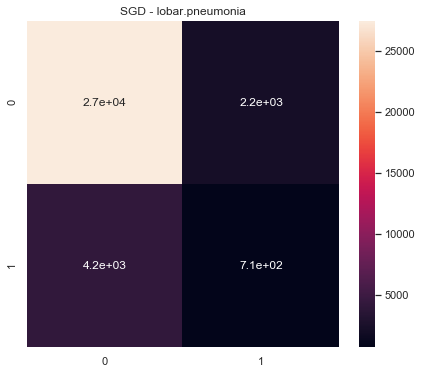

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lobar.pneumonia  300.0  0.503978      0.505736         0.508198   
0   2.0  lobar.pneumonia  300.0  0.496199      0.499846         0.499766   
0   3.0  lobar.pneumonia  300.0  0.487580      0.490817         0.487692   
0   4.0  lobar.pneumonia  300.0  0.457728      0.473492         0.447790   
0   5.0  lobar.pneumonia  300.0  0.492068      0.493424         0.492149   

   ROC Macro  
0   0.511489  
0   0.440755  
0   0.436191  
0   0.464386  
0   0.513570  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lobar.pneumonia  300.0  2.437554    2.463315       2.435594  2.366392
================================== LR ==================================


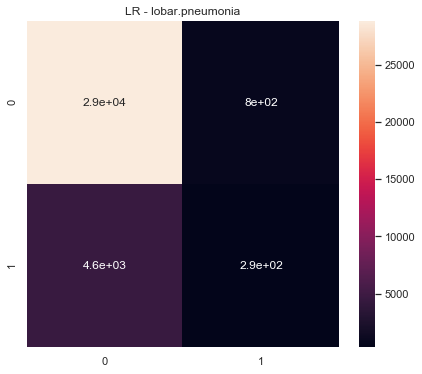

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lobar.pneumonia  300.0  0.540638      0.540743         0.540535   
0   2.0  lobar.pneumonia  300.0  0.500047      0.508729         0.522525   
0   3.0  lobar.pneumonia  300.0  0.504659      0.511618         0.508287   
0   4.0  lobar.pneumonia  300.0  0.498431      0.500432         0.500584   
0   5.0  lobar.pneumonia  300.0  0.503457      0.504284         0.505421   

   ROC Macro  
0   0.577060  
0   0.507381  
0   0.499714  
0   0.518928  
0   0.527480  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lobar.pneumonia  300.0  2.547233    2.565806       2.577354  2.630563
================================== loss.of.consciousness ==================================
================================== NB ==================================


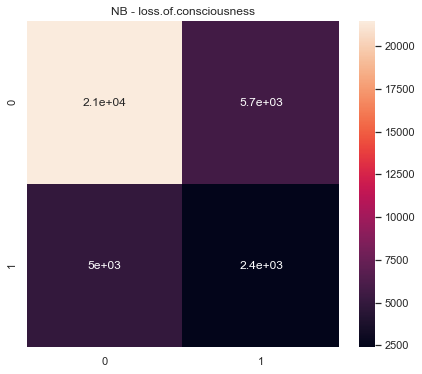

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  loss.of.consciousness  300.0  0.532513      0.532207   
0   2.0  loss.of.consciousness  300.0  0.511641      0.511520   
0   3.0  loss.of.consciousness  300.0  0.514522      0.515521   
0   4.0  loss.of.consciousness  300.0  0.521221      0.521562   
0   5.0  loss.of.consciousness  300.0  0.525795      0.525391   

   Precision Macro  ROC Macro  
0         0.532882   0.558743  
0         0.512314   0.505762  
0         0.514398   0.527436  
0         0.520988   0.535512  
0         0.531424   0.550791  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.consciousness  300.0  2.605692    2.606201       2.612006  2.678243
================================== DT ==================================


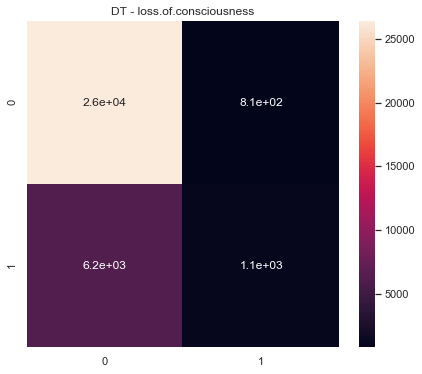

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  loss.of.consciousness  300.0  0.474222      0.504101   
0   2.0  loss.of.consciousness  300.0  0.479347      0.498715   
0   3.0  loss.of.consciousness  300.0  0.456397      0.480595   
0   4.0  loss.of.consciousness  300.0  0.482679      0.505704   
0   5.0  loss.of.consciousness  300.0  0.489569      0.507299   

   Precision Macro  ROC Macro  
0         0.516391   0.519732  
0         0.496939   0.496337  
0         0.455910   0.515326  
0         0.517404   0.529752  
0         0.518416   0.522092  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.consciousness  300.0  2.382214    2.496415       2.505059  2.583238
================================== RF ==================================


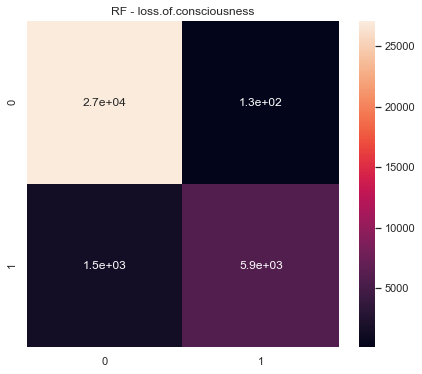

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  loss.of.consciousness  300.0  0.442069      0.500008   
0   2.0  loss.of.consciousness  300.0  0.453314      0.496564   
0   3.0  loss.of.consciousness  300.0  0.423465      0.464340   
0   4.0  loss.of.consciousness  300.0  0.442948      0.497691   
0   5.0  loss.of.consciousness  300.0  0.441825      0.499458   

   Precision Macro  ROC Macro  
0         0.500704   0.537061  
0         0.477668   0.491877  
0         0.390947   0.525614  
0         0.453515   0.555510  
0         0.468526   0.561849  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.consciousness  300.0  2.203621    2.458061        2.29136  2.671911
================================== SGD ==================================


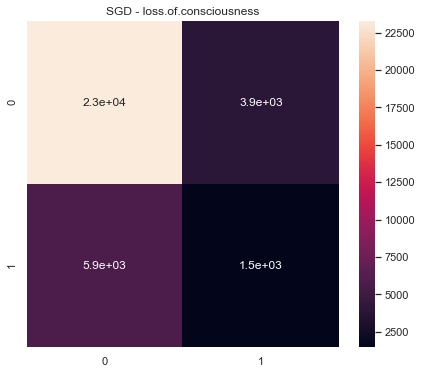

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  loss.of.consciousness  300.0  0.491327      0.496304   
0   2.0  loss.of.consciousness  300.0  0.492758      0.495757   
0   3.0  loss.of.consciousness  300.0  0.515567      0.520926   
0   4.0  loss.of.consciousness  300.0  0.478286      0.484294   
0   5.0  loss.of.consciousness  300.0  0.459208      0.482589   

   Precision Macro  ROC Macro  
0         0.494890   0.504196  
0         0.494644   0.482161  
0         0.517299   0.532404  
0         0.478861   0.451099  
0         0.460589   0.486311  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.consciousness  300.0  2.437147     2.47987       2.446284  2.456172
================================== LR ==================================


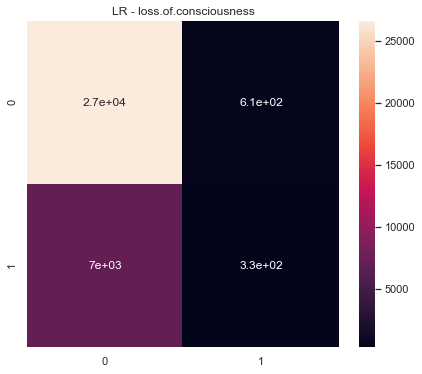

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  loss.of.consciousness  300.0  0.508535      0.516873   
0   2.0  loss.of.consciousness  300.0  0.483755      0.502106   
0   3.0  loss.of.consciousness  300.0  0.497655      0.499115   
0   4.0  loss.of.consciousness  300.0  0.523977      0.526615   
0   5.0  loss.of.consciousness  300.0  0.461094      0.502179   

   Precision Macro  ROC Macro  
0         0.532639   0.564257  
0         0.505053   0.509145  
0         0.498955   0.530719  
0         0.543328   0.545122  
0         0.515293   0.546938  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.consciousness  300.0  2.475016    2.546887       2.595268  2.696182
================================== loss.of.weight ==================================
================================== NB ==================================


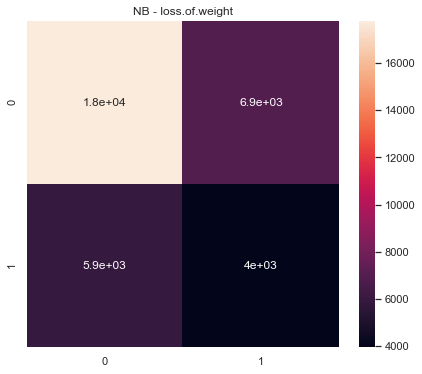

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  loss.of.weight  300.0  0.526217      0.527571         0.534161   
0   2.0  loss.of.weight  300.0  0.530376      0.532008         0.530115   
0   3.0  loss.of.weight  300.0  0.529966      0.532530         0.529998   
0   4.0  loss.of.weight  300.0  0.517941      0.518649         0.517859   
0   5.0  loss.of.weight  300.0  0.510589      0.511855         0.513686   

   ROC Macro  
0   0.562727  
0   0.555125  
0   0.543295  
0   0.524908  
0   0.536859  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.weight  300.0  2.615089    2.622613       2.625819  2.722913
================================== DT ==================================


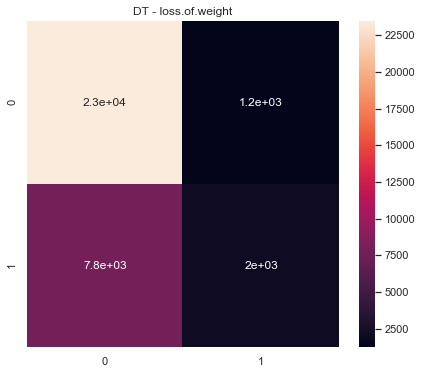

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  loss.of.weight  300.0  0.475277      0.508860         0.525686   
0   2.0  loss.of.weight  300.0  0.481096      0.504588         0.509701   
0   3.0  loss.of.weight  300.0  0.460032      0.500182         0.500578   
0   4.0  loss.of.weight  300.0  0.485348      0.504358         0.508205   
0   5.0  loss.of.weight  300.0  0.487342      0.508486         0.517373   

   ROC Macro  
0   0.524416  
0   0.519397  
0   0.531519  
0   0.497268  
0   0.527634  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.weight  300.0  2.389095    2.526473       2.561544  2.600234
================================== RF ==================================


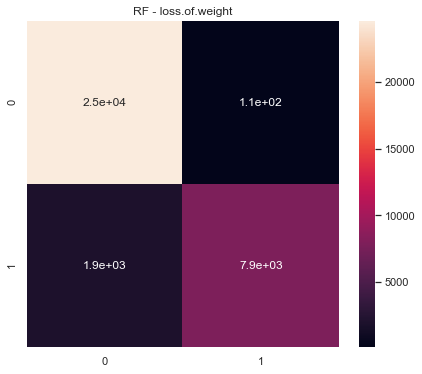

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  loss.of.weight  300.0  0.427901      0.502090         0.544378   
0   2.0  loss.of.weight  300.0  0.435989      0.504632         0.563101   
0   3.0  loss.of.weight  300.0  0.421686      0.485341         0.418667   
0   4.0  loss.of.weight  300.0  0.424643      0.490597         0.435519   
0   5.0  loss.of.weight  300.0  0.429782      0.503458         0.576822   

   ROC Macro  
0   0.562285  
0   0.585350  
0   0.564265  
0   0.524350  
0   0.560521  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.weight  300.0  2.140002    2.486118       2.538487  2.796771
================================== SGD ==================================


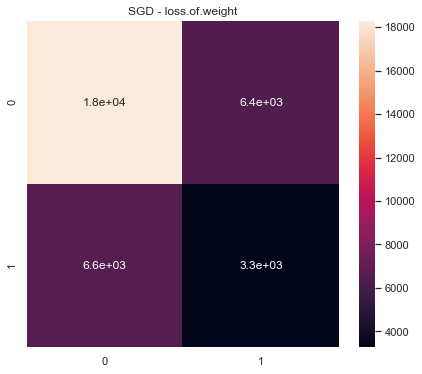

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  loss.of.weight  300.0  0.531635      0.532604         0.531272   
0   2.0  loss.of.weight  300.0  0.517850      0.518969         0.522319   
0   3.0  loss.of.weight  300.0  0.484100      0.484407         0.485489   
0   4.0  loss.of.weight  300.0  0.508717      0.509995         0.509300   
0   5.0  loss.of.weight  300.0  0.509773      0.509768         0.510137   

   ROC Macro  
0   0.549106  
0   0.520578  
0   0.491755  
0   0.504506  
0   0.516892  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.weight  300.0  2.552075    2.555743       2.558517  2.582836
================================== LR ==================================


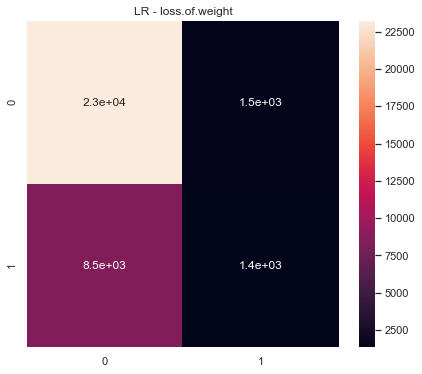

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  loss.of.weight  300.0  0.501910      0.517686         0.533459   
0   2.0  loss.of.weight  300.0  0.517652      0.526485         0.543231   
0   3.0  loss.of.weight  300.0  0.469851      0.481745         0.473893   
0   4.0  loss.of.weight  300.0  0.495895      0.499362         0.499227   
0   5.0  loss.of.weight  300.0  0.481376      0.503619         0.507360   

   ROC Macro  
0   0.570484  
0   0.550909  
0   0.477000  
0   0.493454  
0   0.520186  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  loss.of.weight  300.0  2.466685    2.528898       2.557169  2.612034
================================== lung.edema ==================================
================================== NB ==================================


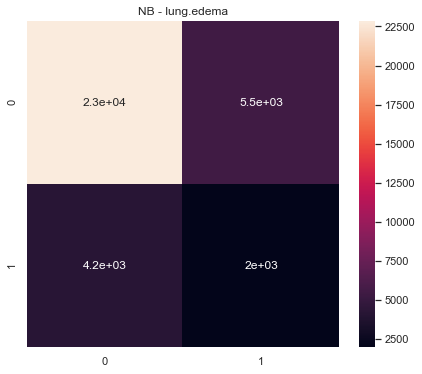

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lung.edema  300.0  0.536770      0.538683         0.535677   0.565144
0   2.0  lung.edema  300.0  0.544411      0.544905         0.543971   0.584015
0   3.0  lung.edema  300.0  0.527277      0.528665         0.526569   0.572918
0   4.0  lung.edema  300.0  0.529404      0.531388         0.528532   0.547639
0   5.0  lung.edema  300.0  0.528921      0.530539         0.528120   0.544568



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.edema  300.0  2.666783     2.67418       2.662868  2.814284
================================== DT ==================================


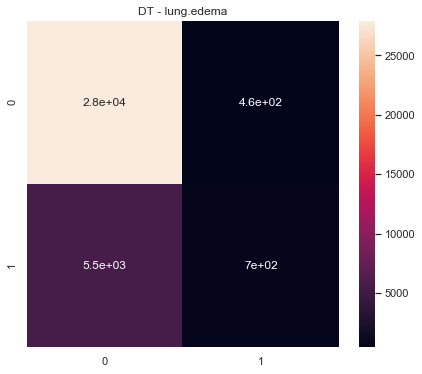

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lung.edema  300.0  0.486262      0.506860         0.525122   0.521412
0   2.0  lung.edema  300.0  0.483800      0.510990         0.574268   0.543274
0   3.0  lung.edema  300.0  0.474490      0.498040         0.493306   0.522396
0   4.0  lung.edema  300.0  0.488327      0.508548         0.532155   0.530075
0   5.0  lung.edema  300.0  0.478298      0.506024         0.533514   0.522844



          ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  lung.edema  300.0  2.411177    2.530462       2.658365     2.64
================================== RF ==================================


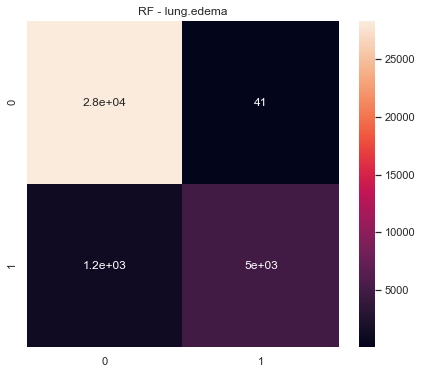

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lung.edema  300.0  0.457848      0.502924         0.675412   0.594654
0   2.0  lung.edema  300.0  0.456050      0.501853         0.604993   0.571653
0   3.0  lung.edema  300.0  0.452036      0.491598         0.442123   0.553102
0   4.0  lung.edema  300.0  0.458283      0.501614         0.538421   0.539283
0   5.0  lung.edema  300.0  0.458215      0.502533         0.595822   0.585310



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.edema  300.0  2.282432    2.500521       2.856771  2.844002
================================== SGD ==================================


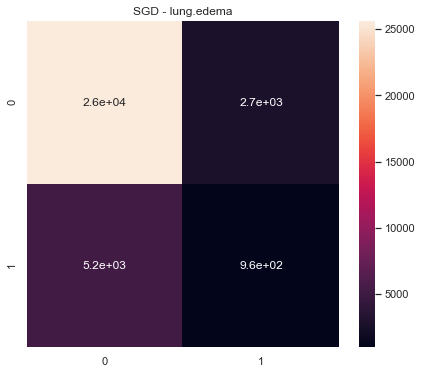

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lung.edema  300.0  0.488702      0.493236         0.490567   0.462939
0   2.0  lung.edema  300.0  0.482289      0.500927         0.502665   0.490920
0   3.0  lung.edema  300.0  0.475710      0.491126         0.480988   0.391703
0   4.0  lung.edema  300.0  0.475440      0.478421         0.474265   0.431182
0   5.0  lung.edema  300.0  0.487689      0.495770         0.492905   0.502756



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.edema  300.0  2.409829     2.45948        2.44139  2.279499
================================== LR ==================================


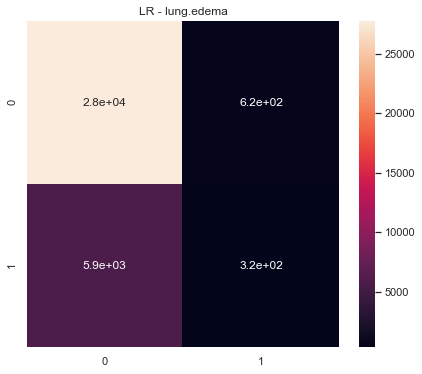

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  lung.edema  300.0  0.515920      0.518031         0.528621   0.540983
0   2.0  lung.edema  300.0  0.482285      0.505309         0.521354   0.550586
0   3.0  lung.edema  300.0  0.526519      0.525558         0.532458   0.533740
0   4.0  lung.edema  300.0  0.505551      0.509665         0.515553   0.508136
0   5.0  lung.edema  300.0  0.494040      0.500823         0.501373   0.522116



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.edema  300.0  2.524315    2.559386       2.599358  2.655562
================================== lung.infiltration ==================================
================================== NB ==================================


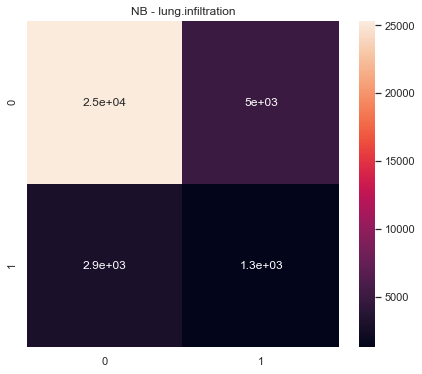

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lung.infiltration  300.0  0.519291      0.530556         0.520756   
0   2.0  lung.infiltration  300.0  0.527168      0.530530         0.525825   
0   3.0  lung.infiltration  300.0  0.498753      0.510878         0.506678   
0   4.0  lung.infiltration  300.0  0.516676      0.519927         0.516252   
0   5.0  lung.infiltration  300.0  0.528077      0.528149         0.528007   

   ROC Macro  
0   0.559104  
0   0.581372  
0   0.537315  
0   0.548264  
0   0.561065  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.infiltration  300.0  2.589964     2.62004       2.597519  2.787121
================================== DT ==================================


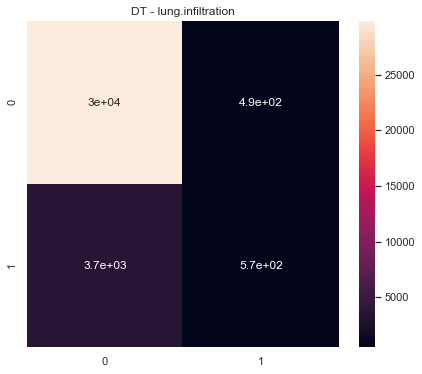

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lung.infiltration  300.0  0.510801      0.514449         0.534840   
0   2.0  lung.infiltration  300.0  0.489795      0.504571         0.520141   
0   3.0  lung.infiltration  300.0  0.481401      0.497166         0.490199   
0   4.0  lung.infiltration  300.0  0.470075      0.480534         0.464885   
0   5.0  lung.infiltration  300.0  0.504904      0.511807         0.535424   

   ROC Macro  
0   0.553650  
0   0.560546  
0   0.529758  
0   0.476603  
0   0.560021  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.infiltration  300.0  2.456976    2.508527       2.545489  2.680578
================================== RF ==================================


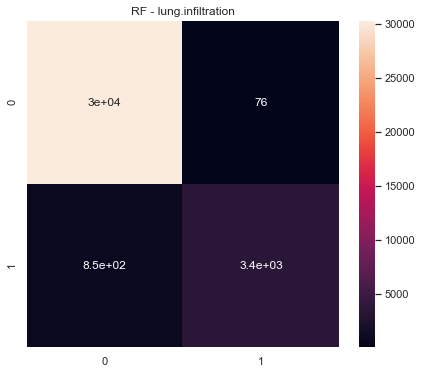

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lung.infiltration  300.0  0.473922      0.497417         0.482750   
0   2.0  lung.infiltration  300.0  0.463801      0.492908         0.437940   
0   3.0  lung.infiltration  300.0  0.464782      0.491779         0.446433   
0   4.0  lung.infiltration  300.0  0.464092      0.493485         0.438003   
0   5.0  lung.infiltration  300.0  0.467391      0.500000         0.438776   

   ROC Macro  
0   0.585496  
0   0.584592  
0   0.534803  
0   0.469109  
0   0.583641  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.infiltration  300.0  2.333988     2.47559       2.243902  2.757641
================================== SGD ==================================


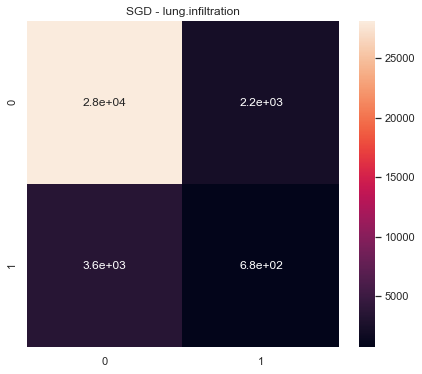

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lung.infiltration  300.0  0.460349      0.465743         0.455957   
0   2.0  lung.infiltration  300.0  0.497086      0.497160         0.497401   
0   3.0  lung.infiltration  300.0  0.466278      0.469432         0.463750   
0   4.0  lung.infiltration  300.0  0.492996      0.493856         0.492912   
0   5.0  lung.infiltration  300.0  0.508596      0.512810         0.509693   

   ROC Macro  
0   0.459951  
0   0.510602  
0   0.404752  
0   0.438202  
0   0.515506  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.infiltration  300.0  2.425305    2.439001       2.419713  2.329013
================================== LR ==================================


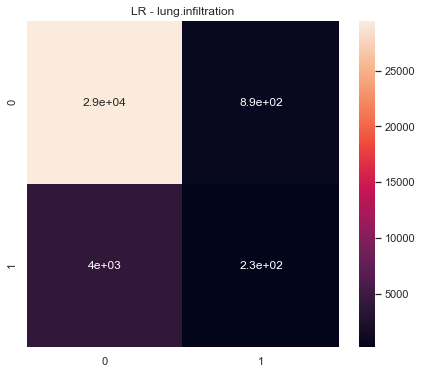

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  lung.infiltration  300.0  0.520469      0.523625         0.519652   
0   2.0  lung.infiltration  300.0  0.525118      0.523363         0.533905   
0   3.0  lung.infiltration  300.0  0.499832      0.505447         0.503771   
0   4.0  lung.infiltration  300.0  0.465282      0.462393         0.470325   
0   5.0  lung.infiltration  300.0  0.490018      0.492550         0.490099   

   ROC Macro  
0   0.545468  
0   0.571669  
0   0.493102  
0   0.468119  
0   0.531380  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  lung.infiltration  300.0  2.500719    2.507378       2.517752  2.609739
================================== malnourished ==================================
================================== NB ==================================


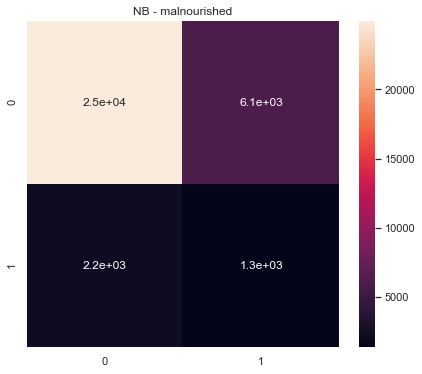

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  malnourished  300.0  0.523762      0.554354         0.528931   
0   2.0  malnourished  300.0  0.497543      0.521284         0.510759   
0   3.0  malnourished  300.0  0.499183      0.528589         0.513960   
0   4.0  malnourished  300.0  0.529062      0.539676         0.527572   
0   5.0  malnourished  300.0  0.533292      0.546333         0.531375   

   ROC Macro  
0   0.591183  
0   0.538515  
0   0.540940  
0   0.555367  
0   0.598750  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  malnourished  300.0  2.582842    2.690236       2.612597  2.824755
================================== DT ==================================


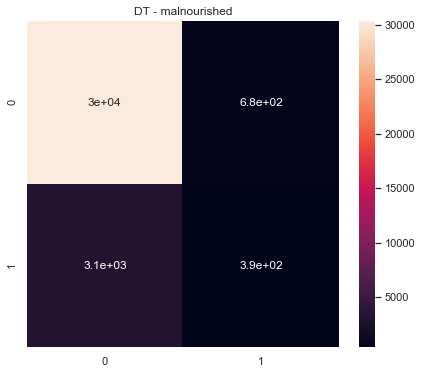

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  malnourished  300.0  0.499109      0.505325         0.514081   
0   2.0  malnourished  300.0  0.451425      0.447737         0.455445   
0   3.0  malnourished  300.0  0.434293      0.425482         0.443689   
0   4.0  malnourished  300.0  0.475878      0.480614         0.472871   
0   5.0  malnourished  300.0  0.504602      0.513133         0.582625   

   ROC Macro  
0   0.493364  
0   0.459405  
0   0.434717  
0   0.423211  
0   0.516704  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  malnourished  300.0  2.365307     2.37229       2.468711  2.327401
================================== RF ==================================


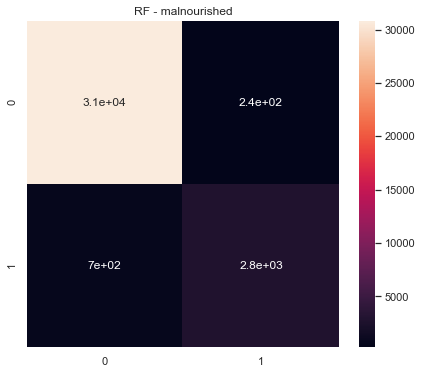

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  malnourished  300.0  0.474444      0.495187         0.468815   
0   2.0  malnourished  300.0  0.454402      0.463664         0.445502   
0   3.0  malnourished  300.0  0.448524      0.452788         0.444339   
0   4.0  malnourished  300.0  0.469767      0.493232         0.448432   
0   5.0  malnourished  300.0  0.476063      0.501420         0.949182   

   ROC Macro  
0   0.533689  
0   0.436160  
0   0.402986  
0   0.423181  
0   0.549481  



            ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  malnourished  300.0  2.3232    2.406292        2.75627  2.345498
================================== SGD ==================================


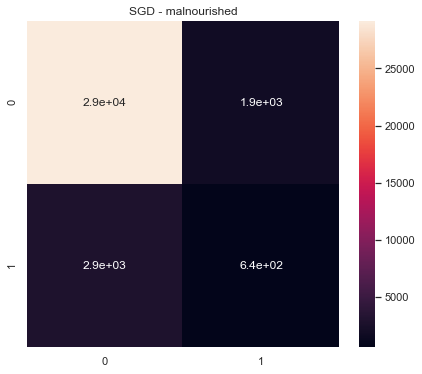

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  malnourished  300.0  0.459504      0.460914         0.458147   
0   2.0  malnourished  300.0  0.485761      0.485137         0.488006   
0   3.0  malnourished  300.0  0.442153      0.433879         0.451798   
0   4.0  malnourished  300.0  0.458783      0.458276         0.459297   
0   5.0  malnourished  300.0  0.499423      0.501119         0.501624   

   ROC Macro  
0   0.497104  
0   0.387467  
0   0.364397  
0   0.426042  
0   0.550947  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  malnourished  300.0  2.345624    2.339324       2.358873  2.225956
================================== LR ==================================


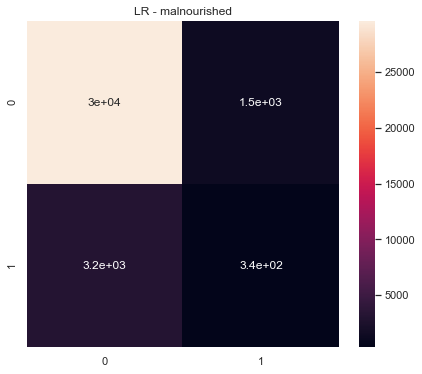

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  malnourished  300.0  0.514785      0.551794         0.525519   
0   2.0  malnourished  300.0  0.483707      0.482824         0.485592   
0   3.0  malnourished  300.0  0.434246      0.463712         0.485600   
0   4.0  malnourished  300.0  0.434872      0.423001         0.459035   
0   5.0  malnourished  300.0  0.491980      0.491966         0.493353   

   ROC Macro  
0   0.552847  
0   0.451964  
0   0.438648  
0   0.411709  
0   0.506352  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  malnourished  300.0  2.359589    2.413297       2.449098  2.36152
================================== metabolic.acidosis ==================================
================================== NB ==================================


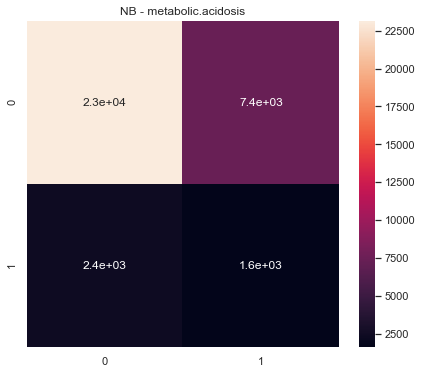

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  metabolic.acidosis  300.0  0.516984      0.526322         0.518180   
0   2.0  metabolic.acidosis  300.0  0.519492      0.532007         0.521160   
0   3.0  metabolic.acidosis  300.0  0.508795      0.538061         0.520452   
0   4.0  metabolic.acidosis  300.0  0.492671      0.516063         0.508515   
0   5.0  metabolic.acidosis  300.0  0.522595      0.535893         0.523744   

   ROC Macro  
0   0.567359  
0   0.575069  
0   0.579392  
0   0.528112  
0   0.565092  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  metabolic.acidosis  300.0  2.560536    2.648346        2.59205  2.815024
================================== DT ==================================


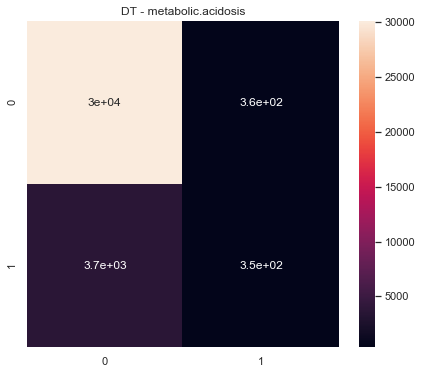

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  metabolic.acidosis  300.0  0.482251      0.501462         0.509051   
0   2.0  metabolic.acidosis  300.0  0.475037      0.499091         0.491637   
0   3.0  metabolic.acidosis  300.0  0.470412      0.477665         0.466045   
0   4.0  metabolic.acidosis  300.0  0.489146      0.499273         0.498114   
0   5.0  metabolic.acidosis  300.0  0.488417      0.504672         0.526273   

   ROC Macro  
0   0.501588  
0   0.529864  
0   0.476339  
0   0.506966  
0   0.532789  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  metabolic.acidosis  300.0  2.405264    2.482162       2.491121  2.547546
================================== RF ==================================


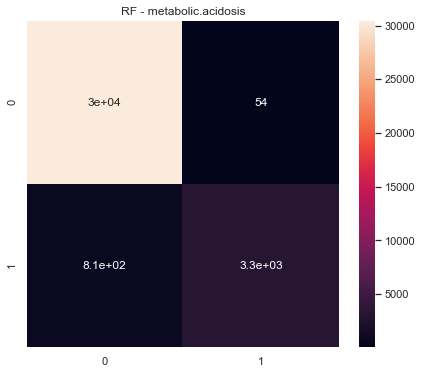

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  metabolic.acidosis  300.0  0.469504      0.499712         0.482737   
0   2.0  metabolic.acidosis  300.0  0.468707      0.500000         0.441100   
0   3.0  metabolic.acidosis  300.0  0.460740      0.482898         0.441569   
0   4.0  metabolic.acidosis  300.0  0.467027      0.496637         0.440748   
0   5.0  metabolic.acidosis  300.0  0.468620      0.499754         0.441138   

   ROC Macro  
0   0.564742  
0   0.559820  
0   0.521272  
0   0.494885  
0   0.557928  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  metabolic.acidosis  300.0  2.334597    2.479001       2.247292  2.698645
================================== SGD ==================================


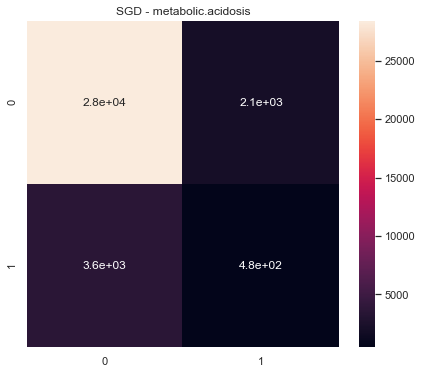

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  metabolic.acidosis  300.0  0.472446      0.481892         0.467961   
0   2.0  metabolic.acidosis  300.0  0.499391      0.499762         0.499728   
0   3.0  metabolic.acidosis  300.0  0.478134      0.482861         0.475967   
0   4.0  metabolic.acidosis  300.0  0.485574      0.486117         0.485175   
0   5.0  metabolic.acidosis  300.0  0.509899      0.514617         0.510893   

   ROC Macro  
0   0.471672  
0   0.505389  
0   0.436298  
0   0.481410  
0   0.527405  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  metabolic.acidosis  300.0  2.445443    2.465249       2.439723  2.422174
================================== LR ==================================


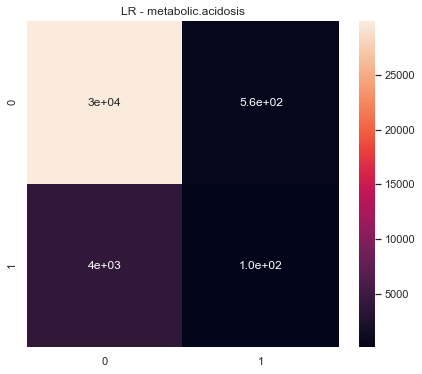

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  metabolic.acidosis  300.0  0.498103      0.502660         0.504963   
0   2.0  metabolic.acidosis  300.0  0.509456      0.512867         0.529659   
0   3.0  metabolic.acidosis  300.0  0.468837      0.466530         0.476121   
0   4.0  metabolic.acidosis  300.0  0.496674      0.499453         0.499178   
0   5.0  metabolic.acidosis  300.0  0.496370      0.498760         0.498220   

   ROC Macro  
0   0.568665  
0   0.571069  
0   0.481872  
0   0.476951  
0   0.519220  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  metabolic.acidosis  300.0  2.469441     2.48027       2.508142  2.617778
================================== migraine ==================================
================================== NB ==================================


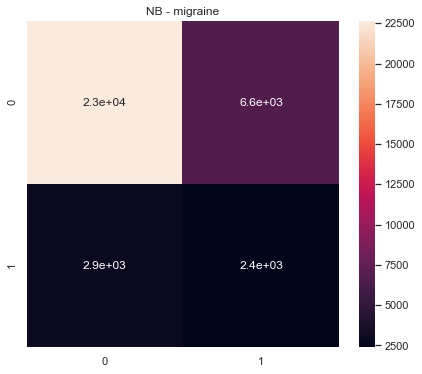

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  migraine  300.0  0.559206      0.569991         0.555457   0.640832
0   2.0  migraine  300.0  0.565265      0.582846         0.561154   0.620961
0   3.0  migraine  300.0  0.536900      0.578518         0.546735   0.599531
0   4.0  migraine  300.0  0.549609      0.574663         0.549953   0.593575
0   5.0  migraine  300.0  0.544225      0.553182         0.541986   0.564994



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  migraine  300.0  2.755204    2.859199       2.755286  3.019894
================================== DT ==================================


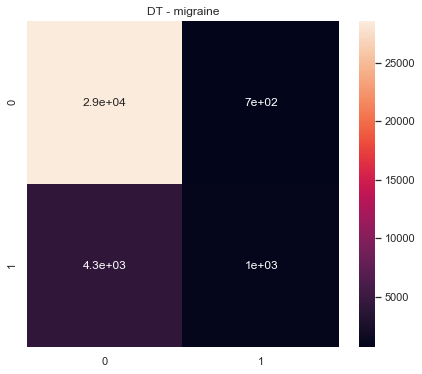

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  migraine  300.0  0.514469      0.521539         0.567847   0.582198
0   2.0  migraine  300.0  0.492583      0.501986         0.504257   0.547117
0   3.0  migraine  300.0  0.478289      0.490153         0.480284   0.550418
0   4.0  migraine  300.0  0.510234      0.518412         0.556236   0.558777
0   5.0  migraine  300.0  0.474469      0.499910         0.499517   0.509211



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  migraine  300.0  2.470044       2.532        2.60814  2.747722
================================== RF ==================================


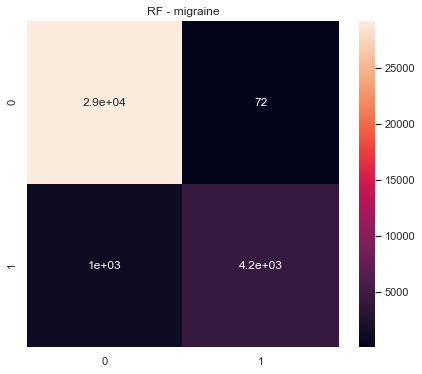

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  migraine  300.0  0.476989      0.508179         0.710296   0.648285
0   2.0  migraine  300.0  0.466143      0.503439         0.757224   0.631139
0   3.0  migraine  300.0  0.459294      0.482960         0.449520   0.602542
0   4.0  migraine  300.0  0.473623      0.505089         0.579282   0.532663
0   5.0  migraine  300.0  0.471942      0.506281         0.813210   0.659075



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  migraine  300.0  2.347991    2.505948       3.309533  3.073705
================================== SGD ==================================


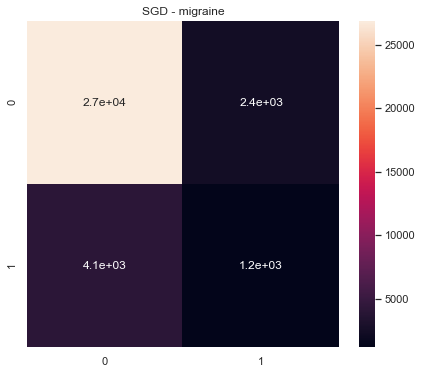

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  migraine  300.0  0.456634      0.460646         0.453484   0.433796
0   2.0  migraine  300.0  0.494835      0.497639         0.496772   0.458173
0   3.0  migraine  300.0  0.462706      0.469949         0.458456   0.398211
0   4.0  migraine  300.0  0.499386      0.503513         0.505643   0.464151
0   5.0  migraine  300.0  0.479213      0.487566         0.479371   0.416365



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  migraine  300.0  2.392774    2.419313       2.393726  2.170697
================================== LR ==================================


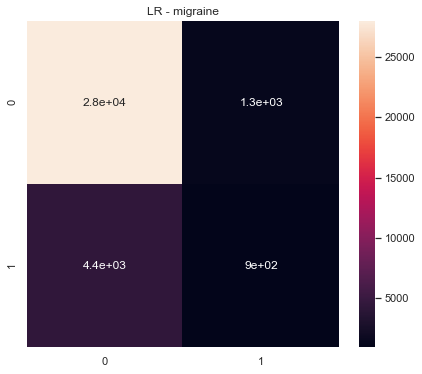

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  migraine  300.0  0.545678      0.553520         0.543224   0.592631
0   2.0  migraine  300.0  0.483062      0.499570         0.498706   0.508793
0   3.0  migraine  300.0  0.555750      0.578491         0.554167   0.653073
0   4.0  migraine  300.0  0.508735      0.509726         0.508720   0.494164
0   5.0  migraine  300.0  0.541416      0.538854         0.546855   0.535861



        ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  migraine  300.0  2.63464    2.680162       2.651672  2.784523
================================== mucositis.oral ==================================
================================== NB ==================================


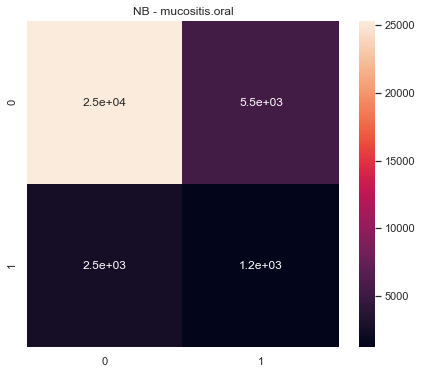

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  mucositis.oral  300.0  0.528023      0.535510         0.526487   
0   2.0  mucositis.oral  300.0  0.529287      0.554122         0.531467   
0   3.0  mucositis.oral  300.0  0.493144      0.521723         0.510727   
0   4.0  mucositis.oral  300.0  0.515878      0.525844         0.517258   
0   5.0  mucositis.oral  300.0  0.520487      0.521681         0.519762   

   ROC Macro  
0   0.576218  
0   0.608293  
0   0.545191  
0   0.534976  
0   0.573557  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  mucositis.oral  300.0  2.586819    2.658881         2.6057  2.838236
================================== DT ==================================


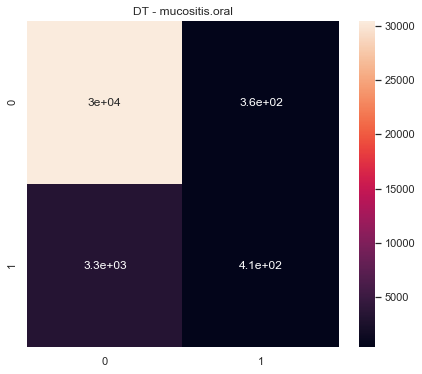

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  mucositis.oral  300.0  0.492906      0.506084         0.532340   
0   2.0  mucositis.oral  300.0  0.489561      0.501476         0.505228   
0   3.0  mucositis.oral  300.0  0.471127      0.488054         0.462710   
0   4.0  mucositis.oral  300.0  0.484483      0.492559         0.485046   
0   5.0  mucositis.oral  300.0  0.501218      0.510091         0.542544   

   ROC Macro  
0   0.562902  
0   0.539853  
0   0.510916  
0   0.557544  
0   0.535111  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  mucositis.oral  300.0  2.439294    2.498264       2.527868  2.706327
================================== RF ==================================


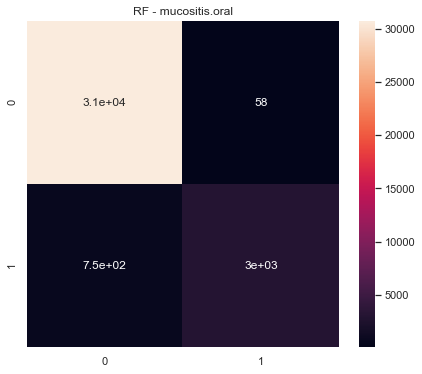

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  mucositis.oral  300.0  0.472169      0.499613         0.481480   
0   2.0  mucositis.oral  300.0  0.471349      0.500000         0.445803   
0   3.0  mucositis.oral  300.0  0.462173      0.481902         0.443996   
0   4.0  mucositis.oral  300.0  0.469115      0.495536         0.445368   
0   5.0  mucositis.oral  300.0  0.471344      0.499919         0.445860   

   ROC Macro  
0   0.599385  
0   0.563703  
0   0.499632  
0   0.456898  
0   0.557583  



              ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  mucositis.oral  300.0  2.34615     2.47697       2.262507  2.677201
================================== SGD ==================================


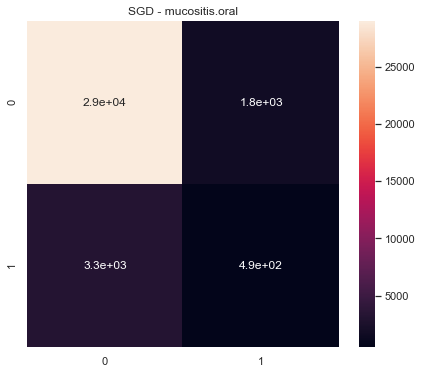

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  mucositis.oral  300.0  0.496186      0.496601         0.496198   
0   2.0  mucositis.oral  300.0  0.507563      0.509222         0.516229   
0   3.0  mucositis.oral  300.0  0.465014      0.469708         0.461132   
0   4.0  mucositis.oral  300.0  0.479631      0.483454         0.477652   
0   5.0  mucositis.oral  300.0  0.493212      0.493143         0.493300   

   ROC Macro  
0   0.503668  
0   0.509492  
0   0.459401  
0   0.457357  
0   0.496666  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  mucositis.oral  300.0  2.441605    2.452128        2.44451  2.426584
================================== LR ==================================


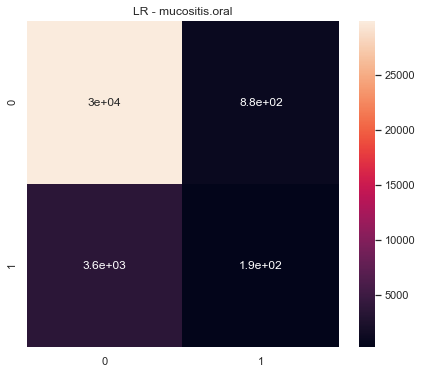

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  mucositis.oral  300.0  0.522400      0.521905         0.523021   
0   2.0  mucositis.oral  300.0  0.524846      0.522819         0.532675   
0   3.0  mucositis.oral  300.0  0.488101      0.503396         0.501822   
0   4.0  mucositis.oral  300.0  0.488409      0.490202         0.493193   
0   5.0  mucositis.oral  300.0  0.492908      0.493295         0.492734   

   ROC Macro  
0   0.536493  
0   0.549782  
0   0.518382  
0   0.498199  
0   0.491465  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  mucositis.oral  300.0  2.516664    2.531617       2.543444  2.594322
================================== muscle.spasm ==================================
================================== NB ==================================


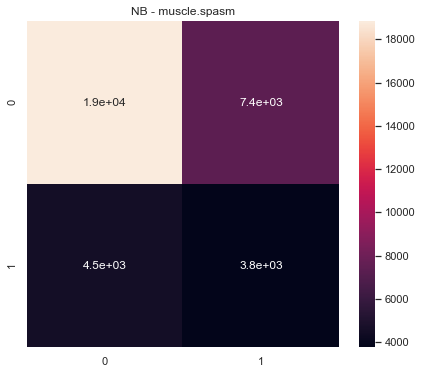

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.spasm  300.0  0.563488      0.560605         0.570633   
0   2.0  muscle.spasm  300.0  0.514795      0.516547         0.515044   
0   3.0  muscle.spasm  300.0  0.518083      0.532999         0.525778   
0   4.0  muscle.spasm  300.0  0.540452      0.550827         0.541913   
0   5.0  muscle.spasm  300.0  0.517287      0.517193         0.517410   

   ROC Macro  
0   0.624031  
0   0.543130  
0   0.552663  
0   0.565978  
0   0.557881  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.spasm  300.0  2.654105     2.67817       2.670778  2.843684
================================== DT ==================================


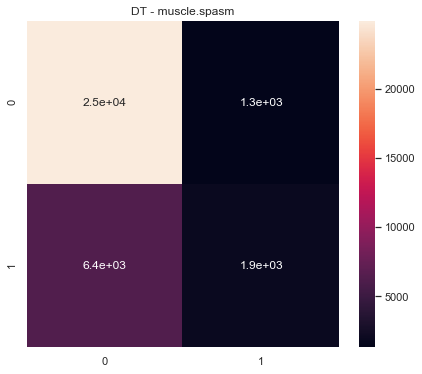

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.spasm  300.0  0.492902      0.514908         0.542112   
0   2.0  muscle.spasm  300.0  0.505801      0.514395         0.524639   
0   3.0  muscle.spasm  300.0  0.467599      0.484361         0.472375   
0   4.0  muscle.spasm  300.0  0.472321      0.492576         0.484661   
0   5.0  muscle.spasm  300.0  0.484469      0.506460         0.516257   

   ROC Macro  
0   0.515765  
0   0.517596  
0   0.484059  
0   0.487107  
0   0.528229  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.spasm  300.0  2.423091      2.5127       2.540044  2.532755
================================== RF ==================================


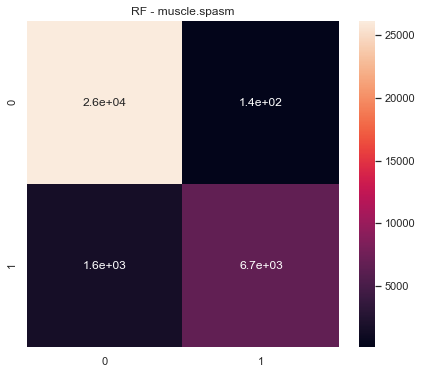

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.spasm  300.0  0.435649      0.501155         0.585906   
0   2.0  muscle.spasm  300.0  0.433892      0.498663         0.456489   
0   3.0  muscle.spasm  300.0  0.442045      0.476335         0.438235   
0   4.0  muscle.spasm  300.0  0.426992      0.484580         0.395241   
0   5.0  muscle.spasm  300.0  0.436614      0.502029         0.713571   

   ROC Macro  
0   0.589902  
0   0.563487  
0   0.536188  
0   0.510677  
0   0.570810  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.spasm  300.0  2.175192    2.462761       2.589441  2.771064
================================== SGD ==================================


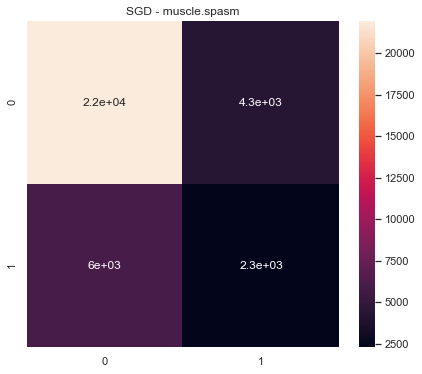

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.spasm  300.0  0.493980      0.498434         0.497936   
0   2.0  muscle.spasm  300.0  0.454182      0.475269         0.454028   
0   3.0  muscle.spasm  300.0  0.515879      0.515696         0.516323   
0   4.0  muscle.spasm  300.0  0.514752      0.517172         0.515324   
0   5.0  muscle.spasm  300.0  0.479705      0.483994         0.480235   

   ROC Macro  
0   0.468769  
0   0.449756  
0   0.530135  
0   0.524884  
0   0.482708  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.spasm  300.0  2.458498    2.490566       2.463846  2.456252
================================== LR ==================================


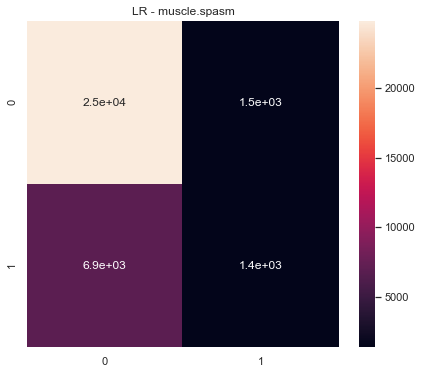

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.spasm  300.0  0.569233      0.565222         0.596538   
0   2.0  muscle.spasm  300.0  0.491402      0.512477         0.532854   
0   3.0  muscle.spasm  300.0  0.508574      0.508670         0.508528   
0   4.0  muscle.spasm  300.0  0.516283      0.516081         0.516946   
0   5.0  muscle.spasm  300.0  0.475831      0.500387         0.500986   

   ROC Macro  
0   0.637240  
0   0.549965  
0   0.519378  
0   0.508166  
0   0.552848  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.spasm  300.0  2.561324    2.602838       2.655852  2.767598
================================== muscle.weakness ==================================
================================== NB ==================================


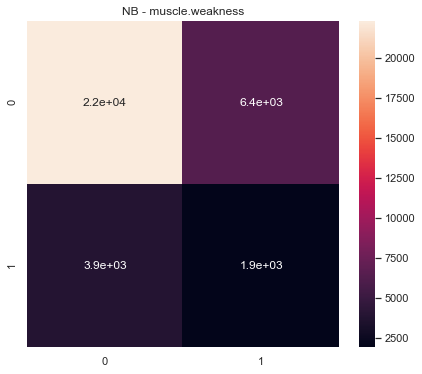

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.weakness  300.0  0.526454      0.528160         0.525666   
0   2.0  muscle.weakness  300.0  0.520139      0.532292         0.523325   
0   3.0  muscle.weakness  300.0  0.484007      0.495099         0.496739   
0   4.0  muscle.weakness  300.0  0.505639      0.509597         0.507627   
0   5.0  muscle.weakness  300.0  0.527788      0.528569         0.527240   

   ROC Macro  
0   0.558096  
0   0.567811  
0   0.507375  
0   0.500876  
0   0.548361  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  muscle.weakness  300.0  2.564028    2.593717       2.580596  2.68252
================================== DT ==================================


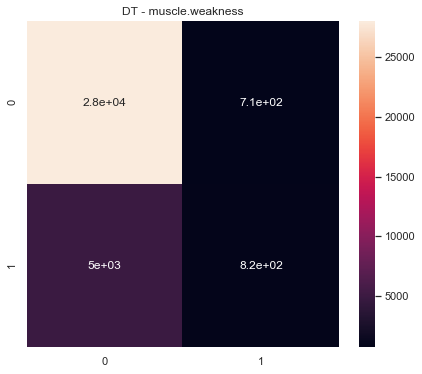

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.weakness  300.0  0.491940      0.507625         0.523921   
0   2.0  muscle.weakness  300.0  0.493045      0.507873         0.523657   
0   3.0  muscle.weakness  300.0  0.454997      0.472271         0.446646   
0   4.0  muscle.weakness  300.0  0.463102      0.483925         0.459831   
0   5.0  muscle.weakness  300.0  0.495317      0.506810         0.516591   

   ROC Macro  
0   0.527677  
0   0.527653  
0   0.454764  
0   0.490087  
0   0.494476  



               ADR    PCA  Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.weakness  300.0  2.3984    2.478504       2.470645  2.494657
================================== RF ==================================


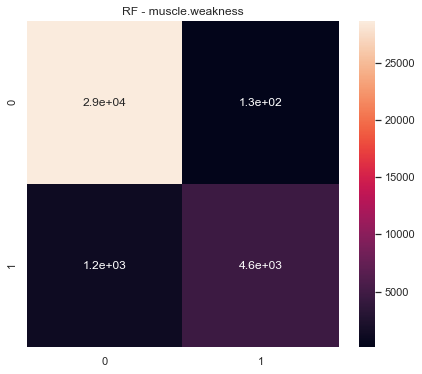

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.weakness  300.0  0.453841      0.499391         0.415906   
0   2.0  muscle.weakness  300.0  0.454143      0.500000         0.415991   
0   3.0  muscle.weakness  300.0  0.437266      0.462229         0.416709   
0   4.0  muscle.weakness  300.0  0.449345      0.487029         0.423115   
0   5.0  muscle.weakness  300.0  0.454769      0.499822         0.478527   

   ROC Macro  
0   0.554381  
0   0.552419  
0   0.483350  
0   0.438352  
0   0.537978  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  muscle.weakness  300.0  2.249365    2.448471       2.150248  2.56648
================================== SGD ==================================


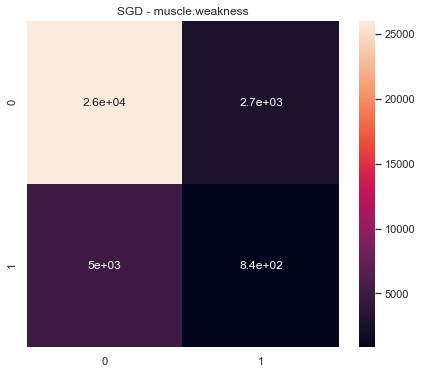

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.weakness  300.0  0.488937      0.493425         0.490676   
0   2.0  muscle.weakness  300.0  0.491469      0.495492         0.493650   
0   3.0  muscle.weakness  300.0  0.463163      0.469924         0.459631   
0   4.0  muscle.weakness  300.0  0.452610      0.463780         0.445756   
0   5.0  muscle.weakness  300.0  0.462832      0.470404         0.459034   

   ROC Macro  
0   0.451733  
0   0.483766  
0   0.422265  
0   0.390980  
0   0.438016  



               ADR    PCA   Avg F1  Avg Recall  Avg Precision  Avg ROC
0  muscle.weakness  300.0  2.35901    2.393025       2.348747  2.18676
================================== LR ==================================


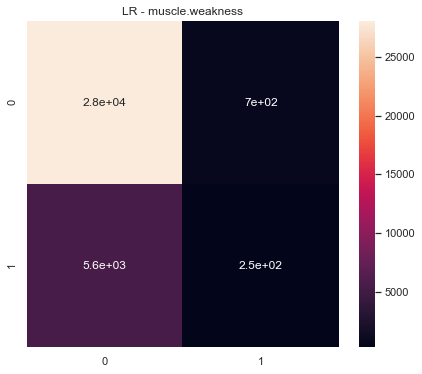

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  muscle.weakness  300.0  0.522739      0.523445         0.538618   
0   2.0  muscle.weakness  300.0  0.499253      0.514744         0.557129   
0   3.0  muscle.weakness  300.0  0.489819      0.491488         0.493199   
0   4.0  muscle.weakness  300.0  0.457530      0.465891         0.452650   
0   5.0  muscle.weakness  300.0  0.495133      0.501058         0.501751   

   ROC Macro  
0   0.548864  
0   0.532605  
0   0.480137  
0   0.432208  
0   0.477453  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  muscle.weakness  300.0  2.464475    2.496627       2.543347  2.471266
================================== musculoskeletal.pain ==================================
================================== NB ==================================


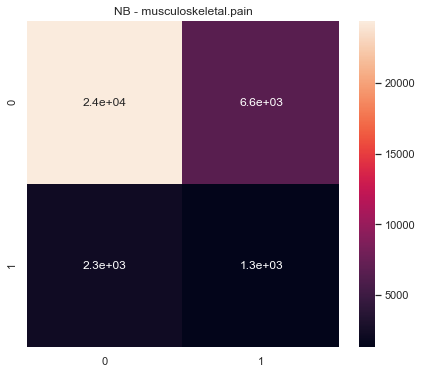

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  musculoskeletal.pain  300.0  0.517836      0.525469         0.517922   
0   2.0  musculoskeletal.pain  300.0  0.502671      0.525031         0.513167   
0   3.0  musculoskeletal.pain  300.0  0.501593      0.527408         0.513948   
0   4.0  musculoskeletal.pain  300.0  0.506245      0.518372         0.511099   
0   5.0  musculoskeletal.pain  300.0  0.504919      0.508432         0.506219   

   ROC Macro  
0   0.599353  
0   0.549183  
0   0.563573  
0   0.545574  
0   0.564603  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  musculoskeletal.pain  300.0  2.533265    2.604712       2.562355  2.822285
================================== DT ==================================


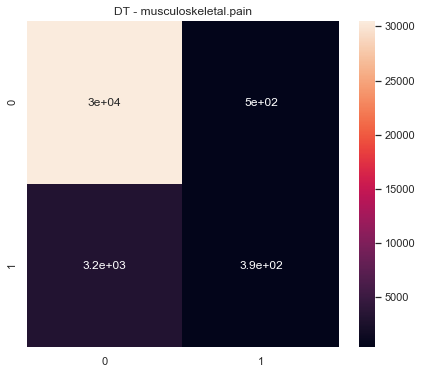

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  musculoskeletal.pain  300.0  0.483942      0.499743         0.498699   
0   2.0  musculoskeletal.pain  300.0  0.475699      0.487289         0.470997   
0   3.0  musculoskeletal.pain  300.0  0.494285      0.496545         0.495122   
0   4.0  musculoskeletal.pain  300.0  0.482782      0.482206         0.483534   
0   5.0  musculoskeletal.pain  300.0  0.480904      0.500840         0.508108   

   ROC Macro  
0   0.520384  
0   0.462950  
0   0.492948  
0   0.443214  
0   0.472778  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  musculoskeletal.pain  300.0  2.417612    2.466623       2.456461  2.392274
================================== RF ==================================


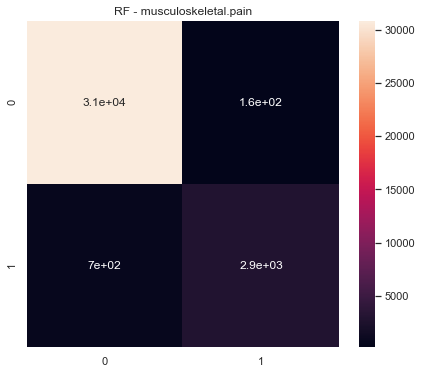

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  musculoskeletal.pain  300.0  0.472720      0.499919         0.448328   
0   2.0  musculoskeletal.pain  300.0  0.466582      0.484777         0.451689   
0   3.0  musculoskeletal.pain  300.0  0.486359      0.489839         0.485547   
0   4.0  musculoskeletal.pain  300.0  0.484922      0.498517         0.494365   
0   5.0  musculoskeletal.pain  300.0  0.472595      0.499677         0.448298   

   ROC Macro  
0   0.512277  
0   0.524166  
0   0.533600  
0   0.481200  
0   0.515146  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  musculoskeletal.pain  300.0  2.383179    2.472729       2.328227  2.566388
================================== SGD ==================================


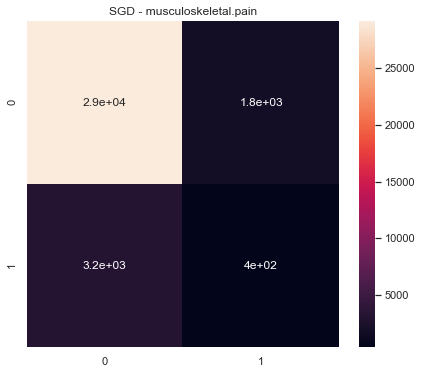

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  musculoskeletal.pain  300.0  0.500935      0.501479         0.501280   
0   2.0  musculoskeletal.pain  300.0  0.471855      0.482393         0.465514   
0   3.0  musculoskeletal.pain  300.0  0.479303      0.481365         0.477858   
0   4.0  musculoskeletal.pain  300.0  0.474967      0.478741         0.472343   
0   5.0  musculoskeletal.pain  300.0  0.479944      0.481897         0.478588   

   ROC Macro  
0   0.475004  
0   0.468054  
0   0.409609  
0   0.423869  
0   0.467769  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  musculoskeletal.pain  300.0  2.407004    2.425876       2.395583  2.244306
================================== LR ==================================


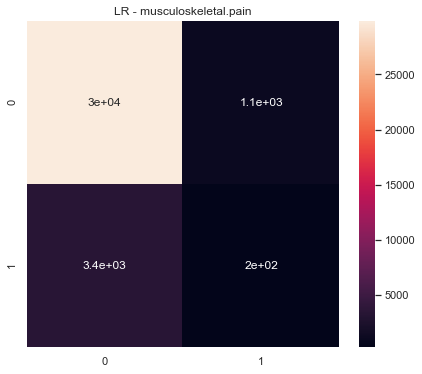

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  musculoskeletal.pain  300.0  0.502013      0.518692         0.510382   
0   2.0  musculoskeletal.pain  300.0  0.505211      0.505123         0.505624   
0   3.0  musculoskeletal.pain  300.0  0.485043      0.488050         0.492443   
0   4.0  musculoskeletal.pain  300.0  0.490419      0.514033         0.506936   
0   5.0  musculoskeletal.pain  300.0  0.494254      0.496316         0.497355   

   ROC Macro  
0   0.514313  
0   0.507152  
0   0.474131  
0   0.496783  
0   0.496805  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  musculoskeletal.pain  300.0  2.47694    2.522214       2.512741  2.489184
================================== narcolepsy ==================================
================================== NB ==================================


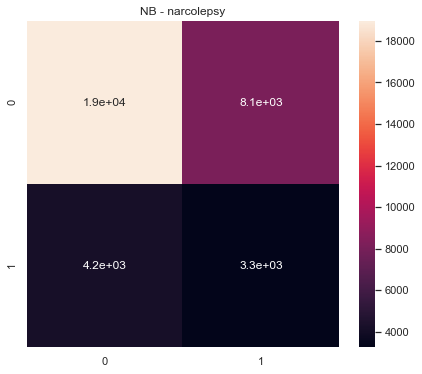

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  narcolepsy  300.0  0.552314      0.560740         0.550948   0.586077
0   2.0  narcolepsy  300.0  0.528620      0.536137         0.529654   0.564585
0   3.0  narcolepsy  300.0  0.506494      0.534710         0.524379   0.553644
0   4.0  narcolepsy  300.0  0.534618      0.543427         0.535385   0.570328
0   5.0  narcolepsy  300.0  0.534346      0.536564         0.533502   0.571617



          ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  narcolepsy  300.0  2.656392    2.711579       2.673869  2.84625
================================== DT ==================================


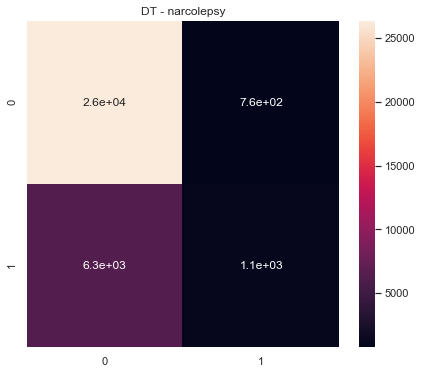

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  narcolepsy  300.0  0.487698      0.512061         0.543383   0.550936
0   2.0  narcolepsy  300.0  0.478034      0.508408         0.537231   0.510029
0   3.0  narcolepsy  300.0  0.474687      0.503024         0.510735   0.521367
0   4.0  narcolepsy  300.0  0.478882      0.503379         0.510295   0.532131
0   5.0  narcolepsy  300.0  0.496146      0.513753         0.537603   0.520422



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  narcolepsy  300.0  2.415447    2.540625       2.639248  2.634885
================================== RF ==================================


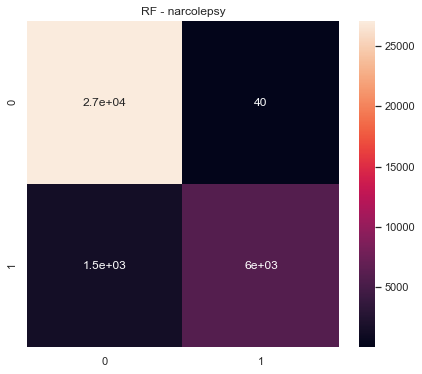

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  narcolepsy  300.0  0.440664      0.499068         0.454455   0.587288
0   2.0  narcolepsy  300.0  0.443532      0.500594         0.526829   0.562384
0   3.0  narcolepsy  300.0  0.445161      0.495672         0.457410   0.572892
0   4.0  narcolepsy  300.0  0.441778      0.498319         0.456971   0.573449
0   5.0  narcolepsy  300.0  0.440238      0.499286         0.450800   0.588484



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  narcolepsy  300.0  2.211372     2.49294       2.346466  2.884497
================================== SGD ==================================


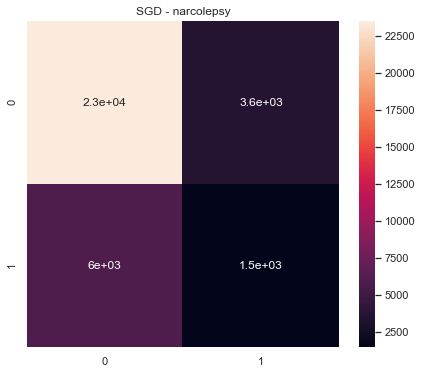

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  narcolepsy  300.0  0.481978      0.482592         0.481659   0.441234
0   2.0  narcolepsy  300.0  0.457608      0.475565         0.455648   0.463174
0   3.0  narcolepsy  300.0  0.472047      0.475856         0.471018   0.451484
0   4.0  narcolepsy  300.0  0.486215      0.501372         0.502865   0.491126
0   5.0  narcolepsy  300.0  0.483778      0.486877         0.484071   0.479033



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  narcolepsy  300.0  2.381626    2.422263        2.39526  2.326052
================================== LR ==================================


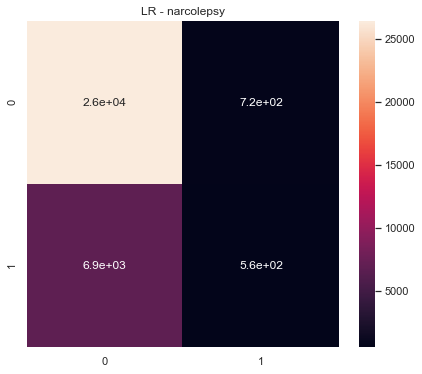

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  narcolepsy  300.0  0.488901      0.510742         0.533489   0.589052
0   2.0  narcolepsy  300.0  0.493121      0.512586         0.536575   0.502099
0   3.0  narcolepsy  300.0  0.498898      0.504469         0.506673   0.521064
0   4.0  narcolepsy  300.0  0.517140      0.525695         0.556311   0.567326
0   5.0  narcolepsy  300.0  0.459579      0.488289         0.466903   0.565046



          ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  narcolepsy  300.0  2.45764    2.541782       2.599951  2.744587
================================== nasal.congestion ==================================
================================== NB ==================================


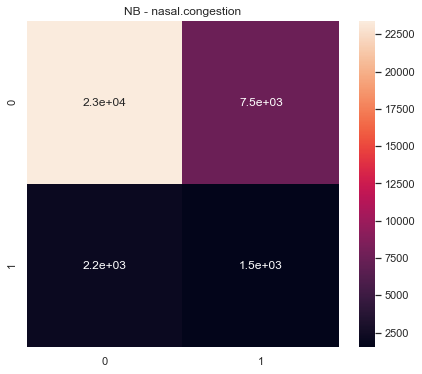

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nasal.congestion  300.0  0.525930      0.560042         0.531790   
0   2.0  nasal.congestion  300.0  0.507305      0.549156         0.523432   
0   3.0  nasal.congestion  300.0  0.482900      0.533567         0.514483   
0   4.0  nasal.congestion  300.0  0.534065      0.566315         0.536607   
0   5.0  nasal.congestion  300.0  0.521857      0.540941         0.524424   

   ROC Macro  
0   0.591628  
0   0.580336  
0   0.555315  
0   0.595717  
0   0.586196  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nasal.congestion  300.0  2.572055    2.750021       2.630736  2.909191
================================== DT ==================================


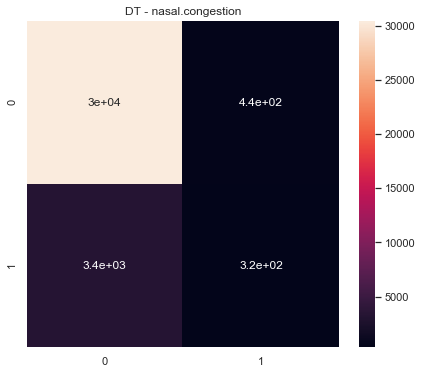

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nasal.congestion  300.0  0.510850      0.513732         0.535436   
0   2.0  nasal.congestion  300.0  0.454129      0.460370         0.448298   
0   3.0  nasal.congestion  300.0  0.467823      0.471579         0.464742   
0   4.0  nasal.congestion  300.0  0.485703      0.498451         0.494717   
0   5.0  nasal.congestion  300.0  0.493692      0.506715         0.538905   

   ROC Macro  
0   0.560476  
0   0.476340  
0   0.463279  
0   0.506896  
0   0.553549  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nasal.congestion  300.0  2.412198    2.450846       2.482098  2.560539
================================== RF ==================================


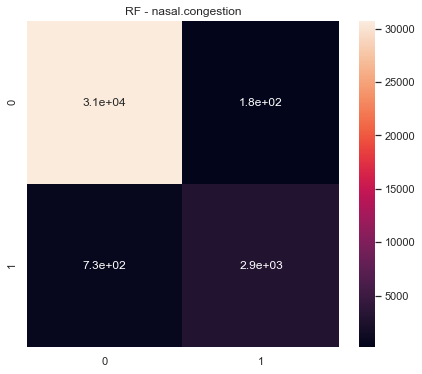

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nasal.congestion  300.0  0.492818      0.507132         0.552042   
0   2.0  nasal.congestion  300.0  0.451718      0.460897         0.442897   
0   3.0  nasal.congestion  300.0  0.464742      0.477485         0.454813   
0   4.0  nasal.congestion  300.0  0.471268      0.498624         0.446758   
0   5.0  nasal.congestion  300.0  0.471870      0.499757         0.446930   

   ROC Macro  
0   0.590863  
0   0.505531  
0   0.502596  
0   0.513147  
0   0.589594  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nasal.congestion  300.0  2.352415    2.443896        2.34344  2.701731
================================== SGD ==================================


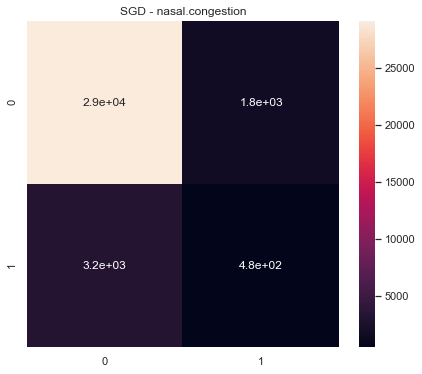

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nasal.congestion  300.0  0.500318      0.500570         0.500648   
0   2.0  nasal.congestion  300.0  0.476717      0.476080         0.477448   
0   3.0  nasal.congestion  300.0  0.469462      0.477416         0.463961   
0   4.0  nasal.congestion  300.0  0.467881      0.474535         0.462884   
0   5.0  nasal.congestion  300.0  0.480590      0.482630         0.479259   

   ROC Macro  
0   0.436359  
0   0.398202  
0   0.428225  
0   0.426739  
0   0.459713  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nasal.congestion  300.0  2.394969    2.411231         2.3842  2.149239
================================== LR ==================================


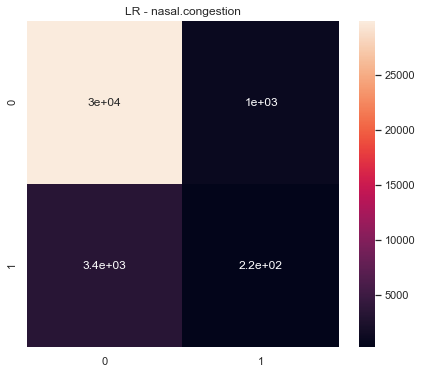

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nasal.congestion  300.0  0.530864      0.554079         0.531964   
0   2.0  nasal.congestion  300.0  0.477609      0.478402         0.476919   
0   3.0  nasal.congestion  300.0  0.484143      0.484928         0.489591   
0   4.0  nasal.congestion  300.0  0.496918      0.497895         0.498327   
0   5.0  nasal.congestion  300.0  0.511134      0.518944         0.512851   

   ROC Macro  
0   0.577497  
0   0.430253  
0   0.410445  
0   0.474031  
0   0.542733  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nasal.congestion  300.0  2.500668    2.534248       2.509652  2.434959
================================== nausea ==================================
================================== NB ==================================


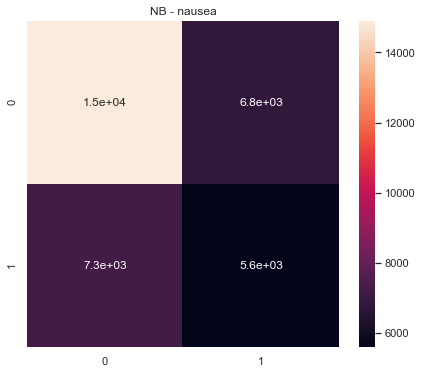

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  nausea  300.0  0.521955      0.522359         0.523638   0.550172
0   2.0  nausea  300.0  0.560994      0.561439         0.560710   0.582967
0   3.0  nausea  300.0  0.512198      0.512237         0.512180   0.521154
0   4.0  nausea  300.0  0.509931      0.510012         0.510238   0.509080
0   5.0  nausea  300.0  0.500303      0.510631         0.513913   0.527379



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nausea  300.0  2.605381    2.616677       2.620677  2.690753
================================== DT ==================================


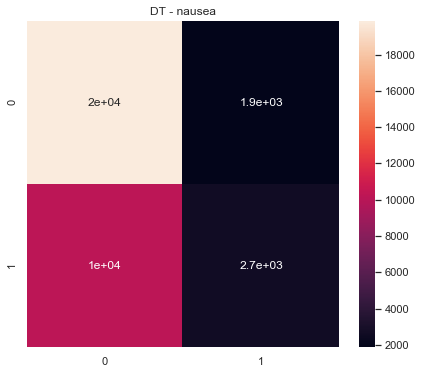

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  nausea  300.0  0.426682      0.501853         0.508628   0.539478
0   2.0  nausea  300.0  0.470356      0.502307         0.504268   0.522389
0   3.0  nausea  300.0  0.469938      0.482197         0.477109   0.475952
0   4.0  nausea  300.0  0.415408      0.479499         0.439449   0.443557
0   5.0  nausea  300.0  0.455000      0.506893         0.518936   0.488140



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nausea  300.0  2.237385    2.472749       2.448391  2.469516
================================== RF ==================================


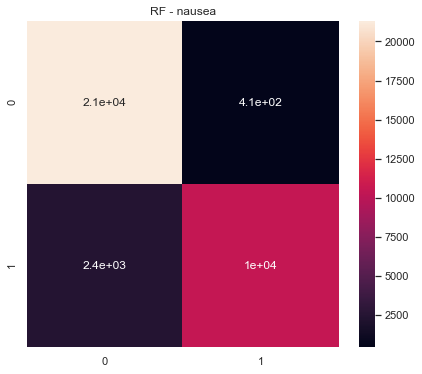

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  nausea  300.0  0.447317      0.512464         0.549025   0.568091
0   2.0  nausea  300.0  0.442707      0.512024         0.552982   0.572278
0   3.0  nausea  300.0  0.412229      0.454093         0.415549   0.496194
0   4.0  nausea  300.0  0.405794      0.462141         0.411029   0.448818
0   5.0  nausea  300.0  0.447735      0.515793         0.570081   0.547903



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nausea  300.0  2.155783    2.456514       2.498666  2.633285
================================== SGD ==================================


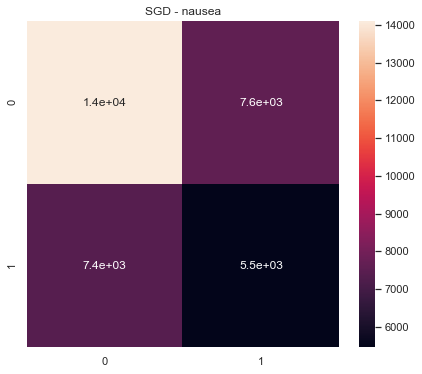

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  nausea  300.0  0.519149      0.526391         0.524689   0.537871
0   2.0  nausea  300.0  0.494987      0.506894         0.509210   0.487207
0   3.0  nausea  300.0  0.499797      0.499958         0.499957   0.496227
0   4.0  nausea  300.0  0.468680      0.472250         0.473972   0.455066
0   5.0  nausea  300.0  0.523594      0.524326         0.526153   0.526966



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nausea  300.0  2.506207    2.529819       2.533982  2.503337
================================== LR ==================================


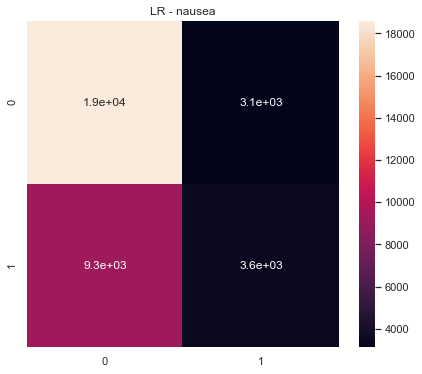

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  nausea  300.0  0.516269      0.526026         0.534802   0.558517
0   2.0  nausea  300.0  0.464278      0.511118         0.528233   0.520394
0   3.0  nausea  300.0  0.483787      0.487429         0.485971   0.484432
0   4.0  nausea  300.0  0.467063      0.467465         0.466885   0.448622
0   5.0  nausea  300.0  0.519871      0.530985         0.543088   0.528706



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nausea  300.0  2.451269    2.523024       2.558978  2.540672
================================== nervous.tension ==================================
================================== NB ==================================


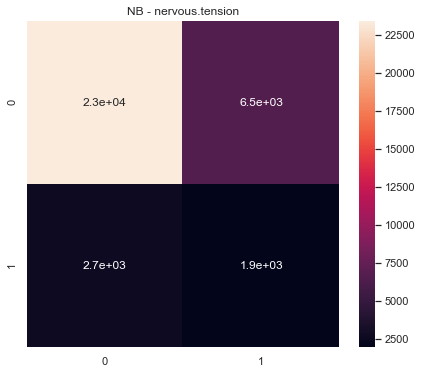

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nervous.tension  300.0  0.546572      0.552789         0.543725   
0   2.0  nervous.tension  300.0  0.546100      0.554329         0.543126   
0   3.0  nervous.tension  300.0  0.534941      0.567350         0.539873   
0   4.0  nervous.tension  300.0  0.545729      0.560784         0.543319   
0   5.0  nervous.tension  300.0  0.521220      0.530980         0.522114   

   ROC Macro  
0   0.617346  
0   0.585851  
0   0.616614  
0   0.606507  
0   0.561931  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nervous.tension  300.0  2.694563    2.766233       2.692157  2.988248
================================== DT ==================================


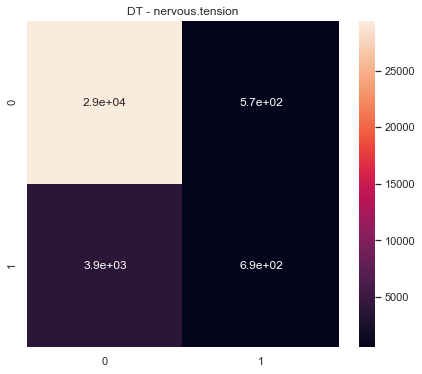

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nervous.tension  300.0  0.488562      0.507836         0.554896   
0   2.0  nervous.tension  300.0  0.484987      0.502157         0.508919   
0   3.0  nervous.tension  300.0  0.485500      0.485804         0.485258   
0   4.0  nervous.tension  300.0  0.472514      0.495943         0.479389   
0   5.0  nervous.tension  300.0  0.474235      0.493683         0.477584   

   ROC Macro  
0   0.544642  
0   0.522046  
0   0.522354  
0   0.519302  
0   0.457020  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nervous.tension  300.0  2.405798    2.485424       2.506046  2.565365
================================== RF ==================================


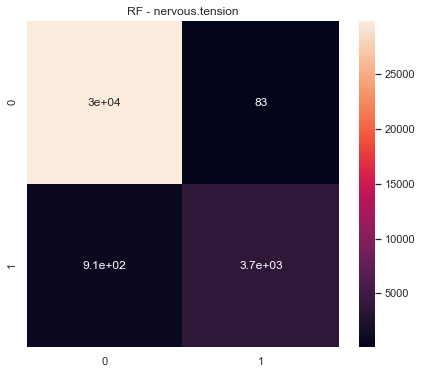

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nervous.tension  300.0  0.464133      0.499749         0.433256   
0   2.0  nervous.tension  300.0  0.465249      0.500292         0.558319   
0   3.0  nervous.tension  300.0  0.476546      0.487374         0.475305   
0   4.0  nervous.tension  300.0  0.463967      0.499415         0.433217   
0   5.0  nervous.tension  300.0  0.464086      0.499666         0.433237   

   ROC Macro  
0   0.593693  
0   0.605327  
0   0.556732  
0   0.564122  
0   0.592867  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  nervous.tension  300.0  2.333982    2.486497       2.333334  2.91274
================================== SGD ==================================


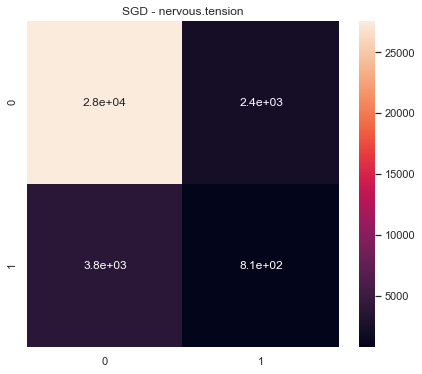

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nervous.tension  300.0  0.485688      0.485550         0.485847   
0   2.0  nervous.tension  300.0  0.482080      0.482592         0.481674   
0   3.0  nervous.tension  300.0  0.504274      0.504243         0.504326   
0   4.0  nervous.tension  300.0  0.474212      0.486583         0.472078   
0   5.0  nervous.tension  300.0  0.489752      0.492148         0.489848   

   ROC Macro  
0   0.466302  
0   0.520884  
0   0.444865  
0   0.486656  
0   0.468819  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nervous.tension  300.0  2.436005    2.451116       2.433773  2.387526
================================== LR ==================================


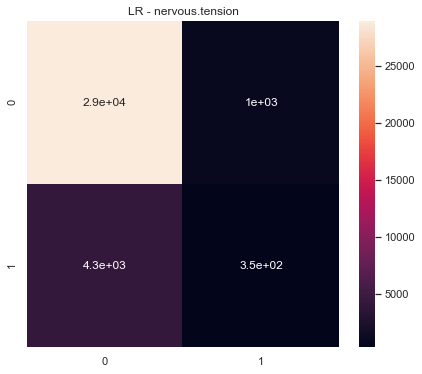

   Fold              ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  nervous.tension  300.0  0.520037      0.519104         0.522750   
0   2.0  nervous.tension  300.0  0.477534      0.493098         0.480784   
0   3.0  nervous.tension  300.0  0.525244      0.539376         0.526699   
0   4.0  nervous.tension  300.0  0.486612      0.489068         0.492197   
0   5.0  nervous.tension  300.0  0.516131      0.518360         0.515699   

   ROC Macro  
0   0.646605  
0   0.550915  
0   0.526513  
0   0.505007  
0   0.562645  



               ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  nervous.tension  300.0  2.525557    2.559006       2.538129  2.791685
================================== neumonia ==================================
================================== NB ==================================


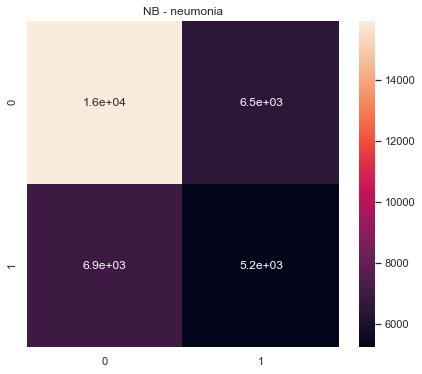

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neumonia  300.0  0.523231      0.524295         0.526938   0.544499
0   2.0  neumonia  300.0  0.548050      0.547663         0.551315   0.560185
0   3.0  neumonia  300.0  0.524993      0.524869         0.525527   0.537980
0   4.0  neumonia  300.0  0.534187      0.535133         0.534060   0.540455
0   5.0  neumonia  300.0  0.520309      0.523273         0.527410   0.531016



        ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neumonia  300.0  2.65077    2.655233        2.66525  2.714135
================================== DT ==================================


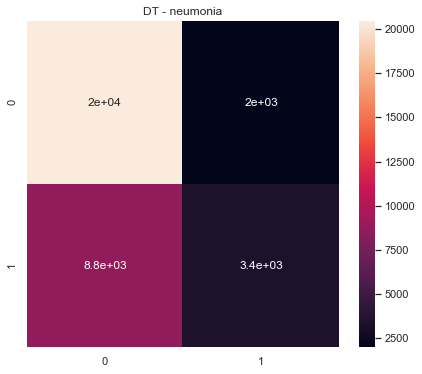

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neumonia  300.0  0.513784      0.527114         0.541130   0.557044
0   2.0  neumonia  300.0  0.508159      0.529087         0.552299   0.546642
0   3.0  neumonia  300.0  0.505849      0.527437         0.549650   0.559026
0   4.0  neumonia  300.0  0.497753      0.517548         0.529356   0.541227
0   5.0  neumonia  300.0  0.502176      0.526883         0.551846   0.522141



        ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  neumonia  300.0  2.527719    2.628069       2.724283  2.72608
================================== RF ==================================


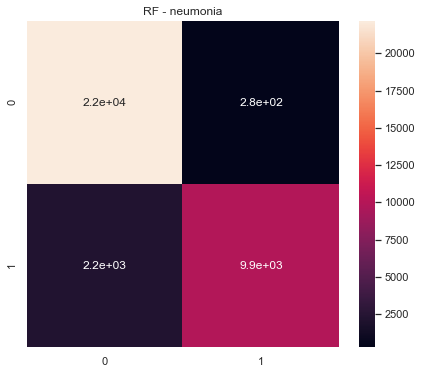

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neumonia  300.0  0.457581      0.515580         0.561865   0.588816
0   2.0  neumonia  300.0  0.446454      0.513966         0.573985   0.567821
0   3.0  neumonia  300.0  0.450970      0.503252         0.509878   0.567358
0   4.0  neumonia  300.0  0.455700      0.502695         0.507240   0.536763
0   5.0  neumonia  300.0  0.455233      0.513523         0.552874   0.566927



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neumonia  300.0  2.265939    2.549015       2.705841  2.827685
================================== SGD ==================================


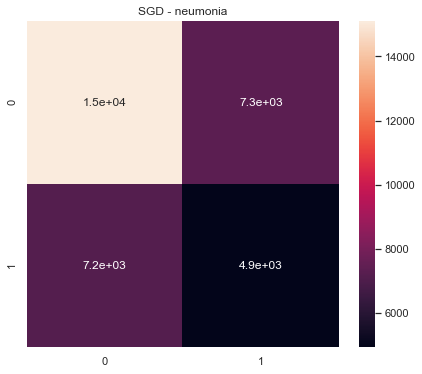

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neumonia  300.0  0.512092      0.512834         0.512388   0.516755
0   2.0  neumonia  300.0  0.516040      0.519264         0.522673   0.533034
0   3.0  neumonia  300.0  0.494990      0.494992         0.495035   0.497918
0   4.0  neumonia  300.0  0.513250      0.514472         0.513838   0.519651
0   5.0  neumonia  300.0  0.495197      0.496167         0.495931   0.495894



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neumonia  300.0  2.531569    2.537729       2.539865  2.563252
================================== LR ==================================


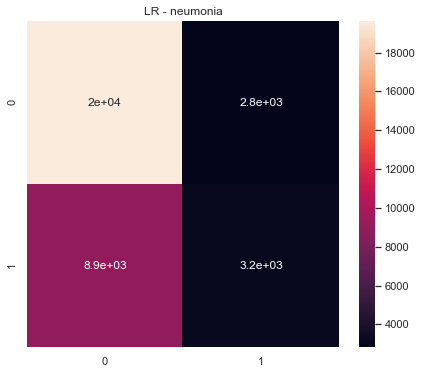

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neumonia  300.0  0.522134      0.522037         0.522553   0.527972
0   2.0  neumonia  300.0  0.493783      0.516962         0.530279   0.531471
0   3.0  neumonia  300.0  0.519344      0.519520         0.520536   0.524686
0   4.0  neumonia  300.0  0.504105      0.509995         0.512333   0.515779
0   5.0  neumonia  300.0  0.496365      0.502704         0.503322   0.493277



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neumonia  300.0  2.535731    2.571218       2.589022  2.593184
================================== neuropathy.peripheral ==================================
================================== NB ==================================


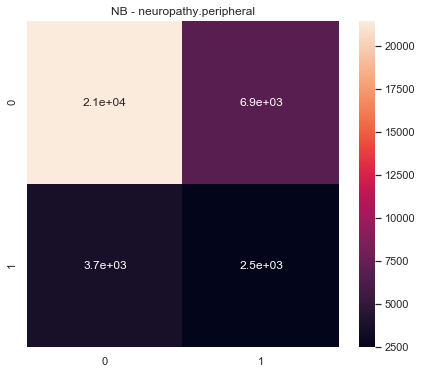

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  neuropathy.peripheral  300.0  0.534094      0.539346   
0   2.0  neuropathy.peripheral  300.0  0.524164      0.528035   
0   3.0  neuropathy.peripheral  300.0  0.495527      0.504298   
0   4.0  neuropathy.peripheral  300.0  0.536723      0.546247   
0   5.0  neuropathy.peripheral  300.0  0.532317      0.532796   

   Precision Macro  ROC Macro  
0         0.533068   0.588862  
0         0.523799   0.535412  
0         0.503097   0.536717  
0         0.536344   0.547011  
0         0.531922   0.576025  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy.peripheral  300.0  2.622826    2.650723        2.62823  2.784026
================================== DT ==================================


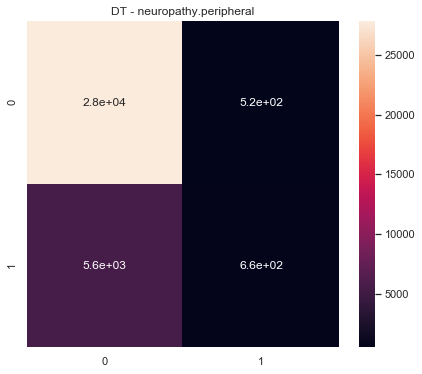

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  neuropathy.peripheral  300.0  0.474330      0.504194   
0   2.0  neuropathy.peripheral  300.0  0.473939      0.495247   
0   3.0  neuropathy.peripheral  300.0  0.448433      0.464619   
0   4.0  neuropathy.peripheral  300.0  0.470491      0.498901   
0   5.0  neuropathy.peripheral  300.0  0.479554      0.507275   

   Precision Macro  ROC Macro  
0         0.525050   0.524678  
0         0.486209   0.522469  
0         0.439374   0.481939  
0         0.495069   0.528649  
0         0.542503   0.537930  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy.peripheral  300.0  2.346747    2.470237       2.488205  2.595665
================================== RF ==================================


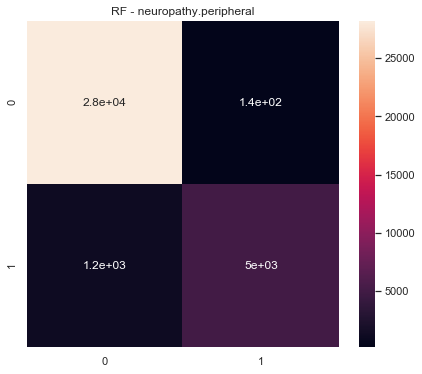

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  neuropathy.peripheral  300.0  0.454536      0.501484   
0   2.0  neuropathy.peripheral  300.0  0.458841      0.493243   
0   3.0  neuropathy.peripheral  300.0  0.440375      0.463514   
0   4.0  neuropathy.peripheral  300.0  0.452780      0.500502   
0   5.0  neuropathy.peripheral  300.0  0.452030      0.500276   

   Precision Macro  ROC Macro  
0         0.637622   0.574621  
0         0.464381   0.557678  
0         0.424821   0.515765  
0         0.546568   0.552839  
0         0.535158   0.591534  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy.peripheral  300.0  2.258562    2.459019        2.60855  2.792437
================================== SGD ==================================


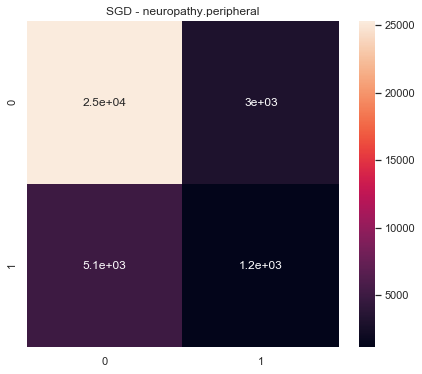

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  neuropathy.peripheral  300.0  0.465692      0.464824   
0   2.0  neuropathy.peripheral  300.0  0.518430      0.519039   
0   3.0  neuropathy.peripheral  300.0  0.448564      0.446952   
0   4.0  neuropathy.peripheral  300.0  0.474168      0.481579   
0   5.0  neuropathy.peripheral  300.0  0.470302      0.475740   

   Precision Macro  ROC Macro  
0         0.466805   0.457193  
0         0.526868   0.535103  
0         0.450470   0.404010  
0         0.473267   0.448368  
0         0.468366   0.443530  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy.peripheral  300.0  2.377157    2.388135       2.385775  2.288205
================================== LR ==================================


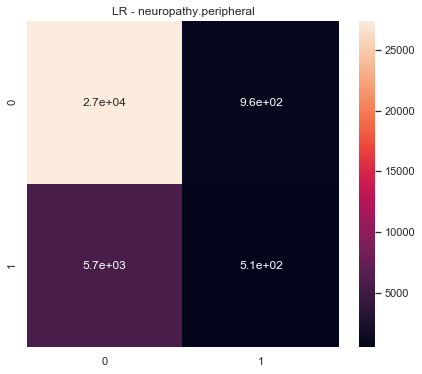

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  neuropathy.peripheral  300.0  0.544509      0.541523   
0   2.0  neuropathy.peripheral  300.0  0.526515      0.527848   
0   3.0  neuropathy.peripheral  300.0  0.471092      0.471550   
0   4.0  neuropathy.peripheral  300.0  0.468903      0.473139   
0   5.0  neuropathy.peripheral  300.0  0.496609      0.500456   

   Precision Macro  ROC Macro  
0         0.556236   0.589531  
0         0.550343   0.561010  
0         0.470693   0.480188  
0         0.466925   0.503265  
0         0.500652   0.502502  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy.peripheral  300.0  2.507627    2.514516       2.544849  2.636496
================================== neuropathy ==================================
================================== NB ==================================


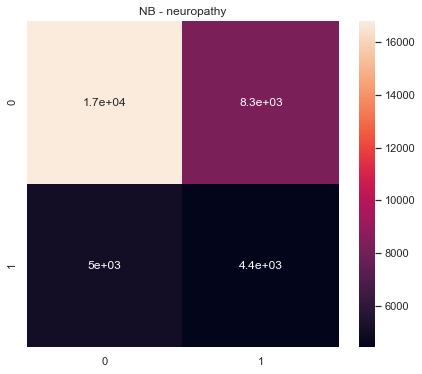

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neuropathy  300.0  0.542946      0.545955         0.542330   0.560665
0   2.0  neuropathy  300.0  0.530124      0.538877         0.533160   0.553772
0   3.0  neuropathy  300.0  0.528974      0.548728         0.539506   0.567529
0   4.0  neuropathy  300.0  0.544137      0.548734         0.543845   0.579246
0   5.0  neuropathy  300.0  0.520380      0.521264         0.520232   0.551502



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy  300.0  2.666561    2.703558       2.679073  2.812713
================================== DT ==================================


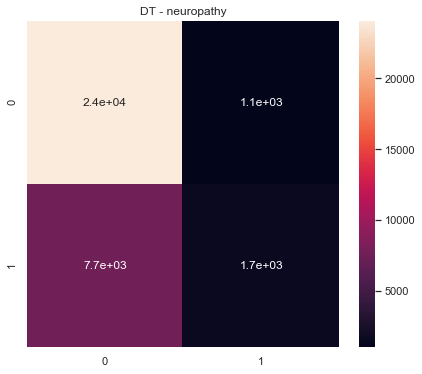

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neuropathy  300.0  0.474222      0.506078         0.517360   0.536183
0   2.0  neuropathy  300.0  0.461574      0.502011         0.507147   0.524304
0   3.0  neuropathy  300.0  0.471928      0.503990         0.511198   0.532371
0   4.0  neuropathy  300.0  0.481231      0.505198         0.511722   0.531871
0   5.0  neuropathy  300.0  0.457029      0.503013         0.513241   0.516959



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy  300.0  2.345984     2.52029       2.560668  2.641688
================================== RF ==================================


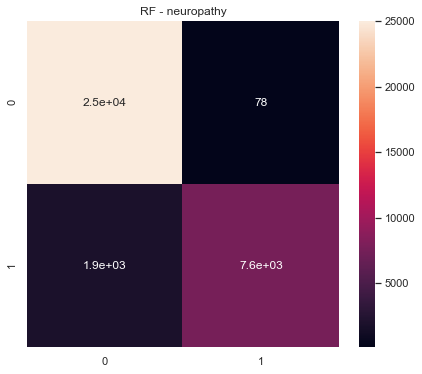

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neuropathy  300.0  0.432190      0.502859         0.567132   0.578625
0   2.0  neuropathy  300.0  0.428475      0.501939         0.568685   0.558390
0   3.0  neuropathy  300.0  0.434595      0.493767         0.461007   0.572443
0   4.0  neuropathy  300.0  0.437364      0.499515         0.495787   0.543249
0   5.0  neuropathy  300.0  0.428090      0.501145         0.533664   0.580284



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy  300.0  2.160713    2.499225       2.626275  2.832991
================================== SGD ==================================


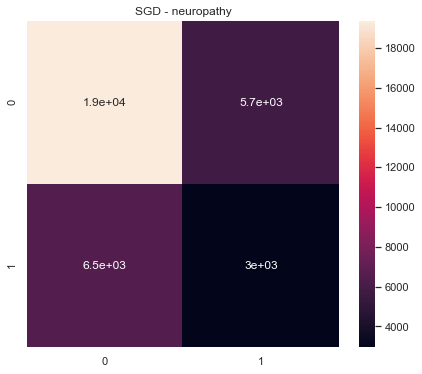

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neuropathy  300.0  0.509242      0.509224         0.509267   0.520475
0   2.0  neuropathy  300.0  0.516613      0.517214         0.519747   0.541427
0   3.0  neuropathy  300.0  0.515399      0.515927         0.515312   0.518308
0   4.0  neuropathy  300.0  0.505006      0.505040         0.504994   0.507127
0   5.0  neuropathy  300.0  0.519308      0.519973         0.523318   0.543217



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy  300.0  2.565568    2.567377       2.572637  2.630554
================================== LR ==================================


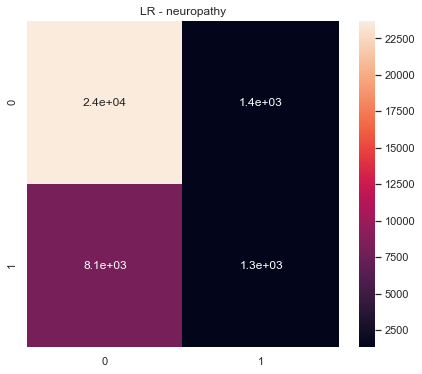

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  neuropathy  300.0  0.523043      0.531058         0.553147   0.556090
0   2.0  neuropathy  300.0  0.517555      0.520308         0.526460   0.548218
0   3.0  neuropathy  300.0  0.527115      0.527112         0.531217   0.522121
0   4.0  neuropathy  300.0  0.527444      0.530508         0.542795   0.540690
0   5.0  neuropathy  300.0  0.475669      0.498451         0.496794   0.538288



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  neuropathy  300.0  2.570826    2.607438       2.650413  2.705407
================================== night.sweat ==================================
================================== NB ==================================


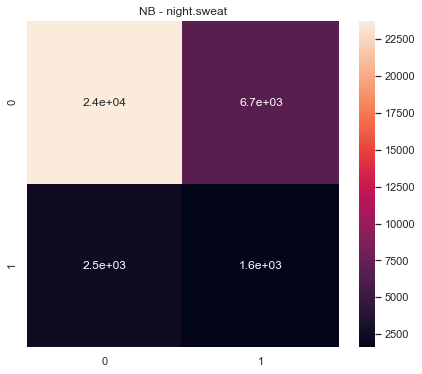

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  night.sweat  300.0  0.526300      0.540709         0.527006   
0   2.0  night.sweat  300.0  0.523825      0.553308         0.530210   
0   3.0  night.sweat  300.0  0.509046      0.539848         0.521410   
0   4.0  night.sweat  300.0  0.537170      0.557022         0.536740   
0   5.0  night.sweat  300.0  0.525411      0.537993         0.525803   

   ROC Macro  
0   0.613008  
0   0.558980  
0   0.577089  
0   0.594506  
0   0.575248  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  night.sweat  300.0  2.621752    2.728879       2.641168  2.918831
================================== DT ==================================


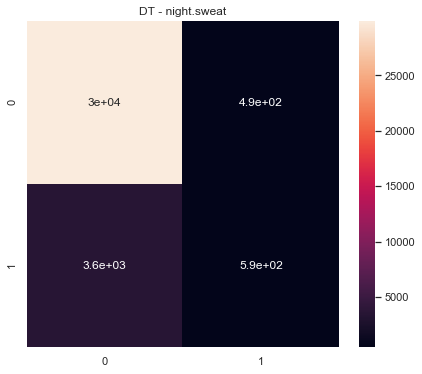

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  night.sweat  300.0  0.506049      0.513201         0.544916   
0   2.0  night.sweat  300.0  0.493875      0.502264         0.505544   
0   3.0  night.sweat  300.0  0.502179      0.502743         0.503381   
0   4.0  night.sweat  300.0  0.487134      0.502906         0.513283   
0   5.0  night.sweat  300.0  0.499670      0.509702         0.536877   

   ROC Macro  
0   0.566484  
0   0.487797  
0   0.505673  
0   0.486182  
0   0.511413  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  night.sweat  300.0  2.488908    2.530816       2.604002  2.557551
================================== RF ==================================


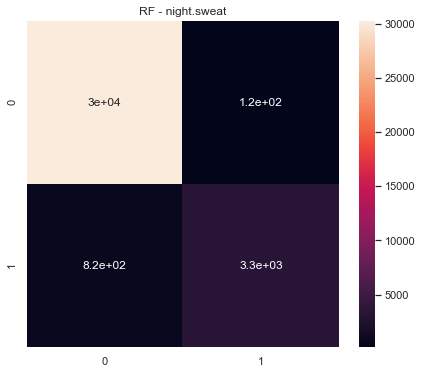

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  night.sweat  300.0  0.467848      0.499671         0.439835   
0   2.0  night.sweat  300.0  0.479091      0.496668         0.486803   
0   3.0  night.sweat  300.0  0.489129      0.494624         0.490911   
0   4.0  night.sweat  300.0  0.469871      0.500132         0.506478   
0   5.0  night.sweat  300.0  0.467966      0.499918         0.439852   

   ROC Macro  
0   0.596999  
0   0.568783  
0   0.569232  
0   0.548871  
0   0.586398  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  night.sweat  300.0  2.373904    2.491014        2.36388  2.870283
================================== SGD ==================================


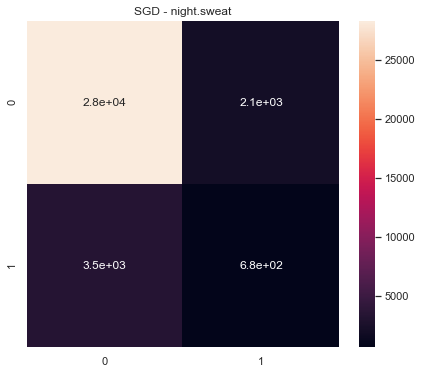

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  night.sweat  300.0  0.496191      0.498006         0.497331   
0   2.0  night.sweat  300.0  0.486676      0.488584         0.486043   
0   3.0  night.sweat  300.0  0.472650      0.471710         0.480372   
0   4.0  night.sweat  300.0  0.488889      0.500943         0.502909   
0   5.0  night.sweat  300.0  0.487958      0.487595         0.488671   

   ROC Macro  
0   0.499732  
0   0.443941  
0   0.399022  
0   0.478109  
0   0.491325  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  night.sweat  300.0  2.432364    2.446839       2.455327  2.312129
================================== LR ==================================


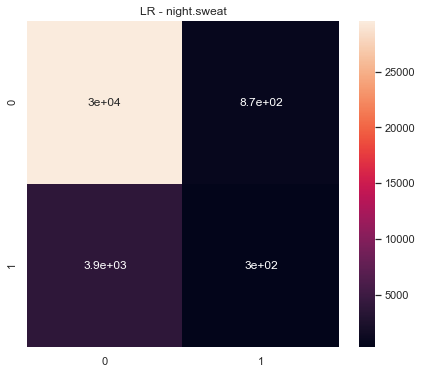

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  night.sweat  300.0  0.531993      0.533270         0.531043   
0   2.0  night.sweat  300.0  0.487681      0.502931         0.512790   
0   3.0  night.sweat  300.0  0.508484      0.527126         0.515993   
0   4.0  night.sweat  300.0  0.502223      0.502246         0.502403   
0   5.0  night.sweat  300.0  0.530941      0.539281         0.529408   

   ROC Macro  
0   0.618216  
0   0.481109  
0   0.522616  
0   0.530706  
0   0.550579  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  night.sweat  300.0  2.561323    2.604855       2.591637  2.703226
================================== obesity ==================================
================================== NB ==================================


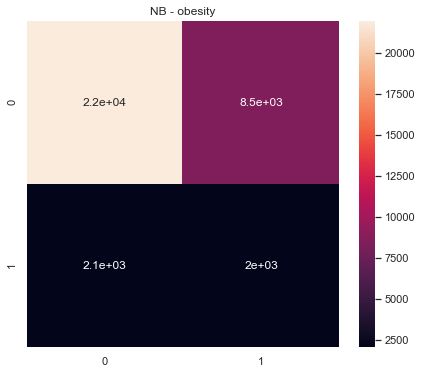

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  obesity  300.0  0.534719      0.566422         0.538176   0.636446
0   2.0  obesity  300.0  0.520332      0.558130         0.530893   0.587690
0   3.0  obesity  300.0  0.496026      0.554423         0.525314   0.591519
0   4.0  obesity  300.0  0.526933      0.574001         0.538206   0.609444
0   5.0  obesity  300.0  0.524940      0.557631         0.531977   0.620672



       ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  obesity  300.0  2.602949    2.810606       2.664567  3.04577
================================== DT ==================================


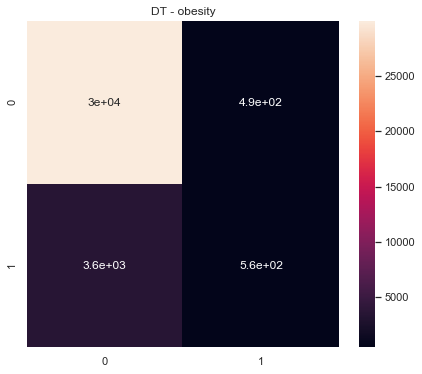

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  obesity  300.0  0.501915      0.512206         0.556454   0.545161
0   2.0  obesity  300.0  0.497180      0.503293         0.507007   0.535075
0   3.0  obesity  300.0  0.478745      0.487619         0.477048   0.520608
0   4.0  obesity  300.0  0.500745      0.509799         0.534248   0.571480
0   5.0  obesity  300.0  0.502052      0.508342         0.521141   0.545607



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  obesity  300.0  2.480637     2.52126       2.595898  2.717932
================================== RF ==================================


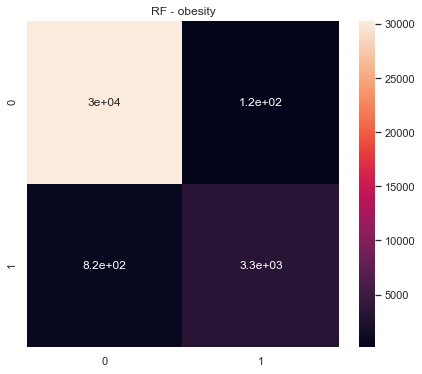

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  obesity  300.0  0.468175      0.499918         0.440223   0.613059
0   2.0  obesity  300.0  0.480462      0.498224         0.492293   0.597208
0   3.0  obesity  300.0  0.461559      0.480748         0.447104   0.584685
0   4.0  obesity  300.0  0.464673      0.493013         0.439414   0.602405
0   5.0  obesity  300.0  0.480812      0.502145         0.517375   0.610872



       ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  obesity  300.0  2.355682    2.474049       2.336409  3.00823
================================== SGD ==================================


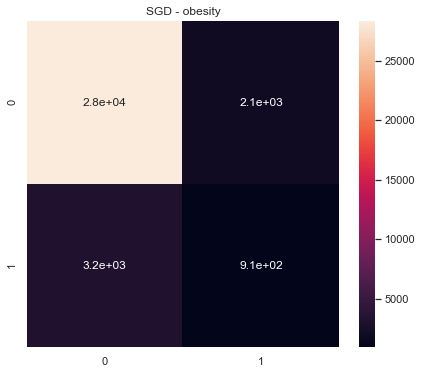

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  obesity  300.0  0.496331      0.496845         0.496425   0.508094
0   2.0  obesity  300.0  0.500921      0.501974         0.502580   0.522604
0   3.0  obesity  300.0  0.480055      0.479217         0.481336   0.475296
0   4.0  obesity  300.0  0.488610      0.490445         0.488203   0.508922
0   5.0  obesity  300.0  0.470538      0.473775         0.468137   0.507581



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  obesity  300.0  2.436456    2.442256       2.436681  2.522497
================================== LR ==================================


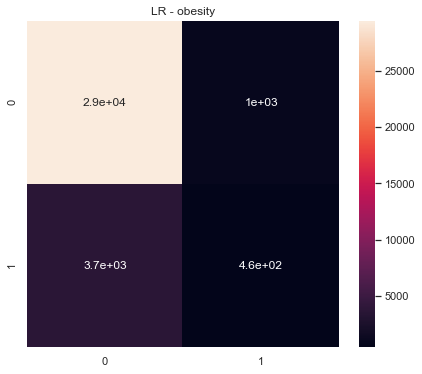

   Fold      ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  obesity  300.0  0.505199      0.507269         0.505864   0.598708
0   2.0  obesity  300.0  0.485225      0.490195         0.484942   0.586023
0   3.0  obesity  300.0  0.493205      0.493117         0.493808   0.539194
0   4.0  obesity  300.0  0.507146      0.511105         0.508376   0.520083
0   5.0  obesity  300.0  0.538980      0.546125         0.536403   0.593436



       ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  obesity  300.0  2.529754    2.547811       2.529393  2.837443
================================== osteomyelitis ==================================
================================== NB ==================================


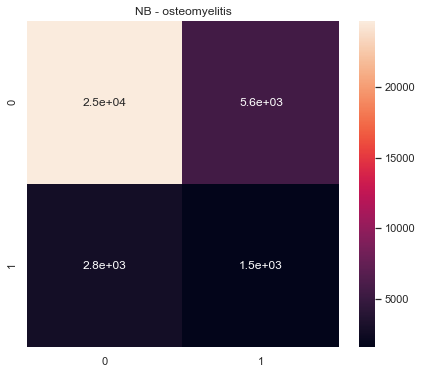

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteomyelitis  300.0  0.536987      0.546259         0.534842   
0   2.0  osteomyelitis  300.0  0.530134      0.543731         0.529959   
0   3.0  osteomyelitis  300.0  0.511990      0.527610         0.517230   
0   4.0  osteomyelitis  300.0  0.522992      0.529505         0.522427   
0   5.0  osteomyelitis  300.0  0.517779      0.520626         0.517200   

   ROC Macro  
0   0.596143  
0   0.580592  
0   0.574500  
0   0.533594  
0   0.579918  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteomyelitis  300.0  2.619882    2.667732       2.621658  2.864746
================================== DT ==================================


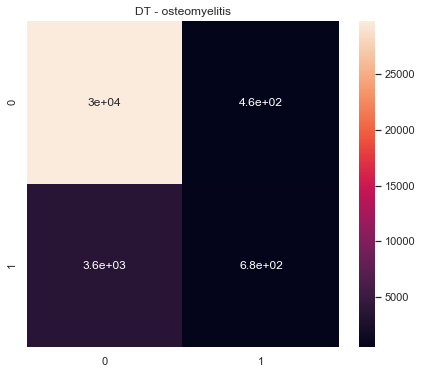

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteomyelitis  300.0  0.515199      0.521353         0.603605   
0   2.0  osteomyelitis  300.0  0.503689      0.515044         0.588227   
0   3.0  osteomyelitis  300.0  0.473380      0.483860         0.469701   
0   4.0  osteomyelitis  300.0  0.517343      0.520386         0.559862   
0   5.0  osteomyelitis  300.0  0.516187      0.519518         0.556643   

   ROC Macro  
0   0.534185  
0   0.521048  
0   0.481001  
0   0.478793  
0   0.568058  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteomyelitis  300.0  2.525798    2.560161       2.778037  2.583085
================================== RF ==================================


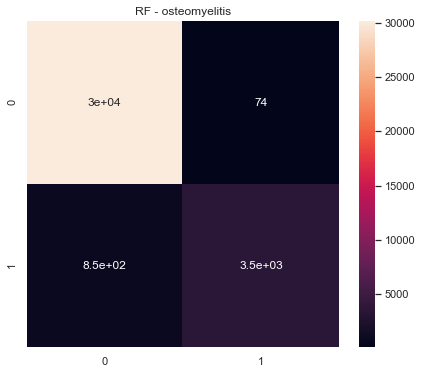

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteomyelitis  300.0  0.473720      0.503154         0.738043   
0   2.0  osteomyelitis  300.0  0.471502      0.502240         0.837944   
0   3.0  osteomyelitis  300.0  0.462306      0.483564         0.447985   
0   4.0  osteomyelitis  300.0  0.490417      0.506176         0.531721   
0   5.0  osteomyelitis  300.0  0.470265      0.501496         0.687926   

   ROC Macro  
0   0.620613  
0   0.616321  
0   0.532758  
0   0.525624  
0   0.571059  



             ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteomyelitis  300.0  2.36821     2.49663       3.243619  2.866375
================================== SGD ==================================


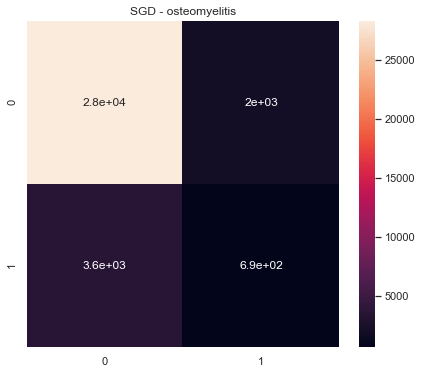

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteomyelitis  300.0  0.471223      0.479157         0.467157   
0   2.0  osteomyelitis  300.0  0.512670      0.516334         0.541836   
0   3.0  osteomyelitis  300.0  0.455439      0.456515         0.454407   
0   4.0  osteomyelitis  300.0  0.456294      0.455705         0.456901   
0   5.0  osteomyelitis  300.0  0.463961      0.470820         0.459032   

   ROC Macro  
0   0.476299  
0   0.485704  
0   0.385377  
0   0.396040  
0   0.482352  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteomyelitis  300.0  2.359588    2.378532       2.379333  2.225772
================================== LR ==================================


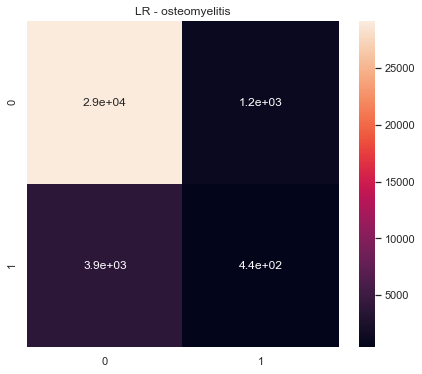

   Fold            ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteomyelitis  300.0  0.516229      0.518603         0.515734   
0   2.0  osteomyelitis  300.0  0.565486      0.566824         0.564283   
0   3.0  osteomyelitis  300.0  0.514204      0.527339         0.517762   
0   4.0  osteomyelitis  300.0  0.502800      0.506796         0.505028   
0   5.0  osteomyelitis  300.0  0.483945      0.484409         0.488411   

   ROC Macro  
0   0.534901  
0   0.579665  
0   0.529715  
0   0.491553  
0   0.501303  



             ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteomyelitis  300.0  2.582665    2.603972       2.591218  2.637137
================================== osteoporosis ==================================
================================== NB ==================================


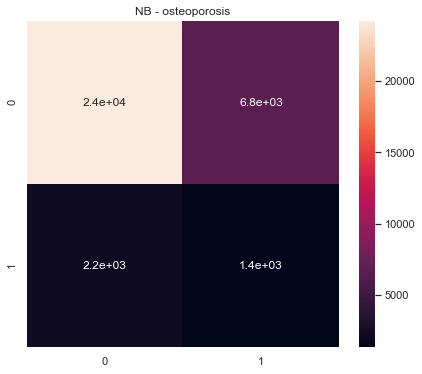

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteoporosis  300.0  0.527334      0.545216         0.527859   
0   2.0  osteoporosis  300.0  0.522830      0.553951         0.528655   
0   3.0  osteoporosis  300.0  0.496467      0.529201         0.513935   
0   4.0  osteoporosis  300.0  0.535468      0.557772         0.534905   
0   5.0  osteoporosis  300.0  0.518002      0.529953         0.519312   

   ROC Macro  
0   0.580327  
0   0.578337  
0   0.545866  
0   0.588375  
0   0.568162  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteoporosis  300.0  2.600101    2.716092       2.624667  2.861067
================================== DT ==================================


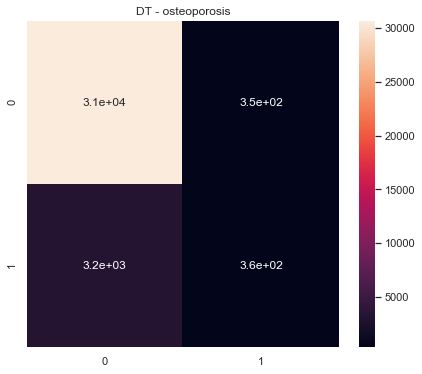

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteoporosis  300.0  0.501903      0.510030         0.542164   
0   2.0  osteoporosis  300.0  0.494174      0.500551         0.501225   
0   3.0  osteoporosis  300.0  0.465051      0.473536         0.458241   
0   4.0  osteoporosis  300.0  0.486101      0.502782         0.519881   
0   5.0  osteoporosis  300.0  0.478594      0.499998         0.499980   

   ROC Macro  
0   0.538653  
0   0.523997  
0   0.481808  
0   0.525154  
0   0.495968  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  osteoporosis  300.0  2.425822    2.486896       2.521491  2.56558
================================== RF ==================================


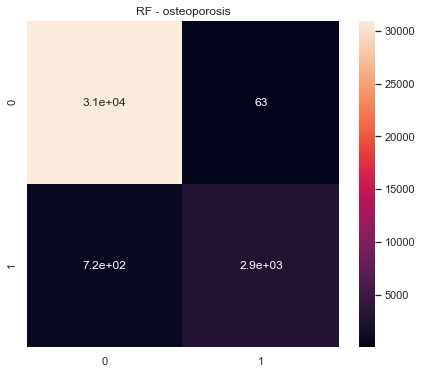

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteoporosis  300.0  0.473984      0.500376         0.548298   
0   2.0  osteoporosis  300.0  0.472640      0.499919         0.448184   
0   3.0  osteoporosis  300.0  0.460241      0.475622         0.445823   
0   4.0  osteoporosis  300.0  0.473731      0.499972         0.498188   
0   5.0  osteoporosis  300.0  0.472595      0.499758         0.448233   

   ROC Macro  
0   0.589395  
0   0.600311  
0   0.514688  
0   0.461517  
0   0.594981  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteoporosis  300.0  2.353191    2.475647       2.388727  2.760891
================================== SGD ==================================


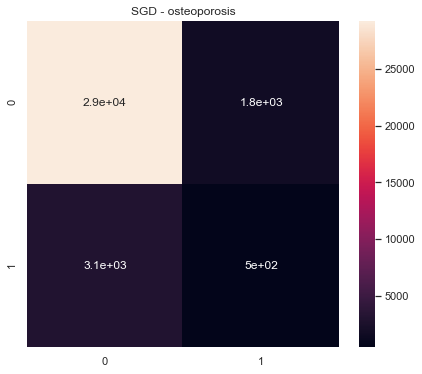

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteoporosis  300.0  0.491831      0.492645         0.491560   
0   2.0  osteoporosis  300.0  0.509585      0.509268         0.510711   
0   3.0  osteoporosis  300.0  0.480416      0.480565         0.480272   
0   4.0  osteoporosis  300.0  0.492568      0.492654         0.492496   
0   5.0  osteoporosis  300.0  0.476172      0.477521         0.475047   

   ROC Macro  
0   0.445249  
0   0.428000  
0   0.407772  
0   0.452524  
0   0.461298  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteoporosis  300.0  2.450572    2.452654       2.450087  2.194844
================================== LR ==================================


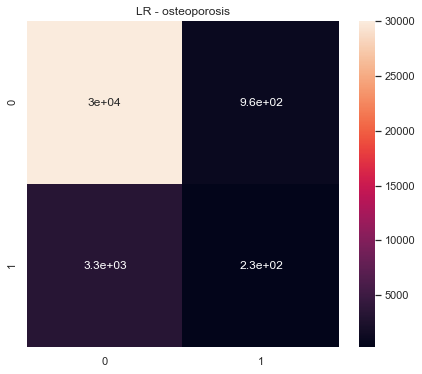

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  osteoporosis  300.0  0.526270      0.537580         0.525504   
0   2.0  osteoporosis  300.0  0.510620      0.510297         0.513098   
0   3.0  osteoporosis  300.0  0.501163      0.515046         0.508623   
0   4.0  osteoporosis  300.0  0.494371      0.495571         0.496651   
0   5.0  osteoporosis  300.0  0.497093      0.499376         0.499544   

   ROC Macro  
0   0.551340  
0   0.559043  
0   0.508510  
0   0.465107  
0   0.499379  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  osteoporosis  300.0  2.529517     2.55787       2.543421  2.583377
================================== palpitation ==================================
================================== NB ==================================


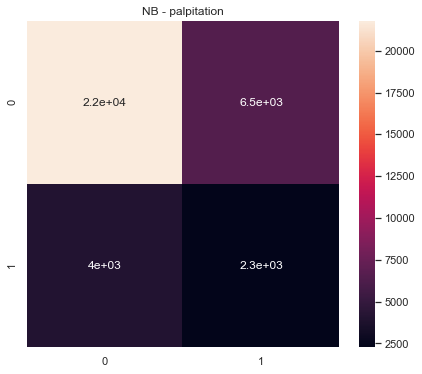

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  palpitation  300.0  0.544811      0.544423         0.545238   
0   2.0  palpitation  300.0  0.536355      0.543737         0.535552   
0   3.0  palpitation  300.0  0.505663      0.520675         0.514415   
0   4.0  palpitation  300.0  0.533750      0.537904         0.532665   
0   5.0  palpitation  300.0  0.518220      0.519433         0.517848   

   ROC Macro  
0   0.586961  
0   0.572006  
0   0.535559  
0   0.557743  
0   0.549087  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  palpitation  300.0  2.638798    2.666172       2.645718  2.801356
================================== DT ==================================


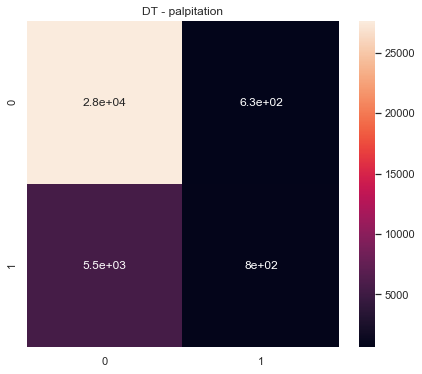

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  palpitation  300.0  0.505685      0.516571         0.543668   
0   2.0  palpitation  300.0  0.486205      0.499828         0.499618   
0   3.0  palpitation  300.0  0.460244      0.485119         0.458638   
0   4.0  palpitation  300.0  0.472720      0.494897         0.484978   
0   5.0  palpitation  300.0  0.488817      0.509633         0.537583   

   ROC Macro  
0   0.569317  
0   0.516910  
0   0.508922  
0   0.512227  
0   0.539866  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  palpitation  300.0  2.413671    2.506049       2.524486  2.647241
================================== RF ==================================


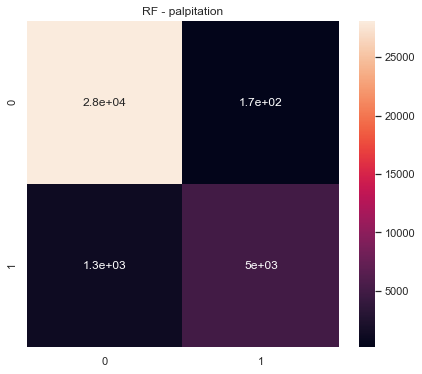

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  palpitation  300.0  0.455626      0.500651         0.516068   
0   2.0  palpitation  300.0  0.457461      0.495550         0.468552   
0   3.0  palpitation  300.0  0.428709      0.454682         0.406997   
0   4.0  palpitation  300.0  0.445468      0.488090         0.416873   
0   5.0  palpitation  300.0  0.451264      0.500351         0.551724   

   ROC Macro  
0   0.579915  
0   0.558276  
0   0.502248  
0   0.431005  
0   0.548555  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  palpitation  300.0  2.238528    2.439324       2.360215  2.619999
================================== SGD ==================================


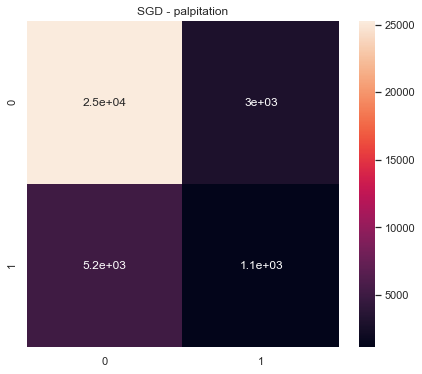

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  palpitation  300.0  0.460013      0.465206         0.456974   
0   2.0  palpitation  300.0  0.502132      0.507323         0.512053   
0   3.0  palpitation  300.0  0.454751      0.460085         0.451228   
0   4.0  palpitation  300.0  0.473608      0.479566         0.472354   
0   5.0  palpitation  300.0  0.500228      0.503799         0.505491   

   ROC Macro  
0   0.435339  
0   0.467737  
0   0.436219  
0   0.422585  
0   0.482438  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  palpitation  300.0  2.390732    2.415979         2.3981  2.244317
================================== LR ==================================


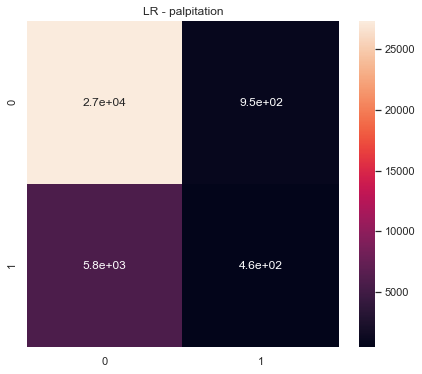

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  palpitation  300.0  0.522960      0.522467         0.523783   
0   2.0  palpitation  300.0  0.493272      0.506813         0.516895   
0   3.0  palpitation  300.0  0.475173      0.474384         0.477364   
0   4.0  palpitation  300.0  0.465691      0.470184         0.463390   
0   5.0  palpitation  300.0  0.505892      0.510806         0.518326   

   ROC Macro  
0   0.574158  
0   0.496550  
0   0.481375  
0   0.419625  
0   0.518753  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  palpitation  300.0  2.462988    2.484653       2.499758  2.490461
================================== pancreatitis ==================================
================================== NB ==================================


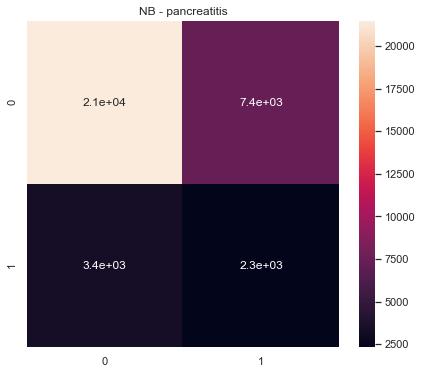

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pancreatitis  300.0  0.531185      0.539301         0.530770   
0   2.0  pancreatitis  300.0  0.511208      0.518254         0.513777   
0   3.0  pancreatitis  300.0  0.504432      0.520693         0.513736   
0   4.0  pancreatitis  300.0  0.537694      0.550232         0.537477   
0   5.0  pancreatitis  300.0  0.544328      0.556826         0.543032   

   ROC Macro  
0   0.572476  
0   0.509878  
0   0.547342  
0   0.576462  
0   0.588913  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pancreatitis  300.0  2.628847    2.685306       2.638792  2.795072
================================== DT ==================================


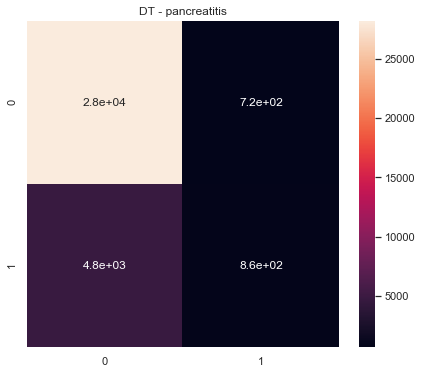

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pancreatitis  300.0  0.498008      0.511409         0.535724   
0   2.0  pancreatitis  300.0  0.492465      0.506532         0.518674   
0   3.0  pancreatitis  300.0  0.468034      0.481212         0.465463   
0   4.0  pancreatitis  300.0  0.504312      0.512467         0.528826   
0   5.0  pancreatitis  300.0  0.466340      0.484946         0.464460   

   ROC Macro  
0   0.505933  
0   0.502101  
0   0.495658  
0   0.533302  
0   0.511235  



            ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pancreatitis  300.0  2.42916    2.496565       2.513148  2.548229
================================== RF ==================================


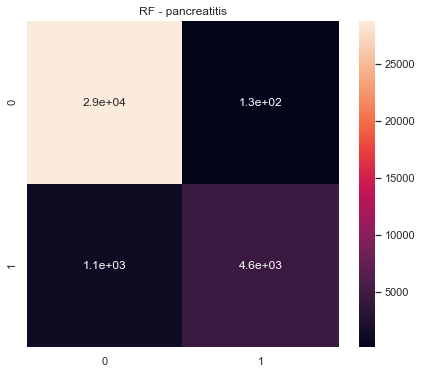

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pancreatitis  300.0  0.456826      0.500533         0.584468   
0   2.0  pancreatitis  300.0  0.469636      0.498102         0.490040   
0   3.0  pancreatitis  300.0  0.443281      0.476611         0.414307   
0   4.0  pancreatitis  300.0  0.455047      0.499827         0.417632   
0   5.0  pancreatitis  300.0  0.446483      0.482762         0.415276   

   ROC Macro  
0   0.578226  
0   0.524060  
0   0.538351  
0   0.546595  
0   0.538319  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pancreatitis  300.0  2.271273    2.457835       2.321723  2.725551
================================== SGD ==================================


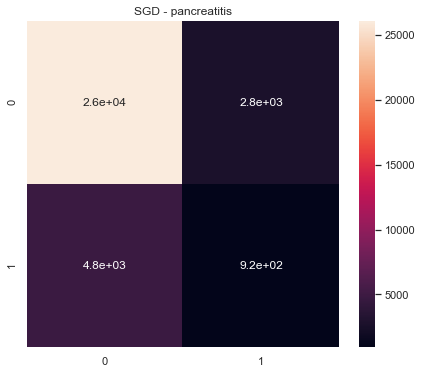

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pancreatitis  300.0  0.479659      0.487831         0.480397   
0   2.0  pancreatitis  300.0  0.508485      0.510619         0.515834   
0   3.0  pancreatitis  300.0  0.464328      0.474746         0.460217   
0   4.0  pancreatitis  300.0  0.496199      0.501380         0.502221   
0   5.0  pancreatitis  300.0  0.506754      0.506803         0.506718   

   ROC Macro  
0   0.517825  
0   0.486307  
0   0.396184  
0   0.471232  
0   0.525085  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pancreatitis  300.0  2.455425    2.481379       2.465387  2.396634
================================== LR ==================================


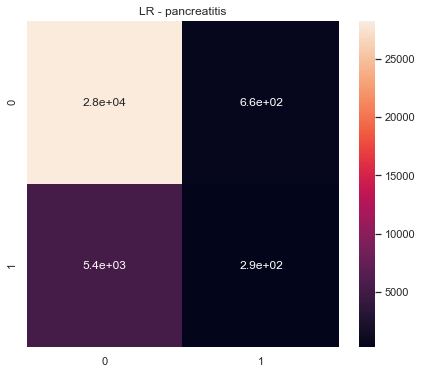

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pancreatitis  300.0  0.481545      0.496092         0.490753   
0   2.0  pancreatitis  300.0  0.499625      0.512548         0.539410   
0   3.0  pancreatitis  300.0  0.493252      0.493179         0.493444   
0   4.0  pancreatitis  300.0  0.515362      0.518297         0.533471   
0   5.0  pancreatitis  300.0  0.501852      0.504427         0.506282   

   ROC Macro  
0   0.537351  
0   0.521823  
0   0.494941  
0   0.529864  
0   0.551055  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pancreatitis  300.0  2.491636    2.524543        2.56336  2.635034
================================== panic.attack ==================================
================================== NB ==================================


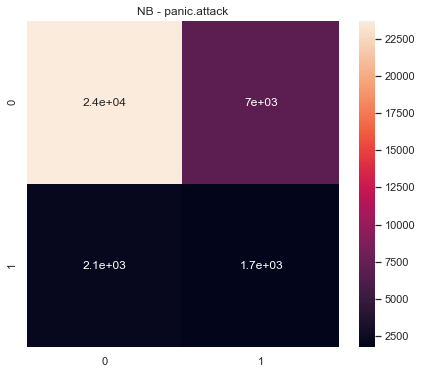

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  panic.attack  300.0  0.548262      0.562242         0.544396   
0   2.0  panic.attack  300.0  0.520337      0.544835         0.525582   
0   3.0  panic.attack  300.0  0.495938      0.532224         0.515683   
0   4.0  panic.attack  300.0  0.531785      0.569150         0.537232   
0   5.0  panic.attack  300.0  0.518385      0.531258         0.520246   

   ROC Macro  
0   0.640247  
0   0.587159  
0   0.588231  
0   0.610765  
0   0.573069  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  panic.attack  300.0  2.614706     2.73971       2.643139  2.99947
================================== DT ==================================


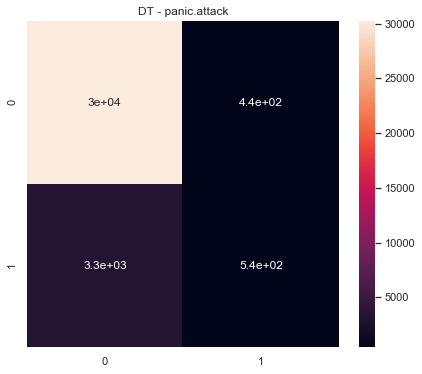

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  panic.attack  300.0  0.502319      0.511414         0.549811   
0   2.0  panic.attack  300.0  0.491276      0.501260         0.503596   
0   3.0  panic.attack  300.0  0.478562      0.485269         0.476120   
0   4.0  panic.attack  300.0  0.492755      0.502473         0.507226   
0   5.0  panic.attack  300.0  0.488475      0.503901         0.521089   

   ROC Macro  
0   0.557354  
0   0.571180  
0   0.517798  
0   0.523360  
0   0.502382  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  panic.attack  300.0  2.453387    2.504317       2.557843  2.672075
================================== RF ==================================


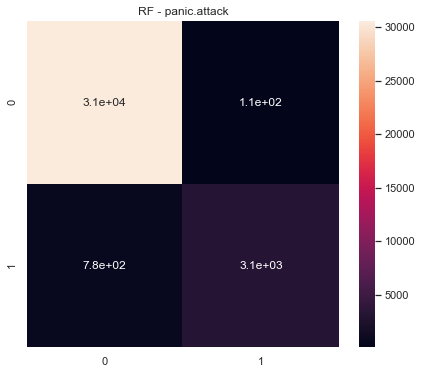

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  panic.attack  300.0  0.471324      0.500317         0.543736   
0   2.0  panic.attack  300.0  0.470462      0.490148         0.461819   
0   3.0  panic.attack  300.0  0.458733      0.473135         0.446350   
0   4.0  panic.attack  300.0  0.469726      0.499103         0.443615   
0   5.0  panic.attack  300.0  0.470169      0.499918         0.443761   

   ROC Macro  
0   0.586953  
0   0.561458  
0   0.563443  
0   0.560124  
0   0.614030  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  panic.attack  300.0  2.340414    2.462621       2.339282  2.886008
================================== SGD ==================================


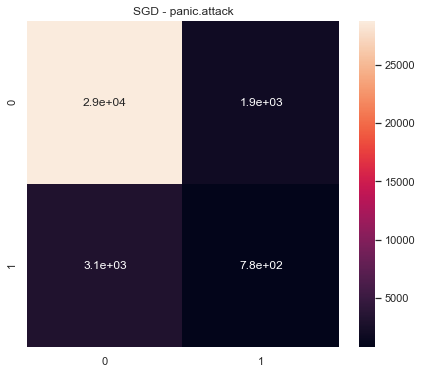

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  panic.attack  300.0  0.511801      0.511373         0.513316   
0   2.0  panic.attack  300.0  0.524865      0.523449         0.527684   
0   3.0  panic.attack  300.0  0.471182      0.469396         0.473651   
0   4.0  panic.attack  300.0  0.501422      0.502544         0.503441   
0   5.0  panic.attack  300.0  0.475856      0.479027         0.473760   

   ROC Macro  
0   0.444291  
0   0.490415  
0   0.439070  
0   0.513636  
0   0.526017  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  panic.attack  300.0  2.485126    2.485788       2.491851  2.41343
================================== LR ==================================


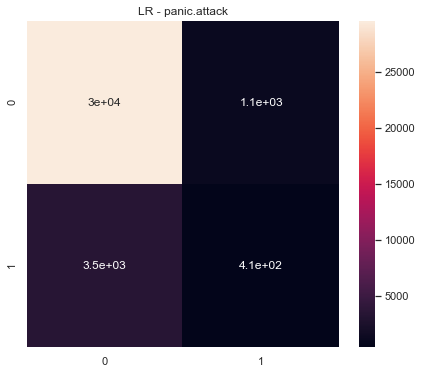

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  panic.attack  300.0  0.537401      0.538772         0.536314   
0   2.0  panic.attack  300.0  0.524622      0.522995         0.542833   
0   3.0  panic.attack  300.0  0.503941      0.520720         0.511953   
0   4.0  panic.attack  300.0  0.509693      0.522026         0.513822   
0   5.0  panic.attack  300.0  0.519934      0.538703         0.523343   

   ROC Macro  
0   0.592953  
0   0.551633  
0   0.520430  
0   0.547526  
0   0.571640  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  panic.attack  300.0  2.595592    2.643216       2.628266  2.784182
================================== pericardial.effusion ==================================
================================== NB ==================================


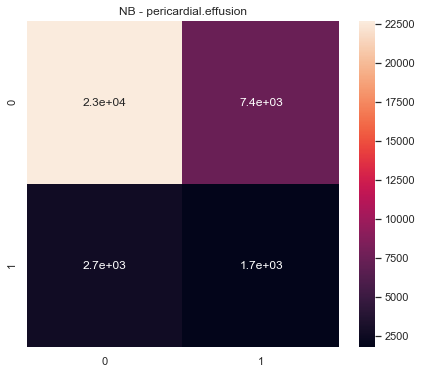

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pericardial.effusion  300.0  0.513018      0.527273         0.517513   
0   2.0  pericardial.effusion  300.0  0.536941      0.563390         0.538918   
0   3.0  pericardial.effusion  300.0  0.484266      0.512229         0.506411   
0   4.0  pericardial.effusion  300.0  0.510714      0.526713         0.516667   
0   5.0  pericardial.effusion  300.0  0.508098      0.517596         0.511869   

   ROC Macro  
0   0.552112  
0   0.582992  
0   0.527366  
0   0.544332  
0   0.557877  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pericardial.effusion  300.0  2.553037    2.647201       2.591377  2.764679
================================== DT ==================================


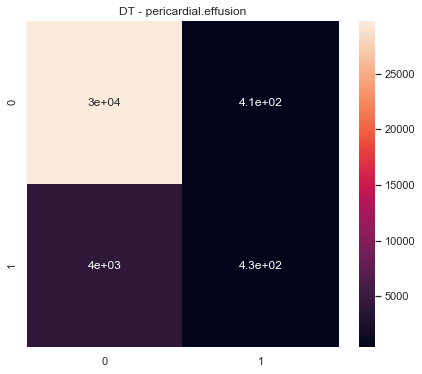

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pericardial.effusion  300.0  0.494368      0.506919         0.525890   
0   2.0  pericardial.effusion  300.0  0.475245      0.497426         0.486272   
0   3.0  pericardial.effusion  300.0  0.455597      0.464823         0.448211   
0   4.0  pericardial.effusion  300.0  0.482786      0.498350         0.494450   
0   5.0  pericardial.effusion  300.0  0.492332      0.508795         0.554070   

   ROC Macro  
0   0.550914  
0   0.532926  
0   0.493992  
0   0.497691  
0   0.555312  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pericardial.effusion  300.0  2.400328    2.476313       2.508893  2.630836
================================== RF ==================================


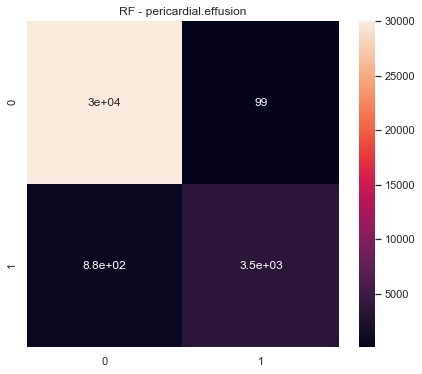

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pericardial.effusion  300.0  0.467328      0.499718         0.488490   
0   2.0  pericardial.effusion  300.0  0.463602      0.491318         0.446620   
0   3.0  pericardial.effusion  300.0  0.451848      0.472776         0.432695   
0   4.0  pericardial.effusion  300.0  0.464549      0.497676         0.435557   
0   5.0  pericardial.effusion  300.0  0.465703      0.499917         0.435871   

   ROC Macro  
0   0.576815  
0   0.531413  
0   0.479660  
0   0.461584  
0   0.591053  



                    ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pericardial.effusion  300.0  2.31303    2.461404       2.239233  2.640526
================================== SGD ==================================


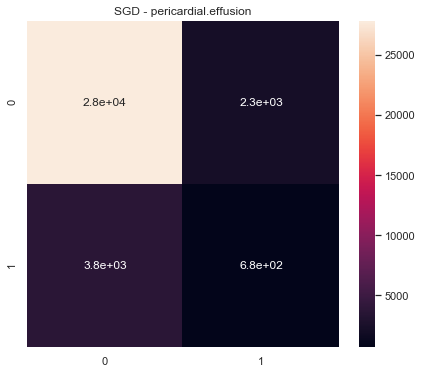

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pericardial.effusion  300.0  0.481543      0.480836         0.482736   
0   2.0  pericardial.effusion  300.0  0.488778      0.489004         0.488606   
0   3.0  pericardial.effusion  300.0  0.466785      0.469651         0.464523   
0   4.0  pericardial.effusion  300.0  0.469699      0.469311         0.470111   
0   5.0  pericardial.effusion  300.0  0.491687      0.492048         0.491510   

   ROC Macro  
0   0.430410  
0   0.472050  
0   0.403034  
0   0.466222  
0   0.532791  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pericardial.effusion  300.0  2.398492     2.40085       2.397487  2.304507
================================== LR ==================================


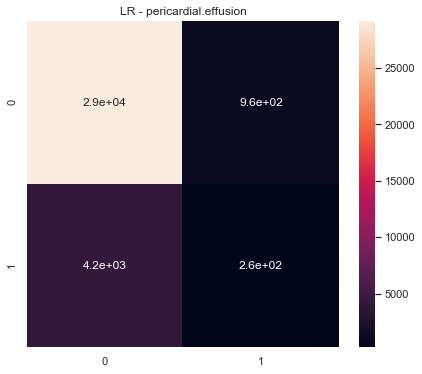

   Fold                   ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pericardial.effusion  300.0  0.491789      0.491708         0.492680   
0   2.0  pericardial.effusion  300.0  0.491052      0.491012         0.491097   
0   3.0  pericardial.effusion  300.0  0.499832      0.503623         0.502667   
0   4.0  pericardial.effusion  300.0  0.493761      0.493857         0.494624   
0   5.0  pericardial.effusion  300.0  0.499787      0.500066         0.500074   

   ROC Macro  
0   0.503839  
0   0.469862  
0   0.504550  
0   0.463552  
0   0.513625  



                    ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pericardial.effusion  300.0  2.476221    2.480265       2.481142  2.455427
================================== phlebothrombosis ==================================
================================== NB ==================================


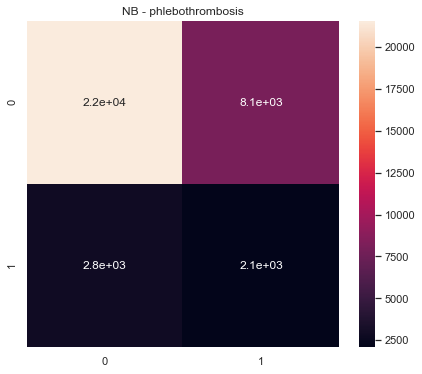

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  phlebothrombosis  300.0  0.535031      0.545856         0.534004   
0   2.0  phlebothrombosis  300.0  0.512552      0.520765         0.514953   
0   3.0  phlebothrombosis  300.0  0.498950      0.542497         0.522851   
0   4.0  phlebothrombosis  300.0  0.529577      0.547132         0.531603   
0   5.0  phlebothrombosis  300.0  0.515995      0.532343         0.521114   

   ROC Macro  
0   0.575681  
0   0.552876  
0   0.568828  
0   0.571631  
0   0.560854  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  phlebothrombosis  300.0  2.592104    2.688592       2.624526  2.82987
================================== DT ==================================


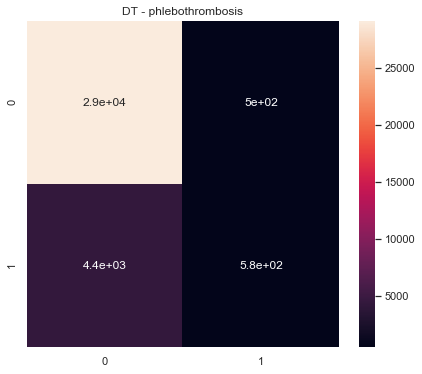

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  phlebothrombosis  300.0  0.481006      0.500022         0.500085   
0   2.0  phlebothrombosis  300.0  0.472495      0.501613         0.517461   
0   3.0  phlebothrombosis  300.0  0.481511      0.490719         0.482913   
0   4.0  phlebothrombosis  300.0  0.490420      0.500511         0.501167   
0   5.0  phlebothrombosis  300.0  0.499969      0.512020         0.544573   

   ROC Macro  
0   0.514350  
0   0.560612  
0   0.526364  
0   0.521947  
0   0.535838  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  phlebothrombosis  300.0  2.425402    2.504885         2.5462  2.65911
================================== RF ==================================


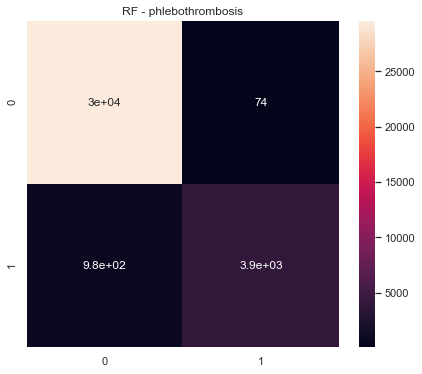

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  phlebothrombosis  300.0  0.461293      0.499409         0.428582   
0   2.0  phlebothrombosis  300.0  0.461586      0.500000         0.428654   
0   3.0  phlebothrombosis  300.0  0.455102      0.476195         0.440828   
0   4.0  phlebothrombosis  300.0  0.460998      0.498903         0.428447   
0   5.0  phlebothrombosis  300.0  0.461455      0.499747         0.428613   

   ROC Macro  
0   0.558176  
0   0.573865  
0   0.500294  
0   0.522489  
0   0.575802  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  phlebothrombosis  300.0  2.300434    2.474254       2.155124  2.730625
================================== SGD ==================================


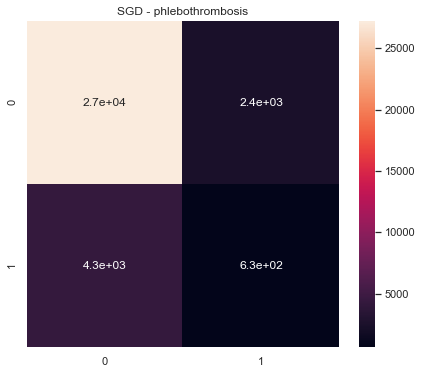

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  phlebothrombosis  300.0  0.473399      0.481299         0.470840   
0   2.0  phlebothrombosis  300.0  0.508147      0.508690         0.511333   
0   3.0  phlebothrombosis  300.0  0.466273      0.469531         0.463912   
0   4.0  phlebothrombosis  300.0  0.485541      0.495193         0.490313   
0   5.0  phlebothrombosis  300.0  0.493894      0.494186         0.494963   

   ROC Macro  
0   0.473332  
0   0.497642  
0   0.417020  
0   0.491249  
0   0.483886  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  phlebothrombosis  300.0  2.427254    2.448898       2.431361  2.363128
================================== LR ==================================


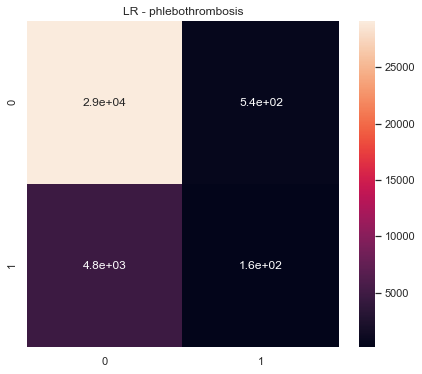

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  phlebothrombosis  300.0  0.516122      0.515787         0.520767   
0   2.0  phlebothrombosis  300.0  0.516848      0.519140         0.539355   
0   3.0  phlebothrombosis  300.0  0.493121      0.493089         0.493158   
0   4.0  phlebothrombosis  300.0  0.484525      0.498906         0.496913   
0   5.0  phlebothrombosis  300.0  0.500746      0.505620         0.510223   

   ROC Macro  
0   0.548689  
0   0.519201  
0   0.495846  
0   0.538086  
0   0.507162  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  phlebothrombosis  300.0  2.511362    2.532543       2.560416  2.608986
================================== pleural.pain ==================================
================================== NB ==================================


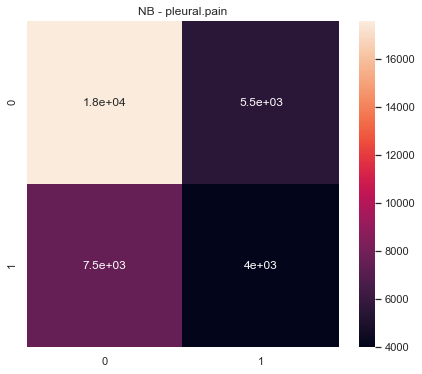

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pleural.pain  300.0  0.535597      0.538533         0.548579   
0   2.0  pleural.pain  300.0  0.541995      0.541611         0.542743   
0   3.0  pleural.pain  300.0  0.519824      0.519781         0.520589   
0   4.0  pleural.pain  300.0  0.529281      0.530710         0.535785   
0   5.0  pleural.pain  300.0  0.513828      0.522068         0.530584   

   ROC Macro  
0   0.562976  
0   0.565412  
0   0.540530  
0   0.523946  
0   0.554783  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pleural.pain  300.0  2.640526    2.652703        2.67828  2.747646
================================== DT ==================================


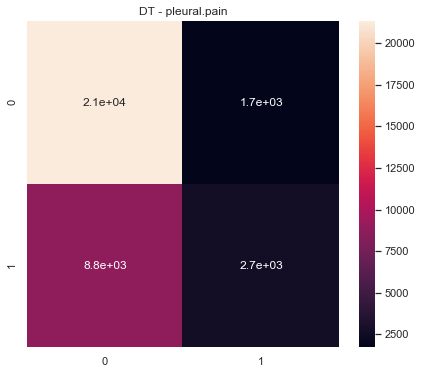

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pleural.pain  300.0  0.496920      0.518626         0.534499   
0   2.0  pleural.pain  300.0  0.482223      0.517089         0.542291   
0   3.0  pleural.pain  300.0  0.495516      0.517914         0.533583   
0   4.0  pleural.pain  300.0  0.478434      0.500117         0.500200   
0   5.0  pleural.pain  300.0  0.489768      0.520704         0.547918   

   ROC Macro  
0   0.561281  
0   0.510473  
0   0.567408  
0   0.509864  
0   0.534601  



            ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pleural.pain  300.0  2.44286     2.57445       2.658491  2.683627
================================== RF ==================================


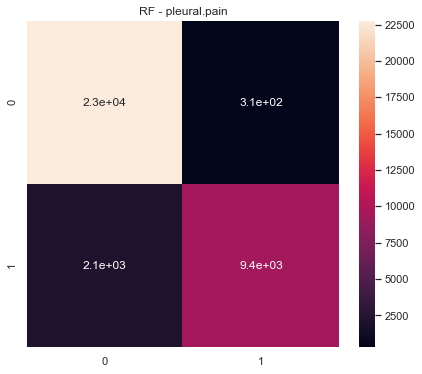

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pleural.pain  300.0  0.469521      0.523365         0.606507   
0   2.0  pleural.pain  300.0  0.469491      0.521847         0.592475   
0   3.0  pleural.pain  300.0  0.457047      0.493679         0.486011   
0   4.0  pleural.pain  300.0  0.438050      0.485086         0.461342   
0   5.0  pleural.pain  300.0  0.459172      0.516974         0.580806   

   ROC Macro  
0   0.605061  
0   0.613627  
0   0.573875  
0   0.504105  
0   0.589307  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pleural.pain  300.0  2.293281     2.54095       2.727141  2.885974
================================== SGD ==================================


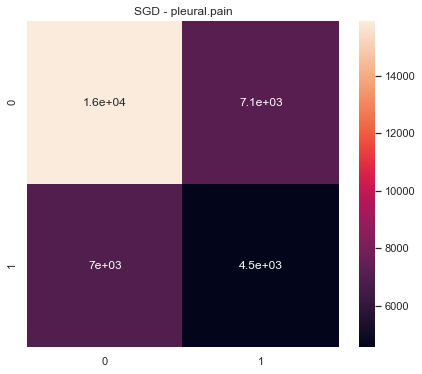

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pleural.pain  300.0  0.521193      0.527872         0.525254   
0   2.0  pleural.pain  300.0  0.501363      0.507265         0.509123   
0   3.0  pleural.pain  300.0  0.479199      0.481751         0.479851   
0   4.0  pleural.pain  300.0  0.489733      0.489721         0.489750   
0   5.0  pleural.pain  300.0  0.505194      0.506161         0.506677   

   ROC Macro  
0   0.529225  
0   0.504457  
0   0.477326  
0   0.476700  
0   0.512167  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pleural.pain  300.0  2.496684     2.51277       2.510655  2.499875
================================== LR ==================================


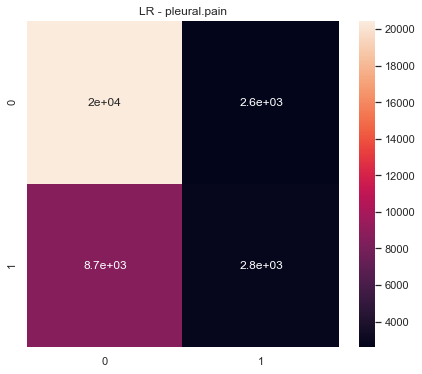

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  pleural.pain  300.0  0.536409      0.536385         0.539954   
0   2.0  pleural.pain  300.0  0.488075      0.515795         0.532895   
0   3.0  pleural.pain  300.0  0.489071      0.492167         0.491098   
0   4.0  pleural.pain  300.0  0.479833      0.483587         0.481276   
0   5.0  pleural.pain  300.0  0.515709      0.521969         0.528962   

   ROC Macro  
0   0.555415  
0   0.510937  
0   0.511007  
0   0.465857  
0   0.528104  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  pleural.pain  300.0  2.509097    2.549902       2.574184  2.57132
================================== pulmonary.hypertension ==================================
================================== NB ==================================


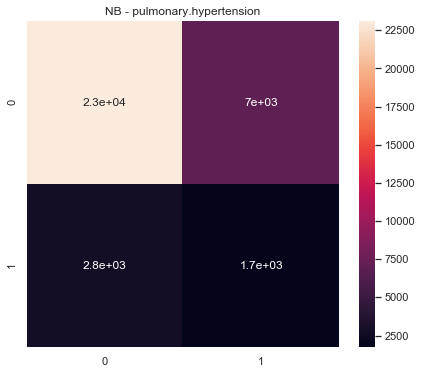

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  pulmonary.hypertension  300.0  0.535412      0.551857   
0   2.0  pulmonary.hypertension  300.0  0.524744      0.541078   
0   3.0  pulmonary.hypertension  300.0  0.496367      0.524484   
0   4.0  pulmonary.hypertension  300.0  0.526611      0.544374   
0   5.0  pulmonary.hypertension  300.0  0.539746      0.553063   

   Precision Macro  ROC Macro  
0         0.535081   0.590482  
0         0.526892   0.566080  
0         0.513323   0.555433  
0         0.528755   0.565276  
0         0.537903   0.591035  



                      ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pulmonary.hypertension  300.0  2.62288    2.714856       2.641954  2.868306
================================== DT ==================================


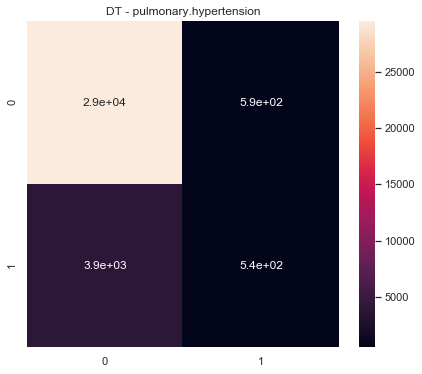

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  pulmonary.hypertension  300.0  0.502334      0.506746   
0   2.0  pulmonary.hypertension  300.0  0.475513      0.491151   
0   3.0  pulmonary.hypertension  300.0  0.480370      0.480202   
0   4.0  pulmonary.hypertension  300.0  0.497148      0.508419   
0   5.0  pulmonary.hypertension  300.0  0.480443      0.502121   

   Precision Macro  ROC Macro  
0         0.512919   0.523166  
0         0.475855   0.500237  
0         0.480551   0.491986  
0         0.529556   0.509496  
0         0.513913   0.512397  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  pulmonary.hypertension  300.0  2.435808    2.488639       2.512794   

    Avg ROC  
0  2.537282  
================================== RF ==================================


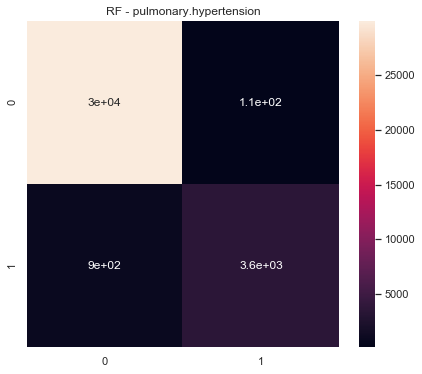

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  pulmonary.hypertension  300.0  0.466316      0.500308   
0   2.0  pulmonary.hypertension  300.0  0.457869      0.485282   
0   3.0  pulmonary.hypertension  300.0  0.454029      0.476692   
0   4.0  pulmonary.hypertension  300.0  0.463366      0.494570   
0   5.0  pulmonary.hypertension  300.0  0.466396      0.500392   

   Precision Macro  ROC Macro  
0         0.560129   0.546374  
0         0.433388   0.536482  
0         0.434083   0.530628  
0         0.441323   0.516216  
0         0.601868   0.561569  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  pulmonary.hypertension  300.0  2.307976    2.457244       2.470791  2.69127
================================== SGD ==================================


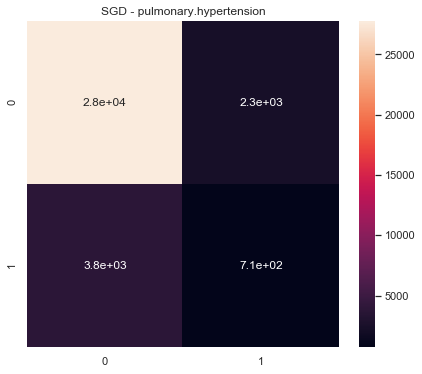

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  pulmonary.hypertension  300.0  0.486132      0.488305   
0   2.0  pulmonary.hypertension  300.0  0.488525      0.490966   
0   3.0  pulmonary.hypertension  300.0  0.480889      0.480784   
0   4.0  pulmonary.hypertension  300.0  0.471718      0.481807   
0   5.0  pulmonary.hypertension  300.0  0.475393      0.474040   

   Precision Macro  ROC Macro  
0         0.485544   0.447479  
0         0.488360   0.478450  
0         0.480999   0.415171  
0         0.467772   0.405417  
0         0.477965   0.523873  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  pulmonary.hypertension  300.0  2.402657    2.415901        2.40064   

    Avg ROC  
0  2.270389  
================================== LR ==================================


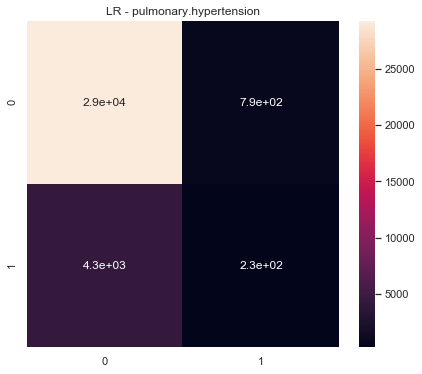

   Fold                     ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  pulmonary.hypertension  300.0  0.509994      0.510546   
0   2.0  pulmonary.hypertension  300.0  0.486777      0.491727   
0   3.0  pulmonary.hypertension  300.0  0.491790      0.496535   
0   4.0  pulmonary.hypertension  300.0  0.503734      0.503774   
0   5.0  pulmonary.hypertension  300.0  0.495741      0.495992   

   Precision Macro  ROC Macro  
0         0.514912   0.509064  
0         0.487327   0.503656  
0         0.497622   0.487380  
0         0.504155   0.476160  
0         0.495707   0.483399  



                      ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  pulmonary.hypertension  300.0  2.488036    2.498573       2.499724   

    Avg ROC  
0  2.459658  
================================== pyoderma ==================================
================================== NB ==================================


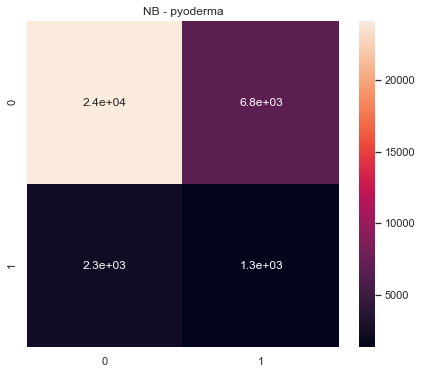

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  pyoderma  300.0  0.517017      0.526788         0.517948   0.559851
0   2.0  pyoderma  300.0  0.524795      0.568104         0.533819   0.607487
0   3.0  pyoderma  300.0  0.493074      0.532584         0.514959   0.556961
0   4.0  pyoderma  300.0  0.499774      0.518300         0.509916   0.537591
0   5.0  pyoderma  300.0  0.508583      0.515332         0.510489   0.566652



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pyoderma  300.0  2.543243    2.661107       2.587131  2.828541
================================== DT ==================================


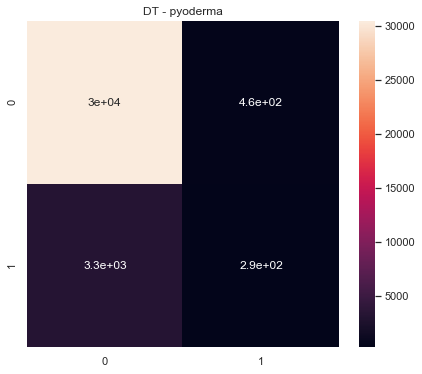

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  pyoderma  300.0  0.484430      0.502132         0.515924   0.554218
0   2.0  pyoderma  300.0  0.482543      0.486024         0.481005   0.510496
0   3.0  pyoderma  300.0  0.470757      0.477671         0.466007   0.518424
0   4.0  pyoderma  300.0  0.458837      0.465610         0.452782   0.471706
0   5.0  pyoderma  300.0  0.476205      0.495610         0.476038   0.491017



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pyoderma  300.0  2.372773    2.427047       2.391757  2.545862
================================== RF ==================================


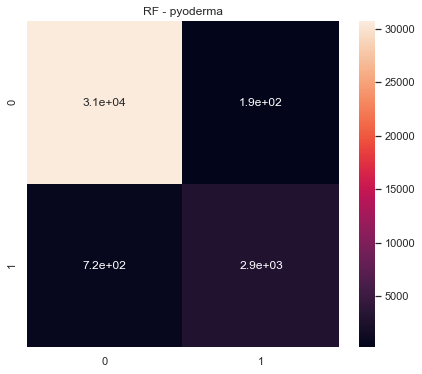

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  pyoderma  300.0  0.472156      0.499677         0.447509   0.577370
0   2.0  pyoderma  300.0  0.461083      0.477930         0.445382   0.537665
0   3.0  pyoderma  300.0  0.469703      0.481460         0.462103   0.479553
0   4.0  pyoderma  300.0  0.458140      0.471258         0.445984   0.393860
0   5.0  pyoderma  300.0  0.472313      0.500000         0.447532   0.495685



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pyoderma  300.0  2.333396    2.430325        2.24851  2.484133
================================== SGD ==================================


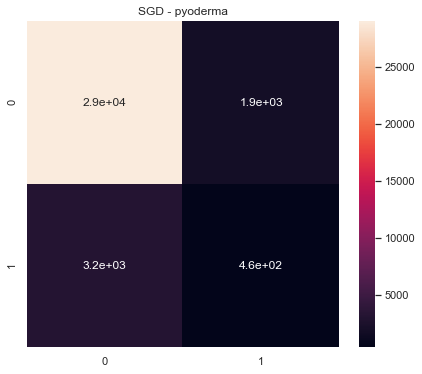

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  pyoderma  300.0  0.484444      0.487446         0.483265   0.437806
0   2.0  pyoderma  300.0  0.484104      0.483778         0.484490   0.451116
0   3.0  pyoderma  300.0  0.479421      0.478775         0.480203   0.423435
0   4.0  pyoderma  300.0  0.445839      0.443459         0.448292   0.399816
0   5.0  pyoderma  300.0  0.494429      0.494351         0.494556   0.528157



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pyoderma  300.0  2.388237    2.387809       2.390806  2.240331
================================== LR ==================================


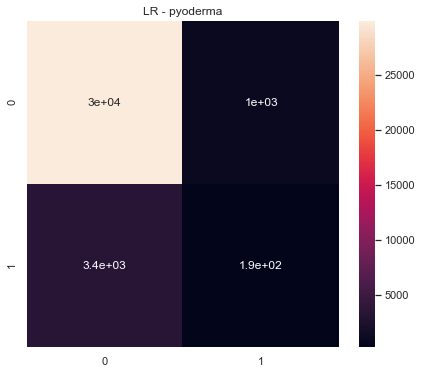

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  pyoderma  300.0  0.518911      0.524641         0.518392   0.537749
0   2.0  pyoderma  300.0  0.515286      0.514772         0.516146   0.518484
0   3.0  pyoderma  300.0  0.480610      0.484042         0.490346   0.522434
0   4.0  pyoderma  300.0  0.447510      0.443257         0.470093   0.417321
0   5.0  pyoderma  300.0  0.512622      0.512591         0.512653   0.519690



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  pyoderma  300.0  2.474938    2.479304        2.50763  2.515678
================================== respiratory.failure ==================================
================================== NB ==================================


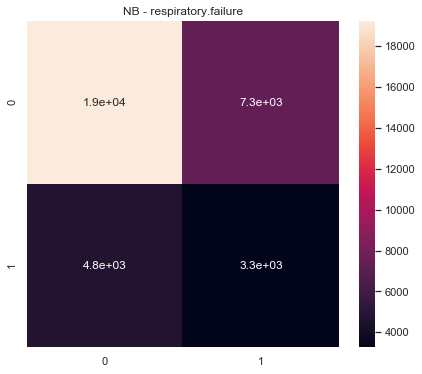

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  respiratory.failure  300.0  0.519484      0.523534         0.520334   
0   2.0  respiratory.failure  300.0  0.533246      0.534662         0.532595   
0   3.0  respiratory.failure  300.0  0.502152      0.509750         0.507811   
0   4.0  respiratory.failure  300.0  0.529158      0.531161         0.528638   
0   5.0  respiratory.failure  300.0  0.508155      0.508155         0.508155   

   ROC Macro  
0   0.541597  
0   0.555095  
0   0.522403  
0   0.534128  
0   0.533250  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  respiratory.failure  300.0  2.592195    2.607262       2.597533  2.686473
================================== DT ==================================


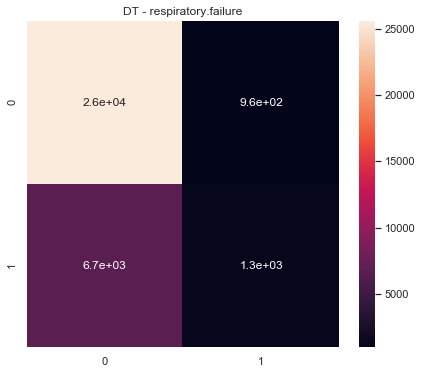

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  respiratory.failure  300.0  0.483679      0.509672         0.531160   
0   2.0  respiratory.failure  300.0  0.459856      0.496095         0.485245   
0   3.0  respiratory.failure  300.0  0.473310      0.494038         0.486969   
0   4.0  respiratory.failure  300.0  0.478018      0.491306         0.485120   
0   5.0  respiratory.failure  300.0  0.491719      0.509458         0.522193   

   ROC Macro  
0   0.544650  
0   0.536097  
0   0.507311  
0   0.463217  
0   0.521045  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  respiratory.failure  300.0  2.386581    2.500569       2.510687  2.57232
================================== RF ==================================


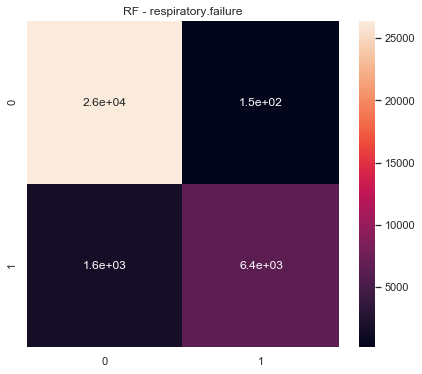

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  respiratory.failure  300.0  0.437332      0.496336         0.444324   
0   2.0  respiratory.failure  300.0  0.436806      0.496303         0.440962   
0   3.0  respiratory.failure  300.0  0.431687      0.472789         0.414659   
0   4.0  respiratory.failure  300.0  0.434205      0.483872         0.418502   
0   5.0  respiratory.failure  300.0  0.436728      0.500682         0.584114   

   ROC Macro  
0   0.582967  
0   0.554416  
0   0.509681  
0   0.455196  
0   0.578098  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  respiratory.failure  300.0  2.176758    2.449983        2.30256  2.680359
================================== SGD ==================================


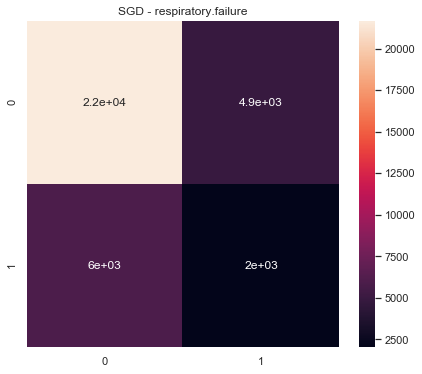

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  respiratory.failure  300.0  0.498781      0.498832         0.498866   
0   2.0  respiratory.failure  300.0  0.478128      0.489233         0.482962   
0   3.0  respiratory.failure  300.0  0.476077      0.475639         0.477143   
0   4.0  respiratory.failure  300.0  0.490741      0.491429         0.492327   
0   5.0  respiratory.failure  300.0  0.500440      0.501008         0.501110   

   ROC Macro  
0   0.498276  
0   0.491182  
0   0.480149  
0   0.483917  
0   0.524483  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  respiratory.failure  300.0  2.444167    2.456142       2.452408  2.478008
================================== LR ==================================


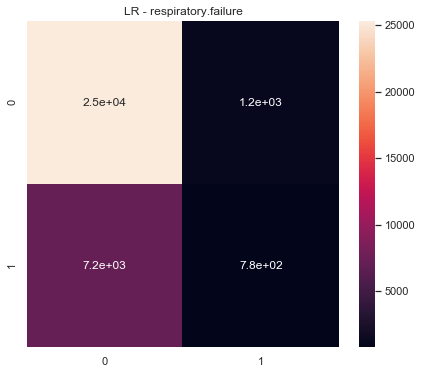

   Fold                  ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  respiratory.failure  300.0  0.512550      0.512631         0.512490   
0   2.0  respiratory.failure  300.0  0.506569      0.515054         0.526559   
0   3.0  respiratory.failure  300.0  0.486837      0.487410         0.486680   
0   4.0  respiratory.failure  300.0  0.473542      0.481753         0.474521   
0   5.0  respiratory.failure  300.0  0.483959      0.501585         0.503388   

   ROC Macro  
0   0.520225  
0   0.529842  
0   0.476045  
0   0.479419  
0   0.526942  



                   ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  respiratory.failure  300.0  2.463457    2.498433       2.503639  2.532473
================================== rhabdomyolysis ==================================
================================== NB ==================================


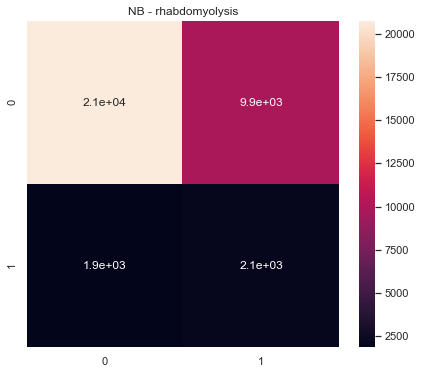

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  rhabdomyolysis  300.0  0.507423      0.551676         0.525234   
0   2.0  rhabdomyolysis  300.0  0.532500      0.582896         0.541986   
0   3.0  rhabdomyolysis  300.0  0.491772      0.565027         0.528309   
0   4.0  rhabdomyolysis  300.0  0.491783      0.547149         0.521376   
0   5.0  rhabdomyolysis  300.0  0.515922      0.553433         0.527600   

   ROC Macro  
0   0.569945  
0   0.605280  
0   0.609314  
0   0.577263  
0   0.582661  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhabdomyolysis  300.0  2.539399    2.800182       2.644505  2.944463
================================== DT ==================================


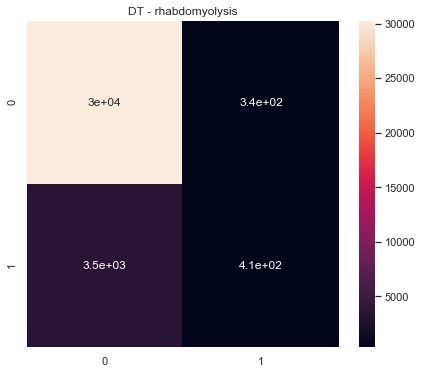

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  rhabdomyolysis  300.0  0.510371      0.516476         0.568041   
0   2.0  rhabdomyolysis  300.0  0.497377      0.508319         0.535345   
0   3.0  rhabdomyolysis  300.0  0.499162      0.506757         0.519057   
0   4.0  rhabdomyolysis  300.0  0.479501      0.495302         0.483535   
0   5.0  rhabdomyolysis  300.0  0.493023      0.506813         0.536053   

   ROC Macro  
0   0.552856  
0   0.553827  
0   0.555463  
0   0.552800  
0   0.566366  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhabdomyolysis  300.0  2.479435    2.533668       2.642031  2.781311
================================== RF ==================================


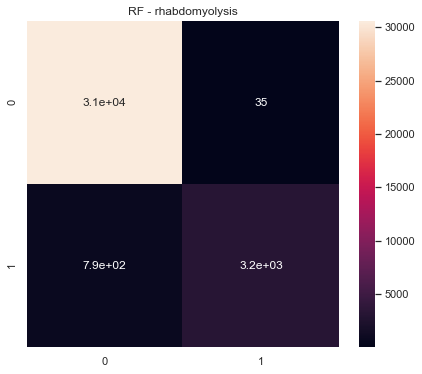

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  rhabdomyolysis  300.0  0.477139      0.503384         0.715835   
0   2.0  rhabdomyolysis  300.0  0.473531      0.501896         0.942956   
0   3.0  rhabdomyolysis  300.0  0.477805      0.498292         0.489597   
0   4.0  rhabdomyolysis  300.0  0.470631      0.496667         0.464811   
0   5.0  rhabdomyolysis  300.0  0.474675      0.502283         0.728702   

   ROC Macro  
0   0.584871  
0   0.588692  
0   0.586056  
0   0.505169  
0   0.575643  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhabdomyolysis  300.0  2.373781    2.502522       3.341901  2.840431
================================== SGD ==================================


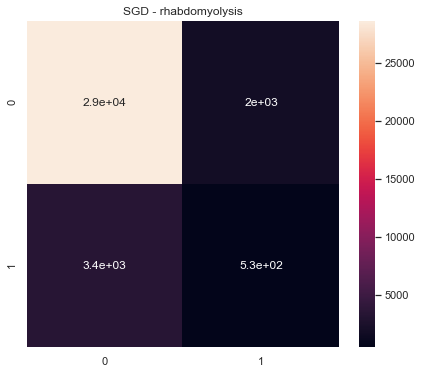

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  rhabdomyolysis  300.0  0.485225      0.488771         0.484411   
0   2.0  rhabdomyolysis  300.0  0.496960      0.496934         0.497013   
0   3.0  rhabdomyolysis  300.0  0.476237      0.477615         0.475139   
0   4.0  rhabdomyolysis  300.0  0.468402      0.469083         0.467761   
0   5.0  rhabdomyolysis  300.0  0.513663      0.513413         0.514003   

   ROC Macro  
0   0.488249  
0   0.532916  
0   0.468398  
0   0.473138  
0   0.545416  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhabdomyolysis  300.0  2.440486    2.445817       2.438327  2.508117
================================== LR ==================================


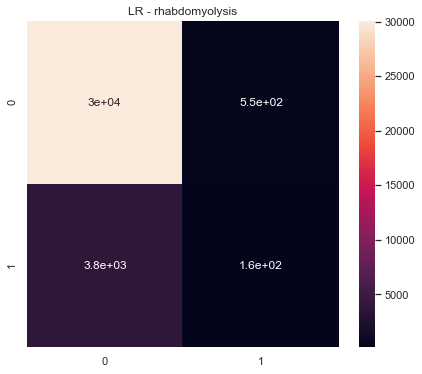

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  rhabdomyolysis  300.0  0.519682      0.519489         0.538686   
0   2.0  rhabdomyolysis  300.0  0.541316      0.535890         0.576278   
0   3.0  rhabdomyolysis  300.0  0.507838      0.516409         0.510936   
0   4.0  rhabdomyolysis  300.0  0.479793      0.482583         0.478224   
0   5.0  rhabdomyolysis  300.0  0.509942      0.511546         0.521017   

   ROC Macro  
0   0.556826  
0   0.599238  
0   0.503095  
0   0.533379  
0   0.542514  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhabdomyolysis  300.0  2.558571    2.565916       2.625141  2.735053
================================== rhinorrhea ==================================
================================== NB ==================================


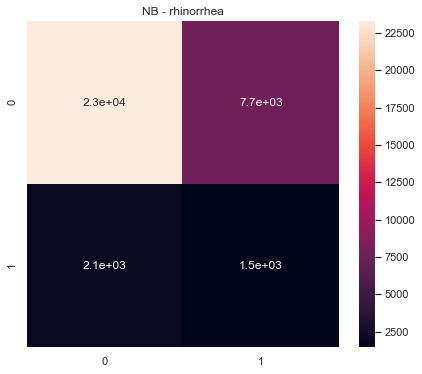

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  rhinorrhea  300.0  0.529011      0.563911         0.533602   0.603630
0   2.0  rhinorrhea  300.0  0.511807      0.545707         0.522748   0.588421
0   3.0  rhinorrhea  300.0  0.455477      0.506674         0.502647   0.520697
0   4.0  rhinorrhea  300.0  0.518674      0.542726         0.523620   0.578045
0   5.0  rhinorrhea  300.0  0.516615      0.536803         0.520976   0.570483



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhinorrhea  300.0  2.531585    2.695821       2.603593  2.861277
================================== DT ==================================


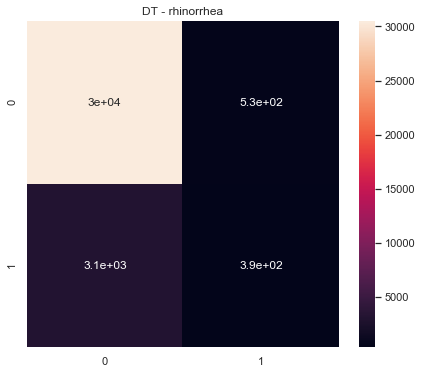

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  rhinorrhea  300.0  0.500645      0.508288         0.529806   0.559304
0   2.0  rhinorrhea  300.0  0.457098      0.459740         0.454584   0.461562
0   3.0  rhinorrhea  300.0  0.457404      0.460284         0.454677   0.448817
0   4.0  rhinorrhea  300.0  0.479720      0.492571         0.478704   0.515664
0   5.0  rhinorrhea  300.0  0.503005      0.509023         0.527960   0.567030



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhinorrhea  300.0  2.397871    2.429906       2.445731  2.552376
================================== RF ==================================


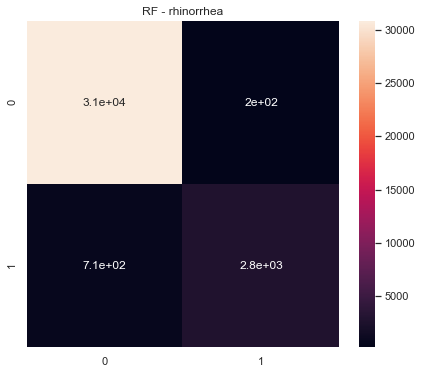

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  rhinorrhea  300.0  0.482042      0.501958         0.523170   0.567945
0   2.0  rhinorrhea  300.0  0.453582      0.462282         0.445203   0.510182
0   3.0  rhinorrhea  300.0  0.454143      0.463405         0.445245   0.443105
0   4.0  rhinorrhea  300.0  0.471551      0.497018         0.448567   0.461403
0   5.0  rhinorrhea  300.0  0.473038      0.499919         0.448900   0.581491



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhinorrhea  300.0  2.334357    2.424583       2.311085  2.564125
================================== SGD ==================================


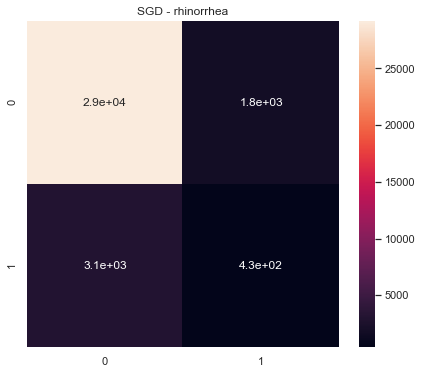

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  rhinorrhea  300.0  0.493398      0.494533         0.493342   0.453111
0   2.0  rhinorrhea  300.0  0.480593      0.479584         0.482112   0.390962
0   3.0  rhinorrhea  300.0  0.459121      0.462442         0.456030   0.407548
0   4.0  rhinorrhea  300.0  0.470992      0.473812         0.468670   0.447367
0   5.0  rhinorrhea  300.0  0.486752      0.488976         0.485914   0.441993



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhinorrhea  300.0  2.390856    2.399347       2.386068  2.140981
================================== LR ==================================


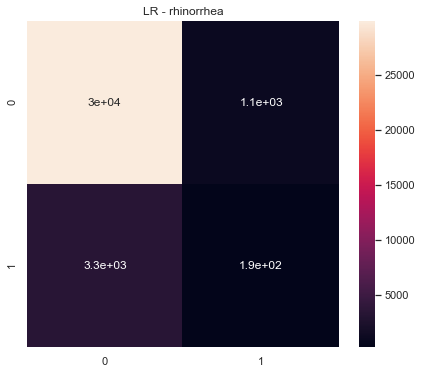

   Fold         ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  rhinorrhea  300.0  0.526446      0.530126         0.524891   0.575005
0   2.0  rhinorrhea  300.0  0.457882      0.460448         0.455448   0.445520
0   3.0  rhinorrhea  300.0  0.505282      0.536675         0.518124   0.493885
0   4.0  rhinorrhea  300.0  0.477522      0.486850         0.493062   0.454430
0   5.0  rhinorrhea  300.0  0.497746      0.500349         0.500252   0.502254



          ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  rhinorrhea  300.0  2.464877    2.514448       2.491776  2.471093
================================== road.traffic.accident ==================================
================================== NB ==================================


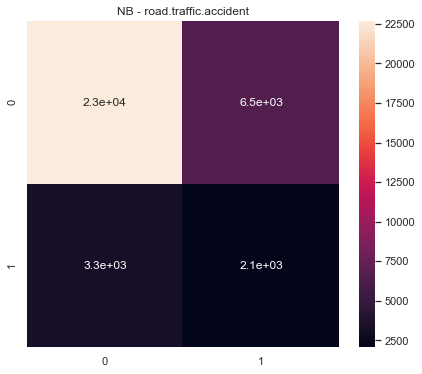

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  road.traffic.accident  300.0  0.538432      0.545494   
0   2.0  road.traffic.accident  300.0  0.549219      0.561257   
0   3.0  road.traffic.accident  300.0  0.513115      0.528413   
0   4.0  road.traffic.accident  300.0  0.538020      0.548930   
0   5.0  road.traffic.accident  300.0  0.530967      0.535106   

   Precision Macro  ROC Macro  
0         0.536727   0.590861  
0         0.546808   0.597500  
0         0.519095   0.572694  
0         0.537010   0.576321  
0         0.529734   0.563253  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  road.traffic.accident  300.0  2.669753      2.7192       2.669374  2.900629
================================== DT ==================================


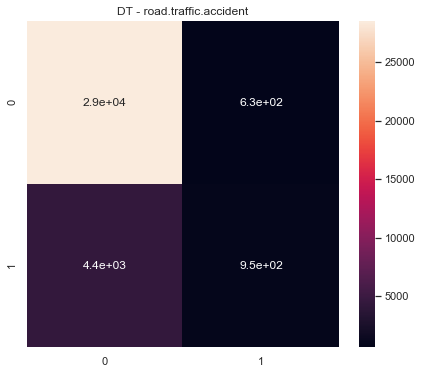

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  road.traffic.accident  300.0  0.496772      0.511848   
0   2.0  road.traffic.accident  300.0  0.519308      0.525131   
0   3.0  road.traffic.accident  300.0  0.500726      0.505931   
0   4.0  road.traffic.accident  300.0  0.490257      0.504868   
0   5.0  road.traffic.accident  300.0  0.510749      0.519822   

   Precision Macro  ROC Macro  
0         0.546530   0.584550  
0         0.578923   0.594978  
0         0.510503   0.561023  
0         0.514732   0.551601  
0         0.566621   0.549124  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  road.traffic.accident  300.0  2.517812      2.5676        2.71731  2.841275
================================== RF ==================================


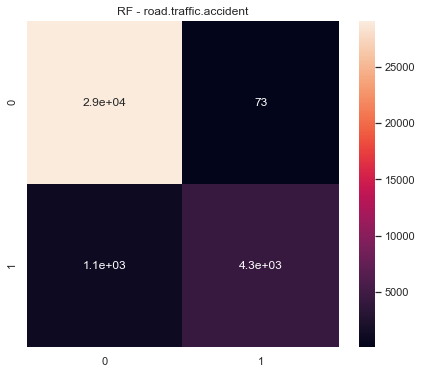

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  road.traffic.accident  300.0  0.457571      0.499743   
0   2.0  road.traffic.accident  300.0  0.457614      0.499829   
0   3.0  road.traffic.accident  300.0  0.471891      0.489661   
0   4.0  road.traffic.accident  300.0  0.457792      0.498749   
0   5.0  road.traffic.accident  300.0  0.457437      0.499400   

   Precision Macro  ROC Macro  
0         0.421963   0.604734  
0         0.421975   0.596275  
0         0.473608   0.594702  
0         0.445641   0.565620  
0         0.421979   0.620198  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  road.traffic.accident  300.0  2.302305    2.487381       2.185166  2.981529
================================== SGD ==================================


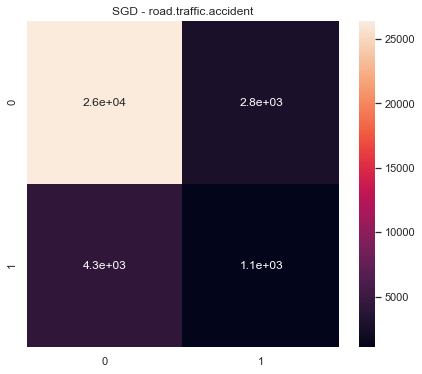

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  road.traffic.accident  300.0  0.490623      0.490516   
0   2.0  road.traffic.accident  300.0  0.480128      0.486250   
0   3.0  road.traffic.accident  300.0  0.458391      0.462302   
0   4.0  road.traffic.accident  300.0  0.478293      0.483304   
0   5.0  road.traffic.accident  300.0  0.497437      0.499555   

   Precision Macro  ROC Macro  
0         0.490785   0.436192  
0         0.479754   0.478752  
0         0.455423   0.394024  
0         0.477174   0.489891  
0         0.499412   0.480335  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  road.traffic.accident  300.0  2.404873    2.421927       2.402547  2.279195
================================== LR ==================================


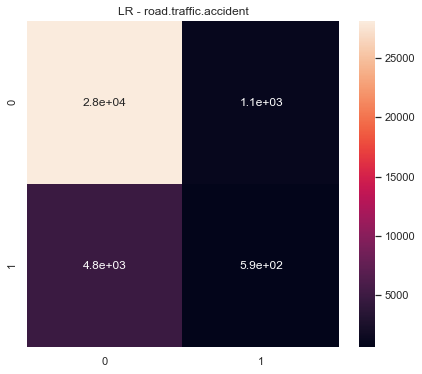

   Fold                    ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  road.traffic.accident  300.0  0.521594      0.520722   
0   2.0  road.traffic.accident  300.0  0.505819      0.508808   
0   3.0  road.traffic.accident  300.0  0.538847      0.556528   
0   4.0  road.traffic.accident  300.0  0.513388      0.513081   
0   5.0  road.traffic.accident  300.0  0.558929      0.556706   

   Precision Macro  ROC Macro  
0         0.525343   0.530441  
0         0.514037   0.508846  
0         0.539536   0.581245  
0         0.514127   0.514411  
0         0.561934   0.583816  



                     ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  road.traffic.accident  300.0  2.638577    2.655846       2.654977  2.718759
================================== sepsis ==================================
================================== NB ==================================


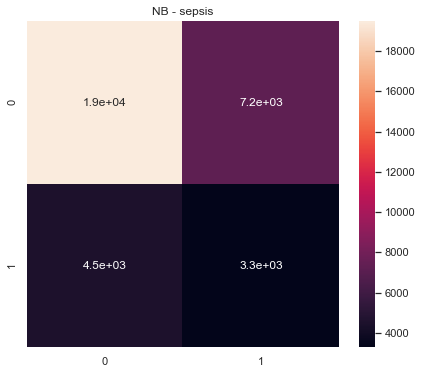

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  sepsis  300.0  0.528459      0.536491         0.530023   0.555592
0   2.0  sepsis  300.0  0.522926      0.528709         0.524139   0.540777
0   3.0  sepsis  300.0  0.526174      0.537837         0.529943   0.561514
0   4.0  sepsis  300.0  0.521705      0.521947         0.521526   0.542915
0   5.0  sepsis  300.0  0.529847      0.530154         0.529600   0.557226



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sepsis  300.0  2.629111    2.655138       2.635231  2.758025
================================== DT ==================================


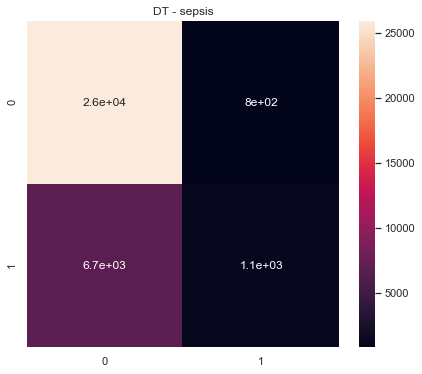

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  sepsis  300.0  0.487240      0.510722         0.533006   0.557115
0   2.0  sepsis  300.0  0.480693      0.507339         0.524224   0.523708
0   3.0  sepsis  300.0  0.486236      0.499495         0.499066   0.519707
0   4.0  sepsis  300.0  0.448368      0.483469         0.449086   0.509754
0   5.0  sepsis  300.0  0.485514      0.513231         0.551609   0.531457



      ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sepsis  300.0  2.38805    2.514256       2.556992  2.641741
================================== RF ==================================


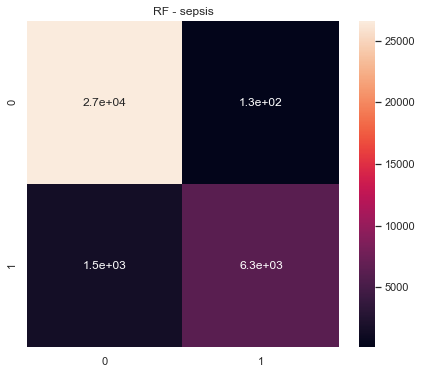

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  sepsis  300.0  0.443270      0.502332         0.601310   0.604109
0   2.0  sepsis  300.0  0.440287      0.500400         0.515716   0.562147
0   3.0  sepsis  300.0  0.448035      0.484307         0.449185   0.543618
0   4.0  sepsis  300.0  0.428289      0.477224         0.398276   0.507040
0   5.0  sepsis  300.0  0.444574      0.502970         0.620454   0.562371



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sepsis  300.0  2.204455    2.467233       2.584941  2.779286
================================== SGD ==================================


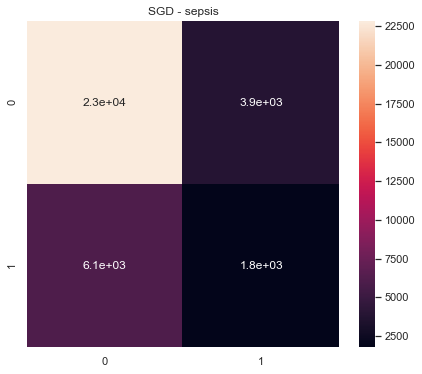

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  sepsis  300.0  0.487161      0.490953         0.488605   0.510344
0   2.0  sepsis  300.0  0.476551      0.497323         0.493808   0.486685
0   3.0  sepsis  300.0  0.499095      0.501241         0.501521   0.512109
0   4.0  sepsis  300.0  0.463238      0.474957         0.462384   0.473643
0   5.0  sepsis  300.0  0.500388      0.503071         0.503909   0.537317



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sepsis  300.0  2.426433    2.467545       2.450227  2.520097
================================== LR ==================================


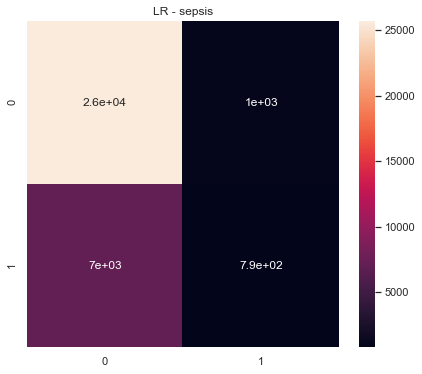

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  sepsis  300.0  0.535622      0.535837         0.552438   0.571194
0   2.0  sepsis  300.0  0.468296      0.507788         0.548824   0.533032
0   3.0  sepsis  300.0  0.504475      0.504474         0.504616   0.530800
0   4.0  sepsis  300.0  0.485240      0.490838         0.487652   0.532001
0   5.0  sepsis  300.0  0.489399      0.507870         0.519091   0.535682



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sepsis  300.0  2.483032    2.546807        2.61262  2.702709
================================== septic.shock ==================================
================================== NB ==================================


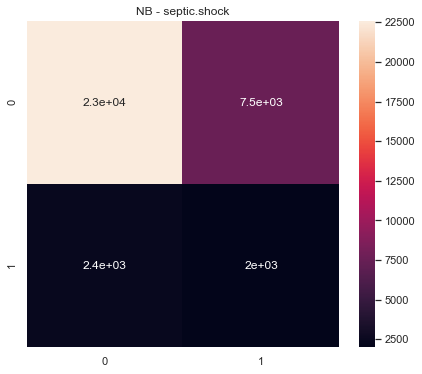

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  septic.shock  300.0  0.528791      0.543452         0.529354   
0   2.0  septic.shock  300.0  0.497473      0.519933         0.511217   
0   3.0  septic.shock  300.0  0.507711      0.524915         0.515177   
0   4.0  septic.shock  300.0  0.545209      0.581033         0.547556   
0   5.0  septic.shock  300.0  0.539255      0.563234         0.539896   

   ROC Macro  
0   0.589563  
0   0.536050  
0   0.571731  
0   0.609795  
0   0.589834  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  septic.shock  300.0  2.618439    2.732566       2.643201  2.896974
================================== DT ==================================


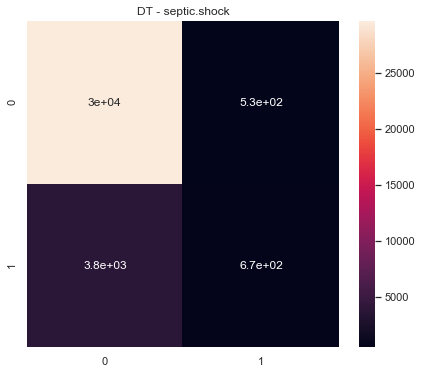

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  septic.shock  300.0  0.508056      0.514891         0.547688   
0   2.0  septic.shock  300.0  0.494502      0.504927         0.514362   
0   3.0  septic.shock  300.0  0.481583      0.494055         0.485344   
0   4.0  septic.shock  300.0  0.485471      0.501093         0.504091   
0   5.0  septic.shock  300.0  0.503309      0.511383         0.534976   

   ROC Macro  
0   0.536827  
0   0.507422  
0   0.557811  
0   0.525895  
0   0.580473  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  septic.shock  300.0  2.472922    2.526349       2.586461  2.708428
================================== RF ==================================


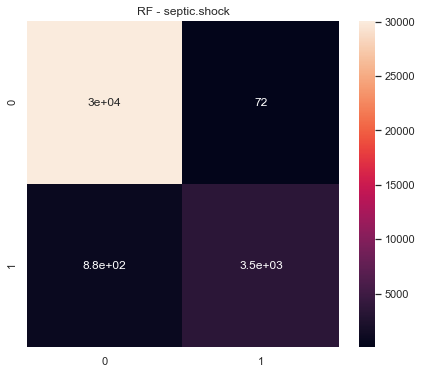

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  septic.shock  300.0  0.465625      0.499668         0.435925   
0   2.0  septic.shock  300.0  0.465336      0.499170         0.435797   
0   3.0  septic.shock  300.0  0.460002      0.480461         0.445679   
0   4.0  septic.shock  300.0  0.464308      0.495501         0.443447   
0   5.0  septic.shock  300.0  0.466865      0.500399         0.602664   

   ROC Macro  
0   0.609712  
0   0.587547  
0   0.562479  
0   0.567979  
0   0.606958  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  septic.shock  300.0  2.322136    2.475199       2.363513  2.934675
================================== SGD ==================================


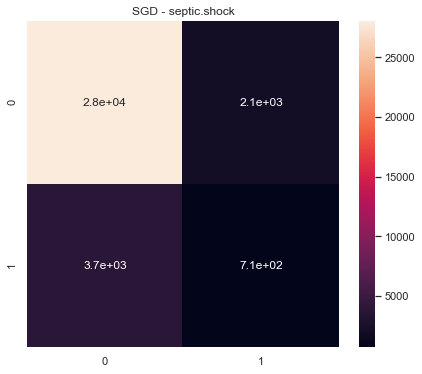

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  septic.shock  300.0  0.471664      0.473333         0.470328   
0   2.0  septic.shock  300.0  0.510438      0.510167         0.511224   
0   3.0  septic.shock  300.0  0.486566      0.494402         0.489370   
0   4.0  septic.shock  300.0  0.491929      0.496841         0.494798   
0   5.0  septic.shock  300.0  0.505974      0.506333         0.505902   

   ROC Macro  
0   0.515745  
0   0.492301  
0   0.440709  
0   0.530760  
0   0.536069  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  septic.shock  300.0  2.466571    2.481077       2.471621  2.515584
================================== LR ==================================


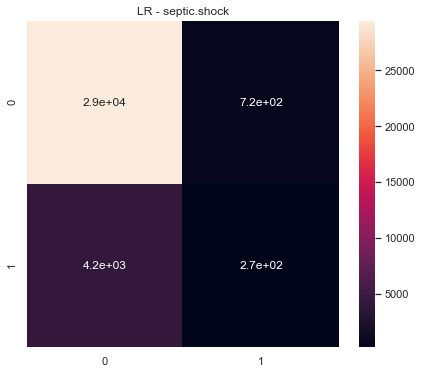

   Fold           ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  septic.shock  300.0  0.501586      0.502252         0.502766   
0   2.0  septic.shock  300.0  0.512164      0.513274         0.521983   
0   3.0  septic.shock  300.0  0.492221      0.492273         0.492175   
0   4.0  septic.shock  300.0  0.531112      0.530317         0.532132   
0   5.0  septic.shock  300.0  0.506929      0.507342         0.509477   

   ROC Macro  
0   0.537531  
0   0.535878  
0   0.504988  
0   0.559134  
0   0.547651  



            ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  septic.shock  300.0  2.544012    2.545458       2.558533  2.685182
================================== sinus.tachycardia ==================================
================================== NB ==================================


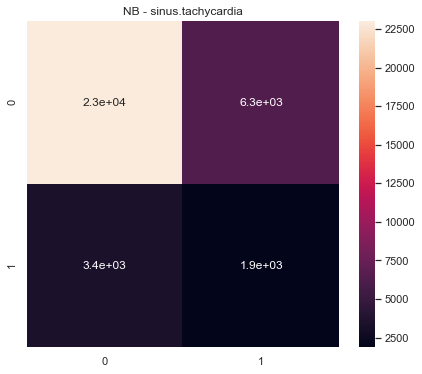

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sinus.tachycardia  300.0  0.526016      0.530352         0.525179   
0   2.0  sinus.tachycardia  300.0  0.552492      0.558876         0.549556   
0   3.0  sinus.tachycardia  300.0  0.514054      0.531345         0.520554   
0   4.0  sinus.tachycardia  300.0  0.523391      0.530270         0.523466   
0   5.0  sinus.tachycardia  300.0  0.524889      0.528490         0.524065   

   ROC Macro  
0   0.572042  
0   0.590360  
0   0.560120  
0   0.545950  
0   0.563784  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sinus.tachycardia  300.0  2.640841    2.679332       2.642819  2.832256
================================== DT ==================================


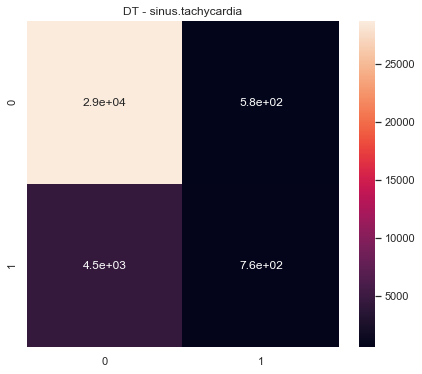

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sinus.tachycardia  300.0  0.500166      0.512886         0.546370   
0   2.0  sinus.tachycardia  300.0  0.490003      0.508374         0.538770   
0   3.0  sinus.tachycardia  300.0  0.459404      0.478031         0.450629   
0   4.0  sinus.tachycardia  300.0  0.491749      0.505008         0.514483   
0   5.0  sinus.tachycardia  300.0  0.502056      0.510760         0.527082   

   ROC Macro  
0   0.525925  
0   0.538765  
0   0.485141  
0   0.514319  
0   0.524774  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sinus.tachycardia  300.0  2.443377    2.515058       2.577336  2.588925
================================== RF ==================================


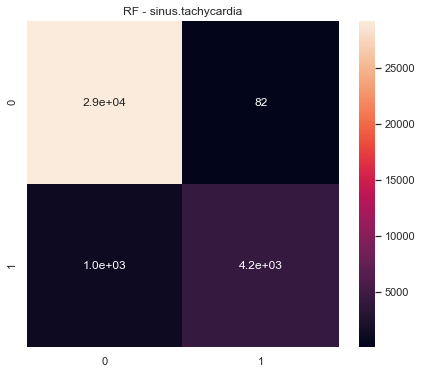

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sinus.tachycardia  300.0  0.458549      0.499317         0.423935   
0   2.0  sinus.tachycardia  300.0  0.458888      0.500000         0.424023   
0   3.0  sinus.tachycardia  300.0  0.445470      0.473635         0.420467   
0   4.0  sinus.tachycardia  300.0  0.455741      0.492370         0.428234   
0   5.0  sinus.tachycardia  300.0  0.458839      0.499915         0.424001   

   ROC Macro  
0   0.590988  
0   0.589950  
0   0.509137  
0   0.470668  
0   0.575485  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sinus.tachycardia  300.0  2.277487    2.465237        2.12066  2.736228
================================== SGD ==================================


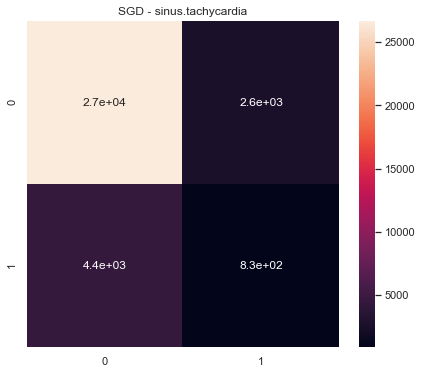

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sinus.tachycardia  300.0  0.490330      0.493609         0.491315   
0   2.0  sinus.tachycardia  300.0  0.463286      0.475375         0.457736   
0   3.0  sinus.tachycardia  300.0  0.469698      0.470472         0.469026   
0   4.0  sinus.tachycardia  300.0  0.460928      0.462655         0.459452   
0   5.0  sinus.tachycardia  300.0  0.456262      0.466016         0.449852   

   ROC Macro  
0   0.479313  
0   0.419556  
0   0.414346  
0   0.408730  
0   0.480947  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sinus.tachycardia  300.0  2.340504    2.368128       2.327381  2.202891
================================== LR ==================================


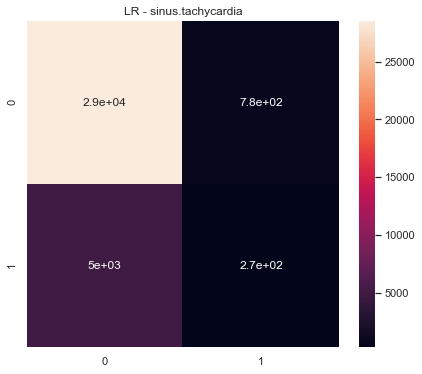

   Fold                ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sinus.tachycardia  300.0  0.496392      0.503795         0.507536   
0   2.0  sinus.tachycardia  300.0  0.471412      0.502037         0.520880   
0   3.0  sinus.tachycardia  300.0  0.486819      0.492214         0.494585   
0   4.0  sinus.tachycardia  300.0  0.484288      0.485429         0.483746   
0   5.0  sinus.tachycardia  300.0  0.506326      0.506673         0.508029   

   ROC Macro  
0   0.601126  
0   0.501003  
0   0.493573  
0   0.476087  
0   0.496126  



                 ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sinus.tachycardia  300.0  2.445238    2.490149       2.514776  2.567915
================================== skin.lesion ==================================
================================== NB ==================================


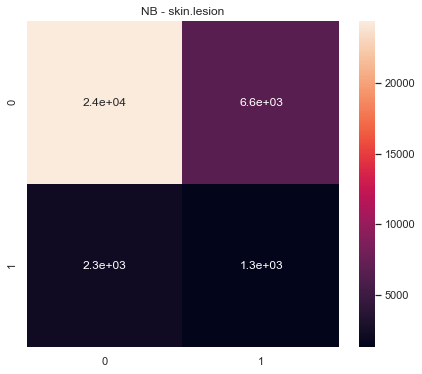

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  skin.lesion  300.0  0.515986      0.530337         0.518660   
0   2.0  skin.lesion  300.0  0.538808      0.560980         0.537397   
0   3.0  skin.lesion  300.0  0.499994      0.529514         0.514589   
0   4.0  skin.lesion  300.0  0.523771      0.540766         0.525061   
0   5.0  skin.lesion  300.0  0.505364      0.520208         0.511705   

   ROC Macro  
0   0.587127  
0   0.593856  
0   0.570531  
0   0.574565  
0   0.552276  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  skin.lesion  300.0  2.583922    2.681804       2.607411  2.878354
================================== DT ==================================


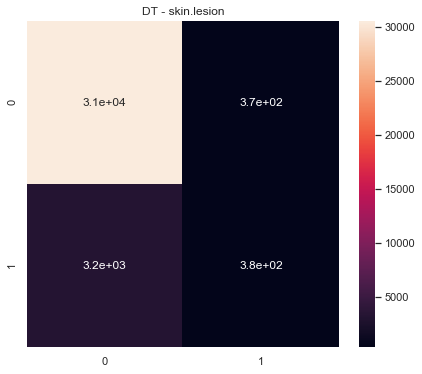

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  skin.lesion  300.0  0.498386      0.507550         0.530020   
0   2.0  skin.lesion  300.0  0.488554      0.501857         0.508151   
0   3.0  skin.lesion  300.0  0.478050      0.498157         0.486616   
0   4.0  skin.lesion  300.0  0.489075      0.504164         0.526727   
0   5.0  skin.lesion  300.0  0.469882      0.476572         0.465064   

   ROC Macro  
0   0.528927  
0   0.541978  
0   0.541169  
0   0.533292  
0   0.517325  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  skin.lesion  300.0  2.423947      2.4883       2.516579  2.662692
================================== RF ==================================


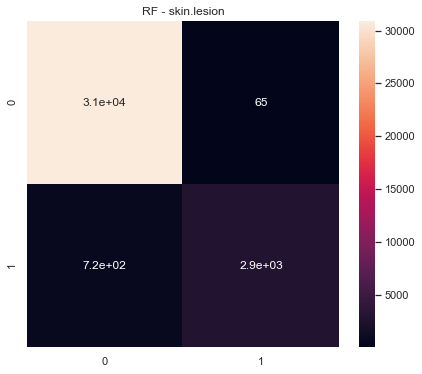

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  skin.lesion  300.0  0.472559      0.500000         0.447974   
0   2.0  skin.lesion  300.0  0.472559      0.500000         0.447974   
0   3.0  skin.lesion  300.0  0.469033      0.493053         0.447245   
0   4.0  skin.lesion  300.0  0.472439      0.499838         0.447887   
0   5.0  skin.lesion  300.0  0.469289      0.485029         0.458865   

   ROC Macro  
0   0.584348  
0   0.589610  
0   0.572814  
0   0.496352  
0   0.533920  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  skin.lesion  300.0  2.35588     2.47792       2.249945  2.777043
================================== SGD ==================================


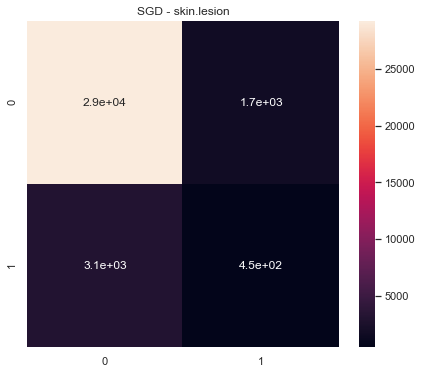

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  skin.lesion  300.0  0.475271      0.473687         0.477578   
0   2.0  skin.lesion  300.0  0.478915      0.485839         0.476128   
0   3.0  skin.lesion  300.0  0.476338      0.484567         0.472486   
0   4.0  skin.lesion  300.0  0.478037      0.492744         0.476472   
0   5.0  skin.lesion  300.0  0.479054      0.477705         0.481495   

   ROC Macro  
0   0.421198  
0   0.468907  
0   0.458944  
0   0.502159  
0   0.421622  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  skin.lesion  300.0  2.387615    2.414542       2.384159  2.27283
================================== LR ==================================


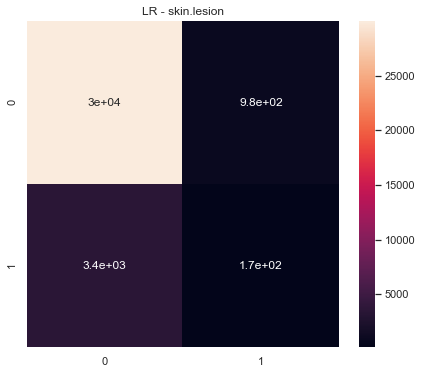

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  skin.lesion  300.0  0.539256      0.563214         0.538090   
0   2.0  skin.lesion  300.0  0.495170      0.508255         0.559865   
0   3.0  skin.lesion  300.0  0.508176      0.511847         0.508897   
0   4.0  skin.lesion  300.0  0.475140      0.477503         0.486738   
0   5.0  skin.lesion  300.0  0.479620      0.486951         0.492765   

   ROC Macro  
0   0.581354  
0   0.499677  
0   0.551443  
0   0.479376  
0   0.467491  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  skin.lesion  300.0  2.497361     2.54777       2.586356  2.579341
================================== sleep.apnea ==================================
================================== NB ==================================


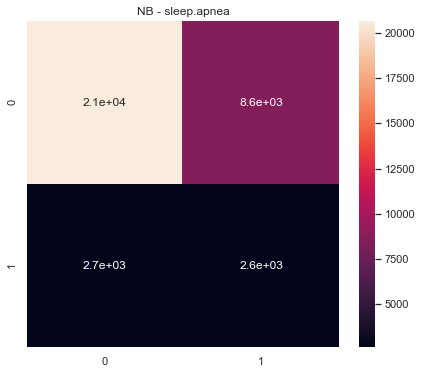

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.apnea  300.0  0.550662      0.561127         0.547817   
0   2.0  sleep.apnea  300.0  0.532686      0.554438         0.536046   
0   3.0  sleep.apnea  300.0  0.521150      0.565550         0.537687   
0   4.0  sleep.apnea  300.0  0.530344      0.561027         0.537858   
0   5.0  sleep.apnea  300.0  0.514398      0.541313         0.525351   

   ROC Macro  
0   0.621295  
0   0.570068  
0   0.595112  
0   0.604537  
0   0.586770  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.apnea  300.0  2.649239    2.783455       2.684759  2.977783
================================== DT ==================================


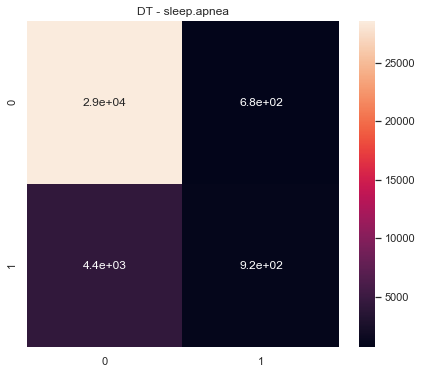

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.apnea  300.0  0.490465      0.507200         0.527646   
0   2.0  sleep.apnea  300.0  0.494895      0.508332         0.526542   
0   3.0  sleep.apnea  300.0  0.472111      0.484554         0.470518   
0   4.0  sleep.apnea  300.0  0.502919      0.514331         0.548497   
0   5.0  sleep.apnea  300.0  0.503159      0.512542         0.534474   

   ROC Macro  
0   0.570392  
0   0.559546  
0   0.536313  
0   0.538045  
0   0.580586  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.apnea  300.0  2.463549    2.526959       2.607678  2.784883
================================== RF ==================================


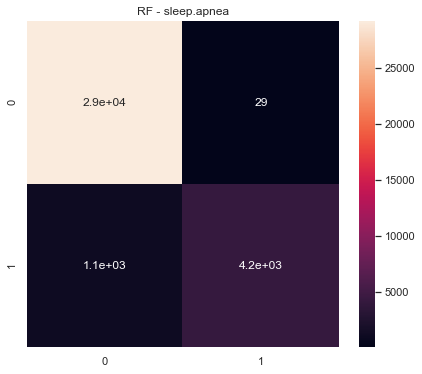

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.apnea  300.0  0.459442      0.500387         0.673422   
0   2.0  sleep.apnea  300.0  0.458464      0.499915         0.423361   
0   3.0  sleep.apnea  300.0  0.452630      0.488293         0.421822   
0   4.0  sleep.apnea  300.0  0.458337      0.499658         0.423328   
0   5.0  sleep.apnea  300.0  0.458457      0.499829         0.423411   

   ROC Macro  
0   0.626766  
0   0.650666  
0   0.586913  
0   0.572331  
0   0.661782  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.apnea  300.0  2.28733    2.488081       2.365343  3.098457
================================== SGD ==================================


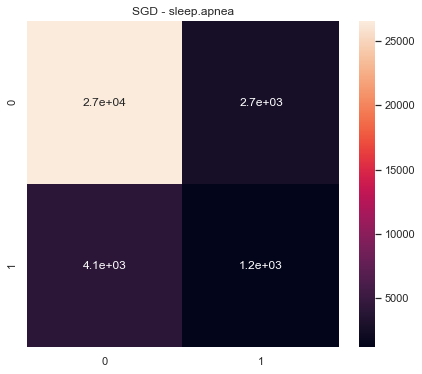

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.apnea  300.0  0.497095      0.499808         0.499733   
0   2.0  sleep.apnea  300.0  0.515563      0.517762         0.532214   
0   3.0  sleep.apnea  300.0  0.492309      0.496490         0.494826   
0   4.0  sleep.apnea  300.0  0.469372      0.478333         0.466163   
0   5.0  sleep.apnea  300.0  0.540238      0.538842         0.542250   

   ROC Macro  
0   0.490994  
0   0.506938  
0   0.483467  
0   0.476031  
0   0.519454  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.apnea  300.0  2.514578    2.531235       2.535186  2.476884
================================== LR ==================================


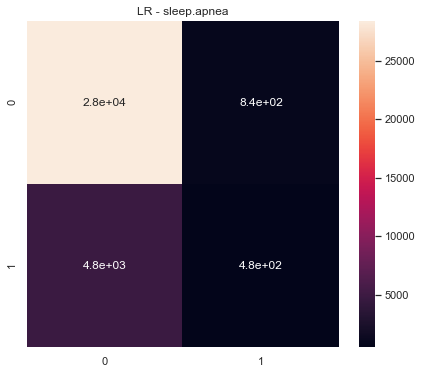

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.apnea  300.0  0.513479      0.513240         0.513881   
0   2.0  sleep.apnea  300.0  0.470075      0.494456         0.477453   
0   3.0  sleep.apnea  300.0  0.506102      0.506040         0.506234   
0   4.0  sleep.apnea  300.0  0.508855      0.510223         0.514646   
0   5.0  sleep.apnea  300.0  0.566447      0.561369         0.575846   

   ROC Macro  
0   0.563071  
0   0.556657  
0   0.558178  
0   0.536577  
0   0.597443  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.apnea  300.0  2.564958    2.585327       2.588059  2.811926
================================== sleep.disorder ==================================
================================== NB ==================================


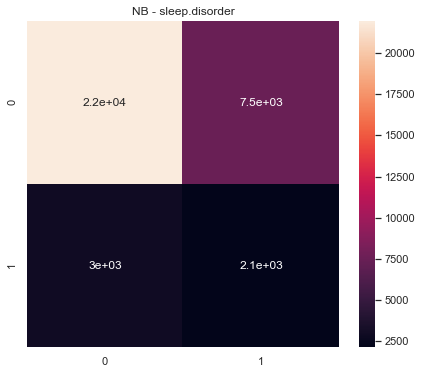

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.disorder  300.0  0.544808      0.556343         0.542595   
0   2.0  sleep.disorder  300.0  0.520448      0.540821         0.526222   
0   3.0  sleep.disorder  300.0  0.492929      0.532589         0.517855   
0   4.0  sleep.disorder  300.0  0.549171      0.571927         0.548536   
0   5.0  sleep.disorder  300.0  0.521602      0.529209         0.522082   

   ROC Macro  
0   0.609099  
0   0.568307  
0   0.558763  
0   0.595585  
0   0.582728  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.disorder  300.0  2.628958    2.730889        2.65729  2.914481
================================== DT ==================================


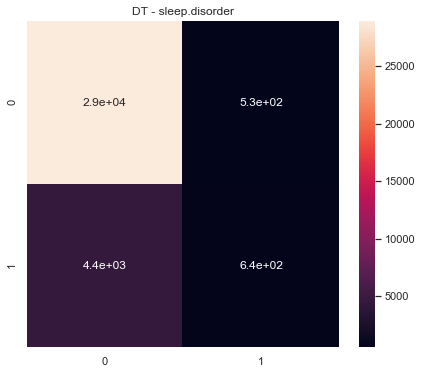

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.disorder  300.0  0.486687      0.503262         0.511554   
0   2.0  sleep.disorder  300.0  0.482923      0.494966         0.488766   
0   3.0  sleep.disorder  300.0  0.459439      0.470525         0.452770   
0   4.0  sleep.disorder  300.0  0.474416      0.497001         0.487343   
0   5.0  sleep.disorder  300.0  0.493039      0.511251         0.565171   

   ROC Macro  
0   0.552207  
0   0.534173  
0   0.483005  
0   0.472789  
0   0.539683  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.disorder  300.0  2.396504    2.477005       2.505604  2.581856
================================== RF ==================================


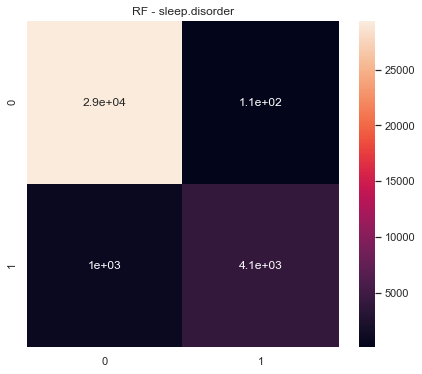

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.disorder  300.0  0.460156      0.499661         0.426441   
0   2.0  sleep.disorder  300.0  0.479972      0.501259         0.505727   
0   3.0  sleep.disorder  300.0  0.445247      0.470558         0.422520   
0   4.0  sleep.disorder  300.0  0.458846      0.497115         0.426047   
0   5.0  sleep.disorder  300.0  0.461252      0.500322         0.593180   

   ROC Macro  
0   0.580607  
0   0.585042  
0   0.555494  
0   0.479657  
0   0.557585  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.disorder  300.0  2.305472    2.468915       2.373915  2.758385
================================== SGD ==================================


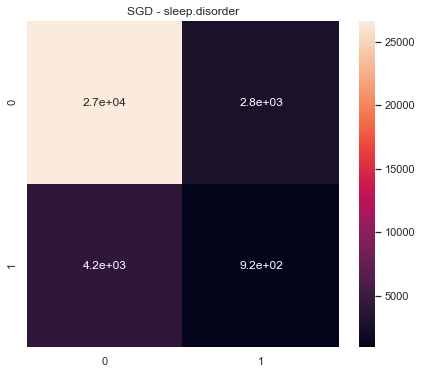

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.disorder  300.0  0.463538      0.462175         0.465221   
0   2.0  sleep.disorder  300.0  0.489699      0.489901         0.489558   
0   3.0  sleep.disorder  300.0  0.477478      0.476532         0.480182   
0   4.0  sleep.disorder  300.0  0.471191      0.478269         0.468298   
0   5.0  sleep.disorder  300.0  0.496892      0.496982         0.496874   

   ROC Macro  
0   0.463546  
0   0.475589  
0   0.430660  
0   0.446037  
0   0.526417  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision  Avg ROC
0  sleep.disorder  300.0  2.398797    2.403858       2.400133  2.34225
================================== LR ==================================


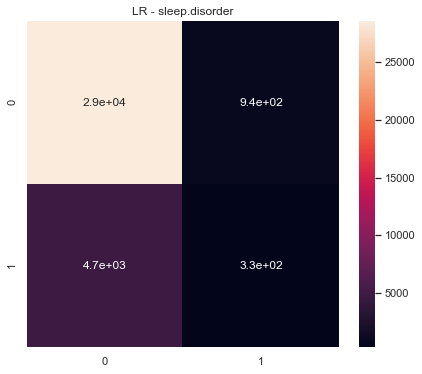

   Fold             ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  sleep.disorder  300.0  0.511700      0.511501         0.513549   
0   2.0  sleep.disorder  300.0  0.512051      0.512347         0.516489   
0   3.0  sleep.disorder  300.0  0.515311      0.517600         0.515069   
0   4.0  sleep.disorder  300.0  0.493175      0.493112         0.493270   
0   5.0  sleep.disorder  300.0  0.530212      0.531736         0.529264   

   ROC Macro  
0   0.596962  
0   0.546393  
0   0.551099  
0   0.437730  
0   0.566172  



              ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  sleep.disorder  300.0  2.562449    2.566296       2.567641  2.698355
================================== spinning.sensation ==================================
================================== NB ==================================


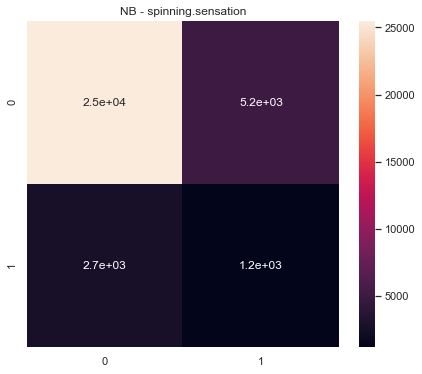

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  spinning.sensation  300.0  0.540208      0.550294         0.537344   
0   2.0  spinning.sensation  300.0  0.543767      0.559736         0.540852   
0   3.0  spinning.sensation  300.0  0.515060      0.533269         0.519856   
0   4.0  spinning.sensation  300.0  0.529090      0.538406         0.527793   
0   5.0  spinning.sensation  300.0  0.535021      0.542997         0.532736   

   ROC Macro  
0   0.581626  
0   0.597259  
0   0.559925  
0   0.563141  
0   0.571076  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  spinning.sensation  300.0  2.663146    2.724703        2.65858  2.873027
================================== DT ==================================


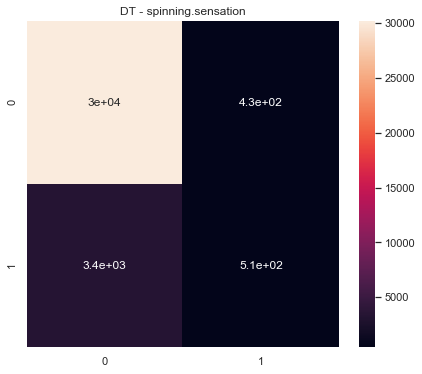

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  spinning.sensation  300.0  0.510225      0.513872         0.536052   
0   2.0  spinning.sensation  300.0  0.504636      0.512449         0.548881   
0   3.0  spinning.sensation  300.0  0.500670      0.509640         0.536302   
0   4.0  spinning.sensation  300.0  0.499334      0.508728         0.532573   
0   5.0  spinning.sensation  300.0  0.494771      0.502502         0.506165   

   ROC Macro  
0   0.568779  
0   0.552763  
0   0.558364  
0   0.567600  
0   0.528098  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  spinning.sensation  300.0  2.509635    2.547191       2.659973  2.775604
================================== RF ==================================


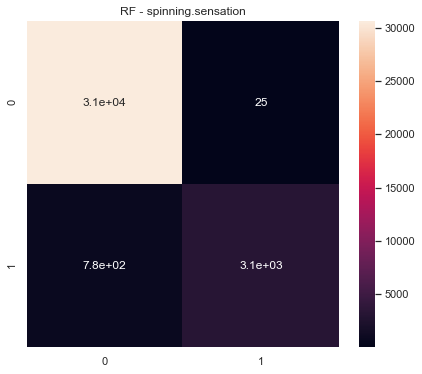

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  spinning.sensation  300.0  0.470901      0.500066         0.505705   
0   2.0  spinning.sensation  300.0  0.469848      0.499918         0.443190   
0   3.0  spinning.sensation  300.0  0.469187      0.493584         0.456828   
0   4.0  spinning.sensation  300.0  0.469360      0.499020         0.443027   
0   5.0  spinning.sensation  300.0  0.469640      0.499510         0.443141   

   ROC Macro  
0   0.566522  
0   0.583541  
0   0.574252  
0   0.551642  
0   0.587427  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  spinning.sensation  300.0  2.348935    2.492099       2.291891  2.863383
================================== SGD ==================================


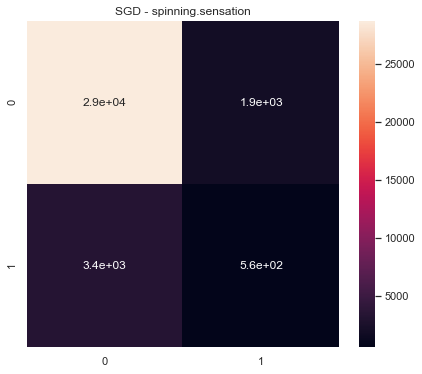

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  spinning.sensation  300.0  0.489945      0.489699         0.490365   
0   2.0  spinning.sensation  300.0  0.486877      0.496920         0.492362   
0   3.0  spinning.sensation  300.0  0.493406      0.496191         0.494507   
0   4.0  spinning.sensation  300.0  0.508350      0.509391         0.514817   
0   5.0  spinning.sensation  300.0  0.495045      0.501033         0.502123   

   ROC Macro  
0   0.441355  
0   0.482649  
0   0.460880  
0   0.486447  
0   0.480844  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  spinning.sensation  300.0  2.473623    2.493234       2.494176  2.352175
================================== LR ==================================


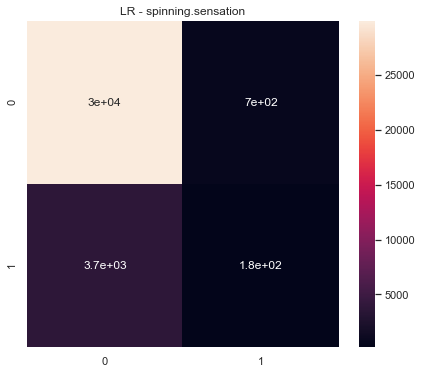

   Fold                 ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  spinning.sensation  300.0  0.515156      0.520604         0.515365   
0   2.0  spinning.sensation  300.0  0.481984      0.505145         0.643718   
0   3.0  spinning.sensation  300.0  0.520326      0.522232         0.519469   
0   4.0  spinning.sensation  300.0  0.517305      0.516874         0.517917   
0   5.0  spinning.sensation  300.0  0.523588      0.529442         0.522585   

   ROC Macro  
0   0.563609  
0   0.549070  
0   0.510842  
0   0.518658  
0   0.564617  



                  ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  spinning.sensation  300.0  2.558359    2.594297       2.719055  2.706796
================================== still.birth ==================================
================================== NB ==================================


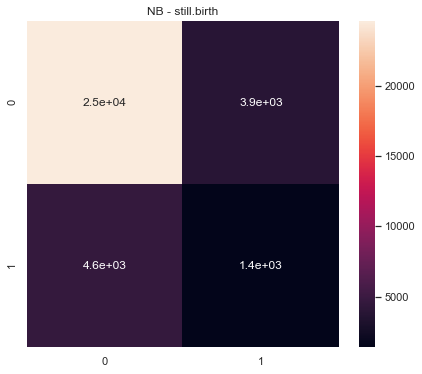

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  still.birth  300.0  0.539104      0.537137         0.543528   
0   2.0  still.birth  300.0  0.517426      0.517923         0.524921   
0   3.0  still.birth  300.0  0.506777      0.507079         0.506726   
0   4.0  still.birth  300.0  0.498696      0.504761         0.508144   
0   5.0  still.birth  300.0  0.522697      0.522249         0.529621   

   ROC Macro  
0   0.573300  
0   0.557409  
0   0.545326  
0   0.534302  
0   0.550369  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  still.birth  300.0  2.584701    2.589149        2.61294  2.760706
================================== DT ==================================


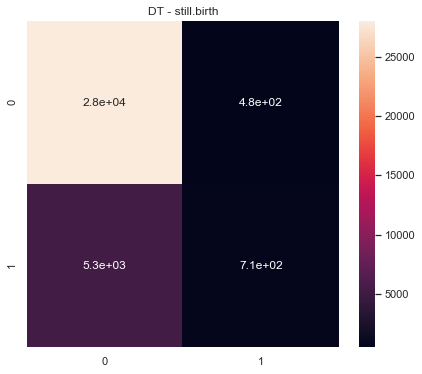

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  still.birth  300.0  0.468977      0.503298         0.530119   
0   2.0  still.birth  300.0  0.485074      0.505870         0.522096   
0   3.0  still.birth  300.0  0.472904      0.500430         0.502032   
0   4.0  still.birth  300.0  0.488524      0.504443         0.512403   
0   5.0  still.birth  300.0  0.484439      0.506380         0.526110   

   ROC Macro  
0   0.532761  
0   0.530948  
0   0.534466  
0   0.532320  
0   0.510662  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  still.birth  300.0  2.399919    2.520421        2.59276  2.641157
================================== RF ==================================


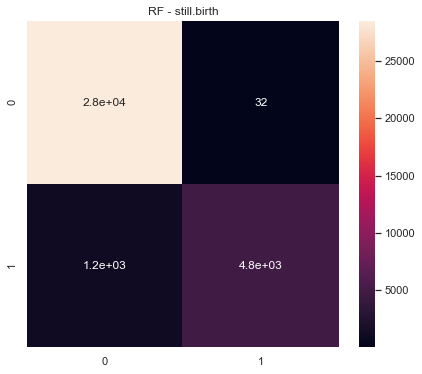

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  still.birth  300.0  0.456506      0.501166         0.555544   
0   2.0  still.birth  300.0  0.454557      0.501065         0.712672   
0   3.0  still.birth  300.0  0.456175      0.496330         0.462486   
0   4.0  still.birth  300.0  0.453334      0.497532         0.451375   
0   5.0  still.birth  300.0  0.453288      0.499862         0.489409   

   ROC Macro  
0   0.540929  
0   0.580505  
0   0.521591  
0   0.544248  
0   0.547241  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  still.birth  300.0  2.27386    2.495956       2.671485  2.734514
================================== SGD ==================================


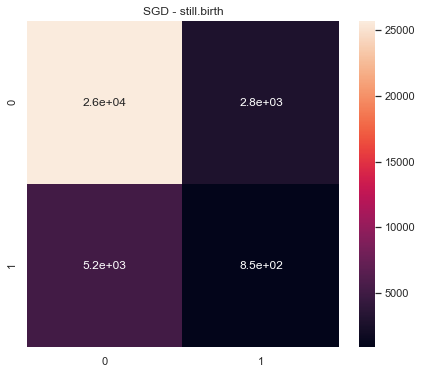

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  still.birth  300.0  0.487358      0.492057         0.488860   
0   2.0  still.birth  300.0  0.508837      0.511718         0.518166   
0   3.0  still.birth  300.0  0.475058      0.490497         0.479451   
0   4.0  still.birth  300.0  0.493999      0.497158         0.496174   
0   5.0  still.birth  300.0  0.487678      0.496595         0.493946   

   ROC Macro  
0   0.462812  
0   0.478633  
0   0.491771  
0   0.455099  
0   0.504579  



           ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  still.birth  300.0  2.45293    2.488025       2.476597  2.392894
================================== LR ==================================


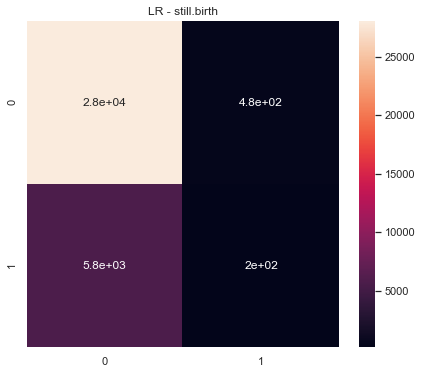

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  still.birth  300.0  0.521177      0.522006         0.534243   
0   2.0  still.birth  300.0  0.522103      0.524159         0.544049   
0   3.0  still.birth  300.0  0.498393      0.501468         0.502044   
0   4.0  still.birth  300.0  0.475106      0.499641         0.498607   
0   5.0  still.birth  300.0  0.495554      0.509364         0.526073   

   ROC Macro  
0   0.548468  
0   0.562434  
0   0.527862  
0   0.497010  
0   0.535181  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  still.birth  300.0  2.512333    2.556639       2.605016  2.670957
================================== tachycardia.ventricular ==================================
================================== NB ==================================


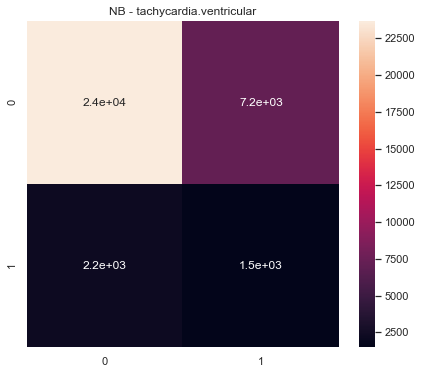

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  tachycardia.ventricular  300.0  0.509517      0.546463   
0   2.0  tachycardia.ventricular  300.0  0.520630      0.532549   
0   3.0  tachycardia.ventricular  300.0  0.516766      0.542432   
0   4.0  tachycardia.ventricular  300.0  0.522677      0.542363   
0   5.0  tachycardia.ventricular  300.0  0.509106      0.522510   

   Precision Macro  ROC Macro  
0         0.522976   0.565281  
0         0.521420   0.564994  
0         0.523283   0.609520  
0         0.525252   0.581589  
0         0.513678   0.569421  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  tachycardia.ventricular  300.0  2.578695    2.686317       2.606609   

    Avg ROC  
0  2.890805  
================================== DT ==================================


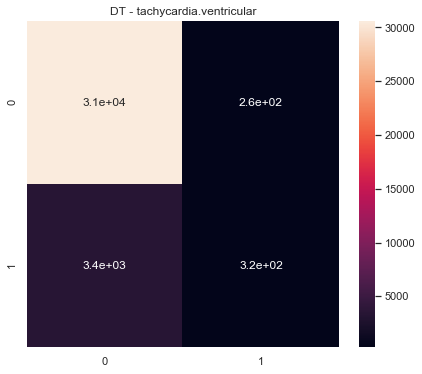

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  tachycardia.ventricular  300.0  0.484489      0.503315   
0   2.0  tachycardia.ventricular  300.0  0.480736      0.497101   
0   3.0  tachycardia.ventricular  300.0  0.485797      0.497636   
0   4.0  tachycardia.ventricular  300.0  0.488478      0.503933   
0   5.0  tachycardia.ventricular  300.0  0.479234      0.501562   

   Precision Macro  ROC Macro  
0         0.531210   0.546130  
0         0.487499   0.510054  
0         0.492815   0.520867  
0         0.524037   0.539982  
0         0.522612   0.506781  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  tachycardia.ventricular  300.0  2.418735    2.503547       2.558173   

    Avg ROC  
0  2.623814  
================================== RF ==================================


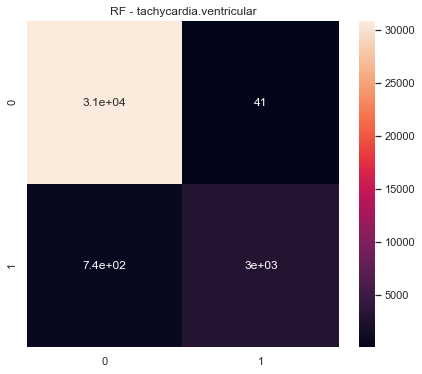

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  tachycardia.ventricular  300.0  0.470701      0.498055   
0   2.0  tachycardia.ventricular  300.0  0.469588      0.494029   
0   3.0  tachycardia.ventricular  300.0  0.480042      0.499129   
0   4.0  tachycardia.ventricular  300.0  0.471470      0.499595   
0   5.0  tachycardia.ventricular  300.0  0.471627      0.499919   

   Precision Macro  ROC Macro  
0         0.446195   0.544422  
0         0.451828   0.536336  
0         0.494374   0.544088  
0         0.446343   0.556515  
0         0.446367   0.588065  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  tachycardia.ventricular  300.0  2.363429    2.490726       2.285107   

    Avg ROC  
0  2.769426  
================================== SGD ==================================


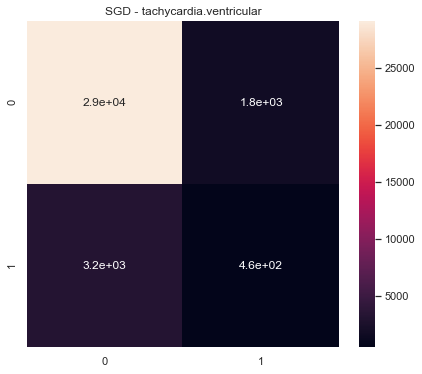

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  tachycardia.ventricular  300.0  0.497040      0.497240   
0   2.0  tachycardia.ventricular  300.0  0.477150      0.479740   
0   3.0  tachycardia.ventricular  300.0  0.488241      0.490107   
0   4.0  tachycardia.ventricular  300.0  0.477666      0.491859   
0   5.0  tachycardia.ventricular  300.0  0.487434      0.487767   

   Precision Macro  ROC Macro  
0         0.497585   0.427925  
0         0.475352   0.505775  
0         0.487663   0.433979  
0         0.475879   0.485117  
0         0.490883   0.503009  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  tachycardia.ventricular  300.0  2.427531    2.446712       2.427361   

    Avg ROC  
0  2.355805  
================================== LR ==================================


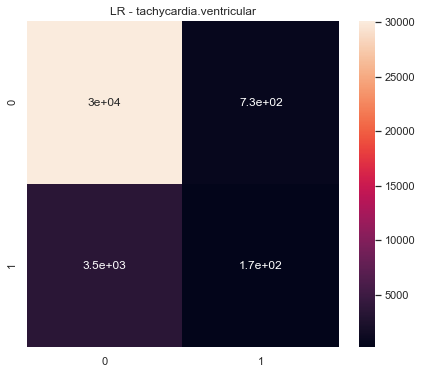

   Fold                      ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  tachycardia.ventricular  300.0  0.507312      0.507211   
0   2.0  tachycardia.ventricular  300.0  0.499696      0.501097   
0   3.0  tachycardia.ventricular  300.0  0.502409      0.507666   
0   4.0  tachycardia.ventricular  300.0  0.496336      0.499375   
0   5.0  tachycardia.ventricular  300.0  0.513265      0.517113   

   Precision Macro  ROC Macro  
0         0.507460   0.491267  
0         0.501515   0.501592  
0         0.505272   0.530818  
0         0.499009   0.522753  
0         0.513226   0.512926  



                       ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  tachycardia.ventricular  300.0  2.519019    2.532462       2.526481   

    Avg ROC  
0  2.559355  
================================== thrombocytopenia ==================================
================================== NB ==================================


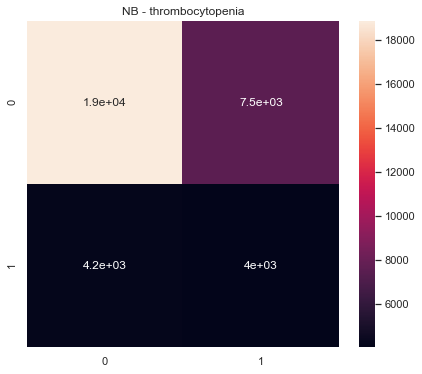

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  thrombocytopenia  300.0  0.550699      0.569766         0.554606   
0   2.0  thrombocytopenia  300.0  0.552141      0.561168         0.551618   
0   3.0  thrombocytopenia  300.0  0.555792      0.559817         0.554205   
0   4.0  thrombocytopenia  300.0  0.523080      0.540847         0.531450   
0   5.0  thrombocytopenia  300.0  0.559554      0.572290         0.559414   

   ROC Macro  
0   0.593298  
0   0.574649  
0   0.588762  
0   0.560653  
0   0.586502  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  thrombocytopenia  300.0  2.741266    2.803888       2.751294  2.903864
================================== DT ==================================


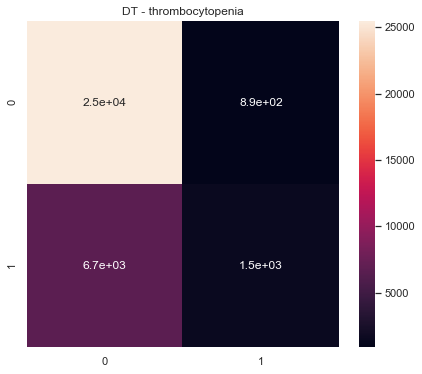

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  thrombocytopenia  300.0  0.512292      0.529166         0.586536   
0   2.0  thrombocytopenia  300.0  0.511383      0.525655         0.563705   
0   3.0  thrombocytopenia  300.0  0.495890      0.510652         0.522227   
0   4.0  thrombocytopenia  300.0  0.471477      0.494041         0.486512   
0   5.0  thrombocytopenia  300.0  0.500399      0.521635         0.567840   

   ROC Macro  
0   0.545476  
0   0.553179  
0   0.537749  
0   0.512969  
0   0.562206  



                ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  thrombocytopenia  300.0  2.49144    2.581148       2.726821  2.711579
================================== RF ==================================


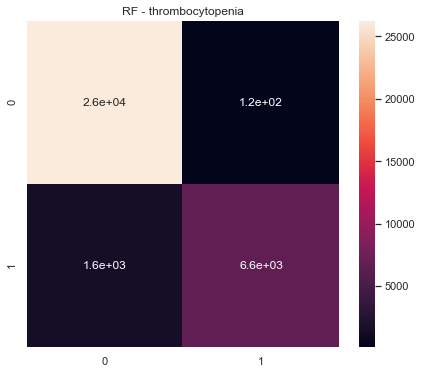

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  thrombocytopenia  300.0  0.470924      0.511501         0.574430   
0   2.0  thrombocytopenia  300.0  0.468702      0.514199         0.650614   
0   3.0  thrombocytopenia  300.0  0.462467      0.503464         0.517982   
0   4.0  thrombocytopenia  300.0  0.460192      0.500317         0.501460   
0   5.0  thrombocytopenia  300.0  0.459435      0.510154         0.641419   

   ROC Macro  
0   0.615036  
0   0.607054  
0   0.603615  
0   0.547847  
0   0.608045  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  thrombocytopenia  300.0  2.321719    2.539635       2.885904  2.981597
================================== SGD ==================================


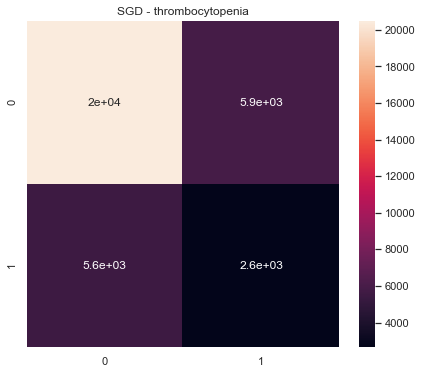

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  thrombocytopenia  300.0  0.513358      0.518062         0.515345   
0   2.0  thrombocytopenia  300.0  0.523029      0.522789         0.523388   
0   3.0  thrombocytopenia  300.0  0.519952      0.525664         0.521685   
0   4.0  thrombocytopenia  300.0  0.521157      0.527727         0.523204   
0   5.0  thrombocytopenia  300.0  0.534038      0.533697         0.534476   

   ROC Macro  
0   0.536086  
0   0.528132  
0   0.543127  
0   0.534138  
0   0.572693  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  thrombocytopenia  300.0  2.611534     2.62794       2.618098  2.714176
================================== LR ==================================


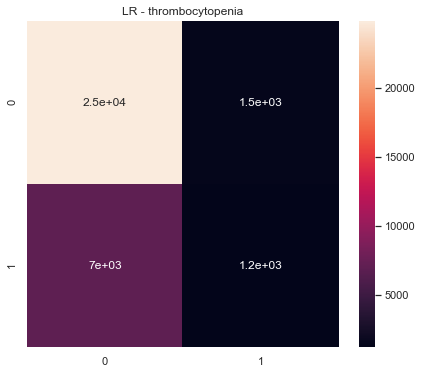

   Fold               ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  thrombocytopenia  300.0  0.523837      0.524165         0.530086   
0   2.0  thrombocytopenia  300.0  0.543225      0.542482         0.559766   
0   3.0  thrombocytopenia  300.0  0.535311      0.535769         0.534959   
0   4.0  thrombocytopenia  300.0  0.503403      0.509277         0.513851   
0   5.0  thrombocytopenia  300.0  0.511566      0.516983         0.526416   

   ROC Macro  
0   0.540174  
0   0.571825  
0   0.578394  
0   0.547160  
0   0.585989  



                ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  thrombocytopenia  300.0  2.617343    2.628676       2.665078  2.823542
================================== tinnitus ==================================
================================== NB ==================================


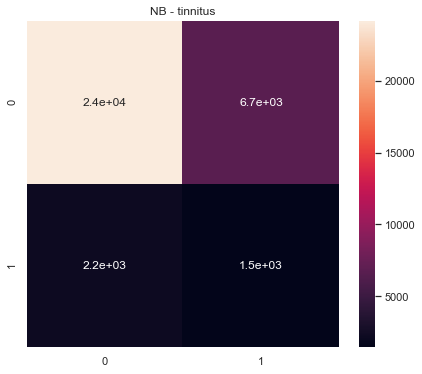

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tinnitus  300.0  0.536778      0.551579         0.534703   0.603895
0   2.0  tinnitus  300.0  0.539179      0.578438         0.542034   0.606176
0   3.0  tinnitus  300.0  0.494662      0.531248         0.514777   0.575659
0   4.0  tinnitus  300.0  0.530065      0.553237         0.531489   0.584949
0   5.0  tinnitus  300.0  0.514897      0.529859         0.518258   0.559270



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tinnitus  300.0  2.615582    2.744362       2.641261  2.929949
================================== DT ==================================


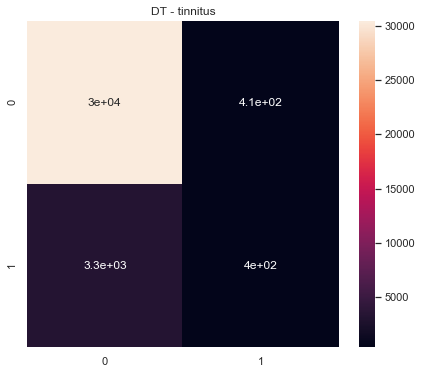

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tinnitus  300.0  0.489994      0.505077         0.532518   0.517358
0   2.0  tinnitus  300.0  0.495899      0.507200         0.533820   0.494094
0   3.0  tinnitus  300.0  0.509665      0.509637         0.512977   0.537422
0   4.0  tinnitus  300.0  0.488349      0.503900         0.523890   0.505893
0   5.0  tinnitus  300.0  0.491026      0.495415         0.492453   0.476147



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tinnitus  300.0  2.474933    2.521229       2.595659  2.530914
================================== RF ==================================


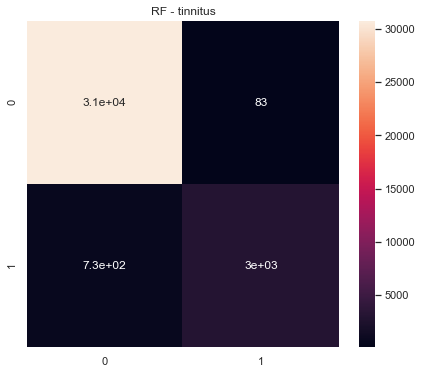

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tinnitus  300.0  0.473468      0.499645         0.489754   0.558063
0   2.0  tinnitus  300.0  0.471632      0.500000         0.446310   0.583178
0   3.0  tinnitus  300.0  0.494537      0.499610         0.499259   0.567789
0   4.0  tinnitus  300.0  0.472929      0.500592         0.696294   0.546243
0   5.0  tinnitus  300.0  0.474064      0.497425         0.475038   0.569621



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tinnitus  300.0  2.386631    2.497273       2.606655  2.824894
================================== SGD ==================================


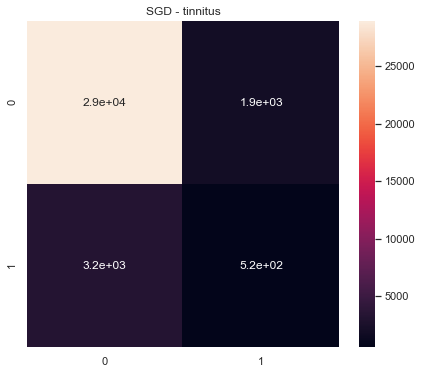

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tinnitus  300.0  0.482427      0.482258         0.482607   0.480141
0   2.0  tinnitus  300.0  0.491471      0.494139         0.491782   0.487862
0   3.0  tinnitus  300.0  0.501840      0.502013         0.501876   0.484493
0   4.0  tinnitus  300.0  0.491592      0.493182         0.491451   0.467086
0   5.0  tinnitus  300.0  0.488788      0.488474         0.490384   0.460341



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tinnitus  300.0  2.456117    2.460065       2.458099  2.379924
================================== LR ==================================


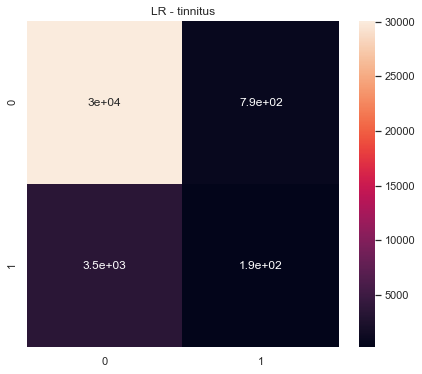

   Fold       ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tinnitus  300.0  0.552933      0.554938         0.551272   0.589670
0   2.0  tinnitus  300.0  0.474320      0.492664         0.469832   0.550837
0   3.0  tinnitus  300.0  0.497104      0.498552         0.498884   0.494902
0   4.0  tinnitus  300.0  0.510894      0.515503         0.511500   0.496563
0   5.0  tinnitus  300.0  0.514765      0.523877         0.516097   0.534830



        ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tinnitus  300.0  2.550016    2.585535       2.547585  2.666801
================================== transient.ischaemic.attack ==================================
================================== NB ==================================


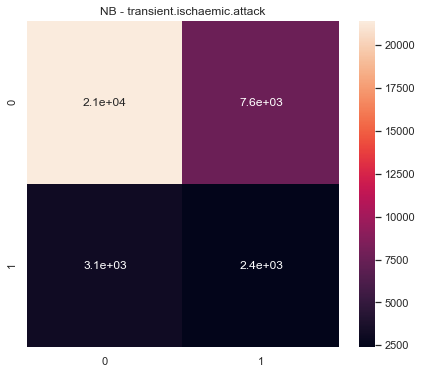

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  transient.ischaemic.attack  300.0  0.537772      0.546004   
0   2.0  transient.ischaemic.attack  300.0  0.529789      0.546744   
0   3.0  transient.ischaemic.attack  300.0  0.524287      0.568320   
0   4.0  transient.ischaemic.attack  300.0  0.534933      0.549144   
0   5.0  transient.ischaemic.attack  300.0  0.527607      0.539004   

   Precision Macro  ROC Macro  
0         0.536400   0.584053  
0         0.532449   0.549869  
0         0.540330   0.595561  
0         0.535531   0.588416  
0         0.528671   0.579810  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  transient.ischaemic.attack  300.0  2.654388    2.749216        2.67338   

    Avg ROC  
0  2.897709  
================================== DT ==================================


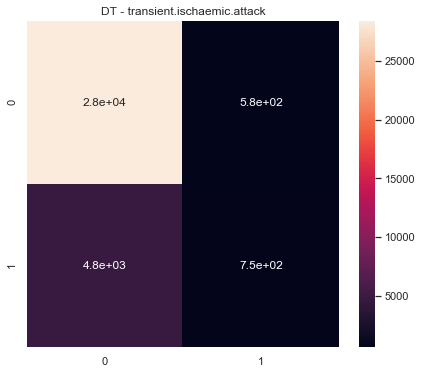

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  transient.ischaemic.attack  300.0  0.459366      0.495600   
0   2.0  transient.ischaemic.attack  300.0  0.484305      0.499897   
0   3.0  transient.ischaemic.attack  300.0  0.478248      0.485729   
0   4.0  transient.ischaemic.attack  300.0  0.484607      0.499507   
0   5.0  transient.ischaemic.attack  300.0  0.476571      0.502318   

   Precision Macro  ROC Macro  
0         0.458902   0.532097  
0         0.499716   0.524983  
0         0.477925   0.491554  
0         0.498706   0.516797  
0         0.512765   0.505086  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  transient.ischaemic.attack  300.0  2.383096    2.483051       2.448013   

    Avg ROC  
0  2.570517  
================================== RF ==================================


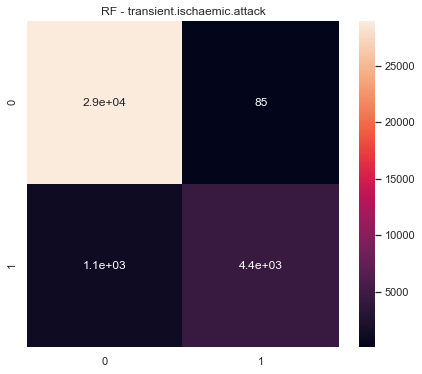

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  transient.ischaemic.attack  300.0  0.457052      0.499762   
0   2.0  transient.ischaemic.attack  300.0  0.457270      0.500193   
0   3.0  transient.ischaemic.attack  300.0  0.442298      0.471243   
0   4.0  transient.ischaemic.attack  300.0  0.453280      0.493624   
0   5.0  transient.ischaemic.attack  300.0  0.458330      0.500818   

   Precision Macro  ROC Macro  
0         0.475422   0.568135  
0         0.544925   0.582642  
0         0.417300   0.510216  
0         0.419032   0.485557  
0         0.753403   0.580728  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  transient.ischaemic.attack  300.0  2.268229     2.46564       2.610081   

    Avg ROC  
0  2.727278  
================================== SGD ==================================


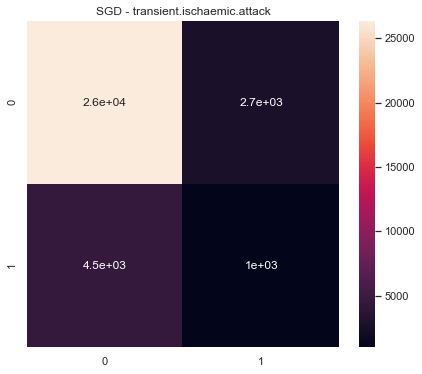

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  transient.ischaemic.attack  300.0  0.481014      0.485263   
0   2.0  transient.ischaemic.attack  300.0  0.466177      0.484680   
0   3.0  transient.ischaemic.attack  300.0  0.445768      0.448087   
0   4.0  transient.ischaemic.attack  300.0  0.466243      0.477473   
0   5.0  transient.ischaemic.attack  300.0  0.481605      0.485001   

   Precision Macro  ROC Macro  
0         0.480398   0.448727  
0         0.463489   0.496575  
0         0.443666   0.404519  
0         0.462401   0.454087  
0         0.480920   0.488160  



                          ADR    PCA    Avg F1  Avg Recall  Avg Precision  \
0  transient.ischaemic.attack  300.0  2.340807    2.380505       2.330874   

    Avg ROC  
0  2.292068  
================================== LR ==================================


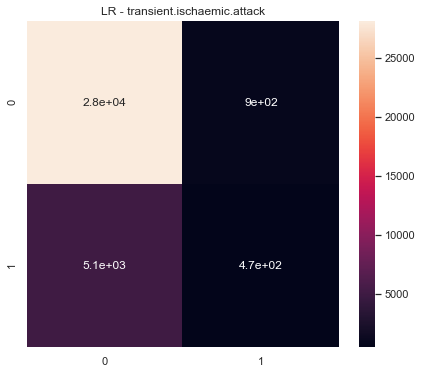

   Fold                         ADR    PCA  F1 Macro  Recall Macro  \
0   1.0  transient.ischaemic.attack  300.0  0.520692      0.522194   
0   2.0  transient.ischaemic.attack  300.0  0.478451      0.501892   
0   3.0  transient.ischaemic.attack  300.0  0.506944      0.509826   
0   4.0  transient.ischaemic.attack  300.0  0.474371      0.481314   
0   5.0  transient.ischaemic.attack  300.0  0.514281      0.515169   

   Precision Macro  ROC Macro  
0         0.520114   0.550837  
0         0.508678   0.526696  
0         0.508038   0.555765  
0         0.472731   0.478226  
0         0.522092   0.519191  



                          ADR    PCA   Avg F1  Avg Recall  Avg Precision  \
0  transient.ischaemic.attack  300.0  2.49474    2.530395       2.531653   

    Avg ROC  
0  2.630715  
================================== tremor ==================================
================================== NB ==================================


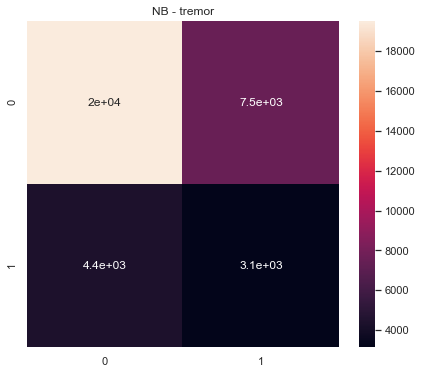

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tremor  300.0  0.538792      0.543630         0.537952   0.565365
0   2.0  tremor  300.0  0.536651      0.537707         0.535977   0.560286
0   3.0  tremor  300.0  0.528368      0.540042         0.531449   0.564732
0   4.0  tremor  300.0  0.525856      0.536698         0.528950   0.535933
0   5.0  tremor  300.0  0.510125      0.510557         0.510056   0.535359



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tremor  300.0  2.639792    2.668633       2.644384  2.761676
================================== DT ==================================


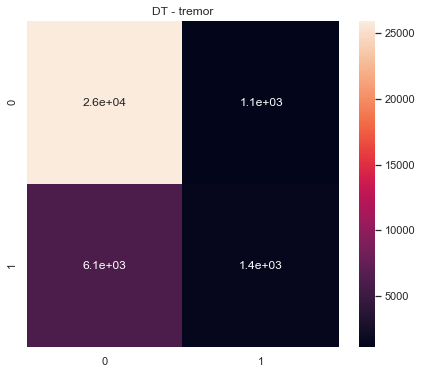

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tremor  300.0  0.501335      0.513542         0.529009   0.541291
0   2.0  tremor  300.0  0.481669      0.499568         0.499034   0.507195
0   3.0  tremor  300.0  0.439469      0.453784         0.431906   0.485285
0   4.0  tremor  300.0  0.476054      0.492425         0.485055   0.477454
0   5.0  tremor  300.0  0.471476      0.499039         0.496971   0.520819



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tremor  300.0  2.370003    2.458358       2.441974  2.532044
================================== RF ==================================


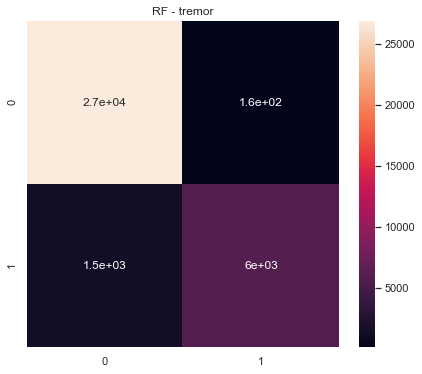

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tremor  300.0  0.440241      0.499517         0.469965   0.556580
0   2.0  tremor  300.0  0.448061      0.497133         0.473935   0.533079
0   3.0  tremor  300.0  0.435416      0.462385         0.422330   0.510225
0   4.0  tremor  300.0  0.445072      0.495929         0.459993   0.521794
0   5.0  tremor  300.0  0.443035      0.500938         0.550335   0.567871



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tremor  300.0  2.211825    2.455902       2.376558  2.689549
================================== SGD ==================================


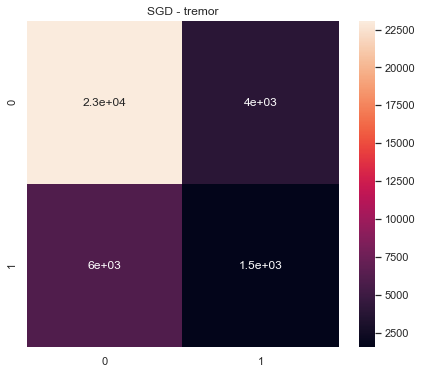

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tremor  300.0  0.505543      0.508933         0.512429   0.483390
0   2.0  tremor  300.0  0.479868      0.479514         0.480646   0.470124
0   3.0  tremor  300.0  0.486268      0.487190         0.486087   0.491058
0   4.0  tremor  300.0  0.484332      0.484164         0.484600   0.464924
0   5.0  tremor  300.0  0.473546      0.478182         0.472846   0.483505



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tremor  300.0  2.429559    2.437983       2.436607  2.393001
================================== LR ==================================


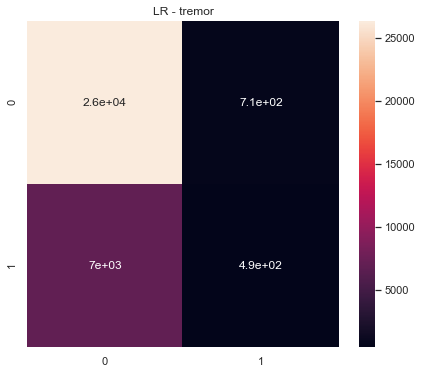

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  tremor  300.0  0.507926      0.519160         0.542586   0.573332
0   2.0  tremor  300.0  0.501014      0.508615         0.514448   0.520912
0   3.0  tremor  300.0  0.484769      0.491338         0.487728   0.503852
0   4.0  tremor  300.0  0.496050      0.508562         0.517439   0.513059
0   5.0  tremor  300.0  0.472456      0.503821         0.515527   0.556658



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  tremor  300.0  2.462216    2.531497       2.577728  2.667812
================================== weight.gain ==================================
================================== NB ==================================


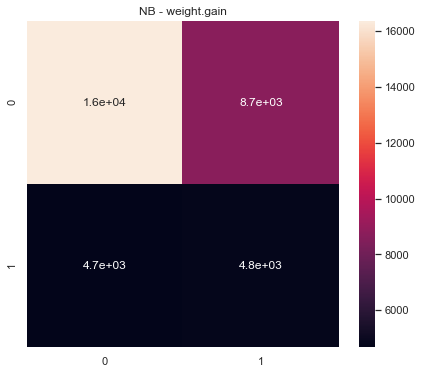

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  weight.gain  300.0  0.560333      0.568090         0.559889   
0   2.0  weight.gain  300.0  0.538679      0.544759         0.539391   
0   3.0  weight.gain  300.0  0.524472      0.547330         0.538102   
0   4.0  weight.gain  300.0  0.547558      0.562449         0.551999   
0   5.0  weight.gain  300.0  0.527329      0.530113         0.527479   

   ROC Macro  
0   0.603250  
0   0.579463  
0   0.577129  
0   0.585888  
0   0.570757  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  weight.gain  300.0  2.698371    2.752741       2.716859  2.916487
================================== DT ==================================


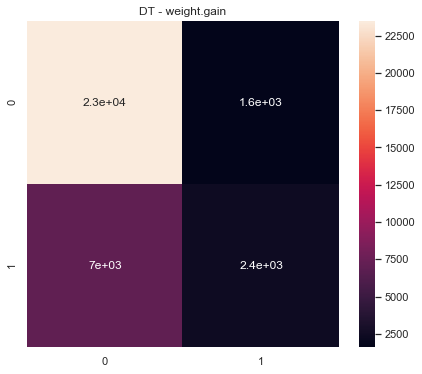

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  weight.gain  300.0  0.514339      0.527834         0.555886   
0   2.0  weight.gain  300.0  0.497348      0.517105         0.537924   
0   3.0  weight.gain  300.0  0.531063      0.536744         0.560108   
0   4.0  weight.gain  300.0  0.480199      0.501289         0.502601   
0   5.0  weight.gain  300.0  0.515732      0.525327         0.543676   

   ROC Macro  
0   0.563834  
0   0.550720  
0   0.570675  
0   0.521511  
0   0.533666  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  weight.gain  300.0  2.538681    2.608299       2.700194  2.740406
================================== RF ==================================


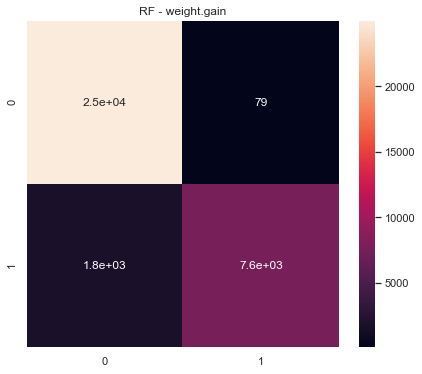

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  weight.gain  300.0  0.443745      0.508648         0.648572   
0   2.0  weight.gain  300.0  0.436902      0.504050         0.564846   
0   3.0  weight.gain  300.0  0.481176      0.518288         0.574511   
0   4.0  weight.gain  300.0  0.448783      0.510444         0.641617   
0   5.0  weight.gain  300.0  0.442397      0.506453         0.587465   

   ROC Macro  
0   0.616977  
0   0.622726  
0   0.626444  
0   0.617206  
0   0.623289  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  weight.gain  300.0  2.253003    2.547883       3.017012  3.106641
================================== SGD ==================================


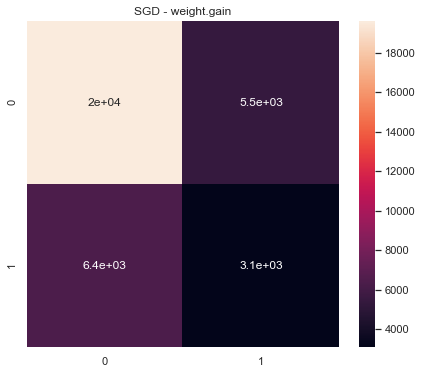

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  weight.gain  300.0  0.499911      0.506894         0.509775   
0   2.0  weight.gain  300.0  0.525904      0.528641         0.539060   
0   3.0  weight.gain  300.0  0.534904      0.534357         0.536007   
0   4.0  weight.gain  300.0  0.531808      0.536171         0.532318   
0   5.0  weight.gain  300.0  0.503557      0.508170         0.510786   

   ROC Macro  
0   0.521117  
0   0.549023  
0   0.572308  
0   0.556265  
0   0.532598  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  weight.gain  300.0  2.596084    2.614232       2.627947  2.731311
================================== LR ==================================


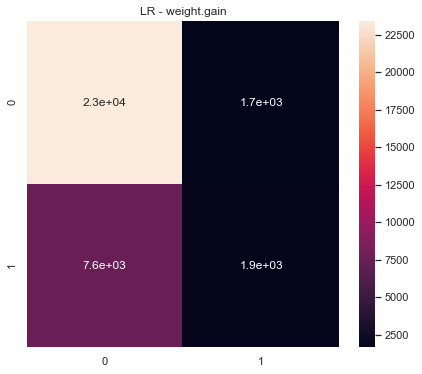

   Fold          ADR    PCA  F1 Macro  Recall Macro  Precision Macro  \
0   1.0  weight.gain  300.0  0.509783      0.519668         0.532867   
0   2.0  weight.gain  300.0  0.523794      0.530727         0.550291   
0   3.0  weight.gain  300.0  0.543000      0.547516         0.581744   
0   4.0  weight.gain  300.0  0.534354      0.537250         0.554295   
0   5.0  weight.gain  300.0  0.511082      0.529459         0.571064   

   ROC Macro  
0   0.585302  
0   0.562266  
0   0.574657  
0   0.566189  
0   0.589766  



           ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  weight.gain  300.0  2.622013    2.664621       2.790261  2.878182
================================== wheeze ==================================
================================== NB ==================================


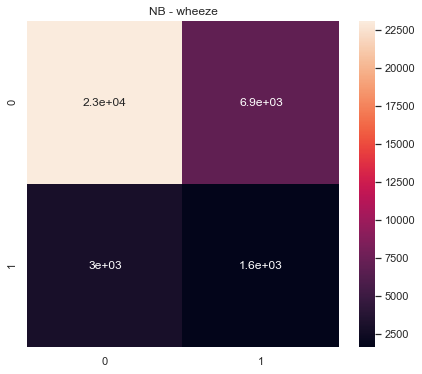

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  wheeze  300.0  0.514957      0.528480         0.518725   0.555172
0   2.0  wheeze  300.0  0.502050      0.515733         0.509840   0.538568
0   3.0  wheeze  300.0  0.472021      0.498299         0.499115   0.501889
0   4.0  wheeze  300.0  0.514090      0.523870         0.516536   0.544660
0   5.0  wheeze  300.0  0.519852      0.525540         0.519710   0.573686



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  wheeze  300.0  2.522969    2.591922       2.563927  2.713975
================================== DT ==================================


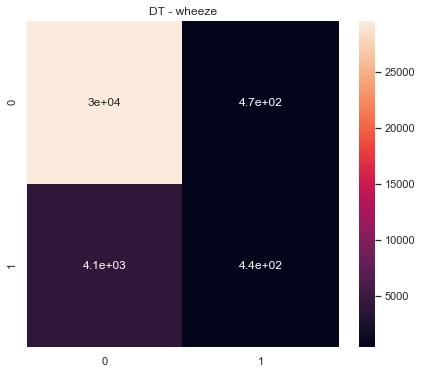

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  wheeze  300.0  0.479100      0.497520         0.490465   0.530543
0   2.0  wheeze  300.0  0.457302      0.473510         0.445604   0.492709
0   3.0  wheeze  300.0  0.456030      0.467088         0.447621   0.472839
0   4.0  wheeze  300.0  0.496496      0.509334         0.538196   0.562605
0   5.0  wheeze  300.0  0.481681      0.502420         0.514136   0.554002



      ADR    PCA   Avg F1  Avg Recall  Avg Precision   Avg ROC
0  wheeze  300.0  2.37061    2.449871       2.436021  2.612698
================================== RF ==================================


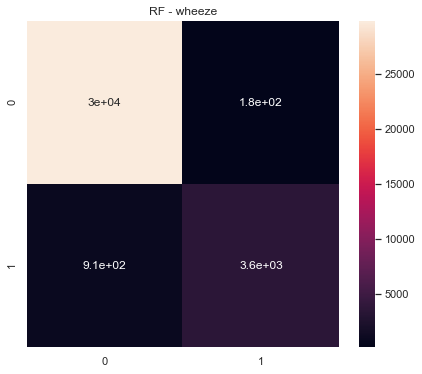

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  wheeze  300.0  0.463557      0.493148         0.447644   0.552299
0   2.0  wheeze  300.0  0.449315      0.469833         0.430513   0.497635
0   3.0  wheeze  300.0  0.452559      0.470288         0.437933   0.489470
0   4.0  wheeze  300.0  0.463967      0.498500         0.433909   0.478053
0   5.0  wheeze  300.0  0.464709      0.499917         0.434134   0.566560



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  wheeze  300.0  2.294107    2.431686       2.184133  2.584016
================================== SGD ==================================


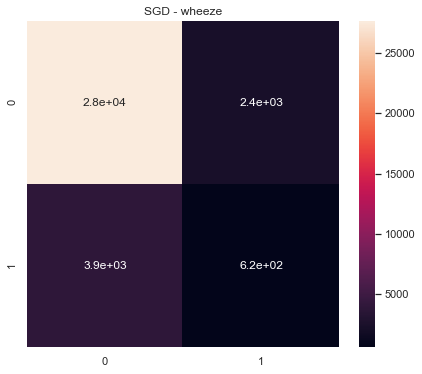

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  wheeze  300.0  0.463174      0.466525         0.460485   0.413750
0   2.0  wheeze  300.0  0.470275      0.475491         0.467158   0.452560
0   3.0  wheeze  300.0  0.458986      0.456822         0.461620   0.393186
0   4.0  wheeze  300.0  0.451437      0.451505         0.451369   0.430308
0   5.0  wheeze  300.0  0.461652      0.464515         0.459250   0.468481



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  wheeze  300.0  2.305524    2.314858       2.299881  2.158285
================================== LR ==================================


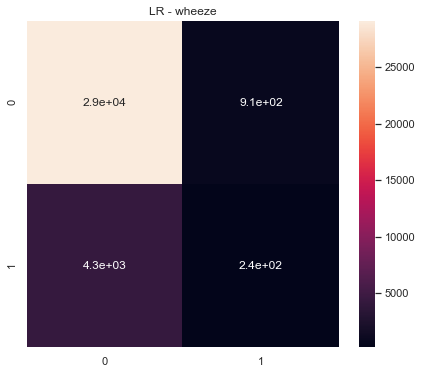

   Fold     ADR    PCA  F1 Macro  Recall Macro  Precision Macro  ROC Macro
0   1.0  wheeze  300.0  0.492110      0.493737         0.492261   0.513795
0   2.0  wheeze  300.0  0.459487      0.468168         0.453174   0.472990
0   3.0  wheeze  300.0  0.483313      0.486565         0.490868   0.443780
0   4.0  wheeze  300.0  0.477202      0.476083         0.480694   0.444916
0   5.0  wheeze  300.0  0.524592      0.523991         0.525405   0.554236



      ADR    PCA    Avg F1  Avg Recall  Avg Precision   Avg ROC
0  wheeze  300.0  2.436704    2.448544       2.442401  2.429716


In [6]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import classification_report, f1_score, recall_score, precision_score, roc_auc_score, confusion_matrix
from sklearn import svm
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.model_selection import cross_validate
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import seaborn as sn
import pandas as pd
import matplotlib.pylab as plt
import matplotlib.transforms

lim = 300
scoring = ['f1_macro', 'recall_macro', 'precision_macro', 'roc_auc']
while(lim<301):
    X = pca_small.iloc[:, 0:lim]
    
    for i in range(label_small.columns.get_loc("abscess"), len(label_small.columns)):
        adr = label_small.columns[i]
        Y = label_small[adr]
        print("==================================", adr, "==================================")
        scores = doClassification(X,Y, adr)
    
    lim = lim + 250

In [7]:
label.columns

Index(['AFIB', 'Abnormal.Gait', 'Abnormal.LFTs', 'Aching.joints', 'Acidosis',
       'Acute.Respiratory.Distress.Syndrome', 'Adenopathy', 'Amnesia',
       'Anorexia', 'Anxiety',
       ...
       'sleep.disorder', 'spinning.sensation', 'still.birth',
       'tachycardia.ventricular', 'thrombocytopenia', 'tinnitus',
       'transient.ischaemic.attack', 'tremor', 'weight.gain', 'wheeze'],
      dtype='object', length=243)